# Sales Analysis

### Import Necessary Libraries

In [176]:
import pandas as pd
import os

#### Task #1 : Merging 12 months of sales data into a single file

In [177]:
# read all files in this repository
files = [file for file in os.listdir("./Sales_Data")]

all_months_data = pd.DataFrame()

for file in files:
    df = pd.read_csv("./Sales_Data/"+ file)
    all_months_data = pd.concat([all_months_data, df])

all_months_data.to_csv("all_data.csv", index=False)    

# df.head()

### Read in updated dataframe

In [178]:
all_data = pd.read_csv("all_data.csv")
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,295665,Macbook Pro Laptop,1,1700,12/30/19 00:01,"136 Church St, New York City, NY 10001"
1,295666,LG Washing Machine,1,600.0,12/29/19 07:03,"562 2nd St, New York City, NY 10001"
2,295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001"
3,295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016"
4,295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301"


### Clean up data

In [179]:
nan_df = all_data[all_data.isna().any(axis=1)]
nan_df.head()

all_data = all_data.dropna(how='all')
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,295665,Macbook Pro Laptop,1,1700,12/30/19 00:01,"136 Church St, New York City, NY 10001"
1,295666,LG Washing Machine,1,600.0,12/29/19 07:03,"562 2nd St, New York City, NY 10001"
2,295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001"
3,295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016"
4,295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301"


### Find 'Or' and delete it

In [180]:
all_data = all_data[all_data['Order Date'].str[0:2] != 'Or']
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,295665,Macbook Pro Laptop,1,1700,12/30/19 00:01,"136 Church St, New York City, NY 10001"
1,295666,LG Washing Machine,1,600.0,12/29/19 07:03,"562 2nd St, New York City, NY 10001"
2,295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001"
3,295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016"
4,295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301"


#### Make columns correct type

In [181]:
all_data['Quantity Ordered'] = pd.to_numeric(all_data['Quantity Ordered'])
all_data['Price Each'] = pd.to_numeric(all_data['Price Each'])

### Augment data with additional columns

#### Task 2 : Add Month Column

In [182]:
all_data['Month'] = all_data['Order Date'].str[0:2]
all_data['Month'] = all_data['Month'].astype('int32')
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month
0,295665,Macbook Pro Laptop,1,1700.00,12/30/19 00:01,"136 Church St, New York City, NY 10001",12
1,295666,LG Washing Machine,1,600.00,12/29/19 07:03,"562 2nd St, New York City, NY 10001",12
2,295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001",12
3,295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016",12
4,295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301",12


#### Task 3: Add a sales column

In [183]:
all_data["Sales"] = all_data["Quantity Ordered"] * all_data["Price Each"]
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales
0,295665,Macbook Pro Laptop,1,1700.00,12/30/19 00:01,"136 Church St, New York City, NY 10001",12,1700.00
1,295666,LG Washing Machine,1,600.00,12/29/19 07:03,"562 2nd St, New York City, NY 10001",12,600.00
2,295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001",12,11.95
3,295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016",12,149.99
4,295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301",12,11.95


### Task 4 : Add a city column

In [184]:
def get_city(address):
    return address.split(", ")[1]

def get_state(address):
    return address.split(", ")[2].split(" ")[0]

all_data['City'] = all_data["Purchase Address"].apply(lambda x: f"{get_city(x)} ({get_state(x)})")

all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales,City
0,295665,Macbook Pro Laptop,1,1700.00,12/30/19 00:01,"136 Church St, New York City, NY 10001",12,1700.00,New York City (NY)
1,295666,LG Washing Machine,1,600.00,12/29/19 07:03,"562 2nd St, New York City, NY 10001",12,600.00,New York City (NY)
2,295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001",12,11.95,New York City (NY)
3,295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016",12,149.99,San Francisco (CA)
4,295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301",12,11.95,Atlanta (GA)


#### Question 1 : What was the best month for sales ? How much was earned that month ?

In [185]:
results = all_data.groupby("Month").sum()

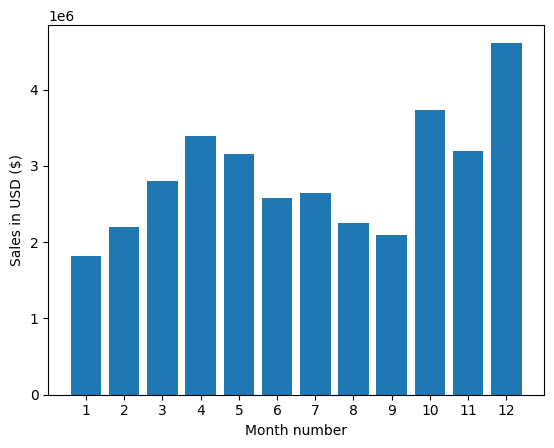

In [186]:
import matplotlib.pyplot as plt

months = range(1,13)

plt.bar(months, results["Sales"])
plt.xticks(months)
plt.ylabel('Sales in USD ($)')
plt.xlabel('Month number')
plt.show()

#### Question 2: What city had the highest number of sales

In [187]:
results = all_data.groupby("City").sum()
results

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales
City,,,,,,,,
Atlanta (GA),2956692956932957102957372957372957562957602957...,USB-C Charging CableWired HeadphonesAAA Batter...,16602,2779908.20,12/18/19 12:3812/16/19 16:4012/26/19 19:0912/1...,"43 Hill St, Atlanta, GA 30301856 12th St, Atla...",104794,2795498.58
Austin (TX),2956802957022957032957032957542957892957982958...,Lightning Charging CableWired HeadphonesAA Bat...,11153,1809873.61,12/01/19 14:3012/21/19 18:5012/17/19 12:2712/1...,"338 Main St, Austin, TX 73301628 River St, Aus...",69829,1819581.75
Boston (MA),2956772956812956812956812956812956872956952957...,AA Batteries (4-pack)Google PhoneUSB-C Chargin...,22528,3637409.77,12/20/19 19:1912/25/19 12:3712/25/19 12:3712/2...,"866 Pine St, Boston, MA 0221579 Elm St, Boston...",141112,3661642.01
Dallas (TX),2956722956732956742956782956792956942957242957...,USB-C Charging CableBose SoundSport Headphones...,16730,2752627.82,12/13/19 09:2912/15/19 23:2612/28/19 11:5112/0...,"813 Hickory St, Dallas, TX 75001718 Wilson St,...",104620,2767975.40
Los Angeles (CA),2956762956882956912956922957062957142957162957...,ThinkPad LaptopApple Airpods HeadphonesBose So...,33289,5421435.23,12/28/19 17:1912/08/19 11:2112/22/19 18:3412/1...,"410 Lincoln St, Los Angeles, CA 90001546 Park ...",208325,5452570.80
New York City (NY),2956652956662956672956702956982956982957002957...,Macbook Pro LaptopLG Washing MachineUSB-C Char...,27932,4635370.83,12/30/19 00:0112/29/19 07:0312/12/19 18:2112/3...,"136 Church St, New York City, NY 10001562 2nd ...",175741,4664317.43
Portland (ME),2956862957972958622960182961272961582962062962...,USB-C Charging CableWired HeadphonesAAA Batter...,2750,447189.25,12/17/19 16:1012/16/19 09:2312/03/19 14:2212/2...,"573 Maple St, Portland, ME 04101163 Washington...",17144,449758.27
Portland (OR),2956712956822957342957572958192958572958922958...,USB-C Charging CableUSB-C Charging CableAAA Ba...,11303,1860558.22,12/16/19 15:1012/23/19 19:2512/25/19 12:3812/0...,"928 12th St, Portland, OR 97035780 Elm St, Por...",70621,1870732.34
San Francisco (CA),2956682956752956832956842956852956892956962956...,27in FHD MonitorUSB-C Charging CableWired Head...,50239,8211461.74,12/22/19 15:1312/13/19 13:5212/23/19 22:4612/0...,"410 6th St, San Francisco, CA 94016594 1st St,...",315520,8262203.91


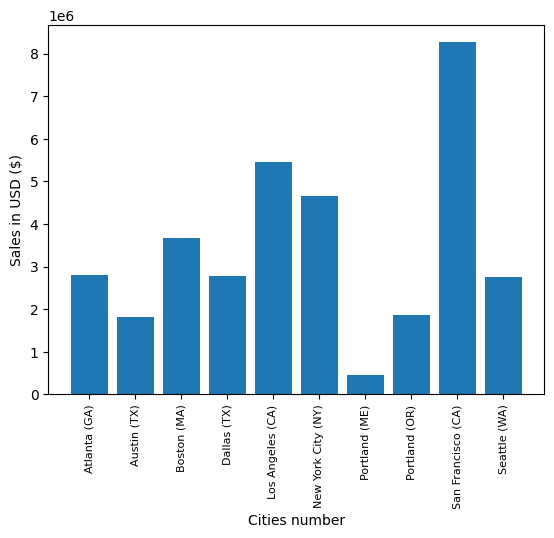

In [188]:
import matplotlib.pyplot as plt

cities = [city for city, df in all_data.groupby("City")]

plt.bar(cities, results["Sales"])
plt.xticks(cities, rotation="vertical", size=8)
plt.ylabel('Sales in USD ($)')
plt.xlabel('Cities number')
plt.show()

### Question 3: What time should we display advertissements to maximize likelihood of customer's buying product ?

In [189]:
all_data["Order Date"] = pd.to_datetime(all_data["Order Date"])

all_data["Hour"] = all_data["Order Date"].dt.hour
all_data["Minute"] = all_data["Order Date"].dt.minute
all_data["Count"] = 1

/var/folders/3c/l11vy5791sn8v7nkq2032b5c0000gn/T/ipykernel_3897/1704936826.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  all_data["Order Date"] = pd.to_datetime(all_data["Order Date"])


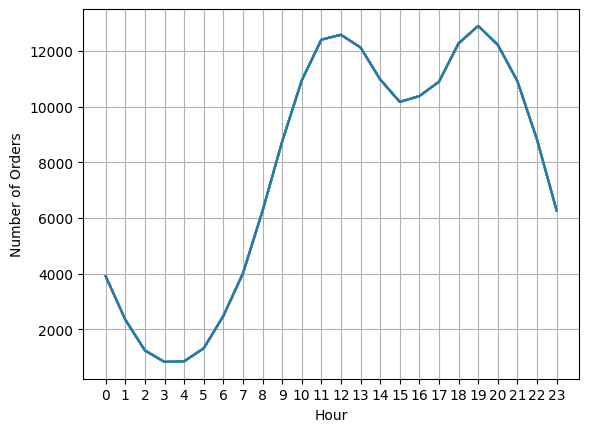

In [190]:
hours = [hour for hour, df in all_data.groupby("Hour")]

plt.plot(hours, all_data.groupby('Hour').count())
plt.xticks(hours)
plt.xlabel("Hour")
plt.ylabel("Number of Orders")
plt.grid()
plt.show()

### Question 4: What products are most often sold together ?

In [191]:
df = all_data[all_data["Order ID"].duplicated(keep=False)]

df['Grouped'] = all_data.groupby("Order ID")["Product"].transform(lambda x: ",".join(x))

df = df[["Order ID", "Grouped"]].drop_duplicates()

df.head()

/var/folders/3c/l11vy5791sn8v7nkq2032b5c0000gn/T/ipykernel_3897/651202092.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Grouped'] = all_data.groupby("Order ID")["Product"].transform(lambda x: ",".join(x))


,Order ID,Grouped
16,295681,"Google Phone,USB-C Charging Cable,Bose SoundSp..."
36,295698,"Vareebadd Phone,USB-C Charging Cable"
42,295703,"AA Batteries (4-pack),Bose SoundSport Headphones"
66,295726,"iPhone,Lightning Charging Cable"
76,295735,"iPhone,Apple Airpods Headphones,Wired Headphones"


In [192]:
from itertools import combinations
from collections import Counter

count = Counter()

for row in df["Grouped"]:
    row_list = row.split(',')
    count.update(Counter(combinations(row_list, 2)))

for key, value in count.most_common(10):
    print(key, value)



('iPhone', 'Lightning Charging Cable') 1005
('Google Phone', 'USB-C Charging Cable') 987
('iPhone', 'Wired Headphones') 447
('Google Phone', 'Wired Headphones') 414
('Vareebadd Phone', 'USB-C Charging Cable') 361
('iPhone', 'Apple Airpods Headphones') 360
('Google Phone', 'Bose SoundSport Headphones') 220
('USB-C Charging Cable', 'Wired Headphones') 160
('Vareebadd Phone', 'Wired Headphones') 143
('Lightning Charging Cable', 'Wired Headphones') 92


#### Question 5: What product sold the most ? Why do you think it sold the most ?

In [193]:
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales,City,Hour,Minute,Count
0,295665,Macbook Pro Laptop,1,1700.00,2019-12-30 00:01:00,"136 Church St, New York City, NY 10001",12,1700.00,New York City (NY),0,1,1
1,295666,LG Washing Machine,1,600.00,2019-12-29 07:03:00,"562 2nd St, New York City, NY 10001",12,600.00,New York City (NY),7,3,1
2,295667,USB-C Charging Cable,1,11.95,2019-12-12 18:21:00,"277 Main St, New York City, NY 10001",12,11.95,New York City (NY),18,21,1
3,295668,27in FHD Monitor,1,149.99,2019-12-22 15:13:00,"410 6th St, San Francisco, CA 94016",12,149.99,San Francisco (CA),15,13,1
4,295669,USB-C Charging Cable,1,11.95,2019-12-18 12:38:00,"43 Hill St, Atlanta, GA 30301",12,11.95,Atlanta (GA),12,38,1


In [211]:
import pandas as pd
df = pd.DataFrame(all_data)

product_group = df.groupby("Product")
quantity_ordered = (df.mean())["Quantity Ordered"]
products = [product for product, df in product_group]

plt.bar(product_group, quantity_ordered)
plt.ylabel("Quantity Ordered")
plt.xlabel("Product")
plt.xticks(products, rotation="vertical", size=8)
plt.show()

TypeError: Could not convert ['295665295666295667295668295669295670295671295672295673295674295675295676295677295678295679295680295681295681295681295681295682295683295684295685295686295687295688295689295690295691295692295693295694295695295696295697295698295698295699295700295701295702295703295703295704295705295706295707295708295709295710295711295712295713295714295715295716295717295718295719295720295721295722295723295724295725295726295726295727295728295729295730295731295732295733295734295735295735295735295736295737295737295738295739295740295741295742295743295744295745295746295747295748295749295750295751295752295753295753295754295755295756295757295758295759295759295760295761295762295763295764295765295766295767295768295769295770295771295772295773295774295775295776295777295778295779295780295781295782295783295783295784295785295786295786295787295788295789295790295791295792295793295793295794295795295796295797295798295799295800295801295802295803295804295805295806295807295808295809295810295811295812295813295814295815295816295817295817295818295819295820295821295822295822295823295824295825295826295827295828295829295829295830295831295832295833295834295835295836295837295838295839295840295841295842295843295844295845295846295847295848295849295850295851295852295853295854295855295856295857295858295859295860295861295862295863295864295865295866295867295868295869295870295871295872295873295874295875295876295877295878295879295880295881295882295883295884295885295886295887295888295889295890295891295892295893295894295895295896295897295898295899295900295901295902295903295904295905295906295907295908295909295910295911295912295913295914295915295916295917295918295918295919295920295921295922295923295924295925295926295927295928295929295930295931295932295932295933295934295935295936295937295938295939295940295941295942295943295944295945295946295947295948295949295950295951295952295952295953295954295955295956295957295958295959295960295961295962295963295964295965295966295967295968295969295970295971295972295973295974295975295976295977295978295979295980295981295982295983295984295985295986295987295988295989295990295991295991295992295993295994295995295996295997295998295999296000296001296002296003296004296005296006296007296008296009296010296011296012296013296014296015296016296017296018296019296020296021296022296023296024296025296026296027296028296029296030296031296032296033296034296035296036296037296038296039296040296041296042296043296044296045296046296047296048296049296050296051296052296053296054296055296056296057296058296059296060296061296062296063296064296065296066296067296068296069296070296071296072296073296074296075296076296077296078296079296080296081296081296082296083296084296085296086296087296088296089296090296091296092296093296094296095296096296097296098296099296100296101296102296103296104296105296106296107296108296109296110296111296112296113296114296115296116296117296118296119296120296121296122296123296124296125296126296127296128296129296130296131296132296133296134296135296135296136296137296138296139296140296141296141296142296143296144296144296145296146296147296148296149296150296151296152296152296153296154296155296156296157296158296159296160296161296162296163296164296165296166296167296168296169296170296171296172296173296174296175296176296177296178296179296180296181296182296183296184296185296186296187296187296188296189296190296191296192296193296194296195296196296197296198296199296200296201296202296203296204296205296206296207296208296209296210296211296212296213296214296215296216296217296218296219296220296221296222296223296224296225296226296227296228296229296230296231296232296233296234296235296236296237296238296239296240296241296242296243296244296245296246296247296248296249296250296251296252296253296254296255296256296257296258296259296260296261296262296263296263296264296265296266296267296267296268296269296270296271296272296273296274296275296276296276296277296278296279296280296281296282296283296284296285296286296287296288296289296290296291296292296293296294296295296296296297296298296299296300296301296302296303296304296305296306296307296308296309296310296311296312296313296314296315296316296317296318296319296320296321296322296323296324296325296326296327296328296329296330296331296332296333296334296335296336296337296338296339296340296341296342296343296344296345296346296347296348296349296350296351296352296353296353296353296353296354296354296355296356296357296358296359296360296361296362296363296364296365296366296367296368296369296370296371296372296373296374296375296376296377296378296379296380296381296382296383296384296385296386296387296388296389296390296390296391296392296393296394296395296396296397296398296399296400296401296402296403296404296405296406296407296408296409296410296411296412296413296414296415296416296417296418296419296420296421296422296423296424296425296426296427296428296429296430296431296432296433296434296435296436296437296438296439296440296441296442296442296443296443296444296444296445296446296447296448296449296450296451296452296453296454296455296456296457296458296459296460296461296462296463296464296465296466296467296468296469296470296471296472296473296474296475296476296477296478296479296480296481296482296483296484296485296486296487296488296489296490296491296492296493296494296495296496296497296498296499296500296501296502296503296504296505296506296507296508296509296510296511296512296513296514296515296516296517296518296519296520296520296521296522296523296524296525296526296527296528296529296530296531296531296532296533296534296535296536296537296538296539296540296541296542296543296544296545296546296547296548296549296550296551296552296553296554296555296556296557296558296559296560296561296562296563296564296565296566296567296568296569296570296571296572296573296574296574296575296576296577296578296579296580296581296582296583296584296585296586296587296588296589296590296591296592296593296594296595296596296597296598296599296600296601296602296603296604296605296606296607296608296609296609296610296611296612296613296614296615296616296617296618296619296620296621296622296623296624296625296626296627296628296629296630296631296632296633296634296635296636296637296638296639296640296641296641296642296643296644296645296646296647296648296649296650296651296652296653296653296654296655296656296657296658296659296660296661296662296663296664296665296666296667296668296668296669296670296670296671296672296673296674296675296676296677296678296679296680296681296682296683296684296685296686296687296687296688296689296690296691296692296693296694296695296696296697296698296699296700296701296702296703296704296705296706296707296707296708296709296710296711296712296713296714296715296716296717296718296719296720296721296722296723296724296725296726296727296728296729296730296730296731296732296733296734296735296736296737296738296739296740296741296742296743296744296745296746296747296748296749296750296751296752296753296754296755296756296757296758296759296760296761296762296763296764296765296766296767296768296769296770296771296772296773296774296775296776296777296778296779296780296781296782296783296784296785296786296787296788296789296790296791296792296793296794296795296796296797296797296798296799296800296801296802296803296804296804296805296806296807296808296809296810296811296812296813296814296815296816296817296818296819296820296821296822296823296824296825296826296827296828296829296830296831296832296833296834296835296836296837296838296839296840296841296841296842296843296844296845296846296847296848296849296850296850296851296852296853296854296855296856296856296857296858296859296860296861296862296863296864296865296866296867296868296869296870296871296872296873296874296875296876296877296878296879296880296881296882296883296884296885296886296887296888296889296890296891296892296893296894296895296896296897296898296899296900296900296901296902296903296904296905296906296907296908296909296910296911296912296913296914296914296915296916296917296918296919296920296921296922296922296923296924296925296926296927296928296929296930296931296932296933296934296935296936296937296938296939296940296941296942296943296944296944296945296946296947296948296949296950296951296952296953296954296955296956296957296958296959296960296961296962296963296964296965296966296967296968296969296970296971296972296973296974296975296976296977296978296978296979296980296981296982296983296984296985296986296987296987296988296989296990296991296992296992296993296994296995296996296997296998296998296998296999297000297001297002297003297004297005297006297007297008297009297010297011297012297013297014297015297016297017297018297019297020297021297022297023297023297024297025297026297027297028297029297030297031297032297033297034297035297036297037297038297039297040297041297042297043297044297045297046297047297048297049297050297051297052297053297054297055297056297056297056297057297058297058297058297059297060297061297062297063297064297065297066297067297068297069297070297071297072297073297074297075297075297076297077297078297078297079297080297081297082297083297084297085297086297087297088297089297090297091297092297093297094297095297096297097297098297099297100297101297102297103297104297105297106297107297108297109297110297111297112297113297114297115297116297117297118297119297120297121297122297123297124297125297126297127297128297129297130297131297132297133297134297135297136297137297138297139297140297141297142297143297144297145297146297147297148297149297150297151297152297153297154297155297156297157297158297159297160297161297162297163297164297164297165297165297166297167297167297168297169297170297171297172297173297174297175297176297177297178297179297180297181297182297183297184297185297186297187297188297189297190297191297192297192297193297194297195297196297197297197297198297199297200297201297202297203297204297205297206297207297208297209297210297211297212297213297214297215297216297217297218297219297220297221297222297223297224297225297226297227297227297228297229297230297231297232297233297234297235297236297237297238297239297240297241297242297243297244297245297246297247297248297249297250297251297252297253297254297255297256297256297256297257297258297259297260297261297262297263297264297265297266297267297268297269297270297271297272297273297274297275297276297277297278297278297279297280297281297282297283297284297285297286297286297287297288297289297290297291297292297293297294297295297296297297297298297299297300297301297302297303297304297305297306297307297308297309297310297311297311297312297313297314297315297316297317297318297319297320297321297322297323297324297325297326297327297328297329297330297331297332297333297334297335297336297337297338297339297340297341297342297343297343297344297345297345297346297347297348297349297350297351297352297353297354297355297356297357297358297359297360297361297362297363297364297365297366297367297368297369297370297371297372297373297374297374297375297376297377297378297378297379297380297381297382297383297384297385297386297387297388297388297389297390297391297392297393297394297395297396297397297398297399297400297401297402297403297404297405297406297407297408297409297410297411297412297412297413297414297415297416297417297418297419297420297421297422297423297424297425297426297427297428297429297430297431297432297433297434297435297436297437297438297438297439297440297441297442297443297444297445297446297447297448297449297450297451297452297452297453297454297455297456297457297457297458297459297460297461297462297463297464297465297466297467297468297469297470297471297472297473297474297475297476297477297478297479297480297481297482297483297484297485297486297487297488297489297490297491297492297493297494297495297496297497297498297499297500297501297502297503297504297505297506297507297508297509297510297511297512297513297514297515297516297517297518297519297520297521297522297523297524297525297526297527297528297529297530297531297532297533297534297535297536297537297538297538297539297540297541297542297543297544297545297546297547297548297549297550297551297552297553297554297554297554297555297556297557297558297559297560297561297562297563297564297565297565297566297567297568297569297569297570297571297572297573297573297574297575297576297576297577297578297579297580297581297582297583297584297585297586297587297588297589297590297591297592297592297593297594297595297596297597297598297599297600297601297602297603297604297605297606297607297608297609297610297611297612297613297614297615297616297617297618297619297620297621297622297623297624297625297626297627297628297629297630297630297631297632297633297634297635297636297637297638297639297640297640297641297642297643297644297645297646297647297648297649297650297651297652297653297654297655297656297657297658297659297660297661297662297663297664297665297666297667297668297669297670297671297672297673297674297675297676297677297678297679297680297681297682297683297684297685297686297687297688297689297690297691297692297693297694297695297696297697297698297699297700297701297702297703297704297705297706297706297707297708297709297710297711297712297713297714297715297716297717297718297719297720297721297722297723297724297725297726297727297728297729297730297730297731297732297733297734297735297736297737297738297739297740297741297742297743297744297745297746297747297748297749297750297751297752297753297754297755297756297757297758297759297760297760297761297762297763297764297765297766297767297768297769297770297771297772297773297774297775297776297777297778297779297780297781297782297783297784297785297786297787297788297789297790297791297792297793297794297795297796297797297798297799297800297801297802297803297804297805297806297807297808297809297810297811297812297813297814297815297816297817297817297818297819297820297821297822297823297824297825297826297827297828297829297830297831297832297833297834297835297836297837297838297839297840297840297841297842297843297844297845297846297847297847297848297849297850297851297852297853297854297855297856297857297858297859297860297861297862297863297864297865297866297867297868297869297870297871297872297873297874297875297876297877297878297879297880297881297882297883297884297885297886297887297888297889297890297891297892297893297894297894297895297895297896297897297898297899297900297901297902297903297904297905297906297907297908297909297910297911297912297913297914297915297916297917297918297919297920297921297922297923297924297925297926297927297928297929297930297931297932297933297934297935297936297937297938297939297940297941297942297943297944297945297945297945297946297947297948297949297950297951297951297952297953297954297955297956297957297958297959297960297961297962297963297964297965297966297967297968297969297970297971297972297973297974297975297976297977297978297979297980297981297982297983297984297985297986297987297988297989297990297991297992297993297994297995297996297997297998297999298000298001298002298003298004298005298006298007298007298008298008298009298010298011298012298013298014298015298016298017298018298019298020298021298022298023298024298025298026298027298028298029298030298031298032298033298034298035298036298037298038298039298040298041298042298043298044298045298046298047298048298049298050298051298052298053298053298054298055298056298057298058298059298060298061298062298063298064298065298066298067298068298069298070298071298072298073298074298075298076298077298078298079298080298081298082298083298084298085298086298087298088298089298090298091298092298093298094298095298096298097298098298099298100298101298102298103298104298105298106298107298108298109298110298111298112298113298114298115298116298117298118298118298119298120298121298122298123298124298125298126298127298128298129298130298131298132298133298134298135298136298137298138298139298140298141298142298143298144298145298146298147298148298149298150298151298152298153298154298155298156298157298158298159298160298161298162298163298164298165298166298167298168298169298170298171298172298173298174298175298176298177298178298179298180298181298182298183298184298185298186298187298188298189298190298191298192298193298194298195298196298197298198298199298200298201298202298203298204298205298206298207298208298209298210298211298212298213298214298215298216298216298217298218298219298220298221298222298223298224298225298226298227298228298229298230298231298232298233298234298235298236298237298238298239298240298241298242298243298244298245298246298247298248298249298250298251298252298253298254298255298256298257298258298259298260298261298262298263298264298265298266298267298268298269298270298271298272298273298274298275298276298277298278298279298280298281298282298283298284298285298286298287298288298289298289298290298291298292298293298294298295298296298297298298298299298300298301298302298303298304298305298306298307298308298309298310298311298312298313298314298315298316298317298318298319298320298321298322298323298324298325298326298327298328298329298330298331298332298333298334298335298336298337298338298339298340298341298342298343298344298345298346298347298348298349298350298351298352298352298353298354298355298356298357298358298358298359298360298361298362298363298364298365298366298367298368298369298370298371298372298373298374298375298376298377298378298379298380298381298382298383298384298385298386298387298388298389298390298391298392298393298394298395298396298397298398298399298400298401298402298403298404298405298406298407298408298409298410298411298412298413298414298415298416298417298418298419298420298421298422298423298424298425298426298427298428298429298430298431298432298433298434298435298436298437298438298439298440298441298442298443298444298445298446298447298448298449298450298451298452298453298454298455298456298457298458298458298459298460298461298462298463298464298464298465298466298466298467298468298469298470298471298472298473298474298475298475298476298477298478298479298480298481298482298483298483298484298485298486298487298488298489298490298491298492298493298494298495298496298497298498298499298500298501298502298503298504298505298506298507298508298508298509298510298511298512298513298514298515298516298517298518298519298520298521298522298523298524298525298526298527298528298529298530298531298532298533298534298535298536298537298538298539298540298541298542298543298544298545298546298547298548298549298550298551298552298553298554298555298556298557298558298559298560298561298562298563298564298565298566298567298568298569298570298571298572298573298574298575298576298577298578298579298580298581298582298583298584298585298586298587298588298589298590298591298592298593298594298595298596298597298598298599298600298601298602298603298604298605298606298607298608298609298610298611298612298613298614298615298616298617298618298619298620298621298622298623298624298625298626298627298628298629298630298631298632298633298634298635298636298637298638298639298640298641298642298643298644298645298646298647298648298649298650298651298652298652298653298654298655298656298657298657298658298658298659298660298661298662298662298663298664298665298666298667298668298669298670298671298672298673298674298675298676298677298678298679298680298681298682298682298683298684298685298686298687298688298689298690298691298692298692298693298694298695298696298697298698298698298699298700298701298702298703298704298705298706298707298708298709298710298711298712298713298714298715298716298717298718298719298720298721298722298723298724298725298726298727298728298729298730298731298732298732298733298734298734298735298736298737298738298739298740298741298742298743298744298744298745298746298747298748298749298750298751298752298753298754298755298756298757298758298759298760298761298762298763298764298765298766298767298768298769298770298771298772298773298774298775298776298777298778298779298780298781298782298783298784298785298786298787298788298789298790298791298792298793298794298795298796298797298798298799298800298801298801298802298803298804298805298806298806298807298808298809298810298811298812298813298814298815298816298817298818298819298820298821298821298822298823298824298825298826298827298828298829298829298830298831298832298833298834298835298835298836298837298838298839298840298841298842298843298844298844298845298846298847298848298849298850298851298852298853298854298855298856298857298858298859298860298861298862298863298864298865298866298867298867298868298869298870298871298871298871298872298873298874298875298876298877298878298879298880298881298882298883298883298884298885298886298887298888298889298890298891298892298893298894298895298896298897298898298899298900298901298902298903298904298905298906298907298908298909298910298911298912298913298914298915298916298917298918298919298920298921298922298922298923298924298925298926298927298928298929298930298931298931298932298933298934298935298936298937298938298939298940298941298942298943298944298945298946298947298948298949298950298951298952298953298954298955298956298957298958298959298960298961298962298963298964298965298966298967298968298969298970298971298972298973298974298975298976298977298978298979298980298981298982298983298984298985298986298987298988298988298989298990298991298991298992298993298994298994298995298996298997298998298999299000299001299002299003299004299005299006299007299008299009299010299010299011299012299013299014299015299016299017299018299019299020299021299022299023299024299024299025299026299027299028299029299030299031299032299033299034299035299036299037299038299039299040299041299042299043299044299045299046299046299047299048299049299050299051299052299053299054299055299056299057299058299059299060299061299062299063299064299065299066299067299067299068299069299070299071299072299073299074299075299076299077299078299079299080299081299082299083299084299085299086299087299088299089299090299091299092299093299094299095299096299097299098299099299100299101299102299103299104299104299105299106299107299108299109299110299111299112299113299114299115299116299117299118299119299120299120299121299122299123299123299124299125299126299126299126299127299127299128299129299130299131299132299133299134299135299136299137299137299138299139299140299141299142299143299144299145299146299147299148299149299150299151299152299153299154299155299156299157299158299159299160299161299162299163299164299164299165299166299167299168299169299170299171299172299173299174299175299176299177299178299178299179299180299181299182299183299184299185299186299186299187299188299189299190299191299192299193299194299195299196299197299198299199299200299201299202299203299204299205299206299206299206299207299208299209299210299211299212299213299214299215299216299217299218299219299220299221299222299223299224299225299226299227299228299229299230299231299232299233299234299235299236299236299236299237299238299239299240299241299242299243299244299245299246299247299248299249299250299251299251299252299253299254299255299256299257299258299259299260299261299262299263299264299265299266299267299268299268299269299270299271299272299273299274299275299276299277299278299278299279299280299281299282299283299284299285299286299287299288299289299290299291299292299293299294299295299296299297299298299299299300299301299302299303299304299305299306299307299308299309299310299311299312299313299314299315299316299317299318299319299320299321299322299323299324299325299326299327299328299329299330299331299332299333299334299335299336299337299338299339299340299341299342299343299344299345299346299347299348299349299350299351299352299353299354299355299356299357299358299359299360299361299362299363299364299365299366299367299368299369299370299371299372299373299374299375299376299377299378299379299380299381299382299383299384299385299386299387299388299389299390299391299392299393299394299395299396299397299398299398299399299400299401299402299403299404299405299406299407299408299409299410299411299412299413299414299415299416299417299418299419299420299421299422299423299424299425299426299427299428299429299430299431299432299433299434299434299435299436299437299438299439299440299441299442299442299443299444299445299446299447299448299449299450299451299452299453299454299455299456299457299458299459299460299461299462299463299464299465299466299467299468299469299470299471299472299473299474299475299476299477299478299479299480299481299482299483299484299485299486299487299488299489299490299491299492299493299494299495299496299497299498299499299500299501299502299503299504299505299506299507299508299509299510299511299512299513299514299515299516299517299518299518299519299520299521299522299523299524299525299526299527299528299529299530299531299532299533299534299535299536299536299537299538299539299540299540299541299542299543299544299545299546299547299548299549299550299550299551299552299553299554299555299556299557299558299559299560299561299562299563299564299565299566299567299568299569299570299571299572299572299573299573299574299575299576299577299578299579299580299581299582299583299584299585299586299586299587299588299589299590299591299592299593299594299595299596299597299598299598299599299600299601299602299603299604299605299605299606299607299608299609299610299611299612299613299614299615299616299617299618299619299620299620299621299622299623299624299625299626299627299628299629299630299631299631299632299633299634299635299636299637299638299639299640299641299642299643299644299645299646299647299648299649299650299651299652299653299654299655299656299657299658299659299660299661299662299663299664299665299666299667299668299669299670299670299671299672299673299674299675299676299677299678299679299680299681299682299683299684299685299686299687299688299689299690299691299692299693299694299695299696299697299698299699299700299701299702299703299703299704299705299706299707299708299709299710299711299712299713299714299715299716299717299718299719299719299720299721299722299723299724299725299726299727299728299729299730299731299732299733299734299735299736299737299738299739299740299741299742299743299744299745299745299746299747299748299749299750299751299752299753299754299755299756299757299758299759299760299761299762299763299764299765299766299767299768299769299770299771299772299773299774299775299776299777299778299779299780299781299782299783299784299785299786299787299788299789299790299791299792299792299792299793299794299795299796299797299798299799299800299801299802299803299804299804299805299806299807299808299809299810299811299812299813299814299815299816299817299818299819299819299820299821299822299823299824299825299826299827299828299829299830299830299830299831299832299833299834299835299836299837299838299839299840299841299842299843299844299845299846299847299848299849299850299851299852299853299854299855299856299857299858299859299860299861299862299863299864299865299866299867299868299869299870299871299872299873299874299875299876299877299878299879299880299881299882299882299883299884299885299886299886299887299888299889299890299891299892299893299894299895299896299897299898299898299899299900299901299902299903299904299905299906299907299908299909299910299911299912299913299914299915299916299917299918299919299920299921299922299923299924299925299926299927299928299929299930299931299932299933299934299935299936299937299938299939299940299941299942299943299944299945299946299947299948299949299950299951299952299953299953299954299955299956299957299958299959299960299961299962299963299964299965299966299967299968299969299970299971299972299973299974299975299975299976299977299978299979299980299981299981299982299983299984299985299986299987299988299988299989299990299991299992299993299994299995299996299997299998299999300000300001300002300002300003300004300005300006300007300008300009300010300011300012300013300014300015300016300017300018300019300020300021300022300023300024300025300026300027300028300029300030300031300032300033300034300034300035300036300037300038300039300040300041300042300043300044300045300046300047300048300049300050300051300052300053300054300055300056300057300058300059300060300061300062300063300064300065300066300067300068300069300070300071300072300072300072300073300074300075300076300077300078300079300080300081300082300083300084300085300085300086300087300088300089300090300091300092300093300094300095300096300097300098300099300100300101300102300103300104300105300106300107300108300109300110300111300112300113300114300115300116300117300117300118300119300119300120300121300122300123300124300125300126300127300127300128300129300130300131300132300133300134300135300136300137300138300139300140300141300142300143300144300145300146300147300148300148300149300150300151300152300153300154300155300156300157300158300159300160300161300162300163300164300165300166300167300168300169300170300171300172300173300174300175300176300177300178300179300180300181300182300183300184300185300186300187300188300189300190300191300192300193300194300195300196300197300198300199300200300201300202300203300204300205300206300207300208300209300210300211300212300213300214300215300216300217300218300219300220300221300222300222300223300224300225300226300227300228300229300230300230300231300232300233300234300235300236300237300238300239300240300241300242300243300244300245300246300247300248300249300250300251300252300253300254300255300256300257300258300258300259300260300261300262300263300264300265300266300267300268300269300270300271300272300273300274300275300276300276300277300278300279300280300281300282300283300284300285300286300287300288300289300290300291300292300293300294300295300296300297300298300299300300300301300302300303300304300305300306300307300308300309300310300310300311300312300313300314300315300316300317300318300319300320300321300322300323300324300325300326300327300328300329300330300331300332300333300334300335300336300337300338300339300340300341300342300343300343300344300345300346300347300348300349300350300351300352300353300354300355300356300357300358300359300360300361300362300363300364300365300366300367300368300369300370300371300372300373300374300375300376300377300378300379300380300381300382300383300383300384300385300386300387300388300389300390300391300392300393300394300395300395300396300397300398300399300400300401300402300403300404300405300406300407300408300409300410300411300412300412300413300414300415300416300417300418300419300420300421300422300423300424300425300426300427300428300429300430300431300432300433300434300435300436300437300438300439300440300441300442300443300444300445300446300447300448300449300450300451300452300453300454300455300456300456300457300458300459300460300461300462300463300464300465300466300467300468300469300470300471300472300473300474300475300476300477300478300479300480300481300482300483300484300485300486300487300488300489300490300491300492300493300494300495300495300496300497300498300499300500300501300502300503300504300505300506300507300508300509300510300511300512300513300514300515300516300517300518300519300519300520300521300522300523300524300525300526300527300528300528300529300530300531300532300533300534300535300536300537300538300539300540300541300542300543300544300545300546300547300548300549300550300551300552300553300554300555300556300557300558300559300560300561300562300563300564300565300566300567300568300569300570300571300572300573300574300575300576300576300577300578300579300580300581300582300583300584300585300586300587300588300589300590300591300592300593300594300595300596300597300598300599300600300601300601300602300603300604300605300606300607300608300609300610300611300612300613300614300615300615300616300617300618300619300620300621300622300623300624300625300626300627300628300629300630300631300632300633300634300635300636300637300638300639300640300641300642300643300644300645300646300647300648300649300650300651300652300653300654300655300656300657300658300659300659300660300661300662300663300664300665300666300667300668300669300670300671300672300673300673300674300675300676300677300678300679300680300681300682300683300683300683300684300685300686300687300688300689300690300691300692300693300694300695300696300697300698300699300700300701300702300703300704300705300706300707300708300709300710300711300712300713300714300715300716300717300718300719300719300720300721300722300723300724300725300726300727300728300729300730300731300732300733300734300735300736300737300738300739300740300741300742300743300744300745300746300747300748300749300750300751300752300753300754300755300756300757300758300759300760300761300762300763300764300765300766300766300767300768300769300770300771300772300773300774300775300776300777300778300779300780300781300782300783300784300785300786300787300788300789300790300791300792300793300794300795300796300797300798300799300800300801300802300803300804300805300806300807300808300809300810300811300812300813300814300815300816300817300818300819300820300821300822300823300824300825300826300827300828300829300830300831300832300833300834300835300835300835300836300837300838300839300840300841300842300843300844300845300846300847300848300849300850300851300852300853300854300855300856300857300857300858300859300860300861300862300863300864300865300866300867300868300869300870300871300872300873300874300875300875300876300877300877300878300879300880300881300882300883300884300885300886300887300888300889300890300891300892300893300894300895300896300897300898300899300900300901300902300903300904300905300906300907300908300909300910300911300912300913300914300915300916300917300918300919300920300921300922300923300924300925300926300927300928300929300930300931300932300933300934300935300936300937300938300939300940300941300942300943300944300945300946300947300948300949300950300951300952300953300954300955300956300956300957300958300959300960300961300962300963300964300965300966300967300968300969300970300971300972300973300974300975300976300977300978300979300980300981300982300983300984300985300986300987300987300988300989300990300991300992300993300994300995300996300997300998300999301000301001301002301003301004301004301005301006301007301008301009301010301011301012301013301014301015301016301017301018301019301020301021301022301023301024301025301026301027301028301029301030301031301032301033301034301034301035301036301037301038301039301040301041301042301043301044301045301046301047301048301049301050301051301052301053301054301055301056301057301058301059301060301061301062301063301064301065301066301067301068301069301070301071301072301072301073301074301075301076301077301078301079301080301081301082301083301084301085301086301087301088301089301090301091301092301093301094301095301096301097301098301099301100301101301101301102301103301104301105301106301107301108301109301110301111301112301113301114301115301116301117301118301119301120301121301122301123301124301125301126301127301127301128301129301130301131301132301133301134301135301136301137301138301139301140301141301142301143301144301145301146301147301148301149301150301151301152301153301154301155301156301157301158301159301160301161301162301163301164301165301165301166301167301168301169301170301171301172301173301174301175301176301177301178301178301179301180301181301182301183301184301185301186301186301187301188301189301190301191301192301193301194301195301196301197301198301199301200301201301202301203301204301205301206301207301208301209301210301211301212301213301214301215301216301217301218301219301220301221301222301223301224301225301226301227301228301229301230301231301232301233301234301235301236301237301238301239301240301241301242301243301244301245301246301246301247301248301249301250301251301252301253301254301255301256301257301258301259301260301261301262301263301264301265301266301267301268301269301270301271301272301273301274301275301276301277301278301279301280301281301282301283301284301285301286301287301288301289301290301291301292301293301293301294301295301296301297301298301299301300301301301302301303301304301305301306301307301308301309301310301311301312301313301314301315301316301317301318301319301320301321301322301323301324301325301326301327301328301329301330301331301332301333301334301334301335301336301336301337301338301339301340301341301342301343301344301345301346301347301347301348301349301350301351301352301353301354301355301356301357301358301359301360301361301362301363301364301365301366301367301368301369301370301371301372301373301374301375301376301377301378301379301380301381301382301382301382301383301384301385301386301387301388301389301390301391301392301393301394301395301396301397301398301399301400301401301402301403301404301405301406301407301408301409301410301411301412301413301414301415301416301417301418301419301420301421301422301423301424301425301425301426301427301428301429301430301431301432301433301434301435301436301437301438301439301440301441301442301443301444301445301446301447301448301449301450301451301452301453301454301455301456301457301458301459301460301461301462301463301464301465301466301467301468301469301470301471301472301473301474301475301476301477301478301479301480301481301482301483301484301485301486301487301488301489301490301491301492301493301494301495301496301497301498301499301500301501301502301503301503301504301505301506301507301507301508301509301510301511301512301513301514301515301516301517301518301519301520301521301522301523301524301525301526301527301528301529301530301531301532301533301534301535301536301537301538301539301540301541301542301543301544301545301546301547301548301549301550301551301552301553301554301555301556301557301558301559301560301561301562301563301564301565301566301567301568301569301570301571301572301573301574301575301576301577301578301579301580301581301582301583301584301585301586301587301588301589301590301591301592301593301594301595301596301597301598301599301600301601301602301603301604301605301606301607301608301609301610301611301611301612301613301614301615301616301617301618301619301620301621301622301623301624301625301626301627301628301629301630301631301632301633301634301635301636301637301638301639301640301641301642301643301644301645301646301647301648301649301650301651301652301653301654301655301656301657301658301659301660301661301662301663301664301665301666301667301668301669301670301671301672301673301674301675301676301677301678301679301680301681301682301683301684301685301686301687301688301689301690301691301692301693301693301694301695301696301697301698301699301700301701301701301702301703301704301705301706301707301708301709301710301711301712301713301714301715301716301717301718301719301720301721301722301723301724301725301726301727301727301728301729301729301730301731301732301733301734301735301736301737301738301739301740301741301742301743301744301745301746301747301748301749301750301751301752301753301754301755301756301757301758301759301760301761301762301763301764301765301766301767301768301769301770301771301772301773301774301775301776301777301778301779301780301780301781301782301783301784301785301786301787301788301789301790301791301792301793301794301795301796301797301797301798301799301800301801301802301803301804301805301806301807301808301809301810301811301812301813301814301815301816301817301818301819301820301821301822301823301824301825301826301827301828301829301830301831301832301832301833301834301835301836301837301838301839301840301841301842301843301844301845301845301846301847301848301849301850301851301852301853301854301855301856301857301858301859301860301861301862301863301864301865301866301867301868301869301870301871301872301873301874301875301876301877301878301879301880301881301881301882301883301884301884301885301886301887301888301889301890301891301892301892301893301894301895301896301896301897301898301899301900301901301902301903301904301905301906301907301908301909301910301911301912301913301914301915301916301917301917301918301919301920301921301922301923301924301925301926301927301928301929301930301931301932301933301934301935301936301937301938301938301939301940301941301942301943301944301945301946301947301948301949301950301951301952301953301954301955301956301957301958301959301960301961301962301963301964301965301966301967301968301969301970301971301972301973301974301975301976301977301978301979301980301981301982301983301984301985301985301986301987301988301989301990301991301992301993301994301995301996301997301997301998301999302000302001302002302003302004302005302006302007302008302009302010302011302012302013302014302015302016302017302018302019302020302021302022302023302024302025302026302027302028302029302030302031302032302033302034302035302036302037302038302039302040302041302042302043302044302045302046302047302048302049302050302051302052302053302054302055302055302056302057302058302059302060302061302062302063302064302065302066302067302068302069302070302071302072302073302074302075302076302077302078302079302080302081302082302083302084302085302086302087302088302089302090302091302092302093302094302095302096302097302098302099302100302101302102302103302104302105302106302107302108302109302110302111302112302113302114302115302116302117302118302119302120302121302122302123302124302125302126302127302127302128302129302130302131302132302133302134302135302136302137302138302139302140302141302142302143302144302145302146302146302147302148302149302150302151302152302153302154302154302155302156302157302158302159302160302161302162302163302164302165302166302167302168302169302170302171302171302172302173302174302175302176302177302178302179302180302181302182302183302184302185302186302187302188302189302190302191302192302193302194302195302196302197302198302199302200302201302202302203302204302205302206302207302208302209302210302211302212302213302214302215302216302217302218302219302220302221302222302223302224302225302226302227302228302229302230302231302232302233302234302235302236302237302238302239302240302241302242302243302244302245302246302247302248302249302250302251302252302253302254302255302256302257302258302259302260302261302262302263302264302265302266302267302268302269302269302270302271302272302273302274302275302276302277302278302279302280302281302282302283302284302285302286302287302288302289302290302291302292302293302294302295302296302297302298302299302300302301302302302303302304302305302306302307302308302309302310302311302312302313302314302315302316302317302318302319302320302321302322302322302323302324302325302326302327302328302329302330302331302332302332302333302334302335302336302337302338302339302340302341302342302343302344302345302346302347302348302349302350302351302352302353302354302355302356302357302358302359302360302361302362302363302364302365302366302367302368302369302370302371302372302373302374302375302376302377302378302379302380302381302382302383302384302385302386302387302388302388302389302390302391302392302393302394302395302396302397302398302399302400302401302401302402302403302404302405302406302407302408302409302410302411302412302413302414302415302416302417302418302419302420302421302422302423302424302425302426302427302428302428302429302430302431302432302433302434302435302436302437302438302439302440302441302442302443302444302444302445302446302447302448302449302450302451302451302452302453302454302455302456302457302458302459302460302461302462302463302464302464302465302466302467302468302469302470302471302472302473302474302475302476302477302478302478302479302480302481302482302483302484302485302486302487302488302489302490302491302491302492302493302494302495302496302497302498302499302500302501302502302503302504302505302506302507302508302509302510302511302512302512302513302514302515302516302517302518302519302520302521302522302523302524302525302526302527302528302529302530302531302532302533302534302534302535302536302537302538302539302540302541302542302543302544302545302546302546302547302548302549302550302551302552302553302554302555302556302557302558302559302560302561302562302563302564302565302566302566302567302568302569302570302571302572302573302574302575302576302577302577302578302578302579302580302581302582302583302584302585302586302587302588302589302590302591302592302593302594302595302596302597302598302599302600302601302602302603302604302605302606302607302608302609302610302611302612302613302614302615302616302617302618302619302620302621302622302623302624302625302625302626302627302628302629302630302631302632302633302634302635302636302637302638302639302639302640302641302642302643302644302645302646302647302648302649302650302651302652302653302654302655302656302657302658302659302660302661302662302663302664302665302666302667302668302669302670302671302672302673302674302675302676302677302678302679302680302681302682302683302684302685302686302687302688302689302690302691302691302692302693302694302695302696302697302698302699302700302701302702302703302704302705302706302707302708302708302709302710302711302712302713302713302714302715302716302717302717302718302719302720302721302721302721302722302723302724302725302726302727302728302729302730302731302732302733302734302735302736302737302738302739302740302741302742302743302744302745302746302746302747302748302749302750302750302751302752302753302754302755302756302757302758302759302760302761302762302763302764302765302766302767302768302769302770302771302772302773302774302775302776302777302778302778302779302780302781302782302783302784302785302786302787302788302789302790302791302792302793302793302794302795302796302797302798302799302800302801302802302803302804302805302806302807302808302809302810302811302812302813302814302815302816302817302818302819302820302821302822302823302824302825302826302827302828302829302830302831302832302833302834302835302836302837302838302839302840302841302842302843302844302845302846302846302847302848302849302850302851302852302853302854302855302856302857302858302859302860302861302862302863302864302864302865302866302867302868302869302870302871302872302873302874302875302876302877302878302879302880302881302881302882302883302884302885302886302887302888302888302889302890302891302892302893302894302895302896302897302898302899302900302901302902302903302904302905302906302907302908302909302910302911302912302913302914302915302916302917302918302919302920302921302922302923302924302925302926302927302928302929302930302931302932302933302934302935302936302937302938302939302940302941302942302943302944302945302946302947302948302949302950302951302952302953302954302955302956302957302958302959302960302961302962302963302964302965302966302967302968302969302970302971302972302973302974302975302976302977302978302979302980302981302982302983302984302985302985302986302987302988302989302989302989302990302991302991302991302992302993302994302995302996302997302998302999303000303001303002303003303004303005303006303007303008303009303010303011303012303013303014303015303016303017303018303019303020303021303022303023303024303025303026303027303028303029303030303031303032303033303034303035303036303037303038303039303040303041303042303043303043303044303045303046303047303048303049303050303051303051303052303053303054303055303056303057303058303059303060303061303062303063303064303065303066303067303068303069303069303070303071303072303073303074303075303076303077303078303079303080303080303081303082303083303084303085303086303087303088303089303090303091303092303093303094303095303096303097303098303099303100303101303102303103303104303105303106303107303108303109303110303111303112303113303114303115303116303117303118303119303120303121303122303123303124303125303126303127303128303129303130303131303132303133303134303135303136303137303138303139303140303141303142303143303144303145303146303147303147303148303149303150303151303152303153303154303154303155303156303157303158303159303160303161303162303163303164303165303166303167303168303169303170303171303172303173303174303175303176303177303178303179303180303181303182303183303184303185303186303187303188303189303190303191303192303193303194303195303196303197303198303199303200303201303202303203303204303205303206303207303208303209303210303211303212303213303214303215303216303217303218303219303220303221303222303223303224303225303226303227303228303229303230303231303232303233303234303235303236303237303238303239303240303241303242303243303244303245303246303247303248303249303250303251303252303253303254303255303256303257303258303259303260303261303262303263303264303265303266303267303268303269303270303271303272303273303274303275303276303277303278303279303280303281303282303283303284303285303286303287303288303289303290303291303292303293303294303295303295303296303297303298303299303300303301303302303303303304303305303306303307303308303309303310303311303312303313303314303315303316303317303317303318303319303320303321303322303322303323303324303325303326303327303328303329303330303331303332303333303334303335303336303337303338303338303339303340303341303342303343303344303345303346303347303348303349303350303351303352303353303354303355303356303356303357303357303358303359303360303361303362303363303364303365303366303367303368303368303369303370303370303371303372303373303374303375303376303377303378303379303380303381303382303383303384303385303386303387303388303389303390303391303392303393303394303395303396303397303398303399303400303401303402303402303403303404303405303406303407303408303409303410303411303412303413303414303415303416303417303418303419303420303421303421303422303423303424303425303426303427303428303429303430303431303432303433303434303435303436303437303438303439303440303441303442303443303444303445303446303447303448303449303450303451303452303453303454303455303456303457303458303458303459303460303461303462303463303464303465303466303467303467303468303469303470303471303472303473303474303475303476303477303477303478303479303480303481303482303483303484303485303485303486303487303488303489303490303491303492303493303494303495303496303497303498303499303500303501303502303503303504303505303506303507303508303508303509303510303511303512303513303514303515303516303517303518303519303520303520303521303522303523303524303525303525303526303527303527303528303529303530303531303532303533303534303535303535303536303537303538303539303540303541303542303543303544303545303546303547303548303549303550303551303552303553303554303555303556303557303558303559303560303561303562303563303564303565303566303567303568303569303570303571303572303573303574303575303576303577303578303579303580303581303582303583303584303585303586303587303588303589303590303591303592303592303593303593303594303595303596303597303598303599303600303601303602303603303604303605303606303607303608303609303610303611303612303613303614303615303616303617303618303619303620303621303622303623303624303625303626303627303628303629303630303631303632303633303634303635303636303637303638303639303640303641303642303643303644303645303646303647303648303648303649303650303651303652303653303654303655303656303657303658303659303660303661303662303662303663303664303665303666303667303668303669303670303671303672303673303674303675303676303677303678303679303680303681303682303683303684303685303686303687303688303689303690303691303692303693303694303695303696303697303698303699303700303701303702303703303704303705303706303707303708303709303709303710303711303712303713303714303715303716303717303718303719303719303720303721303721303722303723303724303725303726303727303728303729303730303731303732303733303734303735303736303736303737303738303739303740303741303742303743303744303745303746303747303748303749303750303751303751303752303753303754303755303756303757303758303759303760303761303762303763303764303765303766303767303768303769303770303771303772303773303774303775303776303777303777303778303779303780303781303782303783303784303785303786303787303788303789303790303791303792303793303794303795303796303797303798303799303800303801303802303803303804303805303806303807303808303809303810303811303812303813303814303815303816303817303818303819303820303821303822303823303824303825303826303827303828303829303830303831303832303833303834303835303836303837303838303839303840303841303842303843303844303845303846303847303848303849303850303851303852303853303854303855303856303857303858303859303860303861303862303863303864303865303866303867303868303869303870303871303872303873303874303875303876303877303878303879303880303881303882303883303884303885303886303887303888303889303890303891303892303893303894303895303896303897303898303899303900303901303902303903303904303905303906303907303907303907303908303909303909303910303911303912303913303914303915303916303917303918303919303920303920303921303922303923303924303925303926303927303928303929303930303931303932303933303934303935303936303937303938303939303940303941303942303943303944303945303946303947303948303949303950303951303952303953303954303955303956303957303958303959303960303961303962303963303964303965303966303967303968303968303969303970303971303972303972303973303974303975303976303977303978303979303980303981303982303983303984303984303985303986303986303987303988303989303990303991303992303993303994303995303996303997303998303999304000304001304002304003304004304005304006304007304008304009304010304011304012304013304014304015304016304017304018304019304020304021304022304023304024304025304026304027304028304029304030304031304032304033304034304035304036304037304038304039304040304041304042304043304044304045304046304047304048304049304050304051304052304053304054304055304055304056304056304057304058304059304060304061304062304063304064304065304065304066304067304068304069304070304071304072304073304074304075304076304077304078304079304080304081304082304083304084304085304086304087304088304089304090304091304092304093304094304095304096304097304098304099304100304101304101304102304103304104304105304106304107304108304109304110304111304112304113304114304115304116304117304118304119304120304121304122304123304124304125304126304127304128304129304130304131304132304133304133304134304135304136304136304137304138304139304140304141304142304143304144304145304146304147304148304149304150304151304152304153304154304155304156304157304158304159304160304161304162304163304164304165304166304167304168304169304170304171304172304173304174304175304176304177304178304179304180304181304182304183304184304185304186304187304188304189304190304191304192304193304194304195304196304197304198304199304200304201304202304203304204304205304206304207304208304209304210304211304212304213304214304215304216304217304218304219304219304220304221304221304222304223304224304225304226304227304228304229304230304231304232304233304234304235304236304237304238304239304240304241304242304243304244304245304246304247304248304249304250304251304252304252304253304254304255304256304257304257304258304259304260304261304262304263304264304265304266304267304268304269304270304271304272304273304274304275304276304276304277304278304279304280304281304282304283304284304285304286304287304288304289304290304290304291304291304292304293304294304295304295304296304297304298304299304300304301304302304303304304304305304306304307304308304309304310304311304312304313304314304315304316304317304318304319304320304321304322304323304324304324304325304326304327304328304329304330304331304332304333304334304335304336304337304338304339304340304341304342304343304344304345304346304347304348304349304350304351304352304353304354304355304356304357304358304359304360304361304362304363304364304365304366304367304368304369304370304371304372304373304374304375304375304376304377304378304379304380304381304382304383304384304385304386304387304388304389304390304391304392304393304394304395304396304397304398304399304400304401304402304403304404304405304406304407304408304409304410304411304412304413304414304415304416304417304418304419304419304420304421304422304423304424304425304426304427304428304429304430304431304432304433304434304435304436304437304438304439304440304441304442304443304444304445304446304447304447304448304449304450304451304452304453304454304455304455304456304457304458304459304460304461304462304463304464304465304465304466304467304468304469304470304471304472304473304474304475304476304477304478304479304480304481304482304483304484304485304486304487304488304489304490304491304492304493304494304495304496304497304498304499304500304501304501304502304503304504304505304506304507304508304509304510304511304512304513304514304515304516304517304518304519304520304521304522304523304524304525304526304527304528304529304530304531304531304532304533304534304535304536304537304538304539304540304541304542304543304544304545304546304547304548304549304550304551304552304553304554304555304556304557304558304559304560304561304562304563304564304565304566304567304568304568304569304570304571304572304573304574304574304575304576304577304578304579304580304581304582304583304584304585304586304587304588304589304590304591304592304593304594304595304596304597304598304599304600304601304602304603304604304605304606304607304608304609304610304611304612304613304614304615304616304617304618304619304619304620304621304622304623304624304625304626304627304628304628304629304630304631304632304633304634304635304636304637304638304639304640304641304642304643304644304644304645304646304647304648304649304650304651304652304653304654304655304656304657304658304659304660304661304662304663304664304665304666304667304668304669304670304671304672304673304674304674304675304676304677304678304679304680304681304682304683304684304684304684304685304686304687304688304689304690304691304692304693304694304695304696304697304698304699304700304701304702304702304703304704304705304706304707304708304709304710304711304712304713304714304715304716304717304718304719304720304721304722304723304724304724304725304726304727304728304729304730304731304732304733304734304735304736304737304738304739304740304741304742304742304742304743304744304745304746304747304748304749304750304751304752304753304754304754304755304756304757304758304759304760304761304761304762304763304764304765304766304767304768304769304770304771304772304773304774304774304775304776304777304778304779304780304781304782304783304784304784304785304786304787304788304789304790304791304792304793304794304795304796304797304798304799304800304801304802304802304802304802304803304804304805304805304806304807304808304809304810304811304812304813304813304814304815304816304817304818304819304820304821304822304823304824304825304826304827304828304829304829304830304831304832304833304834304835304836304837304838304839304840304841304842304843304844304845304846304847304848304849304850304851304852304853304854304855304856304857304858304859304860304861304862304863304864304865304866304867304867304868304869304870304871304872304873304874304875304876304877304878304879304880304881304882304883304884304885304886304887304888304888304889304890304891304892304893304894304894304895304896304897304898304899304900304901304902304903304904304905304906304907304908304909304910304911304912304913304914304915304916304917304918304919304920304921304922304923304924304925304926304927304928304929304930304931304932304933304934304935304936304937304938304939304940304941304942304943304944304945304946304947304948304949304950304951304952304953304954304955304956304957304958304959304960304961304962304962304963304964304965304966304967304968304969304970304971304972304973304974304975304976304977304978304979304980304981304982304983304984304985304986304987304988304989304990304991304992304993304994304995304996304997304998304999305000305001305002305003305004305005305006305007305008305009305010305010305011305012305013305014305015305016305017305018305019305020305021305022305023305024305025305026305027305028305029305030305030305031305032305033305034305035305036305037305038305039305040305041305042305043305044305045305046305047305048305049305050305051305052305053305054305055305056305057305058305059305060305061305062305062305063305064305064305065305066305067305068305069305070305071305072305073305074305075305076305077305078305079305079305080305081305082305083305084305085305086305087305088305089305090305091305092305093305094305095305096305097305098305099305100305101305102305103305104305105305106305107305108305109305110305111305112305113305114305115305116305117305118305119305120305121305122305123305124305125305126305127305128305129305130305131305132305133305134305135305136305137305138305139305140305141305142305143305144305145305146305147305148305149305150305151305152305153305154305155305156305157305158305159305160305161305162305163305164305165305166305167305168305169305170305171305172305173305174305175305176305177305178305179305180305181305182305183305184305185305186305187305188305189305190305191305192305193305194305195305196305197305198305199305200305201305202305203305204305205305206305207305208305209305210305211305212305213305214305215305216305217305218305219305220305221305222305223305224305225305226305227305228305229305229305230305231305232305233305234305235305236305237305238305239305240305241305242305243305244305245305246305247305248305249305250305251305252305253305254305255305256305257305258305258305259305259305260305261305262305263305264305265305266305267305268305269305270305271305272305273305274305275305276305277305278305279305280305281305282305283305284305285305286305287305288305289305290305291305292305293305294305295305296305297305298305299305300305301305302305303305304305305305306305307305308305309305310305311305312305313305314305315305316305316305317305318305319305320305321305322305323305324305325305325305326305327305328305329305330305331305332305333305333305334305335305336305337305338305339305339305340305341305341305342305343305344305345305346305347305348305349305350305351305351305352305353305354305355305356305357305358305359305360305361305362305363305364305365305366305367305368305369305370305371305372305373305374305375305376305377305378305379305380305381305382305382305383305384305385305386305387305388305389305390305391305392305393305394305395305396305397305398305399305400305401305402305403305404305405305406305407305408305409305410305411305412305413305414305415305416305417305418305419305420305421305422305423305423305424305425305426305427305428305429305430305431305432305433305434305435305436305437305438305438305439305440305441305442305443305444305445305446305447305448305449305450305451305452305453305454305455305456305457305458305459305460305461305462305463305464305465305466305467305468305469305470305471305472305473305474305475305476305477305478305479305480305481305482305483305484305485305486305487305488305489305490305491305492305493305494305495305496305497305498305498305499305500305501305502305503305504305505305506305507305508305509305510305511305512305513305514305515305516305517305518305519305520305521305522305523305524305525305526305527305527305528305529305530305531305532305533305534305535305536305537305538305539305540305541305542305543305544305545305546305547305548305549305550305551305552305553305554305555305556305556305557305558305558305559305560305561305562305563305564305565305566305567305568305569305570305571305572305573305574305575305576305577305578305579305580305581305581305582305583305584305585305586305587305588305589305590305591305592305593305594305595305596305597305598305599305600305601305602305603305604305605305606305607305608305609305610305611305612305613305614305615305616305617305618305619305620305621305622305623305624305625305626305627305628305629305630305631305632305633305634305635305636305637305638305639305640305641305642305643305644305645305646305647305648305649305650305651305652305653305654305655305655305656305657305658305659305660305661305662305663305664305665305666305667305668305668305669305670305671305672305673305674305675305676305677305678305679305680305681305682305683305684305685305686305687305688305689305690305691305692305693305694305695305696305696305697305698305699305700305701305702305703305703305704305705305706305706305707305708305709305710305711305712305713305714305715305716305717305718305719305720305721305722305723305724305725305726305727305728305729305730305731305732305733305734305735305736305737305738305739305740305741305742305743305744305745305746305747305748305749305750305751305752305753305754305755305756305757305758305759305760305761305762305763305764305765305766305767305768305769305770305771305772305773305774305775305776305777305778305779305780305781305782305783305783305784305785305786305787305788305789305790305791305792305793305794305795305796305797305798305799305800305801305802305803305804305804305805305806305807305808305809305810305811305812305813305814305815305816305817305818305819305820305821305822305823305824305825305826305827305827305828305829305830305831305832305833305834305835305836305837305838305839305840305841305842305843305844305845305846305847305848305849305850305851305852305853305854305855305856305857305858305859305860305861305862305862305863305864305865305866305867305868305869305870305871305872305873305874305875305876305877305878305879305880305881305882305883305884305885305885305886305887305888305889305890305891305892305893305894305895305896305897305898305899305900305901305902305903305904305905305906305907305908305909305910305911305912305913305914305915305916305917305918305919305920305921305922305923305924305925305926305927305928305928305929305930305931305932305933305934305935305936305937305938305939305940305941305942305943305944305945305946305947305948305948305949305950305951305952305952305953305954305954305955305956305957305958305959305960305961305962305963305964305965305966305967305968305969305970305971305972305973305974305975305976305976305977305978305979305980305981305982305983305984305985305986305987305988305989305990305991305992305993305994305995305996305997305998305998305999306000306001306002306003306004306005306006306007306008306009306010306011306012306013306014306015306016306017306018306019306020306021306022306023306024306025306025306026306027306028306029306030306031306032306033306034306035306036306037306038306039306040306041306042306043306044306045306046306047306048306049306050306051306052306053306054306055306056306057306058306059306060306061306062306063306064306065306066306067306068306069306069306070306071306072306073306074306075306076306077306078306079306080306081306082306083306084306085306086306087306088306089306090306091306092306093306094306095306096306097306098306099306100306101306102306103306104306105306106306107306108306109306110306111306112306113306114306115306115306115306116306117306118306119306120306121306122306123306124306125306126306127306128306129306130306131306132306133306134306135306135306136306137306138306139306140306141306142306143306144306145306146306147306148306149306150306151306152306153306154306155306156306157306158306159306160306161306162306163306164306165306166306167306168306169306169306170306171306172306173306174306175306176306177306178306179306180306181306182306183306184306185306186306187306188306189306190306191306192306193306194306194306195306196306197306198306199306200306201306202306203306204306205306206306207306208306209306210306211306212306213306214306215306216306217306218306219306219306220306221306222306223306224306225306226306227306228306229306230306231306232306233306234306235306236306237306238306239306240306241306242306243306244306245306246306246306247306248306249306250306251306252306253306254306255306256306257306258306258306259306260306261306261306262306263306264306265306266306267306268306269306270306271306272306273306274306275306276306277306277306278306279306280306281306282306283306284306285306286306287306288306289306290306291306292306293306294306295306296306297306298306299306300306301306302306303306304306305306306306307306308306308306309306310306311306311306312306313306314306315306316306317306318306319306320306321306322306323306324306325306326306327306328306329306330306331306332306332306333306334306335306336306337306338306339306340306341306342306343306344306345306346306347306348306349306350306351306352306353306354306355306356306357306358306359306360306361306362306363306364306365306366306367306368306369306370306371306372306373306374306375306376306377306378306379306380306381306382306383306384306385306386306387306388306389306390306391306392306393306394306395306396306397306398306399306400306401306402306403306404306405306406306407306408306409306410306411306412306413306414306415306416306417306418306419306420306421306422306423306424306425306426306427306428306428306429306430306431306432306433306434306435306436306437306438306439306440306441306441306442306443306444306445306446306447306448306449306450306451306452306453306454306455306456306457306458306458306459306460306461306462306463306464306465306466306467306468306469306470306470306471306472306473306474306475306476306477306478306479306480306481306482306483306484306485306485306486306487306488306489306490306491306492306493306494306495306496306497306498306498306499306500306501306502306503306504306505306506306507306508306509306510306511306512306513306514306515306516306517306517306518306519306520306521306522306523306524306525306526306527306527306528306529306530306531306532306533306534306535306536306537306538306539306540306541306542306543306544306545306546306547306548306549306550306551306552306553306554306555306556306557306558306559306560306561306562306563306564306565306566306567306568306569306570306571306572306573306574306574306575306576306577306578306579306580306581306582306583306584306585306586306587306588306589306590306591306592306593306594306595306596306597306598306599306600306601306602306603306603306604306605306606306607306608306609306610306611306611306612306613306614306615306616306617306618306619306620306621306622306623306624306625306626306627306628306629306630306631306632306633306634306635306636306637306638306639306640306641306642306643306644306645306646306647306648306649306650306651306652306653306654306655306656306657306658306659306660306661306662306663306664306665306666306667306668306669306670306671306672306673306674306675306676306677306678306679306680306681306681306682306683306684306685306686306687306688306689306690306691306692306693306694306695306696306697306698306699306700306701306702306703306704306705306706306707306708306709306710306711306712306713306714306715306716306717306718306719306720306721306722306723306724306725306726306727306728306729306730306731306732306733306734306735306736306737306738306739306739306740306741306742306743306744306744306745306746306747306748306749306750306750306751306752306752306753306754306755306756306757306758306759306760306761306762306763306764306765306766306767306768306769306770306771306772306773306774306774306775306776306777306778306779306780306781306782306782306783306784306785306786306787306787306788306789306790306791306792306793306794306795306796306797306798306799306800306801306802306803306804306805306806306807306808306809306810306811306812306813306814306815306816306817306818306819306820306821306822306823306824306825306826306827306828306829306830306831306832306833306834306835306836306837306838306839306840306841306842306843306844306845306846306846306847306848306849306850306851306851306852306853306854306855306856306857306857306858306859306860306861306862306863306864306865306866306867306867306868306869306870306871306872306873306874306874306875306876306877306878306879306880306881306882306883306884306885306886306887306888306889306890306891306892306893306894306895306896306897306898306899306899306900306901306902306903306904306905306906306907306908306909306909306910306911306912306913306914306915306916306917306918306919306920306921306922306923306924306925306926306927306928306929306930306931306932306933306934306935306936306937306938306939306940306941306942306942306943306944306945306946306947306948306949306950306951306952306953306954306955306955306956306957306958306959306959306960306961306962306963306964306965306966306967306967306968306969306970306971306972306973306974306975306976306977306978306979306980306981306982306983306984306985306986306987306988306989306990306990306991306992306993306994306995306996306997306998306999307000307001307002307003307004307005307006307007307008307009307010307011307012307013307014307015307016307017307018307019307020307021307022307023307024307025307026307027307028307029307030307031307032307033307034307035307036307037307038307039307040307041307042307043307044307045307046307047307048307049307050307051307052307053307054307055307056307057307058307059307060307061307062307063307064307065307066307067307068307069307070307071307071307072307073307074307075307076307077307078307079307080307081307082307083307084307085307086307087307088307089307090307091307092307093307094307095307096307097307098307099307100307101307102307103307103307103307104307105307106307107307108307109307110307111307112307113307114307114307115307116307117307118307119307120307121307122307123307124307125307126307127307128307129307130307131307132307133307134307135307136307137307138307139307140307141307142307143307144307145307146307147307148307149307150307151307152307153307153307154307155307156307157307158307159307160307161307162307163307164307165307166307167307168307169307170307171307172307173307174307175307176307177307178307179307180307181307182307183307184307185307186307187307188307189307190307191307192307193307194307195307196307197307198307199307200307201307202307203307204307205307206307207307208307209307210307211307212307213307214307215307216307217307218307219307220307221307222307223307224307225307226307227307228307229307229307230307231307232307233307234307235307236307237307238307239307240307241307242307243307244307245307246307247307248307249307250307251307252307253307254307255307256307257307258307259307260307261307262307263307264307265307266307267307268307269307270307271307272307273307274307275307276307277307278307279307280307281307282307283307284307285307286307287307288307289307290307291307292307293307294307295307296307297307298307299307300307301307302307303307304307305307306307307307308307309307310307311307312307313307314307315307316307317307318307319307320307321307322307323307324307325307326307327307328307328307329307330307331307332307333307334307335307336307337307338307339307340307341307342307343307344307345307346307347307348307349307350307351307352307353307353307354307355307356307357307358307359307360307361307362307363307364307365307366307367307368307369307370307371307372307373307374307375307376307377307378307379307380307381307382307383307384307385307386307387307388307389307390307391307392307393307394307395307396307397307398307399307400307401307402307403307404307405307406307407307408307409307410307411307412307413307414307415307416307417307418307419307420307421307422307423307424307425307426307427307428307429307430307431307432307433307434307435307436307437307438307439307440307441307442307443307444307445307446307447307448307449307450307451307452307453307454307455307456307457307458307459307460307461307462307462307463307464307465307466307467307468307469307470307471307472307473307474307475307476307477307478307479307480307481307482307483307484307485307486307487307488307489307490307491307492307493307494307495307496307497307498307499307500307501307502307503307504307505307506307507307508307509307510307511307512307513307514307515307516307517307518307519307520307521307522307523307524307525307526307527307528307529307530307531307532307533307534307535307536307537307538307539307540307541307542307543307544307545307546307547307548307549307550307551307552307553307554307555307556307557307558307559307560307561307562307563307564307565307566307567307568307569307570307571307572307573307574307575307576307577307578307579307580307581307582307583307584307585307586307587307588307589307590307591307592307593307594307595307596307597307598307598307599307600307601307602307603307604307605307606307607307608307609307610307611307612307613307614307615307616307617307618307619307620307621307622307623307624307625307626307627307628307629307630307631307632307633307634307635307636307637307638307639307640307641307642307643307644307645307646307647307648307649307650307651307652307653307654307655307656307657307658307659307660307661307662307663307664307665307666307667307668307669307670307671307672307673307674307675307676307677307678307679307680307681307682307683307684307685307686307687307688307689307690307691307692307693307694307695307696307697307698307698307699307700307701307702307703307704307705307706307707307708307709307710307711307712307713307714307715307716307717307718307719307720307721307722307723307724307725307726307727307728307729307730307731307732307733307734307735307736307737307738307739307740307740307741307742307743307744307744307745307746307747307748307749307749307750307751307752307753307754307755307756307757307758307759307760307761307762307763307764307765307766307766307767307768307769307770307771307772307773307774307775307776307777307778307779307780307781307782307783307784307785307786307787307788307789307790307791307792307793307794307795307796307797307798307799307800307801307802307802307802307803307804307805307806307807307808307809307810307811307812307813307813307814307815307816307817307818307819307820307821307822307823307824307825307826307827307828307829307830307831307832307833307834307835307836307837307838307839307840307841307842307843307844307845307846307847307848307849307849307850307851307852307853307854307855307856307857307858307859307859307860307861307861307862307863307864307865307866307867307868307869307870307871307872307873307874307875307876307877307878307879307880307881307882307883307884307885307886307887307888307889307890307891307892307893307894307895307896307897307898307898307899307900307901307902307903307904307905307906307906307907307908307909307910307911307912307913307914307915307916307917307918307919307920307921307922307923307923307924307925307926307927307928307929307930307931307932307933307934307935307936307937307938307939307940307941307942307943307944307945307946307947307948307949307950307951307952307953307954307954307955307956307957307958307959307960307961307962307963307964307965307966307967307968307969307970307971307972307973307974307975307976307977307978307979307980307981307982307983307984307985307986307987307988307989307990307991307992307993307994307995307996307997307998307999308000308001308002308003308004308005308006308007308008308009308010308011308012308013308014308014308015308016308017308018308019308019308020308021308022308023308024308025308026308027308028308029308030308031308032308033308034308035308036308037308038308039308040308041308042308043308044308045308046308047308048308049308050308051308052308053308054308055308056308057308058308059308060308061308061308062308063308064308065308065308066308067308067308068308069308070308071308072308073308074308075308076308077308078308079308079308080308081308082308083308084308085308086308087308088308089308090308091308092308093308094308095308096308097308098308099308100308101308102308103308104308105308106308107308108308109308110308111308112308113308114308115308116308117308118308119308120308121308122308123308124308125308126308127308128308129308130308131308132308133308134308135308136308137308137308138308139308140308141308142308143308144308145308146308147308148308149308150308151308152308153308154308155308156308157308158308159308160308161308162308163308164308165308166308167308168308169308170308171308172308173308174308175308176308177308178308179308180308181308182308183308183308184308185308186308187308188308189308190308191308192308193308194308195308196308197308198308199308200308201308202308203308204308205308206308207308208308209308210308210308211308212308213308214308215308216308217308218308219308220308221308222308223308224308225308226308227308228308229308229308230308231308232308233308234308234308235308235308236308237308238308239308240308241308242308243308244308245308246308247308248308249308250308251308252308253308254308255308256308257308258308259308260308261308262308263308264308265308266308267308268308269308270308271308272308273308274308275308276308277308278308279308280308281308282308283308284308285308286308287308288308289308290308291308292308293308294308295308296308297308298308299308300308301308302308303308304308305308306308307308308308309308310308311308312308313308314308315308316308317308318308319308320308321308322308323308324308325308326308327308328308329308330308331308332308333308334308335308336308337308338308338308339308340308341308342308343308344308345308346308347308348308349308350308351308352308352308353308354308355308356308356308357308358308359308360308361308362308362308363308364308365308366308367308367308368308369308369308370308371308372308373308374308375308376308377308378308379308380308381308382308383308384308385308386308387308388308389308390308391308392308393308394308395308396308397308398308399308400308401308402308403308404308405308406308407308408308409308410308411308412308413308414308414308415308416308417308418308419308420308421308422308423308424308425308426308427308427308428308429308430308431308432308433308434308435308436308437308438308438308439308440308441308442308443308444308445308446308447308448308449308450308450308451308452308453308453308454308455308456308457308458308459308460308461308462308463308464308465308466308467308468308469308470308471308472308473308474308475308476308477308478308479308480308481308482308483308484308485308486308487308488308489308490308491308492308493308494308495308496308497308498308499308500308501308502308503308504308505308506308507308507308508308509308510308511308512308513308514308515308516308517308518308519308520308521308522308523308524308525308526308527308528308529308530308531308532308533308534308535308536308537308538308539308540308541308542308543308544308545308546308546308547308548308549308550308551308552308553308554308555308556308557308558308559308560308561308562308563308564308565308566308567308568308569308570308571308572308573308574308575308576308576308577308578308579308580308581308582308583308584308585308586308587308588308589308590308591308591308592308593308594308594308595308596308597308598308599308600308601308602308603308604308605308606308607308608308608308609308610308611308612308613308613308614308615308616308617308618308619308620308621308622308623308624308625308626308627308628308629308630308631308632308633308634308635308636308637308638308639308640308641308642308643308644308645308646308647308648308649308650308651308652308653308654308655308656308657308658308659308660308660308661308662308663308664308665308666308667308668308669308670308670308671308671308672308673308674308675308676308677308678308679308680308681308682308683308684308685308686308687308688308689308690308691308692308693308694308695308696308697308698308699308700308701308702308703308704308705308706308707308708308709308710308711308712308713308714308715308716308717308718308719308720308721308722308723308724308725308726308726308727308728308729308730308731308732308733308734308735308736308737308738308739308740308741308741308742308743308744308745308746308747308748308749308750308751308752308753308754308755308756308757308758308759308760308761308762308763308764308765308766308767308768308769308770308771308772308773308774308775308776308777308778308779308780308781308782308783308784308785308786308787308787308788308789308790308791308792308793308794308795308795308795308796308797308797308798308799308800308801308802308803308804308805308806308807308807308808308809308810308811308812308813308814308815308816308817308818308819308820308821308822308823308824308825308826308827308828308829308830308831308832308833308834308835308836308837308838308838308839308840308841308842308843308844308845308846308847308848308849308850308851308852308853308854308855308856308857308858308859308860308861308862308863308864308865308866308867308868308869308870308871308872308873308874308875308876308877308878308879308880308881308882308883308884308885308886308887308888308889308890308891308891308892308893308894308895308896308897308898308899308900308901308902308903308904308905308906308907308908308909308910308911308912308913308914308915308916308917308918308919308920308921308922308923308924308924308925308926308927308928308929308930308931308932308933308934308935308936308937308938308939308940308941308942308943308944308945308946308947308948308949308950308951308952308953308954308955308956308956308957308958308959308960308961308962308963308964308965308966308967308968308969308970308971308972308973308974308975308976308977308978308979308980308981308982308983308984308985308986308987308988308989308990308991308992308992308993308994308995308996308997308998308999309000309001309002309003309004309005309006309007309008309008309009309010309011309012309012309013309014309015309016309017309018309019309020309021309022309022309023309023309024309025309026309027309028309029309030309031309032309033309034309035309036309037309038309039309040309041309042309043309044309045309045309046309046309047309048309049309050309051309052309053309054309055309056309057309058309059309060309061309062309063309064309065309066309067309068309069309070309070309071309072309073309074309075309076309077309078309079309080309081309082309083309084309085309086309087309088309089309090309091309092309093309094309095309096309097309098309098309098309099309100309101309102309103309104309105309106309107309108309109309110309111309112309113309114309115309116309117309118309119309120309121309122309123309124309125309126309127309128309129309130309131309132309133309134309135309136309137309138309139309140309141309141309142309143309144309145309146309147309148309149309150309151309152309153309154309154309155309156309157309158309159309160309161309162309163309164309165309166309167309168309169309170309171309172309173309174309175309176309177309178309179309180309181309182309183309183309184309185309186309187309188309189309190309191309192309193309194309195309196309197309198309199309200309201309202309203309204309204309205309206309207309208309209309210309211309212309213309214309215309216309217309218309219309220309221309222309223309224309225309226309227309228309228309229309230309231309232309233309234309235309236309237309238309239309240309241309242309243309244309245309246309247309248309249309250309251309252309253309254309255309256309257309258309259309260309261309262309263309264309265309266309267309268309269309270309271309272309273309274309275309276309277309278309279309280309281309282309283309284309284309285309286309287309288309289309290309291309292309293309294309295309296309297309298309299309300309301309302309303309304309305309306309307309308309309309310309311309312309313309314309315309316309317309318309319309320309321309322309323309324309325309326309327309328309329309330309331309332309333309334309335309336309337309338309339309340309341309342309343309343309344309345309346309347309348309349309350309351309352309353309354309355309356309357309358309359309360309361309362309363309364309365309366309367309368309369309370309371309372309373309374309375309376309377309378309379309380309381309382309383309384309385309386309387309388309389309390309391309392309393309394309395309396309397309398309399309400309401309402309403309404309405309406309407309408309409309410309411309412309413309414309415309416309417309418309419309419309420309421309422309423309424309425309426309427309428309429309429309430309431309432309433309434309435309436309437309438309439309440309441309442309443309444309445309446309447309448309449309450309451309452309453309454309455309456309457309458309459309460309461309462309463309464309465309466309467309468309469309470309471309472309473309474309475309476309477309478309479309480309481309482309483309484309485309486309487309488309489309490309491309492309493309494309495309496309497309498309499309499309500309501309502309503309504309505309506309507309508309509309510309511309512309513309514309515309516309517309518309519309520309521309522309523309524309525309526309527309527309528309529309530309531309531309532309533309534309535309536309537309538309539309540309541309542309543309544309545309546309547309548309548309549309550309551309552309553309554309555309556309557309558309559309560309561309562309563309564309565309566309567309568309569309570309571309572309573309574309575309576309577309578309579309580309581309582309583309584309585309586309587309588309589309590309591309592309593309594309595309596309597309598309599309600309601309602309603309604309605309606309607309608309609309610309611309612309613309614309615309616309617309618309619309620309621309622309623309624309625309626309627309628309629309630309631309632309633309634309635309636309637309638309639309640309641309642309643309644309645309646309647309648309649309650309651309652309653309654309655309656309657309658309659309660309661309661309662309663309664309665309666309667309668309669309670309671309672309673309674309675309676309677309678309679309680309681309682309683309684309685309686309687309688309689309690309690309691309692309693309694309695309696309697309698309699309700309701309702309703309703309704309705309706309706309707309708309709309710309711309712309712309713309714309715309716309717309718309719309720309721309722309723309724309725309726309727309728309729309730309731309732309733309734309735309736309737309738309739309740309741309742309743309744309745309746309747309748309749309750309751309752309753309754309754309755309756309757309758309759309759309759309760309761309762309763309764309765309766309767309768309769309770309771309772309773309774309775309776309777309778309779309780309781309782309783309784309785309786309787309788309789309790309791309792309793309794309795309796309797309797309798309799309800309801309802309803309804309805309806309807309808309809309810309811309812309813309814309815309816309817309818309819309819309820309821309822309823309824309825309826309827309828309829309830309831309832309833309834309835309836309837309838309839309840309841309842309843309844309845309846309847309848309849309850309851309852309853309854309855309856309857309858309859309860309861309862309863309864309865309866309867309868309869309870309871309872309873309874309875309876309877309878309879309880309881309882309883309884309885309886309887309888309889309890309891309892309893309894309895309896309897309898309899309900309901309902309903309904309905309906309907309908309909309910309911309912309913309914309915309916309917309918309919309920309921309922309923309924309925309926309927309928309929309930309931309932309933309934309935309936309937309938309939309940309941309942309943309944309945309946309947309948309949309950309951309952309953309954309955309956309957309958309959309960309961309962309963309964309965309966309967309968309968309969309970309971309972309973309974309975309976309977309978309979309980309981309982309982309983309984309985309986309987309988309989309990309991309992309993309994309995309996309997309998309999310000310001310002310003310004310005310006310007310008310009310010310011310012310013310014310015310016310017310018310019310020310021310022310023310024310025310026310027310028310029310029310030310031310032310033310034310035310036310037310038310039310040310041310042310043310044310044310045310046310047310048310049310050310051310052310053310053310054310055310056310057310058310059310060310061310062310063310064310065310066310067310068310069310070310071310072310073310074310075310076310077310078310079310080310081310082310083310084310085310086310087310088310089310090310091310092310093310094310095310096310097310098310099310100310101310102310103310104310105310106310107310108310109310110310111310112310113310114310115310116310117310118310119310120310121310122310123310124310125310126310127310128310129310130310131310132310133310134310134310135310136310137310138310139310140310141310142310142310143310144310145310146310147310148310148310149310150310151310152310153310154310155310156310157310158310159310160310161310162310163310164310165310166310167310167310168310169310170310171310172310173310174310175310176310177310178310179310180310181310182310183310184310185310186310187310188310188310189310190310191310192310193310194310195310196310197310198310199310200310201310202310203310204310205310206310207310208310209310210310211310212310213310214310215310216310217310218310219310220310221310222310223310224310225310226310227310228310229310230310231310232310233310234310235310236310237310238310239310240310241310241310242310243310244310245310246310247310248310249310250310250310251310252310253310254310255310256310257310258310259310260310261310262310263310264310265310266310267310268310269310270310271310272310273310274310275310276310277310278310279310280310281310282310283310284310285310286310287310288310289310290310291310292310293310294310295310296310297310298310299310300310301310302310303310304310305310306310307310308310309310310310311310312310313310313310314310315310316310317310318310319310320310321310322310323310324310325310325310326310327310328310329310330310331310332310333310334310335310336310336310337310338310339310340310341310342310343310344310345310346310347310348310349310350310351310352310353310354310355310356310357310358310359310360310361310362310363310364310365310366310367310368310369310370310371310372310373310374310375310376310377310378310379310380310381310382310383310384310385310386310387310388310389310390310390310391310392310393310394310395310396310397310398310399310400310401310402310403310404310405310406310407310408310409310410310411310411310412310413310414310415310415310416310417310418310419310420310421310422310423310424310425310426310427310428310429310430310431310432310433310434310435310436310437310438310439310440310441310442310443310444310445310446310447310448310449310450310451310452310453310454310455310456310457310458310459310460310461310462310463310464310465310466310467310468310469310470310471310472310473310474310475310476310477310478310479310480310481310482310483310484310485310486310487310488310489310490310491310492310493310493310494310495310496310497310498310498310499310500310501310502310503310504310505310506310507310508310509310510310511310512310513310514310515310516310517310518310519310520310521310522310523310524310524310525310526310527310528310529310530310531310532310533310534310535310536310537310537310538310539310540310541310542310543310544310545310546310547310548310549310550310551310552310553310554310555310556310557310558310559310560310561310562310563310564310565310566310567310568310569310570310571310572310573310574310575310576310577310578310579310580310581310582310583310584310585310586310587310588310589310590310591310592310593310594310595310596310597310598310599310600310601310602310603310604310605310606310607310608310609310610310611310612310612310613310614310615310616310617310618310619310620310621310621310622310623310624310625310626310627310628310629310630310631310632310633310634310635310636310637310638310639310640310641310642310643310644310645310646310647310648310649310650310651310652310653310654310655310656310657310658310659310660310661310662310663310664310664310665310666310667310668310669310670310671310672310673310674310675310676310677310678310679310680310681310682310683310684310685310686310687310688310689310690310691310692310693310694310694310695310696310697310698310699310700310701310702310703310704310705310705310706310707310708310709310710310711310712310713310714310715310716310717310718310719310720310721310722310723310724310725310726310727310728310729310730310731310732310733310734310735310736310737310737310738310739310740310741310742310743310744310745310746310747310748310749310750310751310752310753310754310755310756310757310758310759310760310761310762310763310764310765310766310767310768310769310769310770310771310772310773310773310774310775310776310777310778310779310780310781310782310783310784310785310786310787310788310789310789310790310791310792310793310794310795310795310796310797310798310799310800310801310802310803310804310805310806310807310808310809310810310811310812310813310814310815310816310817310818310819310820310821310822310823310824310825310826310827310828310829310830310831310832310833310834310835310836310837310838310839310840310841310842310843310844310845310846310847310848310849310850310851310852310853310854310855310856310857310857310858310859310860310861310862310863310864310864310865310866310867310868310869310870310871310872310873310874310875310876310877310878310879310880310881310882310883310884310885310886310887310888310889310890310891310892310893310894310895310896310897310898310898310899310900310901310902310903310904310905310906310907310908310909310910310911310912310913310914310915310916310917310918310919310920310921310922310923310924310925310926310927310928310929310930310931310932310933310934310935310936310937310938310939310940310941310942310943310944310945310946310947310948310949310950310951310952310953310954310955310956310957310958310958310959310960310961310962310963310964310965310966310967310968310969310970310971310972310973310974310975310976310976310977310978310979310980310981310982310983310984310985310986310987310988310989310990310991310992310993310994310995310996310997310998310998310999311000311001311002311003311004311005311006311007311008311009311009311010311011311012311013311014311015311016311017311018311019311020311021311022311023311024311025311026311027311028311029311030311031311032311033311034311035311036311036311037311038311039311040311041311042311043311044311045311046311047311048311049311050311051311052311053311054311055311056311057311058311059311060311061311062311063311064311065311066311067311068311069311070311071311072311073311074311075311076311077311078311079311080311081311082311083311084311085311086311087311088311089311090311091311092311093311094311095311096311097311098311099311100311101311102311103311104311105311106311107311108311109311110311111311112311113311114311115311116311117311118311119311120311121311122311123311124311125311126311127311128311129311130311131311132311133311134311135311136311137311138311139311140311141311142311143311144311145311146311147311148311149311150311151311152311153311154311155311156311157311158311159311160311161311162311163311164311165311166311167311168311169311170311171311172311173311174311175311176311177311178311179311180311181311182311183311184311185311186311187311188311188311189311190311191311192311193311194311194311195311196311197311198311199311200311201311202311203311204311204311205311206311207311208311209311210311211311212311213311214311215311216311217311218311219311220311221311222311223311224311225311226311227311228311229311230311231311232311233311234311235311236311237311238311239311240311241311242311243311244311245311246311247311248311249311250311250311251311252311253311254311255311256311257311258311259311260311261311262311263311264311265311266311267311268311269311270311271311272311273311274311275311276311277311278311279311280311281311282311283311284311285311286311287311288311289311290311291311292311293311294311295311296311297311298311298311299311300311301311302311303311304311305311306311307311308311309311310311311311312311313311314311315311316311317311318311319311320311321311322311323311324311325311325311326311327311328311329311330311331311332311333311334311335311336311337311338311339311340311341311342311343311344311345311346311347311348311349311350311351311352311352311353311354311355311356311357311358311359311360311361311362311363311364311364311365311366311367311368311369311370311371311372311373311374311375311376311377311378311379311380311381311382311383311384311385311386311386311387311388311389311390311391311392311393311394311395311396311396311397311397311398311398311399311400311401311402311403311404311405311406311407311408311409311410311411311412311412311413311414311415311416311417311418311419311420311421311422311423311424311425311426311427311428311429311430311431311432311433311434311435311436311437311438311439311440311441311442311443311444311445311446311447311448311449311450311451311452311453311454311455311456311457311458311459311460311461311462311463311464311465311466311467311468311469311470311471311472311473311474311475311476311477311478311479311480311481311482311483311484311485311486311487311488311489311490311491311492311493311494311495311496311497311498311499311500311500311501311502311503311504311505311506311507311508311509311510311511311512311513311514311515311516311517311518311519311520311521311522311523311524311525311526311527311528311529311530311531311532311533311534311535311536311537311538311539311540311541311541311542311543311544311545311546311547311548311549311550311551311552311553311554311555311556311557311558311558311559311560311561311562311563311564311565311566311567311568311569311570311571311572311573311574311575311576311577311578311579311580311581311582311583311584311585311586311587311588311589311589311590311591311592311593311594311595311596311597311598311599311600311601311602311603311604311605311606311607311608311609311610311611311612311613311614311615311616311617311618311619311620311621311622311623311624311625311626311627311628311629311630311630311631311632311633311634311635311636311637311638311639311640311641311642311643311644311645311646311647311648311649311650311650311651311652311653311654311655311656311657311658311658311659311660311661311661311662311663311664311665311665311666311667311668311669311670311671311672311673311674311675311676311677311678311679311680311681311682311683311684311685311686311687311688311689311690311691311692311693311694311695311696311697311697311698311699311700311701311702311703311704311704311705311706311707311708311709311710311711311712311713311714311715311715311716311717311717311718311719311720311721311722311723311724311725311726311727311727311727311728311729311730311731311732311733311734311735311736311737311738311739311740311741311742311743311744311745311745311746311747311748311749311750311751311752311753311754311755311756311757311758311759311760311761311762311763311764311765311766311767311768311769311770311771311772311773311774311775311776311777311778311778311779311780311781311782311783311784311785311786311787311788311789311790311791311792311793311794311795311796311797311798311799311800311801311802311803311804311805311806311807311808311809311810311811311812311813311814311815311816311817311818311819311820311821311822311823311824311825311826311827311828311829311830311831311832311833311834311835311836311837311838311839311840311841311842311843311844311845311846311847311848311849311850311851311852311853311854311855311856311857311858311859311860311861311862311863311864311865311866311867311868311869311870311871311872311873311874311875311876311877311878311878311879311880311881311882311883311884311885311886311887311888311889311890311891311892311893311894311895311896311897311898311898311899311900311901311902311903311904311905311906311907311908311909311910311911311912311913311914311915311916311917311917311918311919311920311921311922311923311924311925311926311927311928311929311930311931311932311933311934311935311936311937311938311939311940311941311942311943311944311945311946311947311948311949311950311951311952311953311954311955311956311957311958311959311960311960311961311962311963311964311965311966311967311968311969311969311970311971311972311973311974311975311976311977311978311979311980311981311982311983311984311985311986311987311988311989311990311991311992311993311994311995311996311997311998311999312000312001312001312002312003312004312005312006312007312008312009312010312011312012312013312013312014312015312016312017312018312019312020312021312022312023312023312024312025312026312027312028312029312030312031312032312033312033312034312035312035312036312037312038312039312040312041312042312043312044312044312045312046312047312048312049312050312051312051312052312053312053312054312055312056312057312058312059312060312061312062312063312064312065312066312067312068312069312070312071312072312073312074312075312076312077312078312079312080312081312082312083312084312085312086312087312088312089312090312091312092312093312094312095312096312097312098312099312100312101312102312103312104312105312106312107312108312109312110312111312112312113312114312115312116312117312118312119312120312121312122312123312124312125312126312127312128312129312130312131312132312133312134312135312136312137312138312139312140312141312142312143312144312145312146312147312148312149312150312151312152312153312154312155312156312157312158312159312160312161312162312163312164312164312165312166312167312168312169312170312171312172312173312174312175312176312177312178312179312180312181312182312183312184312185312186312187312188312189312190312191312192312193312194312195312196312197312198312199312200312201312201312202312203312204312205312206312207312208312209312210312211312212312213312214312215312216312217312218312219312220312221312222312223312224312225312226312227312228312228312229312230312231312232312233312234312235312236312237312238312239312240312241312242312243312244312245312246312247312248312249312250312251312252312253312254312255312256312257312258312259312259312260312261312262312263312264312265312266312267312268312269312270312270312271312272312273312274312275312276312277312278312279312280312281312282312283312284312285312286312287312288312289312290312291312292312293312294312295312296312297312298312299312300312301312302312303312304312305312306312307312308312309312310312311312312312313312314312315312316312317312318312319312320312321312322312323312324312325312326312327312328312329312330312331312332312333312334312335312336312337312338312339312339312340312341312342312343312344312345312346312346312347312348312349312350312351312352312353312354312355312356312357312358312359312360312361312362312363312364312365312366312367312368312369312370312371312372312373312374312375312376312377312378312379312380312381312382312383312384312385312386312387312388312389312390312391312392312393312394312395312395312396312396312397312398312399312400312401312402312403312404312405312406312407312407312407312407312408312409312410312411312412312413312414312415312416312416312417312418312419312420312421312422312423312424312425312426312427312427312428312429312430312431312431312432312433312434312435312436312437312438312438312439312440312441312442312443312444312445312446312447312448312449312450312451312452312453312454312455312456312457312458312459312460312461312462312462312462312462312463312464312465312466312467312468312469312470312471312472312473312474312475312476312477312478312479312480312481312482312483312484312485312486312487312488312489312490312491312492312493312494312495312496312497312498312499312500312501312502312503312504312505312506312507312508312509312510312511312512312512312513312514312515312516312517312518312519312520312521312522312523312524312525312526312527312528312529312530312531312532312532312533312534312535312536312537312538312539312540312541312542312543312544312544312545312546312547312548312549312550312551312552312553312554312555312556312557312558312559312560312561312562312563312564312565312566312567312568312569312570312571312572312573312574312575312576312577312578312579312580312581312582312583312584312585312586312587312588312589312590312591312592312593312594312595312596312597312598312599312600312601312602312603312604312605312606312607312607312608312609312610312611312612312613312614312615312616312617312618312619312620312621312622312623312624312625312626312626312627312628312629312630312631312632312633312634312635312635312636312637312638312639312640312641312642312643312644312645312646312647312648312649312650312651312652312653312654312655312656312657312657312658312659312660312661312662312663312664312665312666312667312668312669312670312671312672312673312674312675312676312677312678312679312680312681312682312683312684312685312686312687312688312689312690312691312692312693312694312695312696312697312698312699312700312701312702312703312704312705312706312707312708312709312710312711312712312713312714312715312716312717312718312719312720312720312721312722312723312724312725312726312727312728312729312730312731312732312733312734312735312736312737312738312739312740312741312742312743312744312745312746312747312748312749312750312751312752312753312754312755312756312757312758312759312760312761312762312763312764312765312766312767312768312769312770312771312772312773312774312775312776312777312777312778312779312779312780312781312782312783312784312785312786312787312787312788312789312790312791312792312793312794312795312796312797312798312799312800312801312802312803312804312805312806312807312808312809312810312811312812312813312814312815312816312817312818312819312820312821312822312823312824312825312825312826312827312828312829312830312831312831312832312833312834312835312836312837312838312839312840312841312842312843312844312845312846312847312848312849312850312851312851312852312853312854312855312856312857312858312859312860312861312861312862312863312864312865312866312867312867312867312868312869312870312871312872312873312874312875312876312877312878312879312880312881312882312883312884312885312886312887312888312889312890312891312892312893312894312895312896312897312898312899312900312901312902312903312904312905312906312907312908312909312910312911312912312913312914312915312916312917312918312919312920312921312922312923312924312925312926312926312927312927312928312929312930312931312932312933312934312935312936312937312938312938312939312940312941312942312943312944312945312946312946312947312948312948312949312950312950312951312952312953312954312955312956312957312958312959312960312961312962312963312964312965312966312966312967312968312969312970312971312972312973312974312975312976312977312978312979312980312981312982312983312984312985312986312986312987312988312989312990312991312992312993312994312995312996312996312997312998312999313000313001313002313003313004313005313006313007313008313009313010313011313012313012313013313014313015313016313017313018313019313020313021313022313023313024313025313026313027313028313029313030313030313031313032313033313034313035313036313037313038313039313040313041313042313043313044313045313046313047313048313049313050313051313052313053313054313055313056313056313057313058313059313060313061313062313062313063313064313065313066313067313068313069313070313071313072313073313074313075313076313077313078313079313080313081313082313083313084313085313086313087313088313089313090313091313092313093313093313094313095313096313097313098313099313100313101313102313103313104313105313106313107313108313109313110313111313112313113313114313115313115313115313116313117313118313119313120313121313122313123313124313125313126313127313128313129313130313131313132313132313133313134313135313136313137313138313138313139313140313141313142313142313143313144313145313146313147313148313149313150313151313152313153313154313155313156313157313158313159313160313161313162313163313164313165313166313167313168313168313169313170313171313172313173313174313175313176313177313178313179313180313181313182313183313184313185313186313187313188313189313189313190313191313192313193313194313195313196313197313198313199313200313201313202313203313204313205313206313207313208313209313210313211313212313213313214313215313216313217313218313219313220313221313222313222313223313224313225313226313227313228313229313230313231313232313233313234313235313236313237313238313239313240313241313242313243313244313245313246313247313247313248313249313250313251313252313253313254313255313256313257313258313259313260313261313262313263313264313265313266313267313268313269313270313270313271313272313273313274313275313276313277313278313279313280313281313281313282313283313284313285313286313287313288313289313290313291313292313293313294313295313296313297313298313299313300313301313302313303313304313305313306313307313308313309313310313311313312313313313314313315313316313317313318313319313320313321313322313323313323313324313325313326313327313328313329313330313331313332313333313334313335313336313337313338313339313340313341313342313343313344313345313346313347313348313349313350313351313352313353313354313355313356313357313358313359313360313360313361313362313363313364313365313366313367313368313369313370313371313372313373313374313375313376313377313378313379313380313381313382313383313384313385313385313386313387313388313389313390313391313392313393313394313395313396313397313398313399313400313401313402313403313404313405313406313407313408313409313410313410313411313412313413313414313415313416313417313418313419313420313421313422313423313424313425313425313426313427313428313429313430313431313432313433313434313435313436313437313438313439313440313441313442313443313444313445313446313447313448313449313450313451313452313453313454313455313456313457313458313459313460313461313462313463313464313465313466313467313468313469313470313471313472313473313474313475313476313477313478313479313480313481313482313483313484313485313486313487313488313489313490313490313491313492313493313494313495313496313497313498313499313500313501313502313503313504313505313506313507313508313509313510313511313512313513313514313515313516313517313518313519313520313521313522313523313523313524313525313526313527313528313529313530313531313532313533313534313535313536313537313538313539313540313541313541313542313543313544313545313546313547313548313549313550313551313552313553313554313555313556313557313558313559313560313561313562313563313564313565313566313567313568313569313570313571313572313573313574313575313576313577313578313579313580313581313582313583313584313585313586313587313588313589313590313591313592313593313594313595313596313597313598313599313600313601313602313603313604313605313606313607313608313609313610313611313612313612313613313614313615313616313617313618313618313619313620313621313622313623313624313625313626313627313628313629313630313631313631313632313633313634313635313636313636313636313637313638313639313640313641313642313643313644313645313646313647313648313649313650313651313652313653313654313655313656313657313658313659313660313661313662313663313664313665313666313667313668313669313670313671313672313673313674313675313676313677313678313679313680313681313682313683313684313685313686313687313688313689313690313691313692313693313694313695313696313697313698313699313700313701313702313703313704313705313706313707313708313709313710313711313712313713313714313715313716313717313718313719313720313721313722313723313724313725313726313727313728313728313729313730313731313732313733313734313735313736313737313738313739313740313741313742313743313744313745313746313747313748313749313750313750313751313752313753313754313755313756313757313758313759313760313761313762313763313764313765313766313767313767313767313768313769313770313771313772313773313774313775313776313777313778313779313780313781313782313783313784313785313786313787313788313789313790313791313792313793313794313795313796313797313798313799313800313801313802313803313804313805313806313807313808313809313809313810313811313812313813313814313815313816313817313818313819313820313821313822313823313824313825313826313827313828313829313830313831313832313833313834313835313836313837313838313839313840313841313842313842313843313844313845313846313847313848313849313850313851313852313853313854313855313856313857313858313859313860313861313862313863313864313865313866313867313868313869313870313871313872313873313874313875313876313877313878313879313880313881313882313883313884313885313886313887313888313889313890313891313892313893313894313895313896313897313898313899313900313901313901313902313903313904313905313906313907313908313909313910313911313912313913313914313915313916313917313918313919313920313921313922313923313924313925313926313927313928313929313930313931313932313933313934313935313936313937313938313938313939313940313941313942313943313944313945313946313947313948313949313950313951313952313953313954313955313956313956313956313957313958313959313960313961313962313963313964313965313966313967313968313969313970313971313972313973313974313975313976313977313978313979313980313980313981313982313983313984313985313986313987313988313989313990313991313992313993313994313995313996313997313998313999314000314001314002314003314004314005314005314006314007314008314009314010314011314012314013314014314014314015314016314017314018314019314020314021314022314023314024314025314026314027314028314029314030314031314032314033314034314035314036314037314038314039314040314041314042314043314044314045314046314047314048314049314050314051314052314053314054314055314056314057314058314059314060314061314062314063314064314065314066314067314068314069314070314071314072314073314074314075314076314077314078314079314080314081314081314082314083314084314085314086314086314087314088314089314090314091314092314093314094314095314096314097314098314099314100314101314102314103314104314105314106314107314108314109314110314111314112314113314114314115314116314117314118314119314120314121314122314123314124314125314126314127314128314129314130314131314132314133314134314135314136314137314138314139314140314141314142314143314144314145314146314147314148314149314150314151314152314153314154314155314156314157314158314159314160314161314162314163314164314165314166314167314168314169314170314171314172314173314174314175314176314177314178314179314180314181314182314183314184314185314186314187314188314189314190314191314192314193314194314195314196314197314197314198314199314200314201314202314203314204314205314206314207314208314209314210314211314212314213314214314215314216314217314218314219314220314221314222314223314224314225314226314227314228314229314230314231314232314233314234314235314236314237314238314239314240314241314242314243314244314245314246314247314248314249314250314251314252314253314254314255314256314257314258314259314260314261314262314263314264314265314266314267314268314269314270314271314272314273314274314275314276314277314278314279314280314281314282314283314284314285314286314287314288314289314290314291314292314293314294314295314296314297314298314299314300314301314302314303314304314305314306314307314308314309314310314311314312314313314314314315314316314317314318314319314320314321314322314323314324314325314326314326314327314328314329314330314331314332314333314334314335314336314337314338314339314340314341314342314343314344314345314345314346314347314347314348314349314350314351314352314353314354314355314356314357314358314359314360314361314361314362314363314364314365314366314366314367314368314369314370314371314372314373314374314375314376314377314378314379314380314381314382314383314384314385314386314387314388314389314390314391314392314392314393314394314395314396314397314398314399314400314401314402314403314404314405314406314407314407314408314409314410314411314412314413314414314414314415314416314417314418314419314420314421314422314423314424314425314426314427314428314429314430314431314432314433314434314435314436314436314437314438314439314440314441314442314443314444314445314446314447314448314449314450314451314452314453314454314455314456314457314458314459314460314461314462314462314463314464314465314466314467314468314469314470314471314472314473314474314475314476314477314478314479314480314481314482314483314484314485314486314487314488314489314490314491314492314493314494314495314496314497314498314499314500314501314502314502314503314504314505314506314507314508314509314510314511314512314513314514314515314516314517314518314519314520314521314522314523314524314525314526314527314528314529314530314531314532314533314534314535314536314537314538314539314540314541314542314543314544314545314546314547314548314549314550314551314552314553314554314555314556314557314558314559314560314561314562314563314564314565314566314567314568314569314570314571314572314573314574314575314575314576314577314578314579314580314581314582314583314584314585314586314587314588314589314590314591314592314593314594314595314596314597314598314599314600314600314601314602314603314604314605314606314607314608314608314609314610314611314611314612314613314614314614314615314616314617314618314619314620314621314622314623314624314625314626314627314628314629314630314631314632314633314634314635314636314637314637314638314639314640314641314642314643314644314645314646314647314648314649314650314651314652314653314654314655314656314657314658314659314660314661314662314663314664314665314666314667314668314669314670314671314672314673314674314675314675314676314677314678314679314680314681314682314682314683314684314685314686314687314688314689314690314691314692314693314694314695314696314697314698314699314700314701314702314703314704314705314706314707314708314709314710314710314711314712314713314714314715314715314716314717314718314719314720314721314722314723314724314725314726314727314728314729314730314731314732314733314734314735314736314737314738314739314740314741314742314743314744314745314746314747314747314748314749314750314751314752314753314754314755314756314757314757314758314759314760314761314762314763314764314765314766314767314768314769314770314771314772314773314774314775314776314777314778314778314779314780314781314782314783314784314785314786314787314788314789314790314791314792314793314794314795314796314797314798314799314800314801314802314803314804314805314806314807314808314809314809314810314811314812314813314814314815314816314817314818314819314820314821314822314823314824314825314826314827314828314829314830314831314832314833314834314835314836314837314838314839314840314841314842314843314844314845314846314847314848314849314850314851314852314853314854314855314856314857314858314859314860314861314862314863314864314865314866314867314868314869314870314871314872314873314874314875314876314877314878314879314880314881314882314883314884314885314885314886314887314888314889314890314891314892314893314894314895314896314897314898314899314900314901314902314903314904314905314906314907314907314908314909314910314911314912314913314914314915314916314917314918314919314920314921314922314923314924314925314926314927314928314929314930314931314932314933314934314935314936314937314938314939314940314940314941314942314943314944314945314946314947314948314949314950314951314952314953314954314955314956314957314958314959314960314961314962314963314964314965314966314967314968314969314970314971314972314973314974314975314976314977314978314979314980314981314982314983314984314985314986314987314988314989314990314991314992314993314994314995314996314997314998314999315000315001315002315003315004315005315006315007315008315009315010315011315012315013315014315015315016315017315018315019315020315021315022315023315024315025315026315027315028315029315030315031315032315033315034315035315036315036315037315038315039315040315041315041315042315043315044315045315046315047315047315048315049315050315051315052315053315054315055315056315057315058315058315059315059315060315061315062315063315064315065315066315067315068315069315070315071315072315073315074315075315076315077315078315079315080315081315082315083315084315085315086315087315088315089315090315091315092315093315094315095315096315097315098315099315100315100315101315102315103315104315105315106315107315108315109315110315111315112315113315114315115315116315117315118315119315119315120315121315122315123315124315125315126315127315128315129315130315131315132315133315134315135315136315137315138315139315140315141315142315143315144315145315146315147315148315149315150315151315152315153315154315155315156315157315158315159315160315161315162315163315164315165315166315167315167315168315169315170315171315172315173315174315175315176315176315177315178315179315180315181315182315183315184315185315186315187315188315189315190315190315191315192315192315193315194315195315196315197315198315199315200315201315202315203315204315204315205315206315207315208315209315210315211315212315213315214315215315216315217315218315219315220315221315222315223315224315225315226315227315228315229315230315231315232315233315234315235315236315237315238315239315240315241315242315243315244315245315246315247315248315249315250315251315252315253315254315255315256315257315258315259315260315261315262315263315264315265315266315267315268315268315269315270315271315272315273315274315275315276315277315278315279315280315281315282315283315284315285315286315287315288315289315290315291315292315293315294315295315296315297315298315299315300315301315302315303315304315305315306315307315308315309315310315311315312315313315314315315315316315317315318315319315320315321315322315322315323315324315325315326315327315328315329315330315331315332315332315333315334315335315336315337315338315339315340315341315342315343315344315345315346315347315348315349315350315351315352315353315354315354315355315356315357315358315358315359315360315361315362315363315364315365315366315367315368315369315370315371315372315373315374315375315376315377315378315379315380315381315382315383315384315385315386315386315387315388315389315390315390315390315391315392315393315394315395315396315397315398315399315400315401315402315403315404315405315405315406315407315408315409315410315411315412315413315414315415315416315417315418315419315419315420315421315422315423315424315425315426315427315428315429315430315431315432315433315434315435315436315437315438315439315440315441315442315443315444315445315446315447315448315449315450315451315452315453315454315455315456315457315458315458315459315460315460315461315462315463315464315465315466315467315468315469315470315471315472315473315474315475315476315477315477315478315479315480315481315482315483315484315484315485315485315486315487315488315489315490315491315492315493315494315495315496315497315498315499315500315501315502315503315504315505315506315507315508315509315510315511315512315513315514315515315516315517315518315519315520315521315522315523315524315525315526315527315528315529315529315530315531315532315533315534315535315536315537315538315539315540315541315542315543315544315545315546315547315548315549315550315551315552315553315554315555315556315557315558315559315560315561315562315563315564315565315566315567315568315569315570315571315572315573315574315575315576315577315578315579315580315581315582315583315584315585315586315587315588315589315590315591315592315593315594315595315596315597315598315599315600315601315602315603315604315605315606315607315608315609315610315611315612315613315614315615315616315617315618315619315620315621315622315623315624315625315626315627315628315629315630315631315632315633315634315635315636315637315638315639315639315640315641315642315643315644315645315646315647315648315649315650315651315652315653315654315655315656315657315658315659315660315661315662315663315664315665315666315667315668315669315670315671315672315673315674315675315676315677315678315679315680315681315682315683315684315685315686315687315688315689315690315691315692315693315694315695315696315697315698315699315700315701315702315703315704315705315706315707315708315709315710315711315712315713315714315715315716315717315718315719315720315721315722315723315724315725315726315727315728315729315730315731315732315733315734315735315736315737315738315739315740315741315742315743315744315745315746315747315748315749315750315751315752315753315754315755315756315757315758315759315760315761315762315763315764315765315766315766315767315768315769315770315771315772315773315774315775315776315777315778315779315780315781315782315783315784315785315786315787315788315789315790315791315792315793315794315795315796315797315798315799315800315801315801315801315802315803315804315805315806315807315808315809315810315811315812315812315813315814315815315816315817315818315819315820315821315822315823315824315825315826315827315828315829315829315830315831315832315833315834315835315836315837315838315839315840315841315841315841315842315843315844315845315846315847315848315849315850315851315852315853315854315855315856315857315858315859315860315861315862315863315864315865315866315867315868315868315869315870315871315872315873315874315875315876315877315878315879315880315881315882315883315884315885315886315887315887315888315889315890315891315892315893315894315895315896315897315898315899315900315901315902315903315903315904315905315906315907315908315909315910315911315912315913315914315915315916315917315918315919315920315921315922315923315924315925315926315927315928315929315930315930315931315932315933315934315935315936315937315938315939315940315941315942315943315944315945315946315947315948315949315950315950315951315952315953315954315955315955315956315957315958315959315960315961315962315962315963315964315965315966315967315968315969315970315971315972315973315974315975315975315976315977315978315979315980315981315982315983315984315985315986315987315988315989315990315991315992315993315994315995315996315997315998315999316000316001316002316003316004316005316006316007316008316009316010316011316012316012316013316014316015316016316017316017316018316019316020316021316022316023316024316025316026316027316028316029316030316031316032316033316034316035316036316037316038316039316040316041316042316043316044316045316046316047316048316049316050316051316052316053316054316055316056316057316058316059316060316061316062316063316064316065316066316067316068316069316070316071316072316073316073316074316075316076316077316077316078316079316080316081316082316083316084316085316086316087316088316089316090316091316092316093316094316095316096316097316098316099316100316101316102316103316104316105316106316106316107316108316109316110316111316112316113316114316115316116316117316118316119316120316121316122316123316124316125316126316127316128316129316130316131316132316133316133316134316135316136316137316138316139316140316141316142316143316144316145316146316147316148316149316150316151316152316153316154316155316156316157316158316159316160316161316162316163316164316165316166316167316168316169316170316171316172316173316173316174316175316176316177316178316179316180316181316182316183316184316185316186316187316188316189316190316191316192316193316194316195316196316197316198316199316200316200316201316202316203316204316205316205316206316207316208316209316210316211316212316213316214316215316216316217316218316219316220316221316221316221316222316223316224316225316226316227316228316229316230316231316232316233316234316235316236316237316238316239316240316241316242316243316244316245316246316247316248316249316250316251316252316253316254316255316256316257316258316259316260316261316262316263316264316265316266316267316268316269316270316271316272316273316274316275316276316277316278316279316280316281316282316283316284316285316286316287316288316289316290316291316292316293316294316295316296316297316298316298316299316300316301316301316302316303316304316305316306316307316308316309316310316311316312316313316314316315316316316317316318316319316320316321316322316323316324316325316326316327316328316329316330316331316332316333316334316334316335316336316337316338316339316340316341316342316343316344316345316346316347316348316349316350316351316352316353316354316355316356316357316358316359316360316361316362316363316364316365316366316367316368316369316370316371316372316373316374316375316376316377316378316379316380316381316382316383316384316385316386316387316388316389316390316391316392316393316394316395316396316397316398316399316400316401316402316403316404316405316406316407316408316409316410316411316411316412316412316412316413316414316415316416316416316417316418316419316419316420316421316422316423316423316424316425316426316427316428316429316430316431316431316432316433316434316435316436316437316438316439316440316441316442316443316444316445316445316446316447316448316449316450316451316452316453316454316455316456316457316458316459316460316461316462316463316464316465316466316467316468316469316470316471316472316473316474316475316476316476316477316477316478316479316480316481316482316483316484316485316486316487316488316489316490316491316492316493316494316495316496316497316498316499316500316501316502316503316504316505316506316507316508316509316510316511316512316513316514316515316516316517316518316519316520316521316522316523316524316525316526316527316528316529316530316531316532316533316534316535316536316536316537316538316539316540316541316542316543316544316545316546316547316548316549316550316550316551316552316553316554316555316556316557316558316559316560316561316562316563316564316565316566316567316568316569316570316571316572316573316574316575316576316577316578316579316580316581316582316583316584316584316585316586316587316588316589316590316591316592316593316594316595316596316597316598316599316600316601316602316603316604316605316606316607316608316609316610316610316610316611316612316613316614316615316615316616316616316617316618316619316620316621316622316623316624316625316626316627316628316629316630316631316632316633316634316635316636316637316638316639316640316641316642316643316644316645316646316647316648316649316650316651316652316653316654316655316656316657316658316659316660316661316662316663316664316665316666316667316668316669316670316671316672316673316674316675316676316677316678316679316680316681316682316682316683316684316685316686316687316688316689316690316691316692316693316694316695316696316697316698316699316700316701316702316703316704316705316706316706316707316708316709316710316711316712316713316714316715316716316717316718316719316720316721316722316723316724316725316726316727316728316729316730316731316732316733316734316735316736316737316738316739316740316741316742316743316744316745316746316747316748316749316750316751316752316753316754316755316755316756316757316758316759316760316761316762316763316764316765316766316767316768316769316770316771316772316773316774316774316775316776316777316778316779316780316781316782316783316783316784316785316785316786316787316788316789316790316791316792316793316794316795316796316797316798316799316800316801316802316803316804316805316806316807316808316809316810316811316812316813316814316815316816316817316818316819316820316821316821316822316823316824316825316826316827316828316829316830316831316832316833316834316835316836316837316838316839316840316841316842316843316844316845316846316847316848316849316850316851316852316853316854316855316856316857316858316859316860316861316861316862316863316864316865316866316867316868316869316870316871316872316873316874316874316875316876316877316878316878316879316880316881316882316883316884316885316886316886316887316888316889316890316891316892316893316894316895316896316897316898316899316899316900316901316902316903316904316905316906316907316908316909316910316911316912316913316914316915316916316917316918316919316920316921316922316923316924316925316926316927316928316929316930316931316932316933316934316935316935316936316937316938316939316940316941316942316943316944316945316946316947316948316949316950316951316952316953316954316955316956316957316958316959316960316961316962316963316964316965316966316967316968316969316970316971316972316973316974316975316976316977316978316979316980316981316982316983316984316985316986316987316988316989316990316991316992316992316993316994316995316996316997316998316999317000317001317002317003317004317004317005317006317007317008317009317010317011317012317013317014317015317016317017317018317019317020317021317022317023317024317025317025317026317027317028317029317030317031317032317033317034317035317036317037317038317039317040317041317042317043317044317045317046317047317048317049317050317051317052317053317054317055317056317057317058317059317059317060317061317062317063317064317065317066317067317068317069317070317071317072317073317074317075317076317076317077317077317078317079317080317081317082317083317084317085317086317087317088317089317090317091317092317093317094317095317096317097317098317099317100317101317102317103317104317105317106317107317108317109317110317111317112317113317114317115317116317117317118317119317120317121317122317123317124317125317126317127317128317129317130317131317132317133317134317135317136317137317138317139317140317141317142317143317144317145317146317147317148317149317150317151317152317153317154317155317156317157317158317159317160317161317162317163317164317165317166317167317168317169317170317170317171317172317173317174317175317176317177317178317179317179317180317181317182317183317184317185317186317187317188317189317190317191317191317192317193317194317195317196317197317198317199317200317201317202317203317204317205317206317207317208317209317210317211317212317213317214317215317216317217317218317219317220317221317222317223317224317225317226317227317228317229317230317231317232317233317234317234317235317236317237317238317239317240317241317242317243317244317245317246317247317248317248317249317250317251317252317253317254317255317256317257317258317258317259317260317261317262317263317264317265317266317267317268317269317270317271317272317273317274317275317276317277317278317279317280317280317281317282317283317284317285317286317287317288317289317290317291317292317293317294317295317296317297317298317299317300317301317302317302317303317304317305317306317307317308317309317310317311317312317313317314317315317316317317317318317319317320317320317321317322317323317324317325317326317327317328317328317329317330317331317332317333317334317335317336317337317338317339317340317341317342317343317344317345317346317347317348317349317350317350317351317352317353317354317355317356317357317358317359317360317361317362317363317364317365317366317367317368317369317370317371317372317373317374317375317376317377317378317379317380317381317382317383317384317385317386317387317388317389317390317390317391317392317393317394317395317396317397317398317399317400317401317402317403317404317405317406317407317408317409317410317411317412317413317414317415317416317417317418317419317420317421317422317423317424317425317426317427317427317428317429317430317431317432317433317434317435317436317437317438317439317440317441317441317441317442317443317444317445317446317447317448317449317450317451317452317453317454317454317455317456317457317458317459317460317461317462317463317464317465317466317467317468317469317470317471317472317473317474317475317476317477317478317479317480317481317482317483317484317485317486317487317488317489317490317491317492317493317494317495317496317497317498317499317500317501317502317503317504317505317505317506317507317508317509317510317511317512317513317514317515317515317516317517317518317519317520317521317522317523317524317525317526317527317528317529317530317530317531317532317533317534317535317536317537317538317539317540317541317542317543317544317545317546317547317548317549317550317551317552317553317554317554317555317556317557317558317559317560317561317562317563317564317565317566317567317568317569317570317571317572317573317574317575317576317577317578317579317580317581317582317583317584317585317586317587317588317589317590317591317592317593317594317595317596317597317598317599317600317601317602317603317604317605317606317607317608317609317610317611317612317613317614317615317616317617317618317619317620317621317622317623317624317625317626317627317628317629317630317631317632317633317634317635317636317637317638317639317640317641317642317643317644317645317646317647317648317649317650317651317652317653317654317655317656317657317658317659317660317661317662317663317664317665317666317667317667317668317669317670317671317672317673317674317675317676317677317678317678317679317679317680317681317682317683317684317685317686317687317688317689317690317691317692317693317694317694317695317696317697317698317699317700317701317702317703317704317705317705317706317707317708317709317710317711317712317713317714317715317716317716317717317718317719317720317721317722317723317724317725317726317727317728317729317730317731317732317733317734317735317736317737317738317739317740317741317742317743317744317745317746317746317747317748317749317750317751317752317753317754317755317756317757317757317758317759317760317761317762317763317764317765317766317767317768317769317770317771317772317773317774317775317776317777317778317779317780317781317782317783317784317785317786317787317788317789317789317790317791317792317793317794317795317796317797317798317799317800317801317802317803317804317805317806317807317808317809317810317811317812317813317814317814317815317816317817317818317819317820317821317822317823317824317825317826317827317828317829317830317831317832317833317834317835317836317837317838317839317840317841317842317843317844317845317846317847317848317849317850317851317852317853317854317855317856317857317858317859317860317861317862317863317864317865317866317867317868317869317870317871317872317873317874317875317876317877317878317879317880317881317882317883317884317885317886317887317888317889317890317891317892317893317894317895317896317897317898317899317900317901317902317903317904317905317906317907317908317909317910317911317912317913317914317915317916317917317918317918317919317920317921317922317923317924317925317926317927317928317929317930317931317932317933317934317934317935317936317937317938317939317940317941317942317943317944317945317946317947317948317949317950317951317952317953317954317955317956317957317958317959317960317961317962317963317964317965317966317967317968317969317970317971317971317972317973317974317975317976317977317978317979317980317981317982317983317984317985317986317987317988317989317990317991317992317993317994317995317996317997317998317999318000318001318002318003318004318005318006318007318008318009318010318011318012318013318014318015318016318017318018318019318020318021318022318023318024318025318026318027318028318029318030318031318032318033318034318035318036318037318038318039318040318041318042318043318044318045318046318047318048318049318050318051318052318053318054318055318056318057318058318059318060318061318062318063318064318065318066318067318068318069318070318071318072318073318074318075318075318076318077318078318079318080318081318082318083318084318085318086318087318088318089318090318091318092318093318094318095318096318097318098318099318099318100318101318102318103318104318105318106318107318108318109318110318111318112318113318114318115318116318117318118318119318120318121318122318123318124318125318126318127318128318129318130318131318132318133318134318135318136318137318138318139318140318141318142318143318144318144318145318146318147318148318149318150318151318152318153318153318154318155318156318157318158318159318160318161318162318163318164318165318166318167318168318169318170318171318172318173318174318175318176318177318178318179318180318181318182318183318184318185318186318187318188318189318190318191318192318193318194318195318196318197318198318199318200318201318202318203318204318205318206318206318207318208318209318210318211318212318213318214318215318216318216318217318218318219318219318220318221318222318223318224318225318226318227318228318229318229318230318231318232318233318234318235318236318237318238318238318239318240318241318242318242318243318244318245318246318247318248318249318250318251318252318253318254318255318256318257318258318259318259318260318261318262318263318264318265318266318267318268318269318270318271318272318273318274318275318276318277318278318279318280318281318282318283318284318285318286318287318288318289318290318291318292318293318294318295318296318296318297318298318299318300318301318302318303318304318305318306318307318308318309318310318311318312318313318314318315318316318317318318318319318320318321318322318323318324318325318326318327318328318329318330318331318332318333318334318335318336318337318338318339318340318341318342318343318344318345318346318347318348318349318350318351318352318353318354318355318356318357318358318359318360318361318362318363318364318365318366318367318368318369318370318371318372318373318374318375318376318377318378318379318380318381318382318383318384318385318386318387318388318389318390318391318392318393318394318395318396318397318398318399318400318401318402318403318404318405318406318407318408318408318409318410318411318412318413318414318415318416318417318418318419318420318421318421318422318423318424318425318426318427318428318429318430318431318432318433318434318435318436318437318438318438318439318440318441318442318443318443318444318445318445318446318447318448318449318450318451318452318453318453318454318455318456318457318458318458318459318460318461318462318463318464318465318466318467318468318469318470318471318472318473318474318475318476318477318478318479318480318481318482318483318484318485318486318487318488318489318490318491318492318493318494318495318496318497318498318499318500318501318502318503318504318505318506318507318508318509318510318511318512318512318513318514318515318516318517318518318519318520318521318522318523318524318525318526318527318528318529318530318531318532318533318534318535318536318537318538318539318540318541318542318542318543318544318545318546318547318548318549318550318551318552318553318554318555318556318557318558318559318560318561318562318563318564318564318565318566318567318568318569318570318571318572318573318574318575318576318577318578318579318580318581318582318583318584318584318585318586318587318588318589318590318591318592318593318594318595318596318597318598318599318600318601318602318603318604318605318606318607318608318609318610318611318612318613318614318615318616318617318618318619318620318621318622318623318624318625318626318627318628318629318630318631318632318633318634318635318636318636318637318638318639318640318641318642318643318644318645318646318647318648318649318650318651318652318653318654318655318655318656318657318658318659318660318661318662318663318664318665318666318667318668318669318670318671318672318673318674318674318675318676318677318678318679318680318681318682318682318683318684318685318685318686318687318688318689318690318691318692318693318694318695318696318697318698318699318700318701318702318703318704318704318705318706318707318708318709318710318711318712318713318714318715318716318717318718318719318720318721318722318723318724318725318726318727318728318729318730318731318732318733318734318735318736318737318738318739318740318741318742318743318744318745318746318747318748318749318750318751318751318752318753318754318755318756318757318758318759318760318761318762318763318764318765318766318767318768318769318770318771318772318773318774318775318776318777318778318779318780318781318782318783318784318785318786318787318788318789318790318790318791318792318793318794318794318795318796318797318798318799318800318801318802318803318804318805318806318807318808318809318810318811318812318813318814318815318816318817318818318819318820318821318822318823318824318825318826318827318828318829318830318831318832318833318834318835318836318837318838318839318840318841318842318843318844318845318846318847318848318849318850318851318852318853318854318854318855318856318857318858318859318860318861318862318863318864318865318866318867318868318869318870318871318872318872318873318874318875318876318877318878318879318880318881318882318883318884318885318886318887318888318889318890318891318892318893318894318895318896318897318898318899318900318901318902318902318903318904318905318906318907318908318909318910318911318912318913318914318915318916318917318918318919318919318920318921318922318923318924318925318926318927318928318929318930318931318932318933318934318935318936318937318938318939318940318941318942318943318944318945318946318947318948318949318950318951318952318953318954318955318956318957318958318959318960318961318962318963318964318964318965318965318966318967318968318969318970318971318972318973318974318975318976318977318978318979318980318981318982318983318984318985318986318987318988318989318990318991318992318993318994318995318996318997318998318999319000319001319002319003319004319005319006319007319008319009319010319011319012319013319014319015319016319017319018319019319020319021319022319023319024319025319026319027319028319029319030319031319032319032319033319034319035319036319037319038319039319040319041319042319043319044319045319045319046319047319048319049319050319051319052319053319054319055319056319057319058319059319060319061319062319063319064319065319066319067319068319069319070319071319072319073319074319075319076319077319078319079319080319081319082319083319084319085319086319087319088319089319090319091319092319093319094319095319095319096319097319098319099319100319101319102319103319104319105319106319107319108319109319110319111319112319113319114319115319116319117319118319119319120319121319122319123319124319125319126319127319128319129319130319131319132319133319134319135319136319137319138319139319140319141319142319143319144319145319146319147319148319149319150319151319152319153319154319155319156319157319158319159319160319161319162319163319164319165319166319167319168319169319170319171319172319173319174319175319176319177319178319179319180319181319182319183319184319185319186319187319188319189319190319191319192319193319194319195319196319197319198319199319200319201319202319203319204319205319206319207319208319209319210319211319212319213319214319215319216319217319218319219319220319221319222319223319224319225319226319227319228319229319230319231319232319233319234319235319236319237319238319239319239319240319241319242319243319244319245319246319247319248319249319250319251319252319253319254319255319256319257319258319259319260319261319261319262319263319264319265319266319266319267319268319269319270319271319272319273319274319275319276319276319277319277319278319279319280319281319282319282319283319284319285319286319287319288319289319290319291319292319293319294319295319296319297319298319299319300319301319301319302319303319304319305319306319307319308319309319310319311319312319313319313319314319315319316319316319317319318319319319320319321319322319323319324319325319326319327319328319329319330319331319332319333319334319335319336319337319337319338319339319340319341319342319343319344319345319346319347319348319349319350319351319352319353319354319355319356319357319358319359319359319360319361319362319363319364319365319366319367319368319369319370319371319372319373319374319375319376319377319378319379319380319381319382319383319384319385319386319387319388319389319390319391319392319393319394319395319396319397319398319399319400319401319402319403319404319405319406319407319408319409319410319411319412319413319414319415319416319417319418319419319420319421319422319423319424319425319426319427319428319429319430319431319432319433319434319435319436319437319438319439319440319441319442319443319444319445319446319447319447319448319449319450319451319452319453319454319455319456319457319458319459319460319461319462319463319464319465319466319467319468319469319470319471319472319473319474319475319476319477319478319479319480319481319482319483319484319485319486319487319488319489319490319491319492319493319494319495319496319497319498319499319500319501319502319503319504319505319506319507319508319509319510319511319512319513319514319514319515319516319517319518319519319520319521319522319523319524319525319526319527319528319529319530319531319532319533319533319534319535319536319536319537319538319539319540319541319542319543319544319545319546319547319548319549319550319551319552319553319554319555319556319556319557319558319559319560319561319562319563319564319565319566319567319568319569319570319571319572319573319574319575319576319577319578319579319580319581319582319583319584319584319585319586319587319588319589319590319591319592319593319594319595319596319596319597319598319599319600319601319602319603319604319605319606319607319608319609319610319611319612319613319614319615319616319617319618319619319620319621319622319623319624319625319626319627319628319629319630319631319631319632319633319634319635319636319637319638319639319640319641319642319643319644319645319646319647319648319649319650319651319652319653319654319655319656319657319658319659319660319661319662319663319664319665319666319667319668319669319670176558176559176560176560176561176562176563176564176565176566176567176568176569176570176571176572176573176574176574176575176576176577176578176579176580176581176582176583176584176585176585176586176586176587176588176589176590176591176592176593176594176595176596176597176598176599176600176601176602176603176604176605176606176607176608176609176610176611176612176613176614176615176616176617176618176619176620176621176622176623176624176625176626176627176628176629176630176631176632176633176634176635176636176637176638176639176640176641176642176643176644176645176646176647176648176649176650176651176652176653176654176655176656176657176658176659176660176661176662176663176664176665176666176667176668176669176670176671176672176672176673176674176675176676176677176678176679176680176681176681176682176683176684176685176686176687176688176689176689176690176691176692176693176694176695176696176697176698176699176700176701176702176703176704176705176706176707176708176709176710176711176712176713176714176715176716176717176718176719176720176721176722176723176724176725176726176727176728176729176730176731176732176733176734176735176736176737176738176739176739176740176741176742176743176744176745176746176747176748176749176750176751176752176753176754176755176756176757176758176759176760176761176762176763176764176765176766176767176768176769176770176771176772176773176774176774176775176776176777176778176779176780176781176781176782176783176784176785176786176787176788176789176790176791176792176793176794176795176796176797176797176797176798176799176800176801176802176803176804176805176805176806176807176808176808176809176810176811176812176813176813176814176815176816176817176818176819176820176821176822176823176824176825176826176827176828176829176830176831176832176833176834176835176836176837176838176839176840176841176842176843176844176845176846176847176848176849176850176851176852176853176854176855176856176857176858176859176860176861176862176863176864176865176866176867176868176869176870176871176872176873176874176875176876176877176878176879176880176881176882176883176884176885176886176887176888176889176890176891176892176893176894176895176896176897176898176899176900176901176902176903176904176905176906176907176908176909176910176911176912176913176914176915176916176917176918176919176920176921176922176923176924176925176926176927176928176929176930176931176932176933176934176935176935176936176937176938176939176940176941176942176943176944176945176946176947176948176949176950176951176952176953176954176955176956176957176958176959176960176961176962176963176964176965176966176967176968176969176970176971176972176973176974176975176975176976176977176978176979176980176981176982176983176984176985176986176987176988176989176989176990176991176992176993176993176994176995176996176997176998176999177000177001177002177003177004177005177006177007177008177009177010177011177012177013177014177015177016177017177018177019177020177021177022177022177023177024177025177026177027177028177029177030177031177032177033177034177035177036177037177038177039177040177041177042177043177044177045177046177047177048177049177050177051177052177053177054177055177056177057177058177059177060177061177062177063177064177065177066177067177068177069177070177071177072177073177074177075177076177077177078177079177080177081177082177083177084177085177086177087177088177089177090177091177092177093177094177095177096177097177098177099177100177101177102177102177103177104177105177106177107177108177109177110177111177112177113177114177115177115177116177117177117177118177119177120177121177122177123177124177125177126177127177128177129177130177131177132177133177134177135177136177137177138177139177140177141177142177143177144177145177146177147177148177149177150177151177152177153177154177155177156177157177158177159177160177161177162177163177164177165177166177167177167177167177168177169177170177171177172177173177174177175177176177177177178177178177179177180177181177181177182177182177183177184177184177185177186177187177188177189177190177191177192177193177194177195177196177197177198177198177199177200177201177201177202177203177204177205177206177207177208177209177210177211177212177213177213177214177215177216177217177218177219177220177221177222177223177224177225177226177227177228177228177229177230177231177232177233177234177235177236177237177238177239177240177241177242177243177244177245177246177247177248177249177250177251177252177253177254177254177255177256177256177257177258177259177260177261177262177263177264177265177266177267177268177269177270177271177272177273177274177275177276177277177278177279177280177281177282177283177284177285177286177287177288177289177290177291177292177293177294177295177296177297177298177299177300177300177301177302177303177304177305177306177307177308177309177310177311177312177313177314177315177316177317177318177319177320177321177322177323177324177325177326177327177328177329177330177331177332177333177334177335177336177337177338177339177340177341177342177343177344177345177346177347177348177349177350177351177352177353177354177355177356177357177358177359177360177361177362177363177364177365177366177367177367177367177368177369177370177371177372177373177374177375177376177377177378177379177380177381177382177383177384177385177386177387177388177389177390177391177392177393177394177395177396177397177398177398177399177400177401177402177403177404177405177406177407177408177409177410177411177412177413177414177415177416177417177418177419177420177421177422177423177424177425177426177427177428177428177429177430177431177432177433177434177435177436177437177438177439177440177441177441177442177443177443177444177445177446177447177448177448177449177450177451177452177453177454177455177456177457177458177459177460177461177462177463177464177465177466177467177468177469177470177471177472177473177474177475177476177477177478177479177480177481177482177483177484177485177486177486177487177488177489177490177491177492177493177494177495177496177497177498177499177500177501177502177503177504177504177505177506177506177507177508177509177510177511177511177512177513177514177515177516177517177518177519177520177521177522177523177524177525177526177527177528177529177530177531177532177533177534177535177536177537177538177539177540177541177542177543177544177545177546177547177548177549177550177551177552177553177554177555177556177557177558177559177560177561177562177563177564177565177566177567177568177569177569177570177571177572177573177574177575177576177577177578177578177579177580177581177582177582177583177584177585177586177587177588177589177590177591177592177592177593177594177595177596177597177598177599177600177601177602177603177604177605177606177607177608177609177610177611177612177613177614177615177616177617177618177619177620177621177622177623177624177625177626177627177628177629177630177631177632177633177634177635177636177637177638177638177639177640177641177642177643177644177645177646177647177648177649177650177651177652177653177654177655177656177657177658177659177660177661177662177663177664177665177666177667177668177669177670177671177672177673177674177675177676177677177678177679177680177681177681177682177683177684177685177686177687177688177689177690177691177692177693177694177695177696177697177698177699177700177701177702177703177704177705177706177707177708177709177710177711177712177713177714177715177716177717177718177719177719177720177721177722177723177724177725177726177727177728177729177730177731177732177733177734177735177736177737177738177739177740177741177742177743177744177745177746177747177748177749177750177751177752177753177754177755177756177757177758177758177759177760177761177762177763177764177765177766177767177768177769177769177770177771177772177773177774177775177776177777177778177778177779177780177781177782177782177783177784177785177786177787177788177789177790177791177792177793177794177795177795177796177797177798177799177800177800177800177801177802177803177804177805177806177807177808177809177810177811177812177813177814177815177815177816177817177818177819177820177821177822177823177824177825177826177827177828177829177830177831177832177833177834177835177836177837177838177839177840177841177842177843177844177845177846177847177848177849177850177851177852177853177854177855177856177857177858177859177860177861177861177862177863177864177865177866177867177868177869177870177871177872177873177874177874177875177876177877177878177879177880177881177882177883177884177885177886177887177888177889177890177891177892177893177894177895177896177897177898177899177900177901177902177903177904177905177906177907177908177909177910177911177912177913177914177915177916177917177918177919177920177921177922177923177924177925177926177927177928177929177930177931177932177933177934177935177936177937177938177939177940177941177942177943177944177945177946177947177948177949177950177951177952177953177954177955177956177957177958177959177960177961177962177963177964177965177966177967177968177969177970177971177971177972177973177974177975177976177977177978177979177980177981177982177983177984177985177986177987177988177989177990177991177992177993177994177995177996177996177997177998177999178000178001178002178003178004178005178006178007178008178009178009178010178011178012178013178014178015178016178017178018178019178020178021178022178023178024178025178026178027178028178029178029178030178031178032178033178034178035178036178037178038178039178040178041178042178043178044178045178046178047178048178049178050178051178052178053178054178055178056178057178058178059178060178061178062178063178064178065178066178067178068178069178070178071178072178073178074178075178076178077178078178079178080178081178082178083178084178085178086178087178088178089178090178091178092178093178094178095178096178097178098178099178100178101178102178103178104178105178106178106178107178108178109178110178111178112178113178114178115178116178117178118178118178119178120178121178122178123178124178125178126178127178128178129178130178131178132178133178134178135178135178136178137178137178138178139178140178141178142178143178144178145178146178147178148178149178150178151178152178153178154178155178156178157178158178158178158178158178159178160178161178162178162178163178164178165178166178167178168178168178169178170178171178172178173178174178175178176178177178178178179178180178181178182178183178184178185178186178187178188178189178190178190178191178192178193178194178195178196178197178198178199178200178201178202178203178204178205178206178207178208178209178210178211178212178213178214178215178216178217178218178219178220178221178221178222178223178224178225178226178227178228178229178230178231178232178233178234178235178236178237178238178239178240178241178242178242178243178244178245178246178247178248178249178250178251178252178253178254178255178256178257178258178258178259178260178261178262178263178264178265178266178267178268178269178270178271178272178273178274178275178276178277178278178279178280178280178281178282178283178284178285178286178287178288178289178290178290178291178292178293178294178295178296178297178298178299178300178301178302178303178304178305178306178307178308178309178310178311178312178313178314178315178316178317178318178319178320178321178322178323178324178325178326178327178328178329178330178331178332178333178334178335178336178337178338178339178340178341178342178343178344178345178346178347178348178349178350178351178352178353178354178355178356178357178358178359178360178361178362178363178364178365178366178367178368178369178370178371178372178373178374178375178376178377178378178379178380178381178382178383178384178385178386178387178388178389178390178391178392178393178394178395178396178397178398178399178400178401178402178403178404178404178405178406178407178408178409178410178411178412178412178413178414178415178416178417178418178419178420178421178422178423178424178425178426178427178428178429178430178431178432178432178433178434178435178436178437178438178439178440178441178442178443178444178445178446178447178448178449178450178451178452178453178454178455178456178457178458178459178460178461178462178463178464178465178466178467178468178469178470178471178472178473178474178475178476178477178478178479178480178481178482178483178484178485178486178487178488178489178490178491178492178493178494178495178496178497178498178499178500178501178502178503178504178505178506178507178508178509178510178511178512178513178514178515178516178517178518178519178520178521178522178523178523178524178525178525178526178527178527178528178529178530178531178532178533178534178535178536178537178538178539178540178541178542178543178544178545178546178547178548178549178550178551178552178553178554178555178556178557178558178559178560178561178562178563178564178565178566178567178568178569178570178571178572178572178573178574178575178576178577178578178579178580178581178582178583178584178585178586178587178588178589178590178591178592178593178594178595178596178597178598178599178600178601178602178603178604178605178606178607178608178609178610178611178612178613178614178615178616178617178618178619178620178621178622178623178624178625178626178627178628178629178630178631178632178633178634178635178636178637178638178639178640178641178642178643178644178645178646178647178648178649178650178651178652178653178654178655178656178657178658178659178660178661178662178663178664178665178666178667178668178669178670178671178672178673178674178675178676178677178678178679178680178681178682178683178684178685178686178687178688178689178690178691178692178693178694178695178696178697178698178699178700178701178702178703178704178705178706178707178708178709178710178711178712178713178714178715178716178717178718178719178720178721178722178723178724178725178726178727178728178729178730178731178732178733178734178735178736178737178738178739178740178741178742178743178744178745178746178747178748178749178749178750178751178752178753178754178755178756178757178758178759178760178761178762178763178764178765178766178767178768178769178770178771178772178773178774178775178776178777178778178779178780178781178781178782178783178784178785178786178787178788178789178790178791178792178793178794178795178796178797178798178799178800178801178802178803178804178805178806178807178808178809178810178811178812178813178814178815178816178817178818178819178820178821178822178823178824178825178825178826178827178828178829178830178831178832178833178834178835178836178837178838178839178840178841178842178843178844178845178846178847178848178849178850178851178852178853178854178855178856178857178858178859178860178861178862178863178864178865178866178867178868178869178870178871178872178873178874178875178876178877178878178879178880178881178882178883178884178885178886178886178887178888178889178890178891178892178893178894178895178896178897178898178899178900178901178902178903178904178905178906178907178908178909178910178911178912178913178914178915178916178917178918178919178920178921178922178923178924178925178926178927178928178929178930178931178932178933178934178935178936178937178938178939178940178941178942178943178944178945178946178947178948178949178950178951178952178953178954178954178955178956178957178958178959178960178961178962178963178964178965178966178967178968178969178970178971178972178973178974178975178976178977178978178979178980178981178982178983178984178985178986178987178988178989178989178990178990178991178992178993178994178995178996178997178998178999179000179000179001179002179003179004179005179006179007179008179009179010179011179012179013179014179015179016179017179018179019179020179021179022179023179024179025179026179027179028179028179029179030179031179032179033179034179035179036179037179038179039179040179041179042179043179044179045179046179047179048179049179050179051179052179053179054179055179056179057179057179058179059179060179061179062179063179064179065179066179067179068179069179070179071179072179073179074179075179076179076179077179078179079179080179081179082179083179084179085179086179087179088179089179090179091179092179093179094179095179096179097179098179099179100179101179102179103179104179105179106179107179108179108179109179110179111179112179113179114179115179116179117179118179119179120179121179122179123179124179125179126179127179128179128179129179130179131179132179133179134179135179136179137179138179139179140179141179142179143179144179145179146179147179148179149179150179151179152179153179154179155179156179157179158179159179160179161179162179162179163179164179165179166179167179168179169179170179171179172179173179174179175179176179177179178179179179180179181179182179183179184179185179186179187179188179189179190179191179192179193179194179195179196179197179198179199179200179201179202179203179204179205179206179207179208179209179210179211179212179213179214179215179216179217179218179219179220179221179222179223179224179225179226179226179227179228179229179230179231179232179233179234179235179236179237179238179239179240179241179242179243179244179245179246179247179248179249179250179251179252179253179254179255179256179257179258179259179260179261179262179263179264179265179266179267179268179269179270179270179271179272179273179274179275179276179277179278179279179280179281179282179283179284179285179286179287179288179289179290179291179292179293179294179295179296179297179298179299179300179301179302179303179304179305179306179307179308179309179310179311179311179312179313179314179315179316179317179318179319179320179321179322179323179324179325179326179327179328179328179329179330179331179332179333179334179335179336179337179338179339179340179340179341179342179343179344179345179346179347179348179349179350179351179352179353179354179355179356179357179357179358179359179360179361179362179363179364179365179366179367179368179369179370179371179372179373179374179375179376179377179377179378179379179379179380179381179382179383179384179385179386179387179388179389179390179391179392179393179394179395179396179397179398179399179400179401179402179403179404179405179406179407179408179409179410179411179412179413179414179415179416179417179418179419179420179421179422179423179424179425179426179427179428179429179430179431179432179433179434179434179435179436179437179438179439179440179441179442179443179444179445179446179447179448179449179450179451179452179453179453179454179455179456179457179458179459179460179461179462179463179464179465179466179467179468179469179470179471179472179473179474179475179476179477179478179479179480179481179482179483179484179485179485179486179487179488179489179490179491179492179493179494179495179496179497179498179499179500179501179502179503179504179505179506179507179508179509179510179511179512179513179514179514179515179516179517179518179519179520179521179522179523179524179525179526179527179528179529179530179530179531179532179533179534179535179536179537179538179538179539179540179540179541179542179543179544179544179545179546179547179548179549179550179551179552179553179554179555179556179557179558179559179560179561179562179563179564179565179566179567179568179569179570179571179572179573179574179575179576179577179578179579179580179581179582179583179584179585179586179587179588179589179590179591179592179593179594179595179596179597179598179599179600179601179602179603179604179605179606179607179608179609179610179611179612179613179614179615179616179617179618179619179620179621179622179623179624179625179626179627179628179629179630179631179632179633179634179635179636179637179638179639179640179641179642179643179644179645179646179647179648179649179650179651179652179653179653179654179655179656179657179658179659179660179661179662179663179664179665179666179667179668179669179670179671179672179673179674179675179676179677179678179679179680179681179682179683179684179685179686179687179688179689179690179691179692179693179694179695179696179697179698179699179700179701179702179703179704179705179706179707179708179709179710179711179712179713179714179715179716179717179718179719179720179721179722179723179724179725179726179727179728179729179730179731179732179733179734179735179736179737179738179739179740179741179742179743179744179745179745179746179747179748179749179750179751179752179753179754179755179756179757179758179759179760179761179762179763179764179765179766179767179768179769179770179771179772179773179774179775179776179777179778179779179780179781179782179783179784179785179786179787179788179789179790179791179792179793179794179795179796179797179798179799179800179801179802179803179804179805179806179807179808179808179809179810179811179812179813179814179815179816179817179818179819179820179820179821179822179823179824179825179826179827179828179829179830179831179832179833179834179835179835179836179837179837179838179839179840179841179842179843179844179845179846179847179848179849179850179851179852179853179854179855179856179857179858179859179860179861179862179863179864179865179866179867179868179869179870179871179872179873179874179875179876179877179878179879179880179881179882179883179884179885179885179886179887179888179889179890179891179892179893179894179895179896179897179898179899179900179901179902179903179904179905179906179907179908179909179910179911179912179913179914179915179916179917179918179919179920179921179922179923179924179925179926179927179928179929179930179931179932179933179934179935179936179937179938179939179940179941179942179943179944179944179945179946179947179948179949179950179951179952179953179954179955179956179957179958179959179960179961179962179963179964179965179966179966179967179968179969179969179970179971179972179973179974179975179976179977179978179979179980179981179982179983179984179985179986179987179988179989179990179991179992179993179994179995179996179997179998179998179999180000180000180001180002180003180004180005180006180007180008180009180010180011180012180013180014180015180016180017180018180019180020180021180022180023180024180025180026180027180028180029180030180031180031180032180033180034180035180036180037180038180039180040180041180042180043180044180045180046180047180048180049180050180051180052180053180054180055180056180057180058180059180060180061180062180063180064180065180066180067180068180069180070180071180072180073180074180075180076180077180078180079180080180081180082180083180084180085180086180087180088180089180090180091180092180093180094180095180096180097180098180099180100180101180102180103180104180105180106180107180108180108180109180110180111180112180113180114180115180116180117180118180119180120180121180122180123180124180125180126180127180128180129180130180131180132180133180134180135180135180136180137180138180139180140180141180142180143180144180145180146180147180148180149180150180151180152180153180154180155180156180157180158180159180160180161180161180162180163180164180165180166180167180168180169180170180171180172180173180174180175180176180177180178180179180180180181180182180183180184180185180186180187180188180189180190180191180192180193180194180195180196180197180198180199180200180201180202180203180204180205180206180207180207180208180209180210180211180212180213180213180214180215180216180217180218180219180220180221180222180223180224180225180226180227180227180228180229180230180231180232180233180234180235180236180237180237180238180239180240180241180242180243180244180245180246180247180248180249180250180251180252180253180254180255180256180257180258180259180260180261180262180263180264180265180266180267180268180269180270180271180272180273180274180275180276180277180278180279180280180281180282180283180284180285180286180287180288180289180290180291180292180293180294180295180296180297180298180299180300180301180302180303180304180305180306180307180308180309180310180311180312180313180314180315180316180317180318180319180320180321180322180322180323180324180325180326180327180328180329180330180331180332180333180333180334180335180336180337180338180339180340180341180342180343180344180345180346180347180348180349180350180351180352180353180353180354180355180356180357180358180359180360180361180362180363180364180365180365180366180367180368180369180370180370180371180372180373180374180375180376180377180378180379180380180381180382180382180383180384180385180386180387180388180389180390180391180392180393180394180395180396180397180397180398180399180399180400180401180402180403180404180405180406180406180407180408180409180410180411180412180413180414180415180416180417180418180419180420180421180422180422180423180424180425180426180427180428180429180430180431180432180433180434180435180436180437180438180439180440180441180442180443180444180445180446180447180448180449180450180451180452180453180454180455180456180456180457180458180459180460180461180462180463180464180465180466180467180467180468180469180470180471180472180473180474180475180476180477180478180479180480180481180482180483180484180485180486180487180488180489180490180491180492180493180494180495180496180497180498180499180500180501180502180503180504180505180506180507180508180509180510180511180512180513180514180514180515180515180516180517180518180519180520180521180522180523180523180524180525180526180527180528180529180530180531180532180532180533180534180535180536180537180538180539180540180541180542180543180544180545180546180547180548180549180550180551180552180553180554180555180556180557180558180558180559180560180561180562180563180564180565180566180567180568180569180570180571180572180573180574180575180576180576180577180578180579180580180581180582180583180584180585180586180587180588180589180590180591180592180593180594180595180596180597180598180599180600180601180602180603180604180605180606180607180608180609180610180611180612180613180614180615180616180617180618180619180620180621180622180623180624180625180626180627180627180628180629180630180631180631180632180633180634180635180636180637180638180639180640180641180642180643180644180645180646180647180648180649180650180651180651180652180652180653180654180655180656180657180658180659180660180661180662180663180664180665180666180667180668180669180670180671180671180672180673180674180675180676180676180677180678180679180680180681180682180683180684180685180686180687180688180689180690180691180692180693180694180695180696180697180698180699180700180701180702180703180704180705180706180707180708180709180710180711180712180713180714180715180716180717180718180719180720180721180722180723180723180723180724180725180726180727180728180729180730180731180732180733180734180735180736180737180738180739180740180741180742180743180744180745180746180746180747180748180749180750180751180752180753180754180755180756180757180758180759180760180761180762180763180764180765180766180767180768180769180770180771180772180773180774180775180776180777180778180779180780180781180782180783180784180785180786180787180788180789180790180791180792180793180794180795180796180797180797180798180799180800180801180802180803180804180805180806180807180808180809180810180811180812180813180814180814180815180816180817180817180818180819180820180821180822180823180824180825180826180827180828180829180830180830180831180832180833180834180835180836180837180838180839180840180841180842180843180844180845180846180847180848180849180850180851180852180853180854180855180856180857180857180858180859180860180861180862180863180864180865180866180867180868180869180870180871180872180873180874180874180875180876180877180878180879180880180881180882180883180884180884180884180885180886180887180888180889180890180891180892180893180894180895180896180897180898180899180900180901180902180903180904180905180906180907180907180908180909180910180911180911180912180913180914180915180915180916180917180918180919180920180921180922180923180924180925180926180927180928180929180930180931180932180933180934180935180936180937180938180939180940180941180942180943180944180945180946180947180948180949180950180951180952180953180954180955180956180957180958180959180960180961180962180963180964180965180966180967180968180969180970180971180972180973180974180975180976180977180978180979180979180980180981180982180983180984180985180986180987180988180989180990180991180992180993180994180995180996180997180998180999181000181001181002181003181004181005181006181007181008181009181009181010181011181012181013181014181015181016181017181018181019181020181021181022181022181023181024181025181026181027181027181028181029181030181031181032181033181034181035181036181037181038181039181040181041181042181043181044181045181046181047181048181049181050181051181052181053181054181055181056181057181058181059181060181061181062181063181063181064181065181066181067181068181069181069181070181071181072181073181074181075181076181077181078181079181080181081181082181083181084181084181085181086181087181088181089181090181091181092181093181094181095181096181096181097181098181099181100181101181102181103181104181105181106181107181108181109181110181111181112181113181114181115181116181117181118181119181120181121181122181123181124181125181125181126181127181128181129181130181131181131181132181133181134181135181136181137181138181139181140181141181142181143181144181145181146181147181148181149181150181151181152181153181154181155181156181157181158181159181160181161181162181163181164181165181166181167181168181169181170181171181172181173181174181175181176181177181177181177181178181179181180181180181181181182181183181184181185181186181187181188181189181190181191181192181193181194181195181196181197181198181199181200181201181202181203181204181205181206181207181208181209181210181211181211181212181213181214181215181216181217181218181219181220181220181221181222181223181224181225181226181227181228181229181230181231181232181233181234181235181236181237181238181239181240181241181242181243181244181245181246181246181247181248181249181250181251181252181253181254181255181256181257181257181258181259181260181261181262181262181263181264181265181266181266181267181268181269181270181271181272181273181274181275181276181277181278181279181280181281181282181283181284181285181286181287181288181289181290181291181292181293181294181295181296181297181298181299181300181301181302181303181304181305181306181307181308181309181310181311181312181313181314181315181315181316181317181318181319181320181321181322181323181324181325181326181327181327181328181328181329181330181331181332181333181334181335181336181337181338181339181340181341181342181343181344181345181346181347181348181349181350181351181352181353181354181355181356181357181358181359181360181361181362181363181364181365181366181367181368181369181370181370181371181372181373181374181375181376181377181378181379181380181381181382181383181384181385181386181387181388181389181390181391181392181392181393181394181395181396181397181398181399181400181401181402181402181403181404181405181406181407181408181409181410181411181412181412181413181414181415181416181417181418181419181419181420181421181422181423181424181425181426181427181428181429181430181431181432181433181434181435181435181436181437181438181439181440181441181442181443181444181445181446181447181448181449181450181451181452181453181454181455181456181457181458181459181460181461181462181463181464181465181466181467181468181469181470181471181472181473181474181475181476181476181477181478181479181480181481181482181483181484181485181486181487181488181489181490181491181492181493181494181495181496181497181498181499181500181501181502181503181504181505181506181507181508181509181510181511181512181513181514181515181515181516181517181518181519181520181521181522181523181524181525181526181527181528181529181530181531181532181533181534181535181536181537181538181539181540181541181542181543181544181545181546181547181548181549181550181551181552181553181554181555181556181557181557181558181559181560181561181562181563181564181565181566181567181568181569181570181571181572181573181574181575181576181577181578181579181580181581181582181583181584181585181586181587181588181589181590181591181592181593181594181595181596181597181598181599181600181601181602181603181604181605181606181607181608181609181610181611181612181613181614181615181616181617181618181619181620181621181622181623181624181625181626181627181628181629181630181631181632181633181634181635181636181637181638181639181640181641181642181643181644181645181646181647181648181649181650181651181652181653181654181655181656181657181658181659181660181660181661181662181663181664181665181666181667181668181669181670181671181672181673181674181675181676181677181678181679181680181681181682181683181684181685181686181687181688181689181690181691181692181693181694181695181696181697181697181698181699181700181701181702181703181704181705181706181707181708181709181710181711181712181713181714181715181716181717181718181719181720181721181722181723181724181725181726181727181728181729181730181731181732181733181734181735181736181737181738181739181740181741181742181743181744181745181746181747181748181749181750181751181752181753181754181755181756181757181758181759181760181761181762181763181764181765181766181767181768181769181770181771181772181773181774181775181776181777181778181779181780181781181782181783181784181785181786181787181788181789181790181791181792181793181794181795181796181797181798181799181800181801181802181803181804181805181806181807181807181808181809181810181811181812181813181814181815181816181817181818181819181819181820181821181822181823181823181824181825181826181827181828181829181830181831181832181833181834181835181836181837181838181839181840181841181842181843181843181844181845181846181847181848181849181850181851181852181853181854181855181856181857181858181859181860181861181862181862181863181864181865181866181867181868181869181870181871181872181873181874181875181876181877181878181879181880181881181882181883181884181885181886181887181888181889181890181891181892181893181894181895181896181897181898181899181900181901181902181903181904181904181905181906181907181908181909181910181911181912181913181914181915181916181917181917181918181919181920181921181922181923181924181925181926181927181928181929181930181931181932181933181934181935181936181936181937181938181939181940181941181941181942181943181944181945181946181947181948181949181950181951181952181953181954181955181956181957181958181959181960181961181962181963181964181965181966181967181968181969181970181971181972181973181974181975181976181977181978181979181979181980181981181982181983181984181985181986181987181988181989181990181991181992181993181994181995181996181997181998181999181999182000182001182002182003182004182005182006182007182008182009182010182011182012182013182014182015182016182017182018182019182020182021182022182023182024182024182025182026182027182027182028182029182030182031182032182033182034182035182036182037182038182039182040182041182042182043182043182044182045182046182047182048182049182050182051182052182053182054182055182056182057182058182059182060182060182061182062182063182064182065182066182067182068182069182070182071182072182073182074182075182076182077182077182078182079182080182081182082182083182084182085182086182087182087182088182089182090182091182092182093182093182094182095182096182097182098182099182099182100182100182101182102182103182104182105182106182107182108182109182110182111182112182113182114182115182116182117182118182119182120182121182122182123182124182125182125182126182127182128182129182130182131182132182133182134182135182136182136182137182138182139182140182141182142182143182144182145182146182147182147182148182149182150182151182152182153182154182155182156182157182158182158182159182160182161182162182163182164182165182166182167182168182168182169182170182171182172182173182174182175182176182176182177182178182179182180182181182182182183182184182185182186182187182188182189182190182191182192182193182194182195182196182197182198182199182200182201182202182203182204182205182206182207182208182209182210182211182212182213182214182215182215182216182217182218182219182220182221182222182223182224182225182226182227182228182229182230182231182232182233182234182235182236182237182238182239182240182240182241182242182243182244182245182246182247182248182249182250182251182252182253182254182255182256182257182258182259182260182261182262182263182264182265182266182267182268182269182270182271182272182273182274182275182276182277182278182279182280182281182282182283182284182285182286182287182288182289182290182291182292182293182294182295182296182297182298182299182300182301182302182303182304182305182306182307182308182309182310182311182312182313182314182315182316182317182318182319182320182321182322182323182324182325182326182327182328182329182330182331182332182333182334182335182336182337182338182339182340182341182342182343182344182345182346182347182348182349182350182351182352182353182354182355182356182357182358182359182360182361182362182363182364182365182366182367182368182369182370182371182372182373182374182374182375182376182377182378182379182380182381182382182383182384182385182385182386182386182387182388182389182390182391182392182393182394182395182396182397182398182399182400182401182402182403182404182405182406182407182408182409182410182411182412182413182414182415182416182417182418182419182420182420182421182422182423182424182425182426182427182428182428182429182430182431182432182433182434182435182436182437182438182439182440182441182442182443182443182444182445182446182447182448182449182450182451182452182453182454182455182456182457182458182459182460182461182462182463182464182465182466182467182468182469182470182471182472182473182474182475182476182477182478182479182480182481182482182483182484182485182486182487182488182489182490182491182492182493182494182495182496182497182498182499182500182501182501182502182503182504182505182506182507182508182509182510182511182512182513182514182515182516182517182518182519182520182521182522182523182523182523182524182525182526182527182528182529182530182530182531182532182533182534182535182536182537182538182539182540182541182542182543182544182545182546182547182548182549182550182551182552182553182554182555182556182557182558182559182560182561182562182563182564182565182566182567182568182568182569182570182571182572182573182574182575182576182577182578182579182580182581182582182583182584182585182586182587182588182589182590182591182592182593182594182595182596182597182598182599182600182601182602182603182604182605182606182607182608182609182610182611182612182613182614182615182616182617182618182619182620182621182622182623182624182625182626182627182628182629182630182631182632182633182634182635182636182637182638182639182640182641182642182643182643182644182645182646182647182648182649182650182651182652182653182654182655182656182657182658182659182660182661182662182663182664182665182666182667182668182668182669182670182671182672182673182674182675182676182677182678182679182680182681182682182683182684182685182686182687182688182689182690182691182692182692182693182694182695182696182697182698182699182700182701182702182703182704182705182706182707182707182708182709182710182711182712182713182713182714182715182716182717182718182719182720182721182721182722182723182724182725182726182727182728182729182730182731182731182732182733182734182735182735182736182737182738182739182740182741182742182743182744182745182746182747182748182749182750182751182752182752182753182754182755182756182756182757182758182759182760182761182762182763182764182765182766182766182767182768182769182770182771182772182773182774182775182776182776182777182778182779182780182781182782182783182784182785182786182787182788182789182790182791182792182793182794182795182796182797182798182799182800182801182802182803182804182805182806182807182808182809182809182810182811182812182813182814182815182816182817182818182819182820182821182822182823182824182825182826182827182828182829182830182831182832182833182834182835182836182837182838182839182840182841182842182843182844182845182846182846182847182848182849182850182851182852182852182853182854182855182856182857182858182859182860182861182862182863182864182865182866182867182868182869182870182871182872182873182874182875182876182877182878182879182880182881182882182883182884182885182886182887182888182889182890182891182891182892182892182893182894182895182896182897182898182899182900182901182901182902182903182904182904182905182905182906182907182908182908182908182909182910182911182912182913182914182915182916182917182917182918182919182920182921182922182923182924182925182926182927182928182929182930182931182932182933182934182935182936182937182938182939182940182941182942182943182944182945182946182947182948182949182950182951182952182953182954182955182956182957182958182959182960182961182962182963182964182965182966182967182968182969182970182971182972182973182974182975182976182977182978182979182980182981182982182983182984182985182986182987182987182988182989182990182991182992182993182994182995182996182997182998182999183000183001183002183003183004183005183006183007183008183009183010183011183012183013183014183014183015183016183016183016183017183018183019183020183021183022183023183024183025183026183027183028183029183030183031183032183033183034183034183035183036183037183038183039183040183041183042183043183044183045183046183047183048183049183050183051183052183053183054183055183056183057183058183059183059183060183061183062183063183064183065183066183067183068183069183070183071183072183073183074183075183076183077183078183079183080183081183082183083183084183085183085183086183087183088183089183090183091183092183093183093183094183095183096183097183098183099183100183101183102183103183104183105183106183107183108183109183110183111183112183113183114183115183116183117183118183119183120183121183122183122183123183124183125183126183127183128183129183130183131183132183133183134183135183136183137183138183139183140183140183141183142183143183144183145183146183146183147183148183149183149183150183151183152183153183154183155183156183157183158183159183160183161183162183163183164183165183166183167183168183169183170183171183172183173183174183175183176183177183177183178183179183180183181183182183183183184183185183186183187183188183189183190183191183192183193183194183195183196183197183198183199183200183201183202183203183204183205183206183207183208183209183210183211183212183213183214183215183216183217183217183218183218183219183220183220183221183222183223183224183225183226183227183228183229183230183230183231183232183233183234183235183236183237183238183239183240183241183242183243183244183245183246183247183248183249183250183251183252183253183254183255183256183257183258183259183260183261183262183263183264183265183266183267183268183269183270183271183272183273183274183275183276183277183278183279183280183281183282183283183284183285183286183287183288183289183290183291183292183293183294183295183296183297183298183299183300183301183302183303183304183305183306183307183308183309183310183311183312183313183314183315183315183316183317183318183319183320183321183322183323183324183325183325183326183327183328183329183330183331183332183333183334183335183336183337183338183339183340183341183342183342183343183344183345183346183347183348183349183350183351183352183353183354183355183356183357183358183359183360183361183361183361183362183363183364183365183366183367183368183369183370183371183372183373183374183375183376183377183378183379183380183381183382183383183383183384183385183386183387183388183389183390183391183392183393183394183395183396183397183398183399183400183401183402183403183404183405183406183407183408183409183410183411183412183413183414183415183416183417183418183419183420183421183422183422183423183424183425183426183427183428183429183430183431183432183433183434183435183436183436183436183437183438183439183440183441183442183443183444183445183446183447183448183449183450183451183452183452183453183454183454183455183456183457183458183459183460183461183462183463183464183465183466183467183468183468183469183470183471183472183473183474183475183476183477183478183479183479183480183481183482183483183484183485183486183487183488183489183490183491183492183493183494183495183496183497183498183499183500183501183502183503183503183504183505183506183506183507183508183509183510183511183512183513183514183515183516183517183518183519183520183521183522183523183524183525183526183527183528183529183530183531183532183533183534183535183536183537183538183538183539183540183541183542183543183544183545183546183547183548183549183550183551183552183553183554183555183556183557183558183559183560183561183562183563183564183564183565183566183567183568183569183570183571183571183572183573183574183575183576183577183578183579183580183581183582183583183584183585183586183587183587183588183589183590183591183592183593183594183595183596183597183598183599183600183601183602183603183604183605183606183607183608183609183610183611183612183613183614183615183616183617183618183619183620183621183622183622183623183624183625183626183627183628183629183630183631183632183633183634183635183636183637183638183639183640183641183641183642183643183644183645183646183647183648183649183650183651183652183653183654183655183656183657183658183659183660183661183662183663183664183665183666183667183668183669183670183671183672183673183674183675183676183677183678183678183679183680183681183682183683183684183685183686183687183688183689183690183691183692183693183694183695183696183697183698183699183700183701183702183703183704183705183706183707183708183709183710183711183712183713183714183715183716183717183718183719183720183721183722183723183724183725183726183726183727183728183729183730183731183732183733183733183734183735183736183737183738183739183740183741183742183743183744183745183746183747183748183749183750183751183752183753183754183755183756183757183758183759183760183761183762183763183764183765183766183767183768183769183770183771183772183773183774183775183776183777183778183779183780183781183782183783183784183785183786183787183788183789183790183791183792183793183794183795183796183797183798183799183800183801183802183803183804183805183806183807183808183809183810183811183812183813183814183815183816183817183818183819183820183821183822183823183824183825183826183827183828183829183830183831183831183832183833183834183835183836183837183838183839183840183841183842183843183844183845183846183847183848183849183850183851183852183853183854183855183856183857183858183859183860183861183862183863183864183865183866183867183868183868183869183870183871183872183873183874183875183876183877183878183879183880183881183882183883183884183885183886183887183888183889183890183891183892183893183894183895183896183897183898183899183900183901183902183903183904183905183906183907183908183909183910183911183912183913183914183915183916183917183918183919183920183921183922183923183924183925183926183927183928183929183930183931183932183933183934183935183936183937183938183939183940183941183942183943183944183945183946183947183948183949183950183951183952183953183954183955183956183957183958183959183960183961183962183963183964183965183966183967183968183969183970183971183971183972183973183974183975183976183977183978183979183980183981183982183983183984183985183986183987183988183989183990183991183992183993183994183995183996183997183998183999184000184001184002184003184004184005184006184007184008184009184010184011184012184013184014184015184016184017184018184019184020184021184021184022184022184023184024184025184026184027184028184029184030184031184032184033184034184035184036184037184038184039184040184041184042184043184044184045184046184047184048184049184050184051184052184053184054184054184055184055184056184057184058184059184060184061184062184063184064184065184066184067184068184069184070184071184072184073184074184075184076184077184078184079184080184081184082184083184084184085184086184087184088184089184090184091184092184093184094184095184096184097184097184098184099184100184101184102184103184104184105184106184107184108184109184110184111184112184113184114184115184116184117184118184119184120184121184122184123184124184125184126184127184128184129184130184131184132184133184134184135184136184137184138184139184140184141184142184143184144184145184145184146184147184148184149184150184151184152184153184154184154184155184156184157184157184158184159184160184161184162184163184164184165184166184166184167184168184169184170184171184172184172184173184174184175184176184177184178184179184180184181184182184183184184184185184186184187184188184189184190184191184192184193184194184195184196184197184198184199184200184201184202184203184204184205184206184207184208184209184210184211184212184213184214184215184216184217184218184219184220184221184221184222184223184224184225184226184227184228184229184230184231184232184233184234184235184236184237184238184239184240184241184242184243184244184245184246184247184248184249184250184251184252184252184253184254184255184256184257184258184259184260184261184262184263184264184265184266184267184268184269184270184271184272184272184273184274184275184276184277184278184279184280184281184281184282184283184284184285184286184287184288184289184290184291184292184293184294184295184296184297184298184299184300184301184302184303184304184305184306184307184308184309184310184311184312184313184314184315184316184317184318184319184320184321184322184323184324184325184326184327184328184329184330184331184332184333184334184334184335184336184337184338184339184340184341184342184343184344184345184346184347184348184349184350184351184352184353184354184355184356184357184358184359184360184361184362184363184364184365184366184367184368184369184370184371184372184373184374184375184376184377184378184379184380184381184382184383184384184385184386184387184388184389184390184391184392184393184394184395184396184397184398184399184400184401184402184403184404184405184406184407184408184409184410184411184412184413184414184415184416184417184418184419184420184421184422184423184424184425184426184427184428184429184430184431184432184433184434184435184436184437184438184439184440184441184442184443184444184445184446184447184447184448184449184450184451184452184453184454184455184456184457184458184459184460184460184461184462184463184464184465184466184467184468184469184470184471184472184472184473184474184475184476184477184478184479184480184481184482184483184484184485184486184487184488184489184490184491184492184493184494184495184496184497184498184499184500184501184502184503184503184504184505184506184507184508184509184510184511184512184513184514184515184516184517184518184519184520184521184522184523184524184525184526184527184528184529184530184531184532184533184534184535184536184537184538184539184540184541184542184543184544184545184546184547184548184549184550184551184552184553184554184555184556184557184558184559184560184561184562184563184564184565184566184567184568184569184570184571184572184573184574184575184576184577184577184578184579184580184581184582184583184584184585184586184587184588184589184590184591184592184593184594184595184596184597184598184599184600184601184602184603184604184605184606184607184608184609184610184611184612184613184614184615184616184617184618184618184619184620184621184621184622184623184624184625184626184627184628184629184630184631184632184633184634184635184635184636184637184638184639184640184641184642184643184644184645184646184647184648184649184650184651184652184653184654184655184656184657184658184659184660184661184662184663184664184665184666184667184668184669184670184670184671184672184673184674184675184676184677184678184679184680184681184682184683184684184685184686184687184688184689184690184691184692184693184694184695184696184697184698184699184700184701184702184703184704184705184706184707184708184709184710184710184711184712184712184713184714184715184716184717184717184718184719184720184721184722184723184724184725184726184727184728184729184729184730184731184732184733184733184734184734184735184736184737184738184739184740184741184742184743184744184745184746184747184748184749184750184751184752184753184754184755184756184757184758184758184759184760184761184762184763184764184765184765184766184767184768184769184770184771184772184773184774184775184776184777184778184779184780184781184782184783184784184785184786184787184788184789184790184791184792184793184794184795184795184796184797184798184799184800184801184802184803184804184805184806184807184808184809184810184811184812184813184813184814184815184816184817184818184819184820184821184822184823184824184825184826184827184828184828184829184830184831184832184832184833184834184835184836184837184838184839184840184840184841184842184843184844184845184846184847184848184849184850184851184852184853184853184854184855184856184857184858184859184860184861184862184862184863184864184865184866184867184868184869184870184871184872184873184874184875184876184877184878184879184880184881184882184883184884184885184886184887184888184889184890184891184892184893184894184895184896184897184898184899184900184901184902184903184904184905184906184907184908184909184910184911184912184913184914184915184916184917184918184919184920184921184922184923184924184925184926184927184928184929184930184931184932184933184934184935184936184937184938184939184939184940184941184942184943184944184945184946184947184948184949184950184951184952184953184954184955184956184956184957184958184959184960184961184962184963184964184965184966184967184968184969184970184971184972184973184974184975184976184977184978184979184979184980184981184982184983184984184985184986184987184988184989184990184991184992184993184994184995184996184997184998184999185000185001185002185003185003185004185005185006185007185008185009185010185011185012185013185014185015185016185017185018185019185020185021185022185023185024185025185026185027185028185029185030185031185032185033185034185035185036185037185038185039185040185041185042185043185044185045185046185047185048185049185050185051185052185052185052185053185054185055185056185057185058185059185060185061185062185063185064185065185066185066185067185068185069185070185071185072185073185074185075185076185077185078185079185080185081185082185083185084185085185086185087185088185089185090185091185092185093185094185095185096185097185098185099185100185101185102185103185104185105185106185107185108185109185110185111185111185112185113185114185115185116185117185118185119185119185120185121185122185123185124185125185126185127185128185129185130185130185131185132185133185134185135185136185137185138185139185140185141185142185143185144185145185146185147185148185149185150185151185152185153185154185155185156185157185158185159185160185160185161185162185163185164185165185166185167185167185168185169185170185171185172185173185174185175185176185177185178185179185180185181185182185183185184185185185186185187185188185189185190185191185192185193185193185194185195185196185197185198185199185200185201185201185202185203185204185204185205185206185207185208185209185210185211185212185213185214185215185216185217185218185219185220185221185222185223185224185225185226185227185227185228185229185230185231185232185233185234185235185236185237185238185239185240185241185242185243185244185245185246185247185248185249185250185251185252185253185254185255185256185257185258185259185260185261185262185263185264185265185266185267185268185269185270185271185272185273185274185275185276185277185278185279185280185281185282185283185284185285185286185287185288185289185290185291185292185293185294185295185296185297185298185299185300185301185302185303185304185305185306185307185308185308185309185310185311185311185312185313185314185315185316185317185318185319185320185321185322185323185324185325185326185327185328185329185330185331185332185333185334185335185336185337185338185339185340185341185342185343185343185344185345185346185347185348185349185350185351185352185353185354185355185356185357185358185359185360185361185362185363185364185364185365185366185367185368185369185370185371185372185373185374185375185376185377185378185379185380185381185382185383185384185385185386185387185388185389185390185391185392185393185394185395185396185397185398185399185399185400185401185402185403185404185405185405185406185407185408185409185410185411185412185413185414185415185416185417185418185419185420185421185422185423185424185425185426185427185428185429185430185431185432185433185434185435185436185437185437185438185439185440185441185442185443185444185445185446185447185448185449185450185451185451185452185452185452185453185454185455185456185457185458185459185460185461185462185463185464185465185466185467185468185469185470185471185472185473185474185475185476185477185478185479185480185481185482185483185483185484185485185486185487185488185489185490185491185492185493185494185495185496185497185498185499185500185501185502185503185504185505185506185507185508185509185510185511185512185513185514185515185516185516185517185518185519185520185521185522185523185524185525185526185526185527185528185529185530185531185532185533185534185534185535185536185537185538185539185540185541185542185543185544185545185546185547185548185549185550185551185552185553185554185555185556185557185558185559185560185561185562185563185564185565185566185567185568185569185570185571185572185573185574185575185576185577185578185579185580185581185582185583185584185585185586185587185588185589185590185591185592185593185594185595185596185597185598185599185600185601185602185603185604185605185606185607185608185609185610185611185612185613185614185615185616185617185618185619185620185621185622185623185624185625185626185627185628185629185630185630185631185632185633185634185635185636185637185638185639185640185641185642185643185644185645185646185647185648185649185649185650185651185652185653185654185655185656185657185658185659185660185661185662185663185664185665185666185667185667185668185669185670185671185672185673185674185675185676185677185678185679185680185681185682185683185684185684185685185686185687185688185689185690185691185692185693185694185695185696185697185698185699185700185701185702185703185704185705185706185707185708185709185710185711185712185713185714185715185716185717185718185719185720185721185722185723185724185725185726185727185728185728185729185730185731185732185733185734185735185736185737185738185739185740185741185742185743185744185745185746185747185748185749185750185751185752185753185753185754185755185756185757185758185759185760185761185762185763185764185764185765185766185767185768185769185770185771185772185773185774185775185776185777185778185779185780185781185782185783185784185785185786185787185788185789185790185791185792185793185794185795185796185797185798185799185800185801185802185803185804185805185806185807185808185809185810185811185812185813185814185815185816185817185818185819185820185821185822185823185824185825185826185827185828185829185830185831185832185833185834185835185836185837185838185839185840185841185842185843185844185845185846185847185848185849185850185851185852185853185854185855185856185857185858185859185860185861185862185862185863185864185865185866185867185868185868185869185870185871185872185873185873185874185875185876185877185878185879185880185881185882185883185884185885185886185887185888185889185890185891185892185893185894185895185896185897185898185899185900185901185902185903185904185905185906185907185908185909185910185911185912185913185914185915185916185917185918185919185920185920185921185922185923185924185925185926185927185928185929185929185930185931185932185933185934185935185936185937185938185939185940185941185942185943185944185945185946185947185948185949185950185951185952185953185954185955185956185957185958185959185960185961185962185963185964185965185966185967185968185969185970185971185972185973185974185975185976185977185978185979185980185981185982185983185984185985185986185987185988185989185990185991185992185993185993185994185995185996185997185998185999186000186001186002186003186004186005186006186007186008186008186009186010186010186011186012186013186014186015186016186017186018186019186019186020186021186022186023186024186025186026186027186028186029186030186031186032186033186034186035186036186037186038186039186040186041186042186043186044186044186045186046186047186048186049186050186051186052186053186054186055186056186057186058186059186060186061186062186063186064186065186066186067186068186069186070186071186071186072186073186074186075186076186077186078186078186079186080186081186082186083186084186085186086186087186088186089186090186091186092186093186094186095186096186096186097186098186099186100186101186102186103186104186105186106186107186108186109186110186111186112186113186114186115186116186117186117186118186119186120186121186122186123186124186125186126186127186128186129186130186131186132186133186134186135186136186137186138186139186139186140186141186142186143186144186145186146186147186148186149186150186151186152186153186154186155186156186157186158186158186159186160186161186162186163186164186165186166186167186168186169186170186171186172186173186174186175186176186177186178186179186180186181186182186183186184186185186186186187186188186189186190186191186192186193186194186195186196186197186198186199186200186201186202186203186204186205186206186207186208186209186210186211186212186213186214186215186216186217186218186219186220186221186222186223186224186225186226186226186227186228186229186230186231186232186233186234186235186236186237186238186239186240186241186242186242186243186244186245186246186247186248186249186250186251186252186253186254186255186256186257186258186259186260186261186262186263186264186265186266186267186268186269186270186271186271186272186273186274186275186276186277186278186279186280186281186282186283186284186284186285186286186287186288186288186289186290186291186292186293186294186295186296186297186298186299186300186301186302186303186304186305186306186307186308186309186310186311186312186313186314186315186316186317186318186319186320186321186322186323186324186325186326186327186328186329186330186331186331186332186333186334186335186336186337186338186339186340186341186342186343186344186345186346186347186348186349186350186351186352186353186354186355186356186357186358186359186360186361186362186362186363186364186365186366186367186368186369186370186370186371186372186373186374186375186376186377186378186379186380186381186382186383186384186384186385186386186387186388186389186390186391186392186393186394186395186396186397186398186399186400186401186402186403186404186405186405186406186407186408186409186410186411186412186413186414186415186416186417186418186419186419186420186421186422186423186424186425186426186427186428186429186430186431186432186433186434186435186436186436186437186438186439186440186441186442186443186444186445186446186447186448186449186450186451186452186453186454186455186456186457186458186459186460186461186462186463186464186465186466186467186468186469186470186471186472186473186474186475186476186477186478186479186480186481186482186483186484186485186486186487186487186488186489186490186491186492186493186494186495186496186497186498186499186500186501186502186503186504186505186506186507186508186509186510186511186512186513186514186515186516186517186518186519186520186521186522186523186524186525186526186527186528186529186530186531186532186532186533186533186534186535186536186537186538186539186540186541186542186543186544186545186546186547186548186549186550186551186552186552186553186554186555186556186557186558186559186560186561186562186563186564186565186566186567186568186569186570186571186572186573186574186575186576186577186578186579186580186581186582186583186584186585186586186587186588186589186590186591186592186593186594186595186596186597186598186599186600186600186601186602186603186604186605186606186607186608186609186610186611186612186613186614186615186616186617186618186619186620186621186622186623186624186625186626186627186628186629186629186630186631186632186633186633186634186635186636186637186638186639186640186641186642186643186644186645186646186647186648186649186650186651186652186653186654186655186656186657186658186659186660186661186662186663186664186665186666186667186668186669186669186670186671186672186673186674186675186676186677186678186679186680186681186682186683186684186685186686186687186688186689186690186691186692186693186694186695186696186697186698186699186700186701186702186703186704186705186706186707186708186709186710186711186712186713186714186714186715186716186717186718186719186720186721186722186722186723186724186725186726186727186728186729186730186731186732186733186734186735186736186737186738186739186740186741186742186743186744186745186746186747186748186749186750186751186752186753186753186754186755186756186757186758186759186760186761186762186763186764186765186766186767186768186769186770186771186772186773186774186775186776186777186778186779186780186781186782186783186784186785186786186787186788186789186790186791186791186792186793186794186795186796186797186798186799186800186801186802186803186804186805186806186807186808186809186810186811186812186813186814186815186816186817186818186819186820186821186822186823186824186825186826186827186827186828186828186829186830186831186831186832186833186834186835186836186837186838186839186840186841186842186843186844186845186846186847186848186849186850186851186852186853186854186855186856186857186858186859186860186861186862186862186863186864186865186866186867186868186869186870186871186872186873186873186874186875186876186877186878186879186879186880186881186882186883186884186885186886186887186888186889186890186891186892186893186894186895186896186897186898186899186900186901186902186903186904186904186904186905186906186907186908186909186910186911186912186913186914186915186916186917186918186919186920186921186922186923186924186925186926186927186928186929186930186931186932186933186934186935186936186937186938186939186940186941186942186943186943186944186945186946186947186948186949186950186951186952186953186954186955186956186956186957186958186959186960186961186962186963186964186965186966186967186968186969186970186971186972186973186974186975186976186977186978186979186980186981186982186983186984186985186986186987186988186989186989186990186991186992186993186994186995186996186997186998186998186999187000187001187002187003187004187005187006187007187008187009187010187011187012187013187014187015187016187017187018187019187020187021187022187023187024187025187026187027187028187029187030187031187032187033187034187035187036187037187037187038187039187040187041187042187043187044187045187046187047187048187049187050187051187052187053187054187055187056187057187058187059187060187061187062187063187064187065187066187067187068187069187070187071187072187073187074187075187076187077187078187079187080187081187081187082187083187084187085187086187087187088187089187090187091187092187093187094187095187096187097187098187099187100187101187102187103187104187105187106187107187108187108187109187110187111187112187113187114187115187116187117187118187119187120187121187122187123187124187125187126187126187127187128187129187130187131187132187133187134187135187136187137187138187139187140187141187142187143187144187145187146187147187148187149187150187151187152187153187154187155187156187157187158187159187160187161187162187163187164187165187166187167187168187169187170187171187172187172187173187174187175187176187177187178187179187180187181187182187183187184187185187186187187187188187189187190187191187192187193187194187195187196187197187198187199187200187201187202187203187204187205187206187207187208187209187210187211187212187213187214187215187215187216187217187218187219187220187221187222187223187224187225187226187227187228187229187230187231187232187233187234187235187236187237187238187239187240187241187242187243187244187245187246187247187248187249187250187251187252187253187254187255187256187257187258187259187260187261187261187262187263187264187265187266187267187268187269187270187271187272187273187274187275187276187277187278187279187280187281187282187283187284187285187286187287187288187289187290187291187292187293187294187295187296187297187298187299187300187301187302187303187304187305187306187307187307187308187309187310187311187312187313187314187315187316187317187318187319187320187321187322187323187324187325187326187327187328187329187330187331187332187333187334187335187336187337187338187339187340187341187342187343187344187345187346187347187348187349187350187351187352187353187354187355187356187357187357187358187359187360187361187362187363187364187365187366187367187368187369187369187370187371187372187373187374187375187376187377187378187379187379187380187381187382187383187384187385187385187386187387187388187389187390187391187392187393187394187395187396187397187398187399187400187401187402187403187404187405187405187406187407187408187409187410187411187412187413187414187415187416187417187418187419187420187421187422187423187423187424187425187426187427187428187429187430187431187432187433187434187435187436187437187438187439187440187441187442187442187443187444187445187446187447187448187449187450187451187452187453187453187454187455187456187457187458187459187460187461187462187463187463187463187464187464187465187466187467187468187469187469187470187471187472187473187474187475187476187477187478187479187480187481187482187483187484187485187486187487187488187489187490187491187492187493187494187495187496187497187498187499187500187501187502187503187504187505187506187507187508187509187510187511187512187513187514187515187516187517187518187519187520187521187522187523187524187525187526187527187528187529187530187530187531187532187533187534187534187535187536187537187538187539187540187541187542187543187544187545187546187547187547187548187549187550187551187552187553187554187555187556187557187558187559187560187561187562187563187564187565187566187567187568187569187570187571187572187573187574187575187576187577187578187579187579187580187581187582187583187584187585187586187587187588187589187590187591187592187593187594187595187596187597187598187599187600187601187602187603187603187604187605187605187606187607187608187609187609187610187611187612187613187614187615187616187617187618187619187620187621187622187623187624187625187626187627187628187629187630187631187632187633187634187635187636187636187636187637187638187639187640187641187642187643187644187645187646187647187647187648187649187650187651187652187653187654187655187656187657187658187659187660187661187662187663187664187665187666187667187668187669187670187671187672187673187674187675187676187677187678187679187680187681187682187683187684187685187686187687187688187689187690187691187692187693187694187695187696187697187697187698187699187700187701187702187703187703187704187705187706187707187708187709187710187711187712187713187713187714187715187716187717187718187719187720187721187722187723187724187725187726187727187728187729187730187731187732187733187734187735187736187737187738187739187740187741187741187742187743187744187745187746187747187748187749187750187751187752187753187754187755187756187757187758187759187760187761187762187763187764187765187766187767187768187769187770187771187772187773187774187775187776187777187778187779187780187781187782187783187784187785187786187787187788187789187790187791187792187793187794187795187796187797187798187799187800187801187802187803187804187805187806187807187808187809187810187811187812187813187814187815187816187817187818187819187820187821187822187822187823187824187825187826187827187828187829187830187831187832187833187834187835187836187837187838187839187840187841187842187843187844187845187846187847187848187849187850187851187852187853187854187855187856187857187858187859187860187861187862187863187864187865187866187867187868187869187870187871187872187872187873187874187875187876187877187878187879187880187881187882187883187884187885187886187887187888187888187889187890187891187892187893187894187895187896187897187898187899187900187901187902187903187904187905187906187907187908187909187910187911187912187913187914187915187916187917187918187919187920187921187922187923187924187925187926187927187928187929187930187931187932187932187933187934187935187936187937187938187939187940187941187942187943187944187945187946187947187948187949187950187951187952187953187954187955187955187956187957187958187959187960187961187962187963187964187965187966187967187967187967187968187969187970187970187971187972187973187974187975187976187977187978187978187979187980187981187982187983187984187985187986187987187988187989187990187991187992187993187994187995187996187997187998187999188000188001188002188003188004188005188006188007188008188009188010188011188012188013188014188015188016188017188018188019188020188021188022188023188024188025188026188026188027188028188028188029188030188031188032188033188034188035188036188037188038188038188039188040188041188042188043188044188045188046188047188048188049188050188051188052188053188054188055188056188057188058188059188060188061188062188063188064188065188066188067188068188069188070188070188071188072188073188074188075188076188077188077188078188079188080188081188082188083188084188085188086188087188087188088188089188090188091188092188093188094188095188096188097188097188097188098188099188100188101188102188103188104188105188106188107188107188108188109188110188111188112188113188113188114188115188116188117188118188119188120188121188122188122188123188124188125188126188127188128188129188130188131188132188133188134188135188136188137188138188139188140188141188142188142188143188144188145188146188147188148188149188150188151188152188153188154188155188156188157188158188159188160188161188162188163188164188165188166188167188168188169188170188171188172188173188174188175188176188177188178188179188180188181188182188183188184188185188186188187188188188189188190188191188192188193188194188195188196188197188198188199188200188201188202188203188204188205188206188207188208188209188210188211188212188213188214188215188216188217188218188219188220188221188222188222188223188224188225188226188227188228188229188230188231188232188233188234188235188236188237188238188239188240188241188242188243188244188245188246188247188248188249188250188251188252188253188254188255188256188257188258188259188260188261188262188263188264188265188266188267188268188269188269188270188271188272188273188274188275188276188277188278188279188280188281188282188283188284188285188286188287188288188289188290188291188292188293188294188295188296188297188298188299188300188301188302188303188303188304188305188306188307188308188309188310188311188312188313188314188315188316188317188318188319188320188321188322188323188324188325188326188326188327188328188329188330188331188332188332188333188334188335188336188337188338188339188340188340188341188342188343188343188344188345188345188346188347188348188349188350188351188352188353188354188355188356188357188358188359188360188361188362188363188364188365188366188367188368188369188370188371188372188373188374188374188375188376188377188378188379188380188380188381188382188383188384188385188386188387188388188389188390188391188392188393188394188395188396188397188398188399188400188401188402188403188404188405188406188407188408188409188410188410188411188412188413188414188415188416188417188418188419188420188421188422188423188424188425188426188427188428188429188430188431188432188433188434188435188436188437188438188439188440188441188442188443188444188445188446188447188448188449188450188451188452188453188454188455188456188457188458188459188460188461188462188463188464188465188465188466188467188468188469188470188471188472188473188474188475188476188477188478188479188480188481188482188482188483188484188485188486188487188488188489188490188491188492188493188494188495188496188497188498188499188500188501188502188503188504188505188506188507188508188509188510188511188512188513188513188514188515188516188517188518188519188520188520188521188522188523188524188525188526188527188528188529188530188531188532188533188533188533188534188535188536188537188538188539188540188541188541188542188543188543188544188545188546188547188548188549188550188551188552188553188554188555188556188557188558188559188560188561188562188563188564188565188566188567188568188569188570188571188572188573188574188575188576188577188578188579188580188581188581188582188582188583188584188585188586188587188588188589188589188590188591188592188593188594188595188596188597188598188598188599188600188601188602188603188604188605188606188607188608188609188610188611188612188613188614188615188616188617188618188619188620188621188622188623188624188625188626188627188628188629188630188631188632188633188634188635188636188637188638188638188639188640188641188642188643188644188645188646188647188648188649188650188651188652188653188654188655188656188657188658188659188660188661188662188663188664188665188666188667188668188669188670188671188671188672188672188673188674188675188676188677188678188679188680188681188682188683188684188685188686188687188688188689188690188691188692188693188694188695188696188697188698188699188700188700188701188702188703188704188705188706188707188708188709188710188711188712188713188714188715188716188717188718188719188720188721188722188723188724188725188726188727188728188729188730188731188732188733188734188735188736188737188738188739188740188741188742188743188744188745188746188747188748188749188750188751188751188752188753188754188755188756188756188757188758188759188760188760188761188762188763188764188765188766188767188768188769188770188771188772188773188774188775188776188777188778188779188780188781188782188782188783188784188785188786188787188787188788188789188790188791188792188793188794188795188796188797188798188799188800188801188802188803188804188805188806188807188808188809188810188811188812188813188814188815188816188817188818188819188820188821188822188823188824188825188826188827188827188828188829188830188831188832188833188834188835188836188837188838188839188840188841188842188843188844188845188846188847188848188849188850188851188852188853188854188855188856188857188858188859188859188860188861188862188863188864188865188866188867188868188869188870188871188872188873188874188875188876188877188878188879188880188881188881188881188882188883188884188885188886188887188888188889188890188891188892188893188894188895188896188897188898188899188900188901188902188903188904188904188905188906188907188908188909188910188911188912188913188914188915188916188917188918188919188920188920188921188922188923188924188925188926188927188928188929188930188931188932188933188934188935188936188937188938188939188940188941188942188943188944188945188946188947188948188949188950188951188952188953188954188955188956188957188958188959188960188961188962188963188964188965188966188967188968188969188970188971188972188973188974188975188976188977188978188979188980188981188982188983188984188985188986188987188988188989188990188991188992188993188994188994188995188996188997188998188999189000189001189002189003189004189005189006189007189008189009189010189011189012189013189014189015189016189017189018189019189019189020189021189022189023189024189025189026189027189028189029189030189031189032189033189034189035189036189036189037189038189039189040189041189042189043189043189044189045189046189047189048189049189050189051189052189053189054189055189056189057189058189059189060189061189062189063189064189065189066189067189068189069189070189071189071189072189073189074189075189076189077189078189079189080189081189082189083189084189085189086189087189088189089189090189091189092189093189094189095189096189097189098189099189100189101189102189103189104189105189106189107189108189108189109189110189111189112189113189114189115189116189117189118189119189120189121189122189123189124189125189126189127189128189129189130189131189132189133189133189134189135189136189137189138189139189140189141189142189143189144189145189146189147189148189149189150189151189152189153189154189155189156189157189158189159189160189161189162189163189164189164189165189166189167189168189169189170189171189172189173189174189175189176189177189178189179189180189181189182189183189184189185189186189186189187189188189189189190189191189192189193189194189195189196189197189198189199189200189201189202189203189204189205189206189207189207189208189209189210189211189212189213189214189215189216189217189218189218189219189220189221189222189223189224189225189226189227189228189229189230189231189232189233189234189235189236189237189238189239189240189241189242189243189243189244189245189246189247189248189249189249189250189251189252189252189253189254189255189256189257189258189259189260189261189262189262189263189264189265189266189267189268189269189270189271189272189273189274189275189276189277189278189279189280189281189282189283189284189285189286189287189288189289189290189291189292189293189294189295189296189297189298189299189300189301189302189303189304189305189306189307189308189309189310189311189312189313189314189315189316189317189318189319189320189321189322189323189324189325189326189327189328189329189330189331189332189333189334189335189336189336189337189338189338189339189340189341189342189343189344189345189346189347189348189349189350189351189352189353189354189355189356189357189358189359189360189361189362189363189364189365189365189366189367189368189369189370189371189372189373189374189375189376189377189378189379189380189381189382189383189384189385189386189387189387189388189389189390189391189392189393189394189394189395189396189397189398189399189400189401189402189403189404189405189406189407189408189409189410189411189412189413189414189414189414189415189416189417189418189419189420189421189422189423189424189425189426189427189428189429189430189431189432189433189434189435189436189437189438189439189440189441189442189443189444189445189446189447189448189449189450189451189452189453189454189455189456189457189457189458189459189460189461189462189463189464189465189466189467189468189469189470189471189472189473189474189475189476189477189478189479189480189481189482189483189484189485189486189487189488189489189490189491189492189493189494189495189496189496189497189498189499189500189501189502189503189504189505189506189507189508189509189510189511189512189513189514189515189516189517189518189519189520189521189522189523189524189525189526189527189528189529189530189531189532189533189534189535189536189537189538189539189540189541189542189543189544189545189546189547189548189549189550189551189552189552189553189554189555189556189557189558189559189560189561189562189563189564189565189566189567189568189569189570189570189571189572189573189574189575189576189577189578189579189580189581189582189583189584189585189586189587189588189589189590189591189592189593189594189595189596189597189597189598189599189600189601189602189603189604189605189606189607189608189609189610189611189612189613189614189615189616189617189617189618189619189620189621189622189623189624189625189626189627189628189629189630189631189632189633189634189635189636189637189638189639189640189641189642189643189644189645189646189647189648189649189650189651189652189653189654189655189656189657189658189659189660189661189662189663189664189665189666189667189668189669189669189670189671189672189673189674189675189676189677189678189679189680189681189681189682189683189684189685189686189687189688189689189690189691189692189693189694189695189696189697189698189699189700189701189702189703189704189705189706189707189708189709189710189711189711189712189713189714189715189716189717189718189719189720189721189722189723189724189725189726189727189728189729189730189731189732189733189734189735189736189737189738189739189740189741189742189743189744189745189746189747189748189749189750189751189752189753189754189755189756189757189758189759189760189761189762189763189764189765189766189767189768189769189770189771189772189773189774189775189776189777189778189779189780189781189782189783189784189785189786189787189788189789189790189790189791189792189793189794189795189796189797189798189799189800189801189802189803189804189805189806189807189808189809189809189810189811189812189813189814189815189816189816189817189818189819189820189821189822189823189824189825189826189827189828189829189830189831189832189833189834189834189835189836189837189837189838189839189840189841189842189842189843189844189845189845189846189847189848189849189850189851189852189853189854189855189856189857189858189859189860189861189862189863189864189865189866189867189868189869189870189871189871189872189873189874189875189876189877189878189879189880189881189882189883189884189885189886189887189888189889189890189891189892189893189894189895189896189897189898189899189900189901189902189903189904189905189906189907189908189909189910189910189911189912189913189914189915189916189917189918189919189920189921189922189923189924189925189926189927189928189929189930189931189932189933189934189935189936189937189938189939189940189941189942189942189943189944189945189946189947189948189949189950189951189952189953189954189955189956189957189957189958189959189960189961189962189963189963189964189965189966189967189968189969189970189971189972189973189974189975189976189977189978189979189980189981189982189983189984189985189986189987189988189989189990189991189992189993189994189995189996189997189998189999190000190001190002190003190004190005190006190007190007190008190009190010190011190012190013190014190015190016190017190018190019190020190021190022190023190024190025190026190027190028190029190030190031190032190033190034190034190035190036190037190038190039190040190041190042190043190044190045190046190047190048190049190050190051190052190053190054190055190056190057190058190059190060190061190062190063190064190065190066190067190068190069190070190071190072190073190074190075190076190077190078190079190080190081190082190083190084190085190086190087190088190089190090190091190092190093190094190095190096190097190098190099190099190100190101190102190103190104190105190106190107190108190109190110190111190112190113190114190115190116190117190118190119190120190121190122190123190124190125190126190127190128190129190130190131190132190133190134190135190136190137190138190139190140190141190142190143190144190145190146190147190148190149190150190151190152190153190154190155190156190157190158190159190160190161190161190162190163190164190165190166190167190168190169190170190171190172190173190174190175190176190177190178190179190180190181190182190183190183190184190185190186190187190188190189190190190191190192190193190194190195190196190196190197190198190199190200190201190202190203190204190205190206190207190208190209190210190211190211190212190213190214190215190216190217190218190218190219190220190221190222190223190224190225190226190227190228190228190229190230190231190232190233190234190235190236190237190238190239190240190241190242190243190244190245190246190247190248190249190250190251190252190253190254190255190255190256190257190258190259190260190261190262190263190264190265190266190267190268190269190270190271190272190273190274190275190276190277190278190279190280190281190282190283190284190285190286190287190288190289190290190291190292190293190294190295190296190297190298190299190300190300190301190302190303190303190304190305190306190307190308190309190309190310190311190312190313190314190315190316190317190318190319190320190321190322190323190324190325190326190327190328190329190330190331190332190333190334190335190336190337190338190339190340190340190341190342190343190344190345190346190347190348190349190350190351190352190353190354190355190356190357190358190359190360190361190362190363190364190364190365190366190367190368190369190370190371190372190373190374190375190376190377190378190379190380190381190382190383190384190385190386190387190388190389190390190391190392190393190394190395190396190397190398190399190400190401190402190403190404190405190406190407190408190409190410190411190412190413190414190415190416190417190418190419190420190421190422190423190424190425190426190427190428190428190429190430190431190432190433190434190435190436190437190438190439190440190441190442190443190444190445190446190447190448190449190450190450190451190452190453190454190455190456190457190458190459190460190461190462190463190464190465190466190467190468190469190470190471190472190473190474190475190476190477190478190479190480190481190482190483190484190485190486190487190488190489190490190491190492190493190493190494190495190496190497190498190499190500190501190502190503190504190505190506190507190508190509190510190511190512190512190512190513190514190515190516190517190518190519190520190521190522190523190524190525190525190526190527190528190529190530190531190532190533190534190535190536190537190538190539190540190541190542190543190544190545190546190547190548190549190550190551190552190553190553190554190555190556190557190558190559190560190561190562190563190564190564190565190566190567190568190569190570190571190572190573190574190575190576190576190577190578190579190580190581190582190583190584190585190586190587190588190589190590190591190592190593190594190595190596190597190598190599190600190601190602190603190604190605190605190606190607190608190609190610190611190612190613190613190614190615190616190617190617190618190619190620190621190622190623190624190625190626190627190628190629190630190631190632190633190634190635190636190637190638190639190640190641190642190643190644190645190645190646190647190648190649190650190651190652190652190653190654190655190656190657190658190659190660190661190662190663190664190665190666190667190668190669190670190671190672190673190674190675190676190677190678190679190680190681190682190683190684190685190686190687190688190689190690190691190692190693190694190695190696190696190697190698190699190700190701190702190703190704190705190706190707190708190709190710190711190712190713190714190715190716190717190718190719190720190721190722190723190724190725190726190727190728190729190730190731190732190733190734190735190736190737190738190739190740190741190742190743190744190745190746190747190748190749190750190751190752190753190754190755190756190757190758190759190760190761190762190763190764190765190766190767190768190769190770190771190772190773190774190775190776190777190778190779190780190781190782190783190784190785190786190787190788190789190790190791190792190793190794190795190796190797190798190799190800190801190802190803190804190805190806190807190808190809190810190811190812190813190814190815190816190817190818190819190820190821190822190823190824190825190826190827190828190829190830190831190832190833190834190835190836190837190838190839190840190840190841190842190843190844190845190846190847190848190849190850190851190851190852190853190853190854190855190856190857190858190859190860190861190862190862190863190863190864190865190866190867190868190869190870190871190872190873190874190875190876190877190878190879190880190880190881190882190883190884190885190886190887190888190889190890190891190892190893190894190895190896190897190898190899190900190900190901190902190903190904190905190906190907190908190909190910190911190912190913190914190915190916190917190918190919190920190921190922190923190924190925190926190927190928190929190930190931190932190933190934190935190936190937190938190939190940190941190942190943190944190945190946190947190948190949190950190951190952190953190954190955190956190957190958190959190960190961190962190963190964190965190966190967190968190969190970190971190972190973190974190975190976190977190978190979190980190981190982190983190984190985190986190987190988190989190990190991190992190993190994190995190996190997190998190999191000191001191002191003191004191005191006191007191008191009191010191011191012191012191013191014191015191016191017191018191019191019191020191021191022191023191024191025191026191027191028191029191030191030191031191032191033191034191035191036191037191038191039191040191041191042191042191043191044191045191046191047191048191049191050191051191052191053191054191055191056191057191058191059191060191061191062191063191064191065191066191067191068191069191070191071191072191073191074191075191076191077191078191078191079191080191081191082191083191084191085191086191087191088191089191090191091191092191093191094191095191096191097191098191099191100191101191102191103191104191105191106191107191108191109191110191111191112191113191114191115191116191117191118191119191120191121191122191123191124191125191126191127191128191129191130191131191132191132191133191134191135191136191137191138191139191140191141191142191143191144191145191146191147191148191149191150191151191152191153191154191155191156191157191158191158191159191160191160191161191162191162191163191164191165191166191167191168191169191170191171191172191173191174191175191176191177191178191179191180191181191182191183191184191185191186191187191188191189191190191191191192191193191193191193191194191195191196191197191198191199191200191201191202191203191204191205191206191207191208191209191210191211191212191213191214191215191216191217191218191219191220191221191222191223191224191225191226191227191228191229191230191231191232191233191234191235191236191237191238191239191240191241191242191243191244191245191246191247191248191249191250191251191251191252191253191254191255191256191257191258191259191260191261191262191262191263191264191265191266191267191268191269191270191271191272191273191274191275191276191277191278191279191280191281191282191283191284191285191286191287191288191289191290191291191292191293191294191295191296191297191298191299191300191301191302191303191304191305191306191307191308191309191310191311191311191312191313191314191315191316191317191318191319191320191321191322191323191324191325191326191327191328191329191330191331191332191333191334191335191336191337191338191339191340191341191342191343191344191345191346191347191348191349191350191351191352191353191354191355191356191357191358191359191360191361191362191363191364191365191366191367191368191368191369191370191371191372191373191374191375191376191377191378191379191380191381191382191383191384191385191386191387191388191389191390191391191392191393191394191395191396191397191398191399191400191401191402191403191404191405191406191407191408191409191410191411191412191413191414191415191416191417191418191419191420191420191421191422191423191424191425191426191427191428191429191430191431191432191433191433191433191434191435191436191437191438191439191440191441191442191443191444191445191446191447191448191449191449191450191451191452191453191453191454191455191456191457191458191459191460191461191462191463191464191465191466191467191468191469191470191471191472191473191474191475191476191477191478191479191480191481191482191483191484191485191486191487191488191489191490191491191492191493191494191495191496191497191497191498191499191500191501191502191503191504191505191506191507191508191509191510191511191512191512191513191514191515191516191517191518191519191520191521191522191523191524191525191526191527191528191529191530191531191532191533191534191535191536191537191538191538191539191540191541191542191543191544191545191546191547191547191548191549191550191551191552191553191554191555191556191557191558191559191560191561191561191562191563191564191565191566191567191568191569191570191571191572191573191574191575191576191577191578191579191580191581191582191583191584191585191586191587191588191589191590191591191592191593191594191595191596191597191598191599191600191601191602191603191604191605191606191607191608191608191609191610191610191611191612191613191614191615191616191617191617191618191619191620191621191622191623191624191625191626191627191628191629191630191631191632191633191634191635191636191637191638191639191640191641191642191643191644191645191646191647191648191648191649191650191651191652191653191654191655191656191657191658191659191660191661191662191663191664191665191666191667191668191669191670191671191672191673191674191675191676191677191678191679191680191681191682191683191684191685191686191687191688191689191690191691191692191693191694191695191696191697191698191699191700191701191702191703191703191704191705191706191707191707191708191709191710191711191712191713191714191715191715191716191717191718191719191720191721191722191723191724191725191726191727191728191729191730191731191732191733191734191735191735191736191737191738191739191740191741191741191742191742191742191743191744191745191746191747191748191749191750191751191752191753191754191755191756191757191758191759191760191761191762191763191764191765191766191767191768191769191770191771191772191773191774191775191776191777191778191779191780191781191782191783191784191785191786191787191788191789191790191791191792191793191794191795191796191797191798191799191800191801191802191803191804191805191806191807191808191809191810191811191812191813191814191815191816191817191818191819191820191821191822191823191824191825191826191827191828191829191830191831191832191833191834191835191836191837191837191838191839191840191841191842191843191844191845191846191847191848191849191850191851191852191853191854191855191856191857191858191859191860191861191861191862191863191864191865191866191867191868191869191870191871191872191873191874191875191876191877191878191879191880191881191882191883191884191885191885191886191887191888191889191890191891191892191893191894191895191896191897191898191899191900191901191902191903191904191905191906191907191908191909191910191911191912191913191914191915191916191917191918191919191920191921191922191923191924191925191926191926191927191928191929191930191931191932191933191934191935191936191937191938191939191940191941191942191943191944191945191945191946191947191948191949191950191951191952191953191954191955191956191957191958191958191959191960191961191962191963191963191963191964191965191966191967191968191969191970191971191972191973191974191974191975191976191977191978191979191980191981191982191983191983191984191985191986191987191988191989191990191990191991191992191993191994191995191996191997191998191999192000192001192002192002192003192004192005192006192007192008192009192010192011192012192013192014192015192016192017192018192019192020192021192022192023192024192025192026192027192028192029192030192031192032192033192034192035192036192037192038192039192040192040192041192042192043192044192045192046192047192048192049192050192051192052192053192054192055192056192057192058192059192060192061192062192063192064192065192066192067192068192069192070192071192072192073192074192075192076192077192078192079192080192080192081192082192083192084192085192086192087192088192089192090192091192092192093192094192095192096192097192098192099192100192101192102192103192104192105192106192107192108192109192110192111192112192113192114192115192116192117192118192119192120192121192122192123192124192125192126192127192128192129192130192131192132192133192134192135192136192137192138192139192140192141192142192142192143192144192145192146192147192148192149192150192151192152192153192154192155192156192157192158192159192160192161192162192163192164192165192166192167192168192169192170192171192172192173192174192175192176192177192178192179192179192180192181192182192183192184192185192186192187192188192189192190192190192191192192192193192194192195192196192197192198192199192200192201192202192203192204192204192205192206192207192208192209192210192211192212192213192214192214192215192216192217192218192219192220192221192222192223192224192225192226192227192228192229192230192231192232192233192234192235192236192237192238192239192240192241192242192243192244192245192246192247192248192249192250192251192252192253192254192255192256192257192258192259192259192260192261192262192263192264192265192266192267192268192269192270192271192272192273192274192275192276192277192278192279192280192281192282192283192284192285192286192287192288192289192290192291192292192293192294192295192296192297192298192299192300192301192302192303192304192305192306192307192308192309192310192311192312192313192314192315192316192317192318192319192320192321192322192323192324192325192326192327192328192329192330192331192332192333192334192335192336192337192338192339192340192341192342192343192344192345192346192347192348192348192349192350192351192352192353192354192355192356192357192358192359192360192361192362192363192364192365192366192367192368192369192370192371192372192373192374192375192376192377192378192378192379192380192381192382192383192384192385192386192386192387192388192389192390192391192392192393192394192395192396192397192398192399192400192401192402192403192404192405192406192407192408192409192410192411192412192413192414192415192416192417192418192419192420192421192422192423192424192425192426192427192428192429192430192431192432192433192434192435192436192437192438192439192440192441192442192443192444192445192446192447192448192449192450192450192451192452192453192454192455192456192457192458192459192460192461192462192463192464192465192466192467192468192469192470192471192472192473192474192475192476192477192478192479192480192481192482192482192483192484192485192486192487192488192489192490192491192492192493192494192495192496192497192498192499192500192501192502192503192504192505192506192507192508192509192510192511192512192513192514192515192516192517192518192519192520192521192522192523192524192525192526192527192528192529192530192531192532192533192534192535192536192537192538192539192540192541192542192543192544192545192546192547192548192549192550192551192552192553192554192555192556192557192558192559192560192561192562192563192564192565192566192567192568192569192569192570192571192572192573192574192575192576192577192578192579192580192581192582192583192584192585192586192587192588192589192590192591192592192593192594192595192596192597192598192599192600192601192602192603192604192605192606192607192608192609192609192610192611192612192613192614192615192616192617192618192619192620192621192622192623192624192625192626192627192628192629192630192631192632192633192634192635192636192637192638192639192640192641192642192643192643192644192645192645192645192646192647192648192649192650192651192652192653192654192655192656192657192658192659192660192661192662192663192664192665192666192667192668192669192670192671192672192673192674192675192676192677192677192678192679192680192681192681192682192683192684192685192686192687192688192689192690192691192692192693192694192695192696192697192698192699192700192701192702192703192704192705192706192707192708192709192710192711192712192713192714192715192716192717192718192719192720192721192722192723192724192725192726192727192727192728192729192730192731192732192733192734192735192736192737192738192739192740192741192742192743192744192745192746192747192748192749192750192751192752192753192754192755192756192757192758192759192760192761192762192763192764192765192766192767192768192769192770192771192772192773192774192775192776192777192778192779192780192781192782192783192784192785192786192787192788192789192790192791192792192793192794192795192796192797192797192798192798192799192800192801192802192803192804192805192806192807192808192809192810192811192812192813192814192814192815192816192817192818192819192820192820192821192822192823192824192825192826192827192828192829192830192831192832192833192834192835192836192837192838192839192840192841192842192843192844192845192846192847192848192849192850192851192852192853192854192855192856192857192858192859192860192861192862192863192864192865192866192867192868192869192870192871192872192873192874192875192876192877192878192878192879192880192881192882192883192884192885192886192887192888192889192890192891192892192893192894192895192896192897192897192898192899192900192901192902192903192904192905192906192907192908192909192910192911192912192913192914192915192916192917192917192918192919192920192921192922192923192924192925192926192927192928192929192930192931192932192933192934192935192936192937192938192939192939192940192941192942192943192944192945192946192947192948192949192950192951192952192953192954192955192956192956192957192958192959192960192961192962192963192964192965192966192967192968192969192970192971192972192973192974192975192976192977192978192979192980192981192982192983192984192985192986192987192988192989192990192991192992192993192994192995192996192997192998192998192999193000193001193002193003193004193005193006193007193008193009193010193011193012193013193014193015193016193017193018193019193020193021193022193023193024193025193026193027193028193029193030193031193032193033193034193035193036193037193038193039193040193041193042193043193044193045193046193047193048193049193050193051193051193052193053193054193055193056193057193058193059193060193061193062193063193064193065193066193067193068193069193070193071193072193073193073193074193075193076193077193078193079193080193081193082193083193084193085193086193087193088193089193090193091193092193093193094193095193096193097193098193099193100193101193102193103193104193105193106193107193108193109193110193111193112193113193114193115193116193117193118193119193120193121193122193123193124193125193126193127193128193128193129193130193131193132193132193133193134193135193136193137193138193139193140193141193142193143193144193145193146193147193148193149193149193150193151193152193153193154193155193156193157193158193159193160193161193162193163193163193164193165193166193167193168193169193170193171193172193173193174193175193176193177193178193179193180193181193182193183193184193184193185193186193187193188193189193190193191193192193193193194193195193195193196193197193198193199193200193201193202193203193204193205193206193207193208193209193210193211193212193213193214193215193216193217193218193218193219193220193221193222193223193224193225193226193227193228193229193230193231193232193233193234193235193236193237193238193239193240193241193242193243193244193245193246193247193248193249193250193251193252193253193254193255193256193257193258193259193260193261193261193262193263193264193265193266193267193268193269193270193271193272193273193274193275193276193276193277193278193279193280193281193282193283193284193285193286193287193288193289193290193291193292193293193294193295193296193297193298193299193300193301193302193303193304193305193306193307193308193309193310193311193312193313193314193315193316193317193318193319193320193321193322193323193324193324193325193326193327193328193329193330193331193332193333193334193335193336193337193338193339193340193341193342193343193344193345193346193347193348193349193349193350193351193352193353193354193355193356193357193358193359193360193360193361193362193363193364193365193366193367193368193369193370193371193372193373193374193375193376193377193378193379193379193380193381193382193383193384193384193385193386193387193388193389193390193391193391193392193393193394193395193396193397193398193398193399193400193401193402193403193404193404193405193405193406193407193408193409193410193411193412193413193414193415193416193417193418193419193420193421193422193423193424193425193426193427193428193429193430193431193432193433193434193435193436193437193438193439193440193441193442193443193444193445193446193447193448193449193450193451193451193452193453193454193455193456193457193458193459193460193461193462193463193464193465193466193467193468193469193470193471193472193473193474193475193476193477193478193479193480193481193482193483193484193485193486193487193488193489193490193491193492193493193494193495193496193497193498193499193500193501193502193503193504193505193506193507193507193508193508193509193510193511193511193511193511193512193513193513193514193515193516193517193518193519193520193521193522193523193524193525193526193527193528193529193530193531193532193533193534193535193536193537193538193539193540193541193542193543193544193545193545193546193547193548193549193550193551193552193553193554193555193556193557193558193559193560193561193562193563193564193565193566193567193568193569193570193571193572193573193574193575193576193577193578193579193580193581193582193583193584193585193586193587193588193589193590193591193592193593193594193595193596193597193598193599193600193601193602193603193604193605193606193607193608193609193610193611193612193613193614193615193615193616193616193617193618193619193620193621193622193623193624193625193626193627193628193629193630193631193631193632193633193634193635193636193637193638193639193640193640193641193642193643193643193643193644193645193646193647193647193648193649193650193651193652193653193653193654193655193656193657193658193659193660193661193662193663193664193665193666193667193668193669193670193671193672193673193674193675193676193677193678193679193680193681193682193683193684193685193686193687193688193689193690193691193692193693193694193695193696193697193698193699193700193701193702193703193704193705193706193707193708193709193710193711193712193713193714193715193716193717193718193719193720193721193722193723193724193725193726193727193728193729193730193731193732193733193734193735193736193737193738193739193740193741193742193743193744193745193746193747193748193749193750193751193752193753193754193755193756193757193758193759193760193761193762193763193764193765193766193767193768193769193770193771193772193773193774193775193776193777193778193779193780193781193782193783193784193785193786193787193787193787193788193789193789193790193791193792193793193794193795193796193797193798193799193800193801193802193803193804193805193806193807193808193809193810193811193812193813193814193815193816193817193818193819193820193821193822193823193824193825193826193827193828193829193830193831193832193833193834193835193836193837193838193839193840193841193842193843193844193845193846193847193848193849193849193850193851193852193853193854193855193856193857193858193859193860193860193861193862193863193864193865193865193866193867193868193869193870193871193872193873193874193875193876193877193878193878193879193880193881193882193883193884193885193886193887193888193889193890193891193892193893193894193895193896193897193898193899193900193901193902193903193903193904193905193906193907193908193909193910193911193912193913193914193915193916193916193917193918193919193920193921193922193923193924193925193926193927193927193928193929193930193931193932193933193934193935193936193937193938193939193940193941193942193943193944193945193946193947193948193949193950193951193952193953193954193955193956193957193958193959193960193961193961193961193962193963193964193965193966193967193968193968193969193970193971193972193973193974193975193976193977193978193979193980193981193982193983193984193985193986193987193988193989193990193991193992193993193994193994193995193996193997193998193999194000194001194002194003194004194005194006194007194008194008194009194010194011194012194013194014194015194016194017194018194019194020194021194021194022194023194024194025194026194027194028194029194030194031194032194033194034194035194036194037194038194039194040194041194042194043194044194045194046194047194048194049194050194050194051194052194053194054194055194056194056194057194058194059194060194061194061194062194063194064194065194066194067194068194069194070194071194072194073194074194075194076194077194078194079194080194081194082194083194084194085194086194087194088194089194090194091194092194093194094150502150503150504150505150506150507150508150509150510150511150512150513150514150515150516150517150518150518150519150520150521150522150523150524150525150526150527150528150529150530150531150532150533150534150535150536150537150538150539150540150541150542150543150544150545150546150547150548150549150550150551150552150553150554150555150556150557150558150559150560150561150562150563150564150565150566150567150568150569150570150571150572150573150574150575150576150577150578150579150580150581150582150582150583150584150585150586150587150588150589150590150590150591150592150593150594150595150596150597150598150599150600150601150602150603150604150605150606150607150608150609150610150611150612150613150614150615150616150617150617150618150619150620150621150622150623150624150625150626150627150628150629150630150631150632150633150634150635150636150637150638150639150640150641150642150643150644150645150646150647150648150649150650150651150651150652150653150654150655150656150657150658150659150660150661150662150663150664150665150666150667150668150669150670150671150672150673150674150674150674150675150676150677150678150679150680150681150682150683150684150685150686150687150688150688150689150690150691150692150693150694150695150696150697150698150699150700150701150702150703150704150705150706150707150708150709150710150711150712150713150714150715150716150717150718150719150720150721150722150723150724150725150726150727150728150729150730150731150732150733150734150734150735150736150737150738150739150740150741150742150743150744150745150746150747150748150749150750150751150752150753150754150755150756150757150758150758150759150760150761150762150763150764150765150766150767150768150769150770150771150772150773150774150775150776150777150778150779150780150781150782150783150784150785150786150787150788150789150790150791150792150793150794150795150796150797150798150799150800150801150802150803150804150805150806150807150808150809150810150811150812150813150814150815150816150817150818150819150820150821150822150823150824150825150826150827150828150829150830150831150832150833150834150835150836150837150838150839150840150841150842150843150844150845150846150847150848150849150850150851150852150853150853150854150855150856150857150858150859150860150861150862150863150864150865150866150867150868150869150870150871150872150873150874150875150876150877150878150879150880150881150882150883150884150885150886150887150888150889150890150891150892150892150893150894150895150896150897150898150899150900150901150902150903150904150905150906150907150907150908150909150910150911150912150913150914150915150916150917150917150918150919150920150921150922150923150924150925150925150925150926150927150928150929150930150931150932150933150934150935150936150937150938150939150940150941150942150943150943150944150945150945150946150947150948150949150950150951150951150951150952150953150954150955150956150957150958150959150960150961150961150962150963150964150965150966150967150968150969150970150971150972150972150973150974150975150976150977150978150979150980150981150982150983150984150985150986150987150988150989150990150991150992150993150994150995150996150997150998150999151000151001151002151003151004151005151006151007151008151009151010151011151012151013151014151015151016151017151018151019151020151021151022151023151024151024151025151026151027151028151029151030151031151032151033151034151035151036151037151038151039151040151041151042151043151044151045151046151047151047151048151049151050151051151052151053151053151054151055151056151057151058151059151060151061151062151063151064151065151066151067151068151069151070151071151072151073151074151075151076151077151078151079151080151081151082151083151084151085151086151087151088151089151090151091151092151093151094151095151096151097151098151099151100151101151102151103151104151105151106151107151108151109151110151110151111151112151113151114151115151116151117151118151119151120151121151122151123151124151125151126151127151128151129151130151131151132151133151134151135151136151137151138151139151140151141151142151143151144151145151145151146151147151148151149151150151151151152151153151154151155151156151157151158151159151160151161151162151163151164151165151166151167151168151169151170151171151172151172151173151174151175151176151177151178151179151180151181151182151182151183151184151185151186151187151188151189151190151191151192151193151194151195151196151197151198151199151200151201151202151203151204151205151206151207151208151209151210151211151212151213151214151215151216151216151217151218151219151220151221151222151222151223151224151225151226151227151228151229151230151231151232151233151234151235151236151237151238151239151240151241151242151243151244151245151246151247151248151249151250151251151252151253151254151255151256151257151258151258151259151260151261151262151262151263151264151265151266151267151268151269151270151270151271151272151273151274151275151276151277151277151278151279151280151281151282151283151283151284151285151286151287151287151288151289151290151291151292151293151294151295151296151297151298151299151299151300151301151302151303151304151305151306151307151308151308151309151310151311151312151313151313151314151315151316151317151318151319151320151321151322151323151324151325151326151327151328151329151330151331151332151333151334151335151336151337151338151339151340151341151342151343151344151345151346151347151348151349151350151351151352151353151354151355151356151357151358151359151360151361151362151363151364151365151366151367151368151369151370151371151372151373151374151375151376151377151378151379151380151381151382151383151384151385151386151387151388151389151390151391151392151393151394151395151396151397151397151398151399151400151401151402151403151403151404151405151406151407151408151409151410151411151412151413151414151414151415151416151417151418151419151420151421151422151423151424151425151426151427151428151429151430151431151432151433151434151435151436151436151437151438151439151440151441151442151443151444151445151446151447151448151449151450151451151452151453151454151455151456151457151458151459151460151461151462151463151464151465151466151467151468151469151470151471151472151473151474151475151476151477151478151479151480151481151482151483151484151485151486151487151488151489151490151491151492151493151494151495151496151497151498151499151500151501151502151503151504151505151506151507151508151509151510151511151512151513151514151515151516151517151518151519151520151521151522151523151524151525151526151527151528151529151530151531151532151533151534151535151536151537151538151539151540151541151542151543151544151545151546151547151548151549151550151551151552151553151554151555151556151557151558151559151560151561151562151563151564151565151566151567151568151568151568151569151570151571151572151573151574151575151576151577151578151579151580151581151582151583151584151585151586151587151588151589151590151591151592151593151594151595151596151597151598151599151600151601151602151603151604151605151606151607151608151609151610151611151612151613151614151615151616151616151617151618151619151620151621151622151623151624151625151626151627151628151629151630151631151632151633151634151635151636151637151638151639151639151640151641151642151643151644151645151646151647151648151649151650151651151652151653151654151655151656151657151658151659151660151661151662151663151664151665151666151667151667151668151669151670151671151672151673151673151674151675151675151676151677151678151679151680151681151682151683151684151685151686151687151688151689151690151690151691151692151693151694151695151696151697151698151699151700151700151701151702151703151704151705151706151707151708151709151710151711151712151712151713151714151715151716151717151718151719151720151721151722151723151724151725151726151727151728151729151730151731151732151733151734151734151735151736151737151738151739151740151741151742151743151744151745151746151747151748151748151749151750151751151752151753151754151755151756151757151758151759151760151761151762151763151764151765151766151767151768151769151770151771151772151773151774151775151776151776151777151778151779151780151781151782151783151784151785151786151787151788151789151790151791151792151793151794151795151796151797151798151799151800151801151802151803151804151805151806151807151808151809151810151811151812151813151814151815151816151817151818151819151820151821151822151823151824151825151826151827151828151829151830151831151832151833151834151835151836151837151838151839151840151841151842151843151843151844151845151846151847151848151849151850151851151851151852151853151854151855151856151856151857151858151858151859151860151861151862151863151864151865151866151867151868151869151870151871151872151873151874151875151876151877151878151879151880151881151882151883151884151885151886151887151888151889151890151891151892151893151894151895151896151897151898151899151900151901151902151902151903151904151905151906151907151908151909151910151911151912151913151914151915151916151917151918151919151920151921151922151923151924151925151926151927151928151929151930151931151932151933151934151935151936151937151938151939151940151941151942151943151944151945151946151947151948151949151950151951151952151953151954151955151956151957151958151958151959151959151960151961151961151961151962151963151964151965151966151967151968151969151970151971151972151973151974151975151976151976151977151978151979151980151981151982151983151984151985151986151987151988151989151990151991151992151992151993151994151995151996151997151998151999152000152001152002152002152003152004152005152006152007152008152009152010152011152012152013152014152015152016152017152018152019152020152021152022152023152024152025152026152027152028152029152030152031152032152033152034152035152036152037152038152039152040152041152042152043152043152044152045152046152047152048152049152050152051152052152053152054152055152056152057152058152059152060152061152062152063152064152064152065152066152067152068152069152070152071152072152072152073152074152075152076152077152078152079152080152081152081152082152083152084152085152086152087152088152089152090152091152092152093152094152095152096152097152098152099152100152101152102152103152104152105152106152107152108152109152110152111152112152113152114152115152116152117152118152119152120152121152122152123152124152124152125152126152127152128152129152130152131152132152133152134152135152135152136152137152138152139152140152141152142152143152144152145152146152147152148152149152150152151152152152153152154152155152156152157152158152159152160152161152162152163152164152165152166152167152168152169152170152171152172152173152174152175152176152177152178152179152180152181152182152183152184152185152186152187152188152189152190152191152192152193152194152195152196152196152197152198152199152200152201152202152203152204152205152206152206152207152208152209152210152211152212152213152214152215152216152217152218152219152220152221152222152223152224152225152225152226152227152228152229152230152231152232152233152234152235152236152237152238152239152240152241152242152242152243152244152245152246152247152248152249152250152251152252152253152254152255152256152257152258152259152260152261152262152263152264152265152266152267152268152269152270152271152272152273152274152275152276152277152278152279152280152281152282152283152284152285152286152287152288152289152290152291152292152293152293152293152294152295152296152297152298152299152300152301152302152303152304152305152306152307152308152309152310152311152312152313152314152315152316152317152318152319152320152321152322152323152324152325152326152327152328152329152330152330152331152332152333152334152335152336152337152338152339152340152341152342152343152344152345152346152347152348152349152350152351152352152353152354152355152356152357152358152358152359152360152361152362152363152364152365152366152367152368152369152370152371152372152373152374152375152376152377152378152379152380152381152382152383152384152385152386152387152388152389152390152391152392152393152394152395152396152397152398152399152400152401152402152403152404152405152406152407152408152409152410152411152412152413152414152415152416152417152418152419152420152421152422152423152424152424152425152426152427152428152429152430152431152432152433152434152435152436152437152438152439152440152441152442152443152444152445152446152447152448152449152450152451152452152453152454152455152456152457152458152459152460152460152461152462152463152464152465152466152467152468152469152470152471152472152472152473152474152475152476152477152478152479152480152481152482152483152484152485152486152487152488152489152490152491152492152493152494152495152496152497152498152499152500152501152502152503152504152505152506152507152508152509152510152511152512152513152514152515152516152517152518152519152520152521152522152523152524152525152526152527152528152529152530152531152532152533152534152535152536152537152538152539152540152541152542152543152544152545152546152547152548152549152550152551152552152553152554152555152556152557152558152559152560152561152562152563152564152565152566152567152568152569152570152571152572152573152574152575152576152577152578152579152580152581152582152583152584152585152586152587152588152589152590152591152592152593152593152594152595152596152597152598152599152600152601152602152603152604152605152606152607152608152609152610152611152612152613152613152614152615152616152617152618152619152620152621152622152623152624152625152626152627152628152629152630152630152631152632152633152634152635152636152637152638152639152640152641152642152643152644152644152645152646152647152648152649152650152651152652152653152654152655152656152657152658152659152660152661152662152663152664152665152666152666152667152668152669152670152671152672152673152674152675152676152677152678152679152680152681152682152683152684152685152686152687152688152689152690152691152692152693152694152695152696152697152698152699152700152701152702152703152704152705152706152707152708152709152710152711152712152713152714152715152716152717152718152719152720152721152722152723152724152725152726152727152727152728152729152730152731152731152732152733152734152735152736152737152738152739152740152741152742152743152744152745152746152747152748152748152749152750152751152752152753152754152755152756152757152758152759152760152761152762152762152763152764152765152766152767152768152769152770152771152772152773152774152775152776152777152778152779152780152781152782152783152784152785152786152786152787152788152789152790152791152792152793152794152794152795152796152797152798152799152800152801152801152802152803152804152805152806152807152808152809152810152811152812152813152814152815152816152817152818152819152820152821152822152823152824152825152826152827152828152829152830152831152832152833152834152835152836152837152838152839152840152840152841152842152843152844152845152846152847152848152849152850152851152852152853152854152855152856152857152858152859152860152861152862152863152864152865152866152867152867152868152869152870152871152872152873152874152875152875152876152877152878152879152880152881152882152882152883152884152885152886152887152888152889152890152891152892152893152894152895152896152896152897152898152899152900152901152902152903152904152905152906152907152908152909152910152911152912152913152914152915152915152916152917152918152919152920152921152922152923152924152925152925152926152927152928152929152930152931152932152933152934152935152936152936152937152938152939152940152941152942152943152944152945152946152947152948152949152950152951152952152952152953152954152955152956152957152958152959152960152961152962152963152964152965152966152967152968152969152970152971152972152973152974152975152976152977152978152979152980152981152982152983152984152985152986152987152988152989152990152991152991152992152993152994152995152996152997152998152999153000153001153002153003153004153005153006153007153008153009153010153011153012153013153014153014153015153016153017153018153019153020153021153022153023153024153025153026153027153028153029153030153031153032153033153033153034153035153036153037153038153039153040153041153042153043153044153045153046153047153048153049153050153051153052153053153054153055153056153057153058153059153060153061153062153063153064153065153066153067153068153069153070153071153072153073153074153075153076153077153078153079153080153081153082153083153084153085153086153087153088153089153090153091153091153092153093153094153095153096153097153098153099153100153101153102153103153104153105153106153107153108153109153110153111153112153113153114153115153116153117153118153119153120153121153122153123153124153125153126153127153128153129153130153131153132153133153134153135153135153135153136153137153138153139153140153141153142153143153144153145153146153147153148153149153150153151153152153153153154153155153156153157153158153158153159153160153161153162153163153164153165153166153167153168153169153170153171153172153173153174153175153176153177153178153179153180153181153182153183153184153185153186153187153188153189153190153191153192153193153194153195153196153197153198153199153200153201153202153203153204153205153206153207153208153209153210153211153212153213153214153215153216153217153218153219153220153221153222153223153224153225153226153227153228153229153229153230153231153232153233153234153235153236153237153238153239153240153241153242153243153244153245153246153247153248153249153250153251153252153253153254153254153255153256153257153258153259153260153261153262153263153263153263153264153265153266153267153268153269153270153271153272153273153274153275153276153277153278153279153280153281153282153283153284153285153286153287153288153289153290153291153292153293153294153294153295153296153297153298153299153300153301153302153303153304153304153305153306153307153308153309153310153311153312153313153314153315153315153316153317153318153319153320153321153322153323153323153324153325153326153327153328153329153330153331153332153333153334153335153336153337153338153339153340153341153341153342153343153344153345153346153347153348153349153350153351153352153353153354153355153356153357153358153359153360153361153362153363153364153365153366153366153367153368153369153370153371153372153373153374153375153376153377153378153379153380153381153382153383153384153385153386153387153388153389153390153391153392153393153394153395153396153397153398153399153399153400153401153402153403153404153405153406153407153408153409153410153411153412153413153414153415153416153417153418153419153420153421153422153423153424153425153426153426153427153428153429153430153431153432153432153433153434153435153436153437153438153439153440153441153442153443153444153445153446153447153448153449153450153451153452153453153454153455153456153457153458153459153460153461153462153463153464153465153466153467153468153469153470153471153472153473153473153474153475153476153477153478153479153480153481153482153483153484153485153486153487153487153488153489153490153491153492153493153494153495153496153497153498153499153500153501153502153503153504153504153505153506153507153508153509153510153511153512153513153514153515153516153517153518153519153519153520153521153522153523153524153525153526153527153528153529153530153531153532153533153534153535153536153537153538153539153540153541153542153543153544153545153546153547153548153549153550153551153552153553153554153555153556153557153558153559153560153561153562153563153564153565153565153566153567153568153569153570153571153572153573153574153575153576153577153578153579153580153581153582153582153583153584153585153586153587153588153589153590153591153592153593153594153595153596153597153598153599153600153601153602153603153604153605153606153607153608153609153610153611153612153613153613153614153615153616153617153618153619153620153621153622153623153624153625153626153627153628153629153630153631153632153633153634153635153636153637153638153639153640153641153642153643153643153644153645153646153647153648153649153650153650153651153652153653153654153655153656153657153658153659153660153661153662153663153664153665153666153667153668153669153670153671153672153673153674153675153676153677153678153679153680153681153682153683153684153685153686153687153688153689153690153691153692153692153693153694153695153696153697153698153699153700153701153702153703153704153705153706153707153708153709153710153711153712153713153714153715153716153717153718153719153720153721153722153723153724153725153726153727153728153729153730153731153732153733153734153735153736153737153738153739153740153741153742153743153744153745153746153747153748153748153749153750153751153752153753153754153755153756153757153758153759153760153760153761153762153763153764153765153766153767153768153769153770153771153772153773153774153775153776153777153778153779153780153781153782153783153784153785153786153787153788153789153790153791153792153793153794153795153796153797153798153799153800153801153802153803153804153805153806153807153808153809153810153811153812153813153814153814153815153816153817153818153819153820153821153822153823153824153825153826153827153828153829153830153831153832153833153834153835153836153837153838153839153840153841153842153843153844153845153846153846153847153848153849153850153850153851153852153853153854153855153856153857153858153859153860153861153862153863153864153865153866153867153868153869153870153871153872153873153874153875153876153877153878153879153880153881153882153883153884153885153886153887153888153889153890153891153892153893153894153895153896153897153898153899153900153901153902153903153904153905153906153907153908153909153910153911153912153913153914153915153916153917153918153919153920153921153922153923153924153925153926153927153928153929153930153931153932153933153934153935153936153936153937153938153939153940153941153942153943153944153945153946153947153948153949153950153951153952153953153954153955153956153956153956153957153958153959153960153961153962153963153964153965153966153966153967153968153969153970153971153972153973153974153975153976153977153978153979153980153981153982153983153984153985153986153987153988153989153990153991153992153993153994153995153996153997153998153999154000154001154002154003154004154005154006154007154007154008154009154010154011154012154012154013154014154015154016154017154018154019154019154019154020154021154022154022154023154024154025154026154027154028154028154029154030154031154032154033154034154035154036154037154038154039154040154041154042154043154044154045154046154047154048154049154050154051154052154053154054154055154056154057154058154059154060154061154062154062154063154063154064154065154066154067154068154069154070154071154072154073154074154075154076154077154078154079154079154080154081154082154083154084154085154086154087154088154089154089154090154091154092154093154094154095154096154097154098154099154100154101154101154102154103154104154105154106154107154108154109154110154111154112154113154114154115154116154117154118154119154120154121154122154123154124154125154126154126154127154128154129154130154131154132154133154134154134154135154136154137154138154139154140154141154142154143154144154145154146154147154148154149154150154151154152154153154154154155154156154157154158154159154160154161154162154163154164154165154166154167154168154169154170154171154172154173154174154175154176154177154178154179154180154181154181154182154183154184154185154186154187154188154189154190154191154192154193154194154195154196154197154198154199154200154201154202154203154204154205154206154207154208154209154210154211154212154213154214154215154215154216154217154218154219154220154221154222154223154224154225154226154227154228154229154230154231154232154233154234154235154236154237154238154239154240154241154242154243154244154245154246154247154248154249154250154251154252154253154254154255154256154257154258154259154260154261154262154263154264154265154266154267154268154269154270154271154272154273154274154275154276154277154278154279154280154281154282154283154284154284154285154286154287154288154289154290154291154292154293154293154294154295154296154297154298154299154300154301154302154303154303154304154305154306154307154308154309154310154311154312154313154314154315154316154317154318154319154320154321154322154323154324154325154326154327154328154329154330154331154332154333154334154335154336154336154337154338154339154340154341154342154343154344154345154346154347154348154349154350154351154352154353154354154355154356154357154358154359154360154361154362154363154364154365154366154367154368154369154370154371154372154373154374154374154375154375154376154377154378154379154380154381154382154383154384154385154386154387154388154389154390154391154392154393154394154395154396154397154398154399154400154401154402154403154404154405154406154407154408154409154410154411154412154413154414154415154416154417154417154418154419154420154421154422154423154424154425154426154427154428154429154430154431154432154433154434154435154436154437154438154439154440154441154442154443154444154445154446154447154448154449154450154451154452154453154454154455154456154457154458154459154460154461154462154463154464154465154466154467154468154469154470154471154471154472154473154474154475154476154477154478154479154480154481154482154483154484154485154486154487154488154489154490154491154492154493154494154495154496154497154498154499154500154501154502154503154504154505154506154507154508154509154510154511154511154512154513154514154515154516154517154518154519154520154521154522154523154524154524154525154526154527154528154529154530154531154532154533154534154535154536154537154538154539154540154541154542154543154544154545154546154547154548154549154550154551154552154553154554154555154556154557154558154559154560154561154562154563154564154565154566154567154568154569154570154571154572154573154574154575154576154576154577154578154579154580154580154581154582154583154584154585154586154587154588154589154590154591154592154593154594154595154596154597154598154599154600154601154602154603154604154605154606154607154608154609154610154611154611154612154613154614154615154616154617154618154619154620154621154622154623154624154625154626154627154628154628154629154630154631154632154633154634154635154636154637154638154639154640154641154642154643154644154644154645154646154647154648154649154650154651154652154653154654154655154655154656154657154658154658154659154660154661154662154663154664154665154666154667154668154669154670154671154672154673154674154675154676154677154678154679154679154680154681154682154683154684154685154686154687154688154689154690154691154692154693154694154694154695154696154697154698154699154700154701154702154703154704154705154706154707154707154707154708154709154710154711154712154713154714154715154716154717154718154719154720154721154722154723154724154725154726154727154728154729154730154731154732154733154734154735154736154737154737154738154739154740154741154742154743154744154745154746154747154747154748154749154750154751154752154753154754154755154756154757154758154759154760154761154762154763154764154765154766154767154768154769154770154771154772154773154774154775154776154777154778154779154780154781154782154783154784154785154786154787154788154789154790154791154792154793154794154795154796154797154798154799154800154801154802154803154804154805154806154807154808154809154810154811154812154813154814154815154816154817154818154819154820154821154822154823154824154825154826154827154827154828154829154830154831154832154833154834154835154836154837154838154838154839154840154841154842154843154844154845154846154847154848154849154850154851154852154853154854154855154856154857154858154859154860154861154862154862154863154864154865154866154867154868154869154870154871154872154873154874154875154876154877154878154879154880154881154882154883154884154885154886154887154888154889154890154891154892154893154894154895154896154897154898154899154900154901154902154903154904154905154906154907154908154909154910154911154912154913154914154915154916154917154918154919154920154921154922154923154924154925154925154926154927154928154929154930154931154932154933154934154935154936154937154938154939154940154941154942154943154943154944154945154946154947154948154949154950154951154952154953154954154955154956154957154958154959154960154961154962154963154964154965154966154967154968154969154970154971154972154973154974154975154976154977154978154979154980154981154982154983154984154985154986154987154988154989154989154989154990154991154992154993154994154995154996154997154998154999155000155001155002155003155004155005155006155007155008155009155010155011155012155013155014155015155016155017155018155019155020155021155022155023155024155025155026155027155028155029155030155031155031155032155033155034155035155036155037155038155039155040155041155041155042155043155044155045155046155047155048155049155050155051155052155053155053155053155054155055155056155057155057155058155059155060155061155062155063155064155065155066155067155068155069155070155071155071155072155073155074155075155076155077155078155079155080155081155082155083155084155085155086155087155088155089155090155091155092155093155094155095155096155097155098155099155100155101155102155103155104155105155106155107155108155109155110155111155112155113155114155115155116155117155117155118155119155120155121155122155123155124155125155126155127155128155129155130155130155131155132155133155134155135155136155137155138155139155140155141155142155143155144155145155146155147155148155149155150155151155152155153155154155155155156155157155158155159155160155161155162155163155164155165155166155167155168155169155170155171155172155173155174155175155176155177155178155179155180155181155182155183155184155185155185155186155187155188155189155190155191155192155193155194155195155196155197155198155199155200155201155202155203155204155205155205155206155207155208155209155209155210155211155212155213155214155215155216155217155218155219155220155221155222155223155224155225155226155227155228155229155230155231155232155233155234155235155236155237155237155238155239155239155240155241155242155242155243155244155245155246155247155248155249155250155251155252155253155254155255155256155257155258155259155260155261155262155263155264155265155266155267155268155269155270155271155272155273155274155275155275155276155277155278155279155280155281155282155283155284155285155286155287155288155289155290155291155292155293155294155295155296155297155298155299155300155301155302155303155303155304155305155306155307155308155309155310155311155312155313155314155315155315155316155317155318155319155320155321155322155323155324155325155326155327155328155329155330155331155332155333155334155335155336155337155338155339155340155341155342155343155344155345155346155347155348155349155350155351155352155353155354155355155356155357155358155359155360155361155362155363155364155365155366155367155368155369155370155371155372155373155374155375155376155377155378155379155380155381155382155383155384155385155385155386155387155388155389155390155391155392155393155394155395155396155397155398155399155400155401155402155403155404155405155406155407155408155409155410155411155412155413155414155415155415155415155416155417155418155419155420155421155422155423155424155425155426155427155428155428155429155430155431155432155433155434155435155436155437155438155438155439155440155441155442155443155444155445155446155447155448155448155449155450155451155452155453155454155455155456155457155458155459155460155461155461155462155463155464155465155466155467155468155469155470155471155472155473155474155474155475155476155477155478155479155480155481155482155483155484155485155486155487155488155489155490155491155492155493155494155495155496155497155498155499155500155501155502155503155504155505155506155507155508155509155510155511155512155513155514155515155516155517155518155519155520155521155522155523155524155525155526155527155528155529155530155531155532155533155534155535155536155537155538155539155540155541155542155543155544155545155546155547155548155549155550155550155551155552155553155554155555155556155557155558155559155560155561155562155563155564155565155566155566155567155567155568155569155570155571155572155573155574155575155576155577155578155579155580155581155582155583155584155585155586155587155588155589155590155591155592155593155594155595155596155597155598155599155600155601155602155603155604155605155606155607155608155609155610155611155612155613155614155615155616155617155618155618155619155620155621155622155623155624155625155626155627155628155628155629155630155631155632155633155634155635155636155637155638155639155640155641155642155643155644155645155646155647155648155649155650155651155652155653155654155655155656155657155658155659155660155661155662155663155664155664155665155666155667155668155669155670155671155672155673155674155674155675155676155677155678155679155680155681155682155683155684155685155686155687155688155689155690155691155692155693155694155695155696155697155697155698155699155700155701155702155703155704155705155706155706155707155708155709155710155711155711155712155713155714155715155716155717155718155719155720155721155722155723155724155725155726155727155728155729155730155731155732155733155734155735155736155737155738155739155740155741155742155743155744155745155746155747155748155749155750155751155752155753155754155755155756155757155758155759155760155761155762155762155763155764155765155766155766155767155767155768155769155770155771155772155773155774155775155776155777155778155779155780155781155782155783155784155785155786155787155788155789155790155791155792155793155794155795155796155797155798155799155800155801155802155803155804155805155805155806155807155808155809155810155811155812155813155814155815155816155817155818155819155820155821155822155823155824155825155826155827155828155828155829155830155831155832155833155834155835155836155837155838155839155840155841155842155843155844155845155846155847155848155849155850155851155852155853155854155855155856155857155858155859155860155861155862155863155864155865155866155867155868155869155870155871155872155873155874155875155876155877155878155879155880155881155882155883155884155885155886155887155888155889155890155891155892155893155894155895155896155897155898155899155900155901155902155903155904155905155906155907155908155909155910155910155911155912155913155914155915155915155916155917155918155919155920155921155922155923155924155925155926155927155928155929155930155931155932155933155934155935155935155936155937155938155939155940155941155942155943155944155945155946155947155948155949155950155951155952155953155954155955155956155957155958155959155960155961155962155963155964155965155966155967155968155969155970155971155972155973155974155975155976155977155978155979155980155981155982155983155984155985155986155987155988155989155990155991155992155992155993155994155995155996155997155998155999156000156001156002156003156004156005156006156007156008156009156010156011156012156013156014156015156016156017156018156019156020156021156022156023156024156025156026156027156028156029156030156031156032156033156034156035156036156037156038156039156040156040156041156042156043156044156045156046156047156048156049156050156051156052156053156054156055156056156056156057156058156058156059156060156061156062156063156064156065156066156067156068156069156070156071156072156073156074156075156076156077156078156079156080156081156082156083156084156085156086156087156088156089156090156091156092156093156094156095156095156096156097156098156099156100156101156102156103156104156105156106156107156108156109156109156110156111156112156113156114156115156116156117156118156119156120156121156122156123156124156125156126156127156128156129156130156131156132156133156134156135156135156136156137156138156139156140156141156142156143156144156145156146156147156148156149156150156151156152156153156154156155156156156157156158156159156160156161156162156163156164156165156166156167156168156169156170156171156172156173156174156175156176156177156178156179156180156181156182156183156184156185156186156187156188156188156189156190156191156192156193156194156195156196156197156198156199156200156201156202156202156203156204156205156206156207156208156209156210156211156212156213156213156214156215156216156217156217156218156219156220156221156222156223156224156225156226156227156228156229156230156231156232156233156234156235156236156237156238156239156239156240156241156242156243156244156245156246156247156247156248156249156250156251156252156253156254156255156255156256156257156258156259156260156261156261156262156263156264156265156266156267156268156269156270156271156271156272156273156274156275156275156276156277156278156279156280156281156282156282156283156284156285156286156287156288156289156290156291156292156293156294156295156296156297156298156299156300156301156301156302156303156304156305156306156307156308156309156310156311156312156313156314156315156316156317156318156319156320156321156322156323156324156325156326156327156328156329156330156331156332156333156334156335156336156337156338156339156340156341156342156343156343156344156345156346156347156348156349156350156351156352156352156353156354156355156356156357156358156359156360156361156362156363156364156365156365156365156366156367156368156369156370156371156372156372156373156374156375156376156377156378156379156380156381156382156383156384156385156386156387156388156389156390156391156392156393156394156395156396156397156398156399156399156400156401156402156403156404156405156406156407156408156409156410156411156412156413156414156415156416156417156418156419156420156421156422156423156424156425156426156427156428156429156430156431156432156433156434156435156436156437156438156439156440156440156441156442156443156444156445156446156447156448156449156449156450156451156452156453156454156455156456156457156458156459156460156461156462156463156463156464156465156466156467156468156469156470156471156472156473156474156475156476156477156478156479156480156481156482156483156484156485156486156487156488156489156490156491156492156493156494156495156496156497156498156499156500156501156502156503156504156505156506156507156508156509156510156511156512156513156514156515156516156517156518156519156520156521156522156523156524156524156525156526156527156528156529156530156531156532156533156534156535156536156537156538156539156540156541156542156543156544156545156546156547156548156549156550156551156552156553156554156555156556156557156558156559156560156561156562156563156564156565156566156567156568156569156570156571156572156573156574156575156576156577156578156579156580156581156582156583156584156585156586156587156588156589156590156591156592156593156594156595156596156597156598156599156600156601156602156603156604156605156606156607156608156609156610156611156612156613156614156615156616156617156618156619156620156621156621156622156623156624156625156626156627156628156629156630156631156632156633156634156635156636156637156638156638156639156640156641156642156643156644156645156646156647156648156649156650156651156652156653156654156655156656156657156658156659156660156661156662156663156664156665156666156667156668156669156670156671156672156673156674156675156676156677156678156679156680156681156682156682156683156684156685156686156687156688156689156690156691156692156693156694156695156696156697156698156699156700156701156702156703156704156705156706156707156708156709156710156711156712156713156714156715156716156717156718156719156720156721156722156722156723156724156725156726156727156728156729156730156731156732156733156734156735156736156737156738156739156740156741156742156743156744156745156746156747156748156749156750156751156752156753156754156755156756156757156758156759156760156761156762156763156764156765156766156767156768156769156770156771156772156773156774156775156776156777156778156779156780156781156782156783156784156785156786156787156788156789156790156791156792156793156794156795156796156797156798156799156800156801156802156803156804156805156806156807156808156809156810156811156812156813156814156815156816156817156818156819156820156821156822156823156824156825156826156827156828156829156830156831156832156833156834156835156836156837156838156839156840156841156842156843156844156845156846156847156848156849156850156851156852156853156854156855156856156857156858156859156860156861156862156863156863156864156865156866156867156868156869156870156871156872156873156874156875156876156877156878156879156880156881156881156882156883156884156885156886156887156888156889156890156891156892156893156894156895156896156897156897156898156898156899156900156901156902156903156904156904156905156906156907156908156909156909156910156911156912156913156914156914156915156916156917156918156919156920156921156922156923156924156925156926156927156928156929156930156931156932156932156933156934156935156936156937156938156939156940156941156942156943156944156945156946156947156948156949156950156950156951156952156953156954156955156956156956156957156958156959156960156961156962156963156964156965156966156967156968156969156970156971156972156973156974156975156976156977156978156979156980156981156981156982156983156984156985156986156987156988156989156990156991156992156992156993156994156995156996156997156998156998156999157000157001157002157002157003157004157005157006157007157008157008157009157010157011157012157013157014157015157016157017157018157019157020157021157022157023157024157025157026157027157028157029157030157031157032157033157034157035157036157037157038157039157040157041157042157043157044157045157046157047157048157049157050157051157052157053157054157055157056157057157058157059157060157061157062157063157064157065157066157067157068157069157070157071157072157072157072157073157074157075157076157077157078157079157080157081157082157083157084157085157086157087157088157089157090157091157092157093157094157095157096157097157098157099157099157100157101157102157102157103157104157105157106157107157108157109157110157111157112157113157114157115157115157115157116157117157118157119157120157121157122157123157124157125157126157127157128157129157130157131157132157133157134157135157136157137157138157139157140157141157142157143157144157145157146157147157148157149157150157151157152157153157154157155157156157157157158157159157160157161157162157163157164157165157166157167157168157169157170157171157172157173157174157175157176157177157178157179157180157181157182157183157184157185157186157187157188157189157190157190157191157192157193157194157195157196157197157198157199157200157201157202157203157204157204157205157206157207157208157208157209157210157211157212157213157214157215157216157217157218157219157220157221157222157223157224157225157226157227157228157229157230157231157232157233157234157235157236157237157238157238157239157240157241157242157243157244157245157246157247157248157249157250157251157251157252157253157254157255157255157256157257157258157259157260157261157262157263157264157265157266157267157268157269157270157271157272157273157274157275157276157277157278157279157280157281157281157282157283157284157285157286157286157287157288157289157290157291157292157293157294157295157296157297157298157299157300157300157301157302157303157304157305157306157307157308157309157310157311157312157313157314157315157316157316157317157318157319157320157321157322157323157324157325157326157327157328157329157330157331157332157333157334157334157335157336157337157338157339157340157341157342157342157343157344157344157344157345157346157347157348157349157350157351157352157353157354157355157356157357157358157359157360157361157362157363157364157365157366157367157368157368157369157370157370157371157372157373157374157375157376157377157378157379157380157381157382157383157384157385157386157387157388157389157390157391157392157393157394157395157396157396157397157398157399157399157400157401157402157403157404157405157406157407157408157409157410157411157412157413157414157415157416157417157418157418157419157420157421157422157423157424157425157425157426157427157427157428157429157430157431157432157433157433157434157435157436157437157438157439157440157440157441157441157442157443157444157445157446157447157448157449157450157450157451157452157453157454157455157455157456157457157458157459157460157461157462157463157464157465157466157467157468157469157470157471157472157473157474157475157476157477157478157479157480157481157482157483157484157485157486157487157488157489157490157491157492157493157494157495157496157497157498157499157500157501157502157503157504157505157506157507157508157509157510157511157512157513157514157515157516157517157518157519157520157521157522157523157524157525157526157527157528157529157529157530157531157532157533157534157535157536157537157538157539157540157541157542157543157544157545157546157547157548157549157550157551157552157553157554157555157556157557157558157559157560157561157562157563157564157565157566157567157568157569157570157571157572157573157574157575157576157577157578157579157580157581157582157583157584157585157586157587157588157589157590157591157592157593157594157595157596157597157598157599157600157601157602157603157604157605157606157607157608157609157610157611157612157613157614157615157616157617157618157619157620157620157621157622157623157624157625157626157627157628157629157630157631157632157633157634157635157636157637157638157639157640157641157642157643157644157645157646157647157648157649157650157651157652157653157654157655157656157657157658157659157660157661157662157663157664157665157666157667157667157668157669157670157671157672157673157674157675157676157677157678157679157680157681157682157683157684157685157686157687157688157688157689157690157691157692157693157694157695157696157697157698157699157700157701157702157703157704157705157706157707157708157709157710157711157712157713157714157715157716157717157718157719157720157721157722157723157724157724157725157726157727157728157729157730157731157732157733157734157735157735157736157737157738157739157740157741157742157743157744157745157746157747157748157749157750157751157752157753157754157755157756157757157758157759157760157761157762157763157764157765157766157767157768157769157770157771157772157773157774157775157776157777157778157779157780157781157782157783157784157785157786157787157788157789157790157791157792157793157794157794157795157796157797157798157799157800157801157802157803157804157805157806157807157808157809157810157811157812157813157814157815157816157817157818157819157820157821157822157823157824157825157826157827157827157828157829157830157831157832157833157834157835157836157837157838157839157840157841157842157843157844157845157845157846157847157848157849157850157851157852157853157854157855157856157857157858157859157860157861157862157863157864157865157866157867157868157869157870157871157872157873157874157875157876157877157878157879157880157881157882157883157884157885157886157887157888157889157890157891157892157893157894157895157896157897157898157899157900157901157902157903157904157905157906157907157908157909157909157910157911157912157913157914157915157916157917157918157919157920157921157922157923157924157925157926157927157928157929157930157931157932157933157934157935157936157937157938157939157940157941157942157943157944157945157946157947157948157949157950157951157952157953157954157955157956157957157958157959157960157960157961157962157963157964157965157966157967157968157969157970157971157972157973157974157975157976157977157978157979157980157981157982157983157984157985157986157987157988157989157990157991157992157993157994157995157996157997157998157999158000158001158002158003158004158005158006158007158008158009158010158011158012158013158014158015158016158017158018158019158020158021158022158022158023158024158025158026158027158028158029158030158031158032158033158034158035158036158037158038158039158040158041158042158043158044158045158046158047158048158049158050158051158052158053158054158055158056158057158058158059158060158061158062158063158064158065158066158067158068158069158070158071158072158073158074158075158076158077158078158079158080158081158082158083158084158085158086158086158087158088158089158090158091158092158093158094158095158096158097158098158099158100158101158102158102158103158104158105158106158107158107158107158108158109158110158111158112158113158114158115158116158117158118158119158120158121158122158123158124158125158126158127158128158129158130158131158132158133158134158135158136158137158138158139158140158141158142158142158143158144158145158146158147158148158149158150158151158152158153158154158155158156158157158158158159158160158161158162158163158164158165158166158167158168158169158170158171158172158173158174158175158176158177158178158179158180158181158182158182158183158184158185158186158187158188158189158190158191158192158193158194158195158196158197158198158199158200158201158202158203158204158205158205158206158207158208158209158210158210158211158212158213158214158215158216158217158218158219158220158221158222158223158224158225158226158227158228158229158230158231158232158233158234158235158236158236158237158238158239158240158241158242158243158244158245158246158247158248158249158250158251158252158253158254158255158256158257158258158259158260158261158262158263158264158265158266158267158268158269158270158271158272158273158274158275158276158277158278158279158280158281158282158283158284158285158286158287158288158289158290158291158292158293158294158295158296158297158298158299158300158301158302158303158304158305158306158307158308158309158310158310158311158312158313158314158315158316158317158318158319158320158321158322158323158324158325158326158327158328158329158330158331158332158332158333158334158335158336158337158337158338158339158340158341158342158342158343158344158345158346158347158348158348158349158350158351158352158353158354158355158356158357158357158358158359158360158361158362158363158364158365158366158367158368158369158370158371158372158373158374158375158376158377158378158379158380158381158382158383158384158385158385158386158387158388158389158390158391158391158392158393158394158395158396158397158398158399158400158401158402158403158404158405158406158407158408158408158409158410158411158412158413158414158415158416158417158418158419158420158421158422158423158424158425158426158427158428158429158430158431158432158433158434158435158436158437158438158439158440158441158442158443158444158445158446158447158448158449158450158451158452158453158454158455158456158457158458158459158460158461158462158463158464158465158466158467158468158469158470158471158472158473158474158475158476158477158478158479158480158481158482158483158484158485158485158486158487158488158489158490158491158492158493158494158495158496158497158498158499158500158501158502158503158504158505158506158507158508158509158510158511158512158512158513158514158515158516158517158518158519158520158521158522158523158524158525158526158527158528158529158530158531158532158533158534158535158536158537158538158539158540158541158542158543158544158545158546158547158548158549158550158551158552158553158554158555158556158557158558158559158560158561158562158563158564158565158566158567158568158569158570158571158572158573158574158574158575158576158577158578158579158580158581158582158583158584158585158586158587158588158589158589158590158591158592158593158594158595158596158596158597158598158599158600158601158602158603158604158605158606158607158608158609158610158611158612158613158614158615158616158617158618158619158620158621158622158623158624158625158626158627158628158629158630158631158631158632158633158634158635158636158637158638158639158640158641158642158642158643158644158645158646158647158648158649158650158651158652158653158654158655158656158657158658158659158660158661158662158663158664158665158666158667158668158669158670158671158672158673158674158675158676158677158678158679158680158681158682158683158684158685158686158687158688158689158690158691158692158693158694158695158695158696158697158698158699158700158701158702158703158704158705158706158707158708158709158710158711158712158713158714158715158716158717158718158719158720158721158722158723158724158725158726158727158728158729158730158731158732158733158734158735158736158737158738158739158740158741158742158743158744158745158746158747158748158749158750158751158752158753158754158755158756158757158758158759158760158761158762158763158764158765158766158767158768158769158770158771158772158773158774158775158776158777158778158779158780158781158782158783158784158785158786158787158788158789158790158791158792158793158794158795158796158797158798158799158800158801158802158803158804158805158806158807158808158809158810158811158812158813158814158815158816158817158818158819158820158821158822158823158824158825158826158827158828158829158830158831158832158833158834158835158836158837158838158839158840158841158841158842158843158844158845158846158847158848158849158850158850158851158852158852158853158854158855158856158857158858158859158860158861158862158863158864158865158866158866158867158868158869158870158871158872158873158874158875158876158877158878158879158880158881158882158883158884158884158885158886158887158888158889158890158891158892158893158894158895158896158897158898158899158899158900158901158902158903158904158905158906158907158908158909158910158911158912158913158914158915158916158917158918158919158920158921158922158923158924158925158926158927158928158929158930158931158932158933158934158935158936158937158938158939158940158941158942158943158944158945158946158947158948158949158950158951158952158953158954158955158955158956158957158958158959158960158961158962158963158964158965158966158967158968158969158970158971158972158973158973158974158975158976158977158978158979158980158981158982158983158984158985158986158987158988158989158990158991158992158993158994158995158996158997158998158999159000159000159000159001159002159003159004159005159006159007159008159009159010159011159012159013159014159015159016159017159018159019159020159021159022159023159024159025159026159026159027159028159029159030159031159032159033159034159035159036159037159038159039159040159041159041159042159043159044159045159045159046159047159048159049159050159051159052159053159054159055159056159057159058159059159060159061159062159063159064159065159066159067159068159069159070159071159072159073159073159074159075159076159077159078159079159080159081159082159083159084159084159085159086159087159088159089159090159091159092159093159094159095159096159097159098159099159100159101159102159103159104159105159106159107159108159109159110159111159112159113159114159115159116159117159118159119159120159121159122159123159124159125159126159127159128159129159130159131159132159133159134159135159136159137159138159139159140159140159141159142159143159144159145159146159147159148159149159150159151159152159153159154159155159156159157159158159159159160159161159162159163159164159165159166159167159168159169159170159171159172159173159174159175159176159177159178159179159180159181159182159183159183159184159185159186159187159188159189159190159191159192159193159194159195159196159197159197159197159198159199159200159201159202159203159204159204159205159206159207159208159209159210159211159212159213159214159215159216159217159218159219159219159219159220159221159222159223159224159225159226159227159228159229159230159231159232159233159234159235159236159237159238159239159240159240159241159242159243159244159245159246159247159248159249159249159250159251159252159253159254159255159256159257159258159259159260159261159262159262159263159264159265159266159267159268159269159270159271159272159273159274159275159276159277159278159279159280159281159282159283159284159285159286159287159288159289159290159291159292159293159294159295159296159297159298159299159300159301159302159303159304159305159306159307159308159309159310159311159312159313159314159315159316159317159317159318159319159320159321159322159322159323159324159325159326159327159328159329159330159331159332159333159334159335159336159337159338159339159340159341159342159343159344159345159346159347159348159349159350159351159352159353159354159355159356159357159358159359159360159361159362159363159364159365159366159367159368159369159370159371159372159373159374159375159376159377159378159379159379159380159381159382159383159384159385159386159387159388159389159390159391159392159393159394159395159396159396159397159398159399159400159401159402159403159404159405159406159407159408159409159410159411159412159413159414159415159416159417159418159419159420159421159422159423159424159425159426159427159428159429159430159431159432159433159434159435159436159437159438159439159440159441159442159443159444159445159446159447159448159449159450159451159452159453159454159455159456159457159458159459159460159461159462159463159464159465159466159466159467159468159469159470159471159472159473159474159475159476159477159478159479159480159481159482159483159484159485159486159487159488159489159490159491159492159493159494159495159496159497159498159499159500159501159502159503159504159505159506159507159508159509159510159511159512159513159514159515159516159517159517159518159519159520159521159522159523159524159525159526159527159528159529159530159531159532159533159534159535159536159537159538159539159540159541159542159543159543159544159545159546159547159548159549159550159551159552159553159554159555159556159557159558159559159560159561159562159563159564159565159566159567159568159568159569159570159571159572159573159574159575159576159577159578159579159580159581159582159583159584159585159586159587159588159589159590159591159592159593159594159595159596159597159598159599159600159601159602159603159604159605159606159607159608159609159610159611159611159612159613159614159615159616159617159618159619159620159621159622159623159624159625159626159627159628159629159630159631159632159633159634159635159636159637159638159639159640159641159642159643159644159645159646159647159648159649159650159651159652159653159654159655159656159657159658159659159660159661159662159663159664159665159666159667159668159669159670159671159671159672159673159674159675159676159677159678159679159680159680159681159682159683159684159685159686159687159688159689159690159691159692159693159694159695159695159696159697159698159699159700159701159702159703159704159705159706159707159708159709159710159710159711159712159713159714159715159716159717159718159719159719159720159721159722159723159724159725159726159727159728159729159730159731159732159733159734159735159736159737159738159739159740159741159742159743159744159745159746159747159748159749159750159751159752159753159754159755159756159757159758159759159760159761159762159763159764159765159766159767159768159769159770159771159772159773159774159774159775159776159777159778159779159780159781159782159783159784159785159786159787159788159789159790159791159792159793159794159795159796159797159798159799159800159801159802159803159804159804159805159806159807159808159809159810159811159812159812159813159814159815159816159817159818159819159820159821159822159823159824159825159826159827159828159829159830159831159832159833159834159835159835159836159837159838159839159840159841159842159843159844159845159846159847159848159849159850159850159851159852159853159854159855159856159857159858159859159860159861159862159863159864159865159866159867159868159869159870159871159872159873159874159875159876159877159878159879159880159881159882159883159884159885159886159887159888159889159890159891159892159893159894159895159896159897159898159899159900159901159902159903159904159905159906159907159908159909159910159911159912159913159914159915159916159917159918159919159920159921159922159923159924159925159926159927159928159929159930159931159932159933159934159935159936159937159938159939159940159941159942159943159944159945159946159947159948159949159950159951159952159952159953159954159955159956159957159958159959159960159961159962159963159964159965159966159967159968159969159970159971159972159973159974159975159976159977159978159979159979159980159981159982159983159984159985159986159987159988159989159990159991159992159993159994159995159996159997159998159999160000160001160002160003160004160005160006160007160008160009160010160011160012160013160014160015160016160017160018160019160020160021160021160022160023160024160025160026160027160028160029160030160031160032160033160034160035160036160037160038160039160040160041160042160043160044160045160046160047160048160049160050160051160052160053160054160055160055160055160056160057160058160059160060160061160062160063160064160065160066160067160068160069160070160071160072160073160074160075160076160077160078160079160080160081160082160083160084160085160086160087160088160089160090160091160092160093160094160095160096160097160098160099160100160101160102160103160104160105160106160107160108160109160110160111160112160113160114160115160116160117160118160119160120160121160122160123160124160125160126160127160128160129160130160131160132160133160134160135160136160137160138160139160140160141160142160143160144160145160146160147160148160149160150160151160152160153160154160155160156160157160158160159160160160161160162160163160164160165160166160167160168160169160170160171160172160173160174160175160176160177160178160179160179160180160181160182160183160184160185160186160187160188160189160190160191160192160193160194160195160196160197160198160199160200160201160202160203160204160205160206160207160208160209160210160211160212160213160214160215160216160217160218160219160220160221160222160223160224160225160226160227160228160229160230160231160232160233160234160235160236160237160238160239160240160241160242160243160244160245160246160247160248160249160250160251160252160253160254160255160256160257160258160259160260160261160262160263160264160264160265160266160267160268160269160270160271160272160273160274160275160276160277160278160279160280160281160282160283160284160285160286160287160288160289160290160291160292160293160294160295160296160297160298160298160299160300160301160302160303160304160305160306160307160308160309160310160311160312160313160314160315160316160317160318160319160320160321160322160323160324160325160326160327160328160329160329160330160331160332160333160333160334160335160336160337160338160339160340160341160342160343160344160345160346160347160348160349160350160351160352160353160354160355160356160357160358160359160360160361160362160363160364160365160366160367160368160369160370160371160371160372160373160374160375160376160377160378160379160380160381160382160383160384160385160386160387160388160389160390160391160392160393160394160395160396160397160398160399160400160401160402160403160404160405160406160407160408160409160410160411160412160413160414160415160416160417160418160419160420160421160422160423160424160425160426160427160428160429160430160431160432160433160434160435160436160437160438160439160440160441160442160443160444160445160446160447160448160449160450160451160452160453160454160455160456160457160458160459160460160461160462160463160464160465160466160467160468160469160470160471160472160473160474160475160476160477160478160479160480160481160481160482160483160484160485160486160487160488160489160490160491160492160493160494160495160496160497160498160499160500160501160502160503160504160505160506160507160508160509160510160511160512160513160514160515160516160517160518160519160520160521160522160523160524160525160526160527160528160529160530160531160532160533160534160535160536160537160538160538160539160540160541160542160543160544160545160546160547160548160549160550160551160552160553160554160555160556160557160558160559160560160561160562160563160564160565160566160567160568160569160570160571160572160573160574160575160576160577160578160579160580160581160582160583160584160585160586160587160588160589160590160591160592160593160593160594160595160596160597160598160599160600160601160602160603160604160605160606160607160608160609160610160611160612160613160614160615160616160617160618160619160620160621160622160623160624160625160626160627160627160628160629160630160631160632160633160634160635160636160637160638160639160640160641160642160643160644160645160646160647160648160649160650160651160652160653160654160655160656160656160657160658160659160660160661160662160663160664160665160666160667160668160669160670160671160672160673160674160675160676160677160678160679160680160681160682160683160684160685160686160687160688160689160690160691160692160693160694160695160696160697160698160698160699160700160701160702160703160704160705160706160707160707160708160709160710160711160712160713160714160715160716160717160718160719160720160721160722160723160724160725160726160727160728160729160730160731160732160733160734160735160736160737160738160739160740160741160742160743160744160745160746160747160748160749160750160751160752160753160754160755160756160757160758160759160760160761160762160763160764160765160766160767160768160769160770160771160772160773160774160775160775160776160777160778160779160780160781160782160783160784160785160786160787160787160788160789160790160791160792160793160794160795160796160797160798160799160800160801160802160803160803160804160805160806160807160808160809160810160811160812160813160814160815160816160817160818160819160820160821160822160823160824160825160826160827160828160829160830160831160832160833160834160835160836160837160838160839160840160841160842160843160844160845160846160847160848160849160850160850160851160851160852160853160854160855160856160857160858160859160860160861160862160863160863160864160865160866160867160868160869160870160871160872160873160873160873160873160873160874160875160876160877160878160879160880160881160882160883160883160884160885160885160886160887160888160889160890160891160892160893160894160894160895160896160897160898160899160900160901160902160903160904160905160906160906160907160908160909160910160911160912160912160913160914160915160916160917160918160919160920160921160922160923160924160925160926160927160928160928160928160929160930160931160932160933160934160935160936160937160938160939160940160941160942160943160944160945160946160947160948160949160950160951160952160953160954160955160956160957160958160959160960160961160961160962160963160964160965160966160967160968160969160970160970160971160972160973160974160975160976160977160978160979160980160981160982160983160984160985160986160987160988160989160990160991160992160993160994160995160996160997160998160999161000161001161002161003161004161005161006161007161008161009161010161011161012161013161014161015161015161016161017161018161019161020161021161022161023161024161025161026161027161028161029161030161031161032161033161034161035161036161037161038161039161040161041161042161043161044161045161046161047161048161049161050161051161052161053161054161055161056161057161058161059161060161061161062161063161064161065161066161067161068161069161070161071161072161073161074161075161076161077161078161079161080161081161082161083161084161085161086161087161088161089161090161090161091161092161093161094161095161096161097161098161099161100161100161101161102161103161104161105161106161107161108161109161110161111161111161112161113161114161115161116161117161118161119161120161121161122161123161124161125161126161127161128161129161130161131161132161133161134161135161136161137161138161139161140161141161142161143161144161145161146161147161148161149161149161150161151161152161153161154161155161156161157161158161159161159161160161161161162161163161164161165161166161167161168161169161170161171161172161172161173161174161175161176161177161178161179161180161181161182161183161183161184161185161186161187161188161189161190161191161192161193161194161195161196161197161198161199161200161201161202161203161204161205161206161207161208161209161210161211161212161212161213161214161215161216161217161218161219161220161220161221161222161223161224161225161226161227161228161229161230161231161232161233161234161235161236161237161238161239161240161241161242161243161244161244161245161246161247161248161249161250161251161252161253161254161255161256161257161258161259161260161261161262161263161263161264161265161266161267161268161269161270161271161272161273161274161275161276161277161278161279161280161281161282161282161283161284161285161286161287161288161289161290161291161292161293161294161295161296161297161298161299161300161301161302161303161304161305161306161307161308161309161310161311161312161313161313161314161314161315161316161317161318161319161320161321161322161323161324161325161325161326161327161328161329161330161331161332161333161334161335161336161337161337161338161339161340161341161342161343161344161345161346161347161348161349161350161351161352161353161354161355161356161357161358161359161360161361161362161363161364161365161366161367161368161369161370161371161372161373161374161375161376161377161378161379161380161381161382161383161384161385161386161387161388161389161390161391161392161393161394161395161396161396161397161398161399161400161401161402161403161404161405161405161406161407161408161409161410161411161412161412161413161414161415161416161417161418161419161420161421161422161423161424161425161426161427161428161429161430161431161432161433161434161435161436161437161438161439161440161441161441161442161443161444161445161446161447161448161449161450161451161452161453161453161454161455161456161457161458161459161460161461161462161463161464161465161466161467161468161469161470161471161472161473161474161475161476161477161477161478161479161480161480161481161482161483161484161485161486161487161488161489161490161491161492161493161494161495161496161497161498161499161500161501161502161503161504161505161505161506161507161508161509161510161511161512161513161514161515161516161517161518161519161520161521161522161523161524161525161526161527161528161529161530161531161532161533161534161535161536161537161538161539161540161541161542161543161544161545161546161547161548161549161550161551161552161553161554161555161556161557161558161559161560161561161562161563161564161565161565161566161567161567161568161569161570161571161572161573161574161575161576161577161578161579161580161581161582161583161584161585161586161586161587161588161589161590161591161592161593161594161595161596161597161598161598161599161600161601161602161603161603161604161605161605161606161607161608161609161610161611161612161613161614161614161615161616161617161618161619161620161621161622161623161624161625161626161627161628161629161630161630161631161632161633161634161635161636161637161638161639161640161641161642161643161644161645161646161647161648161649161650161651161652161653161654161655161656161657161658161659161660161661161662161663161664161665161666161667161668161669161670161671161672161673161674161675161676161677161678161678161679161680161681161682161683161684161684161685161686161687161688161689161690161691161692161693161694161695161696161697161698161699161700161701161702161703161704161705161706161707161708161709161710161711161712161713161714161715161716161717161718161719161720161721161722161723161724161725161726161727161728161729161730161731161732161733161733161734161735161736161737161738161739161740161741161742161743161744161745161746161747161748161749161750161751161752161753161754161755161756161757161758161759161760161761161762161763161764161765161766161767161768161769161770161771161772161773161774161775161776161777161778161779161780161781161782161783161784161785161786161787161788161789161790161791161792161793161794161795161796161797161798161799161800161801161802161803161804161805161806161806161807161808161809161810161811161812161813161814161815161816161817161818161819161820161821161822161823161824161825161826161827161828161829161830161831161832161833161834161835161836161837161838161839161840161841161842161843161844161845161846161847161848161849161850161850161851161852161853161854161855161856161857161858161859161860161861161861161862161863161864161865161866161867161868161869161870161871161872161873161874161875161876161877161878161879161880161881161882161883161884161885161886161887161888161889161890161891161891161892161893161894161895161896161897161898161899161900161901161902161903161904161905161906161907161908161909161910161911161912161913161914161915161916161917161918161919161920161920161920161921161922161923161924161925161926161927161928161929161930161931161932161933161934161935161936161937161938161939161940161941161942161943161944161945161945161946161947161948161949161950161951161952161953161954161955161956161957161958161959161960161960161961161962161963161964161965161966161967161968161969161970161971161972161972161973161974161975161976161977161978161979161980161981161982161983161984161985161986161987161988161989161990161991161992161993161994161995161996161997161997161998161999162000162001162002162003162004162005162006162007162008162009162009162009162010162011162012162013162014162015162016162017162018162019162020162021162022162023162024162025162026162027162028162029162030162031162032162033162034162035162036162037162037162038162039162040162041162042162043162044162045162046162047162048162049162050162051162052162053162054162055162056162057162058162059162060162061162062162063162064162065162066162066162067162068162069162070162071162071162072162073162074162075162076162077162078162079162080162081162082162082162083162084162085162086162087162087162088162089162090162091162092162092162093162094162095162096162097162098162099162100162101162102162103162104162105162106162107162108162109162110162111162112162113162114162115162116162117162118162119162120162121162122162123162124162125162126162127162128162129162130162131162132162133162134162135162136162137162138162139162140162141162142162142162143162144162145162146162147162148162149162150162151162152162153162154162155162156162157162158162159162160162161162161162162162163162164162165162166162167162168162169162170162171162172162173162174162175162176162177162178162179162180162181162182162183162184162185162186162187162187162188162189162189162189162190162191162192162193162194162195162196162197162198162199162200162201162202162203162204162205162206162207162208162209162210162211162212162213162214162215162215162216162217162218162219162220162221162222162223162224162225162226162227162228162229162230162231162232162233162234162235162236162237162238162239162240162241162242162243162244162244162245162246162247162248162249162250162251162252162253162254162255162256162257162258162259162260162261162262162263162264162265162266162267162268162269162270162271162272162273162274162275162276162277162278162279162280162281162282162283162284162285162286162287162288162289162290162291162292162293162294162295162296162297162297162298162299162300162301162302162303162304162305162306162307162308162309162310162311162312162313162314162315162316162317162318162319162320162321162322162323162324162325162326162327162328162329162329162330162331162332162332162333162334162335162336162337162338162339162340162341162342162343162344162345162346162347162347162348162349162350162351162352162352162353162354162355162356162357162358162359162360162361162361162362162363162364162364162365162366162367162368162368162369162370162371162372162373162374162375162376162376162377162378162379162380162381162381162382162383162384162385162386162387162388162389162390162391162391162392162393162394162395162396162397162398162399162400162401162402162403162404162405162406162407162408162408162409162409162410162411162412162413162414162415162416162417162418162419162420162421162422162423162424162425162426162427162428162429162430162431162432162433162434162435162436162437162438162439162440162441162442162443162444162445162446162447162448162449162450162451162452162453162454162455162456162457162458162459162460162461162462162463162463162464162465162466162467162468162469162470162471162472162473162474162475162476162477162478162479162480162481162482162483162484162485162486162486162487162488162489162490162490162491162492162493162494162495162496162497162498162499162500162501162502162503162504162505162506162507162508162508162509162510162511162512162513162514162515162516162517162518162519162520162521162522162523162524162525162526162527162528162529162530162531162532162533162534162535162536162537162538162539162540162541162542162543162544162545162546162547162548162549162550162551162552162553162554162554162555162556162557162557162558162559162560162561162562162563162564162565162566162567162568162569162570162571162572162573162574162575162576162577162578162579162580162581162582162583162584162585162586162587162588162589162590162591162592162593162594162595162596162597162598162599162600162601162602162603162604162605162606162607162608162609162610162611162612162612162613162614162615162616162617162618162619162620162621162622162623162623162624162625162626162627162628162629162630162631162632162633162634162635162636162637162638162639162640162641162642162643162644162645162646162647162648162649162650162651162652162653162654162655162656162657162658162659162660162661162661162662162663162664162665162666162667162668162669162670162671162672162673162674162675162676162677162678162679162680162681162682162683162684162685162686162687162688162689162690162691162692162693162694162695162696162697162698162699162700162701162702162703162704162705162706162707162708162709162710162711162712162713162714162715162716162717162718162719162720162721162722162723162724162725162726162727162728162729162730162731162732162733162734162735162736162737162738162739162739162740162741162741162742162743162744162745162746162747162748162749162750162751162752162753162754162755162756162757162758162759162759162760162761162762162763162764162765162766162767162768162769162770162771162772162773162774162775162776162777162778162779162780162781162782162783162784162785162786162786162787162788162788162789162790162791162792162793162794162795162796162797162798162799162800162801162801162802162803162804162805162806162807162808162809162810162811162812162813162814162814162815162816162817162818162819162820162821162822162823162824162825162826162827162828162829162830162831162832162833162834162835162836162837162838162839162840162841162842162843162844162845162846162847162848162849162850162851162852162853162854162854162855162856162857162857162858162859162860162861162862162863162864162865162866162867162868162869162870162871162872162873162874162875162876162877162877162878162879162880162881162882162883162883162884162885162886162887162888162889162890162891162892162893162894162895162896162897162898162899162900162901162902162903162904162905162906162907162908162909162910162911162912162913162914162915162916162917162918162919162920162921162922162923162924162925162926162927162928162929162930162931162932162933162934162934162935162936162937162938162939162940162941162942162943162944162945162946162947162948162949162950162951162952162953162954162955162955162956162957162958162959162960162961162962162963162964162965162966162967162968162969162970162971162972162973162974162975162976162977162978162979162980162981162982162983162984162985162986162987162988162988162989162990162991162992162993162994162995162996162997162998162999163000163001163002163002163003163004163005163006163007163008163009163010163011163012163013163014163015163016163017163018163018163019163019163020163021163022163023163024163025163026163027163028163029163030163031163032163033163034163035163036163037163038163039163040163041163042163043163044163045163046163047163048163049163050163051163052163053163054163055163056163056163057163058163059163060163061163062163063163064163065163066163067163068163069163070163071163072163073163074163075163076163077163078163079163080163081163082163083163084163085163086163087163088163089163090163091163092163093163094163095163096163097163098163099163100163101163102163103163104163105163106163107163108163109163110163111163112163113163114163115163116163117163118163119163120163121163122163123163124163125163126163127163128163129163130163131163132163133163133163134163135163136163137163138163139163140163141163142163143163144163144163145163146163147163148163149163149163149163150163151163152163153163154163155163156163157163158163159163160163161163162163163163164163164163165163166163167163168163169163170163171163171163172163173163174163175163176163177163178163179163180163181163182163183163184163185163186163187163188163189163190163191163192163193163194163195163196163197163198163199163200163201163201163202163203163204163205163206163207163208163208163209163210163211163211163212163213163213163214163215163216163217163218163219163220163221163222163223163224163225163226163227163228163229163230163231163232163233163234163235163236163236163237163238163239163240163241163242163243163244163245163246163247163248163249163250163251163252163253163254163255163256163257163257163257163258163259163260163261163262163263163264163265163266163267163268163269163270163271163272163273163274163275163276163277163278163279163280163281163282163283163284163285163286163287163288163289163290163291163292163293163294163295163296163297163298163299163300163301163302163303163304163305163306163307163308163309163310163311163312163313163314163315163316163317163318163319163320163321163322163323163324163325163326163327163328163329163330163331163332163333163334163335163336163337163338163339163340163341163342163343163343163344163345163346163347163348163349163350163351163352163353163354163355163356163357163358163359163360163361163362163363163364163365163366163367163368163369163370163371163372163373163374163375163375163375163376163377163378163379163380163381163382163383163384163385163386163387163388163389163390163391163392163393163394163395163396163397163398163399163400163401163402163403163404163405163406163407163408163409163410163411163412163413163414163415163416163417163418163419163420163421163422163423163424163425163426163427163428163429163430163431163432163433163434163435163436163437163438163439163440163441163442163443163444163445163446163447163448163449163450163451163452163453163454163455163456163457163458163459163460163461163462163463163464163465163466163467163468163469163470163471163472163473163474163475163476163477163478163479163480163480163481163482163483163484163485163486163487163488163489163490163491163492163493163494163495163496163497163498163499163500163501163502163502163503163504163505163506163507163508163509163510163510163511163512163513163514163515163516163517163518163519163520163521163522163523163524163525163526163527163528163529163530163531163532163533163534163535163536163537163538163539163540163541163542163543163544163545163546163547163547163548163549163550163551163552163553163554163555163556163557163558163559163560163561163562163563163564163565163566163567163568163569163570163571163572163573163574163575163576163577163578163578163579163580163581163582163583163584163585163586163587163588163589163590163590163591163592163593163594163595163596163597163598163599163600163601163602163603163604163605163606163606163607163608163609163610163611163612163613163614163615163616163617163618163619163620163621163622163623163624163625163626163627163628163629163630163631163632163633163634163635163636163637163638163639163640163641163642163643163644163645163646163647163648163649163650163651163652163653163653163654163655163656163657163658163658163659163660163661163662163663163664163665163666163667163668163669163670163671163672163673163674163675163676163677163678163679163680163680163681163682163682163683163684163685163686163687163688163689163690163691163692163693163694163695163696163697163698163699163700163701163702163703163704163705163706163707163708163709163710163710163711163712163713163714163715163716163717163718163719163720163721163722163723163724163725163726163727163728163729163730163731163732163733163734163735163736163737163738163739163740163741163742163743163744163745163746163747163748163749163750163751163752163753163754163755163756163757163758163759163760163761163762163763163764163765163766163767163768163769163770163771163772163773163774163775163776163777163778163779163780163781163782163783163783163784163785163786163787163788163789163790163791163792163793163794163795163796163797163798163799163800163801163802163802163803163804163805163806163807163808163809163810163811163812163813163814163815163816163817163818163819163820163821163822163823163824163825163826163826163827163828163829163830163831163832163833163834163835163836163837163838163839163840163841163842163843163844163845163846163847163848163849163850163851163852163853163854163855163856163857163858163859163860163861163862163862163863163864163865163866163867163868163869163870163871163872163873163874163875163876163877163878163879163880163881163882163883163884163885163886163887163888163889163890163891163892163893163894163895163896163897163898163899163900163901163902163903163904163905163906163907163908163909163910163911163912163913163913163914163915163916163917163918163919163920163921163922163923163924163925163926163927163928163929163930163931163932163933163934163935163936163937163938163939163940163941163942163943163944163945163946163947163948163949163950163951163952163953163954163955163956163957163958163959163960163961163962163963163964163965163966163967163968163969163970163971163972163973163974163975163976163977163978163979163980163981163982163983163983163984163984163985163986163987163988163989163990163991163991163992163993163993163994163995163996163997163998163999164000164001164002164003164004164005164006164006164007164008164009164010164011164012164013164014164015164016164017164018164019164020164021164022164023164024164025164026164027164028164029164030164031164032164033164034164035164036164037164038164039164040164041164042164043164044164045164046164046164047164048164049164050164051164052164053164054164055164056164057164058164059164060164061164061164062164063164064164065164066164067164068164069164070164071164072164072164073164074164075164076164077164078164079164080164081164082164083164084164085164086164087164088164089164090164091164092164093164094164095164096164097164098164099164100164101164102164103164104164105164106164107164108164109164110164111164112164113164114164115164116164117164118164119164120164121164122164123164124164125164126164127164128164129164130164131164132164133164134164135164136164137164138164139164140164141164142164143164144164145164146164147164148164149164150164151164152164153164154164155164156164157164158164159164160164161164162164163164164164165164166164167164168164169164170164171164172164173164174164175164176164177164178164179164180164181164182164183164184164185164186164187164188164189164190164191164192164193164194164195164196164197164198164199164200164201164202164203164204164205164206164207164208164209164210164211164212164213164214164215164216164217164218164219164220164221164222164223164224164225164226164227164228164229164230164231164232164233164233164234164235164236164237164238164239164240164241164242164242164243164244164245164246164247164248164249164250164251164252164253164254164255164256164257164258164259164260164261164262164263164264164265164265164266164267164268164269164270164271164272164273164273164274164275164276164277164278164279164280164281164282164283164284164285164286164287164288164289164290164291164292164293164294164295164296164297164298164299164300164301164302164303164304164305164306164307164308164309164309164310164311164312164313164314164315164316164317164318164319164320164321164322164323164324164325164326164327164328164329164330164331164331164332164333164334164335164336164337164337164338164339164340164341164342164343164344164345164346164347164348164348164349164350164351164351164351164352164353164354164355164356164357164358164359164360164361164361164362164363164363164364164365164366164367164368164369164370164371164372164373164374164375164376164377164378164379164380164381164382164383164384164385164386164387164388164389164390164391164392164393164394164395164396164397164398164399164400164401164402164403164404164405164406164407164408164409164410164411164412164413164414164415164416164417164418164419164420164421164422164423164424164425164426164427164428164429164430164431164432164433164434164435164436164437164438164439164440164441164441164442164443164444164445164446164447164448164449164450164451164452164453164454164454164455164456164457164458164459164460164461164462164463164464164465164466164467164468164468164469164470164471164472164473164474164475164476164477164477164478164479164480164481164482164483164484164484164485164486164487164488164489164490164491164492164493164494164495164496164497164498164499164500164501164502164503164504164505164506164507164508164509164510164511164512164513164514164515164516164517164518164519164520164521164521164522164523164524164525164526164527164528164529164530164531164532164533164534164535164536164537164538164539164540164541164541164542164543164544164545164546164547164548164549164550164551164552164553164553164554164555164555164556164557164558164559164560164561164562164563164564164565164566164567164568164569164570164571164572164573164574164575164576164577164578164579164580164581164582164583164584164585164586164587164588164589164590164591164592164593164594164595164596164597164598164599164600164601164602164603164604164605164606164607164608164609164610164611164611164612164613164614164615164616164617164618164619164620164621164622164623164624164625164626164627164628164629164630164631164632164633164634164635164635164636164637164638164639164640164641164642164643164644164645164646164647164648164649164650164651164652164653164654164655164656164657164658164659164659164660164661164662164663164664164665164666164667164668164669164670164671164672164673164674164675164676164677164677164678164679164680164681164682164683164684164685164686164687164688164689164689164689164690164691164692164693164694164695164696164697164698164699164700164701164702164703164704164705164706164707164708164709164710164710164711164712164713164713164714164715164716164717164717164718164719164720164721164722164723164724164725164726164727164728164729164730164731164732164733164734164735164736164737164737164738164739164740164741164742164743164744164745164746164747164748164749164750164750164751164752164753164754164755164755164756164757164758164759164759164760164761164762164763164764164765164766164767164768164769164770164770164771164772164773164774164775164776164777164778164779164780164781164782164783164784164785164786164787164788164789164790164791164792164793164793164794164795164796164797164798164799164800164801164802164803164804164804164805164806164807164808164809164810164811164812164812164813164814164815164816164817164817164818164819164820164821164822164823164824164825164825164826164827164828164829164830164831164832164833164834164835164836164837164838164839164840164841164842164843164844164845164846164847164848164849164850164851164852164853164854164855164856164857164857164858164859164860164861164862164863164864164865164866164867164868164869164870164871164872164873164874164875164876164877164878164879164880164880164881164882164883164884164885164886164887164888164889164890164891164892164893164894164895164896164897164898164899164900164901164902164903164903164904164905164906164907164908164909164910164911164912164913164914164915164916164917164918164919164920164921164922164923164924164925164926164927164928164928164929164930164931164932164933164934164935164936164937164938164939164940164941164942164943164944164945164946164947164948164949164950164951164952164953164954164955164956164957164958164959164960164961164962164963164964164965164966164967164968164969164970164971164972164973164974164975164976164977164977164978164979164980164981164982164983164984164985164985164986164987164988164989164990164991164992164993164994164995164996164997164998164999165000165001165002165003165004165005165006165007165008165009165010165011165012165013165014165015165016165017165018165019165020165021165022165023165024165025165026165027165028165029165030165031165032165033165034165035165036165037165038165039165040165041165042165043165044165045165046165047165048165049165050165051165051165052165053165054165055165056165057165058165059165060165061165062165063165064165065165066165067165068165069165070165071165072165073165074165075165076165077165078165079165080165081165082165083165084165085165086165087165088165089165090165091165092165093165094165095165096165097165098165099165100165101165102165103165103165104165105165106165107165108165109165110165111165112165113165114165115165115165116165117165118165119165120165121165122165122165123165123165124165125165126165127165128165129165129165130165131165132165133165134165135165136165137165138165139165140165141165142165143165144165145165146165147165148165149165150165151165152165153165154165155165156165157165158165158165159165160165161165162165163165164165165165166165167165168165169165170165171165172165173165174165175165176165177165178165179165180165180165181165182165183165184165185165186165187165188165189165190165191165192165193165194165195165196165197165197165198165199165200165201165202165203165204165205165206165207165208165209165210165211165212165213165214165215165216165217165217165218165219165220165221165222165223165224165225165226165227165228165229165230165231165232165233165234165235165236165237165238165239165240165241165241165242165243165244165244165245165246165247165248165248165249165250165251165252165253165254165255165256165257165258165259165260165261165262165263165264165265165266165267165268165269165270165270165271165272165273165274165275165276165277165278165279165280165281165282165283165284165285165286165287165288165289165290165291165292165293165294165295165296165297165298165299165300165301165302165303165304165305165306165307165308165309165310165311165312165313165314165315165316165317165318165319165320165321165322165323165324165325165326165327165328165329165330165331165332165333165334165335165336165337165338165339165340165341165342165343165344165345165346165347165348165349165350165351165352165353165354165355165356165357165358165359165360165361165362165363165364165365165366165367165368165369165370165371165372165373165374165375165376165377165378165379165380165381165382165383165384165385165386165387165388165389165390165391165392165393165394165395165396165397165398165399165400165401165402165403165404165405165406165407165408165409165410165410165411165412165413165414165415165416165417165418165419165420165421165422165423165424165425165426165427165428165429165430165431165432165433165434165435165436165437165438165439165440165441165442165443165444165445165446165447165448165449165450165451165452165453165454165455165456165457165458165459165460165461165462165462165463165464165465165466165467165468165469165470165471165471165472165473165474165475165476165477165478165479165480165481165481165482165483165484165485165486165487165488165489165490165491165492165493165494165495165496165497165498165499165500165501165502165503165504165505165506165507165508165509165510165511165511165512165513165514165514165515165516165517165518165519165520165521165522165523165524165525165526165527165528165529165530165531165532165533165534165535165536165537165538165539165540165541165542165543165544165545165546165547165548165549165550165551165552165553165554165555165556165557165558165559165560165561165562165563165564165565165566165567165568165569165570165571165572165573165574165575165576165577165578165579165580165581165582165583165584165584165585165586165587165588165589165590165591165592165593165594165595165596165597165598165599165600165601165601165602165603165604165605165606165607165608165609165610165611165612165613165614165615165616165617165618165618165619165620165621165622165623165624165625165626165627165628165629165630165631165632165633165634165635165636165637165638165639165640165641165642165643165644165645165646165647165648165649165650165651165652165653165654165655165656165657165658165659165660165661165662165663165664165665165665165665165665165666165667165668165668165669165670165671165672165673165674165675165676165677165678165679165680165681165682165683165684165685165686165687165688165689165690165691165692165693165694165695165696165697165698165699165700165701165702165703165704165705165706165707165708165709165710165711165712165713165714165715165716165717165718165719165720165721165722165723165724165725165726165727165728165729165730165731165732165732165733165734165735165736165737165738165739165740165741165742165743165744165745165746165747165748165749165750165751165752165753165754165754165755165756165756165757165758165759165760165761165762165763165764165765165766165767165768165768165769165770165771165772165773165774165775165776165777165778165779165780165781165782165782165783165784165785165786165787165788165789165790165791165792165792165793165794165795165796165797165798165799165800165801165802165803165804165805165806165807165808165809165810165811165812165812165813165814165815165816165817165818165819165820165821165822165823165824165825165826165827165828165829165830165831165832165833165834165835165836165837165838165839165840165841165842165843165844165845165846165847165848165849165850165851165852165853165854165855165856165857165858165859165859165860165861165862165862165863165864165865165866165867165868165869165870165871165872165873165874165875165876165877165878165879165880165881165882165883165884165885165886165887165888165889165890165890165891165892165893165894165895165896165897165898165899165900165901165902165903165904165905165906165907165908165909165910165911165911165912165913165914165914165915165916165917165918165919165920165921165922165923165924165925165926165927165928165928165929165930165931165932165933165934165934165935165936165937165938165938165938165939165940165941165942165943165944165945165946165947165948165948165949165950165951165952165953165954165955165956165957165958165959165960165961165962165963165964165965165966165967165968165969165970165971165972165973165974165975165976165977165978165979165980165981165982165983165984165985165986165987165988165989165990165991165992165993165994165995165996165997165998165999166000166001166001166002166003166004166005166006166007166008166009166010166011166012166013166014166015166016166017166018166019166020166021166022166023166024166025166026166027166028166029166030166031166032166033166034166035166036166037166038166039166040166041166042166043166044166045166046166047166048166049166050166051166052166053166054166055166056166057166058166059166060166061166062166063166064166065166066166067166068166069166070166071166072166073166074166075166076166077166078166079166080166081166082166082166083166084166085166086166087166088166089166090166091166092166093166094166095166096166097166098166099166100166101166102166103166104166105166105166106166107166108166109166110166111166112166113166114166115166116166117166118166119166120166121166122166123166124166125166126166127166127166128166129166130166131166132166133166134166135166136166137166138166139166140166141166142166143166144166145166146166147166148166149166150166151166152166153166154166155166156166157166158166159166160166161166161166162166163166163166164166165166166166167166168166169166170166171166172166173166174166175166176166177166178166179166180166181166182166183166184166185166186166187166188166189166190166191166192166193166194166195166196166197166198166199166200166201166202166203166204166205166206166207166208166209166210166211166212166213166214166215166216166217166218166219166220166221166222166223166224166225166226166227166228166229166230166231166232166233166234166235166236166237166238166239166240166241166242166243166244166245166246166247166248166249166250166251166252166253166254166255166256166257166258166259166260166260166261166262166263166264166265166266166267166268166269166270166271166272166273166274166275166276166277166278166279166280166281166282166283166284166284166285166286166287166288166289166290166291166292166293166294166295166296166297166298166299166300166301166302166302166303166304166305166306166307166308166309166310166311166312166313166314166315166316166317166318166319166320166321166322166323166324166325166326166326166327166328166329166330166331166332166333166334166334166335166336166337166337166338166339166340166341166342166343166344166345166346166347166348166349166350166351166352166353166354166355166356166357166358166359166360166361166362166363166364166365166366166367166368166369166370166371166372166373166374166375166376166377166378166379166380166381166382166383166384166385166386166387166388166389166390166391166392166393166393166394166395166396166397166398166399166400166401166402166403166404166405166406166407166408166409166410166411166412166413166414166415166416166417166418166419166420166421166422166423166424166425166426166427166428166429166430166430166431166432166433166434166435166436166437166438166439166440166441166442166443166444166445166446166447166448166448166449166450166451166452166453166454166455166456166457166458166459166460166461166462166463166464166465166466166467166468166469166470166471166472166473166474166475166476166477166478166479166480166481166482166483166484166485166486166487166488166489166490166491166492166493166494166495166496166497166498166499166500166501166502166503166504166505166506166507166508166509166510166511166512166513166514166515166516166517166518166519166520166521166522166523166524166525166526166527166528166529166530166531166532166533166534166535166536166537166538166539166540166541166542166543166544166545166546166547166548166549166550166551166552166553166554166555166556166557166558166559166560166561166562166563166564166565166566166567166568166569166570166571166572166573166574166575166576166577166578166579166580166581166582166583166584166585166586166587166588166589166590166591166592166593166594166595166595166596166597166598166599166600166601166602166603166604166605166606166607166608166609166610166611166612166613166614166615166616166617166618166619166620166621166622166623166624166625166626166627166628166629166630166631166632166633166634166635166636166637166638166639166639166640166641166642166643166644166645166645166646166647166648166649166650166651166652166653166654166655166656166657166658166659166660166661166662166663166664166665166666166666166667166668166669166670166671166672166673166674166675166676166677166678166679166680166681166682166683166684166685166686166687166688166689166690166691166692166693166694166695166696166697166698166699166700166701166702166703166704166705166706166707166708166709166710166710166711166712166713166714166715166716166717166718166719166720166721166722166723166724166725166726166727166728166729166730166731166732166733166734166735166736166737166737166738166739166740166740166741166742166743166744166745166745166746166747166748166749166750166751166752166752166753166754166755166756166757166758166759166760166761166762166763166764166765166766166767166768166769166770166771166772166773166774166775166776166776166777166778166779166780166781166782166783166784166785166786166787166788166789166790166791166792166793166794166794166795166796166797166798166799166800166801166802166803166804166805166806166807166808166809166810166811166812166813166814166815166816166817166818166819166820166821166822166823166824166824166825166826166827166828166829166830166831166832166833166834166835166836166837166838166839166840166841166842166842166843166844166845166846166847166848166849166850166851166852166853166854166855166856166857166858166859166860166861166862166863166864166865166866166867166868166869166870166871166872166873166874166875166876166877166878166878166879166880166881166882166883166884166885166886166887166888166889166890166891166892166893166894166895166896166897166898166899166900166901166902166903166904166905166906166907166908166909166910166911166912166913166914166915166916166917166918166919166920166921166922166923166924166925166926166927166928166929166930166931166932166933166934166935166936166937166938166939166940166941166942166942166943166944166945166946166947166948166949166950166951166952166953166954166955166956166957166958166959166960166961166962166963166964166965166966166967166968166968166969166970166971166972166973166974166975166976166977166978166979166980166981166981166982166983166984166985166986166987166988166989166990166991166992166993166994166995166996166997166998166999167000167001167002167003167004167005167006167007167008167009167010167011167012167013167014167014167015167016167017167018167019167020167021167022167023167023167024167025167026167026167027167028167029167030167031167032167033167034167035167036167037167038167039167040167041167042167043167044167045167046167047167048167049167050167051167052167053167054167055167056167057167058167059167060167061167062167063167064167065167066167067167068167069167070167071167072167073167074167075167076167077167078167079167080167081167082167083167084167084167085167086167087167088167089167090167091167092167093167094167095167096167097167098167099167100167101167102167103167104167105167106167107167108167109167110167111167112167113167114167115167116167117167118167119167120167121167122167123167124167124167125167126167127167128167129167130167131167132167133167134167135167136167137167138167139167140167141167142167143167144167145167146167147167148167149167150167151167152167153167154167155167156167157167158167159167159167160167161167162167163167164167165167166167167167168167169167170167171167172167173167174167175167176167177167178167179167180167181167182167183167184167185167186167187167188167189167190167191167192167193167194167195167196167197167198167199167200167201167202167203167204167205167206167207167208167209167210167211167212167213167214167215167216167217167218167219167220167220167221167222167222167223167224167225167226167227167228167229167230167231167232167233167234167235167236167237167238167239167240167241167242167243167244167245167246167247167248167249167250167251167252167253167254167255167256167257167258167258167259167260167261167261167261167262167263167264167265167266167267167268167269167270167271167272167273167274167275167275167276167277167278167279167280167281167282167283167284167284167285167286167287167288167289167290167291167292167293167294167294167295167296167297167298167299167300167301167302167303167304167305167306167307167308167309167310167311167312167313167314167315167316167317167318167319167320167321167322167323167324167324167325167326167327167328167329167330167331167332167333167334167335167336167337167338167339167340167341167342167343167344167345167346167347167348167348167349167350167351167352167353167354167355167356167357167358167359167360167360167361167362167363167364167365167366167367167368167369167370167371167372167373167374167375167376167377167378167379167380167381167382167383167384167385167386167387167388167388167389167390167391167392167393167394167395167396167397167398167399167400167401167402167403167404167405167406167407167408167409167410167411167412167413167414167415167416167417167418167419167420167421167422167423167424167425167426167427167428167429167429167430167431167432167433167433167434167435167436167437167438167439167440167441167441167442167443167444167445167446167447167447167448167449167450167451167452167453167454167455167456167457167458167459167460167461167462167463167464167465167466167467167468167469167469167470167471167472167473167474167475167476167477167478167479167480167481167482167483167484167485167486167487167488167488167489167490167491167492167493167494167495167496167497167498167499167500167501167502167503167504167505167506167507167508167509167510167511167512167513167514167515167516167517167518167519167520167521167522167523167524167525167526167527167528167529167530167531167532167532167533167534167535167536167537167538167539167540167541167542167543167544167545167546167547167548167549167550167551167552167553167554167555167556167557167558167559167560167561167562167563167564167565167566167567167567167568167569167570167571167572167573167574167575167576167577167578167579167580167581167582167583167584167585167586167587167588167589167590167591167591167592167593167594167595167596167597167598167598167599167600167601167602167603167604167605167606167607167608167609167610167611167612167613167614167615167616167617167618167619167620167621167622167623167624167625167626167627167628167629167630167631167632167633167634167635167636167637167638167639167640167641167642167643167643167644167645167646167647167648167649167650167651167652167653167654167654167655167656167657167658167659167659167660167661167662167663167664167665167666167667167668167669167670167671167672167673167674167675167676167677167678167679167680167681167682167683167684167685167686167687167688167689167690167691167692167693167694167695167696167697167698167699167700167701167702167702167703167704167705167706167707167708167709167709167710167711167712167713167714167715167716167717167718167719167720167721167721167722167723167724167725167726167727167728167729167730167731167732167733167734167735167736167737167738167739167740167741167742167743167744167745167746167747167748167749167750167751167752167753167754167755167756167757167758167759167760167761167762167763167764167765167766167767167768167769167770167771167772167773167774167775167776167777167778167779167780167781167782167783167784167785167786167787167788167789167790167791167792167793167794167795167796167797167798167799167800167801167802167803167804167805167806167807167808167809167810167811167812167813167814167815167816167817167818167819167820167821167822167823167824167825167826167827167828167829167830167831167832167833167833167834167835167836167837167837167838167839167839167840167841167842167843167844167845167846167847167848167849167850167851167852167853167854167855167856167857167858167859167860167861167862167863167864167865167866167867167868167869167870167871167872167873167874167875167876167877167878167879167880167881167882167883167884167885167886167887167888167889167890167891167891167892167893167894167895167896167897167898167899167900167901167902167903167904167905167906167907167908167909167910167911167912167913167914167915167916167917167918167919167920167921167922167923167924167924167925167926167927167928167929167930167931167931167932167933167934167934167935167936167937167938167939167940167941167942167943167944167945167946167947167948167949167950167951167952167953167954167955167955167956167957167958167958167959167960167961167962167963167964167965167966167967167968167969167970167971167972167973167974167975167976167977167977167978167979167980167981167982167983167984167985167986167987167988167989167990167991167992167993167994167995167996167997167998167999168000168001168002168003168004168005168006168007168008168009168010168011168012168013168014168015168016168017168018168019168020168021168022168023168024168025168026168027168028168029168030168031168032168033168034168035168036168037168037168038168039168040168041168042168043168044168045168046168047168048168049168050168051168052168053168054168055168056168057168058168059168060168061168062168063168064168065168066168067168068168069168070168071168072168073168074168075168076168077168078168079168080168080168081168082168083168084168085168086168087168088168089168090168091168092168093168094168095168096168097168098168099168100168101168102168103168104168105168106168107168108168109168110168111168112168113168114168115168116168117168118168119168120168121168122168123168124168125168126168127168128168129168130168131168132168133168134168135168136168137168138168139168140168141168142168143168144168145168146168147168148168149168150168151168152168153168154168155168156168157168158168159168160168161168162168163168164168165168166168167168168168169168170168171168172168173168173168174168175168176168177168178168179168180168181168182168183168184168185168186168187168187168188168189168190168191168192168193168194168195168196168197168198168199168200168201168202168203168204168205168206168207168208168209168210168211168212168213168213168214168215168215168216168217168218168219168220168221168222168223168224168225168226168227168228168229168230168231168232168233168234168235168236168236168237168238168239168240168241168242168243168244168245168246168247168248168249168250168251168252168253168254168255168256168257168258168259168260168261168262168263168264168265168266168267168268168269168270168271168272168273168274168275168276168277168278168279168280168281168282168282168283168284168285168286168287168288168289168290168291168292168293168294168295168296168297168298168299168300168301168302168303168304168305168306168307168308168309168310168311168312168313168314168315168316168317168318168319168320168321168322168323168324168325168326168327168328168329168330168331168332168333168333168334168335168336168337168338168339168340168341168342168343168344168345168346168347168348168349168350168351168352168353168354168355168356168357168358168359168360168361168362168363168364168365168366168367168368168369168370168371168372168373168374168375168376168376168377168378168379168380168380168381168382168382168383168384168385168386168387168388168389168390168391168392168393168394168395168396168397168398168399168400168401168402168403168404168405168406168407168408168409168410168411168412168413168414168415168416168417168418168419168420168421168422168423168424168425168426168427168428168429168430168431168432168433168434168435168436168436168437168438168439168440168441168442168443168444168445168446168447168448168449168450168451168452168453168454168455168456168457168458168459168460168461168462168463168464168465168466168467168468168469168470168471168472168473168474168475168476168477168478168479168480168481168482168483168484168485168486168487168488168489168490168491168492168493168494168495168496168497168498168499168500168501168502168503168504168505168506168507168508168509168510168511168512168513168514168515168516168517168518168519168520168521168522168523168524168525168526168527168528168529168530168531168532168533168534168535168536168537168538168539168540168541168542168543168544168545168546168547168548168549168550168551168552168553168554168555168556168557168558168559168560168561168561168562168563168564168565168566168567168568168569168570168571168572168573168574168575168576168577168578168579168580168581168582168583168584168585168586168587168588168589168590168591168592168593168594168595168596168597168598168599168600168601168602168603168604168604168605168606168607168607168607168608168609168610168611168612168613168614168615168616168617168618168619168619168620168621168622168623168624168625168626168627168628168629168630168631168631168632168633168634168635168636168637168638168639168640168641168642168643168644168645168646168647168648168649168650168651168652168653168654168655168656168657168658168659168660168661168662168663168664168665168666168667168668168669168670168671168672168673168674168674168675168676168677168678168679168680168681168682168683168684168685168686168687168688168689168690168691168692168693168694168694168695168696168697168698168699168700168701168702168703168704168705168706168707168708168709168710168711168712168713168714168715168716168717168718168719168720168721168722168723168724168724168725168726168727168728168729168730168731168732168733168734168735168736168737168738168739168740168741168742168743168744168745168746168747168748168749168750168751168752168753168754168755168756168757168758168759168760168761168762168763168764168765168766168767168768168769168770168771168772168773168774168775168776168777168777168777168778168778168779168780168781168782168783168784168785168786168787168788168789168790168791168792168793168794168795168796168797168798168799168800168801168802168803168804168805168806168806168807168808168809168810168811168812168813168814168815168816168817168818168818168819168820168821168822168823168824168825168826168827168828168829168830168831168832168833168834168835168836168837168838168839168840168841168842168843168844168845168846168847168848168849168850168851168852168853168854168855168856168857168858168859168860168861168862168863168864168865168866168867168868168869168870168871168872168873168874168875168876168877168878168879168880168881168882168883168884168885168886168887168888168888168889168890168890168891168892168893168894168895168896168897168898168899168900168900168901168902168903168904168905168905168906168907168908168909168910168910168911168912168913168914168915168916168917168918168919168920168921168922168923168924168925168926168927168928168929168930168931168932168933168934168935168936168937168938168938168938168939168940168941168942168943168944168945168946168947168948168949168950168951168952168953168954168955168956168957168958168959168960168961168962168963168964168965168966168967168968168969168970168971168972168973168974168975168976168977168978168979168980168981168982168983168984168985168986168987168988168989168990168991168992168993168994168995168996168997168998168999169000169001169002169003169004169005169006169007169008169009169010169011169012169013169014169015169016169017169018169019169020169021169022169022169023169024169025169026169027169028169029169030169031169032169033169034169035169036169037169038169039169040169041169042169043169044169045169046169047169048169049169050169051169052169053169054169055169056169057169058169059169060169061169062169063169064169065169066169067169068169069169070169071169072169073169074169075169076169076169077169078169079169080169081169082169083169084169085169086169087169088169089169090169091169092169093169094169095169096169097169098169099169100169101169102169103169104169105169106169107169108169109169110169111169112169113169114169115169116169116169117169118169119169120169121169122169123169124169125169126169127169128169129169130169131169132169133169134169135169136169137169138169139169140169141169142169143169144169145169146169147169148169149169150169151169152169153169154169155169156169157169158169159169160169160169161169162169163169164169165169166169167169167169168169169169170169171169172169173169174169175169176169177169178169179169180169181169182169183169184169185169186169187169188169189169190169191169192169192169193169194169195169196169197169198169199169200169201169202169203169204169205169206169207169207169208169209169210169211169212169213169214169215169216169217169218169219169220169221169221169222169223169224169225169226169227169228169229169230169231169232169233169234169235169236169237169238169239169240169241169242169243169244169245169246169247169248169249169250169251169252169253169254169255169256169257169258169259169259169260169261169262169263169264169265169266169266169266169267169268169268169269169270169271169272169273169274169275169276169277169278169279169280169281169282169283169284169285169286169287169288169289169290169291169292169293169294169295169296169297169297169298169299169300169301169302169303169304169305169306169307169308169309169310169311169312169313169314169315169316169317169318169319169320169321169322169323169324169324169325169326169327169328169329169330169331169332169333169334169335169336169337169338169339169340169341169342169343169344169344169345169346169347169348169349169350169351169352169353169354169355169356169357169358169359169360169361169362169363169364169365169366169367169368169369169370169371169372169373169374169375169376169377169378169379169380169381169382169383169384169385169386169387169388169389169390169391169392169393169394169395169396169397169398169399169400169401169402169403169404169405169406169407169408169409169410169411169412169413169414169415169416169417169418169419169420169421169421169422169423169424169424169425169426169427169428169429169430169431169432169433169434169435169436169437169438169439169440169441169442169443169444169445169446169447169448169449169450169451169452169453169454169455169456169457169458169459169460169461169462169463169464169465169466169467169468169469169470169471169472169473169474169475169476169477169478169479169480169481169482169483169484169485169486169487169488169489169490169491169492169493169494169495169496169497169498169499169500169501169502169503169504169505169506169507169508169509169510169511169512169513169514169515169516169517169518169519169520169521169522169523169524169525169526169527169528169529169530169531169532169533169534169535169536169537169538169539169540169541169542169543169544169545169545169545169546169547169548169549169550169550169551169551169552169553169554169555169556169557169558169559169560169561169562169563169564169564169565169566169567169568169569169570169571169572169573169574169575169576169577169578169579169580169581169582169583169584169585169586169587169588169589169590169591169592169593169594169595169596169597169598169599169600169600169601169602169603169604169605169606169607169608169609169610169611169612169613169614169615169616169617169618169619169620169621169622169623169624169625169626169627169628169629169630169631169632169633169634169635169636169637169638169639169640169641169642169643169643169644169645169646169647169648169649169650169651169652169653169654169655169656169657169658169659169659169660169661169662169663169664169665169666169666169667169668169668169669169670169671169672169673169674169675169676169677169678169679169680169681169681169682169683169683169684169685169686169687169687169688169689169690169691169692169693169694169695169696169697169698169698169699169700169701169702169703169704169705169706169707169708169709169710169711169712169713169714169715169716169717169718169719169720169720169721169722169723169724169725169726169727169728169729169730169731169732169733169734169735169736169737169738169738169739169740169741169742169743169744169745169746169747169748169749169750169751169752169753169754169755169756169757169758169759169760169761169762169763169764169765169765169766169767169768169769169770169771169772169773169774169775169776169777169778169779169780169780169781169782169783169784169785169786169787169788169789169790169791169792169793169794169795169796169797169798169799169800169800169801169802169803169804169805169806169807169808169809169810169811169812169813169814169815169816169817169818169819169820169821169822169823169824169825169826169827169828169829169830169830169831169832169833169834169835169836169837169838169839169840169841169842169843169844169845169846169847169848169849169850169851169852169853169854169855169856169857169858169859169860169861169862169863169864169865169866169867169868169869169870169871169872169873169874169875169876169877169878169879169880169881169882169883169883169884169885169886169887169888169889169890169891169892169893169894169895169896169897169898169899169900169901169902169903169904169905169906169907169908169909169910169911169912169913169914169915169916169917169918169919169920169921169922169923169924169925169926169927169928169929169930169931169932169933169934169935169936169937169938169939169940169941169942169943169944169945169946169947169948169949169949169950169951169952169953169954169955169956169956169957169958169959169959169960169961169961169962169963169964169965169966169967169968169969169970169971169972169973169974169975169976169977169978169979169980169981169982169983169983169984169985169986169987169988169989169990169991169992169993169994169995169996169997169998169999170000170001170002170003170004170005170006170007170008170009170010170011170012170013170014170015170016170017170018170019170020170021170022170023170024170025170026170027170027170028170029170030170031170032170033170034170035170036170036170037170038170039170040170041170042170043170044170045170046170047170048170049170050170051170052170053170054170055170056170057170058170059170060170061170062170063170064170065170066170067170068170069170069170070170071170072170073170074170075170076170077170078170079170080170081170082170082170083170084170085170086170087170088170089170090170091170092170093170094170095170096170097170098170099170100170101170102170103170104170105170106170107170108170109170109170110170111170112170113170114170115170116170117170118170119170120170121170122170123170124170125170126170127170128170129170130170131170132170133170134170135170136170137170138170138170139170140170141170142170143170144170145170146170147170148170149170150170151170152170153170154170155170156170156170157170158170159170160170161170162170163170164170165170166170167170168170168170169170170170171170172170173170174170175170176170177170178170179170180170181170182170183170184170185170186170187170188170189170190170191170192170193170194170195170196170196170197170198170199170200170201170202170203170204170205170206170207170207170208170209170210170211170212170213170214170215170215170216170216170217170218170219170220170221170222170223170224170225170226170227170228170229170230170231170232170233170234170235170236170237170238170239170240170241170241170241170242170243170244170245170246170247170247170248170249170250170251170252170253170254170255170256170257170258170259170260170261170262170263170264170265170266170267170268170269170270170271170272170273170274170275170276170277170278170278170279170280170281170282170283170284170285170286170287170288170289170290170291170292170293170294170295170296170297170298170299170300170301170302170303170304170305170306170307170308170309170310170311170312170313170314170315170316170317170318170319170319170320170321170322170323170324170325170326170327170328170329170330170331170332170333170334170335170336170337170338170339170340170341170342170343170344170345170346170347170348170349170350170351170352170353170354170355170356170357170358170359170360170361170361170362170363170364170365170366170367170368170369170370170371170372170373170374170375170376170377170378170379170380170381170382170383170384170385170386170387170388170389170390170391170392170393170394170395170396170397170398170399170400170401170402170403170404170405170406170407170408170409170410170411170412170413170414170415170416170417170418170419170420170421170422170423170424170425170426170427170428170429170430170431170432170432170433170434170435170436170437170438170439170440170441170442170443170444170445170446170447170448170449170450170451170452170453170454170455170456170457170458170459170460170461170462170463170464170465170466170467170468170469170470170471170472170473170474170475170476170477170478170479170480170481170482170483170484170485170486170487170488170489170490170491170492170493170494170495170496170497170498170499170500170501170502170503170504170505170505170506170507170508170508170509170510170511170512170513170514170515170516170517170518170519170520170521170522170523170524170525170526170527170528170529170530170531170532170533170534170534170535170536170537170538170539170540170541170542170543170544170545170546170547170548170549170550170551170552170553170554170555170556170557170558170559170560170561170562170563170564170565170566170567170568170569170570170571170572170573170574170575170576170577170578170579170580170581170582170583170584170585170586170587170588170589170589170590170591170592170593170594170595170596170597170598170599170600170601170602170603170604170605170606170607170607170608170609170610170611170612170613170614170615170616170617170618170619170620170621170622170623170623170624170625170626170627170628170629170630170631170632170633170634170635170636170637170638170639170640170641170642170643170644170645170646170647170647170648170649170650170651170652170653170654170655170656170657170658170659170660170661170662170663170664170665170666170667170668170669170670170671170672170673170674170675170676170677170678170679170680170681170682170683170684170685170686170687170688170689170690170691170692170693170694170695170696170697170698170699170700170701170702170703170704170705170706170707170707170708170709170710170711170712170713170714170715170716170717170718170719170720170721170721170722170723170724170725170726170727170728170729170730170731170732170733170734170735170736170737170738170739170740170741170742170742170743170744170745170746170746170747170748170749170749170750170751170752170753170754170755170756170757170758170759170760170761170762170763170764170765170765170766170767170768170769170770170771170771170772170773170774170775170776170777170778170779170780170781170781170782170783170784170785170786170786170787170788170789170790170791170792170793170794170795170796170797170798170799170800170801170802170803170804170805170806170807170808170809170810170811170812170813170814170815170816170817170818170819170819170820170821170822170823170824170825170826170827170828170829170830170831170832170833170834170835170836170837170838170839170840170841170842170843170844170845170846170847170848170849170850170851170852170853170854170855170856170857170858170859170860170861170862170863170864170865170866170867170868170869170870170871170872170873170874170875170876170877170878170879170880170881170882170883170884170885170886170887170888170889170890170891170892170893170894170895170896170897170898170899170900170901170902170903170904170904170905170906170907170908170909170910170911170912170913170914170915170916170917170918170919170920170921170922170923170924170925170926170927170928170929170930170931170932170933170934170935170936170937170938170939170940170941170942170943170944170945170946170947170948170949170950170951170952170953170954170955170956170957170958170959170960170961170962170963170964170964170965170966170967170968170969170970170971170972170973170974170975170976170977170978170979170979170980170981170982170983170984170984170985170986170986170987170988170989170990170991170992170993170994170995170996170997170998170999171000171001171002171003171004171005171006171007171008171009171010171011171012171013171014171015171016171017171017171018171019171020171021171022171023171024171025171026171026171027171028171029171030171031171032171033171034171035171036171037171038171039171040171041171042171043171044171045171046171047171048171049171050171051171052171053171054171055171056171057171058171059171060171061171062171063171064171065171066171067171068171069171070171071171072171073171074171074171075171076171076171077171078171079171080171081171082171083171084171085171086171087171088171089171090171091171092171093171094171094171095171096171097171098171099171100171101171102171103171104171105171106171107171108171109171110171111171112171113171114171114171115171116171117171118171119171120171121171122171123171124171125171126171127171128171129171130171131171132171133171134171135171136171137171138171139171140171141171142171143171144171145171146171147171148171149171150171151171152171153171154171155171156171157171158171159171160171161171162171163171164171165171166171167171168171169171170171171171171171172171173171174171175171176171176171177171178171179171180171181171182171183171184171185171186171187171188171189171190171191171192171193171194171195171196171197171198171199171200171201171202171203171204171205171206171207171208171209171210171211171212171213171214171215171216171217171218171219171220171221171222171223171224171225171226171226171227171228171229171230171231171232171233171234171235171236171237171238171239171240171241171242171243171244171245171246171247171248171249171250171251171252171253171254171255171256171257171258171259171260171261171262171263171264171265171266171267171268171269171270171271171272171273171274171275171276171277171277171278171279171280171281171282171283171284171285171286171287171288171289171290171291171292171293171294171295171296171297171298171299171300171301171302171303171304171305171306171307171308171309171310171311171312171313171314171315171316171317171318171319171320171321171322171322171323171324171325171326171327171328171329171330171331171332171333171334171335171336171337171338171339171340171341171342171343171344171345171346171347171348171349171350171351171352171353171354171355171356171357171358171359171360171361171362171363171364171365171366171367171368171369171370171371171372171373171373171374171375171375171376171377171378171379171380171381171382171383171384171385171386171387171388171389171390171391171392171393171394171395171396171397171398171399171400171400171401171402171403171404171405171406171407171408171409171410171411171412171413171414171415171416171417171417171418171419171420171421171422171423171424171425171426171427171428171429171430171431171432171433171434171435171436171437171438171439171440171441171442171443171444171445171446171447171448171449171450171451171452171453171454171455171456171457171458171459171460171461171462171463171464171465171466171467171468171469171470171471171472171473171474171475171476171477171478171479171480171481171482171483171484171485171486171487171488171489171490171491171492171493171494171495171496171497171498171499171500171501171502171503171504171505171506171506171507171508171509171510171511171512171513171514171515171516171517171518171519171520171521171521171522171523171524171525171526171527171528171529171530171531171532171533171534171535171536171537171538171539171540171541171542171543171544171545171546171547171548171549171550171551171552171553171553171554171555171556171557171558171559171560171561171562171563171564171565171566171567171568171569171570171571171572171573171574171575171576171577171578171579171580171581171582171583171584171585171586171587171588171589171589171590171591171592171593171594171595171596171597171598171599171600171601171602171603171604171605171606171607171608171609171610171611171612171613171614171615171616171617171618171619171620171621171622171622171623171624171625171626171627171628171629171630171631171632171633171634171635171636171637171638171639171639171640171641171642171643171644171645171645171646171647171648171649171650171651171652171653171654171655171656171657171658171658171659171660171661171662171663171664171665171666171667171668171669171670171671171672171673171674171675171676171677171678171679171680171681171682171683171684171685171686171687171688171689171690171691171692171693171694171695171696171697171698171699171700171701171702171703171704171705171706171707171708171709171710171711171711171712171713171714171715171716171717171718171719171720171721171722171723171724171725171726171727171728171729171730171731171732171733171734171735171736171737171738171739171740171741171742171743171744171745171746171747171748171749171750171751171752171753171754171755171756171757171758171759171760171761171762171763171764171765171766171767171768171769171770171771171772171773171774171775171776171777171778171779171780171781171782171783171784171785171786171787171788171789171790171791171792171793171794171795171796171797171798171799171800171801171801171802171803171804171805171806171806171807171808171809171810171811171812171813171814171815171816171817171818171819171820171821171822171823171824171825171825171826171827171828171829171830171831171832171833171834171835171836171837171838171839171840171841171842171843171843171844171845171846171847171848171849171850171851171852171853171854171855171856171857171858171859171860171861171862171863171864171865171866171867171868171869171870171871171872171873171874171875171876171877171878171879171880171881171882171883171884171885171886171887171888171889171890171891171892171893171894171895171896171896171897171898171899171900171901171902171903171904171904171905171906171907171908171909171910171911171912171912171913171914171915171916171917171918171919171920171921171922171923171924171925171926171927171928171929171930171931171932171933171934171935171935171936171937171938171939171940171941171942171943171944171945171945171946171947171948171949171950171951171952171953171954171955171956171957171958171959171960171961171962171963171964171965171966171967171968171969171970171971171972171973171974171975171976171977171978171979171980171981171982171983171984171985171986171987171988171989171990171991171992171993171994171995171996171997171998171999172000172001172002172003172004172005172006172007172008172009172010172011172012172013172014172015172016172017172018172019172020172021172022172023172024172025172026172027172028172029172029172030172031172032172033172034172035172036172037172038172039172040172040172041172042172043172044172045172046172047172048172049172050172051172052172053172054172055172056172057172058172059172060172061172062172063172064172065172066172067172068172069172070172070172071172072172073172074172075172076172077172078172079172080172081172082172083172084172085172086172087172088172089172090172091172092172093172094172095172096172097172098172099172100172101172102172103172104172105172106172107172108172109172110172111172112172113172114172115172116172117172118172119172120172121172122172123172123172124172125172126172127172128172129172130172131172132172133172134172135172136172137172138172139172140172141172142172143172144172145172146172147172148172149172150172151172152172153172154172155172155172156172157172158172159172160172161172162172163172164172165172166172167172168172169172170172171172171172172172173172174172175172175172176172176172177172177172178172179172180172181172182172183172183172184172185172186172187172188172189172190172191172192172193172194172195172196172197172198172199172200172201172201172202172203172204172205172205172206172207172208172208172209172210172211172212172213172214172215172216172217172218172219172220172221172222172223172223172224172225172226172227172228172229172230172231172232172233172234172235172236172237172238172239172240172241172241172242172243172244172245172246172247172248172249172250172251172252172253172254172255172256172257172258172259172260172261172262172263172264172265172265172266172267172267172268172269172270172271172272172273172274172275172276172277172278172279172280172281172282172283172284172285172286172287172288172289172290172291172292172293172293172294172295172296172297172298172299172300172301172302172303172304172305172306172307172308172309172310172311172312172313172314172315172316172317172318172319172320172321172322172323172324172325172326172327172327172328172329172330172331172332172333172334172335172336172337172338172339172340172341172342172343172344172345172346172347172348172349172350172351172352172353172354172355172356172357172357172358172359172360172361172362172362172363172364172365172366172367172368172369172369172370172371172372172373172374172375172376172377172378172379172380172381172382172383172384172385172386172387172387172388172389172390172391172392172393172394172395172396172397172398172399172400172401172402172403172404172404172405172406172407172408172409172410172411172412172413172414172415172416172417172418172419172420172421172422172423172424172425172426172426172427172428172429172430172431172432172433172434172435172436172437172438172439172440172441172442172443172444172445172446172447172448172449172450172451172452172453172454172455172456172457172458172459172460172461172462172463172464172465172466172467172468172469172470172471172472172473172474172475172476172477172478172479172480172481172482172483172484172485172486172487172488172489172490172491172492172492172493172493172494172495172495172496172497172498172499172500172501172502172503172504172505172506172507172508172509172510172511172512172513172514172515172516172516172517172518172519172520172521172522172523172524172525172526172527172528172528172529172530172531172532172533172534172535172536172537172538172539172540172541172542172543172544172545172546172547172548172549172550172551172552172553172554172555172556172557172557172557172558172559172560172561172562172563172564172565172566172567172568172569172570172571172572172573172574172575172576172577172578172579172580172581172582172583172584172585172586172587172588172589172590172591172592172593172594172595172596172597172598172599172600172601172602172603172604172605172606172607172608172609172610172611172612172613172614172615172616172617172618172619172620172621172622172623172624172625172626172627172628172629172630172631172632172633172634172635172636172637172638172639172640172641172642172643172644172645172646172647172648172649172650172651172652172653172654172654172655172656172657172658172659172660172661172662172663172664172665172666172667172668172669172670172671172672172673172674172675172676172677172678172679172680172681172682172683172684172685172686172687172688172689172690172691172692172692172693172694172695172696172697172698172699172700172701172702172703172704172705172706172706172707172708172709172710172711172712172713172714172715172716172716172717172718172719172720172721172722172723172724172725172725172726172727172728172729172730172731172732172733172734172735172736172737172738172739172740172741172742172743172744172745172746172747172748172749172750172751172752172753172754172755172756172757172758172759172760172761172762172763172764172765172766172767172768172769172770172771172772172773172774172775172776172777172778172779172780172781172782172782172783172784172785172786172787172788172788172789172790172791172792172793172794172795172796172797172798172799172800172800172801172802172803172804172805172805172806172807172808172809172810172811172812172813172814172815172816172817172818172819172820172821172822172823172824172825172826172827172828172828172829172830172831172832172833172834172835172836172837172838172839172840172841172842172843172844172845172846172847172847172848172849172850172851172852172853172854172855172856172857172858172859172860172861172861172862172863172864172865172866172867172867172868172869172870172871172872172873172874172875172876172877172878172879172880172881172882172883172884172885172886172887172888172889172890172891172892172892172893172894172895172896172897172898172898172899172900172901172902172903172904172905172906172907172908172909172910172911172912172912172913172914172915172916172917172918172919172920172921172922172923172924172925172926172927172928172929172930172931172932172933172934172935172935172936172937172938172939172940172941172942172943172944172945172946172947172948172949172950172951172952172953172954172955172956172957172958172959172960172961172962172963172964172965172966172967172968172969172970172971172972172973172974172975172976172977172978172979172980172981172982172983172984172985172986172987172988172989172990172991172992172993172994172995172996172997172998172999173000173001173002173002173003173004173005173006173007173008173009173010173011173012173013173014173015173016173017173018173019173020173021173022173023173024173025173026173027173028173029173030173031173032173033173034173035173036173037173038173039173040173041173042173043173044173045173046173047173048173049173050173051173052173053173054173055173055173056173056173057173058173059173060173061173062173063173064173065173066173066173066173067173068173069173070173071173072173073173074173075173076173077173078173079173080173081173082173083173084173084173085173086173086173087173088173089173090173091173092173093173094173095173096173097173098173099173100173101173102173103173104173105173106173107173108173109173110173111173112173113173114173115173116173117173118173118173119173120173121173122173123173124173125173126173127173128173129173130173131173132173133173134173134173135173136173137173138173139173139173140173141173142173143173144173145173146173147173148173149173150173151173152173153173154173155173156173157173158173159173160173161173162173163173164173165173166173167173168173169173170173171173172173173173174173175173176173177173178173179173179173180173181173182173183173184173185173186173187173188173189173190173191173192173193173194173195173196173197173198173199173200173201173202173203173204173205173206173207173208173209173210173211173212173213173214173215173216173217173218173219173220173221173222173223173224173225173225173226173227173228173229173230173231173232173233173234173235173236173237173238173239173240173241173242173243173244173245173246173247173248173248173249173250173251173252173253173254173255173256173257173258173259173260173261173262173263173264173265173266173267173268173269173270173271173272173273173274173275173276173277173278173279173280173281173282173283173284173285173286173287173288173289173290173290173291173292173293173294173294173295173296173297173298173299173300173301173302173303173304173305173306173307173308173309173310173311173312173313173314173315173316173317173318173319173320173320173321173322173323173324173325173326173327173328173329173330173331173332173333173334173335173336173337173338173339173340173341173342173343173344173345173346173347173348173349173350173351173352173353173354173355173356173357173358173359173360173361173362173363173364173365173366173367173368173369173370173371173372173373173373173374173375173376173377173377173378173379173380173381173382173383173384173385173386173387173388173388173389173390173391173392173393173394173395173396173397173398173399173400173401173402173403173404173404173405173406173407173408173409173410173411173412173413173414173415173416173417173418173419173420173421173421173422173423173424173425173426173427173428173428173429173430173431173432173433173434173435173436173437173438173438173439173440173441173442173443173444173445173446173447173448173449173450173451173452173453173454173455173456173457173458173459173460173461173462173463173464173465173466173467173468173469173470173471173472173472173473173474173475173476173477173478173479173480173481173482173483173484173485173485173486173486173487173488173489173489173490173491173492173493173493173494173495173496173497173498173499173500173501173502173503173504173504173505173506173507173508173509173510173511173512173513173514173515173516173517173518173519173520173521173522173523173524173525173526173526173527173528173529173530173531173532173533173533173534173535173536173537173538173539173540173541173542173543173544173545173546173547173548173549173550173551173552173553173554173555173556173557173558173559173559173560173561173562173563173564173565173566173567173568173569173570173571173572173573173574173575173576173577173578173579173580173581173582173583173584173585173586173587173588173589173590173591173592173593173594173595173596173597173598173599173600173601173602173603173604173605173606173607173608173609173610173611173612173613173614173615173616173617173618173619173620173621173622173623173624173625173626173627173628173629173630173631173632173633173634173635173636173637173638173639173640173641173642173643173644173645173646173647173647173647173648173649173650173651173652173653173654173655173656173657173658173659173660173661173662173663173664173665173666173667173668173669173670173671173672173673173674173675173676173677173678173679173680173681173682173683173684173685173686173687173688173689173690173691173692173693173694173695173695173696173697173698173699173700173700173701173702173703173704173705173706173707173708173709173710173711173712173713173714173715173716173716173717173718173719173720173721173722173723173724173725173726173727173728173729173730173731173732173733173733173734173735173736173737173738173739173740173740173741173742173743173744173745173746173747173748173749173750173751173752173753173754173755173756173757173758173759173760173761173762173763173764173765173766173767173768173769173770173770173771173772173773173774173775173776173777173778173779173780173781173781173782173783173784173785173786173787173788173789173790173791173792173793173794173795173796173797173798173799173800173801173802173803173803173804173805173806173807173808173809173810173811173812173813173814173815173816173817173818173819173820173821173822173823173824173825173826173827173828173829173830173831173832173833173834173835173836173837173838173839173840173841173842173843173844173845173846173847173848173849173850173851173852173853173854173855173856173857173858173859173860173861173862173863173864173865173866173867173868173869173869173870173871173872173873173874173875173876173877173878173879173880173881173882173883173884173885173886173887173888173889173890173891173892173893173894173895173896173897173898173899173900173901173902173903173904173905173906173907173908173909173910173911173912173913173914173915173916173917173918173918173919173920173921173922173923173924173925173926173927173928173929173930173931173932173933173934173935173936173936173937173937173938173939173940173941173942173943173944173945173946173947173948173949173950173951173952173953173954173955173956173957173958173959173960173961173962173963173964173965173966173967173968173969173969173970173971173972173973173974173975173976173977173978173979173980173980173981173982173983173984173985173986173987173988173989173990173991173992173993173994173995173996173997173998173999174000174001174002174003174004174005174006174007174008174009174010174011174012174013174014174015174016174017174018174019174020174021174022174023174024174025174026174027174028174029174030174031174032174033174034174035174036174037174038174039174040174041174042174043174044174045174046174047174048174049174050174051174052174053174054174055174056174057174058174059174060174061174062174063174064174065174066174067174068174069174070174071174072174073174074174075174076174077174078174079174080174081174082174083174084174085174086174087174088174089174090174091174092174093174094174095174096174097174098174099174100174101174102174103174104174105174106174107174108174109174110174111174112174113174114174115174116174117174118174119174120174121174122174123174124174125174126174127174128174129174130174131174132174133174134174135174136174137174137174138174139174140174141174142174143174144174145174146174147174148174149174150174151174152174152174153174154174155174156174157174158174159174160174161174162174163174164174165174166174167174168174169174170174171174172174173174174174175174176174177174178174179174180174181174182174183174184174185174186174187174188174189174190174191174192174193174194174195174196174197174198174199174200174201174202174203174204174205174206174207174208174209174210174211174212174213174213174214174215174216174217174218174219174220174221174222174223174224174225174226174227174227174228174229174230174231174232174233174234174235174236174237174238174239174240174241174241174242174243174243174244174245174246174247174248174249174250174251174252174253174254174255174256174257174258174259174260174261174262174263174264174265174266174267174268174269174270174271174272174273174274174275174276174277174278174278174279174280174281174282174283174284174285174286174287174288174289174290174291174292174293174294174294174295174296174297174298174299174300174301174302174303174304174305174306174307174308174309174310174311174312174313174314174315174316174317174318174319174320174321174322174323174324174325174326174327174328174329174330174331174332174333174334174335174336174337174338174339174340174341174342174343174344174345174346174347174348174349174350174351174352174353174354174355174356174357174358174359174360174360174361174362174363174364174365174366174367174368174369174370174371174372174373174374174375174376174377174378174379174380174381174382174383174384174385174386174387174388174389174390174391174392174393174394174395174396174397174398174398174399174400174401174402174403174403174404174404174405174406174407174408174409174410174411174412174413174414174415174416174417174418174419174420174421174422174423174423174424174425174426174427174428174429174430174431174432174433174434174435174435174436174437174438174439174440174441174442174443174444174445174446174447174448174449174450174451174452174453174454174455174456174457174458174459174460174461174462174463174464174465174466174467174468174469174470174471174472174473174474174475174476174477174478174479174480174481174482174483174484174485174486174487174488174489174490174491174492174493174494174495174496174496174497174498174499174500174501174502174503174504174505174506174506174507174508174509174509174510174511174512174513174514174515174515174516174517174518174519174520174521174522174523174524174525174526174527174527174528174529174530174531174531174532174533174534174535174536174537174538174539174540174541174542174543174544174545174546174547174548174549174550174551174552174553174554174555174555174556174557174558174558174559174560174561174562174563174564174565174566174567174568174569174570174571174572174573174574174575174576174577174578174579174580174581174582174583174584174585174586174587174588174589174590174591174592174593174594174595174596174597174598174599174600174601174602174603174604174605174606174607174608174609174610174611174612174613174614174615174616174617174618174619174620174621174622174623174624174625174626174627174628174629174630174631174632174633174634174635174636174637174638174639174640174641174642174643174644174645174646174647174648174649174650174651174652174653174654174655174655174656174657174658174659174660174661174662174662174663174663174664174665174666174667174667174668174669174670174671174672174673174674174675174676174677174678174679174680174681174682174683174683174684174685174686174687174688174689174690174691174691174692174693174694174695174696174697174698174699174700174701174702174703174704174705174706174707174708174709174710174710174711174712174713174714174715174716174717174718174719174720174721174722174723174724174725174726174727174728174729174730174731174732174733174734174735174736174737174738174739174740174741174742174742174743174744174745174746174746174747174748174748174749174750174751174752174753174754174755174756174757174758174759174760174761174762174763174764174765174766174767174768174769174770174770174771174772174773174774174775174776174777174778174779174780174781174782174783174784174785174786174787174788174789174790174791174792174793174794174795174796174797174798174799174800174801174802174803174804174805174806174807174808174809174810174811174812174813174814174815174816174817174818174819174820174821174822174823174824174825174826174827174828174829174830174831174832174833174834174835174836174837174838174839174840174841174842174843174844174845174846174847174848174849174850174851174852174853174854174855174856174857174858174859174860174861174862174863174864174865174866174867174868174869174870174871174872174873174873174874174875174876174877174878174879174880174881174882174883174884174885174886174887174888174889174890174891174892174893174894174895174896174897174898174899174900174901174902174903174904174905174906174907174908174909174910174911174912174913174914174915174916174917174918174919174920174921174922174923174924174925174926174927174928174929174930174930174931174932174932174933174933174934174935174936174937174938174939174940174941174942174943174944174945174946174947174948174949174950174951174952174953174954174955174956174957174958174959174960174961174962174963174964174965174966174967174968174969174970174971174972174972174973174974174975174976174976174977174978174979174980174981174982174983174984174985174986174987174988174989174990174991174992174993174993174994174995174996174997174998174999175000175001175002175003175004175005175006175007175008175008175009175010175011175012175013175014175015175016175017175018175019175020175021175022175023175024175025175026175027175028175029175030175031175031175032175033175034175035175036175037175038175039175040175041175041175042175043175044175045175046175047175048175049175050175051175052175053175054175055175056175057175058175059175060175061175062175063175064175065175066175067175068175069175070175071175072175073175074175075175076175077175078175079175080175081175082175083175084175085175086175087175088175089175090175091175092175093175094175095175096175097175098175099175100175101175102175103175104175105175106175107175108175109175109175110175111175112175113175114175115175116175117175118175119175120175121175122175123175124175125175126175127175128175129175130175131175132175133175134175135175136175137175138175139175140175141175142175143175144175145175146175147175148175149175150175151175152175153175154175155175156175157175158175159175160175161175162175163175164175165175166175167175168175169175170175171175172175173175174175175175176175177175178175179175180175181175182175183175184175185175186175187175188175188175189175190175191175192175193175194175195175196175197175198175199175200175201175202175203175204175205175206175207175208175209175210175211175212175213175214175215175216175217175217175218175219175220175221175222175223175224175225175226175227175228175229175230175231175232175233175234175235175236175237175238175239175240175241175242175243175244175245175246175247175248175249175250175251175252175253175254175255175256175257175258175259175260175261175262175263175264175265175266175267175267175268175269175270175271175272175273175274175275175276175277175278175279175280175281175282175283175284175285175286175286175287175288175289175290175291175292175293175294175295175296175297175298175299175299175300175301175302175303175304175305175306175307175308175309175310175311175312175313175314175315175316175317175318175319175320175321175322175323175324175325175326175327175328175329175330175331175332175332175333175334175335175336175337175338175339175340175341175342175343175344175345175346175347175348175349175350175351175352175353175354175355175356175357175358175359175360175361175362175363175364175365175366175366175367175367175368175369175370175371175372175373175374175375175376175377175378175379175380175381175382175383175384175385175386175387175388175389175390175391175392175393175394175395175396175397175398175399175400175401175402175403175404175405175406175407175407175407175408175409175410175411175412175413175414175415175416175417175418175419175420175421175422175423175424175425175426175427175428175429175430175431175432175433175434175435175436175437175438175439175440175441175442175443175444175445175446175447175448175449175450175451175452175453175454175455175456175457175458175459175460175461175462175463175464175465175466175467175468175469175470175471175472175473175474175475175476175477175478175479175480175481175482175483175484175485175486175487175488175489175490175491175492175493175494175495175496175497175498175499175500175501175502175503175504175505175506175507175507175508175509175510175511175511175512175513175514175515175516175517175518175519175520175521175522175523175524175525175526175527175528175529175530175531175532175533175534175535175536175537175538175539175540175541175542175543175544175545175545175546175547175548175549175550175551175552175553175554175555175556175557175558175559175559175560175561175562175563175564175565175566175567175568175569175570175571175572175573175574175575175576175577175578175579175580175581175582175583175584175585175586175587175588175589175590175591175592175592175592175593175594175595175596175597175598175599175600175601175602175603175604175605175606175607175608175609175610175611175612175613175614175615175616175617175618175619175620175621175622175623175624175625175626175627175628175629175630175631175632175633175634175635175636175637175638175639175640175641175642175643175644175645175646175647175648175649175650175651175652175653175654175655175656175657175658175659175660175661175662175663175664175665175666175667175668175669175670175671175672175673175673175674175675175676175677175678175679175680175681175681175682175683175684175685175686175687175688175689175690175691175692175693175694175695175696175697175698175699175700175701175702175703175704175705175706175707175708175709175710175711175712175713175714175715175716175717175718175719175720175721175722175723175724175725175726175727175728175729175730175731175732175733175734175735175736175737175737175738175739175740175741175742175743175744175745175746175747175748175749175750175751175752175753175754175755175756175757175758175759175760175761175761175762175763175764175765175766175767175768175769175770175771175772175773175774175775175776175777175778175779175780175781175782175783175784175785175786175787175788175789175790175791175792175793175794175794175795175796175797175798175799175800175800175801175802175803175804175805175806175807175807175808175809175810175811175812175813175814175815175816175817175818175819175820175821175822175823175824175825175826175827175828175829175830175831175832175833175833175834175835175836175837175838175839175840175841175842175843175844175845175846175847175848175849175850175851175852175853175854175855175856175857175858175859175860175861175862175863175864175865175866175867175868175868175869175870175871175872175873175874175875175876175877175878175879175880175881175882175883175884175885175886175887175888175889175890175891175892175893175894175895175896175897175898175899175900175901175902175903175904175905175906175907175908175909175910175911175912175913175914175915175916175916175917175917175918175919175920175921175922175923175924175925175926175927175928175929175930175931175932175933175933175934175935175936175937175938175939175940175941175942175943175944175945175946175947175948175949175950175951175952175953175954175955175956175957175958175959175960175961175962175963175964175965175965175966175967175968175969175970175971175972175973175974175975175976175977175978175979175980175981175982175983175984175985175986175987175988175989175990175991175992175993175994175995175996175997175998175999176000176001176002176003176004176005176006176007176008176009176010176011176012176013176014176015176016176017176018176019176020176021176022176023176024176025176026176027176028176029176030176031176032176033176034176035176036176037176038176039176040176041176042176043176044176045176046176047176048176049176050176051176052176053176054176055176056176057176058176059176060176060176061176062176063176064176065176066176067176068176069176070176071176072176073176074176075176076176077176078176079176080176081176082176083176084176085176086176087176087176088176089176090176091176092176093176094176095176096176096176097176098176098176099176100176101176102176103176104176105176106176107176108176109176110176111176112176113176114176115176116176117176118176119176120176121176122176123176124176125176126176127176128176129176130176131176132176133176134176135176136176137176138176139176140176141176142176143176143176144176145176146176147176148176149176150176151176152176153176154176155176155176156176157176158176159176160176161176162176163176164176165176166176167176168176169176170176171176172176173176174176175176176176177176178176179176180176181176182176183176184176185176186176187176188176189176190176191176192176192176193176194176195176195176196176197176198176199176200176201176202176203176204176205176206176207176208176209176210176211176212176213176214176215176216176217176217176218176219176220176221176222176223176224176224176225176226176227176228176229176230176231176232176233176234176235176236176237176238176239176240176241176241176242176243176244176245176246176247176248176249176250176251176251176252176253176254176255176256176257176258176259176260176261176262176263176264176265176266176267176268176269176270176271176271176272176273176274176275176276176277176278176279176280176281176282176283176284176285176286176287176288176289176290176290176291176292176292176293176294176295176296176297176298176299176300176301176302176303176304176305176306176307176308176309176310176311176312176313176314176315176316176317176318176319176320176320176321176322176323176324176325176326176327176328176329176330176331176332176333176334176335176336176337176338176339176340176341176342176343176344176345176346176347176348176349176350176351176352176353176354176355176356176357176358176359176360176361176362176363176364176365176366176367176368176369176370176371176372176373176374176375176376176377176378176379176380176381176382176383176384176385176386176387176388176389176390176391176392176393176394176395176396176397176398176399176400176401176402176403176404176405176406176407176408176409176410176411176412176413176414176415176416176417176418176419176420176421176422176423176424176425176426176427176428176429176430176431176432176433176434176435176436176437176438176439176440176441176442176442176443176444176445176446176447176448176449176450176451176452176453176454176455176456176457176458176459176460176461176462176463176464176465176466176467176468176469176470176471176472176473176474176475176476176477176478176479176480176481176482176483176484176484176485176486176486176487176487176488176489176490176491176492176493176494176495176496176497176498176499176500176501176502176503176504176505176506176507176508176509176510176511176512176513176514176515176516176517176518176519176520176521176522176523176524176525176526176527176528176529176530176531176532176533176534176535176536176537176537176538176539176540176541176542176543176544176545176546176547176548176549176550176551176552176553176554176555176556176557176557236670236671236672236673236674236675236676236677236678236679236680236681236682236683236684236685236686236687236688236689236690236691236692236693236694236695236696236697236698236699236700236701236702236703236704236705236706236707236708236709236710236711236712236713236714236715236716236716236717236718236719236720236721236722236723236724236725236726236727236728236729236729236730236730236731236732236733236734236735236736236737236738236739236740236741236742236743236744236745236746236747236748236749236750236751236752236753236754236755236756236757236758236759236760236761236762236763236764236765236766236767236768236769236770236771236772236773236774236775236776236777236778236779236780236781236782236783236784236785236786236787236788236789236790236791236792236793236794236795236796236797236798236799236799236800236801236802236803236804236805236806236807236808236809236810236811236812236813236814236815236816236817236818236819236820236821236822236823236824236825236826236827236828236829236829236830236831236832236833236834236835236836236837236838236839236840236841236842236843236844236845236846236847236848236849236850236851236852236853236854236855236856236857236858236859236860236861236862236863236864236865236866236867236868236869236870236871236872236873236874236875236876236877236878236879236880236881236882236883236884236885236885236886236887236888236889236890236891236892236893236894236895236896236897236898236899236900236901236902236903236904236905236906236907236908236909236910236911236912236913236914236915236916236917236918236919236920236921236922236923236924236925236926236927236928236929236930236931236932236933236934236935236936236937236938236939236940236941236942236943236944236945236946236947236948236949236950236951236952236953236954236955236956236957236958236959236960236961236962236963236964236965236966236967236968236969236970236971236972236973236974236975236976236977236978236979236980236981236982236983236984236985236986236987236988236989236990236991236992236992236993236994236995236996236997236998236999237000237001237002237003237004237005237006237007237008237009237010237011237012237013237013237014237015237016237017237018237019237020237021237022237023237024237025237026237027237028237029237030237031237032237033237034237035237036237037237038237039237040237041237042237043237044237045237045237046237047237048237049237050237051237052237053237054237055237056237057237058237059237060237061237062237063237063237064237065237066237067237067237068237069237070237071237072237073237074237075237076237077237078237079237080237081237082237083237084237085237086237087237088237089237090237091237092237093237094237095237096237097237098237099237100237101237102237103237104237105237106237107237108237109237110237111237112237113237114237115237116237117237118237119237120237121237122237123237124237125237126237127237128237129237130237131237132237133237134237135237136237137237138237139237140237141237142237143237144237145237146237147237148237148237149237150237151237152237153237154237155237156237157237158237159237160237161237162237163237164237165237166237167237168237169237170237171237172237173237174237175237176237177237178237179237180237181237182237183237184237185237186237187237188237189237190237191237192237193237194237195237196237197237198237199237200237201237202237203237204237205237206237207237208237209237210237211237212237213237214237215237216237217237218237218237219237220237221237222237223237224237225237226237227237228237229237230237231237232237232237233237234237235237236237237237238237239237240237241237242237243237244237245237245237246237247237248237249237250237251237251237252237253237254237255237256237257237258237259237260237261237261237262237263237264237265237266237267237267237268237269237270237271237272237273237274237275237276237276237277237278237279237280237281237282237283237284237285237286237287237288237288237289237290237291237292237293237294237295237295237296237297237298237298237299237299237300237301237302237303237304237305237306237307237308237309237310237311237312237313237314237315237316237317237318237319237319237320237321237322237323237324237325237326237327237328237329237330237331237332237333237334237335237336237337237338237338237339237340237341237342237343237344237345237346237347237348237349237350237351237352237353237354237355237356237357237358237359237360237361237362237363237364237365237366237367237368237369237370237371237372237373237374237375237376237377237378237379237380237381237382237383237384237385237386237387237388237389237390237391237392237393237394237395237396237396237397237398237399237400237401237402237403237404237405237406237407237408237409237410237411237412237413237414237415237416237417237418237419237420237421237422237423237424237425237426237427237428237429237430237430237431237432237433237434237435237436237437237438237439237440237441237442237443237444237445237446237447237448237449237450237451237452237453237454237455237456237457237458237459237460237461237462237463237464237465237466237467237468237469237469237470237471237472237473237474237475237476237477237478237479237480237481237482237483237484237485237486237487237488237489237490237491237492237493237494237495237496237497237498237499237500237501237502237503237503237504237505237506237507237508237509237510237511237512237513237514237515237516237517237518237519237520237521237522237523237524237525237526237527237528237529237530237531237532237533237534237535237536237537237538237539237540237540237541237542237543237544237545237546237547237548237549237550237551237552237553237554237555237556237556237557237558237559237560237560237561237562237563237564237565237566237567237568237569237570237571237572237573237574237575237576237577237578237579237580237581237582237583237584237584237585237586237587237588237589237590237591237592237593237594237595237596237597237598237599237600237601237602237603237604237605237606237607237608237609237610237611237612237613237614237615237616237617237618237619237620237621237622237623237624237625237626237627237628237629237629237630237631237632237633237634237635237636237637237638237639237640237641237642237643237644237645237646237647237648237649237650237651237652237653237654237655237656237657237658237659237660237661237662237663237664237665237666237667237668237669237670237671237672237673237674237675237676237677237678237679237679237680237681237682237683237684237685237686237687237688237689237690237691237692237692237693237694237695237696237697237698237699237700237701237702237703237704237705237706237707237708237709237710237711237712237713237714237715237716237717237718237719237720237721237722237723237724237725237726237727237728237729237730237731237732237733237733237734237735237736237737237738237739237740237741237742237743237744237745237746237747237748237749237750237751237751237752237753237753237754237755237756237757237758237759237760237761237762237763237764237765237766237767237768237769237770237771237772237773237774237775237776237777237778237779237780237781237782237783237784237785237786237787237788237789237790237791237792237793237794237795237796237797237798237799237800237801237801237802237803237804237805237806237807237808237809237810237811237812237812237813237814237815237816237817237818237819237820237820237821237822237823237824237825237826237827237828237829237830237831237831237832237833237834237835237836237837237838237839237840237841237842237843237844237845237846237847237848237849237850237851237852237853237854237855237856237857237858237859237860237861237862237863237864237865237866237867237868237869237869237870237871237872237873237874237875237876237877237878237879237880237881237882237883237884237885237886237887237888237889237890237891237892237893237894237895237896237897237898237899237900237901237902237903237904237905237906237907237908237909237910237911237912237913237914237915237916237917237918237919237920237921237922237923237924237925237925237926237927237928237929237930237931237932237933237934237935237936237937237938237939237940237941237942237943237944237945237946237946237947237948237949237950237951237952237953237954237955237956237957237958237959237960237961237962237963237964237965237966237967237968237969237969237970237971237972237973237974237975237975237976237977237978237979237980237981237982237983237984237985237986237987237988237989237990237991237992237993237994237995237996237997237998237999238000238001238002238003238004238005238006238007238007238008238009238010238011238012238013238014238015238016238017238018238019238020238021238022238023238024238024238025238026238027238028238029238030238031238032238033238034238035238036238037238038238039238040238041238042238043238044238045238046238047238048238049238050238051238052238053238054238055238056238057238058238059238060238061238062238063238064238065238066238067238068238069238070238071238072238073238074238075238076238077238078238079238080238081238082238083238084238085238086238087238088238089238090238091238092238093238094238095238096238097238098238099238100238101238102238103238104238105238106238107238108238109238110238111238112238113238114238115238116238117238118238119238120238121238122238123238124238125238126238127238128238129238130238131238132238133238134238135238136238137238138238139238140238141238142238143238144238145238146238147238148238149238150238151238152238153238154238155238156238157238157238158238159238160238161238162238163238164238165238166238167238168238169238170238171238172238173238174238175238176238177238178238179238180238181238182238183238184238185238186238187238188238189238190238191238192238193238194238195238196238197238198238199238200238201238202238203238204238205238206238207238208238209238210238211238211238211238212238213238213238214238215238216238217238218238219238220238221238221238222238223238224238225238226238227238228238229238230238231238232238233238234238235238236238237238237238238238239238240238241238242238242238243238244238245238246238247238248238249238250238251238252238253238254238255238256238257238258238259238260238261238262238263238264238265238266238267238268238269238270238271238272238273238273238274238275238276238277238278238279238280238281238282238283238284238285238286238287238288238289238290238291238292238293238294238294238295238296238297238298238299238300238301238302238303238304238305238306238307238308238309238310238311238312238313238314238315238316238317238318238319238320238321238322238323238324238325238326238327238328238329238330238330238331238332238333238334238335238336238337238338238339238340238341238342238343238344238345238346238347238348238349238350238351238352238353238354238355238356238357238358238359238360238361238362238362238362238363238364238365238366238367238368238369238370238371238372238373238374238375238376238377238378238379238380238381238382238383238383238384238385238386238387238388238389238390238391238392238393238394238395238395238396238397238398238398238399238399238400238401238402238403238404238405238406238407238408238409238410238411238412238413238414238415238416238417238418238419238420238421238422238423238424238425238426238427238428238429238430238431238432238433238433238434238435238436238437238438238439238440238441238441238442238443238444238445238446238447238448238449238450238451238452238453238454238455238456238457238458238459238460238461238461238462238463238464238465238466238467238468238469238470238471238472238473238474238474238475238476238477238478238479238480238481238482238483238484238485238486238487238488238489238490238491238492238493238494238495238496238497238498238499238500238501238502238503238504238505238506238507238508238509238510238511238512238513238514238515238516238517238518238519238520238521238522238522238523238524238525238526238527238528238529238530238531238532238533238534238535238536238537238538238539238540238541238542238543238544238545238546238547238548238549238550238551238552238553238554238555238556238557238558238559238560238561238562238563238564238565238566238567238568238569238570238571238572238573238574238575238576238577238578238579238580238581238582238583238584238585238586238587238587238588238589238590238591238592238593238594238595238596238597238598238599238600238601238602238603238604238605238606238607238608238609238610238611238612238613238614238615238616238617238618238619238620238621238622238623238624238625238626238627238628238629238630238631238632238633238634238635238636238637238638238639238640238641238641238642238643238644238645238646238647238648238649238650238651238652238653238654238655238656238657238658238659238660238661238662238663238664238665238666238667238668238669238670238671238672238673238674238675238676238677238678238679238680238681238682238683238684238685238686238687238688238689238690238691238691238691238692238693238694238695238696238697238698238699238700238701238702238703238704238705238706238707238708238709238710238711238712238713238714238715238716238717238718238719238720238721238722238723238724238725238726238727238728238729238730238731238732238733238734238735238736238737238738238739238740238741238742238743238744238745238746238747238748238749238750238751238752238753238754238755238756238757238757238758238758238759238760238761238762238763238764238765238766238767238768238769238770238771238772238773238774238775238776238777238778238779238780238781238782238783238784238785238786238786238787238788238789238790238791238792238793238794238795238796238797238798238799238800238801238802238803238804238805238806238807238808238809238810238811238812238812238813238814238815238816238817238818238819238820238821238822238823238824238825238826238827238828238829238830238831238832238833238834238835238836238837238838238839238840238841238842238842238843238843238844238845238846238847238847238847238848238849238850238851238852238853238854238855238856238857238858238859238860238861238862238863238864238865238865238866238867238868238869238870238871238872238873238874238875238876238877238877238878238879238880238881238882238883238884238885238885238886238887238888238889238890238891238892238893238894238895238895238896238897238898238899238900238901238902238902238903238904238905238906238907238908238909238910238911238912238913238914238915238916238917238918238919238920238921238922238923238924238925238926238927238928238929238929238930238931238932238933238934238935238936238936238937238938238939238940238941238942238943238944238945238946238947238948238949238950238951238952238953238954238955238956238957238958238959238960238961238962238963238964238965238966238967238968238969238970238970238971238972238973238974238975238976238977238978238979238980238981238982238983238984238985238986238987238988238989238990238991238992238993238994238995238996238997238998238999239000239001239002239003239004239005239006239006239007239008239009239010239011239012239013239014239015239016239017239018239019239020239021239022239023239024239025239026239027239028239029239030239031239032239033239034239035239036239037239038239039239040239041239042239043239044239045239046239047239048239049239050239051239052239053239054239055239056239057239058239059239060239061239062239063239064239065239066239067239068239069239070239071239072239073239074239074239075239076239077239078239079239080239081239082239083239084239084239085239086239087239088239089239090239091239092239093239094239095239096239097239098239098239099239100239101239102239103239104239105239106239107239108239109239110239111239112239113239114239115239116239117239118239119239120239121239122239123239124239125239126239127239128239129239130239131239131239132239133239134239135239136239137239138239139239140239141239142239143239144239145239146239147239148239149239150239151239152239153239154239155239156239157239158239159239160239161239162239163239164239165239166239167239168239169239169239170239171239172239173239174239175239176239177239178239179239180239181239182239183239184239185239186239187239188239188239189239190239191239192239193239194239195239196239197239198239199239200239201239202239203239204239205239206239207239208239209239210239211239212239213239214239215239216239217239218239219239220239221239222239223239224239225239226239227239228239229239230239231239232239233239234239235239236239237239238239239239240239241239242239243239244239245239246239247239248239248239249239250239251239252239253239253239254239255239256239257239258239258239259239259239260239261239262239263239264239265239266239267239268239269239270239271239272239273239274239275239276239277239278239279239280239281239282239283239284239285239286239287239288239289239290239290239291239292239293239294239295239295239296239297239298239299239300239301239302239303239304239305239306239307239308239308239309239310239311239312239313239314239315239316239317239318239319239320239321239322239323239324239325239326239327239328239329239330239331239332239333239334239335239336239337239338239339239340239341239342239343239343239344239345239346239347239348239349239350239351239352239353239354239355239356239357239358239359239360239361239362239363239364239365239366239367239368239369239370239371239372239373239374239375239376239377239378239379239380239381239382239383239384239385239386239387239388239389239390239391239392239393239394239395239396239397239398239398239399239400239401239402239403239404239405239406239407239408239409239410239411239412239413239414239415239416239417239418239419239420239420239421239422239423239424239425239426239427239428239429239430239431239432239433239434239435239436239437239438239439239440239441239442239443239444239445239446239447239448239449239450239451239452239453239454239455239456239457239458239459239460239461239462239463239464239465239466239467239468239469239470239471239472239473239474239475239476239477239478239479239480239481239482239483239484239485239486239487239488239489239490239491239492239493239494239495239496239497239498239499239500239501239502239503239504239505239506239507239508239509239510239511239512239513239514239515239516239517239518239519239520239521239522239523239524239525239526239527239528239529239530239531239532239533239534239535239536239537239538239539239540239541239542239543239544239545239546239547239548239549239550239551239552239553239554239555239556239557239558239559239560239561239562239563239564239565239566239567239568239568239569239570239571239572239573239574239575239576239577239578239579239580239581239582239583239584239585239586239587239588239589239590239591239592239593239594239595239596239597239598239599239600239601239602239603239604239605239606239607239608239609239610239611239612239613239614239615239616239617239618239619239620239621239622239623239624239625239626239627239628239629239630239631239632239633239634239635239636239637239638239639239640239641239642239643239644239645239646239647239648239649239650239651239652239653239654239655239656239657239658239659239659239660239661239662239663239664239665239666239667239668239669239670239671239672239673239674239675239676239677239678239679239680239681239682239683239684239685239686239687239688239689239690239691239692239693239694239695239696239697239698239699239700239701239702239703239704239705239706239707239708239709239710239711239712239713239714239715239716239717239718239719239720239721239722239723239724239725239726239727239728239729239730239731239732239733239734239735239736239737239737239738239739239739239740239741239742239742239743239744239745239746239747239748239749239750239751239752239753239753239754239755239756239757239758239759239760239761239762239763239764239765239766239767239768239769239770239771239772239773239774239775239776239777239778239779239780239781239782239783239784239785239786239787239788239789239790239791239792239793239794239795239796239797239798239799239800239801239802239803239804239805239806239807239808239809239810239811239812239813239814239815239816239817239818239819239820239821239822239823239824239825239826239827239828239829239830239831239832239833239834239835239836239837239838239839239840239841239842239843239844239845239846239847239848239849239850239851239852239853239854239855239856239857239858239859239860239861239862239863239864239865239866239867239868239869239870239871239872239873239874239875239876239877239878239879239880239881239882239883239883239884239885239886239887239888239889239890239891239892239893239894239895239896239897239898239899239900239901239902239903239904239905239906239907239908239909239910239911239912239913239914239915239916239917239918239919239920239921239922239923239924239925239926239927239927239928239929239930239931239932239933239934239935239936239937239938239939239940239941239942239943239944239945239946239947239948239949239950239951239952239953239954239955239956239957239958239959239960239961239962239963239964239964239965239966239967239968239968239969239970239971239972239973239974239975239976239977239978239979239980239981239982239983239984239985239986239987239988239989239990239991239992239993239994239995239996239997239998239999240000240001240002240003240004240005240006240007240008240009240010240011240012240013240014240015240016240017240018240019240020240021240022240023240024240025240026240027240027240028240029240029240030240031240032240033240034240035240036240037240038240039240040240041240042240043240044240045240046240047240048240049240050240051240052240053240054240055240056240057240058240059240060240061240062240063240064240065240066240067240067240068240069240070240071240072240073240074240075240076240077240078240079240080240080240081240082240083240084240085240086240087240088240089240090240091240092240093240094240095240096240097240098240099240100240101240102240103240104240105240106240107240108240109240109240110240111240112240113240114240115240116240117240118240119240120240121240122240123240124240125240126240127240128240129240130240131240132240133240134240135240136240137240138240138240139240140240141240142240143240144240145240146240146240147240148240149240150240151240152240153240154240155240156240157240158240159240159240160240161240162240163240164240165240166240167240168240169240170240171240172240173240174240174240175240176240177240178240179240180240181240182240183240184240185240186240187240188240189240190240191240192240193240194240195240196240197240198240199240200240201240202240203240204240205240206240207240208240209240210240211240212240212240213240214240215240216240217240218240219240220240220240221240222240223240224240225240226240227240228240229240230240231240232240233240233240234240235240236240237240238240239240240240241240242240243240244240245240246240247240248240249240250240251240252240253240254240255240256240257240258240259240260240261240262240263240264240265240266240267240268240269240270240271240272240273240274240275240276240277240278240279240280240281240282240283240284240284240285240286240287240288240289240290240291240292240292240293240294240295240296240297240298240299240300240301240302240303240304240305240306240307240308240309240310240311240312240313240314240315240316240317240318240319240320240321240322240323240324240325240326240327240328240329240330240331240332240333240334240335240336240337240338240339240340240341240342240343240344240345240346240347240347240347240348240349240350240351240352240353240354240354240355240356240357240358240359240360240361240362240363240364240365240366240367240368240369240370240371240372240373240374240375240376240377240378240379240380240381240382240383240384240385240386240387240388240389240390240391240392240393240394240395240395240396240397240398240399240400240401240402240403240404240405240406240407240408240409240410240411240412240413240414240415240416240417240418240419240420240421240422240423240424240425240426240427240428240429240430240431240432240433240434240435240436240437240438240439240440240441240442240443240444240445240446240447240448240449240450240451240452240453240454240455240456240457240458240459240460240461240462240463240464240465240466240467240468240469240470240471240472240473240474240474240475240476240477240478240479240479240480240481240482240483240484240485240486240487240488240489240490240490240491240492240493240494240495240496240497240498240499240500240501240502240503240504240505240506240507240508240509240510240511240512240513240514240515240516240517240518240519240520240521240522240523240524240525240526240527240528240529240530240531240532240533240534240535240536240537240538240539240540240541240542240543240544240545240546240547240548240549240550240550240551240552240553240554240555240556240557240558240559240560240561240562240563240564240565240566240567240568240569240570240571240572240573240574240575240576240577240578240579240580240581240582240583240584240585240586240587240588240589240590240591240592240593240594240595240596240597240598240599240600240601240602240603240604240605240606240607240608240609240610240611240612240613240614240615240616240617240618240619240620240621240622240623240624240625240626240627240628240629240629240630240631240632240633240634240635240636240637240638240639240640240641240642240643240644240645240646240647240647240648240649240650240651240652240653240654240655240656240657240658240659240660240661240662240663240664240665240666240667240667240668240669240670240671240672240673240674240675240676240677240678240679240680240681240682240682240683240684240684240685240686240687240688240689240690240691240692240692240693240694240695240696240697240698240699240700240701240702240703240704240705240706240707240708240709240710240710240711240712240713240714240715240716240717240718240718240719240720240721240722240723240724240725240726240727240728240729240730240731240732240733240734240735240736240737240738240739240740240741240742240742240743240744240745240746240747240748240749240750240751240752240753240754240754240755240756240757240758240759240760240761240762240763240764240765240766240767240768240769240770240771240772240773240774240774240775240776240777240778240779240780240781240782240783240784240785240786240787240788240789240790240791240792240793240794240795240796240797240798240799240800240801240802240803240804240805240806240807240808240809240810240810240811240812240813240814240815240816240817240818240819240820240821240822240823240824240825240826240827240828240829240830240831240832240833240834240835240836240837240838240839240840240841240842240843240844240845240845240846240847240848240849240850240851240852240852240853240854240855240856240857240858240859240860240861240862240862240863240864240865240866240867240868240869240869240870240870240871240872240873240874240875240876240877240878240879240880240881240882240883240884240885240886240887240888240889240890240891240892240893240894240895240896240897240897240898240899240900240901240902240903240904240905240906240907240908240909240910240911240912240913240914240914240915240916240917240918240919240920240921240922240923240924240925240926240927240928240929240930240931240932240933240934240935240936240937240938240939240940240941240942240943240944240945240946240947240948240949240950240951240952240953240953240954240955240956240957240958240959240960240961240962240963240964240965240966240967240968240969240970240971240972240973240974240975240976240977240978240979240980240981240982240983240984240985240986240987240988240989240990240991240992240993240994240995240996240997240998240999241000241001241002241003241004241005241006241007241008241009241010241010241011241012241013241013241014241015241016241017241018241019241020241020241021241022241023241024241025241025241026241027241028241029241030241031241032241033241034241035241036241037241038241039241040241041241042241043241044241045241045241046241047241048241049241050241051241052241053241054241055241056241057241058241059241060241061241062241063241064241065241066241067241068241069241070241071241072241073241074241075241076241077241078241079241080241081241082241083241084241085241086241087241088241088241089241090241091241092241093241094241095241096241097241098241099241100241101241102241103241104241105241106241107241108241109241110241111241112241113241114241115241116241117241118241119241120241121241122241123241124241125241126241126241127241128241129241130241131241132241133241134241135241136241137241138241139241140241141241142241143241144241145241146241147241148241149241150241151241152241153241154241155241156241157241158241159241160241161241162241163241164241165241166241167241168241169241170241171241172241173241174241175241176241177241178241179241180241181241182241182241183241184241185241186241187241188241189241190241191241192241193241194241195241196241197241198241199241200241201241202241203241204241205241206241207241208241209241210241211241212241213241214241215241216241217241218241219241220241221241222241223241224241224241225241226241227241228241229241230241231241232241233241234241235241236241237241238241239241240241241241241241242241243241244241245241246241247241248241249241250241251241252241253241254241255241256241257241258241258241259241260241261241262241263241263241264241265241266241267241268241269241270241271241272241273241274241275241276241277241278241279241280241281241282241283241284241285241286241286241287241288241289241290241291241292241293241294241295241296241297241298241299241300241301241302241303241304241305241306241307241308241309241310241311241312241313241313241314241315241316241317241318241319241320241321241322241323241324241325241326241327241328241329241330241331241332241333241334241334241335241336241337241338241339241340241341241342241343241344241345241346241347241348241349241350241351241352241353241354241355241356241357241358241359241360241361241362241363241364241365241366241367241368241369241370241371241372241373241374241375241376241377241378241379241380241381241382241383241384241385241386241387241388241389241390241391241392241393241394241394241395241396241397241398241399241400241401241402241403241404241405241406241407241408241409241410241411241412241413241414241415241416241417241418241419241420241421241422241423241424241425241426241427241428241429241430241431241432241433241434241434241435241436241437241438241439241440241441241442241443241444241445241446241447241447241448241449241450241451241452241453241454241455241456241457241458241459241460241461241462241463241464241464241465241466241467241468241469241469241470241471241472241472241473241474241475241476241477241478241479241480241481241482241483241484241485241486241487241488241489241490241491241492241492241493241494241495241496241497241498241499241500241501241502241503241504241505241506241507241508241509241510241511241512241513241514241515241516241517241518241519241520241521241522241523241524241524241525241526241527241528241528241529241530241531241532241533241534241535241536241537241538241539241540241541241542241543241544241545241546241547241548241549241550241551241552241553241554241555241556241557241557241558241559241560241561241562241563241564241565241566241567241568241569241570241571241572241573241574241575241576241577241578241579241580241581241582241583241584241585241586241587241588241589241590241591241592241593241594241595241596241597241598241599241600241601241602241603241603241604241605241606241607241608241609241610241611241612241613241614241615241616241617241618241619241620241621241622241623241624241625241626241627241628241629241630241631241632241632241633241634241635241636241637241638241638241639241640241640241641241642241643241644241645241646241647241648241649241650241651241652241653241654241655241656241657241657241658241659241660241661241662241663241664241665241666241667241668241669241670241671241672241673241674241675241675241676241677241678241678241679241680241681241682241683241684241685241686241687241688241689241690241691241692241693241694241695241696241697241698241699241700241701241702241703241704241704241705241706241707241708241709241710241711241712241713241714241715241716241717241718241719241720241721241722241723241724241725241726241727241728241729241730241731241732241733241734241735241736241737241738241739241740241741241742241743241744241745241746241747241748241749241750241750241751241752241753241754241755241756241757241758241759241760241761241762241763241764241765241766241767241768241769241770241771241772241773241774241775241776241777241778241779241780241780241781241782241783241784241785241786241787241788241789241790241790241791241792241793241794241795241796241797241798241799241800241801241802241803241804241805241806241807241808241809241810241811241812241813241814241815241816241817241817241817241818241819241820241821241822241823241824241825241826241827241828241829241830241831241832241833241834241835241836241837241838241839241840241841241842241843241844241845241846241847241848241849241850241851241852241853241854241855241856241857241858241859241860241861241862241863241863241864241865241866241867241868241869241870241871241872241873241874241875241876241877241878241879241880241881241882241883241884241885241886241887241888241889241890241891241892241893241894241895241896241897241898241899241900241901241902241903241904241905241906241907241908241909241910241911241912241913241914241915241916241917241918241919241920241921241922241923241924241925241926241927241928241929241930241931241932241933241934241935241936241937241938241939241940241940241941241942241943241944241945241946241947241948241949241950241951241952241953241954241955241956241957241958241959241960241961241962241963241964241965241966241967241968241969241970241971241972241973241974241975241976241977241978241979241980241981241982241983241984241985241986241987241987241988241989241990241991241992241993241994241995241996241997241998241999242000242001242002242003242004242005242006242007242008242009242010242011242012242013242014242015242016242017242018242018242019242019242020242021242022242023242024242025242026242027242028242029242030242031242032242033242034242035242036242037242038242039242040242041242042242043242044242044242045242046242047242048242049242050242051242052242053242054242055242056242057242058242059242060242061242062242063242064242065242066242067242068242069242070242071242072242073242074242075242076242077242078242079242080242081242082242083242083242084242085242086242087242088242089242089242090242091242092242092242093242094242095242096242097242098242099242100242101242102242103242104242104242105242106242107242108242109242110242111242112242113242114242115242116242117242118242119242120242121242122242123242124242125242126242127242128242129242130242131242132242132242133242134242135242136242137242138242139242139242140242141242142242143242144242145242146242147242148242149242150242151242152242153242154242155242156242157242158242159242160242161242162242163242164242165242166242167242168242169242170242171242172242173242174242175242176242176242177242178242179242180242181242182242183242184242185242186242187242188242188242189242190242191242192242193242194242195242196242197242197242198242199242200242201242202242203242204242205242206242207242208242209242210242211242212242213242214242215242216242217242218242219242220242221242222242223242224242224242225242226242227242228242229242230242231242232242233242234242235242236242237242238242239242240242241242242242243242244242245242246242247242248242248242249242249242250242251242252242253242254242255242256242257242258242259242260242261242262242263242264242265242266242267242268242269242270242271242272242273242274242275242276242277242278242279242280242281242282242283242284242285242286242287242288242289242290242291242292242293242294242295242295242296242297242298242299242300242301242302242303242304242305242306242307242308242309242310242311242312242313242314242315242316242317242318242319242320242321242322242323242323242324242325242326242327242328242329242330242331242332242333242334242335242336242337242338242339242340242341242342242343242344242345242346242347242348242349242350242351242352242353242354242355242355242356242357242358242359242360242361242362242363242364242365242366242367242368242369242370242371242372242373242374242375242376242377242378242379242380242381242382242383242384242385242386242387242388242389242390242391242392242393242394242395242396242397242398242399242400242400242401242402242403242404242405242406242407242408242409242410242411242411242412242413242414242415242416242417242418242419242420242421242422242423242424242425242426242427242428242429242430242431242432242433242434242435242436242436242437242438242439242440242441242442242443242443242444242445242446242447242448242449242450242451242452242453242454242455242456242457242458242459242460242461242462242463242464242465242466242467242468242469242470242471242472242473242474242475242476242477242478242479242480242481242482242483242484242485242486242487242488242489242490242491242492242493242494242495242496242497242498242499242500242501242502242503242504242505242506242507242507242508242509242510242511242512242513242514242515242515242516242517242518242519242520242521242522242523242523242524242525242526242527242528242529242530242531242532242533242534242535242536242537242538242539242540242541242542242543242544242545242546242547242548242549242550242551242552242553242554242555242556242557242558242559242560242561242562242563242564242565242566242567242568242569242570242571242572242573242574242575242576242577242578242579242580242581242582242583242584242585242586242587242588242589242590242591242592242593242594242595242596242597242598242599242600242601242602242603242604242605242606242607242608242609242610242611242612242613242614242614242615242616242617242618242619242620242621242622242623242624242625242626242627242628242629242630242631242632242633242634242635242636242637242638242639242640242641242642242643242644242645242646242647242648242649242650242651242652242653242654242655242656242657242658242659242660242661242662242663242664242665242666242667242668242669242670242671242672242673242674242675242676242677242678242679242680242681242682242683242684242685242686242687242688242689242690242691242692242693242694242695242696242697242698242699242700242700242701242702242703242704242705242706242707242708242709242710242711242712242713242714242715242716242717242717242718242719242720242721242722242723242724242725242726242726242727242728242729242730242731242732242733242734242735242736242737242738242739242740242741242742242743242744242745242746242747242748242749242750242751242752242753242754242755242756242757242758242759242760242761242762242763242764242765242766242767242768242768242769242770242771242772242773242774242774242775242776242777242778242779242780242781242782242783242784242784242785242785242786242787242788242789242790242791242792242792242793242794242795242795242796242796242797242798242799242800242801242802242803242804242805242806242807242808242809242810242811242811242812242813242814242815242816242817242818242819242820242821242822242823242824242825242826242827242828242829242830242831242832242833242834242835242836242837242838242839242840242841242842242843242844242845242846242847242848242849242850242851242852242853242854242855242856242857242858242859242860242861242862242863242864242865242866242867242868242869242870242871242872242873242874242875242875242876242877242878242879242880242881242881242882242883242884242885242886242887242888242889242890242891242892242893242893242894242895242896242897242898242898242899242900242901242902242903242904242905242906242907242908242909242910242911242912242913242914242915242916242917242918242919242920242921242922242923242924242925242926242927242928242929242930242931242932242933242934242935242936242936242936242936242937242938242939242940242941242942242943242944242945242946242947242948242949242950242951242951242952242952242953242954242955242956242957242958242959242960242960242961242962242963242963242964242965242966242967242968242969242970242971242972242973242974242975242976242977242978242979242980242981242982242983242984242985242986242987242988242989242990242991242992242993242994242995242996242997242998242999243000243001243002243003243004243005243006243007243008243009243010243011243012243013243014243015243016243017243018243019243020243021243022243023243024243025243026243027243028243029243030243031243032243033243034243035243036243037243038243039243040243041243042243043243044243045243046243047243048243049243050243051243052243053243054243055243056243057243058243059243060243061243062243063243064243065243066243067243068243069243070243071243072243073243074243075243076243076243077243078243079243080243081243082243083243084243085243086243087243088243089243090243091243092243093243094243095243096243097243098243099243100243101243102243103243104243105243106243107243108243109243109243110243110243111243112243113243114243115243116243117243118243119243120243121243122243123243124243125243126243127243128243129243130243131243132243133243134243134243135243135243136243137243137243138243139243140243141243142243143243144243145243146243147243148243149243150243151243152243153243154243155243156243157243158243159243160243161243162243163243164243165243166243166243167243168243169243170243171243171243172243173243174243175243176243177243178243179243180243181243182243183243184243184243185243186243187243188243189243190243191243192243193243194243195243196243197243198243199243200243201243202243202243203243204243205243206243207243208243209243210243211243212243213243214243215243216243217243218243219243219243220243221243222243223243224243225243226243227243228243229243230243231243232243233243234243235243236243237243238243239243240243241243242243243243243243244243245243246243247243248243249243250243251243252243253243254243255243256243257243258243259243260243261243262243263243264243265243266243267243267243268243269243270243271243272243273243274243275243276243277243278243279243280243281243282243283243284243285243286243287243288243289243290243291243292243293243294243295243296243297243298243299243300243301243302243303243304243305243305243306243306243307243308243309243310243311243312243313243314243315243316243317243318243319243320243321243322243323243324243325243326243327243328243329243330243331243332243332243333243334243335243336243337243338243339243340243341243342243342243343243344243345243346243347243348243349243350243351243352243353243354243355243356243357243358243359243360243361243362243363243364243365243366243367243368243369243370243371243372243373243374243375243376243377243378243379243380243381243382243383243384243385243386243387243387243388243389243390243391243392243393243394243395243396243397243398243399243400243401243402243403243404243405243406243407243408243409243410243411243412243413243414243415243416243417243418243419243420243420243421243422243423243424243425243426243427243428243429243430243431243432243432243433243434243435243436243437243438243439243440243441243442243443243444243444243445243446243447243448243449243450243450243451243452243453243454243455243456243457243458243459243460243461243462243463243464243465243466243467243468243469243470243471243472243473243474243475243476243477243478243479243480243481243482243483243484243485243486243487243488243489243490243491243492243493243494243495243496243497243498243499243500243501243502243503243503243504243505243506243507243507243508243509243510243511243512243513243514243515243516243517243517243518243519243520243521243522243523243523243524243525243526243527243528243529243530243530243531243532243533243534243535243536243537243538243539243540243541243542243543243544243545243546243547243547243548243549243550243551243552243553243554243555243556243557243558243559243559243560243561243562243563243564243565243566243567243568243569243570243571243572243573243574243575243576243577243578243579243580243581243582243582243583243584243585243586243587243588243589243590243591243592243593243594243595243596243597243598243599243600243601243602243603243604243605243606243607243608243609243610243610243611243612243613243614243615243616243617243618243619243620243621243622243623243624243625243626243627243628243629243630243631243632243633243634243635243636243636243637243638243639243640243641243642243643243644243645243646243647243648243649243650243651243652243653243654243655243656243657243658243659243660243661243662243663243664243665243666243666243667243668243669243670243671243672243673243674243675243676243677243678243679243679243680243681243682243683243684243685243686243687243688243689243690243691243692243693243694243695243696243697243698243699243700243701243702243703243704243705243706243707243708243709243710243711243712243713243714243715243716243717243718243719243720243721243722243723243724243725243726243727243728243728243729243730243731243732243733243734243735243736243737243738243739243740243741243742243743243744243745243746243747243748243749243750243751243752243753243754243755243756243757243758243759243760243761243762243763243764243765243766243767243767243768243768243769243770243771243772243773243774243775243776243776243777243778243779243780243781243782243783243784243785243786243787243788243789243790243791243792243793243794243795243796243797243798243799243800243801243802243803243804243805243806243807243808243809243810243811243812243813243814243815243816243817243818243819243820243821243822243823243824243825243826243827243828243829243830243831243832243833243834243835243836243837243838243839243840243841243841243842243843243844243845243846243847243847243848243849243850243851243852243853243854243855243856243857243858243859243860243861243862243863243864243865243866243866243867243868243869243870243871243872243873243874243875243876243877243878243879243880243881243882243883243884243885243886243887243888243889243890243891243892243893243894243895243896243897243898243899243900243901243902243903243904243905243906243907243908243909243910243911243912243913243914243915243916243917243918243919243920243921243921243922243923243924243925243926243927243928243928243929243930243931243932243933243934243935243936243937243938243939243940243941243942243943243944243945243945243946243947243947243948243949243950243951243952243953243954243955243956243957243958243958243959243960243961243962243963243964243965243966243967243968243969243970243971243972243973243974243975243976243977243978243979243980243981243982243983243984243985243986243987243988243989243990243991243992243993243994243995243996243997243998243999244000244001244002244003244004244005244006244007244008244009244010244011244012244013244014244015244016244017244018244019244020244021244022244023244023244024244025244026244027244028244029244030244031244032244032244033244034244035244036244037244038244039244040244041244042244043244044244045244046244047244048244049244050244051244052244053244053244054244055244056244057244058244059244060244061244062244063244064244065244066244067244068244069244069244070244071244071244072244073244074244075244076244077244078244079244080244081244082244083244084244085244086244087244088244089244090244091244092244093244094244095244096244097244098244099244100244101244102244103244104244105244106244107244108244109244109244110244111244112244113244114244115244116244117244118244119244120244121244122244123244124244125244126244127244128244129244130244131244132244133244134244135244136244137244138244138244139244140244141244142244143244144244145244146244147244148244149244150244151244152244153244154244155244156244157244158244159244160244161244162244163244164244165244166244167244168244169244170244171244172244173244173244174244175244176244177244178244179244180244181244182244183244184244185244186244187244188244189244190244191244191244191244192244193244194244195244196244197244198244199244200244201244202244203244204244205244206244207244208244209244210244211244212244213244214244215244216244217244218244219244220244221244222244223244224244225244226244227244228244229244230244231244232244233244234244235244236244237244238244239244240244241244242244243244244244245244245244246244247244248244249244250244251244252244253244254244255244256244257244257244258244259244260244261244262244263244264244265244266244267244268244269244270244271244272244273244274244275244276244277244278244279244280244281244282244283244284244285244286244287244288244289244290244291244292244293244294244295244296244297244298244299244300244301244302244303244304244305244306244307244307244307244308244309244310244311244312244313244314244315244316244317244318244319244320244321244322244323244324244325244326244327244328244328244329244330244330244331244332244333244334244335244336244337244338244338244339244340244341244342244343244344244345244346244346244346244347244348244349244350244351244352244353244354244355244356244357244358244359244360244361244362244363244364244365244366244367244368244369244370244371244372244373244374244375244376244377244378244379244380244381244382244383244384244385244386244387244388244389244390244391244392244393244394244395244396244397244398244399244400244401244402244403244404244405244406244407244408244409244410244411244412244413244414244415244416244417244418244419244420244421244422244423244424244425244426244427244428244429244430244431244432244433244434244435244436244437244438244439244440244441244442244443244444244445244446244447244448244449244450244451244452244453244454244455244456244457244458244459244460244461244461244462244463244464244465244466244467244468244469244470244471244472244473244474244475244476244477244478244479244480244481244482244483244484244484244485244486244487244488244489244490244491244492244493244494244495244495244496244497244498244499244500244501244502244503244504244505244505244506244507244508244509244510244511244512244513244514244515244516244517244518244519244520244521244522244523244524244525244526244527244528244529244530244531244532244533244534244535244536244537244538244539244540244541244542244543244544244545244546244547244548244549244550244551244552244553244554244555244556244557244557244558244558244559244560244561244561244562244562244563244564244565244566244567244568244569244570244571244572244573244574244575244576244577244577244578244579244580244581244582244583244584244585244586244586244587244588244589244590244591244592244593244594244595244596244597244597244598244599244600244601244602244603244604244605244606244607244608244609244610244611244612244613244613244614244615244615244616244617244618244619244620244621244622244623244624244625244626244627244628244629244630244631244632244633244634244635244636244637244638244639244640244641244642244643244644244645244646244647244648244648244649244650244651244652244653244654244655244656244657244658244659244660244661244662244663244664244665244666244667244668244669244670244671244672244673244674244675244676244677244678244679244680244681244682244683244684244685244686244687244688244689244690244691244692244693244694244695244696244697244698244699244700244701244702244703244704244705244706244707244708244709244710244711244712244713244714244715244716244717244718244719244720244721244722244723244724244725244726244727244727244728244729244730244731244732244733244734244735244736244737244738244739244740244741244742244743244744244745244746244747244748244749244749244750244751244752244753244754244755244756244756244757244758244759244760244761244762244763244764244765244766244767244768244769244770244771244772244773244774244775244776244777244778244779244780244781244782244783244784244785244786244787244788244789244790244791244792244793244794244795244796244797244798244799244800244801244802244803244804244805244806244807244808244809244809244810244811244812244812244813244814244815244816244817244818244819244820244821244822244823244824244825244826244827244828244829244830244830244831244832244833244834244835244835244836244837244838244839244840244841244842244843244844244845244846244847244848244849244850244851244852244853244854244855244856244857244857244858244859244860244861244862244863244864244865244866244867244868244869244870244871244872244873244874244875244876244876244877244878244879244880244881244882244883244884244885244886244887244888244889244890244891244892244892244893244894244895244896244897244898244899244900244901244902244903244904244904244905244906244907244908244909244910244911244912244913244914244915244916244917244918244919244920244921244922244923244924244925244926244927244928244929244930244931244932244933244934244935244936244937244937244938244939244940244941244942244942244943244944244945244945244946244947244948244949244950244951244952244953244954244955244956244957244958244959244960244961244962244963244964244965244966244967244968244969244970244971244972244973244974244975244976244977244978244979244980244981244982244983244984244985244986244987244988244989244990244991244991244992244993244994244995244995244996244997244998244999245000245001245002245003245004245005245006245007245008245008245008245009245010245011245012245013245014245015245016245017245018245019245020245021245022245023245024245025245026245027245028245029245030245031245032245033245034245035245036245037245038245039245040245041245042245043245044245044245045245046245047245048245049245050245051245052245053245054245055245056245056245057245058245059245060245061245062245063245064245065245066245067245068245069245070245071245072245073245074245075245076245077245078245079245080245081245082245083245084245085245086245087245088245088245089245089245090245091245092245092245093245094245095245096245097245098245099245100245100245101245102245103245104245105245106245107245108245109245110245111245112245112245113245114245115245116245117245118245119245120245121245122245123245124245125245126245127245128245129245130245131245132245133245133245134245135245136245137245138245139245140245141245142245143245144245145245146245147245148245149245150245151245151245152245153245154245155245156245157245158245159245160245161245162245163245164245165245166245167245168245169245170245171245172245173245174245175245176245177245178245179245180245181245182245183245184245185245186245187245188245189245190245190245191245192245193245194245195245196245197245198245199245200245201245202245203245204245205245206245207245208245209245210245211245212245213245214245215245216245217245218245219245220245221245222245223245224245225245226245227245228245229245230245231245232245233245234245235245236245237245238245239245240245241245242245243245244245245245246245247245248245249245250245251245252245253245254245255245256245257245258245259245260245261245262245263245264245265245266245267245268245269245270245271245272245273245274245275245276245277245278245279245280245281245282245283245284245285245286245287245288245289245290245291245292245293245294245295245296245297245298245299245300245301245302245303245304245305245306245307245308245309245310245311245312245312245313245314245315245316245317245317245318245319245320245321245322245323245324245325245326245327245328245329245330245331245332245333245334245335245336245337245338245339245340245341245342245343245344245345245346245347245348245349245350245351245352245353245353245354245355245356245357245358245359245360245361245362245363245364245365245366245367245368245369245370245371245371245372245373245374245375245376245377245378245379245380245381245382245383245384245385245386245387245388245389245390245391245392245393245394245395245396245397245398245399245400245401245402245403245404245405245406245407245408245409245410245411245412245413245414245415245415245416245417245418245419245420245421245422245423245424245425245426245427245428245429245430245431245432245433245434245435245436245437245438245439245440245441245442245443245444245445245446245447245448245449245450245451245452245453245454245455245456245457245458245459245460245461245462245463245464245465245465245466245467245468245468245469245470245471245472245473245474245475245476245477245478245479245480245481245482245483245484245485245486245487245488245489245490245491245492245493245494245495245496245497245497245498245499245500245501245502245503245504245505245506245507245508245509245510245511245512245513245514245515245516245517245518245519245520245521245522245523245524245525245526245527245528245529245530245531245532245533245534245535245536245537245538245539245540245541245542245543245544245545245546245547245548245549245550245551245551245552245553245554245555245556245557245558245559245560245561245562245563245564245564245565245566245567245568245569245570245571245572245573245574245575245576245577245578245579245580245581245582245583245584245585245586245587245588245589245590245591245592245593245594245595245596245597245598245599245600245600245601245602245602245603245604245605245606245607245608245609245610245611245612245613245614245615245615245616245617245618245619245620245621245622245623245624245625245626245627245628245629245630245631245632245633245634245635245636245637245638245639245640245641245642245643245644245645245646245647245648245649245650245651245652245653245654245655245656245657245658245659245660245661245662245663245664245665245666245667245668245669245670245671245672245673245674245675245676245677245678245679245680245681245682245683245684245685245686245687245688245689245690245691245692245693245694245695245696245697245697245697245698245699245700245701245702245703245704245704245705245706245707245708245709245710245711245712245713245714245715245716245717245718245719245720245721245722245723245724245725245726245727245728245729245730245731245732245733245734245735245736245737245738245739245740245741245742245743245744245745245746245747245748245749245750245751245752245753245754245755245756245757245758245759245760245761245762245763245763245764245765245766245767245768245769245770245771245772245773245774245775245776245777245778245779245780245781245782245783245784245785245786245787245788245789245790245791245792245793245794245795245796245797245798245799245800245801245802245803245803245804245805245806245807245808245809245810245811245812245813245814245815245816245817245818245819245820245821245822245823245824245825245826245827245828245829245830245831245832245833245834245835245836245837245838245839245840245840245841245842245843245844245845245846245847245848245849245850245851245851245852245853245854245855245856245857245858245859245860245861245862245863245864245865245866245867245868245869245870245871245872245873245874245875245876245877245878245879245880245881245882245883245884245885245886245887245888245889245890245891245892245893245894245895245896245897245898245899245900245901245902245903245904245905245906245907245908245909245910245911245912245913245914245915245916245917245918245919245920245921245922245923245924245925245926245927245928245929245930245931245932245933245934245935245936245937245938245939245940245941245942245943245944245945245946245947245948245949245950245951245952245953245954245955245956245957245958245959245960245961245962245963245964245965245966245967245968245969245970245971245972245973245974245975245976245977245978245979245980245981245982245982245983245984245985245986245987245988245989245990245991245992245993245994245995245996245997245998245999246000246001246002246003246004246005246006246007246008246009246009246010246011246011246012246013246014246015246016246016246017246018246019246020246021246022246023246024246025246026246027246028246029246030246031246032246033246034246035246036246037246038246039246040246041246041246042246043246044246045246046246047246048246049246050246051246052246053246054246055246056246057246058246059246060246061246062246063246064246065246066246067246068246069246070246071246072246073246073246074246075246076246077246078246079246080246080246081246082246083246084246084246085246086246087246088246088246089246089246090246091246092246092246093246094246095246096246097246098246099246100246101246102246103246104246105246106246107246108246109246110246111246112246113246114246115246116246117246118246119246120246121246122246123246124246125246126246127246128246128246129246130246131246132246133246134246135246136246137246138246139246140246141246142246143246144246145246146246147246148246149246150246151246152246153246154246154246155246156246157246158246159246160246161246162246163246164246165246165246166246167246168246169246170246171246172246173246174246175246176246177246178246179246180246181246182246183246184246185246186246187246188246189246190246191246192246193246194246195246196246197246197246198246199246200246201246202246203246204246205246206246207246208246209246210246211246212246213246214246215246216246217246218246219246220246221246222246223246224246225246226246227246228246229246230246231246232246233246234246235246236246237246238246239246240246241246242246243246244246245246246246247246248246248246249246250246251246252246253246254246255246256246257246258246259246260246261246262246262246263246264246265246266246267246268246269246270246271246272246273246274246275246275246276246277246278246279246280246281246282246283246284246285246286246286246287246288246289246290246291246292246293246294246295246296246297246298246299246300246301246302246303246304246305246306246307246308246309246310246311246312246313246314246315246316246317246318246319246320246321246322246323246324246325246326246327246328246329246330246331246332246333246334246335246336246337246338246339246340246341246342246343246344246345246346246347246348246349246350246351246352246353246354246355246356246357246358246359246360246361246362246363246364246365246366246367246368246369246370246371246372246373246374246375246376246377246378246379246380246381246382246383246384246385246386246387246388246389246390246391246392246393246394246395246396246397246398246399246400246401246402246403246404246405246406246407246408246409246410246411246412246413246414246415246416246417246418246419246420246421246422246423246424246425246426246427246428246429246430246431246432246433246434246435246436246437246438246438246439246440246441246442246443246444246445246446246447246448246449246450246451246452246453246454246455246456246457246458246459246460246461246462246463246464246465246466246467246468246469246470246471246472246473246474246475246476246477246478246479246480246481246482246483246484246485246486246487246488246489246490246491246492246493246494246495246496246497246498246499246500246501246502246503246504246505246506246507246508246509246510246511246512246513246514246515246516246517246518246519246520246521246522246523246524246525246526246527246528246529246530246531246532246533246534246535246536246537246538246539246539246540246541246542246543246544246545246546246547246548246549246550246551246552246553246554246555246556246557246558246559246560246561246562246563246564246565246566246567246568246569246570246571246572246573246574246575246576246577246578246579246580246581246582246583246584246585246586246587246588246589246590246591246592246593246594246595246596246597246598246599246600246601246602246602246603246604246604246605246606246607246608246609246610246611246612246613246614246615246616246617246618246619246620246621246622246623246624246625246626246627246628246629246630246631246632246633246634246635246636246636246637246637246638246639246640246641246642246643246644246645246646246647246648246649246650246651246652246653246654246655246655246656246656246656246657246658246659246660246661246662246663246664246665246666246667246668246669246670246671246672246673246674246675246676246677246678246679246680246681246682246683246684246685246686246687246688246689246690246691246692246693246694246695246696246697246698246699246700246701246702246703246704246705246706246707246708246709246710246711246712246713246714246715246715246716246717246718246719246720246721246722246723246724246724246725246726246727246728246729246730246731246732246733246734246735246736246737246738246739246740246741246742246743246744246745246746246747246748246749246750246751246752246753246754246755246756246757246758246759246759246760246761246762246763246764246765246766246767246768246769246770246771246772246773246774246775246776246777246778246779246780246781246782246783246783246784246785246786246787246788246789246790246791246792246793246794246795246796246797246797246798246799246800246801246802246803246804246805246806246807246808246809246810246811246812246813246814246815246816246817246818246819246820246821246821246822246823246824246825246826246827246828246829246830246831246832246833246834246835246836246837246838246839246840246841246842246843246844246845246846246847246848246849246850246851246852246853246854246855246856246857246858246859246860246861246862246863246864246865246866246867246868246869246870246871246872246873246874246875246876246877246878246879246880246881246882246883246884246885246886246887246888246889246890246891246892246893246894246895246896246897246898246899246900246901246902246903246904246905246906246907246908246909246910246911246912246913246914246915246916246917246918246919246920246921246922246923246924246925246926246927246928246929246930246931246932246933246934246935246936246937246938246939246940246941246942246943246943246944246945246946246947246948246949246950246951246952246953246954246955246956246957246958246959246960246961246962246963246964246965246966246967246968246969246970246971246972246973246974246975246976246977246978246979246980246981246982246983246984246985246986246987246988246989246990246991246992246993246994246995246996246996246997246998246999247000247001247002247003247004247005247006247006247007247008247009247010247011247012247013247014247015247016247017247018247019247020247021247022247023247024247025247026247027247028247029247030247031247032247033247033247034247035247036247037247038247039247040247041247041247042247043247044247045247046247047247048247049247050247051247052247053247054247055247056247056247057247058247059247060247061247062247063247063247064247065247066247067247068247069247070247071247072247073247074247075247075247076247077247078247079247080247081247082247083247084247085247086247087247088247089247089247090247091247092247093247094247095247096247097247098247099247100247101247102247103247104247105247106247107247108247109247110247111247112247113247114247115247116247117247118247119247120247121247122247123247124247125247126247127247127247128247129247130247131247132247133247134247135247136247137247138247139247140247141247142247143247144247145247146247147247148247149247149247150247151247152247153247154247155247156247157247158247159247160247161247162247163247164247165247166247167247168247169247170247171247172247173247174247175247176247177247178247179247180247180247181247182247183247184247185247186247187247188247189247190247191247192247193247194247195247195247196247197247198247199247200247201247202247203247204247205247206247207247208247209247210247211247212247213247214247215247216247217247218247219247220247221247222247223247224247225247226247227247228247229247230247231247232247233247234247235247236247237247238247238247239247240247241247242247243247244247245247246247247247248247249247250247251247252247253247254247255247256247257247258247259247260247261247262247263247264247264247264247265247266247267247268247269247270247271247272247273247274247275247276247277247278247279247280247281247282247283247284247285247286247287247288247289247290247291247292247293247293247294247295247296247297247298247299247300247301247302247303247304247305247306247307247308247309247310247311247312247313247314247315247316247317247318247319247319247320247321247322247323247324247325247326247327247328247329247330247331247331247332247333247334247335247336247337247338247339247340247341247342247342247343247344247345247346247347247348247349247350247351247352247353247354247355247356247357247358247359247360247361247362247363247364247365247366247367247368247369247370247371247372247373247374247375247376247377247378247379247380247381247382247383247384247385247385247386247386247387247388247389247390247390247391247391247392247393247394247395247396247397247398247399247400247401247402247403247404247405247406247407247408247409247410247411247412247413247414247415247416247417247418247419247420247421247422247423247424247425247426247427247428247429247430247431247432247433247434247435247435247436247437247438247439247440247441247442247443247444247445247446247447247448247449247450247451247452247453247454247455247456247457247457247458247459247460247461247462247463247463247464247465247466247467247468247469247470247471247472247473247474247475247476247477247478247479247480247481247482247483247484247485247486247487247488247489247490247490247491247492247493247494247495247496247497247498247499247500247501247502247503247504247505247506247507247508247509247510247511247512247513247514247515247516247517247518247519247519247520247521247522247523247524247525247526247527247528247529247530247531247532247533247533247534247535247536247537247537247538247539247540247541247542247543247543247544247545247546247547247548247549247550247551247552247553247554247555247556247557247558247558247559247560247561247562247563247564247565247566247567247568247569247570247571247572247572247573247574247575247576247577247578247579247580247581247582247583247584247585247586247587247588247589247590247591247592247593247594247595247596247597247598247599247600247601247602247603247604247605247606247607247608247609247610247611247612247613247614247615247616247617247618247619247620247621247622247623247624247625247626247627247628247629247630247631247632247632247633247634247635247636247637247638247639247640247640247641247642247643247644247645247646247646247647247648247649247650247650247651247652247653247654247655247656247657247658247659247660247661247662247663247664247665247666247667247668247669247670247671247672247673247673247674247675247676247677247678247679247680247681247682247683247684247685247686247687247688247689247690247691247692247693247693247694247695247696247697247698247699247700247701247702247703247704247705247706247707247708247709247710247711247712247713247714247715247716247717247718247719247720247721247722247723247724247725247726247727247728247729247730247731247732247733247734247734247735247736247737247738247739247740247741247742247743247744247745247746247747247748247749247750247751247752247753247754247755247756247757247758247759247760247761247762247762247763247764247765247766247767247768247768247769247770247771247771247772247773247774247775247776247777247778247779247780247781247782247783247784247785247786247787247788247788247789247790247791247792247793247794247795247796247797247798247799247800247801247802247803247804247805247806247807247808247809247810247811247812247813247814247815247816247817247818247819247820247821247822247823247824247825247826247826247827247827247828247829247830247831247832247833247834247835247836247837247838247839247839247840247841247842247843247844247845247846247847247848247849247850247851247852247853247854247855247856247857247858247859247860247861247862247863247864247865247866247867247868247868247869247870247871247872247873247874247875247876247877247878247879247879247880247881247882247883247884247885247886247887247888247889247890247891247891247892247893247894247895247896247897247898247899247900247901247902247903247904247905247906247907247908247909247910247911247912247913247914247915247916247917247918247919247920247921247922247923247924247925247926247927247928247929247930247931247932247933247934247935247935247936247937247938247938247939247940247941247942247943247944247945247946247947247948247949247950247951247952247953247954247955247956247957247958247959247960247961247962247963247964247965247966247966247967247968247969247970247971247972247973247974247975247976247977247978247979247980247981247982247983247984247985247986247987247988247988247989247989247990247991247992247993247994247995247996247997247998247999248000248000248001248001248002248003248004248005248005248006248007248008248009248010248011248012248013248014248015248016248017248018248019248020248021248022248023248024248025248026248026248027248028248029248030248031248032248033248034248035248036248036248037248038248039248040248041248042248043248044248045248046248047248048248049248050248051248052248053248053248054248055248056248057248058248059248060248061248062248063248064248065248066248067248068248068248069248070248071248072248073248074248075248076248077248078248079248080248081248082248083248084248085248086248087248088248088248089248090248091248092248093248094248095248096248097248098248099248100248101248102248103248104248105248105248106248107248108248109248110248111248112248113248114248115248116248117248118248119248120248120248121248122248123248124248125248126248127248128248129248130248131248132248133248134248135248136248137248138248139248140248141248142248143248144248145248146248147248148248149248150194095194096194097194098194099194100194101194102194103194104194105194106194107194108194109194110194110194111194112194113194114194115194116194117194118194119194120194121194122194123194124194125194126194127194128194129194130194131194132194133194134194135194136194137194138194139194140194141194142194143194144194145194146194147194148194149194150194151194152194153194154194155194156194157194158194159194160194161194162194163194164194165194166194167194168194169194170194170194171194172194173194174194174194174194175194176194177194178194179194179194180194181194182194183194184194185194186194187194188194189194190194191194192194192194193194194194195194196194197194198194199194200194201194202194203194203194204194205194205194206194207194208194209194210194211194212194213194214194215194216194217194218194219194220194221194222194223194224194225194226194227194228194229194230194231194232194233194234194235194236194237194238194239194240194241194242194243194244194245194246194247194248194249194250194251194252194253194253194253194253194254194255194256194257194258194259194260194261194262194263194264194265194266194267194268194269194270194271194272194273194274194275194276194277194278194279194280194281194282194283194284194285194286194287194288194289194290194291194292194293194294194294194295194296194297194298194299194300194301194302194303194304194305194306194307194308194309194310194311194312194313194314194314194314194315194316194317194318194319194320194320194321194322194323194324194325194326194327194328194329194330194331194332194333194334194335194336194337194338194339194340194341194342194343194343194344194345194346194347194348194349194350194351194352194353194354194355194356194357194358194359194360194361194362194363194364194365194366194367194368194369194370194370194371194372194373194374194375194376194377194378194378194379194380194381194382194382194383194384194385194386194387194388194389194390194391194392194393194394194395194396194397194398194399194400194401194402194403194404194405194406194407194408194409194410194411194412194413194414194415194416194416194417194418194419194420194421194422194423194424194425194426194426194427194428194429194430194431194432194433194434194435194436194437194438194439194440194441194442194443194444194445194446194447194448194449194450194451194452194453194454194455194456194457194458194459194460194461194462194463194464194465194466194467194468194469194470194471194472194473194474194474194475194476194477194478194479194480194481194482194483194484194485194486194487194488194489194490194491194492194493194494194494194495194496194497194498194499194500194501194502194503194504194505194506194507194508194509194509194510194511194511194512194513194514194515194516194517194518194519194520194521194522194523194524194525194526194527194528194529194530194531194532194533194534194535194536194537194538194539194540194541194542194543194544194545194546194547194548194549194550194551194552194553194554194555194556194557194558194559194560194561194562194563194564194565194566194566194567194568194569194570194571194572194573194574194575194575194576194577194578194579194580194581194582194583194584194585194586194587194588194588194589194590194591194592194593194594194595194596194597194598194599194600194600194601194602194603194604194605194606194607194608194609194610194611194612194613194614194615194616194617194618194619194620194621194622194623194624194625194626194627194628194629194630194631194632194633194634194635194636194637194638194639194640194641194642194643194644194645194646194647194648194649194650194651194652194653194654194655194656194657194658194659194660194661194662194663194664194665194666194667194668194669194670194671194672194673194674194675194676194677194678194679194680194681194682194683194684194685194686194687194688194689194690194691194692194693194694194695194696194697194698194699194700194701194702194703194704194705194706194707194708194709194710194710194711194712194713194714194715194716194717194718194719194720194721194722194723194724194725194726194727194728194729194730194731194731194732194733194734194735194736194737194738194739194740194741194742194743194744194745194746194747194748194749194749194750194751194752194753194754194754194755194756194757194758194759194760194761194762194762194763194764194765194766194767194768194769194770194771194772194773194774194774194775194776194777194778194779194780194780194781194782194783194784194785194786194786194787194788194789194790194791194791194792194793194794194795194796194797194798194799194800194801194802194803194804194805194806194807194808194809194810194811194812194813194814194815194815194816194817194818194819194820194821194822194823194823194824194825194826194827194828194829194830194831194832194833194834194835194836194837194838194839194840194840194841194842194843194844194845194846194847194848194849194850194851194852194853194854194854194855194856194857194858194859194860194861194862194863194864194865194866194867194868194869194870194871194872194873194874194875194876194877194878194879194880194881194882194883194884194885194886194887194888194889194890194891194892194893194894194894194895194896194897194898194899194900194901194902194903194904194905194906194907194908194909194909194910194911194912194913194914194915194916194917194918194919194920194921194922194923194924194925194926194927194927194928194929194930194931194932194933194934194935194935194936194937194938194939194940194941194942194943194944194945194946194947194948194949194950194951194952194953194954194955194956194957194958194959194960194961194962194963194964194965194966194967194968194969194970194971194972194973194974194974194975194976194977194978194979194980194981194982194983194984194985194986194987194988194989194990194991194992194993194994194995194996194997194998194999195000195001195002195003195004195005195005195006195007195008195009195010195011195012195013195014195015195016195017195018195019195019195020195021195022195023195024195025195026195027195028195029195030195031195032195033195034195035195036195037195038195039195040195041195042195043195044195045195045195046195047195048195049195050195051195052195053195054195055195056195057195058195059195059195060195061195062195063195064195065195066195066195067195068195069195070195071195072195073195074195075195076195077195078195079195080195081195082195083195084195085195086195087195088195089195090195091195092195093195094195095195096195097195097195097195098195099195100195101195102195103195104195104195105195106195107195108195109195110195111195112195113195114195115195116195117195118195119195120195121195122195123195123195124195124195125195126195127195128195129195130195131195132195133195134195135195136195136195137195138195139195140195141195142195143195144195145195146195147195148195149195150195151195152195153195154195155195156195157195158195159195160195161195162195163195164195165195166195167195168195169195170195171195172195173195174195175195176195177195178195179195180195181195182195183195184195185195186195187195188195188195189195190195191195192195192195193195194195195195196195197195198195199195200195201195202195203195204195205195206195207195208195209195210195211195212195213195214195215195216195217195218195219195220195221195222195223195224195224195225195226195227195228195229195230195231195232195233195234195235195236195237195238195239195240195241195242195243195244195245195246195247195247195248195249195250195251195252195253195254195255195256195256195257195258195259195260195261195262195263195264195265195266195267195268195269195270195271195272195273195274195275195276195277195278195279195280195281195282195283195283195284195285195286195287195288195289195290195291195292195293195294195295195296195296195297195298195299195299195300195301195302195303195304195305195306195307195308195309195310195311195312195313195314195315195316195317195318195319195320195321195322195323195324195325195326195327195328195328195329195330195331195332195333195334195335195336195337195338195339195340195341195342195343195344195345195346195347195348195349195350195351195352195353195354195355195356195357195358195359195360195361195362195363195364195365195366195367195368195369195370195371195372195373195374195375195376195377195377195378195379195380195381195382195383195384195385195386195387195388195389195390195391195392195393195394195395195396195397195398195399195400195400195401195402195403195404195404195405195405195406195407195408195409195410195411195412195413195414195415195416195417195417195418195419195420195421195422195423195424195425195426195426195427195428195429195430195431195432195433195434195435195436195437195438195439195440195441195442195443195444195445195446195447195448195449195450195451195452195453195454195455195456195457195458195459195460195461195461195462195463195464195465195466195467195468195468195469195470195471195472195473195474195475195475195475195476195477195478195479195480195481195482195483195484195485195486195486195487195487195488195489195490195491195492195493195494195495195496195497195498195499195500195501195502195503195504195505195506195507195508195509195510195511195512195513195514195515195516195517195518195519195520195521195522195523195524195525195526195527195528195529195530195531195532195533195534195535195536195537195538195539195540195541195542195543195544195545195546195547195548195549195550195551195552195553195554195555195556195557195557195557195558195559195560195561195562195563195564195565195566195567195568195569195570195571195572195573195574195575195576195577195578195579195580195581195582195583195584195585195586195587195588195589195590195591195592195593195594195595195596195597195598195599195600195601195602195603195604195605195606195607195608195609195610195611195612195613195614195615195616195617195618195619195619195620195621195622195623195624195625195626195627195628195629195630195631195632195633195634195635195636195637195638195639195640195641195642195643195644195645195646195646195647195648195649195650195651195652195653195654195655195656195657195658195659195660195661195662195663195664195665195666195667195668195669195670195671195672195673195674195675195676195677195678195679195680195681195682195683195684195685195686195686195687195688195689195690195691195692195693195694195695195696195697195698195699195700195700195701195702195703195704195705195706195707195708195709195710195711195712195713195714195714195715195716195717195718195719195720195721195722195723195724195725195726195727195728195729195730195731195732195733195734195735195736195737195738195739195740195741195742195743195744195745195746195747195748195749195750195751195752195753195753195753195754195755195756195756195757195758195758195759195759195760195761195762195763195764195765195766195767195768195769195770195771195771195772195773195774195775195776195777195778195779195780195781195782195783195784195785195785195786195787195787195788195789195790195791195792195793195794195795195796195797195798195799195800195801195802195803195804195805195806195807195808195809195810195811195812195813195814195815195816195817195818195819195820195821195822195823195824195825195826195827195828195829195830195831195832195832195833195834195835195836195837195838195839195840195841195842195843195844195845195846195847195848195849195850195851195852195853195854195855195856195857195858195859195860195861195862195863195864195865195866195867195868195869195870195870195871195872195873195874195875195876195877195877195878195879195880195881195882195883195883195884195885195886195887195888195889195890195891195892195893195894195895195896195897195898195899195900195901195902195903195904195905195906195907195908195908195909195910195910195911195912195913195914195915195916195917195918195919195920195920195921195922195923195924195925195926195927195928195929195930195931195932195933195934195935195936195937195938195939195940195941195942195943195944195945195946195947195948195949195950195951195952195953195954195955195956195957195958195959195960195961195962195963195964195965195966195967195968195969195970195971195972195973195974195975195976195977195978195979195980195981195982195983195984195985195986195987195988195989195990195991195992195993195994195995195996195997195998195999196000196001196002196003196004196005196006196007196008196009196010196011196012196013196014196014196014196015196016196017196018196019196020196021196022196023196024196024196025196026196027196028196029196030196031196032196033196034196035196036196037196038196039196040196041196042196043196044196045196046196047196048196049196050196051196052196053196054196055196056196057196058196059196060196061196061196062196063196064196065196066196067196068196069196070196071196072196073196074196075196076196077196078196079196080196081196082196083196084196085196086196087196088196089196090196090196091196092196093196094196095196096196097196098196099196100196101196102196103196104196105196106196107196108196109196110196111196112196113196114196115196116196117196118196119196120196121196122196123196123196124196125196126196127196128196128196129196130196131196132196133196134196135196136196136196137196138196139196140196141196142196143196144196145196146196147196148196149196150196151196152196153196154196155196156196157196158196159196160196161196162196163196164196165196165196166196167196168196169196170196171196172196173196174196175196176196177196178196179196180196181196182196183196184196185196186196187196188196189196190196191196192196193196194196195196196196197196198196199196200196201196202196203196204196205196206196207196208196209196210196211196212196213196214196215196216196217196218196219196220196221196222196223196224196225196226196227196228196229196230196231196232196233196234196235196236196237196238196239196240196241196242196243196244196245196246196247196248196249196250196251196252196253196254196255196256196257196258196259196260196260196261196262196263196264196265196266196267196268196269196270196271196272196273196274196275196276196277196278196279196280196281196282196283196284196285196286196287196288196289196290196291196292196293196294196295196296196297196298196299196300196301196302196303196304196305196306196307196308196309196310196311196311196312196313196314196315196316196317196318196319196320196321196322196323196324196325196326196327196327196328196329196330196331196332196333196334196335196336196337196338196339196340196341196342196343196344196345196346196347196348196349196350196351196352196353196354196355196356196357196358196359196360196361196362196363196364196365196366196367196368196368196369196370196371196372196373196374196375196376196377196378196379196380196381196382196383196384196385196386196386196387196388196389196390196391196392196393196394196395196395196396196397196398196399196400196401196402196403196404196405196406196407196408196409196410196411196412196413196414196415196416196417196418196419196420196421196422196423196424196425196426196427196428196429196429196430196431196432196433196434196435196436196437196438196439196440196441196442196443196444196445196446196447196447196448196449196450196451196452196453196454196455196456196457196458196459196460196461196462196463196464196465196466196467196468196469196469196470196471196472196473196474196475196476196477196478196478196479196480196481196482196483196484196485196486196487196488196489196490196491196492196493196493196494196495196496196497196498196499196500196501196502196503196504196505196506196507196508196509196510196511196512196513196514196515196516196517196518196519196520196521196522196523196524196525196526196527196528196529196530196531196532196533196534196535196536196537196538196539196540196541196542196543196544196545196546196547196548196549196550196551196552196553196554196555196556196557196558196559196560196561196562196563196564196565196566196567196568196569196570196571196572196573196574196575196576196577196578196579196580196581196582196583196584196584196585196586196587196588196589196590196591196592196593196594196595196596196597196598196599196600196601196602196603196604196605196606196607196607196608196609196610196611196612196613196614196615196615196615196615196616196617196618196619196620196621196622196623196624196625196626196627196628196629196630196631196632196633196634196635196636196637196638196639196640196641196642196643196644196644196645196646196647196648196649196650196651196652196653196654196654196655196656196657196658196659196660196661196662196663196664196665196666196667196668196669196670196671196672196673196674196675196676196677196678196679196680196681196682196683196684196685196686196687196688196689196690196691196692196693196694196695196696196697196697196698196699196700196701196702196703196704196705196706196707196708196709196710196711196712196713196714196715196716196717196718196719196720196721196721196722196723196724196725196726196727196728196729196730196731196732196733196734196735196736196737196737196738196739196740196741196742196743196744196745196746196747196748196749196750196751196752196753196754196755196756196757196758196759196760196761196762196763196764196765196766196767196768196769196770196771196772196773196774196775196776196777196777196778196778196779196780196781196782196783196784196785196786196787196788196789196790196791196792196792196793196794196795196796196797196798196799196800196801196801196802196803196804196805196806196807196808196809196810196811196812196813196814196815196816196817196818196819196820196821196822196823196824196825196826196827196828196829196830196831196832196833196834196835196836196837196838196839196840196841196842196843196844196845196846196847196848196849196850196851196852196853196854196855196856196857196858196859196860196861196862196863196864196865196866196867196868196868196869196870196871196872196872196873196874196875196875196876196877196878196879196880196881196882196883196884196885196886196887196888196889196890196891196892196893196894196895196896196897196898196899196900196901196902196903196904196905196906196907196908196909196910196911196912196913196914196915196916196917196917196918196919196920196920196921196922196923196924196925196926196927196928196929196930196931196932196933196934196935196936196937196938196939196940196941196942196943196944196945196946196947196948196949196950196951196952196953196954196955196956196957196958196959196960196961196962196963196964196965196966196967196968196969196970196971196972196973196974196975196976196977196978196979196980196981196982196983196984196985196985196986196987196988196989196990196990196991196992196993196994196995196996196997196998196999197000197001197002197003197004197004197005197006197007197008197009197010197011197012197013197014197015197016197017197018197019197020197021197022197023197024197025197026197027197028197029197030197031197032197033197034197035197036197037197038197039197040197041197041197042197043197044197045197046197047197048197049197050197051197052197053197054197055197056197057197058197059197060197061197062197063197064197065197066197067197068197069197070197071197072197073197074197075197076197076197077197078197079197080197081197082197082197082197083197084197085197086197087197088197089197090197091197092197093197094197095197096197097197098197099197099197100197101197102197103197104197105197106197107197108197109197110197111197112197113197114197115197116197117197118197118197119197120197121197122197123197124197124197125197126197127197128197129197130197131197132197133197134197135197136197137197138197139197140197141197142197143197144197145197146197147197148197149197150197151197152197153197154197155197156197157197158197159197160197161197162197163197164197165197166197167197168197169197170197171197172197173197174197175197176197177197178197179197180197181197181197182197183197184197185197186197187197188197189197190197191197192197193197194197195197196197197197198197199197200197201197202197203197204197205197206197207197208197209197209197210197211197212197213197214197215197216197217197218197219197220197221197222197223197224197225197226197227197228197229197230197231197232197233197234197235197236197237197238197239197240197241197242197243197244197245197246197247197248197249197250197251197252197253197254197255197256197257197258197259197260197261197262197263197264197265197266197267197268197269197270197271197272197273197273197274197275197276197277197278197279197280197280197281197282197283197284197285197286197287197288197288197289197290197291197292197293197294197295197296197297197298197299197300197301197302197303197304197305197306197307197308197309197310197311197312197313197314197315197316197317197318197318197319197320197321197322197323197324197325197326197327197328197329197330197331197332197333197334197335197336197337197338197339197340197341197342197343197344197345197346197347197348197349197350197351197352197353197354197355197356197356197357197358197359197360197361197362197363197364197365197366197367197367197368197369197370197371197372197372197373197374197375197376197377197378197379197380197381197382197383197384197385197386197387197388197389197390197391197392197393197394197395197396197397197398197399197400197401197402197403197404197405197406197407197408197409197410197411197412197413197414197415197416197417197418197419197420197421197422197423197424197425197426197427197428197429197430197431197432197433197434197435197436197437197438197439197440197441197442197443197444197445197446197447197448197449197450197451197452197453197453197454197455197456197457197458197459197460197461197462197463197464197465197466197466197467197468197469197470197471197472197473197473197474197475197476197477197478197479197480197481197482197483197484197485197486197487197488197489197490197491197492197493197493197494197495197496197497197498197499197500197501197502197503197504197505197506197507197507197508197509197510197511197512197513197514197515197516197517197518197519197520197521197522197523197524197525197525197526197527197528197529197530197531197532197533197534197535197536197537197538197539197540197541197542197543197544197545197546197547197548197549197550197551197552197553197554197555197556197557197558197559197560197561197562197563197564197565197566197567197568197569197570197571197572197573197574197575197576197577197578197578197579197580197581197581197582197583197584197585197586197587197588197589197590197591197592197593197594197595197596197597197598197599197600197601197601197602197603197604197605197606197607197608197609197610197611197612197613197614197615197616197617197618197619197620197621197622197623197624197625197626197627197628197629197630197631197632197633197634197635197636197637197638197639197640197641197642197643197644197645197646197647197648197649197650197651197652197653197654197655197656197656197657197658197659197660197661197662197663197664197665197666197667197668197669197670197671197672197673197674197675197676197677197677197678197679197680197681197682197683197684197685197686197687197688197689197690197691197692197693197694197695197696197697197698197699197700197701197702197703197704197705197706197707197708197709197710197711197712197713197714197715197716197717197718197719197720197721197722197722197723197724197725197726197726197727197728197729197730197731197732197733197734197735197736197737197738197739197740197741197742197743197744197745197746197747197748197749197750197751197752197753197754197755197756197757197758197759197760197761197762197763197764197765197766197767197768197769197770197771197772197773197774197775197776197777197778197779197780197781197782197783197784197785197786197786197787197788197789197790197791197792197793197794197795197796197797197798197798197799197800197801197802197803197804197805197806197807197808197809197810197811197812197812197813197813197814197815197816197817197818197819197820197821197822197823197824197825197826197827197828197829197830197831197832197833197834197835197836197837197838197839197840197841197841197842197843197844197845197845197846197847197848197849197850197851197852197852197852197853197854197855197856197857197858197859197860197861197862197863197864197865197866197867197868197869197870197871197872197873197874197875197876197877197878197879197880197881197882197883197884197885197886197887197888197889197890197891197892197893197894197895197896197897197898197899197900197900197901197901197902197903197904197905197905197906197907197908197909197910197911197912197913197914197915197916197917197918197919197920197921197922197923197924197925197926197927197928197929197930197931197932197933197934197935197936197937197938197939197940197941197942197943197944197945197946197947197948197949197950197951197952197953197954197954197955197956197957197958197959197960197961197962197963197964197965197966197967197968197969197970197971197972197973197974197975197976197977197977197978197978197979197980197981197982197983197984197985197986197987197987197988197989197990197991197992197993197994197995197995197996197997197998197999198000198001198002198003198004198005198005198006198007198008198009198010198011198012198013198014198015198016198016198017198018198019198020198021198022198023198024198025198025198026198027198028198029198030198031198032198033198034198035198036198037198038198039198040198041198042198042198043198044198045198046198046198047198048198049198050198051198052198053198054198054198055198056198057198058198059198059198060198060198061198062198063198064198065198066198067198068198069198070198071198072198073198074198075198075198076198077198078198078198079198080198081198082198083198084198085198086198087198088198089198090198091198092198093198094198094198095198096198097198098198099198100198101198102198103198104198105198106198107198108198109198110198111198112198113198114198115198116198117198118198119198120198121198122198123198124198125198126198127198128198129198130198131198132198133198134198135198136198137198138198139198140198141198141198142198143198144198145198146198147198148198149198150198151198152198153198154198155198156198157198158198159198160198161198162198163198164198165198166198167198168198169198170198171198172198173198174198175198176198177198178198179198180198181198182198183198184198185198186198187198188198189198190198190198191198192198193198194198195198196198197198198198199198200198201198202198203198204198204198205198206198207198208198209198210198211198212198213198214198215198215198216198217198218198219198220198221198222198223198224198225198226198227198228198229198230198231198232198233198234198235198236198237198238198238198239198240198241198242198243198244198245198246198247198248198249198250198251198251198252198253198254198255198256198257198258198259198260198261198262198263198264198265198266198267198268198269198270198271198272198273198274198275198276198277198278198279198280198281198282198283198284198285198286198287198288198289198290198291198292198293198294198295198296198297198298198299198300198300198301198302198303198304198305198306198307198307198308198309198310198311198312198313198313198314198315198316198317198318198319198320198321198322198323198324198325198326198327198328198329198330198331198332198333198334198335198336198337198338198339198340198341198342198343198344198345198346198347198348198349198350198351198352198353198354198355198356198357198358198359198360198361198362198363198364198365198366198367198368198368198369198370198371198372198373198374198375198376198377198378198379198380198381198382198383198384198385198386198387198388198389198390198391198392198393198394198395198396198397198398198399198400198401198402198403198404198405198406198407198408198409198410198411198412198413198414198415198416198417198418198419198420198421198422198423198424198425198426198427198428198429198430198431198432198433198434198435198436198437198438198439198440198441198442198443198444198445198446198447198448198449198450198451198452198453198453198454198455198456198457198458198459198460198460198461198461198462198463198464198465198466198467198468198469198470198471198472198473198474198475198476198477198478198479198480198480198481198482198483198484198485198486198487198488198489198490198491198492198493198494198495198496198497198498198499198500198501198502198503198504198505198506198507198508198509198509198510198511198512198513198514198514198514198515198516198517198517198518198519198520198521198522198523198524198525198526198527198528198529198530198531198532198533198534198535198536198537198538198539198540198541198542198543198544198545198546198547198548198549198550198551198552198553198554198555198556198557198558198559198560198561198562198563198564198565198566198567198568198569198570198571198572198573198574198575198576198577198578198579198580198581198582198583198584198585198586198587198588198589198590198591198592198593198594198595198596198597198598198599198600198601198602198602198603198604198605198606198606198607198608198609198610198611198612198613198614198615198616198617198618198619198620198621198622198623198624198625198626198627198628198629198630198631198632198633198634198635198636198637198638198639198640198641198642198643198644198645198646198647198648198649198650198651198652198653198654198655198656198657198658198659198660198661198661198662198663198664198665198666198667198668198669198670198671198672198673198674198675198676198677198677198678198679198680198681198682198682198683198684198685198686198687198688198689198690198691198692198693198694198695198696198697198698198699198699198700198701198702198703198704198705198706198707198707198708198709198710198711198712198713198714198715198715198716198717198718198719198720198721198722198723198724198725198726198727198728198729198730198731198732198733198734198735198736198737198738198739198740198741198742198743198744198745198746198747198748198749198750198751198752198752198753198754198755198756198757198758198759198760198761198762198763198764198765198766198767198768198769198770198771198772198773198774198775198775198776198777198778198779198780198781198782198783198784198785198786198787198788198789198790198791198792198793198794198795198795198796198797198798198799198800198801198802198803198804198805198806198807198808198809198810198811198811198812198813198814198815198816198817198818198819198820198821198822198823198824198825198826198827198828198829198830198831198832198833198834198835198836198837198838198839198840198841198842198843198844198845198846198847198847198848198849198850198851198852198853198854198855198856198857198858198859198860198861198862198863198864198865198866198867198868198869198870198871198872198873198874198875198876198877198878198879198880198881198882198883198884198885198886198887198888198889198890198891198892198893198894198895198896198897198898198899198900198901198902198903198904198905198906198907198908198909198910198911198912198913198914198915198916198917198918198919198920198921198922198923198924198925198926198927198928198929198930198931198932198933198934198935198936198937198938198939198940198941198942198943198944198945198946198947198948198949198950198951198952198953198954198955198956198957198958198959198960198961198962198963198964198965198966198967198968198969198970198971198972198973198974198975198976198977198978198979198980198981198982198982198983198984198985198986198987198988198989198990198991198992198993198994198995198996198996198997198998198999199000199001199002199003199004199005199006199007199008199009199010199011199012199013199014199015199016199017199017199018199018199019199020199021199022199023199024199025199026199027199028199029199030199031199032199033199034199035199036199037199038199039199040199041199042199043199044199045199046199047199048199049199050199051199052199053199054199055199056199057199058199059199060199061199062199063199064199064199065199066199067199068199069199070199071199072199073199074199075199076199077199078199079199080199081199082199083199084199085199086199087199088199089199090199091199092199093199094199095199096199097199098199099199100199101199102199103199104199105199106199107199108199109199110199111199112199113199114199115199116199117199118199119199120199121199122199123199124199125199126199127199128199129199130199131199132199133199134199135199136199137199138199139199140199141199142199143199144199145199146199147199148199149199150199151199152199153199154199155199156199157199158199159199160199161199162199163199164199165199166199167199168199169199170199171199172199173199174199175199176199177199178199179199180199181199182199183199184199185199186199187199188199189199190199191199192199193199194199195199196199197199198199199199200199201199202199203199204199205199206199207199208199209199210199211199211199212199213199214199215199216199217199218199219199220199221199222199223199224199225199226199227199228199229199230199230199231199232199233199234199235199236199237199238199239199240199241199242199243199244199245199246199247199248199249199250199251199252199253199254199255199256199257199258199259199260199261199262199263199264199265199266199267199268199269199270199271199272199273199274199275199275199276199277199278199279199280199281199282199282199282199283199284199285199286199287199288199289199290199291199292199293199294199295199296199297199298199299199300199301199302199303199304199304199305199306199307199308199309199310199311199312199313199314199314199314199315199316199317199318199319199320199321199322199323199324199325199326199327199328199329199330199331199331199332199333199334199334199335199336199337199338199339199339199340199341199342199343199344199345199346199346199347199348199349199350199351199352199353199354199355199356199357199358199359199360199361199362199363199364199365199366199367199368199369199369199370199371199372199373199374199374199375199376199377199378199379199380199381199382199383199384199385199386199387199388199389199390199391199392199392199393199394199395199396199397199397199398199399199399199400199401199402199403199404199405199406199407199407199408199409199410199411199412199413199414199415199416199417199418199419199420199421199422199423199424199425199426199427199428199429199430199431199431199432199433199434199435199436199437199438199439199440199441199442199443199444199445199446199447199448199449199450199451199452199453199454199455199455199456199457199458199459199459199460199461199462199462199463199464199465199466199467199468199468199469199470199471199472199473199474199475199476199477199478199479199480199481199482199483199484199485199486199487199488199489199490199491199492199493199494199495199496199497199498199498199499199500199501199502199503199504199505199506199507199508199509199510199511199512199513199514199515199516199517199518199518199519199520199521199522199523199524199525199526199527199528199529199530199531199532199533199534199535199536199537199538199539199540199541199542199543199544199545199546199547199548199549199550199551199552199553199554199555199556199557199558199559199560199561199562199563199564199565199566199567199568199569199570199571199572199573199574199575199576199577199578199579199580199581199582199583199584199585199586199587199588199589199590199591199592199593199594199595199596199597199598199599199600199601199602199603199604199605199606199607199608199609199610199611199612199613199614199615199616199617199618199619199620199621199622199623199624199625199626199627199628199629199630199631199632199633199634199634199635199636199636199637199638199639199640199641199642199643199644199645199646199647199648199649199649199650199651199652199653199654199655199656199657199658199659199660199661199662199663199664199664199665199666199667199668199669199670199671199672199673199674199675199676199677199678199679199680199681199682199683199684199685199686199687199688199689199690199691199692199693199694199695199696199697199697199698199699199699199700199701199702199703199704199705199706199707199708199709199710199711199712199713199713199714199715199716199717199718199719199720199721199722199723199724199725199726199727199728199728199729199730199731199732199733199734199735199736199737199738199738199739199740199741199742199743199744199745199746199746199747199748199748199749199750199751199752199753199754199755199756199757199758199759199760199761199762199763199764199765199766199767199767199768199769199770199771199772199773199774199775199776199777199778199779199780199781199781199782199783199784199785199786199787199788199789199790199791199792199793199794199795199796199797199798199799199800199801199802199803199804199805199806199807199808199809199810199811199812199813199814199815199816199817199818199819199820199821199822199823199824199825199826199827199828199829199830199831199832199833199834199835199836199837199838199839199840199841199842199843199844199845199846199847199848199849199849199850199851199852199853199854199855199856199857199858199859199860199861199862199863199864199865199866199867199868199869199870199871199872199873199874199875199876199877199878199878199879199880199881199882199883199884199885199886199887199888199889199890199891199892199893199894199895199896199897199898199899199899199900199901199902199903199904199905199906199907199908199909199910199911199912199913199914199915199916199917199918199919199920199921199922199923199924199924199925199926199927199928199929199930199931199932199933199934199935199936199937199938199939199940199941199942199943199944199945199946199947199948199948199949199950199951199951199952199953199954199955199956199957199958199959199960199961199962199963199964199965199966199967199968199969199970199971199972199973199974199975199976199977199978199979199980199981199982199982199983199984199985199986199987199988199989199990199991199992199993199994199994199995199996199997199998199999200000200001200002200003200004200005200006200007200008200009200010200011200012200013200014200015200016200017200018200019200020200021200022200023200024200025200026200027200028200029200030200031200032200033200034200035200036200037200038200039200040200041200042200043200044200045200046200047200048200049200050200051200052200053200054200055200056200057200058200059200060200061200062200063200064200065200066200067200068200069200070200071200071200072200073200074200075200076200077200078200079200079200080200081200082200083200084200085200086200087200088200089200090200091200092200093200094200095200096200097200098200099200100200101200102200103200103200104200105200106200107200108200109200110200111200112200113200114200115200116200117200118200119200120200121200122200123200124200125200126200127200128200129200130200131200132200133200134200135200136200137200138200139200140200141200142200143200144200144200145200146200147200148200149200150200151200152200153200154200155200156200157200158200159200160200161200162200163200164200165200166200167200168200169200170200171200172200172200173200174200175200176200177200178200179200180200181200182200183200184200185200186200187200188200189200190200191200192200193200194200195200196200197200198200199200200200201200202200203200204200205200206200207200208200209200210200211200212200213200214200215200216200217200218200219200220200221200222200223200224200225200225200226200227200228200229200230200231200232200233200234200235200236200236200237200238200239200240200240200241200241200241200242200243200244200245200246200247200248200249200250200251200252200253200254200255200256200257200258200259200260200261200262200263200264200265200266200267200268200269200270200271200272200273200274200275200276200277200278200278200279200280200281200282200283200284200285200286200287200288200289200289200290200291200292200293200294200295200296200297200298200299200300200301200301200302200303200304200305200306200307200308200309200310200311200311200312200313200314200315200316200317200318200319200320200321200322200323200324200325200326200327200328200329200330200331200332200333200333200334200335200336200337200338200338200339200340200341200342200343200344200345200346200347200348200349200350200351200352200353200354200354200355200356200356200357200358200359200360200361200362200363200364200365200366200367200368200369200370200371200372200373200374200375200376200377200378200379200380200381200382200383200384200385200386200387200388200389200390200391200392200393200394200395200396200397200398200399200400200401200402200403200404200405200406200407200408200409200410200411200412200413200414200415200416200416200417200418200419200420200421200422200423200424200425200426200427200428200429200430200431200432200433200434200435200436200437200438200439200440200440200441200442200443200444200445200446200447200448200449200450200451200452200453200454200455200456200457200458200459200460200461200462200463200464200465200466200467200468200469200470200471200472200472200473200474200475200476200477200478200479200480200481200482200483200484200485200486200486200487200488200489200490200491200492200493200494200494200495200496200497200498200499200500200501200502200503200504200505200506200506200507200508200509200510200511200512200513200514200515200516200517200518200519200520200521200522200523200524200525200526200527200527200528200529200530200531200531200532200533200534200535200536200537200538200539200540200541200542200543200544200545200546200546200547200548200549200550200551200552200553200554200555200556200557200558200559200560200561200562200563200564200565200566200567200568200568200569200570200571200572200573200574200575200575200576200577200578200579200580200581200582200583200583200584200585200586200587200588200589200590200591200592200593200594200595200595200596200596200597200598200599200600200601200602200603200604200605200606200607200608200609200610200611200612200613200614200615200616200617200618200619200620200621200622200623200624200625200626200627200628200629200630200631200632200633200634200635200636200637200638200639200640200641200641200642200643200644200645200645200646200647200648200649200650200650200651200652200653200653200654200655200656200657200658200659200660200661200662200663200664200665200666200667200668200669200670200671200672200673200674200675200676200677200678200679200680200681200682200683200684200685200686200687200688200689200690200691200692200693200694200695200696200697200698200699200700200701200702200703200704200705200706200707200708200709200710200711200712200713200714200715200716200717200718200719200720200721200722200723200723200724200725200726200727200728200729200729200730200731200732200733200734200735200736200737200738200739200740200741200742200743200744200745200746200747200748200749200750200751200752200753200754200755200756200757200757200758200759200760200761200761200762200763200764200765200766200767200768200769200770200771200772200773200774200775200776200777200778200779200780200781200782200783200784200785200786200787200788200789200790200791200792200793200794200795200796200797200798200799200800200801200802200803200804200805200806200807200808200809200810200811200812200813200814200815200816200817200818200819200820200821200821200822200823200824200825200826200827200828200829200830200831200832200833200834200835200836200836200837200838200839200840200841200842200843200844200845200846200847200847200848200849200850200851200851200852200853200854200855200856200857200858200859200860200861200862200863200864200865200866200867200868200869200870200871200872200873200874200875200876200877200878200879200879200880200881200882200883200884200885200886200887200888200889200890200891200892200893200894200895200896200897200898200899200900200901200902200903200904200905200906200906200907200908200909200910200911200912200913200914200915200916200917200918200919200920200921200922200923200924200925200926200927200928200929200930200931200932200933200934200935200936200937200938200939200940200941200942200943200944200945200946200947200948200949200950200951200952200953200954200955200956200957200958200959200960200961200962200963200964200965200966200967200968200969200970200971200971200972200973200974200975200976200977200978200979200980200981200982200983200984200985200986200987200988200989200990200991200992200993200994200995200996200997200998200998200999201000201001201002201003201004201005201006201007201008201009201010201011201012201013201014201015201016201017201018201019201020201021201022201023201024201025201026201027201028201029201030201031201032201033201034201035201036201037201038201039201040201041201042201043201044201045201046201047201047201048201049201050201051201052201053201054201055201056201057201058201059201060201061201062201063201064201065201066201067201068201069201070201071201072201073201074201075201076201077201078201079201080201081201082201083201084201085201086201087201088201089201089201090201091201091201092201093201094201095201096201097201098201099201100201101201101201102201103201104201105201106201107201108201109201110201111201112201113201114201114201115201116201117201118201119201120201121201122201123201124201124201125201126201126201127201128201129201130201131201132201133201134201135201136201137201138201139201140201140201141201142201143201144201145201146201147201148201149201150201151201152201153201154201155201156201157201158201159201160201161201162201163201164201165201166201167201168201169201170201171201172201173201173201174201175201176201177201178201179201180201181201182201183201184201185201185201186201187201188201189201190201191201192201193201194201195201196201197201198201199201200201201201202201203201204201205201206201207201208201209201210201211201212201212201213201214201215201216201217201218201219201220201221201222201223201224201225201226201227201228201229201230201231201232201233201234201235201236201237201238201239201240201241201242201243201243201244201245201246201247201248201249201250201251201252201253201254201255201256201257201257201258201259201260201261201262201263201264201265201266201267201268201269201270201271201272201273201274201275201276201277201278201279201280201281201282201283201284201285201286201287201288201288201289201290201291201292201293201294201295201296201297201298201299201300201301201302201303201304201305201306201307201308201309201310201311201312201313201314201315201316201317201318201319201320201320201321201322201323201324201325201326201327201328201329201330201331201332201333201334201335201336201337201338201339201340201340201341201342201343201344201345201346201347201348201349201350201351201352201353201354201355201356201357201358201359201360201361201362201363201364201365201366201367201368201369201369201370201371201372201373201374201375201376201377201378201379201380201381201382201383201384201385201386201387201388201389201390201391201392201393201394201395201396201397201398201398201399201400201401201402201403201404201405201406201407201408201409201410201411201412201413201414201415201416201417201417201418201419201420201421201422201423201424201425201426201427201428201429201430201431201432201433201434201435201436201437201438201439201440201441201442201443201444201445201446201447201448201449201450201451201452201453201454201455201456201457201458201459201460201461201462201463201464201465201466201467201468201469201470201471201472201473201474201475201476201477201478201479201480201481201482201482201483201484201485201486201487201488201489201490201491201492201493201494201495201496201497201497201498201499201500201501201502201503201504201505201506201507201508201509201510201511201512201513201514201515201516201517201518201519201520201521201522201523201524201525201526201527201528201529201530201531201532201533201534201535201536201537201538201539201540201541201542201543201544201545201546201547201547201548201549201550201551201552201553201554201555201556201557201558201558201559201560201561201562201563201564201565201566201567201568201569201570201571201572201573201574201575201576201577201578201579201579201580201581201582201583201584201585201586201587201588201589201590201591201592201593201594201595201596201597201598201599201600201601201602201603201604201605201606201606201607201608201609201610201611201612201613201614201615201616201617201618201619201620201621201622201623201624201625201626201627201628201629201630201631201632201633201634201635201636201637201638201639201640201641201642201643201644201645201646201647201648201649201650201651201652201653201654201655201656201657201658201659201660201661201662201663201664201665201666201667201668201669201670201671201672201672201673201674201675201676201676201677201678201679201680201681201682201683201684201685201686201687201688201689201690201691201692201693201694201695201696201697201698201699201700201700201701201702201703201704201705201706201707201708201708201709201710201711201712201713201714201715201716201717201718201719201720201720201721201722201723201724201725201726201727201727201728201729201729201730201730201731201732201733201734201735201736201737201738201739201740201741201742201743201744201745201746201747201748201749201750201751201752201753201754201755201756201757201758201759201760201761201762201763201764201765201766201767201768201769201770201771201772201773201774201775201775201775201776201777201778201779201780201781201782201783201784201785201786201787201788201789201789201790201791201792201792201793201794201795201796201797201798201798201799201800201801201802201802201803201804201805201806201807201808201809201810201811201812201813201814201815201816201817201818201819201820201821201822201823201824201825201826201827201828201829201830201831201832201833201834201835201836201837201838201839201840201841201842201843201844201845201846201847201848201849201850201851201852201853201854201855201856201857201858201859201860201861201862201863201864201865201866201867201868201869201870201871201872201873201874201875201876201877201878201879201880201881201882201883201884201885201886201887201888201889201890201891201892201893201894201895201896201897201898201899201900201901201902201903201904201905201906201907201908201909201910201911201912201913201914201915201916201917201917201918201919201920201921201922201923201924201925201926201927201928201929201930201931201932201933201934201935201936201937201938201939201939201940201941201942201943201944201945201946201947201948201948201949201950201951201952201953201954201955201955201956201957201958201959201960201961201962201962201963201964201965201966201967201968201969201970201971201972201973201974201975201976201977201978201979201979201980201981201982201983201984201985201986201987201988201989201990201991201992201993201994201995201996201997201998201999202000202001202002202003202004202005202006202007202008202009202010202011202012202013202014202015202016202016202017202018202019202020202021202022202023202024202025202026202027202028202029202030202031202032202033202034202035202036202037202038202039202040202041202042202043202044202045202046202047202048202049202050202051202052202053202054202055202056202057202058202059202060202061202062202063202064202065202066202066202067202068202069202070202071202072202073202074202075202076202077202078202079202080202081202082202083202084202085202086202087202088202089202090202091202092202093202094202095202096202097202097202098202099202100202101202102202103202104202105202106202107202108202109202110202111202112202113202114202115202116202117202118202118202119202120202121202122202123202124202125202126202126202127202128202129202130202131202132202133202134202135202136202137202138202138202139202140202141202142202143202144202144202145202146202147202148202149202150202151202152202153202154202155202156202157202158202159202160202161202162202163202164202165202166202167202168202169202170202171202172202173202174202175202176202177202178202179202180202181202182202183202184202185202186202186202187202188202189202189202190202191202192202193202194202195202196202197202198202199202200202201202202202203202204202205202206202207202208202209202210202211202212202212202213202214202215202216202217202218202219202220202221202222202223202224202225202226202227202228202229202230202231202232202233202234202235202236202236202237202238202239202240202241202242202243202244202245202245202246202247202248202249202250202251202252202253202254202255202256202257202258202259202260202261202262202262202263202264202265202266202267202268202269202270202271202271202272202273202274202275202276202277202278202279202280202281202282202283202284202285202286202287202288202289202290202291202292202293202294202295202296202297202298202299202300202301202302202303202304202305202306202307202308202309202310202311202312202313202314202315202315202315202316202317202318202319202320202321202322202323202324202325202326202327202328202329202330202331202332202333202334202335202336202337202338202339202340202341202342202343202344202345202346202347202347202348202349202350202351202352202353202354202355202356202357202358202359202359202360202361202362202362202363202364202365202366202367202368202368202369202370202371202372202373202374202375202376202377202378202379202380202381202382202383202384202385202386202387202388202389202390202391202392202393202394202395202396202397202397202398202399202400202401202402202403202404202405202406202407202408202409202410202411202412202413202414202415202416202417202418202419202420202421202422202423202424202425202426202427202428202429202430202431202432202433202434202435202436202437202438202439202440202441202442202443202444202445202446202447202448202448202449202450202451202452202453202454202455202456202457202458202459202460202461202462202463202464202465202466202467202468202469202470202471202472202473202474202475202476202477202478202479202480202481202482202483202484202485202486202487202488202489202490202491202492202493202493202494202495202496202497202498202499202500202501202502202503202504202505202506202507202508202509202510202511202512202513202514202515202516202517202518202518202519202520202521202521202522202523202524202525202526202527202528202529202529202530202531202532202533202534202535202536202537202538202539202540202541202542202542202543202544202545202546202547202548202549202550202551202552202553202554202555202555202556202557202558202559202559202560202561202562202563202564202565202566202567202568202569202570202571202572202573202574202575202576202577202578202579202580202581202582202583202584202585202586202587202588202589202590202591202592202593202594202595202596202597202598202599202599202600202601202602202603202604202604202605202606202606202607202608202609202610202611202611202612202613202614202615202616202617202618202619202620202621202622202623202623202624202625202626202627202628202629202630202631202632202633202634202635202636202637202638202639202640202641202642202643202644202645202646202647202648202649202650202651202652202653202654202655202656202657202658202659202660202661202662202663202664202665202666202667202668202669202670202671202672202673202674202675202676202677202678202678202679202679202679202680202681202682202683202684202685202686202687202688202689202690202691202692202693202694202695202696202697202698202699202700202701202702202703202704202705202706202707202708202709202710202711202712202713202714202715202716202717202718202719202720202721202722202723202724202725202726202727202728202729202730202731202732202733202734202735202736202737202738202739202740202741202742202743202744202745202746202747202748202749202750202751202752202753202754202754202754202755202756202757202758202759202760202761202762202763202764202765202765202765202766202767202768202769202770202771202772202773202774202775202776202777202778202779202780202781202782202783202783202784202785202786202787202788202789202790202791202792202793202794202795202796202797202798202799202800202801202802202803202804202805202806202807202808202809202810202811202811202812202813202814202815202816202817202818202819202820202821202822202823202824202825202826202827202828202829202830202831202832202833202834202835202836202837202838202839202840202841202842202842202843202844202845202846202847202848202849202850202851202852202853202854202855202856202857202858202859202860202861202862202863202864202865202866202867202868202869202870202871202872202873202874202875202876202877202878202879202880202881202882202883202884202885202886202887202888202889202890202891202892202893202894202895202896202897202898202899202900202901202902202903202904202905202906202906202907202908202909202910202910202911202912202913202914202915202916202917202918202919202919202920202921202922202923202924202925202925202926202927202928202929202930202931202932202933202934202935202936202937202938202939202940202941202942202943202944202945202946202947202948202948202949202950202950202951202952202953202954202955202956202957202958202959202960202961202962202963202964202965202966202967202968202969202970202971202972202973202974202975202976202977202978202979202980202981202982202983202984202985202986202987202988202989202990202991202992202992202993202993202994202995202996202997202998202999203000203001203002203002203003203004203005203006203007203008203009203010203011203012203013203014203015203016203017203018203018203019203020203021203022203023203024203025203026203027203028203029203030203031203032203033203034203035203036203037203038203039203040203041203042203043203044203045203046203047203048203049203050203051203052203053203054203055203056203057203058203059203060203061203062203063203064203065203066203067203068203069203070203071203072203073203074203075203076203077203078203079203080203081203082203083203084203085203086203086203087203088203089203090203091203092203093203094203094203095203096203097203098203099203100203100203101203102203103203104203105203106203107203108203109203110203111203112203113203114203115203116203117203118203119203120203121203122203123203124203125203125203126203127203128203129203130203131203131203132203133203133203133203134203135203136203137203138203139203140203141203142203143203144203145203146203147203148203149203149203150203151203152203153203153203154203155203156203157203158203159203160203161203162203163203164203165203166203167203168203169203170203171203172203173203174203174203175203176203177203178203179203180203181203182203183203184203185203186203187203188203189203190203190203191203191203192203193203194203195203196203197203198203199203200203201203202203203203204203205203206203207203208203209203210203211203212203213203214203215203216203217203218203219203220203221203222203223203224203225203226203227203228203229203230203231203232203233203234203235203235203236203237203238203239203240203241203242203243203244203245203245203246203247203248203249203250203251203252203253203254203255203256203257203258203259203260203261203262203263203264203265203266203267203268203269203270203271203272203273203274203275203276203277203278203279203280203281203282203283203284203284203285203286203287203288203289203290203291203292203293203294203295203296203297203298203299203300203301203302203303203304203305203306203307203308203309203310203311203312203313203314203315203316203317203318203319203320203321203322203323203324203325203326203327203328203328203329203330203331203332203333203334203335203336203337203338203339203340203341203342203343203344203345203346203347203348203349203350203351203352203353203354203355203356203357203358203359203360203361203362203363203364203365203365203365203366203367203368203369203370203370203371203372203373203374203375203376203377203378203379203380203381203382203383203384203384203385203386203387203388203389203390203391203392203392203393203394203395203395203396203397203398203399203400203401203402203403203404203405203406203407203408203409203410203411203412203413203414203415203416203417203418203419203420203421203422203422203423203424203425203426203427203428203429203430203431203432203433203434203435203436203437203437203438203439203440203441203442203443203444203445203446203447203448203449203450203450203451203452203453203454203455203456203457203458203459203460203461203462203463203464203465203466203467203468203469203469203470203471203471203472203473203474203475203476203477203478203479203480203481203482203483203484203485203485203486203487203488203489203490203491203492203493203494203495203496203497203498203499203500203501203502203503203504203505203506203507203508203509203510203511203512203513203514203515203516203517203518203518203519203520203521203522203523203524203525203526203527203528203529203530203531203532203533203534203535203536203537203538203539203540203541203542203543203544203545203546203547203548203549203550203551203552203553203554203555203556203557203558203559203560203561203562203563203564203565203566203567203568203569203570203571203572203573203574203575203576203577203578203579203580203581203582203582203583203584203585203586203587203588203589203590203591203591203592203593203594203595203596203597203597203598203599203600203601203602203603203604203605203606203607203608203608203609203610203611203612203613203614203614203614203615203616203617203618203619203620203621203622203623203624203625203626203627203628203629203630203631203632203633203634203635203636203637203638203639203640203641203642203643203644203645203646203647203648203649203650203651203652203653203654203655203656203657203658203659203660203661203662203663203664203665203666203667203668203669203670203671203672203673203674203675203676203676203677203678203679203680203681203682203683203684203685203686203687203688203689203690203691203692203693203694203695203696203697203698203699203700203701203702203703203704203705203706203707203708203709203710203711203712203713203714203715203716203717203718203719203720203721203722203723203724203725203726203727203728203729203730203731203732203733203734203735203736203736203737203738203739203740203741203741203742203743203744203745203746203747203748203749203750203751203752203753203754203755203756203757203758203759203760203761203762203763203764203765203766203767203768203769203770203771203771203772203773203774203775203776203777203778203779203780203781203782203783203784203785203786203787203788203789203790203791203792203793203794203795203796203797203798203799203800203801203802203803203804203805203806203807203808203809203810203811203812203813203814203815203816203817203818203819203820203821203822203823203824203825203826203827203828203829203830203831203832203833203834203835203836203837203838203839203840203841203842203843203844203845203846203847203848203849203850203850203851203852203853203854203855203856203857203858203859203860203861203862203862203863203864203865203866203867203868203869203870203871203872203872203873203874203875203876203877203878203879203880203881203882203883203884203885203886203887203888203889203890203891203892203893203894203894203895203896203897203898203899203900203901203902203903203904203905203906203907203908203909203910203911203912203913203914203915203916203917203918203918203919203920203921203922203922203923203923203924203925203926203927203928203929203930203931203932203933203934203935203936203937203938203939203940203941203942203943203944203945203946203947203948203949203950203951203952203953203954203955203956203957203958203959203960203961203962203963203964203965203966203967203968203969203970203971203972203973203974203975203976203977203978203979203980203981203982203983203984203984203985203986203987203988203989203990203991203992203993203993203994203995203996203997203998203999204000204001204002204003204004204005204006204007204008204009204010204011204012204012204013204014204015204016204017204018204019204020204021204022204023204023204024204025204026204027204028204029204030204031204032204033204034204035204036204037204038204039204040204041204042204043204044204045204046204047204048204049204050204051204052204053204054204055204056204057204058204059204060204061204062204063204064204065204066204067204068204069204070204071204072204073204074204075204076204077204078204079204080204081204082204083204084204085204086204087204088204089204090204091204092204093204094204095204096204097204098204099204100204101204102204103204104204105204106204107204108204109204110204111204112204113204114204115204116204117204118204119204120204121204122204123204124204125204126204127204128204129204130204131204132204133204134204135204136204137204138204139204140204141204142204143204144204145204146204147204148204149204150204150204151204152204152204153204154204155204156204157204158204159204160204161204162204163204164204165204166204167204168204169204170204170204171204172204173204174204175204176204177204178204179204180204181204182204183204184204185204186204187204188204189204190204191204192204193204194204195204196204197204198204199204200204201204202204202204203204204204205204206204207204208204209204210204211204212204213204214204215204216204217204218204219204220204221204222204223204224204225204226204227204228204229204230204231204232204233204234204235204236204237204238204239204240204241204242204243204244204245204246204247204248204249204250204251204252204253204254204255204256204257204258204259204260204261204262204263204264204265204266204267204268204269204270204270204271204271204272204273204274204275204276204277204278204279204280204281204282204283204284204285204286204287204288204289204290204291204292204293204294204295204296204297204297204298204299204300204301204302204303204304204305204306204307204308204309204310204311204312204313204314204315204316204317204318204319204320204321204322204323204324204325204326204327204328204329204330204331204332204333204334204335204336204337204338204339204340204341204342204343204344204345204346204347204348204349204350204351204352204353204354204355204356204357204358204359204360204361204362204363204364204365204365204366204367204368204369204370204371204372204373204374204375204376204377204378204379204380204381204382204383204384204385204386204387204388204389204390204391204392204393204394204395204396204397204398204399204400204401204402204403204404204405204406204407204408204409204410204411204412204412204413204414204415204416204417204418204419204420204421204422204423204424204425204426204427204428204429204430204431204432204433204434204435204436204437204438204439204440204441204442204443204443204444204445204446204447204448204449204450204450204451204452204453204454204455204456204457204458204459204460204461204462204463204464204465204466204467204468204469204470204471204472204473204474204475204476204477204478204479204480204481204482204483204484204485204486204487204488204489204490204491204492204493204493204494204495204496204497204498204499204500204501204502204503204504204505204506204507204508204509204510204511204511204512204513204514204515204516204517204518204519204520204521204522204523204524204525204526204527204528204529204530204531204532204533204534204535204536204536204537204537204538204539204540204540204541204542204543204544204545204546204547204548204549204550204551204552204553204554204555204556204557204558204559204560204561204562204563204564204565204566204567204568204569204570204571204572204573204574204575204576204577204578204579204580204581204581204582204582204583204584204585204586204587204588204589204590204591204592204593204594204595204596204597204598204599204600204601204602204603204604204605204606204607204608204609204610204611204612204613204614204615204616204617204618204619204620204621204622204623204624204625204626204627204628204629204630204631204632204633204634204635204636204637204638204639204640204641204642204643204644204645204645204646204647204648204649204650204651204652204653204654204655204656204657204658204659204660204661204662204663204664204665204666204667204668204669204670204671204672204673204674204675204676204677204678204679204680204681204682204683204684204685204686204686204687204688204689204690204691204692204693204694204695204696204697204698204699204700204701204702204703204704204705204706204707204708204709204710204711204712204713204714204715204716204717204718204719204720204721204722204723204724204725204726204727204728204729204730204731204732204733204734204735204736204737204738204739204740204741204742204742204743204744204745204746204747204748204749204750204751204752204753204754204755204756204757204758204759204760204761204762204763204764204765204766204767204768204769204770204771204772204773204774204775204776204777204778204779204780204781204782204783204784204785204786204787204788204789204790204791204792204793204794204795204796204797204798204799204800204801204802204803204804204805204806204807204808204809204810204811204812204813204814204815204816204817204818204818204819204820204821204822204823204824204825204826204826204827204828204829204830204831204832204833204834204835204836204837204838204839204840204841204842204843204844204845204846204847204848204849204850204851204852204853204854204855204856204857204858204859204860204861204862204863204864204865204866204867204868204868204868204869204870204871204872204873204874204875204876204877204878204879204880204881204882204883204884204885204886204887204888204889204890204891204892204893204894204895204896204897204898204899204899204900204901204902204903204904204905204906204907204908204909204910204911204912204913204914204914204915204916204917204918204919204920204921204922204923204924204925204926204927204928204929204930204931204932204933204934204935204936204937204938204938204939204940204941204942204943204944204945204946204947204948204949204950204951204952204953204954204955204956204957204958204959204960204961204962204963204964204965204966204967204967204968204969204970204971204972204973204974204975204976204977204978204979204980204981204982204983204984204984204985204986204987204988204989204990204991204992204993204994204995204996204997204998204999205000205001205002205003205004205005205006205007205008205009205010205011205012205012205013205014205015205016205016205017205018205018205019205020205021205022205023205024205025205026205027205028205029205030205031205032205033205034205035205036205037205038205039205040205041205042205043205044205044205045205046205047205048205049205050205051205052205053205054205055205056205057205058205059205060205061205062205063205064205065205066205067205067205068205069205070205071205072205073205074205075205076205077205078205079205080205081205082205083205084205085205086205087205088205089205090205091205092205093205094205095205096205097205098205099205100205101205102205103205104205105205106205107205108205109205110205111205112205113205114205115205116205117205118205119205120205121205122205123205124205125205126205127205128205129205130205131205132205133205134205135205136205137205138205139205140205141205142205142205143205144205144205145205146205147205148205149205150205151205152205153205154205155205156205157205158205159205160205161205162205163205164205165205166205167205167205168205169205170205171205172205173205174205175205176205177205178205179205180205181205182205183205184205185205186205187205188205189205190205191205192205193205194205194205195205196205197205198205199205200205201205202205203205204205205205206205207205208205209205210205211205212205213205214205215205216205217205218205219205220205221205222205223205224205225205226205227205228205229205230205231205232205233205234205235205236205237205238205239205240205241205242205243205244205244205245205246205247205248205249205250205251205252205253205254205255205256205257205258205259205260205261205262205263205264205265205266205267205268205269205270205271205271205271205272205273205274205275205276205277205278205279205280205281205282205283205284205285205286205287205288205289205290205291205292205293205294205295205296205297205298205299205300205301205302205302205302205303205304205305205306205307205308205309205310205311205312205313205314205315205316205317205318205319205320205321205322205323205324205325205326205327205328205329205330205331205332205333205334205335205336205337205338205339205340205341205342205343205344205345205346205347205348205349205350205351205352205353205354205355205356205357205358205359205360205361205362205363205364205365205365205366205367205368205369205370205371205372205373205374205375205376205377205378205379205380205381205382205383205384205385205386205387205388205389205390205391205392205393205394205395205396205397205397205397205398205399205400205401205402205403205404205405205406205407205408205409205410205411205412205413205414205414205415205416205417205418205419205420205421205422205423205424205425205426205427205428205429205430205431205432205433205434205435205435205436205437205438205439205440205441205442205443205444205445205446205447205448205449205450205451205452205453205454205455205456205457205458205459205460205461205462205463205464205465205466205467205468205469205470205471205472205473205474205475205476205477205478205479205480205481205482205483205484205485205486205487205488205489205490205491205491205492205493205494205495205496205497205498205499205500205501205502205503205503205504205505205506205507205508205509205510205511205512205513205514205515205516205517205518205519205520205521205522205523205524205525205526205527205528205529205529205529205530205531205532205532205533205534205535205536205537205538205539205540205541205542205543205544205545205546205547205548205549205550205551205552205553205554205555205556205557205558205559205560205561205562205563205564205565205566205567205568205569205570205571205572205573205574205575205576205577205578205579205580205581205582205582205583205584205585205586205587205588205589205589205590205591205592205593205594205595205596205597205598205599205600205601205602205603205604205605205606205607205607205608205609205610205611205612205613205614205615205616205617205618205619205620205621205622205623205624205625205626205627205628205629205630205631205632205633205634205635205636205637205638205639205640205641205642205643205644205645205646205647205648205649205650205651205652205653205654205655205656205657205658205659205660205661205662205663205664205665205666205667205667205668205669205670205671205672205673205674205675205676205677205678205678205679205680205681205682205683205684205685205686205687205688205689205690205691205692205693205694205695205696205697205698205699205700205701205702205702205703205704205704205705205705205706205707205708205709205710205711205712205712205713205714205715205716205717205718205719205720205721205722205723205724205725205726205727205728205729205730205731205732205733205734205735205736205737205738205739205740205741205742205743205744205745205746205747205748205749205750205751205752205753205754205755205756205757205758205759205760205761205762205763205764205765205766205766205767205768205769205770205770205771205772205773205774205775205776205777205778205778205778205779205780205781205782205783205783205784205785205786205787205788205789205790205791205791205792205793205794205795205796205797205798205799205800205801205801205802205803205803205804205804205805205806205807205808205809205810205811205812205813205814205814205815205816205817205818205819205820205821205822205823205824205825205826205827205828205829205830205831205832205833205834205835205836205837205838205839205840205841205842205843205844205845205846205847205848205849205850205851205852205853205854205855205856205857205858205859205860205861205862205863205864205865205865205866205867205868205869205870205871205872205873205874205875205876205877205878205879205880205881205882205883205884205885205886205887205888205889205890205891205892205893205894205895205896205897205898205899205900205901205902205902205903205904205905205906205907205908205909205910205911205912205913205914205915205916205917205918205919205920205921205922205923205923205924205925205926205927205928205929205930205931205932205933205934205935205936205937205938205939205940205941205942205943205944205945205946205947205948205949205950205951205952205953205954205955205956205957205958205959205960205960205961205961205962205963205964205965205966205967205968205968205969205970205971205972205973205974205975205976205977205978205979205980205981205982205983205984205985205986205987205988205989205990205991205992205993205994205995205996205997205998205999206000206001206001206002206002206003206004206005206006206007206008206009206009206009206010206011206012206013206014206014206015206016206017206018206019206020206021206022206023206023206024206025206026206027206028206029206030206031206032206033206034206035206036206037206038206039206040206041206042206043206044206045206046206047206048206049206050206051206052206053206054206055206056206057206058206059206060206061206062206063206064206065206066206067206068206069206070206071206072206073206074206075206076206077206078206079206079206080206081206082206083206084206085206086206087206088206089206090206091206092206093206094206095206096206097206097206097206098206099206100206101206102206103206104206105206106206107206108206109206110206111206112206113206113206114206115206116206117206118206119206120206121206122206123206124206125206126206127206128206129206130206131206132206133206134206135206136206137206138206139206140206141206142206143206144206145206146206147206148206149206150206151206152206153206154206155206156206157206158206159206160206161206161206162206163206164206165206166206167206168206169206170206171206172206173206174206175206176206177206178206179206180206181206182206183206184206185206186206187206188206189206190206191206192206193206194206195206196206197206198206199206200206201206202206203206204206205206206206207206208206209206210206211206212206213206214206215206216206217206218206219206220206221206222206223206224206225206226206227206228206229206230206231206232206233206234206234206234206235206236206237206238206239206240206241206242206242206243206244206245206246206247206248206249206250206251206252206253206254206255206256206257206258206259206260206261206262206263206264206265206266206267206268206269206270206271206272206273206274206275206276206277206278206279206280206281206282206283206284206285206286206287206288206289206290206291206292206293206294206295206296206297206298206299206300206301206302206303206304206305206306206307206308206309206310206311206312206313206314206315206316206317206318206319206320206321206322206323206324206325206326206327206328206329206330206331206332206333206334206335206336206337206338206339206340206340206341206342206343206344206345206346206347206348206349206350206351206352206353206353206354206354206355206356206357206358206359206360206361206362206363206364206365206366206367206368206369206370206371206372206372206373206374206375206376206377206378206379206380206381206382206383206384206385206386206387206388206389206390206391206392206393206394206395206396206397206398206399206399206400206401206402206403206404206404206405206406206407206408206409206410206411206412206413206413206414206415206416206417206418206419206420206421206422206423206424206425206426206427206428206429206430206431206432206433206434206434206435206436206437206438206439206440206441206442206443206444206445206446206447206448206449206450206451206452206453206454206455206456206457206458206459206460206461206462206463206464206465206466206467206468206469206470206471206472206473206474206475206476206476206477206478206479206480206481206482206483206484206485206486206487206488206489206490206491206492206493206494206495206496206497206497206498206499206500206501206502206503206504206505206506206507206508206509206510206511206512206513206514206515206516206517206518206519206520206521206521206522206523206524206525206526206527206528206529206529206530206531206532206533206534206535206536206537206538206539206540206541206542206543206543206544206545206546206547206548206549206550206551206551206552206553206554206555206556206557206558206559206560206561206562206563206564206565206566206567206568206569206570206571206572206573206574206575206576206577206578206579206580206581206582206583206584206585206586206587206587206588206589206590206591206592206593206594206595206596206597206598206599206600206601206602206603206604206605206606206607206608206609206610206611206612206613206614206615206616206617206618206619206620206621206622206623206624206625206626206627206628206629206630206631206632206633206634206635206636206637206638206639206640206641206642206643206644206645206646206647206648206649206650206651206652206653206654206655206655206655206656206657206658206659206659206660206661206662206663206664206665206666206667206668206669206670206671206672206673206674206675206676206677206678206679206680206681206682206683206684206685206686206687206688206689206690206691206692206693206694206695206696206697206698206699206700206701206702206703206704206705206706206706206707206708206709206710206711206712206713206714206715206716206717206718206719206720206721206722206723206724206725206725206726206727206728206729206730206731206732206733206734206735206736206737206738206739206740206741206742206743206743206744206745206746206747206748206749206750206751206752206753206754206755206756206757206758206759206760206761206762206763206764206765206766206766206767206768206769206770206771206772206773206774206775206776206777206778206779206780206781206782206783206784206784206785206786206787206788206789206790206791206792206793206794206795206796206797206798206799206800206801206802206803206804206805206806206807206808206809206810206811206812206813206814206815206816206817206818206819206820206821206822206823206824206825206826206827206828206829206830206831206832206833206834206835206836206837206838206839206840206841206842206843206844206845206846206847206848206849206850206851206852206853206854206855206856206857206858206859206860206861206862206863206864206865206866206867206868206869206870206871206872206873206874206875206876206877206878206879206880206881206882206883206884206885206886206887206888206889206890206891206892206893206894206895206896206897206898206899206900206901206902206903206904206905206906206907206908206909206910206911206912206913206914206915206916206917206918206919206920206921206922206923206924206925206926206927206928206929206930206931206932206933206934206935206936206937206938206938206939206940206941206942206943206944206945206946206947206948206949206950206951206952206953206954206955206956206956206957206958206959206960206961206962206963206964206965206966206967206968206969206970206971206972206972206973206974206975206976206977206978206979206980206981206982206983206984206985206986206987206988206989206990206991206992206993206994206995206996206997206998206999207000207001207002207003207004207004207005207006207007207008207009207010207011207012207013207014207015207016207017207018207019207020207021207022207023207024207025207026207027207028207029207030207031207032207033207034207035207036207037207038207039207040207041207042207043207044207045207046207047207048207049207050207051207052207053207054207055207056207057207058207059207060207061207062207063207064207065207065207066207067207068207069207070207071207072207073207074207075207076207077207078207079207080207081207082207083207084207085207086207087207088207089207090207091207092207093207094207095207096207097207098207099207099207100207101207102207103207104207105207106207107207108207109207110207111207112207113207114207115207116207117207118207119207120207121207122207123207124207125207126207127207128207129207130207131207132207133207134207135207136207136207137207138207139207140207141207142207143207144207145207146207147207148207149207150207151207152207153207154207155207156207157207158207159207160207161207162207163207164207165207166207167207168207169207170207171207172207173207174207175207176207176207177207178207179207180207181207182207183207184207185207186207187207188207189207190207191207192207193207194207195207196207197207198207199207200207201207202207203207204207205207206207207207208207209207210207211207212207213207214207215207216207217207218207219207220207221207222207223207224207225207226207227207228207229207230207231207232207232207233207233207234207235207236207237207238207239207240207241207242207243207244207245207246207247207248207249207250207251207252207253207254207255207256207257207258207259207260207261207262207263207264207265207266207267207268207269207270207270207271207272207273207274207275207276207277207278207279207280207281207282207283207284207285207286207287207288207289207290207291207292207293207294207295207296207297207298207299207300207301207301207302207303207304207305207306207307207308207309207310207311207312207313207314207314207315207316207317207318207319207320207321207322207323207324207325207326207327207328207329207330207331207332207333207333207334207335207336207337207338207339207340207341207342207342207343207344207345207346207347207348207349207350207351207352207353207354207355207356207357207358207359207360207361207362207363207364207365207366207367207368207369207369207370207371207372207373207374207375207376207377207378207379207379207380207381207382207383207384207385207386207387207388207389207390207391207392207393207394207395207395207396207397207398207399207400207401207402207403207404207405207406207407207408207409207410207411207412207413207414207415207415207416207417207418207419207420207421207422207423207424207425207426207427207428207429207430207431207432207433207434207435207436207437207438207439207440207441207442207443207444207444207445207446207447207448207449207450207450207451207452207453207454207455207456207457207458207459207460207461207461207462207463207464207465207466207467207468207469207470207471207472207473207474207475207476207477207478207479207480207481207482207483207484207485207486207487207488207488207489207490207491207492207493207494207495207496207497207498207499207500207501207502207503207504207505207506207507207508207509207510207511207512207513207514207515207516207517207518207519207520207521207522207523207524207525207525207526207527207528207529207530207531207532207533207534207535207536207536207537207538207539207540207540207541207542207543207544207545207546207547207547207548207549207550207551207552207553207554207555207556207557207558207559207560207561207562207562207563207564207565207566207567207568207569207570207571207572207573207574207575207576207577207578207579207580207581207582207583207584207584207585207586207587207588207589207590207591207592207593207594207595207596207597207598207599207600207601207602207603207604207605207606207607207608207609207610207611207612207613207613207614207615207616207617207618207619207620207621207622207623207624207625207626207627207628207629207630207631207632207633207634207634207635207636207637207638207639207640207641207642207643207644207645207646207647207648207649207650207651207652207653207654207655207656207657207658207658207659207660207661207662207663207664207665207666207667207668207669207670207671207672207673207674207675207676207677207677207678207679207680207681207682207683207684207685207686207687207688207689207690207691207692207693207694207695207696207697207698207698207699207700207701207702207703207704207705207706207707207708207709207710207711207712207713207714207715207716207717207718207719207720207721207722207723207724207725207725207726207727207728207729207730207731207732207733207734207735207736207737207738207739207740207741207742207743207744207745207746207747207748207749207750207751207752207753207754207755207756207757207758207759207760207761207762207763207764207765207766207766207767207768207769207770207771207772207773207773207774207775207776207777207778207779207780207781207782207783207784207785207786207787207788207789207790207791207792207793207794207795207796207797207798207799207800207801207802207803207804207805207806207807207808207809207810207811207812207813207814207814207815207816207817207818207819207820207821207822207823207824207825207826207827207828207828207829207830207831207832207833207833207834207835207836207837207838207839207840207841207842207843207844207845207846207847207848207849207850207851207852207853207854207855207856207857207858207859207860207861207862207863207864207865207866207867207868207869207870207871207872207873207874207875207876207877207878207879207880207881207882207883207884207885207886207887207888207889207890207891207892207893207894207895207896207897207898207899207900207900207901207902207903207904207905207906207907207908207908207909207910207911207912207913207914207915207916207917207918207919207920207921207922207923207923207924207925207926207927207928207929207930207931207932207933207934207935207935207935207936207937207938207939207940207941207942207943207944207944207945207946207947207948207949207950207951207952207953207954207955207956207957207958207959207960207961207962207963207964207965207966207967207968207969207970207971207972207973207974207975207976207977207978207979207980207981207982207983207984207985207986207987207988207989207990207991207992207993207994207995207996207997207997207997207998207999208000208000208001208002208003208004208005208006208007208008208009208010208011208012208013208014208015208016208017208018208019208020208021208022208023208024208025208026208027208028208029208030208031208032208033208034208035208036208037208038208039208040208041208042208043208044208045208046208047208048208049208050208051208052208053208054208055208056208057208058208059208060208061208062208063208064208065208066208067208068208069208070208071208072208073208074208075208076208076208077208078208079208080208081208082208083208084208085208086208087208088208089208090208091208092208093208094208095208096208097208098208099208100208101208102208103208104208104208105208106208107208108208109208110208111208112208113208114208115208116208117208118208119208120208121208122208123208124208125208126208127208128208129208130208131208132208133208134208135208136208137208138208139208140208141208142208143208144208145208146208147208148208149208150208151208152208153208154208155208156208157208158208159208160208161208162208163208164208165208166208167208168208169208170208171208172208173208174208174208175208176208177208178208179208180208181208181208182208183208184208185208186208187208188208189208190208191208192208193208194208195208196208197208197208198208198208199208200208201208202208203208204208205208206208207208208208209208210208211208212208213208214208215208215208216208217208218208219208220208221208222208223208223208224208225208226208227208228208228208229208230208231208232208233208234208235208236208237208238208239208240208241208242208243208244208245208246208247208248208249208250208251208252208253208254208255208256208257208258208259208260208261208262208263208264208265208266208267208268208269208270208271208272208273208274208275208276208277208278208279208280208281208282208283208284208285208286208287208288208289208290208291208292208293208294208294208295208296208297208298208299208300208301208302208303208304208305208306208307208308208309208310208311208312208313208314208315208316208317208318208319208320208321208322208323208324208325208326208327208328208329208330208331208332208333208334208335208336208337208338208339208340208341208342208343208344208345208346208347208348208349208350208351208352208353208354208355208356208357208358208359208360208361208361208362208363208364208365208366208367208368208369208369208370208371208372208373208374208375208376208377208378208379208380208381208381208382208383208384208385208386208387208388208388208389208390208391208392208393208394208395208396208397208398208399208400208401208401208401208402208403208404208404208405208406208407208408208408208409208410208411208412208413208414208415208416208417208418208419208420208421208422208423208424208425208426208427208428208429208430208431208432208433208434208435208436208437208438208439208440208441208442208443208444208445208446208447208448208449208450208451208451208452208453208454208455208456208457208458208459208460208461208462208463208464208465208466208467208468208469208470208471208472208473208474208475208476208477208478208479208480208481208482208483208484208485208486208487208488208489208490208491208492208493208493208494208495208496208497208498208499208500208501208501208502208503208504208505208506208507208508208509208510208511208512208513208514208515208516208517208518208519208520208521208522208523208524208525208526208527208528208529208530208531208532208533208534208534208534208535208536208537208538208539208540208541208542208543208544208545208546208547208548208549208550208551208552208553208554208555208556208557208558208558208559208560208561208562208563208564208564208565208566208567208568208569208570208571208572208573208574208575208576208577208577208578208579208580208581208582208583208584208585208586208587208588208589208590208591208592208593208594208595208596208596208597208598208599208600208601208602208603208604208605208606208607208608208609208610208611208612208613208614208615208616208617208618208619208620208621208622208623208624208625208626208627208628208629208630208631208632208633208634208635208636208637208638208639208640208641208642208643208644208645208645208646208647208648208649208650208651208652208653208654208655208656208657208658208659208660208661208662208663208664208665208666208667208668208669208670208671208672208673208674208675208676208677208678208679208680208681208682208683208684208685208686208687208688208689208690208691208692208693208694208695208696208697208698208699208700208701208702208703208704208705208706208707208708208709208710208711208712208713208714208715208716208717208718208719208720208721208722208723208724208725208726208727208728208729208730208731208732208733208734208735208736208737208738208739208740208741208742208743208744208745208746208747208748208749208750208751208752208753208754208755208755208756208757208758208759208760208761208762208763208764208765208766208767208768208769208770208771208772208773208774208774208775208776208777208778208779208780208781208782208783208784208785208786208787208788208789208790208791208792208793208794208795208796208797208798208799208800208801208802208803208804208805208806208807208808208809208810208811208812208813208814208815208816208817208818208819208820208821208822208823208824208825208826208827208828208829208830208831208832208833208834208835208836208837208838208839208840208841208842208843208844208845208846208847208848208849208850208851208852208853208853208854208855208856208857208858208859208860208861208862208863208864208865208866208867208868208869208869208870208871208872208873208874208875208876208877208878208879208880208881208882208883208884208885208886208887208888208889208890208891208892208893208894208895208896208897208898208898208899208900208901208902208903208904208905208906208907208908208909208910208911208912208913208914208915208916208917208918208919208920208921208922208923208924208925208926208926208927208928208929208930208930208931208932208933208934208935208936208937208938208939208940208941208942208943208944208945208946208947208948208949208950208951208952208953208954208955208956208957208958208959208960208961208962208963208964208965208966208967208968208969208970208971208971208972208973208974208975208976208977208978208979208980208981208982208983208984208985208986208987208988208989208990208991208992208993208994208995208996208997208998208999209000209001209002209003209004209005209006209007209008209009209010209011209012209013209014209015209016209017209018209019209020209021209022209023209024209025209026209027209028209029209030209031209032209033209034209035209036209037209038209039209039209040209041209042209043209044209045209046209047209048209049209050209051209052209053209054209055209056209057209058209059209060209061209062209063209064209065209066209067209068209069209070209070209071209072209073209073209074209074209075209076209077209078209079209080209081209082209083209084209085209086209087209088209089209090209091209092209093209094209095209096209097209098209099209100209101209102209102209103209104209105209106209107209108209109209110209111209112209113209114209115209116209117209118209119209120209121209122209123209124209125209126209127209128209129209130209131209132209132209133209134209135209136209137209138209139209140209141209142209143209144209145209146209147209148209149209150209151209152209153209154209155209156209157209158209159209159209160209161209161209162209163209164209165209166209167209168209169209170209171209172209173209174209175209176209177209178209179209180209181209182209183209184209185209186209187209188209189209190209190209191209192209193209194209195209196209197209198209199209200209201209202209203209204209205209206209206209207209208209209209210209211209212209213209214209215209216209217209217209218209219209220209221209222209223209224209225209226209227209228209229209230209231209232209233209234209235209235209235209236209237209238209239209240209241209241209242209243209244209245209246209247209248209249209250209251209252209253209254209255209256209257209258209259209260209261209262209263209264209265209266209267209268209269209269209269209270209271209272209273209274209275209276209277209278209279209280209281209282209283209284209285209286209287209288209289209290209291209292209293209294209295209296209297209298209299209300209301209302209303209304209305209306209307209308209309209310209311209312209313209314209315209316209317209318209319209320209321209322209323209324209325209326209327209328209329209330209331209332209333209334209335209336209337209338209339209340209341209342209343209344209345209346209347209348209349209350209351209352209353209354209355209356209357209358209359209360209361209361209362209363209364209364209365209366209367209368209369209370209371209372209373209374209375209376209377209378209379209380209381209382209383209384209385209386209387209388209388209389209390209391209392209393209394209395209396209397209398209399209400209401209402209403209404209405209406209407209408209409209410209411209412209413209414209415209416209417209417209418209419209420209421209422209423209424209425209426209427209428209429209430209431209431209432209433209434209435209436209437209438209439209440209441209442209443209444209445209446209447209448209449209450209451209452209453209454209455209456209457209457209458209459209460209461209462209463209464209465209466209467209468209468209469209470209471209472209473209474209475209476209477209478209479209480209480209481209482209483209484209485209486209487209488209489209490209491209492209493209494209495209496209497209498209499209500209501209501209502209503209504209505209506209507209508209509209510209511209512209513209514209515209516209517209518209519209520209521209522209523209524209525209526209527209528209529209530209531209532209533209533209534209535209535209536209537209538209539209540209541209542209543209544209545209546209547209548209549209550209551209552209553209554209555209556209557209558209559209560209561209562209563209564209565209566209567209568209569209570209571209572209573209574209575209576209577209578209579209580209580209581209582209583209584209585209586209587209588209589209589209590209591209592209593209594209595209596209597209598209599209600209601209602209603209604209605209606209607209608209609209609209610209611209612209613209614209615209616209617209618209619209620209621209622209622209623209624209625209626209627209628209629209630209631209632209632209633209634209635209636209637209638209638209639209640209641209642209643209644209645209646209647209648209649209650209651209651209651209652209653209654209655209656209657209658209659209659209659209660209661209661209662209663209664209665209666209667209668209669209670209671209672209673209674209675209676209677209678209679209680209681209682209683209684209684209685209686209687209688209689209690209691209692209693209694209695209696209697209698209699209700209701209702209703209704209704209705209706209707209708209709209710209711209712209713209714209715209716209717209718209719209720209721209722209723209724209725209726209726209727209728209729209730209731209732209733209734209735209736209737209738209739209740209741209742209743209744209745209746209747209748209749209750209751209752209753209754209755209756209757209758209759209759209760209761209762209763209763209764209765209766209767209768209769209770209771209772209773209774209775209776209777209778209778209779209780209781209782209783209784209785209785209786209787209788209789209790209791209792209793209794209794209795209796209797209798209799209800209801209802209803209804209805209806209807209808209809209810209810209811209812209813209814209815209816209817209818209819209820209821209822209823209824209825209826209827209828209829209830209831209832209833209834209835209836209837209838209839209840209841209842209843209844209845209846209847209848209849209850209851209852209853209854209855209856209857209858209859209859209859209860209861209862209863209864209865209866209867209868209869209870209871209872209873209874209875209876209877209878209879209880209881209882209883209884209885209886209887209888209889209890209891209892209893209894209895209896209897209898209899209900209901209902209903209904209905209906209907209908209909209910209911209912209913209914209915209916209917209918209919209920278797278798278799278800278801278802278803278804278805278806278806278807278808278809278810278811278811278812278813278814278815278816278817278818278819278819278820278821278822278823278824278825278826278827278828278829278830278831278832278833278833278834278835278836278837278838278839278840278840278841278842278843278844278845278846278847278848278849278850278851278852278853278854278855278856278857278857278858278859278860278861278862278863278864278865278866278867278868278869278870278871278872278873278874278875278876278877278878278879278880278881278882278883278884278885278886278887278888278889278890278891278892278893278894278895278896278897278898278899278900278901278902278903278904278905278906278907278908278909278910278911278912278913278914278915278916278917278918278919278920278921278922278923278924278925278926278927278928278929278930278931278932278933278934278935278936278937278938278939278940278940278941278942278943278944278944278945278946278946278946278947278948278949278950278951278952278953278954278955278956278957278958278959278960278961278962278963278964278965278966278967278968278969278970278970278971278972278973278974278975278976278977278978278979278980278981278982278983278984278985278986278987278988278989278990278991278992278993278994278995278996278997278998278999279000279001279002279003279004279005279005279006279007279008279009279010279011279012279013279014279015279016279017279018279019279020279021279022279023279024279025279026279027279028279029279030279031279032279033279034279035279036279037279038279039279040279041279042279043279044279045279046279047279048279049279050279051279052279053279054279055279056279057279058279059279060279061279062279063279064279065279066279067279068279068279069279069279070279071279072279073279074279075279076279077279078279079279080279081279082279083279084279085279086279087279088279089279090279091279092279093279094279095279096279097279098279099279100279101279102279103279104279105279106279107279108279109279110279111279112279113279114279115279116279117279118279119279120279121279122279123279124279125279126279127279128279129279130279131279132279133279134279135279136279137279138279139279140279141279142279143279144279145279146279147279148279149279150279151279152279153279154279155279156279157279158279159279160279161279162279162279163279164279165279166279167279168279169279170279171279172279173279174279175279175279176279177279178279179279180279181279182279183279184279185279186279187279188279189279190279191279192279193279194279195279196279197279198279199279200279201279202279203279204279205279206279207279208279209279210279211279212279213279214279215279216279217279218279219279220279221279222279223279224279225279226279227279228279229279230279231279232279233279234279235279236279237279238279239279240279241279242279243279244279245279246279247279248279249279250279251279252279253279254279255279256279257279258279258279258279259279260279261279262279263279264279265279266279267279268279269279270279271279272279273279274279274279275279276279277279278279279279280279281279282279283279284279285279286279287279288279288279289279290279291279292279293279294279295279296279297279298279299279300279301279302279303279304279305279306279307279308279309279310279311279312279313279314279315279316279316279317279318279319279320279320279321279322279323279324279325279326279327279328279329279330279331279332279333279334279335279336279337279338279338279339279340279341279342279343279344279345279346279347279348279349279350279351279352279353279354279355279356279357279358279359279360279361279362279363279364279365279366279367279368279369279370279371279372279373279374279375279376279377279378279379279380279381279382279383279384279385279386279387279387279388279389279390279391279392279393279394279395279396279397279398279398279399279400279401279402279403279404279405279406279407279408279409279410279411279412279413279414279415279416279417279418279419279420279421279422279423279424279425279426279427279428279429279430279431279432279433279434279435279436279437279438279439279440279441279442279443279444279445279446279447279448279449279450279451279452279453279454279455279456279457279458279459279460279461279462279463279464279465279466279467279468279469279470279471279472279473279474279475279475279476279477279478279478279479279480279481279482279483279484279485279486279487279488279489279490279491279492279493279494279495279496279497279498279499279499279500279501279502279503279504279504279505279506279507279508279509279510279511279512279513279514279515279516279517279518279519279520279521279522279523279524279525279526279527279528279529279530279531279532279533279534279535279536279536279537279538279539279540279541279542279543279544279545279546279547279548279549279550279551279552279553279554279555279556279557279558279559279560279561279562279563279564279565279566279567279568279569279570279571279572279573279573279574279575279576279577279578279579279580279581279582279583279584279585279586279587279588279589279590279591279592279593279594279595279595279596279597279598279599279600279601279602279603279604279605279605279606279607279608279609279610279611279612279613279614279615279616279617279618279619279620279621279622279623279624279625279626279627279628279629279630279631279632279632279633279634279635279636279637279638279639279640279641279642279643279644279645279646279647279648279649279650279651279652279653279654279655279656279657279658279659279660279661279662279663279664279665279666279667279668279669279670279671279672279673279674279675279676279677279678279679279680279681279682279683279684279685279686279686279687279688279689279690279691279692279693279694279695279696279697279698279699279700279701279702279703279704279705279706279706279707279708279709279710279711279711279711279712279713279714279715279716279716279717279718279719279719279720279721279722279723279724279725279726279727279728279729279730279731279732279733279734279735279736279736279737279738279739279740279741279742279743279744279745279746279746279747279748279749279750279751279752279753279754279755279756279757279758279759279760279761279762279763279763279764279765279766279767279768279769279770279771279772279773279774279775279776279777279778279779279780279781279782279783279784279785279786279787279788279789279790279791279792279793279794279795279796279797279798279799279800279801279802279803279804279805279806279807279808279809279810279811279812279813279814279815279816279817279818279819279820279821279822279823279824279825279826279827279827279828279829279830279831279832279833279834279835279836279836279837279838279839279840279841279842279843279844279845279846279847279848279849279850279851279852279853279854279855279856279857279858279859279860279861279861279862279862279863279864279865279866279867279868279869279870279871279872279873279874279874279875279876279877279878279879279880279881279882279883279883279884279885279886279887279888279889279889279890279891279892279893279893279894279895279896279897279898279899279900279901279902279903279904279905279906279907279908279909279910279911279912279913279914279915279916279917279918279919279920279921279922279923279924279925279926279927279928279929279930279931279932279933279934279935279936279937279938279939279940279941279942279943279944279945279946279947279948279949279950279951279952279952279953279954279955279956279957279958279959279960279961279962279963279964279965279966279967279968279969279970279971279972279973279974279974279975279976279977279978279979279980279981279982279983279984279985279986279987279988279988279988279989279990279991279992279993279994279995279996279997279998279999280000280001280002280003280004280005280006280007280008280009280010280011280012280013280014280015280016280017280018280019280020280021280022280023280024280025280026280027280028280029280030280031280032280033280034280035280036280037280038280039280040280041280042280043280044280045280046280047280048280049280050280051280052280053280053280054280055280055280056280057280058280059280060280061280062280063280064280065280066280067280068280069280070280071280072280073280074280075280076280077280078280079280080280081280082280083280084280085280086280087280088280089280090280091280092280093280094280095280096280097280098280099280100280101280102280103280104280105280106280107280108280109280110280111280112280113280114280115280116280117280118280119280120280121280122280123280124280125280126280127280128280129280130280131280132280133280134280135280136280137280138280139280140280141280142280142280143280144280145280146280147280148280149280150280151280152280153280154280155280156280157280158280159280160280161280162280163280164280165280166280167280168280169280170280171280172280173280174280175280176280177280178280179280180280181280182280183280184280185280186280187280188280189280190280191280192280193280194280195280196280197280198280199280200280201280202280203280204280205280206280207280208280209280210280211280212280213280214280215280216280217280218280219280220280221280222280223280224280225280226280227280228280229280230280231280232280233280234280235280236280237280238280239280240280241280242280243280244280245280246280247280248280249280249280250280251280252280253280254280255280256280257280258280259280260280261280262280263280264280265280266280267280268280269280270280271280272280273280274280275280276280277280278280279280280280281280282280283280284280285280286280287280288280289280290280291280292280293280294280295280296280297280298280299280300280301280302280303280304280305280306280307280308280309280310280311280312280313280314280315280316280317280317280318280319280320280321280322280323280324280325280326280327280328280329280330280331280332280333280334280335280336280337280338280339280340280341280342280343280344280345280346280347280348280349280350280351280352280353280354280355280356280357280358280359280360280361280362280363280364280365280366280367280368280369280370280371280372280373280374280375280376280377280378280379280380280381280382280383280384280385280386280386280387280388280389280390280391280392280393280394280395280396280397280398280399280400280401280402280403280404280404280405280406280407280408280409280410280411280412280413280414280415280416280417280418280419280420280421280422280423280424280425280426280427280428280429280430280431280432280433280434280435280436280437280438280439280440280441280442280443280444280445280446280447280448280449280450280451280452280453280454280455280456280457280458280459280460280461280462280463280464280465280466280467280468280469280470280471280472280473280474280475280476280477280478280479280479280480280481280482280483280484280485280486280487280488280489280490280491280492280493280494280495280496280497280498280499280500280501280502280503280504280505280506280506280507280508280509280510280511280511280512280513280514280515280516280517280518280519280520280521280521280522280523280524280525280526280527280528280529280530280531280532280533280534280535280536280537280538280539280540280541280542280543280544280545280546280547280548280549280550280551280552280553280554280555280556280557280558280559280560280561280562280563280564280565280566280567280568280569280570280571280572280573280574280575280576280577280578280579280580280581280582280583280584280585280586280587280588280589280590280591280592280592280593280594280595280596280597280598280599280600280601280602280603280604280605280606280607280608280609280610280611280612280613280614280615280616280617280618280619280620280621280622280623280624280625280626280627280628280629280630280631280632280633280634280635280636280637280638280639280640280640280641280642280643280644280645280646280647280647280647280648280649280649280650280651280652280653280654280655280656280657280658280659280660280661280662280663280664280665280666280667280668280669280670280671280672280673280674280675280676280677280678280679280680280681280681280681280682280683280684280685280686280687280688280689280690280691280692280693280694280695280696280697280698280699280700280701280702280703280704280705280706280707280708280709280710280711280712280713280714280715280716280717280718280719280720280721280722280723280724280725280726280727280728280729280730280731280732280733280734280735280736280737280738280739280740280740280741280742280743280744280745280746280747280748280749280750280751280752280753280754280755280756280757280758280759280760280761280762280763280764280764280765280766280767280768280769280769280770280771280772280773280774280775280776280777280778280779280780280781280782280783280783280784280785280786280787280788280789280790280791280792280793280794280795280796280797280798280799280800280801280802280803280804280805280806280807280808280809280810280811280812280813280814280815280816280817280818280819280820280821280822280823280824280825280826280827280828280829280830280831280832280833280834280835280836280837280838280839280840280841280842280843280844280845280846280847280848280849280850280851280851280852280853280854280855280856280857280858280859280860280861280862280863280864280865280866280867280868280869280870280871280872280873280874280875280876280877280878280879280880280881280882280883280883280884280885280886280887280888280889280890280891280892280893280894280895280896280897280898280899280900280901280902280903280903280904280905280906280907280908280909280910280911280912280913280914280915280916280917280918280919280920280921280922280923280924280925280926280927280928280929280930280931280932280933280934280935280935280936280937280938280939280940280941280942280943280944280945280946280947280948280949280950280951280952280953280954280955280956280957280958280959280960280961280962280963280964280965280966280967280968280969280970280971280972280973280974280975280976280977280978280979280980280981280982280983280984280985280986280987280988280989280990280991280992280993280994280995280996280997280998280999280999281000281001281002281003281004281005281006281007281008281009281010281011281012281012281013281014281015281016281017281018281019281020281021281022281023281024281025281026281027281028281029281030281031281032281033281034281035281036281037281037281038281039281040281041281042281043281044281045281046281047281048281049281050281051281052281053281054281055281056281057281058281059281060281061281062281063281064281065281066281067281068281069281070281071281072281073281074281075281076281077281078281079281080281081281082281083281084281085281086281087281088281089281090281091281092281093281094281095281096281097281098281099281100281101281102281102281102281103281104281105281106281107281108281109281110281110281111281112281113281114281115281116281116281117281118281119281120281121281122281123281124281125281126281127281128281129281130281131281132281133281134281135281136281137281138281139281140281141281142281143281144281145281146281147281148281149281150281151281152281153281154281155281156281157281158281159281160281161281162281163281164281165281166281166281167281168281169281170281171281172281173281174281175281176281177281178281179281179281180281181281182281183281184281185281186281187281188281189281190281191281192281193281194281195281196281197281198281199281200281201281202281203281204281205281206281207281208281209281210281211281212281213281214281215281216281217281218281219281220281221281222281223281224281225281226281227281228281229281230281231281232281233281234281235281236281237281238281239281240281241281242281243281244281245281246281247281248281249281250281251281252281253281254281255281256281257281258281259281260281261281262281263281264281265281266281267281268281269281270281271281272281273281274281275281276281277281278281279281280281281281282281283281284281285281286281287281288281289281290281291281292281293281294281295281296281297281298281299281300281301281302281303281304281305281306281307281308281309281310281311281312281313281314281315281316281317281318281319281320281321281322281323281324281325281326281327281328281329281330281331281332281333281334281335281336281337281338281339281340281341281342281343281344281345281346281347281348281349281350281351281352281353281354281355281356281357281358281359281360281361281362281363281364281365281366281367281368281369281370281371281372281373281374281375281376281377281378281379281380281381281382281383281384281384281385281386281387281388281389281389281390281391281392281393281394281395281396281397281398281399281400281401281402281402281403281404281405281406281407281408281409281410281411281412281413281414281414281415281416281416281417281418281419281420281421281422281423281424281425281426281427281428281429281430281431281432281433281434281435281436281436281437281438281439281440281441281442281443281444281445281446281447281448281449281450281451281452281453281454281455281456281457281458281459281460281461281462281463281464281465281466281467281468281469281470281471281472281473281474281475281476281477281478281479281480281481281482281483281484281485281486281487281488281489281490281491281492281493281494281495281496281497281497281498281499281500281501281502281503281504281505281506281507281508281509281510281511281512281513281514281515281515281516281517281518281519281520281520281521281522281523281524281525281526281527281528281529281530281531281532281533281534281535281536281536281537281538281539281540281541281542281543281544281545281546281547281548281549281550281551281552281553281554281555281556281557281558281559281560281561281562281563281564281565281566281567281568281569281570281571281572281573281574281575281576281577281578281579281580281581281581281582281583281584281585281586281587281588281589281590281590281591281592281593281594281595281596281597281598281599281600281601281602281603281604281605281606281607281608281609281610281611281612281613281614281615281616281617281618281619281620281621281622281623281624281625281626281627281628281629281630281631281632281633281634281635281635281636281637281638281639281640281641281642281643281644281645281646281647281648281649281649281650281651281652281653281654281655281656281657281658281659281660281661281662281663281664281665281666281667281668281669281670281671281672281672281672281673281674281675281676281676281677281678281679281680281680281681281682281683281684281685281686281687281688281689281690281690281691281692281692281693281694281695281696281697281698281699281700281700281701281702281703281704281705281706281707281708281709281710281711281712281713281714281715281716281717281717281718281719281720281721281722281723281724281725281726281727281728281728281728281729281730281731281732281733281734281735281736281737281738281739281740281741281742281743281743281744281745281746281747281748281749281750281751281752281753281754281755281756281757281758281759281760281761281762281763281764281765281766281767281768281769281770281771281772281773281774281775281776281777281778281779281780281781281782281783281784281785281786281787281788281789281790281791281792281793281794281795281796281797281798281799281800281801281802281803281804281805281806281807281808281809281810281811281812281813281814281815281816281817281818281819281820281821281822281823281824281825281826281827281828281829281830281831281832281833281834281835281836281837281838281839281840281841281842281843281844281845281846281847281848281849281850281850281851281852281853281854281855281856281857281858281859281860281861281862281863281864281865281866281867281868281869281870281871281872281873281874281875281876281877281878281879281880281881281882281883281884281885281886281886281887281888281889281890281891281892281893281894281895281896281897281898281899281900281901281902281903281904281905281906281907281908281909281910281911281912281913281914281915281916281917281918281919281920281921281922281923281924281925281926281927281928281929281930281931281932281933281934281935281936281937281938281939281940281941281942281943281944281945281946281947281948281949281950281951281952281953281954281955281956281957281958281959281960281961281961281962281963281964281965281966281967281968281969281970281971281972281973281974281975281976281977281978281979281980281981281982281983281984281985281986281987281988281989281990281991281992281993281994281995281996281997281998281999282000282001282002282003282004282005282006282007282008282009282010282011282012282013282014282015282016282017282018282019282020282021282022282023282024282025282026282027282028282029282030282031282032282033282034282035282036282037282038282039282040282041282042282043282044282045282046282047282048282049282050282051282052282053282054282055282056282057282058282059282060282061282062282063282064282065282066282067282068282069282070282071282072282073282074282075282076282077282078282079282079282080282081282082282083282084282085282086282087282088282089282089282090282091282092282093282094282095282096282097282098282099282100282100282101282102282103282104282105282105282106282107282108282109282110282111282112282113282114282114282115282116282117282118282119282120282121282122282123282124282125282126282127282128282129282130282131282132282133282134282135282136282137282137282138282139282140282141282142282142282143282144282145282146282147282148282149282150282151282152282153282154282155282156282157282158282159282160282161282162282163282164282165282166282167282168282169282170282170282171282172282173282174282175282176282177282178282179282180282181282182282183282184282185282186282187282188282189282190282191282192282193282194282194282195282196282197282198282199282200282201282202282203282204282205282205282206282207282208282209282210282211282212282213282214282215282216282217282218282219282220282221282222282223282224282225282226282227282228282229282230282231282232282233282234282235282236282237282238282239282240282241282242282243282244282244282245282246282247282247282248282249282250282250282251282252282253282254282255282256282257282258282259282260282261282262282263282264282265282266282267282268282269282270282271282272282273282274282275282276282277282278282279282280282281282281282282282283282283282284282285282286282287282288282289282290282291282292282293282294282295282296282297282298282299282300282301282302282303282303282304282305282306282307282307282307282308282309282309282310282311282312282312282313282314282315282316282317282318282319282320282320282321282322282323282324282325282326282327282328282329282330282331282332282333282334282335282336282337282338282339282340282341282342282343282344282345282346282347282348282349282350282351282352282353282354282355282356282357282358282359282360282361282362282363282364282365282366282367282368282369282370282371282372282373282374282375282376282377282378282379282380282381282382282383282384282385282386282387282388282389282390282391282392282393282394282395282396282397282398282399282400282401282402282403282404282405282406282406282406282407282408282409282410282411282412282413282414282415282416282417282418282419282420282421282422282423282424282425282426282427282428282429282430282431282432282433282434282435282436282437282438282439282440282441282442282443282444282445282446282447282448282449282450282451282452282453282454282455282456282457282458282459282460282461282462282463282464282464282465282466282467282468282469282470282470282471282472282473282474282475282476282476282477282478282479282480282481282482282483282484282485282486282487282488282489282490282491282492282493282494282495282496282497282498282499282500282501282502282503282504282505282506282507282508282509282510282511282512282513282514282515282516282517282518282519282520282521282522282523282524282525282526282527282528282529282529282530282531282532282533282534282535282536282537282538282539282540282541282542282543282544282545282546282547282548282549282550282551282552282553282554282555282556282557282558282559282560282561282562282563282564282565282566282567282568282569282570282570282571282572282573282574282575282576282577282578282579282580282581282582282582282583282584282585282586282587282588282589282590282591282592282593282594282595282596282596282597282598282599282599282600282601282602282603282604282605282606282607282608282609282610282611282612282613282614282615282616282617282618282619282620282621282622282623282624282625282626282627282628282629282630282631282632282632282633282634282635282636282637282638282639282640282641282642282643282644282645282645282646282647282648282648282649282650282651282652282653282654282655282656282656282657282658282659282660282661282662282662282663282664282665282666282667282668282669282670282671282672282673282674282675282676282677282678282679282680282681282682282683282684282685282686282687282688282689282689282690282691282692282693282694282695282696282697282698282699282700282701282702282703282704282705282706282707282708282709282710282711282712282713282714282715282716282717282718282719282720282721282722282723282724282725282726282726282727282728282729282730282731282732282733282734282735282736282737282738282739282740282741282742282743282744282745282746282747282748282749282750282751282752282753282754282755282755282756282757282758282759282760282761282762282763282764282765282766282767282768282769282770282771282772282773282774282775282776282777282778282779282780282781282782282783282784282785282786282787282787282788282789282790282791282792282793282794282795282796282797282798282799282799282800282801282802282803282804282805282806282807282808282809282810282811282812282813282814282815282816282817282818282819282819282820282821282822282823282824282825282826282827282828282829282830282830282831282832282833282834282835282836282837282838282839282840282841282842282843282844282845282845282846282847282848282849282850282851282852282853282854282855282856282857282858282859282860282861282862282863282864282865282866282867282868282869282870282871282872282873282874282875282876282877282878282879282880282881282882282883282884282885282886282887282888282889282890282890282891282892282893282894282895282896282897282898282899282900282901282902282903282904282905282906282907282908282909282910282911282912282913282914282915282916282917282918282919282920282921282922282923282924282925282926282926282927282928282929282930282931282932282933282934282935282936282937282938282939282940282940282941282942282943282944282945282946282947282948282949282950282951282952282953282954282955282956282957282958282959282960282961282962282963282964282965282966282967282968282969282970282971282972282973282974282975282976282977282978282979282980282981282982282983282984282985282986282987282988282989282990282991282992282993282994282995282996282997282998282999283000283001283002283003283004283005283005283006283007283008283009283010283011283012283013283014283015283016283016283016283017283018283019283020283021283022283023283024283025283026283027283028283029283030283031283032283033283034283035283036283037283038283039283040283041283042283043283044283045283046283047283047283048283049283050283051283052283053283054283055283056283057283058283059283060283061283062283063283064283065283066283067283068283069283070283071283072283073283074283075283076283077283078283079283080283081283082283083283084283085283086283087283088283089283090283091283092283093283094283095283096283097283098283099283100283100283101283102283103283104283105283106283107283108283109283110283111283112283113283114283115283116283117283118283119283120283121283122283123283124283125283126283127283128283129283130283131283132283133283134283135283136283137283138283139283140283141283142283143283144283145283146283147283148283149283150283151283152283153283154283155283156283157283158283159283160283161283162283163283164283165283166283167283168283169283170283171283172283173283174283175283176283177283178283179283180283181283182283183283184283185283186283187283188283189283190283191283192283193283194283195283196283197283198283199283200283201283202283203283204283205283206283207283208283209283210283211283212283213283214283215283216283217283218283219283220283221283222283223283224283225283226283227283228283229283230283231283232283232283233283234283235283236283237283238283238283239283240283241283242283243283244283245283246283247283248283248283249283250283251283252283253283253283254283255283256283257283258283259283260283261283262283263283264283264283265283266283267283268283269283270283271283272283273283274283275283275283276283277283278283278283279283280283281283282283283283284283285283286283287283288283289283290283291283292283293283294283295283296283297283298283298283299283300283301283302283303283304283305283306283307283308283309283310283311283312283313283314283315283315283316283317283318283318283319283320283321283322283323283324283325283326283327283328283329283330283331283332283333283334283335283336283336283337283338283339283340283341283342283343283344283344283345283346283347283348283349283350283351283352283353283354283355283356283357283358283359283360283361283362283363283364283365283366283367283368283369283370283371283372283373283374283375283376283377283378283379283380283381283382283383283384283385283386283387283388283389283390283391283392283393283394283395283396283397283398283399283400283401283402283403283404283405283406283407283408283409283410283411283412283413283414283415283416283417283418283419283420283421283422283423283424283425283426283427283428283429283430283431283432283433283434283435283436283437283438283439283440283441283442283443283444283445283446283447283448283449283450283451283452283453283454283455283456283457283458283459283460283461283462283463283464283465283466283466283467283468283469283470283471283472283473283474283475283476283477283478283479283480283481283482283483283484283485283486283487283488283489283490283491283492283493283494283495283496283497283498283499283500283501283502283503283504283505283506283507283508283509283510283511283512283513283514283515283516283516283517283518283519283520283521283522283522283523283524283525283526283527283528283528283529283530283531283532283533283534283535283536283537283538283539283540283541283542283543283544283544283545283546283546283547283548283549283550283551283552283553283554283555283556283557283558283559283560283561283561283562283562283563283564283565283566283567283568283569283570283571283572283573283574283575283576283577283577283577283578283579283580283581283582283582283583283584283585283585283586283587283588283589283590283591283592283593283594283595283596283597283598283599283600283601283602283603283604283605283606283607283608283609283610283611283612283613283613283614283615283616283617283618283619283620283621283622283622283623283623283624283625283626283627283628283629283630283631283632283633283634283635283636283637283638283639283640283641283642283643283644283645283646283647283648283649283650283650283651283652283653283654283655283656283657283658283659283660283661283662283663283664283665283666283667283668283669283670283671283672283673283674283675283676283677283678283679283680283681283681283682283683283683283683283684283685283686283687283688283689283690283691283692283693283694283695283696283697283698283699283700283701283702283703283704283705283706283707283708283709283710283711283712283713283714283715283716283717283718283719283720283721283722283723283724283725283726283727283728283729283730283731283732283733283734283735283736283737283738283739283740283741283742283743283744283745283746283747283748283749283749283750283751283752283752283753283754283755283756283757283758283759283760283761283762283763283764283765283766283767283768283769283770283771283772283773283774283775283776283777283778283779283780283781283782283783283784283785283786283787283788283789283790283791283792283793283794283795283796283797283798283798283799283800283801283802283803283804283805283806283807283808283809283810283811283812283813283814283815283816283817283818283819283820283821283821283822283823283824283825283826283827283828283829283830283831283832283833283834283835283836283837283838283839283840283841283842283843283843283844283845283846283847283848283849283850283851283852283853283853283854283855283856283857283858283859283860283861283862283863283864283865283866283867283868283868283869283870283871283872283873283874283875283876283877283878283879283880283881283882283883283884283885283886283887283888283889283890283891283892283893283894283895283896283897283898283899283900283901283902283903283904283905283906283907283908283909283910283911283912283913283914283915283916283917283918283919283920283921283922283923283924283925283926283927283928283929283930283931283932283933283934283935283936283937283938283939283940283941283942283943283944283945283946283947283948283948283949283950283951283952283953283954283955283956283957283958283959283960283961283962283963283964283965283966283967283968283969283970283971283972283973283974283975283976283977283978283979283980283981283982283983283984283985283986283987283988283989283990283991283991283992283993283994283995283996283997283998283999284000284001284002284003284004284005284006284007284008284009284010284011284012284012284013284014284015284016284017284018284019284020284021284022284023284024284025284026284027284028284029284030284031284032284033284034284035284035284036284037284038284039284040284041284042284043284044284045284046284047284048284049284050284051284052284053284054284055284056284057284057284058284059284060284061284062284063284064284064284065284066284067284068284069284070284071284072284073284074284075284076284077284077284078284079284080284081284082284083284084284085284086284087284088284089284090284091284092284093284094284095284096284097284097284098284099284100284101284102284103284104284105284106284107284108284109284110284111284112284113284114284115284116284117284118284119284120284121284122284123284124284124284125284126284126284127284128284129284130284131284132284133284134284135284136284137284138284139284139284140284141284142284143284144284145284146284147284148284149284150284151284152284153284154284155284156284157284158284159284160284161284162284163284164284165284166284167284168284169284170284171284172284173284174284175284176284177284178284179284179284180284181284182284183284184284185284186284187284188284189284190284191284191284192284193284194284195284196284197284198284199284200284201284202284203284204284205284206284207284208284209284210284211284212284213284214284215284216284217284218284219284220284220284221284222284223284224284225284226284227284228284229284230284231284232284233284234284235284236284237284238284239284240284241284242284243284244284245284246284247284248284249284250284251284252284253284254284255284256284257284258284259284260284261284262284263284264284265284266284267284268284269284270284271284272284273284274284275284276284277284278284279284280284281284282284283284284284285284286284287284288284289284290284291284292284293284294284295284296284297284298284299284300284301284302284303284304284305284306284307284308284309284310284311284312284313284314284315284316284317284318284318284319284320284321284322284323284324284325284326284327284328284329284330284331284332284333284334284335284336284337284338284339284340284340284341284342284343284344284345284346284347284348284348284349284350284351284352284352284353284353284354284355284355284356284357284358284359284360284361284362284362284363284364284365284366284367284368284369284370284371284372284373284374284375284376284377284378284379284380284381284382284383284384284385284386284387284388284389284390284391284392284393284394284395284396284397284398284399284400284401284402284403284404284405284406284407284408284409284410284411284412284413284414284415284416284417284418284419284420284421284422284423284424284425284426284427284428284428284429284430284431284432284433284434284435284436284437284438284439284440284441284442284443284444284445284446284447284448284449284450284451284452284453284454284455284456284457284458284459284460284461284462284463284464284465284466284467284468284469284470284471284472284473284474284475284476284477284478284479284480284481284482284483284484284485284485284485284486284487284488284488284489284489284490284491284492284493284494284495284496284497284498284499284500284501284501284502284503284504284505284506284507284508284508284509284510284511284512284513284514284515284516284517284518284519284520284521284522284523284524284525284525284526284527284528284529284530284531284532284533284534284535284536284537284538284539284540284541284542284543284544284545284546284547284548284549284550284550284551284552284553284554284555284556284557284558284559284560284561284562284563284564284565284566284567284568284568284569284570284571284572284573284574284575284576284576284577284578284579284579284580284581284582284583284584284585284586284587284588284589284590284591284592284593284594284595284596284597284598284599284600284601284602284603284604284605284606284607284608284609284609284610284611284612284613284614284615284616284617284618284619284620284621284622284623284624284625284626284627284628284629284630284630284631284632284633284634284635284636284637284638284639284640284641284642284643284644284645284646284647284648284648284649284650284651284652284653284654284655284656284657284658284659284660284661284662284663284664284665284666284667284668284669284670284670284671284672284673284674284675284676284677284678284679284680284681284682284683284684284685284686284687284688284689284690284691284692284693284694284695284696284697284698284699284700284701284702284703284704284704284705284706284707284708284709284710284711284712284713284714284715284716284717284718284719284720284721284722284723284724284725284726284727284728284728284729284730284731284732284733284734284735284736284737284738284739284740284741284742284742284743284744284745284746284747284748284749284750284751284752284753284754284755284756284757284758284759284760284761284761284762284763284764284765284766284767284768284769284770284771284772284773284774284775284776284777284778284779284780284781284782284783284784284785284786284787284788284789284790284791284792284793284794284795284796284797284798284799284800284801284802284803284804284805284806284807284808284809284810284811284811284812284813284814284815284816284817284818284819284820284821284822284823284824284825284825284826284827284828284829284830284831284832284833284834284835284836284837284838284839284840284841284842284843284844284845284846284847284848284849284850284851284852284853284854284855284856284857284858284859284860284861284862284863284864284865284866284867284868284869284870284871284872284873284874284875284876284877284878284879284880284881284882284883284884284885284885284886284887284888284889284890284891284892284893284894284895284896284897284898284899284900284901284902284903284904284905284906284907284907284908284909284910284911284912284913284914284915284916284916284917284918284919284920284921284922284923284924284925284926284927284928284928284929284930284931284932284933284934284935284936284937284938284939284940284941284942284943284944284945284946284947284948284949284949284950284951284952284953284954284955284956284957284958284959284960284961284962284963284964284965284966284967284968284968284969284970284971284972284973284974284975284976284977284978284979284980284981284982284983284984284985284986284987284988284989284990284991284992284993284994284995284996284997284998284999285000285001285002285003285004285005285006285007285008285009285010285011285012285013285014285015285016285017285018285019285020285021285022285023285024285025285026285027285028285029285030285031285032285033285034285035285036285037285038285039285040285041285042285043285044285045285046285047285048285049285050285051285052285053285054285055285056285057285058285059285060285060285061285062285063285063285064285065285066285066285067285068285069285070285071285072285073285074285075285076285077285078285079285080285081285082285083285084285085285086285087285088285089285090285091285092285093285094285095285096285096285097285098285099285100285101285102285103285104285105285106285107285108285109285110285111285112285113285114285115285116285117285118285119285120285121285122285122285123285124285125285126285127285128285129285130285131285132285133285134285135285136285137285137285138285139285140285141285142285143285144285145285146285147285147285148285149285150285151285152285153285154285155285156285157285158285159285160285161285162285163285164285165285166285167285168285169285170285171285172285173285174285175285176285177285178285179285180285181285182285183285184285185285186285187285188285189285190285191285192285193285194285195285196285197285198285199285200285201285202285203285204285205285206285207285208285209285210285211285212285213285214285215285216285217285218285219285220285221285222285223285224285225285226285227285228285229285230285231285232285233285234285235285236285237285238285239285240285241285242285243285244285245285246285247285247285248285249285250285251285252285253285254285255285256285257285258285259285260285261285262285263285264285265285266285267285268285269285270285271285272285273285274285275285276285277285278285279285280285281285282285283285284285285285286285287285288285289285290285291285292285293285294285295285296285297285298285299285300285301285301285302285303285304285305285306285307285308285309285310285311285312285313285314285315285316285317285318285319285320285321285322285323285324285325285326285327285328285329285330285331285332285333285334285335285336285337285338285339285340285341285342285343285344285345285346285347285348285349285350285351285352285353285354285355285356285357285358285359285360285361285362285363285364285365285366285367285368285369285370285371285372285373285374285375285376285377285378285379285380285381285382285383285384285385285386285387285388285389285390285391285392285393285394285395285396285397285398285399285400285401285402285403285404285405285406285407285408285409285410285411285412285413285414285415285416285417285418285419285420285421285422285423285424285425285426285427285428285429285430285431285431285432285433285434285435285436285437285438285439285440285441285442285443285444285445285446285447285448285449285450285451285452285452285453285454285455285456285457285458285459285460285461285462285463285464285465285466285467285468285469285470285471285472285472285473285474285475285476285477285478285479285480285481285482285483285484285485285486285487285488285489285490285491285492285492285493285494285495285496285497285497285498285499285500285501285502285503285504285504285505285506285507285508285509285510285511285512285513285514285515285516285517285518285519285520285520285521285522285523285524285525285526285527285528285529285530285530285531285532285532285533285534285534285535285536285537285538285539285540285541285542285543285544285545285546285547285548285549285550285551285552285553285554285555285556285557285558285559285560285561285562285563285564285565285566285567285568285569285570285571285572285573285574285575285576285577285578285579285580285581285582285583285584285585285586285587285588285589285590285591285592285593285594285595285596285597285598285599285600285600285601285602285602285603285604285605285606285607285608285609285610285611285612285613285614285614285615285616285617285618285619285620285621285622285623285624285625285626285627285628285629285630285631285632285633285634285635285636285637285638285639285640285641285642285642285643285644285645285646285647285648285649285650285651285652285653285654285655285656285657285658285659285660285661285662285663285664285665285666285667285668285669285670285671285672285673285674285675285676285677285678285679285680285681285682285683285684285685285686285687285688285689285690285691285692285693285694285695285696285697285698285699285700285701285701285702285703285704285705285706285707285708285709285710285711285712285713285714285715285716285717285718285719285720285721285722285723285724285725285726285727285728285729285730285731285732285733285734285734285735285736285737285738285739285740285741285742285743285744285745285746285747285748285749285750285751285752285753285754285755285756285757285758285759285760285761285762285763285764285765285765285766285767285768285769285770285771285772285773285774285775285776285777285778285779285780285781285782285783285783285784285785285786285787285788285789285790285791285792285793285794285795285796285797285798285799285800285801285802285803285804285805285806285807285808285809285810285811285812285813285814285815285816285817285818285819285820285820285821285822285822285823285824285825285826285827285828285829285830285831285832285833285834285835285836285837285838285839285840285840285841285842285843285844285845285846285847285848285849285850285851285852285853285854285854285855285856285857285858285859285860285861285862285863285864285865285866285867285868285869285870285871285872285873285874285875285875285876285877285878285879285880285881285881285882285883285884285885285886285887285888285889285890285891285892285893285894285895285896285897285898285899285900285901285902285903285904285905285906285907285908285909285910285911285912285913285914285915285916285917285918285919285920285921285922285923285924285925285926285927285927285928285928285929285930285931285932285933285934285935285936285937285938285939285940285941285942285943285944285945285946285947285948285949285950285951285952285953285954285955285956285957285958285959285960285961285962285963285964285965285966285967285968285969285970285971285972285973285974285975285976285977285978285979285980285981285982285983285984285985285986285987285988285989285990285991285992285993285994285995285996285997285998285999286000286001286002286003286004286005286006286007286008286009286010286011286012286013286014286015286016286017286018286019286020286021286022286023286024286025286026286027286028286029286030286031286032286033286034286035286036286037286038286039286040286041286042286043286044286045286046286047286048286049286050286051286052286053286054286055286056286057286058286059286060286061286062286063286064286065286066286067286068286069286070286071286072286073286074286075286076286076286077286078286079286079286080286081286082286083286084286085286086286087286088286089286090286091286092286093286094286095286096286097286098286099286100286101286102286103286104286105286106286107286108286109286110286111286112286112286113286114286115286116286117286118286119286120286121286122286123286124286125286126286127286128286129286130286131286132286133286134286135286135286136286137286138286139286140286141286142286143286143286144286145286146286147286148286149286150286151286152286153286154286155286156286157286158286159286160286161286162286163286164286165286166286167286168286169286170286171286172286173286174286174286175286176286177286178286179286180286181286182286183286184286185286186286187286188286189286190286191286192286193286194286195286196286197286198286199286200286201286202286203286204286205286206286207286208286209286210286211286212286213286214286215286216286217286218286219286220286221286222286223286224286224286225286226286227286228286229286230286231286232286233286234286235286236286236286237286238286239286240286241286242286243286244286245286246286247286248286249286250286251286252286253286254286255286256286257286258286259286260286261286262286263286264286265286266286267286268286269286270286271286272286273286273286274286275286276286277286278286279286280286281286282286283286284286285286286286287286288286289286290286291286291286292286293286294286295286296286297286298286299286300286301286302286303286304286305286306286307286308286309286310286311286312286313286314286315286316286317286318286319286320286321286322286323286324286325286326286327286328286329286330286331286332286333286334286335286336286337286338286339286340286341286342286343286344286345286346286347286347286348286349286350286351286352286353286354286355286356286357286358286359286359286360286361286362286363286364286365286366286367286368286369286370286371286372286372286373286374286375286376286377286378286379286380286381286382286383286383286384286385286386286387286388286389286390286391286392286393286394286395286396286397286398286399286400286401286402286403286404286405286406286407286408286409286410286411286412286413286414286415286416286417286417286418286419286420286421286422286423286424286425286426286427286428286429286430286431286432286433286434286435286436286437286438286439286440286441286442286443286444286445286446286447286448286449286450286451286452286453286454286455286456286457286458286459286460286461286462286463286464286465286465286466286467286468286469286470286471286472286473286474286475286476286477286478286479286480286481286482286483286483286484286485286486286487286488286489286490286491286492286493286494286495286496286497286498286499286500286501286502286503286503286504286504286505286506286507286508286509286510286511286512286513286514286515286516286517286518286519286520286521286522286523286523286524286525286526286527286528286529286530286531286532286533286534286535286536286537286538286539286540286541286542286543286544286545286546286547286548286549286550286551286552286553286554286555286556286557286557286558286559286560286561286562286563286564286565286566286567286568286569286570286571286572286573286574286575286576286577286578286579286580286581286581286582286583286584286585286586286587286588286589286590286591286591286592286593286594286595286596286597286598286599286600286601286602286603286604286605286606286607286608286609286610286611286612286612286613286614286615286616286617286618286619286620286621286622286622286623286624286624286625286626286627286628286629286630286631286632286633286634286635286636286637286638286639286640286641286642286643286644286645286646286647286648286649286650286651286652286653286654286655286656286657286658286659286660286661286662286663286664286665286666286667286668286669286670286671286672286673286674286675286676286677286678286679286680286681286682286683286684286685286686286687286688286689286690286691286692286693286694286695286696286697286698286699286700286701286702286703286704286705286706286707286708286709286710286711286712286713286714286715286716286717286718286719286720286721286722286723286724286725286726286727286728286729286730286731286732286733286734286735286736286737286738286739286740286741286742286742286743286744286745286746286747286748286749286750286751286752286753286754286755286756286757286758286759286760286760286761286762286763286764286765286766286767286768286769286769286770286771286772286773286774286775286776286777286778286779286780286780286781286782286783286784286785286786286787286788286789286790286791286792286793286794286795286795286796286797286798286799286800286801286802286803286804286805286806286807286808286808286809286810286811286812286813286814286815286816286817286818286819286820286821286822286823286824286825286826286827286828286829286830286831286832286833286833286834286835286836286837286838286839286840286841286842286843286844286845286846286847286848286849286850286851286852286853286854286855286856286856286857286858286859286860286861286862286863286864286865286866286867286868286869286870286871286872286873286874286875286876286876286877286878286879286880286881286881286882286883286884286884286885286886286887286888286889286890286891286892286893286894286895286896286897286898286899286900286901286902286903286904286905286906286907286908286909286910286911286912286913286914286915286916286917286918286919286919286920286921286922286923286924286925286925286926286927286928286929286930286931286932286933286934286935286936286937286938286939286940286941286942286942286943286944286945286945286946286947286948286949286949286950286951286952286952286953286954286955286956286957286958286959286960286961286961286962286963286964286965286966286967286968286969286970286971286972286973286974286975286976286977286978286979286980286981286982286983286984286984286985286986286987286988286989286990286991286992286993286993286994286995286996286997286998286999287000287001287002287003287004287005287006287007287008287009287010287011287012287013287014287015287016287017287017287017287018287019287020287020287021287022287023287024287025287026287027287028287029287030287031287032287033287034287035287036287036287037287038287039287040287041287042287043287044287044287045287046287047287048287049287050287051287052287053287054287055287056287057287058287059287060287061287062287063287064287065287066287067287068287069287070287071287072287073287074287075287076287077287078287079287080287081287082287083287084287085287086287087287088287089287090287091287092287093287094287095287096287097287098287099287100287101287102287103287104287105287106287107287108287109287110287111287112287113287114287115287116287117287118287118287119287120287121287122287123287124287125287126287127287128287129287130287131287132287133287134287135287136287137287138287139287140287141287142287143287144287145287146287147287148287149287150287151287152287153287154287155287156287157287158287159287160287161287162287163287164287165287166287167287168287169287170287171287172287173287174287175287176287177287178287178287179287180287181287182287183287183287184287185287186287187287188287188287189287190287191287192287193287194287195287196287197287198287199287200287200287201287202287203287204287205287206287207287208287209287210287210287211287212287213287214287215287216287217287218287219287220287221287222287223287224287225287226287227287228287229287230287231287231287232287233287234287235287236287237287238287239287240287241287242287243287244287245287246287247287248287249287250287251287252287253287254287255287256287257287258287259287260287261287262287263287264287265287266287267287268287269287270287271287272287273287274287275287276287277287278287279287280287281287282287283287284287285287286287287287288287289287290287291287292287293287294287295287296287297287298287299287300287301287302287303287304287305287306287307287308287309287310287311287312287313287314287315287316287317287318287319287320287321287322287323287324287325287326287327287328287329287330287331287332287333287334287335287336287337287338287339287340287340287341287342287343287344287345287346287347287348287349287350287351287352287353287354287355287356287357287358287359287360287361287362287363287364287365287366287367287368287369287370287371287372287373287374287375287376287377287378287379287380287381287382287383287384287384287385287386287387287388287389287390287391287392287393287394287395287396287397287398287398287399287400287401287402287403287404287405287405287406287407287408287409287410287411287412287413287414287415287416287417287418287419287420287421287422287423287424287425287426287427287428287429287430287431287432287433287434287435287436287437287438287439287440287441287441287442287443287444287445287446287447287448287449287450287451287452287453287454287455287456287457287458287459287460287461287462287463287464287465287466287467287468287469287470287471287472287473287474287475287476287477287477287477287478287479287480287481287482287483287483287484287485287486287487287488287489287490287490287490287491287492287493287494287495287496287497287498287499287500287501287502287503287504287505287506287507287508287509287510287511287512287513287514287515287516287517287518287519287520287521287522287523287524287525287526287527287528287529287530287531287532287533287534287535287536287536287537287538287539287540287541287542287543287544287545287546287547287548287549287550287551287552287553287554287555287556287557287558287559287560287561287561287562287563287564287564287565287566287567287568287569287570287570287571287572287573287574287575287576287577287578287579287580287581287582287583287584287585287586287587287588287589287590287591287592287593287594287595287596287597287598287599287600287601287602287603287604287605287606287607287608287609287610287611287612287613287614287614287615287616287617287618287619287620287621287622287623287624287625287626287627287628287629287630287631287632287633287634287634287634287635287636287637287638287639287640287641287642287643287644287645287646287647287648287649287650287651287652287653287654287655287656287657287658287659287660287661287662287663287664287665287666287667287668287669287670287671287672287673287674287675287676287676287677287678287679287680287681287682287683287684287685287686287687287688287689287690287691287692287693287694287695287696287697287698287699287700287701287702287702287703287704287705287706287707287708287709287710287711287712287713287714287715287716287717287718287719287720287721287722287723287724287725287726287727287728287729287730287731287732287733287734287735287736287737287738287739287740287741287742287743287744287745287746287747287748287749287750287751287752287753287754287755287756287757287758287758287759287760287761287762287763287764287765287766287767287768287769287770287771287772287773287774287775287776287777287778287779287779287780287781287782287783287784287785287786287787287788287789287790287791287792287793287794287794287795287796287797287798287799287800287801287802287803287804287805287806287807287808287809287810287811287812287813287814287815287816287817287818287819287820287821287822287823287824287825287826287827287828287829287830287831287832287833287834287835287836287837287838287839287840287841287842287843287844287845287846287847287848287849287850287851287852287853287854287855287856287857287858287859287860287861287862287863287864287865287866287867287868287869287870287870287871287872287873287874287875287876287877287878287879287880287881287882287883287884287885287886287887287888287889287890287891287892287893287894287895287896287897287898287899287900287901287902287902287903287904287905287906287907287908287909287910287911287912287913287914287915287916287917287918287919287920287921287922287923287924287925287926287927287928287929287930287931287932287933287934287935287936287937287938287939287940287941287942287943287944287945287946287947287948287949287950287951287952287953287953287954287955287956287957287958287959287959287960287961287962287963287964287965287966287967287968287969287970287971287972287973287974287975287975287976287977287978287979287980287981287982287983287984287985287986287987287988287989287990287991287992287993287994287995287996287997287998287999288000288001288002288003288004288005288006288007288008288009288010288011288011288012288013288013288014288015288016288017288018288019288020288021288022288023288024288025288026288027288028288029288030288031288032288033288034288035288036288037288038288039288040288041288042288043288044288045288046288047288048288049288049288050288051288052288053288054288055288056288057288058288059288060288061288062288063288064288065288066288067288068288069288070288071288072288073288074288075288076288077288078288078288079288080288081288082288083288084288085288086288087288088288089288090288091288092288093288094288095288096288097288098288099288100288101288102288103288104288104288105288105288106288107288108288109288110288111288112288113288114288115288116288117288118288119288120288120288121288122288123288123288124288125288125288126288127288128288129288130288131288132288133288134288135288136288137288138288139288140288141288142288142288143288144288145288146288147288148288148288149288150288150288151288152288153288154288155288156288157288158288159288160288161288162288163288164288165288166288167288167288168288169288170288171288172288173288174288175288176288177288178288179288180288181288182288183288184288185288186288187288188288189288190288191288192288193288194288195288196288197288198288199288200288201288202288203288204288205288206288207288208288209288210288211288212288213288214288215288216288217288218288219288220288221288222288223288224288225288226288227288228288229288230288231288232288233288234288235288235288236288237288238288239288240288241288242288243288244288245288246288247288248288249288250288251288252288252288253288254288255288256288257288258288259288260288261288262288263288264288265288266288267288267288268288269288270288271288272288273288273288274288275288276288277288278288279288280288281288282288283288284288285288286288287288288288289288290288291288292288293288294288295288296288297288298288299288300288301288302288303288304288305288306288307288308288309288310288311288312288313288314288315288316288317288318288319288320288321288322288323288324288325288326288327288328288329288330288331288332288332288333288334288335288336288337288338288339288340288341288342288343288344288345288346288347288348288349288350288351288352288353288354288355288356288357288358288359288360288361288362288363288364288365288366288367288368288369288370288371288372288373288374288375288376288377288378288379288380288381288382288383288384288385288386288387288388288389288390288391288392288393288394288395288396288397288398288399288400288401288402288403288404288405288406288407288408288409288410288411288412288413288414288415288416288417288418288419288420288421288422288423288424288425288426288427288428288429288430288431288432288433288434288435288436288437288438288439288440288441288442288443288444288445288446288447288448288448288449288450288451288452288453288454288455288456288456288457288458288459288460288460288461288462288463288464288465288466288467288468288469288469288470288471288471288471288472288473288474288475288476288477288478288479288480288481288482288483288484288484288485288486288487288487288488288488288489288490288491288492288493288494288495288496288497288498288499288500288501288502288503288504288505288506288507288508288509288509288510288511288512288513288514288515288516288517288518288519288519288520288521288522288523288524288525288526288527288528288529288530288531288532288533288533288534288535288536288537288538288539288540288541288541288542288543288544288545288546288547288548288549288550288551288551288552288553288554288555288556288557288558288559288560288561288562288563288564288565288566288567288568288569288570288571288572288573288574288575288576288577288578288579288580288581288582288583288583288584288585288586288587288588288589288590288591288592288593288594288595288596288597288598288599288600288601288602288603288604288605288606288607288608288609288610288611288611288612288613288614288615288616288617288618288619288620288620288621288622288623288624288625288626288627288628288629288630288631288632288633288634288635288636288637288638288639288640288641288642288643288644288645288646288647288648288649288650288651288652288653288654288655288656288657288658288659288660288661288662288663288664288665288666288667288668288669288670288671288672288673288674288675288676288677288678288679288680288681288682288683288684288685288686288687288688288689288689288690288691288692288693288694288695288696288697288698288699288700288701288702288703288704288705288706288707288708288709288710288711288712288713288713288714288715288716288717288718288719288720288721288722288723288724288725288726288727288728288729288730288731288732288733288734288735288736288737288738288739288740288741288742288743288744288745288746288746288747288748288749288750288751288752288753288754288755288756288757288758288759288760288761288762288763288764288765288766288767288768288769288770288771288772288773288774288775288776288777288778288779288780288781288782288783288784288785288786288787288788288789288790288791288792288793288794288795288796288797288798288799288800288801288802288803288804288805288806288807288808288809288809288810288811288812288813288814288815288816288817288818288818288819288820288821288822288823288823288824288825288826288827288828288829288830288831288832288833288834288835288836288837288838288839288840288841288842288842288843288844288845288846288847288848288849288849288850288851288852288853288854288855288856288857288857288858288859288860288861288862288863288864288865288866288867288868288869288870288870288871288872288873288874288875288876288877288878288879288880288881288882288883288884288884288885288886288887288888288889288890288891288892288893288893288894288895288896288897288898288899288900288901288902288903288904288905288906288907288908288909288910288911288912288913288914288915288916288917288918288919288920288921288922288923288924288925288926288927288928288929288930288931288932288933288934288935288936288937288938288939288940288941288942288943288944288945288946288947288948288948288949288950288951288952288953288954288955288956288957288958288959288960288961288962288963288964288965288966288966288967288968288969288970288970288971288972288973288974288974288974288975288976288977288978288979288980288981288982288983288984288985288986288987288988288989288990288991288992288993288994288995288995288996288997288998288999289000289001289002289003289004289005289006289007289008289009289010289011289012289013289014289015289016289017289017289018289019289020289021289022289023289024289025289026289027289028289029289030289030289030289031289032289033289034289035289036289037289038289039289040289041289042289043289044289045289046289047289048289049289049289050289051289052289053289054289055289055289056289057289058289059289060289061289062289063289064289065289066289067289068289069289070289070289071289072289073289074289075289076289077289078289079289080289081289082289083289084289085289086289087289088289089289089289090289091289092289093289094289095289096289097289098289099289100289101289102289103289104289105289106289107289108289109289110289111289112289113289114289115289116289117289117289117289117289118289119289120289121289122289123289124289125289126289127289128289129289130289131289132289133289134289135289136289137289138289139289140289141289142289143289144289145289146289147289147289148289149289150289151289152289153289154289155289156289156289157289158289159289160289161289162289163289164289165289165289166289167289168289169289170289171289172289173289174289175289176289177289178289179289180289181289182289183289184289185289186289187289187289188289189289190289191289192289193289194289195289196289197289198289199289200289201289202289203289204289205289206289207289208289209289210289211289212289213289214289215289216289217289218289219289220289221289222289223289224289225289226289227289227289228289229289230289231289232289233289234289235289236289237289238289239289240289241289242289243289244289245289246289247289248289249289250289251289252289253289254289255289256289257289258289259289260289261289262289263289264289265289266289267289268289269289270289271289272289273289274289275289276289277289278289279289280289281289282289283289284289285289286289287289288289289289290289291289292289293289294289295289296289297289298289299289300289301289302289303289304289305289306289307289308289309289310289311289312289313289314289315289316289317289318289319289320289321289322289323289324289325289326289327289328289329289330289331289331289332289333289334289335289336289337289338289339289340289341289342289343289344289345289346289347289348289349289350289351289352289353289354289355289356289357289357289358289359289360289361289362289363289364289365289366289367289368289369289370289371289372289373289374289375289376289377289378289379289380289381289382289383289384289385289386289387289388289389289390289391289392289393289394289395289396289396289397289398289399289400289401289402289403289404289405289405289406289407289408289409289410289411289411289412289413289414289415289416289417289418289419289420289420289421289422289423289424289425289426289427289428289429289430289431289432289433289434289435289436289437289438289439289440289441289442289443289444289445289446289447289448289449289450289451289452289453289454289455289456289457289457289458289459289460289461289461289462289463289463289464289465289466289467289468289469289470289471289472289473289473289474289475289476289477289478289479289480289481289482289483289484289485289486289487289488289489289490289491289492289493289494289495289496289497289498289499289500289501289501289502289503289504289505289506289507289508289509289510289511289512289513289514289514289515289516289517289518289519289519289520289521289522289523289524289525289526289527289528289528289529289530289531289532289533289534289535289536289537289538289539289540289541289542289543289544289545289546289547289548289549289550289551289552289553289554289555289556289557289558289559289560289561289562289563289564289565289566289567289568289569289570289571289572289573289574289575289576289577289578289579289580289581289582289583289584289585289586289587289588289589289590289591289592289593289594289595289596289597289598289599289599289600289601289602289603289604289605289606289607289608289609289610289611289612289613289614289615289616289617289618289619289620289621289622289623289624289625289626289627289628289629289630289631289631289632289633289634289635289636289637289638289639289640289641289642289643289644289645289646289647289648289649289650289651289652289653289654289655289656289657289658289659289660289661289662289662289663289664289665289666289667289668289669289670289671289672289673289674289675289676289677289678289679289680289681289682289683289684289685289686289687289688289689289690289691289692289693289694289695289696289697289698289699289700289701289702289703289703289704289705289706289707289708289709289710289711289712289713289714289715289715289716289717289718289719289720289721289722289723289724289725289726289727289728289729289730289731289732289733289734289735289736289737289738289739289740289741289741289742289743289744289745289746289747289748289749289750289751289752289753289754289755289756289757289758289759289760289761289762289763289764289765289766289767289768289769289770289771289772289773289774289775289775289776289777289778289779289780289781289782289783289784289785289786289787289788289789289790289791289792289793289794289795289796289797289798289799289800289801289802289803289804289805289806289807289808289809289810289811289812289813289814289815289816289817289818289819289820289821289822289823289824289825289826289827289828289829289830289831289832289832289833289834289835289836289837289838289839289840289841289842289843289844289845289846289847289847289848289849289850289851289852289853289854289855289856289857289858289859289860289860289861289862289863289864289865289866289867289868289869289870289871289871289872289873289874289875289876289877289878289879289880289881289882289883289884289885289886289887289888289889289890289891289892289893289894289895289896289897289898289899289900289900289901289902289903289904289905289906289907289908289909289910289911289912289913289914289915289916289917289918289919289920289921289922289923289924289925289926289927289928289929289930289931289932289933289934289935289936289937289938289939289940289941289942289943289944289945289945289946289947289947289948289949289950289951289952289953289954289955289956289957289958289959289960289961289962289963289964289965289966289967289968289969289970289971289972289973289974289975289976289977289978289979289980289981289982289983289984289985289986289987289988289989289990289991289992289993289994289995289996289997289998289999290000290001290001290002290003290004290005290006290007290008290009290010290011290012290013290014290015290016290017290018290019290020290021290022290023290024290025290026290027290028290029290030290031290032290033290034290035290036290037290038290039290040290041290042290043290044290045290046290047290048290049290050290051290052290053290054290055290056290057290058290059290060290061290062290063290064290065290066290067290068290069290070290071290072290073290074290075290076290077290078290079290080290081290082290083290084290085290086290087290088290089290090290091290092290093290094290095290096290097290098290099290100290101290102290103290104290105290106290107290108290109290110290111290112290113290114290115290116290117290118290119290120290121290122290123290124290125290126290127290128290129290130290131290132290133290133290134290135290136290137290138290139290140290141290142290143290144290145290146290147290148290149290150290151290151290151290152290153290154290155290156290157290158290159290160290161290162290163290164290165290166290167290168290169290170290171290172290173290173290174290175290176290177290178290179290180290181290182290183290184290185290186290187290188290189290190290190290190290191290192290193290194290195290196290197290198290199290200290201290202290203290204290205290206290207290208290209290210290211290212290213290214290215290215290216290217290218290219290220290221290222290223290224290224290225290226290227290228290229290230290231290232290233290234290235290236290237290238290239290239290240290241290242290243290244290245290246290247290248290249290250290251290252290253290254290255290256290257290258290259290260290261290262290263290264290265290266290267290267290268290269290270290271290272290273290273290273290274290274290275290276290277290278290279290280290281290282290283290284290285290286290286290287290288290289290290290291290292290293290294290295290296290297290298290299290300290301290302290303290304290305290306290307290308290309290310290311290312290313290314290315290316290317290318290319290320290321290322290323290324290325290326290327290328290329290330290331290332290333290334290335290336290337290338290339290340290341290342290343290344290345290346290347290348290349290350290351290352290353290354290355290356290357290358290359290360290361290362290363290364290365290365290366290367290368290369290370290371290371290372290372290373290374290375290376290377290378290379290380290381290382290383290383290383290384290385290386290387290388290389290390290391290392290393290394290395290395290396290396290397290398290399290400290401290402290403290403290404290405290406290407290408290409290410290411290412290413290414290415290416290417290418290419290420290421290422290423290424290425290426290427290428290429290430290431290432290433290434290435290436290437290438290439290440290441290442290443290444290445290446290447290448290449290450290451290452290453290454290455290456290457290458290459290460290461290462290463290464290465290466290467290468290469290470290470290471290472290473290474290475290476290477290478290479290480290481290482290483290484290485290486290487290488290489290490290491290492290493290494290495290496290497290498290499290500290501290502290503290504290505290506290507290508290509290510290511290512290513290514290515290516290517290518290519290520290521290522290523290524290525290526290527290528290529290530290531290532290533290534290535290536290537290538290539290540290541290542290543290544290545290546290547290548290549290550290551290552290553290554290555290556290557290558290559290560290561290562290563290564290565290566290567290568290569290570290570290571290572290573290574290575290576290577290578290579290579290580290581290582290583290584290584290585290586290587290588290589290590290591290592290593290594290595290596290597290598290599290600290601290602290603290604290605290606290607290608290609290610290611290612290613290614290615290616290616290617290618290619290620290621290622290623290624290625290626290627290628290629290630290631290632290633290634290635290636290637290638290639290640290641290642290643290644290645290646290647290648290649290650290651290652290653290654290655290656290657290658290659290660290661290662290663290664290665290666290667290668290669290670290671290672290673290674290675290676290677290678290679290680290681290682290683290684290685290686290687290688290689290690290691290692290692290693290693290694290695290696290697290698290699290700290701290702290703290704290705290706290707290708290709290710290711290712290713290714290715290716290717290718290719290720290721290722290723290724290725290726290727290728290729290730290731290732290733290734290735290736290737290738290739290740290741290742290743290744290745290746290747290748290749290750290751290752290753290754290755290756290757290758290759290760290761290762290763290764290765290765290766290767290768290769290770290771290772290773290773290774290775290776290777290778290779290780290781290782290783290784290785290786290787290788290789290790290791290792290793290793290794290795290796290797290798290799290800290801290802290803290804290805290806290807290808290809290810290811290811290812290813290814290815290816290817290818290819290820290821290822290823290824290825290826290827290828290829290830290831290832290833290834290835290836290837290838290839290840290841290842290843290844290845290846290847290848290849290850290851290852290853290854290855290856290857290858290859290860290861290862290863290864290865290866290867290868290869290870290870290871290872290872290873290874290875290875290876290877290878290879290880290881290882290883290884290885290886290887290888290889290890290890290891290892290893290894290895290896290897290898290899290900290901290901290902290903290904290905290906290907290908290909290910290911290912290913290914290915290916290917290918290919290920290921290922290923290924290925290926290927290928290929290930290931290932290933290934290935290936290937290938290939290940290941290942290943290944290945290946290947290948290949290950290950290951290952290953290954290955290956290957290958290959290960290961290962290963290964290965290966290967290968290969290970290971290972290973290974290975290976290977290978290979290980290981290982290983290984290985290986290987290988290989290990290991290992290993290994290995290996290997290998290999291000291001291002291003291004291005291006291007291008291009291010291011291012291013291014291015291016291017291018291019291020291021291022291023291024291025291026291027291028291029291030291030291031291032291033291034291035291036291037291038291039291039291040291041291042291043291044291045291046291047291047291048291049291050291051291052291053291054291055291056291057291057291058291058291058291059291060291061291062291063291064291065291066291067291068291069291070291071291072291073291074291075291076291077291078291079291080291081291082291083291084291085291086291087291088291089291090291091291092291093291094291095291096291097291098291098291099291100291101291102291103291104291105291106291107291108291109291110291111291112291113291114291115291116291117291118291119291120291120291121291122291123291124291125291126291127291128291129291130291131291132291133291134291135291136291137291138291139291140291141291142291143291143291144291145291146291147291148291149291150291151291152291153291154291155291156291157291158291159291160291161291162291163291164291165291166291167291168291169291170291171291172291173291174291175291176291177291178291179291180291181291182291183291184291185291186291187291188291189291190291191291192291193291193291194291194291195291196291197291198291199291200291201291202291203291204291205291206291207291208291209291210291211291212291213291214291214291215291216291217291218291219291220291221291222291223291224291225291226291227291228291229291230291231291232291233291234291235291236291237291238291239291240291241291242291243291244291245291246291247291248291249291250291251291252291253291254291255291256291257291258291259291260291261291262291263291264291265291266291267291268291269291270291271291272291272291273291274291275291276291277291278291279291280291281291281291282291283291284291285291286291287291288291289291290291291291292291293291294291295291296291297291298291299291300291301291301291302291303291304291305291306291307291308291309291310291311291312291313291314291315291316291317291318291319291320291321291322291323291324291325291326291327291328291329291330291331291332291333291334291335291336291337291338291339291340291341291342291343291344291345291346291347291348291349291350291351291352291353291354291355291356291357291358291359291360291361291362291363291364291365291366291367291368291369291370291371291372291373291374291375291376291377291378291379291380291380291381291382291383291384291385291386291387291388291389291390291391291392291393291394291395291396291397291398291399291400291401291402291403291404291405291405291406291407291408291409291410291411291412291413291414291415291416291416291417291418291419291420291421291422291423291424291425291426291427291428291429291430291431291432291432291433291434291435291436291437291438291439291440291441291442291443291444291445291446291447291448291449291450291451291452291453291454291455291456291457291458291459291460291461291462291463291464291465291466291467291468291469291470291471291472291473291473291474291475291476291477291478291479291480291481291482291483291484291485291486291487291488291488291489291490291491291492291493291494291495291496291497291498291499291500291501291502291503291504291505291506291507291508291509291509291510291511291512291513291514291515291516291517291518291519291520291521291522291523291524291525291526291527291528291529291530291531291532291533291534291535291536291537291538291539291540291541291542291543291544291545291546291547291548291549291550291551291552291553291554291555291556291557291558291558291559291560291561291562291563291564291565291566291567291568291569291570291571291572291573291573291574291575291576291577291578291579291580291580291581291582291583291584291585291586291587291588291589291590291591291592291593291594291595291596291597291598291599291600291601291602291603291604291605291606291607291608291609291610291611291612291613291614291615291616291617291618291619291620291621291622291623291624291625291626291627291628291629291630291631291632291633291634291635291636291636291637291638291639291640291641291642291643291644291645291646291647291648291649291650291651291652291653291654291655291656291657291658291659291660291661291662291663291664291665291666291667291668291669291670291671291671291672291673291674291675291676291677291678291679291680291681291682291682291683291684291685291686291687291688291689291690291691291692291693291694291695291696291697291698291699291699291700291701291702291703291704291705291706291707291708291709291710291711291712291713291714291715291716291717291718291719291720291721291722291723291724291725291726291727291728291729291730291731291732291732291733291734291735291736291737291738291739291740291741291742291743291744291745291746291747291748291749291750291751291752291753291754291755291756291757291758291759291760291761291762291763291764291765291766291767291768291769291770291771291772291773291774291775291776291777291778291778291779291780291781291782291783291784291785291786291787291788291789291790291791291792291793291794291795291796291797291798291799291800291800291801291802291803291804291805291806291807291808291809291810291810291811291812291813291814291815291816291817291818291819291820291821291822291823291824291825291826291827291828291829291830291831291832291833291834291835291836291837291838291838291839291840291841291842291843291844291845291846291846291847291848291849291850291851291852291853291854291855291856291857291858291859291860291861291862291863291864291865291866291867291868291869291870291871291872291873291874291875291876291877291878291879291880291881291882291883291884291885291886291887291888291889291890291891291892291893291894291895291896291897291898291899291900291901291902291903291904291905291906291907291908291909291910291911291912291913291914291915291916291916291917291918291919291920291921291922291923291924291925291926291927291928291929291930291931291932291932291933291934291935291936291937291938291939291940291940291941291942291943291944291945291946291947291948291949291949291950291951291952291953291954291955291956291957291958291959291960291961291962291963291964291965291966291967291968291969291970291971291972291973291974291975291976291977291978291979291980291981291982291983291984291985291986291986291987291988291989291990291991291991291991291992291993291994291995291996291997291998291999292000292001292002292003292004292005292006292007292008292009292010292011292012292013292014292015292016292017292018292019292020292021292022292023292024292025292026292027292028292029292030292031292032292033292034292035292036292037292038292039292040292041292042292043292044292045292046292047292048292049292050292051292052292053292054292055292056292057292058292059292060292061292062292063292064292065292066292067292068292069292070292071292072292073292074292075292076292077292078292079292080292081292082292083292084292085292086292087292088292089292090292091292092292093292094292095292096292097292098292098292098292099292100292101292102292103292104292105292106292107292108292109292110292111292112292113292114292115292116292117292118292119292120292121292122292123292124292125292126292127292128292129292130292131292132292133292134292135292136292137292138292139292140292141292142292143292144292145292146292147292148292149292150292151292152292153292154292155292156292157292158292159292160292161292162292163292164292165292166292167292168292169292170292171292172292173292174292175292176292177292178292179292180292181292182292183292184292185292186292187292188292189292190292191292192292193292194292195292196292197292198292199292200292201292202292203292204292205292206292207292208292209292210292211292212292213292214292215292216292216292217292218292219292220292220292221292222292223292224292225292226292227292228292229292230292230292230292231292232292233292234292235292236292237292238292239292240292241292242292243292244292245292246292247292248292249292250292251292252292253292254292255292256292257292258292259292260292261292262292263292264292265292266292267292268292269292270292271292272292273292274292275292276292276292277292278292279292280292280292281292282292283292284292285292286292287292288292289292290292291292292292293292294292295292296292297292298292299292300292301292302292303292304292305292306292307292308292309292310292311292312292313292314292315292316292317292318292319292320292321292322292323292324292324292325292326292327292328292329292330292331292332292333292334292335292335292336292337292338292339292340292341292342292343292344292345292346292347292348292349292350292351292352292353292354292355292356292357292358292359292360292361292362292363292364292364292365292366292367292368292369292370292371292372292373292374292375292376292376292377292378292379292380292381292382292383292384292385292386292387292388292389292390292391292392292393292394292395292396292397292398292399292400292401292402292403292404292405292406292407292408292409292410292411292412292413292414292415292416292417292417292418292419292420292421292422292423292424292425292426292427292428292429292430292431292432292433292434292435292436292437292438292439292440292441292442292443292444292445292446292446292447292448292449292450292451292452292453292454292455292456292457292458292459292460292461292462292463292464292465292466292467292468292469292470292471292472292473292474292475292476292477292478292479292480292481292482292483292484292485292486292487292488292489292490292491292492292493292494292495292496292497292498292499292500292501292502292503292504292505292506292507292508292508292509292509292510292511292512292513292513292514292515292516292517292518292519292520292521292522292523292524292525292526292527292528292529292530292531292532292533292534292535292536292537292538292539292539292539292540292541292542292543292544292545292546292547292548292549292550292551292552292553292554292555292556292557292558292559292560292561292562292563292564292565292566292567292568292569292570292571292572292573292574292575292576292577292578292579292580292581292582292583292584292585292586292587292588292589292590292591292592292593292594292595292596292597292598292599292600292601292602292603292604292605292606292607292608292609292610292611292612292613292614292615292616292617292618292619292620292621292622292623292624292625292626292627292627292628292629292630292631292632292633292634292635292636292637292638292639292640292641292642292643292644292645292646292647292648292649292650292651292651292652292653292654292655292656292657292658292659292660292660292661292662292663292664292665292666292667292668292669292670292671292672292673292674292674292675292676292677292678292679292680292681292682292683292684292685292686292687292688292688292689292690292691292692292693292694292695292696292697292698292699292700292701292702292703292704292705292706292707292708292709292709292710292711292712292713292714292715292716292717292718292719292720292721292722292723292724292725292726292727292727292728292729292730292731292732292733292734292735292736292737292738292739292740292741292742292743292744292745292746292747292748292749292750292751292752292753292754292755292756292757292757292758292759292759292760292761292762292763292764292765292766292767292768292769292770292771292772292773292774292775292776292777292778292779292780292781292782292783292784292785292786292787292788292789292790292791292792292793292794292795292796292797292798292799292800292801292802292803292804292805292806292807292808292809292810292811292812292813292814292815292816292817292818292818292819292820292821292822292823292824292825292825292826292827292828292829292830292831292832292833292834292835292836292837292838292839292840292841292842292843292844292845292846292847292848292849292850292851292852292853292854292855292856292857292858292859292860292861292862292863292864292865292866292867292868292869292870292871292872292873292874292875292876292876292877292878292879292880292881292882292883292884292885292886292887292888292889292890292891292892292893292894292895292896292897292898292899292900292901292902292903292904292905292906292906292907292908292908292909292910292911292912292913292914292915292916292917292918292919292920292920292921292922292923292924292925292926292927292928292929292930292931292932292933292934292935292935292936292937292938292939292940292941292942292943292944292945292946292947292948292949292950292951292952292953292954292955292956292957292958292959292960292961292962292963292964292965292966292967292968292969292969292970292971292972292973292974292974292975292976292977292978292979292980292981292982292983292984292984292985292986292987292988292989292990292991292992292993292994292995292996292997292998292999293000293001293002293003293004293005293006293007293008293009293010293010293011293012293013293014293015293016293017293018293019293020293021293022293023293024293024293025293026293027293028293029293030293031293032293033293034293035293036293037293038293039293040293041293042293043293044293045293046293047293048293049293050293051293052293053293054293055293056293057293058293059293060293061293061293062293063293064293065293066293067293068293069293070293071293072293073293074293075293076293077293078293079293079293080293081293082293083293084293085293086293087293088293089293090293091293092293093293094293095293096293097293098293099293100293101293102293103293104293105293106293107293108293108293109293110293111293112293113293114293114293115293116293117293118293119293120293121293121293122293123293124293125293126293127293128293129293130293131293131293132293133293134293135293136293137293138293139293140293141293142293143293144293145293146293147293148293149293150293151293152293153293154293155293155293156293157293158293159293160293160293161293162293163293164293165293166293167293168293169293170293171293172293173293174293175293176293177293178293179293180293181293182293183293184293185293186293187293188293189293190293191293192293193293194293195293196293197293198293199293200293201293201293202293203293204293205293206293207293208293209293210293211293212293213293214293215293216293217293218293219293220293221293222293223293224293225293226293227293228293229293230293231293232293233293234293235293236293237293238293239293240293241293242293243293244293245293246293247293248293249293250293250293251293252293253293254293254293255293256293257293258293259293260293261293262293263293264293265293266293267293268293269293270293271293272293273293274293275293276293277293278293279293280293281293282293283293284293285293285293286293287293288293289293290293291293292293293293294293295293296293297293298293299293300293301293302293303293304293305293306293307293308293309293310293311293312293313293314293315293316293317293318293318293319293320293321293322293323293324293325293326293327293328293329293330293331293332293333293334293335293336293337293338293339293340293340293341293342293343293344293345293346293347293348293349293350293351293352293353293354293355293356293356293357293358293359293360293361293361293362293363293364293365293366293367293368293369293370293371293372293373293374293375293376293377293378293379293380293381293382293383293384293385293386293387293388293389293390293391293392293393293394293395293396293397293398293399293400293401293402293403293404293405293406293407293408293409293410293411293412293413293414293415293416293417293418293419293420293421293422293423293424293425293426293427293428293429293430293431293432293433293434293435293436293437293438293439293440293441293442293443293444293445293445293446293447293448293449293450293451293452293453293454293455293456293457293458293459293460293461293462293463293464293465293466293467293468293469293469293470293471293472293473293474293475293476293477293478293479293480293481293482293483293484293485293485293485293486293487293488293489293490293491293492293493293494293495293496293497293498293499293500293501293502293503293504293505293506293507293508293509293510293511293512293513293514293515293516293517293518293519293520293520293521293522293523293524293525293526293527293528293529293530293531293532293533293534293535293536293537293538293539293540293541293542293543293544293545293546293547293548293549293550293551293552293553293554293555293556293557293558293559293560293560293561293562293563293564293565293566293567293568293569293570293571293572293573293574293575293576293577293578293579293580293581293582293583293584293585293586293587293588293589293590293591293592293593293594293595293596293597293598293599293600293601293602293603293604293605293606293607293608293609293610293611293612293612293613293614293615293616293617293618293618293619293620293621293622293622293623293624293625293626293627293628293629293630293631293632293633293634293635293636293637293638293639293640293641293642293643293644293645293646293647293647293647293648293649293650293651293652293653293654293655293656293657293658293659293660293661293662293663293664293664293665293666293667293668293669293670293671293672293673293674293675293676293677293678293679293680293681293682293683293684293684293685293686293687293688293689293690293691293692293693293694293694293695293696293697293698293699293700293701293702293703293704293705293706293707293708293709293710293711293712293713293714293715293716293717293718293719293720293721293722293723293724293725293726293727293728293729293730293731293732293733293734293735293736293737293738293739293740293741293742293743293744293745293746293746293747293748293749293750293750293751293752293753293754293755293756293757293758293759293760293761293762293763293764293764293765293766293767293768293769293770293771293772293773293774293775293776293777293778293779293780293781293782293783293784293785293786293787293788293789293790293791293792293793293794293795293796293797293798293799293800293801293802293803293804293805293806293807293808293809293810293811293812293813293814293815293816293817293818293819293820293821293822293823293824293824293825293826293827293828293829293830293831293832293833293834293835293836293837293838293838293839293840293841293842293843293843293844293845293846293847293848293849293850293851293852293853293854293855293856293857293858293859293860293861293862293863293864293865293866293867293868293869293870293871293872293873293874293874293875293875293876293877293878293879293880293881293882293883293884293885293886293887293888293889293890293890293891293892293893293894293895293896293897293898293899293900293901293902293903293904293905293906293907293908293909293909293910293911293912293913293914293915293916293916293917293917293918293919293920293921293922293923293924293925293926293927293928293929293930293931293932293933293934293934293935293936293937293938293939293940293941293942293943293944293945293946293947293947293948293949293950293951293952293952293953293954293955293956293957293958293958293959293960293961293962293963293964293965293966293967293968293969293970293971293972293973293974293975293976293976293977293978293979293980293981293982293983293984293985293986293987293988293989293990293991293992293993293994293995293996293997293998293999294000294001294002294003294004294005294006294007294008294009294010294011294012294013294014294015294016294017294018294019294020294021294022294023294024294025294026294027294028294029294030294031294032294033294034294035294035294036294037294038294039294040294041294042294043294044294045294046294047294048294049294050294051294052294053294054294055294056294056294056294057294058294059294060294061294062294063294064294065294066294067294068294069294070294071294072294073294074294075294076294077294078294079294080294081294082294083294084294085294086294087294088294089294090294091294092294092294093294094294095294096294097294098294099294100294101294102294103294104294105294106294107294108294109294110294111294112294113294114294115294115294116294117294118294119294120294121294122294123294124294125294126294127294128294129294130294131294132294133294134294135294136294137294138294138294139294140294141294142294143294144294145294146294147294147294148294149294150294151294152294153294154294155294156294157294158294159294160294161294162294163294164294165294166294167294168294169294170294171294172294172294173294174294175294176294177294178294179294180294181294182294183294184294185294186294187294188294189294190294190294191294191294192294193294194294195294196294197294198294199294199294199294200294201294202294203294204294205294206294207294208294209294210294211294212294213294214294214294215294216294217294218294219294220294221294222294223294224294225294226294227294228294229294230294231294232294233294234294235294236294237294238294239294240294241294242294243294244294245294246294247294248294249294250294251294252294253294254294255294256294257294258294259294260294261294262294263294264294265294266294267294268294269294270294271294272294273294274294275294276294277294278294278294279294280294281294282294283294284294285294286294287294288294289294290294291294292294293294294294295294296294297294298294299294300294301294302294303294304294305294306294307294308294309294310294311294312294313294314294314294315294316294317294318294319294320294321294322294323294324294325294326294327294328294329294330294331294332294333294334294335294336294337294338294339294340294341294342294343294344294345294346294347294348294349294350294351294352294353294354294355294356294357294358294359294360294360294361294362294363294364294365294366294367294368294369294370294371294372294373294374294375294376294377294378294379294380294381294381294382294383294384294385294386294387294388294389294390294391294392294393294394294395294396294397294398294399294400294401294402294403294404294405294406294407294408294409294410294411294412294413294414294415294416294417294418294419294420294421294422294423294424294425294426294427294428294429294430294430294431294432294433294434294435294436294437294438294439294439294440294441294442294443294444294445294446294447294448294449294450294451294452294453294454294455294456294457294458294459294460294461294462294463294464294465294466294467294468294469294470294471294472294473294474294474294475294476294477294478294479294480294481294482294483294484294484294485294486294487294488294489294490294491294492294493294494294495294496294497294498294499294500294501294501294502294503294504294505294506294507294508294509294510294511294512294513294514294515294516294517294518294519294520294521294522294523294524294525294526294526294527294528294529294530294531294532294533294534294535294536294537294538294539294540294541294542294543294544294545294546294547294548294549294550294551294552294553294554294555294556294557294558294559294560294561294562294563294564294565294566294567294568294569294570294571294572294573294574294575294576294577294578294579294580294581294582294583294583294584294585294586294587294588294589294590294590294591294591294592294593294594294595294596294597294598294598294599294600294601294602294603294604294605294606294607294608294609294610294611294612294613294614294615294615294616294617294618294619294620294621294622294623294624294625294626294627294628294629294630294631294632294633294634294635294636294637294638294639294640294640294641294642294643294644294645294646294647294648294649294650294651294652294653294654294655294656294657294658294659294659294660294661294662294663294664294665294666294667294668294668294669294669294670294671294671294672294673294674294675294676294677294678294679294680294681294682294683294684294685294686294687294688294689294690294691294692294693294694294695294696294697294698294699294700294701294702294703294704294705294706294707294708294709294710294711294712294713294714294715294716294717294718294718294719294720294720294721294722294723294724294725294726294727294728294729294730294731294732294732294733294734294735294736294737294737294738294739294740294741294742294743294744294745294746294747294748294749294750294751294752294753294754294755294756294757294758294759294760294761294762294763294764294765294766294767294768294769294770294771294772294773294774294775294776294777294778294779294780294781294782294783294784294785294786294787294788294789294790294791294792294793294794294795294796294796294797294798294799294800294801294802294803294804294805294806294807294808294809294810294811294811294812294813294814294815294816294817294818294819294820294821294822294823294824294825294826294827294828294829294830294830294830294831294832294832294833294834294835294836294837294838294839294840294840294841294842294843294844294845294846294847294848294849294850294851294852294853294854294855294856294857294858294859294860294861294862294862294863294864294865294866294867294868294869294870294871294872294873294874294875294876294877294878294879294880294881294882294883294884294885294885294886294887294888294889294890294891294892294893294894294895294896294897294898294899294900294901294902294903294904294905294906294906294907294908294909294910294911294912294913294914294915294916294917294918294919294920294921294922294923294924294925294926294927294928294929294930294931294932294933294934294935294936294937294938294939294940294941294942294943294944294945294946294947294948294949294950294951294952294953294954294955294956294957294958294959294960294961294962294963294964294965294966294967294968294969294970294971294972294973294974294975294976294977294978294979294980294981294982294983294984294985294986294987294988294989294990294991294992294993294994294995294996294997294998294999294999295000295001295002295002295003295004295005295006295007295008295009295010295011295012295013295014295015295015295016295017295018295019295020295021295022295023295024295024295024295025295026295027295028295029295030295031295032295033295034295035295036295037295038295039295039295040295041295042295043295044295045295046295047295048295049295050295051295052295053295054295055295056295057295058295059295060295061295062295063295064295065295066295067295068295069295070295071295072295073295074295075295076295076295077295078295079295080295081295082295083295084295085295086295087295088295089295090295091295092295093295094295095295096295097295098295099295100295101295102295103295103295104295105295106295107295108295109295110295111295112295113295114295115295116295117295118295119295120295121295121295122295123295124295125295126295127295128295129295130295131295132295133295134295135295136295137295138295139295140295141295142295143295144295145295146295147295148295149295150295151295152295153295154295155295156295157295158295159295160295161295162295163295164295165295166295167295168295169295170295171295172295173295174295175295176295177295178295179295180295181295182295183295184295185295186295187295188295189295190295191295192295193295194295195295196295197295198295199295200295201295202295203295204295205295206295206295207295208295209295210295211295212295212295213295214295214295215295216295217295218295219295220295221295222295223295224295225295226295227295228295229295230295231295232295233295234295235295236295237295238295239295240295241295242295243295244295245295246295247295247295248295249295250295251295252295253295254295255295256295257295258295259295260295261295262295263295264295265295266295267295268295269295270295271295272295273295274295275295276295277295278295279295280295281295282295283295284295285295286295287295288295289295290295291295292295293295294295295295296295297295298295299295300295301295302295303295304295305295306295307295308295309295310295311295312295312295313295314295315295316295317295318295319295320295321295322295323295324295325295326295327295328295329295330295331295332295333295334295335295335295336295337295338295339295339295340295341295342295343295344295345295346295347295348295349295350295351295352295353295354295355295356295357295358295359295360295361295362295363295364295365295366295367295368295369295370295371295372295373295374295375295376295377295378295379295380295381295382295383295384295385295386295387295388295389295390295391295392295393295394295395295396295397295398295399295399295400295401295402295403295404295405295406295407295408295408295409295410295411295412295413295414295415295416295417295418295419295420295421295422295423295424295425295426295427295428295429295430295431295432295433295434295435295436295437295438295439295440295441295442295443295444295445295446295447295447295448295449295450295451295452295453295454295455295456295457295458295459295460295461295462295463295464295465295466295467295468295469295470295471295472295473295474295475295476295477295478295479295480295481295482295483295484295485295486295487295487295488295489295490295491295492295493295494295495295496295497295498295499295500295501295502295503295504295505295506295507295508295509295510295511295512295513295513295514295515295516295517295518295519295520295521295522295523295524295525295526295526295527295528295529295530295531295532295533295534295534295535295536295537295538295539295540295541295542295543295544295545295546295547295548295549295550295551295552295553295554295555295556295557295558295559295560295561295562295563295564295565295566295567295568295569295570295571295572295573295574295575295576295577295578295579295580295581295582295583295584295585295586295587295588295589295590295591295592295593295594295595295596295597295598295599295599295600295601295602295603295604295605295606295607295608295609295610295611295612295613295614295615295616295617295618295619295620295621295622295623295624295625295626295627295628295629295630295631295632295633295634295635295636295637295638295639295640295641295642295643295644295645295646295647295648295649295650295651295652295653295654295655295656295657295658295659295660295661295662295663295664259358259359259360259361259362259363259364259365259366259367259368259369259370259371259372259373259374259375259376259377259378259379259380259381259382259383259384259385259386259387259388259389259390259391259392259393259394259395259396259397259398259399259400259401259402259403259404259405259406259407259408259409259410259411259412259413259414259415259416259417259418259419259420259420259421259422259422259423259424259425259426259427259428259429259430259431259432259433259434259435259436259437259438259438259439259440259441259442259443259444259445259446259447259448259449259450259451259452259453259454259455259456259457259458259458259459259460259461259462259463259464259465259466259467259468259469259470259471259472259473259474259475259476259477259477259478259479259480259481259482259483259484259485259486259487259488259489259490259491259492259493259494259495259496259497259498259499259500259501259502259503259504259505259506259507259508259509259510259511259512259513259514259515259516259517259518259519259520259521259522259523259524259525259526259527259528259529259529259529259530259531259532259533259534259535259536259537259537259538259539259540259541259542259543259544259545259546259547259548259549259550259551259552259553259554259554259555259556259557259558259559259560259561259562259563259564259565259566259567259568259569259570259571259572259573259574259575259576259577259578259579259580259581259582259583259584259584259585259586259587259588259589259590259591259592259593259594259595259596259597259598259599259600259601259602259603259604259605259606259607259607259608259609259610259611259612259613259614259615259616259617259618259619259620259620259621259622259623259624259625259626259627259628259629259630259631259632259633259634259635259636259637259638259639259640259641259642259643259644259645259646259647259648259649259650259651259652259653259654259655259656259657259658259659259660259661259662259663259664259665259666259667259668259669259670259671259672259673259674259675259675259676259677259678259679259680259681259682259683259684259685259686259687259688259688259689259690259691259692259693259694259695259696259697259697259698259699259700259701259702259702259703259704259705259705259706259707259708259709259710259711259712259713259714259715259716259717259718259719259720259721259722259723259724259725259726259727259728259729259730259731259732259733259734259735259736259737259738259739259740259741259742259743259744259745259746259747259748259749259750259751259752259753259754259755259756259757259758259759259760259761259762259763259764259765259766259767259768259769259770259771259772259773259774259775259776259777259778259779259780259781259782259783259784259785259786259787259788259789259790259791259792259793259794259794259795259796259797259798259799259800259801259802259803259804259805259806259807259808259809259810259811259812259813259814259815259816259817259818259819259820259821259822259823259823259824259825259826259827259828259829259830259831259832259833259834259835259835259836259837259838259838259839259840259841259842259843259844259845259846259847259848259849259850259851259852259853259854259855259856259857259858259859259860259861259862259862259863259864259865259866259867259868259869259870259871259872259873259874259875259876259877259878259879259879259880259881259882259883259884259885259886259887259888259889259890259891259892259893259894259895259896259897259898259899259900259901259902259903259904259905259906259907259908259909259910259911259912259913259914259915259916259917259918259919259920259921259922259923259923259924259924259925259925259926259927259928259929259930259931259932259933259934259935259936259936259937259938259939259940259941259942259943259944259945259946259947259948259949259950259951259952259953259954259955259956259957259958259959259960259961259962259963259964259965259965259966259967259968259969259970259971259972259973259974259975259976259977259978259979259980259981259982259983259984259985259986259987259988259989259990259991259992259993259993259994259995259996259997259998259999260000260001260001260002260003260004260005260006260006260007260008260009260010260011260012260013260014260015260016260017260017260018260019260020260021260022260023260023260024260025260026260027260028260029260030260031260032260033260034260035260036260037260038260039260040260041260042260043260044260044260045260046260047260048260049260050260051260052260053260054260055260055260056260057260058260059260060260061260062260063260064260065260066260067260068260069260070260071260072260073260074260075260076260077260078260079260080260081260082260083260084260085260086260087260088260089260090260091260092260093260094260095260096260097260098260099260100260101260102260103260104260105260106260107260108260109260110260111260112260113260114260115260116260117260118260119260120260121260122260123260124260125260126260127260127260127260128260129260130260131260132260133260134260135260135260136260137260138260139260140260141260142260143260144260145260146260147260148260149260150260151260152260153260154260155260156260157260158260159260160260161260162260163260164260165260166260167260168260169260170260171260172260173260174260175260176260177260178260179260180260181260182260183260183260184260185260186260187260188260189260190260191260192260193260194260195260196260197260198260199260200260201260202260203260204260205260206260207260208260209260210260211260212260213260214260215260215260216260217260218260219260219260220260221260222260223260224260225260225260226260226260227260228260229260230260231260232260233260234260235260236260237260238260239260240260241260242260243260244260245260246260247260248260249260250260251260251260252260253260254260255260256260257260258260259260260260261260262260263260264260265260266260267260268260269260270260271260272260273260274260275260276260277260278260279260280260281260282260283260284260285260286260286260287260288260289260290260291260292260293260293260294260295260296260297260298260299260300260300260301260302260303260304260305260306260307260308260309260310260311260312260313260314260315260316260317260318260319260320260321260322260323260324260325260326260327260328260329260330260331260332260333260334260335260336260337260338260339260340260341260342260343260344260345260346260346260347260348260349260350260351260352260353260353260354260355260356260357260358260359260360260361260362260363260364260365260366260367260368260369260370260371260372260372260373260374260375260376260377260378260379260380260381260382260383260384260385260386260387260388260389260390260391260392260393260394260395260396260397260398260399260400260401260402260403260404260405260406260407260408260409260410260411260412260413260414260415260416260417260418260419260420260421260422260423260424260425260426260427260428260429260429260430260431260432260433260434260435260436260437260438260439260440260441260442260443260444260445260446260447260448260449260450260451260451260452260453260454260455260456260457260458260459260460260461260462260463260464260465260466260467260468260469260470260471260472260473260474260475260476260477260478260479260480260481260482260483260484260485260486260487260488260489260490260491260492260493260494260495260496260497260498260499260500260501260501260502260503260504260505260506260507260508260509260510260511260512260513260514260515260516260517260518260519260520260521260522260523260524260525260526260526260527260528260529260530260531260532260533260534260535260536260537260538260539260540260541260542260543260544260545260546260547260548260549260550260550260551260552260553260554260555260556260557260558260559260560260560260561260562260563260564260565260566260567260568260569260570260571260572260573260574260575260576260577260578260579260579260580260581260582260583260584260585260586260587260588260589260590260591260592260593260594260595260596260597260598260599260600260601260602260603260604260605260606260607260608260609260610260611260612260613260614260615260616260617260618260619260620260620260621260622260623260624260624260625260626260627260628260629260630260631260632260633260634260635260636260637260638260639260640260641260642260643260644260645260646260647260648260649260650260651260652260653260654260655260656260657260658260659260660260661260662260663260664260665260666260667260668260669260670260671260672260673260674260675260676260676260677260678260679260680260681260682260683260684260685260686260687260688260689260690260691260692260693260694260695260695260696260697260697260698260699260699260700260701260702260703260704260705260706260707260708260709260710260711260712260713260714260715260716260717260718260719260720260721260722260723260724260725260726260727260728260729260730260731260732260733260734260735260736260737260738260739260739260740260741260742260743260743260744260745260746260747260748260749260750260751260752260752260753260754260755260756260757260758260759260759260760260761260762260763260763260764260765260766260767260768260769260770260771260772260772260773260774260775260776260777260778260779260780260781260782260783260784260785260786260787260788260789260790260791260792260793260794260795260796260796260797260798260799260800260801260802260803260803260804260805260806260807260808260809260810260811260812260813260813260814260815260816260817260818260819260820260821260822260823260824260825260826260827260828260829260830260831260832260833260834260835260836260837260838260839260840260841260842260843260844260845260846260847260848260849260850260851260852260853260854260855260856260857260858260859260860260861260862260863260864260865260866260867260868260869260870260871260872260873260874260875260876260877260878260879260880260881260882260883260884260885260886260887260888260889260890260891260892260893260894260895260896260896260897260898260898260899260900260901260902260903260904260905260906260907260908260909260909260910260911260912260913260914260915260915260916260917260918260919260920260921260922260923260924260925260926260927260928260929260930260931260932260933260934260935260936260937260938260939260940260941260942260943260944260945260946260947260948260949260950260951260952260953260954260955260956260957260958260959260960260961260962260963260964260965260966260967260968260969260970260971260972260973260974260975260976260977260978260979260980260981260982260983260984260985260986260987260988260989260990260991260992260993260994260994260995260995260996260997260998260999260999261000261001261002261003261004261005261006261007261008261009261010261011261012261013261014261015261016261017261018261019261020261021261022261023261024261025261026261027261028261029261030261031261032261033261034261035261036261037261038261039261040261041261042261043261044261045261046261047261048261049261050261051261052261053261054261055261056261057261058261059261060261061261062261063261064261065261066261067261068261069261070261071261072261073261074261075261076261077261078261079261080261081261082261083261084261085261086261087261088261089261090261091261092261093261094261095261096261097261098261098261099261100261101261102261103261104261105261106261107261108261109261110261111261112261113261114261115261116261117261118261119261120261121261122261123261124261125261126261127261128261129261130261131261132261132261133261134261135261136261136261137261138261139261140261141261142261143261144261145261146261147261148261149261149261150261151261152261153261154261155261156261157261158261159261160261161261162261163261164261165261166261167261168261169261170261171261172261173261174261175261176261177261178261179261180261181261182261183261184261185261186261187261188261189261190261190261191261192261192261193261194261195261196261197261198261199261200261201261202261203261204261205261206261207261208261209261210261211261212261213261214261215261216261217261218261219261220261221261222261223261224261225261226261227261228261229261230261231261232261233261234261235261236261237261238261239261240261240261241261242261243261244261245261246261247261248261249261250261251261252261253261254261255261256261257261258261259261260261261261262261263261264261265261266261267261268261269261270261271261272261273261274261275261276261277261278261279261280261281261282261283261284261284261285261286261287261288261289261290261291261292261293261294261295261296261297261298261299261300261301261301261302261303261304261305261306261307261308261309261310261311261312261313261314261315261316261317261318261319261320261321261322261323261324261325261326261327261328261329261330261331261332261333261334261335261336261337261338261339261340261341261342261343261344261345261346261347261348261349261350261351261352261353261354261355261356261357261358261359261360261361261362261363261364261365261366261367261368261369261370261371261372261373261374261375261376261377261378261379261380261381261382261383261384261385261386261387261388261389261390261391261392261393261394261395261396261397261398261399261400261400261401261402261403261404261405261406261407261408261409261410261411261412261413261414261415261416261417261418261419261420261421261422261423261424261425261426261427261428261429261430261431261432261433261434261435261436261437261438261439261440261441261442261443261444261445261446261447261448261449261450261451261452261453261454261455261456261457261458261459261460261461261462261463261464261465261466261466261467261468261469261470261470261471261472261473261474261475261476261477261478261479261480261481261482261483261484261485261486261487261488261489261490261491261492261493261494261495261496261496261497261498261499261500261501261502261503261503261504261505261506261507261508261509261510261511261512261513261514261515261516261517261518261519261520261521261522261523261524261525261526261527261528261529261530261531261532261533261534261535261535261536261537261538261539261540261541261542261543261543261543261544261545261546261547261548261549261550261551261552261553261554261555261556261557261558261559261560261561261562261563261564261565261566261567261568261569261569261570261571261572261573261574261575261576261577261578261579261580261581261582261583261584261585261586261586261587261588261589261590261591261592261593261594261595261596261597261598261599261600261601261602261603261604261605261606261607261608261609261610261611261612261613261614261615261616261617261617261618261619261620261621261622261623261624261625261626261627261628261629261630261631261632261633261634261635261636261637261638261639261639261640261641261642261643261644261645261646261647261648261649261650261651261652261652261653261654261655261656261657261658261659261660261661261662261663261664261665261666261667261668261669261670261671261672261673261674261675261676261677261678261679261680261681261682261683261683261684261685261686261687261688261689261690261691261692261693261693261694261695261696261697261698261699261700261701261702261703261704261705261706261707261708261709261710261711261712261713261714261715261716261717261718261719261720261721261722261723261724261725261726261727261728261729261730261731261732261733261734261735261736261737261738261739261740261741261742261743261744261745261746261747261748261749261750261751261752261753261754261755261756261757261758261759261760261761261762261763261764261765261766261767261768261769261770261771261771261772261773261774261775261776261777261778261778261779261780261781261782261783261784261785261786261787261788261789261790261791261792261793261794261795261796261797261798261799261800261801261802261803261804261805261806261807261807261808261809261810261811261812261813261814261815261816261817261818261819261820261821261822261823261824261825261826261827261828261829261830261831261832261833261834261835261836261837261837261838261839261840261841261841261842261843261844261845261846261847261848261849261850261851261851261851261852261853261854261855261856261857261858261858261859261860261861261862261863261864261865261866261867261868261869261870261871261872261873261873261874261875261876261877261878261879261880261881261882261883261884261885261886261887261887261888261889261890261891261892261893261894261895261896261897261898261899261900261901261902261903261904261905261906261907261907261908261909261910261911261912261913261914261915261916261917261918261919261920261921261922261923261924261925261926261927261928261929261930261931261932261933261934261935261936261937261938261939261940261941261941261942261943261944261945261946261947261948261949261950261951261952261953261954261955261956261957261958261959261960261961261962261963261964261965261966261967261968261968261969261970261971261972261973261974261975261976261977261978261979261980261981261982261983261984261985261986261987261988261989261990261991261992261993261994261995261996261997261998261999262000262001262002262003262004262005262006262007262008262009262010262011262012262013262014262015262016262017262018262019262019262019262020262021262022262023262024262025262026262027262028262029262030262031262032262033262034262035262036262037262038262039262040262041262042262043262044262045262046262047262047262048262049262050262051262052262053262054262055262056262057262058262059262060262061262062262063262064262065262066262067262068262069262070262071262072262073262074262075262076262077262078262078262079262080262080262081262082262083262084262085262086262087262088262089262090262091262092262093262094262094262095262095262096262097262098262099262100262101262102262103262104262105262106262107262108262108262109262110262111262112262113262114262115262116262117262118262119262120262121262122262123262124262125262126262127262128262129262130262131262132262133262134262135262136262137262138262139262140262141262142262143262144262145262146262147262148262148262148262149262150262151262152262153262154262154262155262156262156262157262158262159262160262161262162262163262164262165262165262166262167262168262169262170262171262172262173262174262175262176262177262178262179262180262181262182262183262184262185262186262187262188262189262190262191262192262193262194262195262196262197262198262199262200262201262202262203262204262205262206262207262207262208262209262210262211262212262213262214262215262216262217262218262219262220262221262222262223262224262225262225262226262226262227262228262229262230262231262232262233262234262235262236262237262238262239262240262241262242262242262243262244262245262246262246262247262248262249262250262250262251262252262253262254262255262256262257262258262259262260262261262262262262262263262264262265262266262267262268262269262270262271262272262273262274262275262276262277262278262279262280262281262282262283262284262285262286262287262288262288262289262290262291262292262293262293262294262295262296262297262298262299262300262301262302262303262304262305262306262307262308262309262310262311262312262313262314262315262316262316262317262318262319262320262321262322262323262324262325262326262327262328262329262330262331262332262333262334262335262336262337262338262339262340262341262342262343262344262345262346262347262348262349262350262351262352262353262354262354262355262356262357262358262359262360262361262362262363262364262365262366262367262368262369262370262371262372262373262374262375262376262377262378262379262380262381262382262383262384262385262386262387262388262389262390262391262392262393262394262395262396262397262398262399262400262401262402262403262404262405262406262407262408262409262410262411262412262413262414262415262416262417262418262419262420262421262422262423262424262425262426262427262428262429262430262431262432262433262434262435262436262437262438262439262440262441262442262443262444262445262446262447262448262449262450262451262452262453262454262455262456262457262458262459262460262461262462262462262463262464262465262466262467262468262469262470262471262471262472262473262474262475262476262477262478262479262480262481262482262483262484262485262486262487262488262489262490262491262492262493262494262495262496262497262498262499262500262501262502262503262504262505262506262507262508262509262510262511262512262513262513262514262514262515262516262517262518262519262520262521262522262523262524262525262526262527262528262529262530262531262532262533262534262535262536262537262538262539262540262541262542262543262544262545262546262547262548262549262550262551262552262553262554262555262556262557262558262559262560262561262562262563262564262565262566262567262568262569262570262571262572262573262574262575262576262577262578262579262580262581262582262583262584262585262586262587262588262589262590262591262592262593262594262595262596262596262597262598262599262600262601262602262603262604262605262606262607262608262609262610262611262612262613262614262615262616262617262618262619262620262620262621262622262623262624262625262626262627262628262629262630262631262632262633262634262635262636262637262638262639262640262641262642262643262644262645262646262647262648262649262650262651262652262653262654262655262656262657262658262659262660262661262662262663262664262665262666262667262668262669262670262671262672262673262674262674262675262676262677262678262679262680262681262682262683262684262685262686262687262688262689262690262691262692262693262694262695262696262697262698262699262700262701262702262703262704262705262706262707262708262709262710262711262712262713262714262715262716262717262718262719262720262721262721262722262723262724262725262725262726262727262728262729262730262731262732262733262734262735262736262737262738262739262740262741262742262743262744262745262746262747262748262749262750262751262752262753262754262755262756262756262757262758262759262760262761262762262763262764262765262766262767262768262769262770262771262772262772262772262773262774262775262776262776262777262777262778262779262780262781262782262783262784262785262786262787262788262789262790262791262792262792262793262794262795262796262797262798262799262800262801262802262803262804262805262806262807262808262809262810262811262812262813262814262815262816262817262818262819262820262821262821262822262823262824262825262826262827262828262829262830262831262832262833262834262835262836262837262838262839262840262841262842262842262843262843262844262845262846262847262848262849262850262851262852262853262854262855262855262856262857262858262859262860262861262862262863262864262865262866262867262868262869262870262871262872262873262874262875262876262877262878262879262880262881262882262883262884262885262886262887262888262889262890262891262892262892262893262894262895262896262897262898262899262900262901262902262902262903262904262905262906262907262908262909262910262911262912262913262914262915262916262917262918262919262920262921262922262923262924262925262926262927262928262929262930262931262932262933262934262935262936262937262938262939262940262941262942262943262944262945262946262947262948262949262950262951262952262953262954262955262956262957262958262959262960262961262962262963262964262965262965262966262967262968262969262970262971262972262973262974262975262976262977262978262979262980262981262982262983262984262985262985262986262987262988262989262990262991262992262993262994262995262996262997262998262999263000263001263002263003263004263005263006263007263008263009263010263011263012263013263014263015263016263017263018263019263020263021263022263023263024263025263026263027263028263029263030263031263032263033263034263035263036263037263038263039263040263041263042263043263044263044263045263046263047263048263049263050263051263052263053263054263055263056263057263058263059263060263061263062263063263064263065263066263067263068263069263070263071263072263073263074263075263076263077263078263079263080263081263082263083263084263085263086263087263088263089263090263091263092263093263094263095263096263097263098263099263100263101263102263103263104263105263105263105263106263107263107263108263108263109263110263111263112263113263114263115263116263117263118263119263120263121263122263122263123263124263125263126263127263128263129263130263131263132263133263134263135263136263137263138263139263140263141263142263143263144263145263146263147263148263149263150263151263152263153263154263155263156263157263158263159263160263161263162263163263164263165263166263167263168263169263170263171263172263173263174263175263175263176263177263178263179263180263181263182263183263184263185263186263187263188263189263190263191263192263193263194263195263196263197263198263199263200263201263202263203263204263205263206263207263208263209263210263211263212263213263214263215263216263217263218263219263220263221263222263223263224263225263226263227263228263229263230263231263232263233263234263235263236263237263238263239263240263241263242263243263244263245263246263247263248263249263249263250263251263252263253263254263255263256263257263258263259263260263261263262263263263264263265263266263267263268263269263270263271263272263273263274263275263276263277263278263279263280263281263282263283263284263285263286263287263288263289263290263291263292263293263294263295263296263297263298263299263300263301263302263303263304263305263306263307263308263309263310263311263311263312263313263314263315263316263317263318263319263320263321263322263323263324263325263326263327263328263329263330263331263332263333263334263335263336263337263338263339263340263341263342263343263344263345263346263347263348263349263350263350263351263352263353263354263355263355263356263357263358263359263360263361263362263363263364263365263366263367263368263369263370263370263371263372263373263374263375263376263377263378263379263380263381263382263383263384263385263386263387263387263387263388263389263390263391263392263393263394263395263396263397263398263399263400263401263402263402263403263404263405263406263407263408263409263410263411263411263412263413263414263415263415263416263417263418263419263420263421263421263422263423263424263424263425263426263427263428263429263430263430263431263432263433263434263435263436263437263438263439263440263441263442263443263444263445263446263447263448263449263450263451263452263453263454263455263456263457263458263458263459263460263461263462263463263464263465263466263467263468263469263470263471263472263473263474263475263476263477263478263479263479263480263480263481263482263483263484263485263486263487263488263489263490263491263492263493263494263495263496263497263498263499263500263501263502263503263504263505263506263507263508263509263510263511263512263513263514263515263516263517263518263519263520263521263522263523263524263525263526263527263528263529263530263531263532263533263534263534263535263536263537263538263539263540263541263542263543263544263545263546263547263548263549263550263551263552263553263554263555263556263557263558263559263560263561263561263562263563263564263565263566263567263568263569263570263571263572263573263574263575263576263577263578263579263580263581263582263583263584263585263586263587263588263589263590263591263592263593263594263595263596263597263598263599263600263600263600263601263602263603263604263605263606263606263607263608263609263610263611263612263613263614263615263615263616263617263618263619263620263621263622263623263624263625263626263627263628263629263630263631263632263633263634263635263636263637263638263639263640263641263642263643263644263645263646263647263648263649263650263651263652263653263654263655263656263657263658263659263660263661263662263663263664263665263666263667263668263669263670263671263672263673263674263675263676263676263677263678263679263680263681263682263683263684263685263686263687263688263689263689263690263691263691263692263693263694263695263696263697263698263699263700263701263702263703263704263705263706263707263708263709263710263711263712263712263713263714263715263716263717263718263719263719263719263720263721263722263723263724263724263725263726263727263728263729263730263731263732263733263734263735263736263737263738263739263740263741263742263743263744263745263746263747263748263749263750263751263752263753263754263755263756263757263758263759263760263761263762263763263764263765263766263767263768263769263770263771263772263773263774263775263776263777263778263779263780263781263782263783263784263785263786263787263788263789263790263791263792263793263794263795263796263797263798263799263800263800263801263802263803263804263805263806263807263808263809263810263811263812263813263814263815263816263817263818263819263820263821263822263823263824263825263826263827263828263829263830263831263832263833263834263835263836263837263838263839263840263841263842263843263844263845263846263847263848263849263850263851263852263853263854263855263856263857263858263859263860263861263862263863263864263865263866263867263868263869263870263871263872263873263874263875263876263877263878263879263880263881263882263883263884263885263886263887263888263889263890263891263892263893263894263894263895263896263897263898263899263900263901263902263903263904263904263905263906263907263908263909263910263911263912263913263914263915263916263917263918263918263918263918263919263920263921263922263923263924263925263926263927263928263929263930263931263932263933263934263935263936263937263938263939263940263941263942263943263944263945263946263947263948263949263950263951263952263953263954263955263956263957263958263959263960263961263962263963263964263965263966263967263968263969263970263971263971263972263973263974263975263976263977263978263979263980263981263982263983263984263985263986263987263988263989263990263991263992263993263994263995263996263997263998263999264000264001264001264002264003264004264005264006264007264008264009264010264011264012264013264014264015264016264017264018264019264020264021264022264023264024264025264026264027264028264029264030264031264032264033264034264035264036264037264038264039264040264041264042264043264044264045264046264047264048264049264050264051264052264053264053264054264054264055264056264057264058264059264060264061264061264062264063264064264065264066264067264068264069264070264071264072264072264073264074264075264076264077264078264079264080264081264082264083264084264085264086264087264088264089264090264090264091264092264093264094264095264096264097264098264099264100264101264102264103264104264105264106264107264108264109264110264111264112264113264114264114264115264116264117264118264119264120264121264122264123264124264125264126264127264128264129264130264131264132264133264134264135264136264137264138264139264140264141264142264143264144264145264146264147264148264149264150264151264152264153264154264155264156264157264158264159264160264161264162264163264164264164264165264165264166264167264168264169264170264171264171264172264173264174264175264176264177264178264179264180264181264182264183264184264185264186264187264188264189264190264191264192264193264194264195264196264197264198264199264200264200264201264202264203264204264205264206264206264207264208264209264210264211264212264213264214264215264216264217264218264219264220264221264222264223264224264225264226264227264228264229264230264231264231264232264233264234264235264236264237264238264239264240264241264242264243264244264245264246264247264248264249264250264251264252264253264254264254264255264256264257264258264259264260264261264262264263264264264265264266264267264268264269264270264271264272264273264274264275264275264276264277264278264279264280264281264282264283264284264285264286264287264288264289264290264291264292264293264294264295264296264297264298264299264300264301264301264302264303264304264305264306264307264308264309264310264311264312264312264313264314264315264316264317264318264319264320264321264322264323264324264325264326264327264328264329264330264331264332264333264334264335264336264337264338264339264340264341264342264343264344264345264346264347264348264349264350264351264351264352264353264354264355264356264357264358264359264360264361264362264363264364264365264366264367264368264369264370264371264372264373264374264375264376264377264378264379264380264381264382264383264384264385264386264387264388264389264390264391264392264393264394264395264396264397264398264399264400264401264402264403264404264405264406264407264408264409264410264411264412264413264414264415264416264417264418264419264420264421264422264423264424264425264426264427264428264429264430264431264432264433264434264435264436264437264438264439264440264441264442264443264444264445264445264446264447264448264449264450264451264452264453264453264454264455264456264457264457264458264459264460264461264462264463264464264465264466264467264468264469264470264471264472264473264474264475264476264477264478264479264480264481264482264483264484264485264486264487264488264489264490264491264492264493264494264494264495264496264497264498264499264500264501264502264503264504264505264506264507264508264509264510264511264512264513264514264514264515264516264516264517264518264519264520264521264522264523264524264525264525264526264527264528264529264530264531264532264533264534264534264535264536264537264538264539264540264540264541264541264542264543264544264545264546264547264548264549264550264551264552264553264554264555264556264557264558264559264560264561264562264563264564264565264566264567264568264568264569264570264571264572264573264574264575264576264577264578264579264580264581264582264583264584264585264586264587264588264589264590264591264592264593264594264595264596264597264598264599264600264601264602264603264604264605264606264607264607264608264609264610264611264612264613264614264615264616264617264618264619264620264621264621264622264623264624264625264626264627264628264629264630264631264632264633264634264635264636264637264638264639264640264641264642264643264644264645264646264647264648264649264650264651264652264653264654264655264656264657264658264659264660264661264662264663264664264665264666264667264668264669264670264671264672264673264674264675264676264677264678264679264680264681264682264683264684264685264686264687264688264689264690264691264691264692264693264694264695264696264697264698264699264700264701264702264703264704264705264706264707264708264709264710264711264712264712264713264714264715264716264717264718264719264720264721264722264723264724264725264726264727264728264729264730264731264732264732264733264734264735264736264737264738264739264740264741264742264743264744264745264745264746264747264748264749264750264751264752264753264754264755264756264757264758264759264760264761264761264762264763264764264765264766264767264768264768264769264770264770264771264772264773264774264775264776264777264778264779264780264781264782264783264784264785264786264787264788264789264790264791264792264793264794264795264796264797264798264799264800264801264802264803264803264804264805264806264807264808264809264810264811264812264812264813264814264815264816264817264818264819264820264821264822264823264824264825264826264827264828264829264830264831264832264833264834264835264836264837264838264839264840264841264842264843264844264845264846264847264848264849264850264851264852264852264852264853264854264855264856264857264858264859264860264861264862264863264864264865264866264867264868264869264870264871264872264873264874264875264876264877264878264879264880264881264882264883264884264885264886264887264888264889264890264891264892264893264894264895264896264897264898264899264900264901264902264903264904264905264906264907264908264909264910264911264912264913264914264915264916264917264918264919264920264921264922264923264924264925264925264926264927264928264929264930264931264932264933264934264935264936264937264938264939264940264941264942264943264944264945264946264947264948264949264950264951264952264953264954264955264956264957264958264959264960264961264962264963264964264965264966264967264968264969264970264971264972264973264974264975264976264977264978264979264980264981264982264983264984264985264986264987264988264989264990264991264992264993264994264995264996264997264998264999265000265001265002265003265004265005265006265007265008265009265010265011265012265013265014265015265016265017265018265019265020265021265022265023265024265025265026265027265028265029265030265031265032265033265034265035265036265036265037265038265039265040265041265042265042265043265044265045265046265047265048265049265050265051265052265053265054265055265056265057265058265059265060265061265062265063265064265065265066265067265068265069265070265071265072265073265074265075265076265077265078265079265080265081265082265083265084265085265086265087265088265089265090265091265092265093265093265094265095265096265097265098265099265100265101265102265103265104265105265106265107265108265109265110265111265112265113265114265115265115265116265117265118265119265120265121265122265123265124265125265126265127265128265129265130265131265132265133265134265135265135265136265137265138265139265140265141265142265143265144265145265146265147265148265149265150265151265152265153265154265155265156265157265158265159265160265161265162265163265164265165265166265167265168265169265170265171265172265173265174265175265176265177265178265179265180265181265182265183265184265185265186265187265188265189265190265191265192265193265193265194265195265196265197265198265199265200265201265202265203265204265205265206265207265208265209265210265211265212265213265214265215265216265217265218265219265220265221265222265223265224265224265225265226265227265228265229265230265231265232265233265234265235265236265237265238265239265240265241265242265243265244265245265246265247265248265249265250265251265252265253265254265255265256265257265258265259265260265261265262265263265264265265265266265266265267265268265269265270265271265272265273265274265275265276265277265278265279265280265281265282265283265284265285265286265287265287265288265289265290265291265292265293265294265295265295265296265297265298265299265300265301265302265303265304265305265306265307265308265309265310265311265312265313265314265315265316265317265318265319265320265321265322265323265324265325265326265327265328265329265330265331265332265333265334265335265336265337265338265339265340265341265342265343265343265344265345265346265347265348265349265350265351265352265353265354265355265356265357265358265359265360265361265362265363265364265365265365265366265367265368265369265370265371265372265373265374265375265376265377265378265379265380265381265382265382265383265384265385265386265387265388265389265390265391265392265393265394265395265396265397265398265399265400265401265402265403265404265405265406265407265408265409265410265411265412265413265414265415265416265417265418265419265420265421265422265423265424265425265426265427265427265428265429265430265431265432265433265434265435265436265437265438265439265440265441265442265443265444265445265446265447265448265449265450265451265452265453265454265455265456265457265458265459265460265461265462265463265464265465265466265467265468265469265470265471265472265472265473265474265475265476265477265478265479265480265480265481265482265483265484265485265486265487265488265489265490265491265492265493265494265495265496265497265498265499265500265501265502265503265504265505265506265507265508265509265510265511265512265513265514265515265516265517265518265519265520265521265522265523265524265525265526265527265528265529265530265531265532265533265534265535265536265537265538265539265540265541265542265543265544265545265546265547265548265549265550265551265552265553265554265555265556265557265558265559265560265561265562265563265563265564265565265566265567265568265569265570265571265572265573265574265575265576265577265578265579265580265581265582265583265584265585265586265587265588265589265590265591265592265593265594265595265596265597265598265599265600265601265602265603265604265605265606265606265607265607265608265609265610265611265612265613265614265615265616265617265618265619265620265621265622265623265624265625265626265627265628265629265630265631265632265633265634265635265636265637265638265638265639265640265641265642265643265644265645265646265647265648265649265650265651265652265653265654265655265656265657265658265659265660265661265662265663265664265665265666265667265668265669265670265670265671265672265673265674265674265675265676265677265678265679265679265680265681265682265683265684265685265686265687265688265689265690265691265692265693265694265695265696265697265698265699265700265701265702265703265704265705265706265707265708265709265710265711265712265713265714265715265716265717265718265719265720265721265722265723265724265725265726265727265728265729265730265731265732265733265734265735265736265736265737265738265739265740265740265741265742265743265744265745265746265747265748265749265750265751265752265753265754265755265756265757265758265759265760265761265762265763265764265765265765265766265767265768265769265770265771265772265772265773265774265775265776265777265778265779265780265781265782265783265784265785265786265787265788265789265790265791265792265793265794265795265796265797265798265799265800265801265802265803265804265805265806265807265808265809265810265811265812265813265814265815265816265817265818265819265820265821265822265823265824265825265825265826265827265828265829265830265831265832265833265833265834265835265836265837265838265839265840265841265842265843265844265845265846265847265848265849265850265851265852265853265854265855265856265857265858265859265860265861265862265863265863265864265865265866265867265868265869265870265871265872265873265874265875265876265877265878265879265880265881265882265883265884265885265886265887265888265889265890265891265892265893265894265895265896265897265897265898265899265900265901265901265902265903265904265905265906265907265908265909265910265911265912265912265913265914265915265916265917265918265919265920265921265922265923265924265925265926265927265928265929265930265931265932265933265934265935265936265937265938265939265940265941265942265943265944265945265946265947265948265949265950265951265952265953265954265955265956265957265958265959265960265961265962265963265964265965265966265967265968265969265970265971265972265973265974265975265976265977265978265979265980265981265982265983265984265985265986265987265988265989265990265991265992265993265994265995265996265997265998265999266000266001266002266003266004266005266006266007266008266009266010266011266012266013266013266014266015266016266017266018266019266020266021266022266023266024266025266026266027266028266029266030266031266032266033266034266035266036266037266038266039266040266041266042266043266044266045266046266047266048266049266050266051266052266053266054266054266055266055266056266057266058266058266059266060266061266062266063266064266065266066266067266068266069266070266071266071266072266073266074266075266076266077266078266079266080266081266082266083266084266085266086266087266088266089266090266091266092266093266094266095266096266097266098266099266100266101266102266103266104266105266106266107266108266109266110266111266112266113266114266115266116266116266117266118266119266120266121266122266123266124266125266126266127266128266129266130266131266132266133266134266135266136266137266138266139266140266141266142266143266144266145266146266147266148266149266150266151266152266153266154266155266156266156266157266158266159266160266161266162266163266164266165266166266167266168266169266170266171266172266173266174266175266176266177266178266179266180266181266182266183266184266185266186266187266188266189266190266191266192266193266194266195266196266197266198266199266200266201266202266203266204266205266206266207266208266209266210266211266212266213266214266215266216266217266218266219266220266221266222266223266224266225266226266227266228266229266230266231266232266233266234266235266236266237266238266239266240266241266242266243266244266245266246266247266247266248266249266250266251266252266253266254266255266256266257266258266259266260266261266262266263266264266265266266266267266268266269266270266271266272266273266274266275266276266277266278266279266280266280266281266282266283266284266285266286266286266287266288266289266290266291266292266293266294266295266296266297266298266299266300266301266302266303266304266305266306266307266308266309266310266311266312266313266314266315266316266317266318266319266320266321266322266323266324266325266326266327266328266329266330266331266331266332266333266334266335266336266337266338266339266340266341266342266343266344266345266346266347266347266348266349266350266351266352266353266354266355266356266357266358266359266360266361266362266363266364266365266366266367266368266369266370266371266372266373266374266375266376266377266378266379266380266381266382266383266384266385266386266387266388266389266390266391266392266393266394266395266396266397266398266399266400266401266402266403266404266405266406266407266408266409266410266411266412266413266414266415266416266417266418266419266420266421266422266423266424266425266426266427266428266429266430266431266431266432266433266434266435266436266437266438266439266440266441266442266443266444266445266446266447266448266449266450266451266452266453266454266455266456266457266458266459266460266461266462266463266464266465266466266467266468266469266470266471266472266473266474266475266476266477266478266479266480266481266482266483266484266485266486266487266488266489266490266491266492266493266494266495266496266497266498266498266499266500266501266502266503266504266504266505266506266506266506266507266508266509266510266511266512266513266514266515266516266517266518266519266520266521266522266523266524266525266526266527266528266529266530266531266532266533266534266535266536266537266538266539266540266541266542266543266544266545266546266547266548266549266550266551266552266553266554266555266556266557266558266559266560266561266562266563266564266565266566266567266568266569266570266571266572266573266574266575266576266577266578266579266580266581266582266583266584266585266586266587266588266589266590266590266591266592266593266594266595266596266597266598266599266600266601266602266603266604266605266606266607266608266609266610266611266612266613266614266615266616266617266618266619266620266621266622266623266624266625266626266627266628266629266630266631266632266633266633266634266635266636266637266637266638266639266640266641266642266643266644266645266646266647266648266648266649266650266651266652266653266654266655266656266657266658266659266660266661266662266663266664266665266666266667266668266669266670266671266672266673266674266675266676266677266678266679266680266681266682266683266684266685266686266687266688266689266690266691266692266693266694266695266696266697266698266699266700266701266702266703266704266705266706266707266708266709266710266711266712266713266714266715266716266717266718266719266720266721266722266723266724266725266726266727266728266729266730266731266732266733266734266735266736266737266738266739266740266741266741266742266743266744266745266746266747266748266749266750266751266752266753266754266755266756266757266758266759266760266761266762266763266764266765266765266766266767266768266769266770266771266772266773266774266775266775266776266776266777266778266779266780266781266782266783266784266785266786266787266788266789266790266791266792266792266793266794266795266796266797266798266799266800266801266802266803266804266805266806266807266808266809266810266811266812266813266814266815266816266817266818266819266820266821266822266823266824266825266826266827266828266829266830266831266832266833266834266835266836266837266838266839266840266841266842266843266844266845266846266847266848266849266850266851266852266853266854266855266856266857266858266859266860266861266862266863266864266865266866266867266868266869266870266870266871266872266873266874266875266876266877266878266878266879266880266881266882266882266883266884266885266886266887266888266889266890266891266892266893266894266895266896266897266898266899266900266901266902266903266904266905266906266907266908266908266909266910266911266912266913266914266915266916266917266918266919266920266921266922266923266924266925266926266927266928266929266930266931266932266933266934266935266936266937266938266939266940266941266942266943266944266945266946266947266948266949266950266951266952266953266954266955266956266957266958266959266960266961266962266963266964266965266966266967266968266969266970266971266972266973266974266975266976266977266977266977266978266979266980266980266981266982266983266984266985266986266987266988266989266990266991266992266993266994266995266996266997266997266998266999267000267001267002267002267003267004267005267006267007267008267009267010267011267012267013267013267014267015267016267017267018267019267020267021267022267023267024267025267026267027267028267029267030267031267032267032267033267034267035267036267037267038267039267040267041267042267043267044267045267046267047267048267049267050267051267052267053267054267055267056267057267058267059267060267061267062267063267064267065267066267067267068267069267070267071267072267073267074267074267075267076267077267078267079267080267081267082267083267084267085267086267087267088267089267090267091267092267093267094267095267096267097267098267099267100267101267102267103267103267104267105267106267107267108267109267110267111267112267113267114267115267115267115267116267117267118267119267120267121267122267123267124267125267126267127267128267128267129267130267131267132267133267134267135267136267137267138267139267140267141267142267143267144267145267146267147267148267149267150267151267151267152267153267154267155267156267157267158267159267160267161267162267163267164267165267166267167267168267169267170267171267172267173267174267175267176267177267178267179267180267181267182267183267184267184267185267186267187267188267189267190267191267192267193267194267195267196267197267198267199267200267201267202267203267204267205267206267207267208267209267210267211267212267212267213267214267215267215267216267217267218267219267220267221267222267223267224267225267226267227267228267229267230267231267232267233267234267235267236267237267238267239267240267241267242267243267244267245267246267247267248267249267250267251267252267253267254267255267256267257267258267259267260267261267262267263267264267265267266267267267268267269267270267271267272267273267274267275267276267277267278267279267279267280267281267282267283267284267285267286267287267288267289267290267291267292267293267294267295267296267297267298267299267300267301267302267303267304267305267306267307267308267309267310267311267312267312267313267314267315267316267317267318267319267320267321267322267322267323267324267325267325267326267327267328267329267330267331267332267333267334267335267336267337267338267339267340267341267342267343267344267345267346267347267348267349267350267350267351267352267353267354267355267355267356267357267358267359267360267361267362267363267364267365267365267365267366267367267367267368267368267369267370267371267372267373267374267375267376267376267376267377267378267378267379267380267381267382267383267384267385267386267387267388267388267389267390267391267391267392267393267394267395267396267397267398267399267400267401267402267403267404267405267406267407267408267409267410267411267412267413267414267415267416267417267418267419267420267421267422267423267424267425267426267427267428267428267429267430267431267432267433267434267435267435267436267437267438267439267440267441267442267443267443267444267444267445267446267447267448267449267450267451267452267453267454267455267456267457267458267459267460267461267462267463267464267464267465267466267467267468267469267470267471267472267473267474267475267476267477267478267479267480267481267482267483267484267485267486267487267488267489267490267491267492267493267494267495267496267497267498267499267500267501267502267503267504267505267506267507267508267509267510267511267512267512267513267514267515267516267517267518267518267519267520267521267522267523267524267525267526267527267528267529267530267531267532267533267534267535267536267537267538267539267540267541267542267543267544267545267546267547267548267549267550267551267552267553267554267555267556267557267558267559267560267561267562267563267564267565267566267567267568267569267570267571267572267572267573267574267575267576267577267578267579267580267581267582267583267584267585267586267587267588267589267590267591267591267592267593267594267595267596267597267598267599267600267601267602267603267604267605267606267607267608267609267610267611267612267613267614267615267616267617267618267619267620267621267622267623267624267625267626267627267628267629267630267631267632267633267634267635267636267637267638267639267640267641267642267643267644267645267646267647267648267649267650267651267652267653267654267655267656267657267658267659267659267660267661267662267663267664267665267666267667267668267669267670267671267672267673267674267675267676267676267677267678267679267680267681267682267683267684267685267686267687267688267689267690267691267692267693267694267695267696267697267698267699267700267701267702267703267704267705267705267706267707267708267709267710267711267712267713267714267715267716267717267718267719267720267721267722267723267724267725267726267727267728267729267730267731267732267733267734267735267736267737267738267739267740267741267741267742267743267744267745267746267747267748267749267750267750267751267752267753267754267755267756267757267758267759267760267761267762267763267764267764267765267766267767267768267769267770267771267772267773267774267775267776267777267778267779267780267781267782267783267784267785267786267787267788267789267790267791267792267793267794267795267796267797267798267798267799267800267801267802267803267804267805267806267807267808267808267809267810267811267812267813267813267814267815267816267816267817267818267819267820267821267822267823267824267825267826267827267828267829267830267831267831267832267833267834267835267835267836267837267837267838267839267840267841267842267843267844267845267846267847267848267849267850267851267852267852267853267854267855267856267857267858267859267860267861267862267863267864267865267866267867267868267869267870267871267872267873267874267875267876267877267878267879267880267881267882267883267884267885267886267887267888267889267890267891267892267893267894267895267896267897267898267899267900267901267902267903267904267905267906267906267907267908267909267910267911267912267913267914267915267916267917267918267919267920267920267921267922267923267924267925267926267927267928267929267930267931267932267933267934267935267936267937267938267939267940267941267942267943267944267945267946267947267948267949267950267951267952267953267954267955267956267956267957267957267958267959267960267961267962267963267964267965267966267967267968267969267970267971267972267973267974267975267976267977267978267979267980267981267982267983267984267985267986267987267988267989267990267991267992267993267994267995267996267997267998267999267999268000268001268002268003268004268005268006268007268008268009268010268011268012268012268013268014268015268016268017268018268019268020268021268021268022268023268024268025268026268027268028268029268030268030268031268032268033268034268035268036268037268037268038268039268040268041268041268042268043268044268045268045268046268047268048268049268050268051268052268053268054268055268056268057268058268059268060268060268061268062268063268064268065268066268067268068268069268070268071268072268073268074268075268076268077268078268078268079268080268081268082268083268084268085268086268087268088268089268090268091268092268093268093268094268095268096268097268098268099268100268101268102268103268103268104268104268104268105268106268107268108268109268109268110268111268112268113268114268115268116268117268118268119268120268121268122268123268124268125268126268127268128268129268130268131268132268133268134268134268135268136268137268138268139268140268141268142268143268144268145268146268147268148268149268150268151268152268153268154268155268156268157268158268159268160268160268161268162268163268164268165268166268167268168268169268170268171268172268173268174268175268176268177268178268179268180268181268182268183268184268185268186268187268188268189268190268191268192268193268194268195268195268196268197268198268199268200268201268202268203268204268205268206268207268208268209268210268211268212268213268214268215268216268217268218268219268220268221268222268223268224268225268226268227268228268229268230268231268232268233268234268235268236268237268238268239268240268241268242268243268244268245268245268246268247268248268248268249268250268251268252268253268254268255268256268257268258268259268260268261268262268263268264268265268266268267268268268269268270268271268272268273268274268275268276268277268278268279268279268280268281268282268283268284268285268286268287268288268289268290268291268292268293268294268295268296268297268298268299268300268301268302268303268304268305268306268307268308268309268310268311268312268313268314268315268316268317268318268319268320268321268322268323268324268325268326268327268328268329268330268331268332268333268334268335268336268337268338268339268340268341268342268343268344268345268346268347268348268349268350268351268352268353268354268355268356268357268358268359268359268360268361268362268363268364268365268366268367268368268369268370268371268372268373268374268375268376268377268378268379268380268381268382268383268384268385268386268387268388268389268390268391268392268393268394268395268396268397268398268399268400268401268402268403268404268405268406268407268408268409268410268411268412268413268414268415268416268417268418268419268420268421268422268423268424268425268426268427268428268429268430268431268432268433268434268435268435268436268437268438268439268440268441268442268443268444268445268446268447268448268449268450268451268452268453268454268455268456268457268458268459268460268461268462268463268464268465268466268467268468268469268470268471268472268473268474268475268476268477268478268479268480268481268482268483268484268485268486268486268487268488268489268490268491268492268493268494268495268496268497268498268499268500268501268502268502268503268504268505268506268506268507268508268509268510268511268512268513268514268515268516268516268517268518268519268520268521268522268523268524268525268526268527268528268529268529268530268531268532268533268533268534268535268536268537268538268539268540268541268542268543268544268545268546268547268547268548268549268550268551268551268552268553268554268555268556268557268558268559268560268561268562268563268564268565268566268567268568268569268570268571268572268573268574268575268576268577268578268579268580268581268582268583268584268585268586268587268588268589268590268591268592268593268594268595268596268597268598268599268600268601268602268603268604268605268606268607268608268609268610268611268612268613268614268615268616268617268618268619268619268619268620268621268622268623268623268624268625268625268626268627268628268629268629268630268631268631268632268633268634268635268636268637268638268639268640268641268642268643268644268645268646268647268648268649268650268651268652268653268654268655268656268657268658268659268660268661268662268663268664268665268666268667268668268669268670268671268672268673268674268675268676268677268678268679268680268681268682268683268684268684268685268686268687268688268689268690268691268692268693268693268694268695268696268697268698268699268700268700268701268702268703268704268705268705268706268707268708268709268710268711268712268713268714268715268716268717268718268719268720268721268722268723268724268725268726268727268728268729268730268731268732268733268734268735268736268737268738268739268740268741268742268742268743268744268745268746268747268748268749268750268751268752268753268753268754268755268756268757268758268759268760268761268762268763268764268765268766268767268768268769268770268770268771268772268773268774268775268776268777268778268779268780268781268782268783268784268785268786268787268788268789268790268791268792268793268794268795268796268797268798268799268800268801268802268803268804268805268806268807268808268809268810268811268812268813268814268815268816268817268818268819268820268821268822268823268824268825268826268826268827268827268828268829268830268831268832268833268834268835268835268836268837268838268839268840268841268842268843268844268845268846268847268848268849268850268851268852268853268854268855268856268857268858268859268860268861268862268863268864268865268866268867268868268869268870268871268872268873268874268875268876268877268878268879268879268880268881268882268883268884268885268886268887268888268889268890268891268892268893268894268895268896268897268898268899268900268901268902268903268904268905268906268907268908268909268910268911268912268912268913268914268915268916268917268918268919268920268921268922268923268924268925268926268927268928268929268930268931268932268933268934268935268936268937268938268939268940268941268942268943268944268945268946268947268948268949268950268951268952268953268954268955268956268957268958268959268960268961268962268963268964268965268966268967268968268969268970268971268972268973268974268975268976268977268978268979268980268981268982268983268984268985268986268987268988268989268990268991268992268993268994268995268996268997268998268999269000269001269002269003269004269005269006269007269008269009269010269011269012269013269014269015269016269017269018269019269020269021269022269023269024269025269026269027269028269029269030269031269032269033269034269035269036269037269038269039269040269041269042269043269044269045269046269047269048269049269050269051269052269053269054269055269056269057269058269059269060269061269062269063269064269065269066269067269068269069269070269071269072269073269074269075269076269077269078269079269080269081269082269083269084269085269086269087269088269089269090269091269092269093269094269095269096269097269098269099269100269101269102269103269104269105269106269107269108269109269110269111269112269113269114269114269115269116269117269118269119269120269121269122269123269124269125269126269127269128269129269130269131269132269133269134269135269136269137269138269139269140269141269142269143269144269145269146269147269148269149269150269151269152269153269154269155269156269157269158269159269160269161269162269163269164269165269166269167269168269169269170269171269172269173269174269175269176269177269178269179269180269181269182269183269184269185269186269187269188269189269190269191269192269193269194269195269196269197269198269199269200269201269202269203269204269205269206269207269208269209269210269211269212269213269214269215269216269217269218269219269220269221269222269223269224269225269226269227269228269229269230269231269232269233269234269235269236269237269238269239269240269241269242269243269244269245269246269247269248269249269249269250269251269251269252269253269254269255269256269257269258269259269260269261269262269263269264269265269266269267269268269268269269269270269271269272269273269274269275269276269277269278269279269280269281269282269283269284269285269286269287269288269289269290269291269292269293269294269295269296269297269298269299269300269301269302269303269304269305269306269307269308269309269310269311269312269313269314269315269316269317269317269318269319269320269321269322269323269324269324269325269326269327269328269329269330269331269332269333269334269335269336269337269338269339269340269341269342269343269344269345269346269347269348269349269350269351269352269353269354269355269356269357269358269359269360269361269362269363269363269364269365269366269367269368269369269370269371269372269373269374269375269376269377269378269379269380269381269382269383269384269385269386269387269388269389269390269391269392269393269394269395269396269397269398269399269400269401269402269403269404269405269405269406269407269408269409269410269411269412269413269414269415269416269417269418269419269420269421269422269423269424269425269426269427269428269429269430269431269432269433269434269435269436269437269438269439269440269441269442269443269444269445269446269447269448269449269450269451269452269453269454269455269456269457269458269458269459269460269461269462269463269464269465269466269467269468269469269470269471269472269473269474269475269476269477269478269479269480269481269482269483269484269485269486269487269488269489269490269491269492269493269494269495269496269497269498269499269500269501269502269503269504269505269506269507269508269509269510269511269512269513269514269515269516269517269518269519269520269521269522269523269524269525269526269527269528269529269530269531269532269533269534269535269536269537269538269539269540269541269542269543269544269545269546269547269548269549269550269551269552269553269554269554269555269556269557269557269558269559269560269561269562269563269563269564269565269566269567269567269568269569269570269571269572269573269574269575269575269576269577269578269579269580269581269582269583269584269585269586269587269588269589269589269590269591269592269593269594269595269596269597269598269599269600269601269602269603269604269605269606269606269607269608269609269610269611269612269613269614269615269616269617269618269619269620269621269622269623269624269625269626269626269627269628269629269629269630269631269632269633269634269635269636269637269638269639269640269641269642269643269644269645269646269647269648269649269650269650269651269652269653269654269655269656269657269658269658269659269660269661269662269663269664269665269666269667269668269669269670269671269672269673269674269675269676269677269678269679269680269681269682269683269684269685269686269687269688269688269689269690269691269692269693269694269694269695269696269697269698269699269700269701269702269703269703269703269704269705269706269707269708269709269710269711269712269713269714269714269715269716269717269718269719269720269721269722269723269724269725269726269727269728269729269730269731269732269733269734269734269735269736269737269738269739269740269740269741269742269743269744269745269745269746269747269748269749269750269751269752269753269754269755269756269757269758269759269760269761269762269763269764269765269766269767269768269769269770269771269772269773269774269775269776269776269777269778269779269780269781269782269783269784269785269786269787269788269789269789269790269791269792269793269794269795269796269797269798269799269800269801269802269803269804269805269806269807269808269809269810269811269812269813269814269815269816269817269818269819269820269821269822269823269824269825269826269827269828269829269830269831269832269833269834269835269836269836269837269838269839269840269841269842269843269844269845269846269847269848269849269850269851269852269853269854269855269856269857269858269859269860269861269862269863269864269865269866269867269868269869269870269871269872269873269874269875269876269877269878269879269880269881269882269883269884269885269886269887269888269889269889269890269891269891269892269893269894269895269896269897269898269899269900269901269901269901269902269903269904269905269906269907269908269909269910269911269912269913269914269915269916269917269918269919269920269921269922269923269924269925269926269927269928269929269930269931269932269933269934269935269936269937269938269939269940269941269942269943269944269945269946269947269948269949269950269951269952269953269954269955269956269957269958269959269960269961269962269963269964269965269966269967269968269969269970269971269972269973269974269975269976269977269978269979269979269979269980269981269982269983269984269985269986269987269987269988269989269990269991269992269993269994269995269996269997269998269999270000270001270002270003270004270005270006270007270008270009270010270011270012270013270014270015270016270017270018270019270020270021270022270023270024270025270026270027270028270029270030270031270032270033270034270035270036270037270038270039270040270041270042270043270044270045270046270047270048270049270050270050270051270052270053270054270055270056270057270058270059270060270060270061270062270063270064270065270066270067270068270069270070270071270072270072270073270074270075270076270077270078270079270080270081270082270083270084270085270086270087270088270089270090270091270092270093270094270095270096270097270098270099270100270101270102270103270104270105270106270107270107270108270109270110270111270112270113270114270115270116270117270118270119270120270121270122270123270124270125270126270127270128270129270130270131270132270133270134270135270136270137270138270139270140270141270142270142270143270144270145270146270147270148270149270150270151270152270153270154270155270156270157270158270159270160270161270162270163270164270165270166270167270168270169270170270171270172270173270174270175270175270176270177270178270179270180270181270182270183270184270185270186270187270188270189270190270191270192270193270194270195270196270197270198270199270200270201270202270203270204270205270206270207270208270208270209270210270211270212270213270214270215270216270217270218270219270220270221270222270223270223270224270225270226270227270228270228270229270230270231270232270233270234270235270236270237270238270239270240270241270242270243270244270245270246270246270247270248270249270250270251270252270253270254270255270256270257270258270259270260270261270262270263270264270265270266270267270268270268270269270270270271270272270273270274270274270275270276270277270278270279270280270281270282270283270283270284270285270286270287270288270289270290270291270292270293270294270295270296270297270298270299270300270301270302270303270304270305270306270307270308270309270310270311270312270313270314270315270316270317270318270319270320270321270322270323270324270325270326270327270328270329270330270331270332270333270334270335270336270337270338270339270340270341270342270343270344270345270346270347270348270349270350270351270352270353270354270355270356270357270358270359270360270361270362270363270364270365270366270367270368270369270370270371270372270373270374270375270375270376270377270378270379270380270381270382270383270384270385270386270387270387270388270389270390270391270392270392270393270394270395270396270397270398270399270400270401270402270403270404270405270406270407270408270409270410270411270412270413270414270415270416270417270418270419270420270421270422270423270424270424270425270426270427270428270429270430270430270431270432270433270434270435270436270436270437270438270439270440270441270442270443270444270445270446270447270448270449270450270451270452270453270454270455270456270457270458270459270460270461270461270462270463270464270465270466270467270468270468270469270470270471270472270473270474270475270476270477270478270479270480270481270482270483270484270485270486270487270488270489270490270491270492270492270493270494270495270496270497270498270498270499270500270501270502270503270504270505270506270507270508270509270510270511270512270513270514270515270516270517270518270519270520270521270522270523270524270525270526270527270528270529270530270531270532270533270534270535270535270536270537270538270539270540270541270542270543270544270545270546270547270547270548270549270550270551270552270553270554270555270556270557270558270558270559270560270561270562270563270564270565270566270567270568270569270570270571270572270573270574270575270576270577270578270579270580270581270581270582270583270584270585270586270587270588270589270590270591270592270593270594270595270596270597270598270599270600270601270602270603270604270605270606270607270608270609270610270611270612270613270614270615270616270617270618270619270620270621270622270623270624270624270625270626270627270628270629270629270630270631270632270633270634270635270636270637270638270639270640270641270642270643270644270645270646270646270647270648270649270650270651270652270653270654270655270656270657270658270659270660270661270662270663270664270665270666270667270668270669270670270670270671270672270673270674270675270676270676270677270678270679270680270681270682270683270684270685270686270687270688270689270690270691270692270693270694270695270696270697270697270698270699270700270701270702270703270704270705270706270707270708270709270710270711270712270713270714270715270716270717270718270719270720270721270722270723270724270725270726270727270728270728270728270729270730270731270732270732270733270734270735270736270737270738270739270740270741270742270743270744270745270746270747270748270749270750270751270752270753270754270755270756270757270758270759270760270761270762270763270764270765270766270767270768270769270770270771270772270773270774270775270776270777270778270779270780270781270782270783270784270785270786270787270788270789270790270791270792270793270794270795270796270797270798270799270800270801270802270803270804270805270806270807270807270808270809270810270811270812270813270814270815270816270817270818270819270820270821270822270822270823270824270825270826270827270828270829270830270831270832270833270834270835270836270837270838270839270840270841270842270843270844270845270846270847270848270849270850270850270851270852270853270854270855270856270857270857270858270859270860270861270862270863270864270865270866270867270868270869270870270871270872270873270874270875270876270877270878270879270880270881270882270883270884270885270886270887270888270889270890270891270892270893270894270895270896270897270898270899270900270900270901270901270902270903270904270905270906270907270908270909270910270911270912270913270914270915270916270917270918270919270920270921270922270923270924270925270926270927270928270929270930270931270932270933270934270935270936270937270938270939270940270941270941270942270943270944270945270946270946270947270948270949270950270951270952270953270954270955270956270957270958270959270960270961270962270963270964270965270966270967270968270969270970270971270972270973270974270975270976270977270978270979270980270981270982270982270983270984270985270986270987270988270989270990270991270992270993270994270995270996270997270998270999271000271001271002271003271004271005271006271007271008271009271010271011271012271013271014271015271016271017271018271019271020271021271022271023271024271025271026271027271028271029271030271031271032271033271033271034271035271036271037271038271039271040271041271042271043271044271045271046271047271048271049271050271051271052271053271054271055271056271056271057271058271059271060271061271062271063271064271065271066271067271068271069271069271070271071271072271073271074271075271076271077271078271079271080271081271082271083271084271085271085271086271087271088271089271090271091271092271093271094271095271096271097271098271099271100271101271102271103271104271105271106271107271108271109271110271111271112271113271114271115271116271117271118271119271120271121271122271123271124271125271126271127271128271129271130271131271132271133271134271135271136271137271138271139271140271141271142271143271144271145271146271147271148271149271150271151271152271153271154271155271156271157271158271159271160271161271162271163271164271165271166271167271168271169271170271171271172271173271174271175271176271177271178271179271180271181271182271183271184271185271186271187271188271189271189271190271191271191271192271193271194271195271196271197271198271199271199271200271201271202271203271204271205271206271207271208271209271209271210271211271212271213271214271215271216271217271218271219271220271221271222271223271224271225271226271227271228271229271230271231271232271233271234271235271236271237271238271239271240271241271242271243271244271245271246271247271248271249271250271251271252271253271254271255271256271257271258271259271260271261271262271263271264271265271266271267271268271269271270271271271272271273271274271275271276271277271278271279271280271281271282271283271284271285271286271287271288271289271290271291271292271293271294271295271296271297271298271299271300271301271302271303271304271305271306271307271308271309271310271311271312271313271314271315271316271317271318271319271320271321271322271323271324271325271326271327271328271328271329271330271331271332271333271334271335271336271337271338271339271340271340271341271342271343271344271345271346271347271348271349271350271351271352271353271354271355271355271356271357271358271359271359271360271361271362271363271364271365271366271367271368271369271370271371271372271373271374271375271376271377271378271378271379271380271381271382271383271384271385271386271387271388271389271390271391271392271393271393271394271395271396271397271398271399271400271401271402271403271404271405271405271406271407271408271409271409271410271411271412271413271414271415271415271416271417271418271419271420271421271422271423271424271425271426271427271428271429271430271431271432271433271434271435271436271437271438271439271440271441271442271443271444271445271446271447271448271449271450271451271452271453271454271455271456271457271458271459271460271461271462271463271464271465271466271467271468271469271470271471271472271473271474271475271476271477271478271479271480271481271482271483271484271485271486271487271488271489271490271491271491271492271493271494271495271496271497271498271499271500271501271502271503271504271505271506271507271508271509271510271511271512271513271514271515271516271517271518271519271519271520271521271522271523271524271525271526271527271528271529271530271531271532271533271534271535271536271537271538271539271540271541271542271543271544271545271546271547271548271549271550271551271552271553271554271555271556271557271558271559271560271561271562271563271564271565271566271567271568271569271570271571271572271573271574271575271576271577271578271579271580271581271581271582271583271584271585271586271587271588271589271590271591271592271593271594271594271595271596271597271598271599271600271601271602271603271604271605271606271607271608271609271610271611271612271613271614271615271616271617271618271619271620271621271621271621271622271623271624271625271626271627271628271629271630271631271632271633271634271635271636271637271638271639271640271641271642271643271644271645271646271647271648271649271650271651271652271653271654271655271656271657271658271659271660271661271662271663271664271665271666271667271668271668271668271669271670271671271672271673271674271675271676271677271678271679271680271681271681271682271683271684271685271686271687271688271688271688271689271690271691271691271692271693271694271695271696271697271697271698271699271700271701271702271703271704271704271705271706271707271708271709271710271711271712271713271714271715271716271717271718271719271720271721271722271723271724271725271726271727271727271728271729271729271730271731271732271733271734271735271736271737271738271739271740271741271742271743271744271745271746271747271748271748271749271750271751271752271753271754271755271756271756271757271757271758271759271760271761271762271763271764271765271766271767271768271769271770271771271772271773271774271775271776271777271778271779271779271780271781271782271783271784271785271786271787271788271789271790271791271792271793271794271795271796271797271798271799271800271801271802271802271803271804271805271806271807271808271809271810271811271812271813271814271814271815271816271817271818271819271820271821271822271823271824271825271826271827271828271829271830271831271832271833271834271835271836271837271838271839271840271841271842271843271844271845271846271847271848271849271850271851271852271853271854271855271856271857271858271859271860271861271862271863271864271865271866271867271868271869271870271871271872271873271874271875271876271877271878271879271880271880271881271882271883271883271884271885271886271887271888271889271890271891271892271893271894271895271896271897271898271899271900271901271902271903271904271905271906271907271908271909271910271911271912271913271914271915271916271917271918271919271920271921271922271923271924271925271926271927271928271929271930271931271932271933271934271935271936271937271938271939271940271941271942271943271944271945271946271947271948271949271950271951271952271953271954271955271955271956271957271958271959271960271961271962271963271964271965271966271967271968271968271969271970271971271972271973271973271974271975271976271977271978271979271980271981271982271983271984271985271986271987271988271989271990271990271991271992271993271994271995271996271997271998271999272000272001272002272002272003272004272005272006272007272008272009272010272011272011272012272013272014272015272016272017272018272019272020272021272022272023272024272025272026272027272028272029272030272031272032272033272034272035272036272037272038272039272040272041272042272043272044272045272046272047272048272049272050272051272052272053272054272055272056272057272057272058272059272060272061272062272063272064272065272066272067272068272069272070272071272072272073272074272075272076272077272078272079272080272081272082272083272084272085272086272087272088272089272090272091272092272092272093272093272094272095272096272097272098272099272100272101272102272103272104272105272106272107272108272109272110272111272112272113272114272115272116272117272118272119272120272121272121272122272123272124272125272126272127272128272129272130272131272132272132272133272134272135272136272137272138272139272140272141272142272143272144272145272146272147272148272149272150272151272152272153272154272154272155272156272157272158272159272160272161272162272163272164272165272166272167272168272169272170272171272172272173272174272175272176272177272178272179272180272181272182272183272184272185272186272187272188272189272190272191272192272193272194272194272195272196272197272198272198272199272200272201272202272203272204272205272206272207272208272209272210272211272212272213272214272215272216272217272218272219272220272221272222272223272224272225272226272227272228272229272230272231272232272233272234272235272236272237272237272238272239272240272241272242272243272244272245272246272247272248272249272250272251272252272253272254272255272256272257272258272259272260272261272262272263272264272265272266272267272268272269272270272271272272272273272274272275272276272277272278272279272279272280272281272282272283272284272285272286272286272287272288272288272289272290272291272292272293272294272295272296272297272298272299272300272301272302272303272304272305272306272307272308272309272310272311272312272313272314272315272316272317272318272319272320272321272322272323272324272325272326272327272328272329272330272331272332272332272333272333272334272335272336272337272338272339272340272341272342272343272344272345272346272347272348272349272350272351272352272353272354272355272356272357272358272359272360272361272362272363272364272365272366272367272368272369272370272371272372272373272374272375272376272377272378272379272380272381272382272383272384272385272386272387272388272389272390272391272392272393272394272395272396272397272398272399272400272401272402272403272404272405272406272407272408272409272410272411272412272413272414272415272416272417272418272419272420272421272422272423272424272425272426272427272428272429272430272431272432272432272433272434272435272436272437272438272439272440272441272442272443272444272445272446272447272448272449272450272451272452272453272454272455272456272457272458272459272460272461272462272463272464272465272466272467272468272469272470272470272471272472272473272474272475272476272476272477272478272479272480272480272481272482272483272484272485272486272487272488272489272490272490272491272491272492272493272494272495272496272496272497272498272498272499272500272501272502272503272504272505272506272507272508272509272510272510272511272512272513272514272515272516272517272518272518272519272519272520272521272522272523272524272525272526272527272528272529272530272531272532272533272534272535272536272537272538272539272540272541272542272543272544272545272546272547272548272549272550272551272552272553272554272555272556272557272558272559272560272561272562272563272564272565272566272567272568272569272570272571272572272572272572272573272574272575272576272577272578272579272580272581272582272583272584272585272586272587272588272588272589272590272591272592272593272594272595272596272597272598272599272600272601272602272603272604272605272606272607272608272609272610272611272612272613272614272615272616272617272618272619272620272621272622272623272624272625272626272627272628272629272630272631272632272633272634272635272636272637272638272639272640272641272642272643272644272645272646272647272648272649272650272651272652272653272654272655272656272657272658272659272660272661272662272663272664272665272665272666272667272668272669272670272671272672272673272674272675272676272677272678272679272680272681272682272683272684272685272686272687272688272689272690272691272692272693272694272695272696272697272698272699272700272701272702272703272703272704272705272706272707272708272709272710272711272712272713272714272715272715272716272717272718272719272720272721272722272723272724272725272726272727272728272729272730272731272732272733272734272735272736272737272738272739272740272741272742272743272744272745272746272747272748272749272750272751272752272753272754272755272756272757272758272759272760272761272762272763272763272764272765272766272767272768272769272770272771272772272773272773272774272775272776272777272778272779272780272781272782272783272784272785272786272787272788272789272790272790272791272792272793272794272795272796272797272798272799272800272801272802272803272804272805272806272807272808272809272810272811272812272813272814272815272816272817272818272819272820272821272822272823272824272825272826272827272828272829272830272831272832272833272834272835272836272837272838272839272840272841272842272843272844272845272846272847272848272849272850272851272852272853272854272855272856272857272858272859272860272861272862272863272864272865272866272867272868272869272870272871272872272873272874272875272876272877272878272879272880272881272882272883272884272885272886272887272888272889272890272891272892272893272894272895272896272897272898272899272900272901272902272903272904272905272906272907272908272909272910272911272912272913272914272915272916272917272918272919272920272921272922272923272924272925272926272927272928272929272930272931272932272933272934272935272936272937272937272938272939272940272941272941272942272943272944272945272946272947272948272949272950272951272952272953272954272955272956272957272958272959272960272961272962272963272964272965272966272967272968272969272970272970272971272972272973272974272975272976272977272978272979272980272981272982272982272983272984272985272986272987272988272989272990272991272992272993272994272995272995272996272997272998272999273000273001273002273003273004273005273006273007273008273009273010273011273012273013273014273015273016273017273018273019273020273021273022273023273024273025273026273027273028273029273030273031273032273033273034273035273036273037273038273039273040273041273042273043273044273045273046273047273048273049273050273051273052273053273054273055273056273057273058273059273060273061273062273063273064273065273066273067273068273069273070273071273072273073273074273075273076273077273078273079273079273080273081273082273083273084273085273086273087273088273089273090273091273092273093273094273095273096273097273098273099273100273101273102273103273104273105273106273107273108273109273110273111273112273113273114273114273115273116273117273118273119273120273121273122273123273124273125273126273127273128273129273130273131273132273133273134273135273136273137273138273139273140273141273142273143273144273145273146273147273148273149273150273151273152273152273153273154273155273156273157273158273159273160273161273162273163273164273165273166273167273168273169273170273171273172273173273174273175273176273177273178273179273180273181273181273182273183273184273184273185273186273187273188273189273190273191273192273193273194273195273196273197273198273199273200273201273202273203273204273205273206273207273208273209273210273211273212273213273214273215273216273217273218273219273220273221273222273223273224273225273226273227273228273229273230273231273232273233273234273235273236273236273237273238273239273240273241273242273243273244273245273246273247273248273249273250273250273251273252273253273254273255273256273257273258273259273260273261273262273263273264273265273266273267273268273269273270273271273272273273273274273275273276273277273278273279273280273281273282273283273284273285273286273287273288273289273290273291273292273293273294273294273295273296273297273298273299273300273301273302273303273304273305273306273307273308273309273310273311273312273313273314273315273316273317273318273319273320273321273322273323273324273325273326273327273328273328273329273330273331273332273333273334273335273336273337273338273339273340273341273342273343273344273345273346273347273348273349273350273351273352273353273354273355273356273357273358273359273360273361273362273363273364273365273366273367273368273369273370273371273372273373273374273375273376273377273378273379273380273381273382273383273384273385273386273387273388273389273390273391273392273393273394273395273396273396273397273398273399273400273401273402273403273404273405273406273407273408273409273410273411273412273413273414273415273416273417273418273418273419273419273420273421273422273423273424273425273426273427273428273429273430273431273432273433273434273435273436273437273438273439273440273441273442273443273443273444273445273446273447273447273447273448273449273450273451273452273452273453273454273455273456273456273457273458273459273460273461273462273463273464273465273466273467273468273469273469273470273471273472273473273474273475273476273477273478273479273479273480273481273482273483273484273485273486273487273488273489273490273491273491273492273493273493273494273495273496273497273498273499273500273501273502273503273504273505273506273507273508273509273510273511273512273513273514273515273516273516273517273518273519273519273520273521273522273523273524273525273526273527273528273529273530273531273532273533273533273534273535273536273537273538273538273539273540273541273542273543273544273545273546273547273548273549273550273551273552273553273554273555273556273557273558273559273560273561273562273563273564273565273566273567273568273569273570273571273572273573273574273575273576273577273578273579273580273581273582273583273584273585273586273587273588273589273590273591273592273593273594273595273596273597273598273599273600273601273602273603273604273605273606273607273607273608273609273610273611273612273613273614273615273616273617273618273619273620273621273622273623273624273625273626273627273628273629273630273631273632273633273634273635273636273637273638273639273640273641273642273643273644273645273645273646273647273648273649273650273651273652273653273654273655273656273657273658273659273660273661273662273663273664273665273666273666273667273668273669273670273671273672273673273674273675273676273677273678273679273680273681273681273682273683273684273685273686273687273688273689273690273691273692273693273693273694273695273696273697273698273699273700273701273702273703273704273705273706273707273708273709273710273711273712273713273714273715273716273717273718273719273720273721273722273723273724273725273726273727273728273729273730273731273732273733273734273735273736273737273738273739273740273741273742273743273744273745273746273747273748273749273750273751273751273751273752273753273754273755273756273757273758273759273760273761273762273763273764273765273766273767273768273769273770273771273772273773273774273775273776273777273778273779273780273781273782273783273784273785273786273787273788273789273790273791273792273793273794273795273796273797273798273799273800273801273801273802273803273804273805273806273807273808273809273810273811273812273813273813273814273815273816273817273818273819273820273821273822273823273824273825273826273827273828273829273830273831273832273832273832273833273834273835273836273836273837273838273839273840273841273842273843273844273845273846273847273848273849273850273851273852273853273854273855273856273857273858273859273860273861273862273862273863273864273865273866273867273868273869273869273870273871273872273873273874273875273876273877273878273879273880273881273882273883273884273885273886273886273887273888273889273890273891273892273893273894273895273896273897273898273899273900273901273902273903273904273905273906273907273908273909273910273911273912273913273914273915273916273917273918273919273920273921273922273923273924273925273926273926273927273928273929273930273931273932273933273934273935273936273937273938273939273940273941273942273943273944273945273946273946273947273948273949273950273951273952273953273954273955273956273956273957273958273959273959273960273961273961273962273963273964273965273966273967273968273969273970273970273971273972273973273974273975273976273977273978273979273980273980273981273982273983273984273985273986273987273988273989273990273991273992273993273994273995273996273997273998273999274000274001274002274003274004274005274006274007274008274008274009274010274011274012274012274013274014274015274016274017274018274019274020274021274022274023274024274025274026274027274028274029274030274031274032274032274033274034274035274036274037274038274039274040274041274042274043274044274045274046274047274048274049274050274051274052274053274054274055274056274057274058274059274060274061274062274063274064274065274066274066274067274068274069274070274071274072274073274074274075274076274077274078274079274080274081274082274083274084274085274086274087274088274089274090274091274092274093274094274095274096274097274097274098274099274100274101274101274102274103274104274105274106274107274108274109274110274111274112274113274114274115274116274117274118274119274120274121274122274123274123274124274125274126274127274128274129274130274131274132274133274134274135274136274137274138274139274139274140274141274142274143274144274145274146274147274148274149274150274151274152274153274154274155274156274157274158274159274160274161274162274163274164274165274166274167274168274169274170274171274172274173274174274175274175274176274177274178274179274180274181274182274183274184274185274186274187274188274189274190274191274192274193274194274195274196274197274198274199274200274201274202274203274204274205274206274207274207274208274209274210274211274212274213274214274215274216274217274218274219274220274221274222274223274224274225274226274226274227274228274229274230274231274232274233274234274235274236274237274238274239274240274241274242274243274244274245274246274246274247274248274249274250274251274252274253274254274255274256274257274257274258274259274260274261274262274262274263274264274265274266274267274268274269274270274271274272274273274274274275274276274277274278274279274280274281274282274283274284274285274286274287274288274289274290274291274292274293274294274295274296274297274298274299274300274301274302274303274304274305274306274307274308274309274310274311274312274313274314274315274316274317274318274319274320274321274322274323274324274325274326274327274328274329274330274331274332274333274334274335274336274337274338274339274340274341274342274343274343274344274345274346274347274348274349274350274351274352274352274353274354274355274356274357274358274359274360274361274361274362274363274364274365274366274367274368274369274370274371274372274372274373274374274375274376274377274378274379274380274381274382274382274382274383274384274385274386274387274388274389274390274391274392274393274394274395274396274397274398274399274400274401274402274403274404274405274405274406274407274408274409274409274410274411274412274413274414274415274416274417274418274419274420274421274422274423274424274425274426274427274427274428274429274430274431274431274432274433274434274435274436274437274438274439274440274441274442274443274444274444274445274446274447274448274449274450274450274450274451274452274453274454274455274456274457274458274459274460274461274462274463274464274465274466274467274468274469274470274471274472274473274474274475274476274477274478274479274480274481274482274483274484274484274485274486274487274488274489274490274491274492274493274494274495274496274497274498274499274500274501274502274503274504274505274506274507274508274509274510274511274512274513274514274515274516274517274518274519274520274521274522274523274524274525274526274527274528274529274530274531274532274533274534274535274536274537274538274539274540274541274541274542274543274544274545274546274547274548274549274550274551274551274552274553274554274555274556274557274558274559274560274561274562274563274564274565274566274567274568274569274569274570274571274572274573274574274575274576274577274578274579274580274581274582274583274584274585274586274587274588274588274589274590274591274592274593274594274594274595274596274597274598274599274600274601274602274603274604274605274606274607274608274609274610274611274612274613274614274615274616274617274618274619274620274621274622274623274624274625274626274627274628274629274630274631274631274632274633274634274635274636274637274638274639274640274641274642274643274644274644274645274646274647274648274649274650274651274652274653274654274654274655274656274657274658274659274660274661274662274663274664274665274666274667274668274669274670274671274672274673274674274675274675274676274677274678274679274680274681274682274683274684274685274686274687274688274689274690274691274692274693274694274695274696274697274698274699274700274701274702274703274704274705274706274707274708274709274710274711274712274713274714274715274716274717274718274719274720274721274722274723274724274725274726274727274727274728274729274730274731274732274733274734274735274736274737274738274739274740274741274742274743274744274745274746274747274748274748274749274750274751274752274753274754274755274756274757274758274759274760274761274762274762274763274764274765274766274767274768274769274770274771274772274773274774274775274776274777274778274779274780274781274782274783274784274785274786274787274788274789274790274791274792274793274794274795274796274797274798274799274800274801274801274802274803274804274805274806274807274808274809274810274811274812274813274814274815274816274817274818274819274820274821274822274823274824274825274826274827274827274828274829274830274831274832274833274834274835274836274837274838274839274840274841274842274843274844274845274846274847274848274849274850274851274852274853274854274855274856274857274858274859274860274861274862274863274864274865274866274867274868274869274870274871274872274873274874274875274876274877274878274879274879274880274881274882274883274884274885274885274886274887274888274889274890274891274892274893274894274895274896274897274898274899274900274901274902274903274904274905274906274907274908274909274910274911274912274913274914274915274916274917274918274919274920274921274922274923274924274925274925274926274927274928274929274930274931274932274933274934274935274936274937274938274938274939274940274941274942274943274944274945274946274947274948274949274950274951274952274953274954274955274956274957274958274959274960274961274962274963274964274965274966274967274968274969274970274971274971274971274972274973274974274975274976274977274978274979274980274981274982274983274984274985274986274987274988274989274990274991274992274993274994274995274996274997274998274999275000275001275002275003275004275005275006275007275008275009275010275011275012275013275014275015275016275017275018275019275020275021275021275022275023275024275025275026275026275027275028275028275029275029275030275031275032275032275033275034275035275036275037275038275039275040275041275042275043275044275045275046275047275048275049275050275051275052275053275054275055275056275057275058275059275060275061275062275063275064275065275066275067275068275069275070275071275072275073275074275075275076275077275078275079275080275081275082275082275083275084275085275086275087275088275089275090275091275092275093275094275095275096275097275098275099275100275101275102275103275104275105275106275107275108275109275110275111275112275113275114275115275116275117275118275119275120275121275122275123275124275125275126275127275128275129275130275131275132275133275134275135275136275137275138275139275140275141275142275143275144275145275146275147275148275149275150275151275152275153275154275155275156275157275158275159275160275161275162275163275164275164275165275166275167275168275169275170275170275171275172275173275174275175275176275177275178275179275180275181275182275183275184275185275186275187275188275189275190275191275192275193275194275195275196275197275198275199275199275200275201275202275203275204275205275206275206275207275208275209275210275211275212275213275214275215275216275217275218275219275220275221275222275223275224275224275225275226275227275228275229275230275231275232275233275234275235275236275237275238275239275240275241275242275243275244275245275246275247275248275249275250275251275252275253275254275255275256275257275258275259275260275261275262275263275264275265275266275267275268275269275270275271275272275273275274275275275276275277275278275279275280275281275282275283275284275285275286275287275288275289275290275291275292275293275294275295275296275296275297275298275299275300275301275302275303275304275305275306275307275308275309275310275311275312275313275314275315275316275317275318275319275320275321275322275323275324275325275326275327275328275329275330275331275332275333275334275335275336275337275338275339275340275341275342275343275344275345275346275347275348275348275349275350275351275352275353275354275355275356275357275358275359275360275361275362275363275364275364275365275366275367275368275369275370275371275372275373275373275374275375275376275377275378275379275380275381275382275383275384275385275386275387275388275389275390275391275392275393275394275395275396275397275398275399275400275401275402275403275404275405275406275407275408275409275410275411275412275413275414275415275416275417275418275418275419275420275421275422275423275424275425275426275427275428275429275430275431275432275433275434275435275436275437275438275439275440275441275442275443275444275445275446275447275448275449275450275451275452275453275454275455275456275456275457275458275459275460275461275462275463275463275464275465275466275467275468275469275470275471275472275473275474275474275475275476275477275478275479275480275481275482275483275484275485275486275487275488275489275490275490275491275492275493275494275495275496275497275498275499275500275501275502275503275504275505275506275507275508275509275510275511275512275513275514275515275516275517275518275519275520275521275522275523275524275525275526275527275528275529275530275531275532275533275534275535275536275537275538275539275540275541275542275543275544275545275545275545275546275547275548275549275550275551275552275553275554275554275555275556275557275558275559275560275561275562275563275564275565275565275566275567275568275569275570275571275572275573275574275575275576275577275578275579275580275581275582275583275584275585275586275587275588275589275590275591275592275593275594275595275596275597275598275599275600275601275602275603275604275605275606275606275607275608275609275610275611275612275613275614275615275616275617275618275619275620275621275621275622275623275624275625275626275627275627275628275629275630275631275632275633275634275635275636275637275638275638275639275640275641275642275642275643275643275644275645275646275647275647275648275649275650275651275652275653275654275655275656275657275658275659275660275661275662275663275664275665275666275667275668275669275670275671275672275673275674275675275676275677275678275679275680275681275682275683275684275685275686275686275687275688275689275690275691275692275693275694275695275696275697275698275699275700275701275702275703275704275705275705275706275707275708275709275710275711275712275713275714275715275716275717275717275718275719275720275721275722275723275724275725275726275727275728275729275730275731275732275733275734275735275736275737275738275739275740275741275742275743275744275745275746275747275748275749275750275751275752275753275754275755275756275757275758275759275760275760275761275762275763275764275765275766275767275768275769275770275771275772275773275774275775275776275777275778275779275780275780275781275782275783275784275785275786275787275788275789275790275790275791275792275793275794275795275796275797275798275799275800275801275801275802275803275804275805275806275807275808275809275810275811275812275813275814275815275816275817275818275818275819275820275821275822275823275824275825275826275827275828275829275830275831275832275833275834275835275836275837275838275839275840275841275842275843275844275845275846275847275848275849275850275851275852275853275854275855275856275857275858275859275860275861275862275863275864275865275866275867275868275869275870275871275872275873275874275875275876275877275878275879275880275881275882275883275884275885275886275887275888275889275890275891275892275893275894275895275896275897275898275899275900275901275902275903275904275905275906275907275908275909275910275910275911275912275913275914275915275916275917275918275919275920275921275921275922275923275924275925275926275927275928275929275930275931275932275933275934275935275936275937275938275939275940275941275942275943275944275945275946275947275948275949275950275951275952275952275953275954275955275956275957275958275959275959275960275961275962275963275964275965275966275967275968275969275970275971275972275973275974275975275975275976275977275978275979275979275980275981275982275983275984275985275986275987275988275989275990275991275992275993275994275995275996275997275998275999276000276001276002276003276004276005276006276007276008276009276010276011276012276013276014276015276016276017276018276019276020276021276022276023276024276025276026276027276028276029276030276031276032276033276034276035276036276037276038276039276040276041276042276043276044276045276046276047276048276048276049276050276051276052276053276054276055276056276057276058276059276060276061276062276063276064276065276066276067276068276069276070276071276072276073276074276075276076276077276078276079276079276080276081276082276083276083276083276084276085276086276087276088276089276090276091276092276093276094276095276096276097276098276099276100276101276102276103276104276105276106276107276108276109276110276111276112276113276114276115276116276117276118276119276120276121276122276123276124276125276126276127276128276129276130276131276132276132276133276134276135276136276137276138276139276140276141276142276143276144276145276146276146276147276148276149276150276151276152276153276154276155276156276157276158276159276160276161276162276163276164276165276166276167276168276169276170276171276172276173276174276175276176276177276178276179276180276181276182276183276184276185276186276187276188276189276190276191276192276193276194276195276196276197276198276199276200276201276202276203276204276205276206276207276208276209276210276211276212276213276214276215276216276217276218276219276220276221276222276223276224276225276225276226276227276228276229276230276231276232276233276234276235276236276237276238276238276239276240276240276241276242276243276244276245276246276247276248276249276249276250276251276252276253276254276255276256276257276258276259276260276261276262276263276264276265276266276267276268276269276270276271276272276273276274276275276276276277276278276279276280276281276282276283276284276285276286276287276288276289276290276291276292276292276293276294276295276296276297276298276299276300276301276302276303276304276305276306276307276308276309276310276311276312276313276314276315276316276317276318276319276320276321276322276323276324276325276326276327276328276329276330276331276332276332276333276334276335276336276337276338276339276340276341276342276343276344276345276346276347276348276349276350276351276352276353276354276355276356276357276357276358276359276360276361276362276363276364276365276366276367276368276369276370276371276372276373276374276375276376276377276378276379276380276381276382276383276384276385276386276387276388276389276390276391276392276393276393276394276395276396276397276398276399276400276401276402276403276404276405276406276407276408276409276410276411276412276413276414276415276416276417276418276419276420276421276422276423276424276425276426276427276427276428276429276430276431276432276433276434276435276436276437276438276439276440276441276442276443276444276445276446276447276448276449276450276451276452276453276454276455276456276457276458276459276460276461276462276463276464276465276466276467276468276469276470276471276472276473276474276475276476276476276477276478276479276480276480276481276482276483276484276485276486276487276488276489276490276491276492276493276494276495276496276497276498276499276500276501276502276503276504276505276506276507276508276509276510276511276512276513276514276515276515276516276517276518276519276520276521276522276523276524276525276526276527276528276529276530276531276532276533276534276535276536276537276537276538276539276540276541276542276543276544276545276546276547276548276549276550276551276552276553276554276555276556276557276558276559276560276561276562276563276564276565276566276567276568276569276570276571276572276573276573276574276575276576276577276578276578276579276580276581276582276583276584276585276586276587276588276589276590276591276592276593276594276595276596276597276598276599276600276601276602276603276604276605276606276607276608276609276610276611276612276613276614276615276616276617276618276619276620276621276622276622276623276624276625276626276627276628276629276630276631276632276633276634276635276636276637276638276639276640276641276642276643276644276645276646276647276648276649276650276651276652276653276654276655276656276657276658276659276660276661276662276663276664276665276666276667276668276669276670276671276672276673276674276675276676276677276678276679276680276681276682276683276684276685276686276687276688276689276690276691276692276692276693276694276695276696276697276698276699276700276701276702276703276704276705276706276707276708276708276708276709276710276711276712276713276714276715276716276717276718276719276720276721276722276723276724276725276726276727276728276729276730276731276732276733276734276735276736276737276738276739276740276741276742276743276744276745276746276747276748276749276750276751276752276753276754276755276756276757276758276759276760276761276762276763276764276765276766276767276768276769276770276771276772276773276774276775276776276777276778276779276780276781276782276783276784276785276786276787276788276788276789276790276791276792276793276794276795276796276797276798276799276800276801276802276803276804276805276806276807276808276809276810276810276811276812276813276814276815276816276817276818276819276820276821276822276823276824276825276826276827276828276829276830276831276832276833276834276835276836276837276838276839276839276840276841276842276843276844276845276846276847276847276848276848276849276850276851276852276853276854276855276856276857276858276859276860276861276862276863276864276865276866276867276868276869276870276871276872276873276874276875276876276877276878276879276879276880276881276882276883276884276885276886276887276887276887276888276889276890276891276892276893276893276894276895276896276897276898276899276900276901276902276903276904276905276906276907276908276909276910276911276912276913276914276915276916276917276918276918276919276920276921276922276923276924276925276925276925276926276927276928276929276930276931276932276933276934276935276936276937276938276939276940276941276941276942276943276944276945276946276947276948276949276950276951276952276953276954276955276956276957276958276959276960276961276962276963276964276965276966276967276968276969276970276971276972276973276974276975276976276977276978276979276980276981276982276983276984276985276986276987276988276989276990276991276992276993276994276995276996276997276998276999277000277001277002277003277004277005277006277007277008277009277010277011277012277013277014277015277016277017277018277019277020277021277022277023277024277025277026277027277028277029277030277031277032277033277034277034277035277036277037277038277039277040277041277042277043277044277044277045277046277047277048277049277050277051277052277053277054277055277056277057277058277059277060277061277061277062277063277064277065277065277066277067277068277069277070277071277072277073277074277075277076277077277078277079277080277081277081277082277083277084277085277086277087277088277089277090277091277092277093277094277095277096277097277098277099277100277101277102277102277103277104277105277105277106277107277108277109277110277111277112277113277114277115277116277117277118277119277120277121277122277123277124277125277126277127277128277129277130277131277132277133277134277135277136277136277137277138277139277140277141277142277143277144277145277146277147277147277148277149277150277151277152277153277154277155277156277157277158277159277160277161277162277163277164277165277166277167277168277169277170277171277172277173277174277175277176277177277178277179277180277181277182277183277184277185277186277187277188277189277190277191277192277193277194277195277196277197277197277198277199277200277201277202277203277204277205277206277207277208277209277210277211277211277212277213277214277215277216277217277218277219277219277220277221277222277223277224277225277226277227277228277229277230277231277232277233277234277235277236277237277238277239277240277241277242277243277244277244277245277246277247277248277249277250277251277251277252277253277254277255277256277257277258277259277260277261277262277263277264277265277266277267277268277269277269277270277271277272277273277274277275277276277277277278277279277280277281277281277282277283277284277285277286277287277288277289277290277291277292277293277294277295277296277297277298277299277300277301277302277303277304277305277306277307277308277309277310277311277311277312277313277314277315277316277317277318277319277320277321277322277323277324277325277326277327277328277329277330277331277332277333277334277335277336277337277338277339277340277341277342277343277344277345277346277346277347277348277349277349277350277351277352277353277354277355277356277357277358277359277360277361277362277363277364277364277365277366277367277368277369277370277371277372277373277374277375277376277377277378277379277380277381277382277383277384277385277386277387277388277389277390277391277392277393277394277395277396277397277398277399277400277401277402277403277404277405277406277407277408277409277410277411277412277413277414277415277416277417277418277419277420277421277422277423277424277425277426277427277428277429277430277431277432277432277433277434277435277436277437277438277439277440277441277442277443277444277445277446277447277448277449277450277451277452277453277454277455277456277457277458277459277460277460277461277462277463277464277465277466277467277468277469277470277471277472277473277474277475277476277477277478277479277480277481277482277483277484277485277486277487277488277489277490277491277492277493277494277495277496277497277498277499277500277501277502277503277504277505277506277507277507277508277509277510277511277512277513277514277515277516277517277518277519277520277521277522277523277524277525277525277526277527277528277529277530277531277532277533277534277535277536277537277538277539277540277541277542277543277544277545277546277547277548277548277549277550277551277552277553277554277555277556277557277558277559277560277561277562277563277564277565277566277567277568277569277570277571277572277573277574277575277576277577277578277578277579277580277581277582277583277584277585277585277585277586277586277587277588277589277590277591277592277593277594277595277596277597277598277599277600277601277602277603277604277605277606277607277608277608277609277610277611277612277613277614277615277616277617277618277619277620277621277621277622277623277623277624277625277626277627277627277628277629277630277631277632277633277634277635277636277637277638277639277640277641277642277643277644277645277646277647277648277649277650277651277652277653277654277655277656277657277658277659277660277661277662277663277664277665277666277667277668277668277669277670277671277672277673277674277675277676277677277678277679277679277680277681277682277683277684277685277686277687277688277689277689277689277690277691277692277692277693277694277695277696277697277698277699277700277701277701277702277703277704277705277706277707277708277709277710277711277712277713277714277715277716277717277718277719277720277721277722277723277724277725277726277727277728277729277730277731277732277733277734277735277736277737277738277739277740277741277742277743277744277745277746277747277748277749277750277751277752277753277754277755277756277757277758277759277760277761277762277763277764277765277766277767277768277769277770277771277772277773277774277775277776277777277778277779277780277781277782277783277784277785277786277787277788277789277790277791277792277793277793277794277795277796277797277798277799277800277801277802277803277804277805277806277807277808277809277810277811277812277813277814277815277816277817277818277819277820277821277822277823277824277825277826277827277828277829277830277831277832277833277834277835277836277837277838277839277840277841277842277843277844277845277846277847277848277849277850277851277852277853277854277855277856277857277858277859277859277860277861277862277863277864277865277866277867277868277869277870277871277872277873277874277875277875277875277875277876277877277878277879277880277881277882277883277884277885277886277887277888277889277890277891277892277893277894277895277895277896277897277898277899277900277901277902277903277904277905277906277907277908277909277910277911277912277913277914277915277916277917277918277919277920277921277922277923277924277925277926277927277928277929277930277931277932277933277934277935277936277937277938277939277940277941277942277943277944277945277946277947277948277949277950277951277952277953277954277955277956277957277958277959277960277961277962277963277964277965277966277967277968277969277970277971277972277973277974277975277976277977277978277979277980277981277982277983277984277985277986277987277988277989277990277991277992277993277994277995277996277997277998277999278000278001278002278003278004278005278006278007278008278009278010278011278012278013278014278015278016278017278018278019278020278021278022278023278024278025278026278027278028278029278030278031278032278033278034278035278036278037278038278039278040278041278042278043278044278045278046278047278048278049278050278051278052278053278054278055278056278057278058278059278060278061278062278062278063278064278065278066278067278068278068278068278069278070278071278072278073278074278075278076278077278078278079278080278081278082278083278084278085278086278087278088278089278090278091278092278093278094278095278096278097278098278099278100278101278102278103278104278105278106278107278108278109278110278111278112278113278114278115278116278117278118278119278119278120278121278122278123278124278125278126278126278126278127278128278129278130278131278132278133278134278135278135278136278137278137278138278139278140278141278142278143278144278145278146278147278148278149278150278151278152278153278154278155278156278157278158278158278159278160278161278162278163278164278165278166278167278168278168278169278169278169278170278171278172278173278174278175278176278176278177278178278179278180278181278182278183278184278185278186278187278188278189278190278191278192278193278194278195278196278196278197278198278199278200278201278202278203278204278205278206278207278208278209278210278211278212278213278214278215278216278217278218278219278220278221278222278223278224278225278226278227278228278229278230278231278232278233278234278235278235278236278237278238278239278240278241278242278243278244278245278246278247278248278249278250278251278252278253278254278255278256278256278257278258278259278260278261278262278263278264278265278266278267278268278269278270278271278272278273278274278275278276278277278278278279278279278280278281278282278283278284278285278286278287278288278289278290278291278292278293278294278295278296278297278298278299278300278301278302278303278304278305278306278307278308278308278309278310278311278312278312278313278314278314278315278316278317278318278319278320278321278322278322278323278324278325278326278326278327278328278329278330278331278332278333278334278335278336278337278338278339278340278341278342278343278344278345278346278347278348278349278350278351278352278353278354278355278356278357278358278359278360278361278362278363278364278365278366278367278368278369278370278371278372278373278373278374278375278376278377278378278379278380278381278382278383278384278385278386278387278387278388278389278390278391278392278393278394278395278396278397278398278399278400278401278402278403278404278405278406278407278408278409278410278411278412278413278414278415278415278416278417278418278419278420278421278422278423278424278424278425278426278427278428278429278430278431278432278433278434278435278436278437278438278439278440278441278442278443278444278445278445278446278447278448278449278450278451278452278453278454278455278456278457278458278459278460278461278462278463278464278465278466278467278468278469278470278471278472278473278474278475278476278477278478278479278480278481278481278482278483278484278485278486278487278488278489278490278491278492278493278494278495278496278497278498278499278500278501278502278503278504278505278506278507278508278509278510278511278512278513278514278515278516278517278518278519278520278521278522278523278524278525278526278527278528278529278530278531278532278533278534278535278536278537278538278539278540278541278542278543278544278545278546278547278548278549278550278551278552278553278554278555278556278557278558278559278560278561278562278563278563278564278565278566278567278568278569278570278571278572278573278574278575278576278577278578278579278580278581278582278583278584278585278586278587278588278589278590278591278592278593278594278595278596278596278597278598278599278600278601278602278603278604278605278606278607278608278609278610278611278612278613278614278615278616278617278618278619278620278621278622278623278624278625278626278627278628278629278630278631278632278633278634278635278636278637278638278639278640278641278642278643278644278645278646278647278648278649278650278651278652278653278653278654278655278656278657278658278659278660278661278662278663278664278665278666278667278668278669278670278671278672278673278674278675278676278677278678278679278680278681278682278683278684278685278686278687278688278689278690278691278692278693278694278695278696278697278697278698278699278700278701278702278703278704278705278706278706278707278708278709278710278710278711278712278713278714278715278716278717278718278718278719278720278721278722278723278724278725278726278727278728278729278730278731278732278733278734278735278736278737278738278739278740278741278742278743278744278745278746278747278748278749278750278751278752278753278754278755278756278757278758278759278760278761278762278763278764278765278766278767278768278769278770278771278772278773278774278775278776278777278778278779278780278781278782278783278784278785278786278787278788278789278790278791278792278793278794278795278796141234141235141236141237141238141239141240141241141242141243141244141245141246141247141248141249141250141251141252141253141254141255141256141257141258141259141260141261141262141263141264141265141266141267141268141269141270141271141272141273141274141275141275141276141277141278141279141280141281141282141283141284141285141286141287141288141289141290141290141291141292141293141294141295141296141297141298141299141300141301141302141303141304141305141306141307141308141309141310141311141312141313141314141315141316141317141318141319141320141321141322141323141324141325141326141327141328141329141330141331141332141333141334141335141336141337141338141339141340141341141342141343141344141345141346141347141348141349141350141351141352141353141354141355141356141357141358141359141360141361141362141363141364141365141365141366141367141368141369141370141371141372141373141374141375141376141377141378141379141380141381141382141383141384141384141385141386141387141388141389141390141391141392141393141394141395141396141397141398141399141400141401141402141403141404141405141406141407141408141409141410141411141412141413141414141415141416141417141418141419141420141421141422141423141424141425141426141427141428141429141430141431141432141433141434141435141436141437141438141439141440141441141442141443141444141445141446141447141448141449141450141450141451141452141453141454141455141456141457141457141458141459141460141461141462141463141464141465141466141467141468141469141470141471141472141473141474141475141476141477141478141478141479141480141481141482141483141484141485141486141487141488141489141490141491141492141493141494141495141496141497141498141499141500141501141502141503141504141505141506141507141508141509141510141511141512141513141514141515141516141517141518141519141520141521141522141523141524141525141526141527141528141529141530141531141532141533141534141535141536141537141538141539141540141541141542141543141544141545141546141547141548141549141550141550141550141551141552141553141554141555141556141557141558141559141560141561141562141563141564141565141566141567141568141569141570141571141572141573141574141575141576141577141578141579141580141581141582141583141584141585141586141587141587141588141589141590141591141592141593141594141595141596141597141598141599141600141601141602141603141604141605141606141607141608141609141610141611141612141613141614141615141616141617141618141619141620141621141622141623141624141625141626141627141628141629141630141631141632141633141634141635141636141637141638141639141640141641141642141643141644141645141645141646141647141648141649141650141651141652141653141654141655141656141657141658141659141660141661141662141663141664141665141666141667141668141669141670141671141672141673141674141675141676141677141678141679141680141681141682141683141684141685141686141687141688141689141690141691141692141693141694141695141696141697141698141699141700141701141702141703141704141705141706141707141708141709141710141711141712141713141714141715141716141717141718141719141720141721141722141723141724141725141726141727141728141729141730141731141732141733141734141735141736141737141738141738141739141740141741141742141743141744141745141746141747141748141749141750141751141752141753141754141755141756141757141758141759141760141761141762141763141764141765141766141767141768141769141770141771141772141773141774141775141776141777141778141779141780141781141782141782141783141784141785141786141787141788141789141789141790141791141792141793141794141795141795141796141797141798141799141800141801141802141803141804141805141806141807141808141809141809141810141811141812141813141814141815141816141817141818141819141820141821141822141823141824141825141826141827141828141829141830141831141832141833141834141835141836141837141838141839141840141841141842141843141843141844141845141846141847141848141849141850141851141852141853141854141855141856141857141858141859141860141861141862141863141864141865141866141867141868141869141870141871141872141873141874141875141876141877141878141879141880141881141882141883141884141885141886141887141888141889141890141891141892141893141894141895141896141897141898141899141900141900141900141901141901141902141903141904141905141906141907141908141909141910141910141911141912141913141914141915141916141917141918141919141920141921141922141923141924141925141926141927141928141929141930141931141932141933141934141935141936141937141938141939141939141940141941141942141943141944141945141946141946141947141947141948141949141950141951141952141953141954141955141956141957141958141959141960141961141962141963141964141965141965141966141967141967141968141969141970141970141971141972141972141973141974141975141976141977141978141979141980141981141982141983141984141985141986141987141988141989141990141991141992141993141993141994141995141996141997141998141999142000142001142002142003142004142005142006142007142008142009142010142010142011142012142013142014142015142016142017142018142019142020142021142022142023142023142024142025142026142027142028142029142030142031142032142033142034142035142036142037142037142038142039142039142040142041142042142043142044142045142046142047142048142048142049142050142051142052142053142054142055142056142057142058142059142060142061142062142063142064142065142066142067142068142069142070142071142071142072142073142074142075142076142077142078142079142080142081142082142083142084142085142085142086142087142088142089142090142091142092142093142094142095142096142097142098142099142100142101142102142103142104142105142106142107142108142109142110142111142112142112142113142114142115142116142117142118142119142120142121142122142123142124142125142126142127142128142128142128142129142130142131142132142133142134142135142136142137142138142139142140142141142142142143142144142144142145142145142146142147142148142149142150142151142152142153142154142155142156142157142158142159142160142161142162142163142164142165142166142167142168142169142170142171142172142173142174142175142176142177142178142179142180142181142182142183142184142185142186142187142188142189142190142191142192142192142193142194142195142196142197142198142199142200142201142202142203142204142205142206142207142208142209142210142211142212142213142214142215142216142217142218142219142220142221142222142223142224142225142226142227142228142229142230142230142231142232142233142234142235142236142237142238142239142240142241142242142243142244142245142246142247142248142249142250142251142252142253142254142255142256142257142258142259142260142261142261142262142263142264142265142266142267142268142269142270142271142272142273142274142275142276142277142278142279142280142281142282142283142284142285142286142287142287142287142288142289142290142291142292142293142294142295142296142297142298142299142299142300142301142302142303142304142305142306142307142308142308142309142310142311142312142313142314142315142316142317142318142319142319142320142320142321142322142323142324142325142326142327142328142329142330142331142332142333142334142335142336142337142338142339142340142341142342142343142344142345142346142347142348142349142350142350142351142352142353142354142355142356142357142358142359142360142361142362142363142364142365142366142367142368142369142370142371142372142373142374142375142376142377142378142379142379142380142381142382142383142384142385142386142387142388142389142389142390142391142392142393142394142395142396142396142397142398142399142400142401142402142403142404142405142406142407142408142409142410142411142412142413142414142415142416142417142418142419142419142420142421142422142423142424142425142426142427142428142429142430142431142432142433142434142435142436142437142438142439142440142441142442142443142444142445142446142447142448142449142450142451142452142453142453142454142455142456142457142458142459142460142461142462142463142464142465142466142467142468142469142470142471142472142473142474142475142476142477142478142479142480142481142482142483142484142485142486142487142488142489142490142491142492142493142494142495142496142497142498142499142500142501142502142503142504142504142505142506142507142508142509142510142511142512142513142514142515142516142517142518142519142520142521142522142523142524142525142526142527142528142529142530142531142532142533142534142535142536142537142538142539142540142541142542142543142544142545142546142547142548142549142550142551142552142553142554142555142556142557142558142559142560142561142562142563142564142565142566142567142568142569142569142570142570142571142572142573142574142575142576142577142578142579142580142581142582142583142584142585142586142587142587142588142589142590142591142592142593142594142595142596142597142598142599142600142601142602142603142604142604142605142606142607142608142609142610142610142611142612142613142614142615142616142617142618142619142620142621142622142623142624142625142626142627142628142629142630142631142632142633142634142634142635142636142637142638142639142639142640142641142642142643142644142645142646142647142648142649142650142651142651142652142652142653142654142655142656142657142658142659142660142661142662142663142664142665142666142667142668142669142670142671142672142673142674142675142676142677142678142679142680142681142682142683142683142684142685142686142687142688142689142690142691142692142693142694142695142696142697142698142699142700142701142702142703142704142705142706142707142708142709142710142711142712142713142714142715142716142717142718142719142720142721142722142723142724142725142726142727142727142728142729142730142730142731142732142733142734142735142736142737142738142739142740142741142742142743142744142745142746142747142748142749142750142751142752142753142754142755142756142757142758142759142760142761142762142763142764142765142766142767142768142769142770142771142772142773142774142775142776142777142778142779142780142781142782142783142784142785142786142787142788142789142790142790142791142792142793142794142795142796142797142798142799142800142801142802142803142804142805142806142807142808142809142810142811142812142812142813142814142815142816142817142818142819142820142821142822142823142824142824142825142826142827142828142829142830142831142832142833142834142835142835142836142837142837142838142839142840142841142842142843142844142845142846142847142848142849142850142851142852142853142854142855142856142857142858142859142860142861142862142863142864142865142866142867142868142869142870142871142872142873142873142874142875142876142877142878142879142880142881142882142883142884142885142886142887142888142889142890142891142892142893142894142895142896142897142898142899142900142901142902142903142904142905142906142907142908142909142910142911142912142913142914142915142916142917142918142919142920142921142922142923142924142925142925142926142927142928142929142930142931142932142933142934142935142936142937142938142939142940142941142942142943142944142945142946142947142948142949142950142951142952142953142954142955142956142957142958142959142960142961142962142963142964142965142965142966142967142968142969142970142971142972142973142974142975142976142977142978142979142980142981142982142983142984142985142986142987142988142989142989142990142991142992142993142994142995142996142997142997142998142999143000143001143002143003143004143005143006143006143006143007143008143009143010143011143012143013143014143015143016143017143018143019143020143021143021143021143022143023143024143025143026143027143028143029143030143031143032143033143034143035143036143037143038143039143040143040143041143042143043143044143045143046143047143048143049143050143051143052143053143054143055143056143057143058143059143060143060143061143062143062143063143064143065143065143066143067143067143068143068143069143070143071143072143073143074143074143075143076143077143078143079143080143081143082143083143084143085143086143087143088143089143090143091143092143093143094143095143095143096143097143098143099143100143101143102143103143104143105143106143107143108143109143110143111143111143111143112143113143114143115143116143117143118143119143120143121143122143123143124143125143126143127143128143129143130143131143132143133143134143135143136143137143138143139143140143141143142143142143143143143143144143145143146143146143147143148143149143150143151143152143153143154143155143156143157143158143159143160143161143162143163143164143165143166143167143168143169143170143171143172143173143174143175143176143177143178143179143180143181143182143183143184143185143186143187143188143189143190143191143192143193143194143195143196143197143198143199143200143201143202143203143204143205143206143207143208143209143210143211143211143212143213143214143215143216143217143218143219143220143221143222143223143224143225143226143227143228143229143230143231143232143233143234143235143236143237143238143239143240143241143242143243143243143243143244143245143246143247143248143249143250143251143252143253143254143255143256143257143258143259143259143260143261143262143263143264143265143266143267143268143269143270143271143271143272143273143274143275143275143276143277143278143279143280143281143282143283143284143285143286143287143288143289143290143291143292143293143294143295143295143296143297143298143299143300143301143302143303143304143305143306143307143308143309143310143311143312143313143314143315143316143317143318143319143320143321143322143323143324143325143326143326143327143328143329143330143331143332143333143334143335143336143337143338143339143340143341143342143343143344143345143346143347143348143349143350143351143352143353143354143355143356143357143357143358143359143360143361143362143363143364143365143366143367143368143369143370143371143372143373143374143375143376143377143378143378143379143379143380143381143382143383143384143385143386143387143388143389143390143391143392143393143393143394143395143396143397143398143399143400143401143402143403143404143405143406143407143408143409143410143411143412143413143414143415143416143417143418143419143420143421143422143423143424143425143426143427143427143428143429143430143431143432143433143434143435143436143436143437143438143439143439143440143441143442143443143444143445143446143447143448143449143450143451143452143453143454143455143455143456143457143458143459143460143461143462143463143464143465143466143467143468143469143470143471143472143473143474143475143476143477143478143479143480143481143482143483143484143485143486143487143488143489143490143491143492143493143494143495143496143497143498143499143500143501143502143503143504143505143506143507143508143509143510143511143512143513143514143515143516143517143518143519143520143521143522143523143524143525143526143526143527143528143529143530143531143532143533143534143535143536143537143538143539143540143541143542143543143544143545143545143546143547143548143549143550143551143552143553143554143555143556143557143558143559143560143561143562143563143564143565143566143567143568143569143570143571143572143572143573143574143575143576143577143578143579143580143581143582143583143584143585143586143587143588143589143590143590143591143592143593143594143595143596143597143598143599143600143601143602143603143604143605143606143607143608143609143610143611143612143613143614143615143616143617143618143619143620143621143622143623143623143624143625143626143627143628143628143629143630143630143631143632143632143632143633143634143635143636143637143638143639143640143641143641143642143643143644143645143646143647143648143649143650143651143652143653143654143655143656143657143658143658143659143660143661143662143663143664143665143666143666143667143668143669143670143671143672143673143674143675143676143677143678143679143680143681143682143683143684143685143686143687143688143689143690143691143692143693143694143694143695143696143696143697143698143699143700143701143702143703143704143705143706143707143708143709143710143710143711143712143713143714143715143716143717143718143719143720143721143722143723143724143725143726143727143728143729143730143731143732143733143734143735143736143737143738143738143739143740143741143742143743143744143745143746143747143748143749143750143751143752143752143753143754143755143756143757143758143759143760143761143762143763143764143765143766143767143768143769143770143771143772143773143774143775143776143777143778143779143780143781143782143783143784143785143786143787143788143789143790143791143792143793143794143795143796143797143798143799143800143801143802143802143803143804143805143806143807143808143809143810143811143812143813143814143815143816143817143818143819143820143821143822143823143824143825143826143827143828143829143830143831143831143832143833143834143835143836143837143838143839143840143841143842143843143844143845143846143847143848143849143850143851143852143853143854143855143856143857143857143858143859143860143861143862143863143864143865143865143866143867143868143869143869143870143871143872143873143874143875143876143877143878143879143880143881143882143883143884143885143886143887143888143889143890143891143892143893143894143895143896143897143898143899143900143901143902143903143904143905143906143907143908143909143910143911143912143913143914143915143916143917143918143919143920143921143922143923143924143925143926143927143928143929143930143931143932143933143934143935143936143937143938143939143940143941143942143943143944143945143946143947143948143949143950143951143952143953143954143955143956143957143958143959143959143960143961143962143963143964143965143966143967143968143969143970143971143972143973143974143975143976143977143978143979143980143981143982143983143984143985143986143986143987143988143989143990143991143992143993143994143995143996143997143998143998143999144000144001144002144003144004144005144006144007144008144009144010144011144012144013144014144015144016144017144018144019144020144021144022144023144024144025144026144027144028144029144030144031144032144033144034144035144036144036144037144038144039144040144041144042144043144044144045144046144047144047144048144049144050144051144052144053144054144055144055144056144057144058144058144059144060144061144062144063144063144064144065144066144066144067144068144069144069144070144071144072144073144074144075144076144077144078144079144080144081144082144083144084144085144086144087144088144089144090144091144092144093144094144095144096144097144098144099144100144101144102144103144104144105144106144107144108144109144110144111144112144113144114144115144116144117144118144119144120144121144122144123144124144125144126144127144128144129144130144131144132144133144134144135144136144137144138144139144140144141144142144143144144144145144146144147144148144149144150144151144152144153144154144155144156144157144158144159144160144161144162144163144164144165144166144167144168144169144170144171144172144173144174144175144176144177144178144179144180144181144182144183144184144185144186144187144188144189144190144191144192144193144194144195144196144197144198144199144200144201144202144203144204144205144206144207144208144209144210144211144212144213144214144215144216144217144218144219144220144221144222144223144224144225144226144227144228144229144230144231144232144233144234144235144236144237144238144239144240144241144242144243144244144245144246144247144248144249144250144251144252144253144254144255144256144257144258144259144260144261144262144263144264144265144266144267144268144269144270144271144271144272144273144274144275144276144277144278144279144280144281144282144283144284144285144286144287144288144289144290144291144292144293144294144295144296144297144298144299144300144301144302144303144304144305144306144307144308144309144310144311144312144313144314144315144316144317144318144319144320144321144322144323144324144325144326144327144328144329144330144331144332144333144334144335144336144337144338144339144339144340144341144342144343144344144344144345144346144347144348144349144350144351144352144353144354144355144356144357144358144359144360144361144362144363144364144365144366144367144368144369144370144371144372144373144374144375144376144377144378144379144380144381144382144383144384144385144386144387144388144389144390144391144392144393144394144394144395144396144397144398144399144400144401144402144403144404144405144406144407144408144409144410144411144412144413144414144414144415144416144417144418144419144420144421144422144423144424144425144426144427144428144429144430144431144431144432144433144434144435144436144437144438144439144440144441144442144443144444144445144446144447144448144449144450144450144451144452144453144454144455144456144457144458144459144460144461144462144463144464144465144466144467144468144469144470144470144471144472144473144474144475144476144477144478144479144480144481144482144483144484144485144486144487144488144489144490144490144491144492144493144494144495144496144497144498144499144500144501144502144503144503144504144505144506144507144508144509144510144511144512144513144514144515144516144517144518144518144519144520144521144522144523144524144525144526144527144528144529144530144531144532144533144534144535144536144537144538144539144540144541144541144542144543144544144544144545144545144546144547144548144549144550144551144551144552144553144554144555144556144557144558144559144560144561144562144563144564144565144566144567144568144569144570144571144572144573144574144575144576144577144578144579144580144581144582144583144584144584144585144586144587144588144589144590144591144592144592144593144594144595144596144597144598144599144600144600144601144602144602144603144603144604144605144606144607144607144608144609144610144611144612144613144614144615144616144617144618144619144620144621144622144623144624144625144626144627144628144629144630144631144632144633144634144635144636144637144638144639144640144641144642144643144644144645144646144647144648144649144650144651144652144653144654144655144656144657144658144659144660144661144662144663144664144665144666144667144668144669144670144671144672144673144674144675144676144677144678144679144679144680144681144682144683144684144685144686144687144688144689144690144691144692144692144693144694144695144696144697144698144699144700144701144702144703144704144704144705144706144707144708144709144710144711144712144713144714144715144716144717144718144719144720144721144722144723144724144725144726144727144728144729144730144731144732144733144734144735144736144737144738144739144739144740144741144742144743144744144745144746144747144748144749144750144751144752144753144754144755144756144757144758144759144760144760144761144762144763144764144764144765144766144767144768144769144770144771144772144773144774144775144776144777144778144779144780144781144782144783144784144784144785144785144786144787144788144789144790144791144792144793144794144795144796144797144798144799144800144801144802144803144804144804144805144806144807144808144809144810144811144812144813144814144815144816144817144818144819144819144819144820144821144821144822144823144824144825144826144827144828144829144830144831144832144833144834144835144836144837144838144839144840144841144842144843144844144845144846144847144848144849144850144850144851144851144852144853144854144855144856144857144858144859144860144861144861144862144863144864144865144866144866144867144868144869144870144871144872144873144874144875144876144877144878144879144880144881144882144883144884144884144885144886144887144888144889144890144891144892144893144894144895144896144897144898144899144900144900144901144902144903144904144905144906144907144908144909144910144911144912144913144914144915144916144917144918144919144920144921144922144923144924144925144926144927144928144929144930144930144931144932144933144934144935144936144937144938144939144940144941144942144942144943144944144945144946144947144948144949144950144951144952144953144954144955144956144957144958144959144960144961144962144963144964144965144966144967144968144969144970144971144972144973144974144975144976144977144978144979144980144981144982144983144984144985144986144987144988144989144990144991144992144993144994144995144996144997144998144999145000145001145002145003145004145005145006145007145008145009145010145011145012145013145014145015145016145017145018145019145019145019145020145021145022145023145024145025145026145026145027145028145029145030145031145032145033145034145035145036145037145038145039145040145041145041145042145043145044145045145046145047145048145049145050145051145052145053145054145055145056145057145058145059145059145059145060145061145062145063145064145065145066145067145068145069145070145071145071145072145073145074145075145076145077145078145079145080145081145082145083145084145085145086145087145088145089145090145091145092145093145094145095145096145097145098145099145100145101145102145103145104145105145106145107145107145108145109145110145111145112145113145114145115145116145117145118145118145119145120145121145122145123145124145125145125145126145127145128145129145130145131145132145133145134145135145136145137145138145139145140145141145141145142145143145143145144145145145145145146145147145148145149145150145151145152145153145154145155145156145157145158145159145160145161145162145163145164145165145166145166145167145168145169145169145170145171145172145173145174145175145176145177145178145179145180145181145182145183145184145185145186145187145188145189145190145191145192145193145194145195145196145197145198145199145200145201145201145202145203145204145205145206145207145208145209145210145211145212145213145214145215145216145217145218145219145220145221145221145222145223145224145225145226145227145228145229145230145231145232145233145234145235145236145237145238145239145240145241145242145243145244145245145246145247145248145249145250145251145252145253145254145255145256145256145257145258145259145260145261145262145263145264145265145266145267145268145269145270145271145272145273145274145275145276145277145278145279145280145281145282145283145284145285145286145287145288145289145290145291145292145293145294145295145296145297145298145299145300145300145301145302145303145304145305145306145307145308145309145310145311145312145313145314145315145316145317145318145319145320145321145322145323145324145325145326145327145328145329145330145331145332145333145334145335145336145337145338145339145340145341145342145343145344145345145346145347145348145349145350145351145352145353145354145355145356145357145358145359145360145361145362145363145364145364145365145366145367145368145369145369145370145371145372145373145374145375145376145377145378145379145380145381145382145383145384145385145386145387145388145388145389145390145391145392145393145394145395145396145397145398145399145400145401145402145403145404145405145406145407145408145409145410145411145412145413145414145415145416145417145418145419145420145421145422145423145424145425145426145427145428145429145430145431145432145433145434145435145436145437145438145439145440145441145442145443145444145445145445145446145447145448145449145450145451145452145453145454145455145456145457145458145459145460145461145462145463145464145465145466145467145468145469145470145471145472145473145474145475145476145477145478145479145480145481145482145483145484145485145486145487145488145489145490145491145492145493145494145495145496145497145498145499145500145501145502145503145504145505145506145507145508145509145510145511145512145513145514145515145516145517145518145519145520145521145522145523145524145525145526145527145528145529145530145531145532145533145534145535145536145537145538145539145540145541145542145543145544145545145546145547145548145549145550145551145552145553145554145555145556145557145558145559145560145561145562145563145564145565145566145567145568145569145570145571145572145573145574145575145576145577145578145579145579145580145581145582145583145584145585145586145587145588145588145589145590145591145592145593145594145595145596145597145598145599145600145601145602145602145603145604145605145606145607145608145609145610145611145612145613145614145615145616145617145618145619145620145621145622145623145624145625145626145627145628145629145630145631145632145633145634145635145636145637145638145639145640145641145642145643145644145645145646145647145648145649145650145650145651145652145653145654145655145656145657145658145659145660145660145660145661145662145663145664145664145665145666145667145668145669145670145671145672145672145673145674145675145676145677145678145679145680145681145682145683145684145685145686145687145688145689145690145691145692145693145694145695145696145697145698145698145699145700145701145702145703145704145705145706145707145708145709145710145711145712145713145714145715145716145717145718145718145719145720145721145722145723145724145725145725145726145727145728145729145730145731145732145733145734145735145736145737145738145739145740145741145742145743145744145745145746145747145748145749145750145751145752145753145754145755145755145756145757145758145759145760145761145762145763145763145764145765145766145767145768145769145770145771145772145773145774145775145776145777145778145779145780145781145782145783145784145785145786145787145788145789145790145791145792145793145794145795145796145797145798145799145800145801145802145803145804145805145806145807145808145809145810145810145811145812145813145814145815145816145817145818145819145820145821145822145823145824145825145826145827145828145829145830145831145832145833145834145835145836145837145838145839145840145841145842145843145844145845145846145847145848145849145850145851145852145853145854145855145856145857145858145859145860145861145862145863145864145865145866145866145867145868145869145870145871145872145873145873145874145875145876145877145878145879145880145881145882145883145884145885145886145887145888145889145890145891145892145893145894145895145896145897145898145899145900145901145902145903145904145905145906145907145908145909145910145911145912145913145914145915145916145917145918145919145920145921145922145922145923145924145925145926145927145927145927145928145929145930145931145932145933145934145935145935145936145937145938145939145940145941145942145943145944145945145946145947145948145949145950145951145952145953145954145955145956145957145958145959145959145960145961145962145963145964145964145965145966145967145968145969145970145971145972145973145974145975145976145977145978145979145980145981145982145983145984145985145986145987145988145989145990145991145992145993145994145995145996145997145998145999146000146001146002146003146003146004146005146006146006146007146008146009146010146011146012146013146014146015146016146017146018146019146020146021146021146022146023146024146025146026146027146028146029146029146030146031146032146033146034146035146036146037146038146039146040146041146042146043146044146045146046146047146048146049146050146051146052146053146054146055146056146057146058146059146060146061146062146063146064146065146066146067146068146069146070146071146072146073146074146075146076146077146078146079146080146081146082146083146084146085146086146087146088146089146090146091146092146093146094146095146096146097146098146099146100146101146102146103146104146105146106146107146108146109146110146111146112146113146114146115146116146117146118146119146120146121146122146123146124146125146126146127146128146129146129146130146131146132146133146134146135146136146137146138146139146140146141146142146143146144146145146146146147146148146149146150146151146152146153146154146155146156146157146157146158146159146160146161146162146163146164146165146166146167146168146169146170146171146172146173146174146175146176146177146178146179146180146181146182146183146184146185146186146187146188146189146190146191146192146193146194146195146196146197146198146199146200146201146202146203146204146205146206146207146208146209146210146211146212146213146214146215146216146217146218146219146220146221146222146223146224146225146226146227146228146229146230146231146232146233146234146235146235146236146237146238146239146240146241146242146243146244146245146246146247146248146249146249146250146251146252146253146254146255146256146257146257146258146259146260146261146262146263146264146265146266146267146268146269146270146271146272146273146274146275146276146277146277146278146279146280146281146282146283146284146285146286146287146288146289146290146291146292146293146294146295146296146297146298146299146299146300146301146302146303146304146305146306146307146308146309146310146311146312146313146314146315146316146317146318146319146320146321146322146323146324146325146326146327146328146329146330146331146332146333146334146335146336146337146338146339146340146341146342146343146344146345146346146347146348146349146350146351146352146353146354146355146356146357146358146359146360146361146362146363146364146365146366146367146368146369146370146371146372146373146374146375146376146377146378146379146380146381146382146383146384146385146385146386146387146388146389146390146391146392146393146394146395146396146397146397146398146399146400146401146402146403146404146405146406146407146407146408146409146410146411146412146413146414146415146416146417146418146419146420146421146422146423146424146425146426146427146428146429146430146431146432146433146434146435146436146437146438146439146440146441146442146443146444146445146446146447146448146449146450146451146452146453146454146455146456146457146458146459146460146461146461146462146463146464146465146466146467146468146469146470146471146471146472146472146473146474146475146476146477146478146479146480146481146482146483146484146485146486146487146488146489146490146490146491146492146493146494146495146496146497146498146499146500146501146502146503146504146505146506146507146508146509146510146511146512146513146514146515146516146517146518146519146520146521146522146523146523146524146525146526146527146528146529146530146530146531146532146533146534146535146536146537146538146539146540146541146542146543146544146545146546146547146548146549146550146551146552146553146554146555146556146557146558146559146560146561146562146563146564146565146566146567146568146569146570146571146572146573146574146575146576146577146578146579146580146581146582146583146584146585146586146587146588146589146590146591146592146593146594146595146596146597146598146599146600146601146602146603146604146605146606146607146608146609146610146611146612146613146614146615146616146617146618146619146620146621146622146623146624146625146626146627146628146629146630146631146632146633146634146635146636146637146638146638146639146640146641146642146643146644146645146646146647146648146649146650146651146652146653146654146655146656146657146658146659146660146661146662146663146664146665146666146667146668146669146670146671146672146673146674146675146676146677146678146679146680146681146682146683146684146685146686146687146688146689146690146691146692146693146694146695146696146697146698146699146700146701146702146703146704146705146706146707146708146709146710146711146712146713146714146714146715146716146717146718146719146720146721146722146723146724146725146726146727146728146729146730146731146732146733146734146735146736146737146738146739146740146741146742146743146744146745146746146747146748146749146750146751146752146753146754146755146756146757146758146758146759146760146761146762146763146764146765146765146766146767146768146769146770146771146772146773146774146775146776146777146778146779146780146781146782146783146784146785146786146787146788146789146790146791146792146793146794146795146796146797146798146799146800146801146802146803146804146805146806146807146808146809146810146811146812146813146814146815146816146816146817146818146819146820146821146822146823146824146825146826146827146828146829146830146831146832146833146834146834146835146836146837146838146839146840146841146842146843146844146845146846146847146848146849146850146851146852146853146854146855146855146856146857146858146859146860146861146861146862146863146864146865146866146867146868146869146870146871146871146872146872146873146874146875146876146876146877146878146879146880146881146882146883146884146885146886146887146888146889146890146891146892146893146894146895146896146897146898146899146900146901146902146903146904146905146906146907146908146909146910146911146912146913146914146915146916146917146918146919146920146921146922146923146924146925146926146927146928146929146930146931146932146933146934146935146936146937146938146939146940146941146942146943146944146945146946146946146947146948146949146950146951146952146952146953146954146955146956146957146958146959146959146960146961146962146963146964146965146966146967146968146969146970146971146972146973146974146975146975146976146977146978146979146980146981146982146982146983146984146985146986146987146988146989146990146991146992146993146994146995146996146997146998146999147000147001147002147002147003147004147005147006147007147008147009147010147011147012147013147014147015147016147017147017147018147019147020147021147022147023147024147025147026147027147028147029147030147031147031147032147032147033147034147035147036147037147038147039147040147041147042147043147044147045147046147047147048147049147050147051147052147053147054147055147056147057147058147059147060147061147062147063147064147065147066147067147068147069147070147071147072147073147074147075147076147077147078147079147080147081147082147083147083147084147085147086147087147088147089147090147091147092147093147094147095147096147096147097147098147099147100147101147102147103147104147105147106147107147108147109147110147111147112147113147114147114147115147116147117147118147119147120147121147122147123147124147125147126147127147128147128147129147130147131147131147132147133147134147135147136147137147138147139147139147140147141147142147143147144147145147146147147147148147149147150147151147152147153147154147155147156147157147158147159147160147161147162147163147164147165147166147167147168147169147170147171147172147173147174147175147176147177147178147179147179147180147181147182147183147184147185147186147187147188147189147190147191147191147192147193147194147195147196147197147198147198147199147200147201147202147203147204147205147206147207147208147209147210147211147212147213147214147215147216147216147217147218147219147220147221147222147223147224147225147226147227147228147229147230147231147232147233147234147235147236147237147238147239147240147241147241147242147243147244147245147246147247147247147248147249147250147251147252147252147253147254147255147256147257147258147259147260147261147262147263147264147265147266147267147268147269147270147271147271147272147273147274147275147276147277147278147279147280147281147282147283147284147285147286147287147288147289147290147291147292147293147294147295147296147297147298147299147300147301147302147303147304147305147306147307147308147309147310147311147312147313147314147315147316147317147318147319147320147321147322147323147324147325147326147327147328147329147330147331147332147333147334147335147336147337147338147339147340147341147342147343147344147345147346147347147348147349147350147351147352147353147354147355147356147357147358147359147360147361147362147363147364147364147365147366147366147367147367147368147369147370147371147372147373147374147375147376147377147378147379147380147381147382147383147384147385147386147387147388147389147390147391147392147393147394147395147396147397147398147399147400147401147402147403147404147405147406147407147408147409147410147411147412147413147414147415147416147417147418147419147420147421147422147423147424147425147425147426147427147428147429147430147431147432147433147434147435147436147437147438147439147439147440147441147442147443147444147444147445147446147447147448147449147450147451147451147452147453147454147455147456147457147458147459147460147461147462147463147463147464147464147465147466147467147468147469147470147471147472147473147474147475147476147477147478147478147479147480147481147482147483147484147485147486147487147488147489147490147491147492147493147494147495147496147497147498147499147500147501147502147503147504147505147506147507147508147509147510147511147512147513147514147515147516147517147518147519147520147521147522147523147523147523147524147525147526147527147528147529147530147531147532147532147533147534147535147535147536147537147538147539147540147541147542147543147544147545147546147547147548147549147550147551147552147553147554147555147556147557147558147559147560147561147562147563147564147565147566147567147568147569147570147571147571147572147573147574147575147576147577147578147579147580147581147582147583147584147585147586147587147588147589147590147591147592147593147594147595147596147597147598147599147600147601147602147603147604147605147606147607147608147609147610147611147612147613147614147615147616147617147618147619147620147621147622147623147624147625147626147627147628147629147630147631147632147633147634147635147636147637147638147639147640147641147642147643147644147645147645147645147646147647147648147649147650147651147652147653147654147655147656147657147658147659147660147661147662147663147664147664147665147666147667147668147669147670147671147672147673147674147675147676147677147678147679147680147681147682147683147684147685147686147687147688147688147689147690147691147692147693147694147695147696147697147698147699147700147701147702147703147704147705147706147707147707147708147709147710147711147712147713147714147715147716147717147718147719147720147721147722147723147724147725147726147727147728147729147730147731147732147733147734147735147736147737147738147739147740147741147742147743147744147745147746147747147748147749147750147751147752147753147754147755147756147757147758147759147760147761147762147763147764147765147766147767147768147769147770147771147772147773147774147775147776147777147778147779147780147781147782147783147784147785147786147786147786147787147788147789147790147791147792147793147794147794147795147796147797147798147799147800147801147802147803147804147805147806147807147808147809147810147811147812147813147814147815147816147816147816147817147818147819147820147821147822147823147824147825147826147827147828147829147830147831147831147831147832147833147834147835147836147837147838147839147840147841147842147843147844147845147846147847147848147849147850147851147852147853147854147855147856147857147858147859147860147861147862147863147864147865147866147867147868147869147870147871147872147872147873147874147875147876147877147878147879147880147881147882147883147884147885147886147887147888147889147890147891147892147893147894147895147896147897147898147899147900147901147902147903147904147905147906147907147908147909147910147911147911147912147913147914147915147916147917147918147919147920147921147922147923147924147925147926147927147928147929147930147931147932147933147934147935147936147937147938147939147940147941147942147943147943147944147945147946147947147948147949147950147951147952147953147954147955147956147957147958147959147960147961147962147963147964147965147966147967147968147969147970147971147972147973147974147975147976147977147978147979147980147981147982147983147984147985147986147987147988147989147989147990147991147992147993147994147995147996147997147998147999148000148001148002148003148004148005148006148007148008148009148010148011148012148013148014148015148016148017148018148019148020148021148022148023148024148025148026148027148028148028148029148029148030148031148032148033148034148035148036148037148038148039148040148041148042148043148044148045148046148047148048148049148050148051148052148053148054148055148056148057148058148059148060148061148062148063148064148065148066148067148067148068148069148070148071148072148073148073148074148074148075148076148077148078148079148080148081148082148083148084148085148086148087148088148089148090148091148092148093148094148095148096148097148098148099148100148101148102148103148104148105148106148107148108148109148110148111148112148113148114148115148116148117148118148119148120148121148122148123148124148125148126148127148128148129148130148131148132148133148134148135148136148137148138148139148140148141148142148143148144148145148146148147148148148149148150148151148152148153148154148154148155148156148157148158148159148160148161148162148163148164148165148166148167148168148169148170148171148172148173148174148175148175148176148177148178148179148180148181148182148183148184148185148186148187148188148189148190148191148192148193148194148195148196148197148198148199148200148201148202148203148204148205148206148207148208148209148209148210148211148212148213148214148215148216148217148218148219148220148221148222148223148224148225148226148227148228148229148230148231148232148233148234148235148236148237148238148239148240148241148242148243148244148245148246148247148248148249148250148251148252148253148254148254148255148256148257148258148259148260148261148262148263148264148265148266148267148268148269148270148271148272148273148274148275148275148276148277148278148279148280148281148282148283148284148285148286148287148288148289148290148291148292148293148294148295148296148296148297148298148299148300148301148302148303148304148305148306148307148308148309148310148311148312148313148314148315148316148317148318148319148320148321148322148323148324148324148325148326148327148328148329148330148331148332148333148334148335148336148337148338148339148340148341148342148343148344148345148346148347148348148349148350148351148352148353148354148355148356148357148358148359148360148361148362148363148364148365148366148367148368148369148369148370148371148372148373148374148375148376148377148378148379148380148381148382148383148384148385148386148387148388148389148390148391148392148393148394148395148396148397148398148399148400148400148401148402148403148404148405148406148407148408148409148410148411148412148413148414148415148416148417148418148419148420148421148422148423148424148425148426148427148428148429148430148431148432148433148434148435148436148437148438148439148440148441148442148443148444148445148446148447148448148449148450148450148451148452148453148454148455148456148457148458148459148460148461148462148463148464148465148466148467148468148469148470148471148472148473148474148475148476148477148478148479148480148481148482148483148484148485148486148487148488148489148490148491148492148493148494148495148496148497148498148499148500148501148502148503148504148505148506148507148508148509148510148511148512148513148514148515148516148517148518148519148520148521148522148522148523148524148525148526148527148528148529148530148531148532148533148534148535148536148537148538148539148540148541148542148543148544148545148546148547148548148549148550148550148551148552148553148554148555148556148557148558148559148560148561148562148563148564148565148566148567148568148569148570148571148572148573148574148575148576148577148578148579148580148581148582148583148584148585148586148587148588148589148590148591148592148593148594148594148595148596148597148598148599148600148601148602148603148604148605148606148607148608148609148610148611148612148613148614148615148616148617148618148619148620148621148622148623148624148625148626148627148628148629148630148631148632148633148634148635148636148637148638148639148640148641148642148643148644148645148646148647148648148649148650148651148652148653148654148655148656148657148658148659148660148661148662148663148663148664148665148666148666148667148668148669148670148671148672148673148674148675148676148677148678148679148680148681148682148683148684148685148686148687148688148689148690148691148692148693148694148695148696148696148697148697148698148699148700148701148702148703148704148705148706148707148708148709148710148711148712148713148714148715148716148717148718148719148720148721148722148723148724148725148726148727148728148729148730148731148732148733148734148735148736148737148738148739148740148741148742148743148744148745148746148747148748148749148750148751148752148753148754148755148756148757148758148759148760148760148761148762148763148764148765148766148767148768148769148770148771148772148773148774148775148776148777148778148779148780148781148782148783148784148785148786148787148788148789148790148791148792148793148794148795148796148797148798148799148800148801148802148803148804148805148806148807148808148809148810148811148812148813148814148815148815148816148817148818148819148820148820148821148822148823148824148825148826148827148828148829148830148831148832148833148834148835148836148837148838148839148840148841148842148843148844148845148846148847148848148849148850148851148852148853148854148855148856148857148858148859148860148861148861148862148863148864148865148866148867148868148869148870148871148872148873148874148875148876148877148878148879148880148881148882148883148884148885148886148887148888148889148890148891148892148893148894148895148896148896148897148898148899148900148901148902148903148904148905148906148907148908148909148910148911148912148912148912148913148914148915148916148917148918148919148920148921148922148923148924148925148926148927148928148929148930148931148932148932148933148933148934148935148936148937148938148939148940148941148942148943148944148944148945148946148947148948148948148949148950148951148952148953148954148955148956148957148958148959148960148960148961148962148963148964148965148966148967148968148969148970148971148971148972148973148974148975148976148977148978148979148980148981148982148983148984148984148985148986148987148988148989148990148991148992148993148994148995148996148997148998148999149000149001149002149003149004149005149006149007149008149009149010149011149012149013149014149015149016149017149018149019149020149021149022149023149024149025149026149027149028149029149030149031149032149033149034149035149036149036149037149038149039149040149041149042149043149044149044149045149046149047149048149049149050149051149052149053149054149055149056149057149058149059149060149061149062149063149064149065149066149067149068149069149070149071149072149073149074149075149076149077149078149079149080149081149081149082149083149084149085149086149087149088149089149090149091149092149093149094149095149096149097149098149099149100149101149102149103149104149105149106149107149108149109149110149111149112149113149114149115149116149117149118149119149120149121149122149123149124149125149125149126149127149128149129149130149131149132149133149134149134149134149135149136149137149138149139149140149141149142149143149144149145149146149147149148149149149149149150149151149152149153149154149155149156149157149158149159149160149161149162149163149164149165149166149167149168149169149170149171149172149173149174149175149176149177149178149179149180149181149182149183149184149185149186149187149188149189149190149191149192149193149194149195149196149197149198149199149200149201149202149203149204149205149206149207149208149209149210149211149212149213149214149215149216149217149218149219149220149221149222149223149224149225149226149227149228149229149230149231149232149233149234149235149236149237149238149239149240149241149242149243149244149245149246149247149248149249149250149251149252149253149254149255149256149257149258149259149260149261149262149263149263149264149265149266149267149268149269149270149271149272149273149274149275149276149277149278149279149280149281149282149283149284149285149286149287149288149289149290149291149292149293149294149295149296149297149298149299149300149301149302149303149304149305149306149307149308149308149309149310149311149312149313149314149315149316149317149318149319149320149321149322149323149324149325149326149327149327149328149329149330149331149332149333149334149335149336149336149337149338149339149340149341149342149343149344149345149346149347149348149349149350149351149352149353149354149355149356149357149358149359149360149361149362149363149364149365149366149367149368149369149370149371149372149373149374149375149375149376149377149378149379149380149381149382149383149384149385149386149387149388149389149390149391149391149392149393149394149395149396149397149398149399149400149401149402149403149404149405149406149407149408149409149410149411149412149413149414149415149416149417149418149419149420149421149422149423149424149425149426149427149428149429149430149431149432149433149434149435149436149437149438149439149440149441149442149443149444149445149446149447149448149449149450149451149452149453149454149454149455149456149457149458149459149460149461149462149463149464149465149466149467149468149469149470149471149472149473149474149475149476149476149477149478149479149480149481149482149482149483149484149485149486149487149488149489149490149491149492149493149494149495149496149497149498149499149499149499149500149500149501149502149503149504149505149506149507149508149509149510149511149512149513149514149515149515149516149517149518149518149519149520149521149522149523149524149525149526149527149528149529149530149531149532149533149534149535149536149537149538149539149540149541149542149543149544149545149546149546149547149548149549149550149551149552149553149554149555149556149557149558149559149560149561149561149562149563149564149565149566149567149568149569149570149571149572149573149574149575149576149577149578149579149580149581149582149583149584149585149586149587149588149589149590149591149592149593149594149595149596149597149598149599149600149601149602149603149604149604149605149606149606149607149608149609149610149611149612149613149614149615149616149616149617149618149619149620149621149622149623149624149625149626149627149628149629149630149631149632149632149633149634149635149636149637149638149639149640149641149642149643149644149645149646149647149648149649149650149651149652149653149654149655149656149657149658149659149660149661149662149663149664149665149666149667149668149669149670149671149672149673149674149675149676149677149678149679149680149681149682149683149684149685149686149687149688149689149690149691149692149693149694149695149696149697149698149699149700149701149702149703149704149705149706149707149708149709149710149711149712149713149714149715149716149717149718149719149719149720149721149722149723149724149725149726149727149728149729149730149731149731149732149733149734149735149736149737149738149738149739149740149741149742149743149744149745149746149747149748149749149750149751149752149753149754149755149756149757149758149759149760149761149762149763149764149765149766149767149768149769149770149771149772149773149773149774149775149776149777149778149779149780149781149782149783149784149785149786149787149788149789149790149791149792149793149794149795149796149797149798149799149800149801149802149803149804149805149806149807149808149809149810149811149812149812149813149814149815149816149817149818149819149820149821149822149823149824149825149826149827149828149829149830149831149832149833149834149835149836149837149838149839149840149841149842149843149844149845149846149847149848149849149850149851149852149853149854149855149856149857149857149858149859149860149861149862149863149864149865149866149867149868149869149870149871149872149873149874149875149876149877149878149879149880149881149882149883149884149885149886149887149888149889149890149891149892149893149894149894149895149896149897149898149899149900149901149902149902149903149904149905149906149906149907149908149909149910149911149912149913149914149915149916149917149918149919149920149921149922149923149924149925149926149927149928149929149930149931149931149932149933149934149935149936149936149936149937149938149939149940149941149942149943149944149945149946149947149948149949149950149951149952149953149954149954149955149956149957149958149959149960149961149962149962149963149964149965149966149967149968149969149970149971149972149973149974149975149976149977149978149979149980149981149982149983149984149985149985149986149986149987149988149989149990149991149992149993149994149995149996149997149998149999150000150001150002150003150004150005150006150007150008150009150010150011150012150013150014150015150016150017150018150019150020150021150022150023150024150025150026150027150028150029150029150030150031150032150033150034150034150034150035150036150037150038150039150040150041150042150043150044150045150046150047150048150049150050150051150051150052150053150054150055150056150057150057150058150059150060150061150062150063150064150065150066150067150068150069150070150071150072150073150074150075150076150077150078150079150080150081150082150083150084150084150085150086150087150088150089150090150091150092150093150094150095150096150097150098150099150100150101150102150103150104150105150106150107150108150109150110150111150112150113150114150115150116150117150118150119150120150121150122150123150124150125150126150127150128150129150130150131150132150133150134150135150136150137150138150139150140150141150142150143150144150145150146150147150148150149150150150151150152150153150154150155150156150157150158150159150160150161150162150163150164150165150166150167150168150169150170150171150172150173150174150175150176150177150178150179150180150181150182150183150184150185150185150186150187150188150189150190150191150192150193150194150195150196150197150198150199150200150201150202150202150202150203150204150205150206150207150208150209150209150210150211150212150213150214150215150216150216150217150218150219150220150221150222150223150224150225150226150227150228150229150230150231150231150232150232150233150234150235150236150237150238150239150240150241150242150243150244150245150246150247150248150249150250150251150252150253150254150255150256150257150258150259150260150261150262150263150264150265150266150267150268150269150270150271150272150273150274150275150276150277150278150279150280150281150282150283150284150285150286150287150287150288150289150290150291150292150293150294150295150296150297150298150299150300150301150302150303150303150304150305150306150307150308150309150310150311150312150313150314150315150316150317150318150319150320150321150322150323150323150323150324150325150326150327150328150329150330150331150332150333150334150335150335150336150337150338150339150340150341150342150343150344150345150346150347150348150349150350150351150352150353150354150355150356150357150358150359150360150361150362150363150364150365150366150367150368150369150370150371150372150373150374150375150376150377150378150379150380150381150382150383150384150385150386150387150388150389150390150391150392150393150394150395150396150397150398150399150400150401150402150403150404150405150406150407150408150409150410150411150412150413150414150415150416150417150418150419150420150421150422150423150424150425150426150427150428150429150430150431150432150433150433150434150435150436150437150438150439150440150441150442150443150444150445150446150447150448150449150450150451150452150453150454150455150456150457150458150459150460150461150462150463150464150465150466150467150468150469150470150471150472150473150474150475150476150477150478150479150480150481150482150483150484150485150486150487150488150489150490150491150492150493150494150495150496150497150498150499150500150501248151248152248153248154248155248156248157248158248159248160248161248162248163248164248165248166248167248168248169248170248171248171248172248173248174248175248176248177248178248179248180248181248182248183248184248185248186248187248188248189248190248191248192248193248194248195248196248197248198248199248200248201248202248203248204248205248206248207248208248209248210248210248211248212248213248214248215248216248217248218248219248219248220248221248222248223248224248225248226248227248228248229248230248231248232248233248234248235248236248237248238248239248240248241248242248243248244248245248246248247248248248249248250248251248252248253248254248255248256248257248258248259248260248261248262248263248264248265248265248266248267248268248269248270248271248272248273248274248275248276248277248278248279248280248281248282248283248284248285248286248287248288248289248290248291248292248293248294248295248296248297248298248299248300248301248302248303248304248305248306248307248308248309248310248311248312248313248314248315248316248317248318248319248320248321248322248323248323248324248325248326248327248328248329248329248330248331248331248331248332248333248334248335248336248337248338248339248340248341248342248343248344248345248346248347248348248349248350248351248352248353248354248355248356248357248358248359248360248361248362248363248364248365248366248367248368248369248370248371248372248373248374248375248376248377248378248379248380248381248381248382248383248384248385248386248387248388248389248390248391248392248393248394248395248396248397248398248399248400248401248402248403248404248405248406248407248407248407248408248409248410248411248412248413248414248415248416248417248418248419248420248421248422248423248424248425248426248427248428248429248430248430248431248432248433248434248435248436248437248438248439248440248441248442248443248444248445248446248447248448248449248450248451248452248453248454248455248456248457248458248459248460248461248462248463248464248465248466248467248468248469248470248471248472248473248474248475248476248477248478248479248480248481248482248483248484248485248486248487248488248489248490248491248492248493248494248495248496248497248498248499248500248501248502248503248504248505248506248507248508248509248510248511248512248513248514248515248516248517248518248519248520248521248522248523248524248525248526248527248528248529248530248531248531248532248533248534248535248536248537248538248539248540248541248542248543248544248545248546248547248548248549248550248551248552248553248554248555248556248557248558248559248560248561248562248563248564248565248566248567248568248569248570248571248572248573248574248575248576248577248578248579248580248581248582248583248584248585248586248587248588248589248590248591248592248592248593248594248595248596248597248598248599248600248601248602248603248604248605248606248607248608248609248610248611248612248613248614248615248616248616248617248618248619248620248621248622248623248624248625248626248627248628248629248630248631248632248633248634248635248636248637248638248639248640248641248642248643248644248645248646248647248648248649248650248651248652248653248654248655248656248657248658248659248660248661248662248663248664248665248666248667248668248669248670248671248672248673248674248675248676248677248678248679248679248680248681248682248683248684248685248686248687248688248689248690248691248692248693248694248695248696248697248698248699248700248701248702248703248704248705248706248707248708248709248710248711248712248713248714248715248716248717248718248719248720248721248722248723248724248725248726248727248727248728248729248730248731248731248732248733248734248735248736248737248738248739248740248741248742248743248744248745248746248746248747248748248749248750248751248752248753248754248755248756248757248758248759248760248761248762248763248764248765248766248767248768248769248770248771248772248773248774248775248776248777248778248779248780248781248782248783248784248785248786248787248787248788248789248790248791248792248793248794248795248796248797248798248799248800248801248802248803248804248805248806248807248808248809248810248811248811248812248813248814248815248816248817248818248819248820248821248822248823248824248825248826248827248828248829248830248831248832248833248834248835248836248837248837248838248839248840248841248842248843248844248845248846248847248848248849248850248851248852248853248854248855248856248856248857248858248859248860248861248862248863248864248865248866248867248868248869248870248871248872248873248874248875248876248877248878248879248880248881248882248883248884248885248885248886248887248888248889248890248891248892248893248894248895248896248897248898248899248900248901248901248902248903248904248905248906248907248908248909248910248911248912248913248914248915248916248917248918248919248920248921248922248923248924248924248925248926248927248928248929248930248931248932248933248934248935248936248937248938248939248940248941248942248943248943248944248945248946248947248948248949248950248951248952248953248953248954248955248956248957248958248959248960248961248962248963248964248965248966248967248968248969248970248971248972248973248974248975248976248977248978248979248980248981248982248983248984248985248985248986248987248988248989248989248990248991248992248993248994248995248996248997248998248999249000249001249001249002249003249004249005249006249007249008249009249010249011249012249013249014249015249016249017249018249019249020249021249022249023249024249025249026249027249028249029249030249031249032249033249034249035249036249037249038249039249040249041249042249043249044249045249046249047249048249049249050249051249052249053249054249055249056249057249058249059249060249061249062249063249064249065249066249067249068249069249070249071249072249073249074249075249076249077249078249079249080249081249081249081249082249083249084249084249085249086249087249088249089249090249091249092249093249094249095249096249097249098249099249100249101249102249103249104249104249105249106249107249108249109249110249111249112249113249114249115249116249116249117249118249119249120249121249122249123249124249125249126249127249127249128249128249129249130249131249132249133249134249135249136249137249138249139249140249141249142249143249144249145249146249147249148249149249150249151249152249153249154249155249156249157249158249159249160249161249162249163249164249165249166249167249168249169249170249170249171249172249173249174249175249176249177249178249179249180249181249182249183249184249185249186249187249188249189249190249191249192249193249194249195249196249197249198249199249200249201249202249203249204249205249206249207249208249209249210249211249212249213249214249215249216249217249218249219249220249221249222249223249224249225249226249227249228249229249230249231249232249233249234249235249236249237249238249239249240249241249242249243249244249244249245249246249247249248249249249250249251249252249253249254249255249256249257249258249259249260249261249262249263249264249265249266249267249268249269249270249271249272249273249274249275249276249277249278249279249280249281249282249283249284249285249286249287249288249289249290249291249292249293249294249295249296249297249298249299249300249301249302249303249304249305249306249306249307249308249309249310249311249312249313249314249315249316249317249318249319249320249321249322249323249324249325249326249327249328249328249329249330249331249332249333249334249335249336249337249338249339249340249341249342249343249344249345249346249347249348249349249350249351249352249353249354249355249356249357249358249359249360249361249362249363249364249365249366249367249368249369249370249371249372249373249374249375249376249377249378249379249380249380249381249382249383249384249385249386249387249388249389249389249390249390249391249392249393249394249395249396249396249397249398249399249400249401249402249403249404249405249406249407249408249409249410249411249412249413249414249415249416249417249418249419249420249421249421249422249423249424249425249426249427249428249429249430249430249431249432249433249434249435249436249437249438249439249439249440249441249442249443249444249444249445249446249447249448249449249450249451249452249453249454249455249455249456249457249458249459249460249461249462249463249464249465249466249467249468249468249469249470249471249472249473249474249475249476249477249478249479249480249481249482249483249484249485249486249487249488249489249490249491249492249493249494249495249496249497249498249498249499249500249501249502249503249504249505249506249507249508249509249510249511249512249513249514249515249516249517249518249519249520249521249522249523249524249525249526249527249528249529249530249531249532249533249534249535249536249537249538249539249540249541249541249542249543249544249545249546249547249548249549249549249550249551249552249553249554249555249556249557249558249559249560249561249562249563249564249565249566249567249568249569249570249571249572249573249574249575249576249577249578249579249580249581249582249583249584249585249586249587249588249589249590249591249592249593249594249595249596249597249598249599249600249601249602249603249604249605249605249606249607249608249608249609249610249611249612249613249614249615249616249616249617249618249619249620249621249622249623249624249625249626249627249628249629249630249631249632249633249634249635249636249637249638249639249640249641249642249643249644249645249646249647249648249649249650249651249652249653249654249655249656249657249658249659249660249661249662249663249663249664249665249666249667249668249669249670249671249672249673249674249675249676249676249677249678249679249680249681249682249683249684249685249686249687249688249689249690249691249692249693249694249695249696249697249698249699249700249700249701249702249703249704249705249706249707249708249709249710249711249712249713249714249715249716249717249718249719249719249720249721249722249723249724249725249726249727249728249729249730249731249732249733249734249735249736249737249738249739249740249741249742249743249744249745249746249747249748249749249750249750249751249752249753249754249755249756249757249758249758249759249760249761249762249763249764249765249766249766249767249768249769249770249771249772249773249774249774249775249776249777249778249779249780249781249782249783249784249785249786249787249788249789249790249791249792249793249794249795249796249797249798249799249800249801249802249803249804249805249806249807249808249809249810249811249811249812249813249814249815249816249817249818249819249820249821249822249823249824249825249826249827249828249829249830249831249832249833249834249835249836249837249838249839249840249841249842249843249844249845249846249847249848249849249850249851249852249853249854249855249856249857249858249859249860249861249861249862249863249864249865249866249867249868249869249870249871249872249873249874249875249876249877249878249879249880249881249882249883249884249884249885249886249887249888249889249890249891249892249893249894249895249895249896249897249898249899249899249900249901249902249903249904249905249906249907249908249909249910249910249911249912249913249914249915249916249917249918249919249920249921249922249923249924249925249926249927249928249929249930249931249932249933249934249935249936249937249938249939249940249941249942249943249944249945249946249947249948249949249950249951249952249953249954249955249956249957249958249959249960249961249962249963249964249965249966249967249968249969249970249971249972249973249974249975249976249976249977249978249979249980249981249982249983249984249985249986249987249988249989249990249991249992249992249993249994249995249996249997249998249999250000250001250002250003250004250005250005250006250007250008250009250009250010250011250012250013250014250015250016250017250018250019250020250021250022250023250024250025250026250027250028250029250030250031250032250033250034250035250036250037250038250039250040250041250042250043250044250045250046250047250048250049250050250051250052250053250054250055250056250057250058250059250060250061250062250063250064250065250066250067250068250069250070250071250072250073250074250075250076250077250078250079250080250081250082250083250084250085250086250087250088250089250090250091250092250093250093250094250095250096250097250098250099250100250101250102250103250104250105250106250107250108250109250110250111250112250113250114250115250116250117250118250119250120250121250122250123250124250125250126250127250128250129250130250131250131250132250133250134250135250136250137250138250139250139250140250141250142250143250144250145250146250147250148250149250150250151250152250153250154250155250156250157250157250158250158250159250160250161250162250163250164250165250166250167250168250169250170250171250172250173250174250174250175250176250177250178250179250180250181250182250183250184250185250185250186250187250187250188250189250190250191250192250193250194250195250196250197250198250199250200250201250202250203250204250205250206250207250208250209250210250211250212250213250214250215250216250217250218250219250220250221250222250223250224250225250226250227250228250229250230250231250232250233250234250235250236250237250238250239250240250241250242250243250244250244250245250246250247250248250249250250250251250252250253250254250255250256250257250258250259250260250261250262250263250264250265250266250267250268250269250270250271250272250273250274250275250276250277250278250279250280250281250282250283250284250285250286250287250288250289250290250291250292250293250294250295250296250297250298250299250299250300250301250302250303250304250305250306250307250308250309250310250311250312250313250314250315250316250317250318250319250320250321250322250323250324250325250326250327250328250329250330250331250332250333250334250335250336250337250338250339250340250340250341250342250343250344250344250345250346250347250348250349250350250351250352250353250354250355250356250357250358250359250360250361250362250363250364250365250366250367250368250369250370250371250372250373250374250374250375250376250377250378250379250380250381250382250383250384250385250386250386250387250388250389250390250391250392250393250394250395250396250397250398250398250399250400250401250402250403250404250405250406250407250408250409250410250411250412250413250414250415250416250417250418250419250420250421250422250423250424250425250426250427250428250429250430250431250432250433250434250435250436250437250438250439250440250441250442250443250444250445250446250447250448250449250450250451250452250453250454250455250456250457250458250459250460250461250462250463250464250465250466250467250468250469250470250471250472250473250474250475250476250477250478250479250480250481250482250483250484250484250485250486250487250488250489250490250491250492250493250494250495250496250497250498250499250500250501250502250503250504250505250506250507250508250509250510250511250512250513250514250515250516250517250518250519250520250521250522250523250524250525250526250527250528250529250530250531250532250533250534250534250535250536250537250538250539250540250541250542250543250544250545250546250547250548250549250549250550250551250551250552250553250554250555250556250557250558250559250560250561250562250563250564250565250566250567250568250569250570250571250572250573250574250575250576250577250578250579250580250581250582250583250584250585250586250587250588250589250590250591250592250593250594250595250596250597250598250599250599250600250601250602250603250604250605250606250607250608250609250610250611250611250612250613250614250615250616250617250618250619250620250621250622250623250624250625250625250626250627250628250629250630250631250632250633250634250635250636250637250638250639250640250641250642250643250644250645250646250647250648250649250650250651250652250653250654250655250656250657250658250659250660250661250662250663250664250665250666250667250668250669250670250671250672250673250673250674250675250676250677250678250679250680250681250682250683250684250685250686250687250688250689250690250691250692250693250694250695250696250697250698250699250700250701250702250703250704250705250706250707250708250709250710250711250712250713250714250715250716250717250718250719250720250721250722250723250724250725250726250727250728250729250730250731250732250733250734250735250736250737250738250739250740250741250742250743250744250745250746250747250747250748250749250750250751250752250753250754250754250754250755250756250757250758250759250760250761250762250763250764250765250766250767250768250769250770250771250772250773250774250775250776250777250778250779250780250781250782250783250784250784250785250786250787250788250789250790250791250792250793250794250795250796250797250798250798250799250800250801250802250803250804250805250806250807250808250809250810250811250812250813250814250815250816250817250818250818250819250820250820250821250822250823250824250825250826250827250828250829250830250831250832250832250833250834250835250836250837250837250838250839250840250841250842250843250844250845250846250847250848250849250850250850250851250852250853250854250855250856250857250858250859250860250861250862250863250864250865250866250867250868250869250870250871250872250873250874250875250876250877250878250879250880250881250882250883250884250885250886250886250887250888250889250890250891250892250893250894250895250896250897250898250899250900250901250902250903250904250905250906250907250908250909250910250911250912250913250914250914250915250916250917250918250919250920250921250922250923250924250925250926250927250928250929250930250931250932250933250934250935250936250937250938250939250940250941250942250943250944250945250946250947250948250949250950250951250952250953250954250955250956250957250958250959250960250961250962250963250964250965250966250967250968250969250970250971250972250973250974250975250975250976250977250978250978250979250980250981250982250982250983250984250985250986250987250988250989250990250991250992250993250994250995250996250997250998250999251000251001251002251003251004251005251006251007251008251009251010251011251012251013251014251015251016251017251018251019251020251021251022251023251024251025251026251027251028251029251030251031251032251033251034251035251036251037251038251039251040251041251042251043251044251045251046251047251048251049251050251051251052251053251054251055251056251057251058251059251060251061251062251063251064251065251066251067251068251069251070251071251072251073251074251075251076251077251078251079251080251081251082251083251084251084251085251086251087251088251089251090251091251092251093251094251095251096251097251098251099251100251101251102251103251104251105251106251107251108251109251110251111251112251113251114251115251116251117251118251119251120251121251122251123251124251125251126251127251128251129251130251131251132251132251133251134251134251135251136251137251138251139251140251141251142251143251144251145251146251147251148251149251150251151251152251153251154251155251156251157251158251159251160251161251162251163251164251165251166251167251168251169251170251171251172251173251174251174251175251176251177251178251179251180251180251181251182251183251184251185251186251187251188251189251190251191251192251193251194251195251196251197251198251199251200251201251202251203251204251205251206251207251208251209251210251211251212251213251214251215251216251217251218251219251220251220251221251222251223251224251225251226251226251227251228251229251230251231251232251233251234251235251236251237251238251239251240251240251241251242251243251244251245251246251247251248251249251250251251251252251253251254251255251256251257251258251259251260251261251262251263251264251265251266251267251268251269251270251271251272251273251274251275251276251277251278251279251280251280251281251282251283251284251285251286251287251288251289251290251291251292251293251294251295251296251297251297251298251299251300251301251302251303251304251305251306251307251308251309251310251311251312251313251314251315251316251317251318251319251320251321251322251323251324251325251326251327251328251329251330251331251332251332251333251334251335251336251337251338251339251340251341251342251343251344251345251346251347251348251349251350251350251351251352251353251354251355251356251357251358251359251360251361251362251363251364251365251366251367251368251369251370251371251372251373251374251375251376251377251378251379251380251381251382251383251384251385251386251387251388251389251390251391251392251393251394251395251396251397251398251399251400251401251402251403251403251404251405251406251407251408251409251410251411251412251413251414251415251416251417251418251419251420251421251422251423251424251425251426251427251428251428251429251430251431251432251433251434251435251436251437251438251439251440251441251442251443251444251445251446251447251448251449251450251451251452251453251454251455251456251457251458251459251460251461251462251463251464251465251466251467251467251468251469251470251471251472251472251473251474251475251476251477251478251479251480251481251482251483251484251485251486251487251488251489251490251491251492251493251494251495251496251497251498251499251500251501251502251503251504251505251506251506251507251508251509251510251511251512251513251514251515251516251517251518251519251520251521251522251523251524251525251525251526251527251528251529251530251531251532251533251534251535251536251537251538251539251540251541251542251543251544251545251546251547251548251549251550251551251552251553251554251555251556251557251558251559251560251561251562251563251564251565251566251567251568251569251570251571251572251573251574251575251576251577251578251579251580251581251582251583251584251585251586251587251588251589251590251591251592251593251594251595251596251597251598251599251600251601251602251603251604251605251606251607251608251609251610251611251612251613251614251615251616251616251617251618251619251620251621251622251623251624251625251626251627251628251629251630251631251632251633251634251635251636251637251638251639251640251641251642251643251644251645251646251647251648251649251650251651251652251653251654251655251656251657251658251659251660251661251662251663251664251665251666251667251668251669251670251671251672251673251674251675251676251677251678251679251680251681251682251683251684251685251686251687251688251689251690251690251691251692251693251694251695251696251697251698251699251700251701251702251703251704251705251706251707251708251709251710251711251712251713251714251715251716251717251718251719251720251721251722251723251724251725251726251727251728251729251730251731251732251733251734251735251736251737251738251739251740251741251742251743251744251745251746251747251748251749251750251750251751251752251753251754251755251756251757251758251759251760251761251762251763251764251765251766251767251768251769251770251771251772251773251774251775251776251777251778251779251780251781251782251783251784251785251786251787251788251789251790251791251792251793251794251795251796251797251798251799251800251801251802251803251804251805251806251807251808251809251810251811251812251813251814251815251816251817251818251818251819251820251821251822251823251824251825251826251827251828251829251830251831251832251833251834251835251836251837251838251839251840251841251842251843251844251845251846251847251848251849251850251851251852251853251854251855251856251857251858251859251860251861251862251863251864251865251866251867251868251869251870251871251872251873251874251875251876251877251878251879251880251881251882251883251884251885251886251887251888251889251890251891251892251893251894251895251896251897251898251899251900251901251902251903251904251905251906251907251908251909251910251911251912251913251914251915251916251917251918251919251920251920251921251921251922251923251924251925251926251927251928251929251930251931251932251933251934251935251936251937251938251939251940251941251942251943251944251945251946251947251948251949251950251951251952251953251954251955251956251957251957251958251959251960251961251962251963251964251965251966251967251968251969251970251971251972251973251974251975251976251977251978251979251980251981251982251983251984251985251986251987251988251989251990251991251992251993251994251995251996251997251998251999252000252001252002252003252004252005252006252007252008252009252010252011252012252013252014252015252016252017252018252019252020252021252022252023252023252024252025252026252027252028252029252030252031252032252033252033252034252035252036252037252038252038252039252040252041252042252043252044252045252046252047252048252049252050252051252052252053252054252055252056252057252058252058252059252060252061252062252063252064252065252066252067252068252069252070252071252072252073252074252075252076252077252078252079252080252081252082252083252084252085252086252087252088252089252090252091252092252093252094252095252096252097252098252099252100252101252102252102252103252104252105252106252107252108252109252110252111252112252113252113252114252115252116252117252118252119252120252121252122252123252124252125252126252127252128252129252130252131252132252132252133252134252135252136252137252138252139252140252141252142252143252144252145252146252147252148252149252150252151252152252153252154252155252156252157252158252159252160252161252162252163252164252165252166252167252167252168252169252170252171252172252173252174252175252176252177252178252179252180252180252181252182252183252184252185252186252187252188252189252190252191252192252193252194252195252196252197252198252199252200252201252202252203252204252205252206252207252208252209252210252211252212252213252214252215252216252217252218252219252220252221252222252223252224252225252226252227252228252229252230252231252232252233252234252235252236252237252238252239252240252241252242252243252244252245252246252247252248252249252249252250252251252252252253252253252254252255252256252257252258252259252260252261252262252263252264252265252266252267252268252269252270252271252272252273252274252275252276252277252278252279252280252281252282252282252283252284252285252286252287252288252289252290252291252292252293252294252295252296252297252298252299252300252301252302252303252304252305252305252306252307252308252309252310252311252312252313252314252315252315252315252316252317252318252319252320252321252322252323252324252325252326252327252328252328252329252330252331252332252333252334252335252336252337252338252339252340252341252342252343252344252345252346252346252347252348252349252350252351252352252353252354252355252356252357252358252359252360252361252362252363252364252365252366252367252368252369252370252371252372252373252374252375252376252377252378252379252380252381252382252383252383252384252385252386252387252388252389252390252391252392252393252394252395252396252397252398252399252399252400252401252402252403252404252405252406252407252408252409252410252411252412252413252414252415252416252417252418252419252420252421252422252423252424252425252426252427252428252429252430252431252432252433252434252435252436252437252437252438252439252440252441252442252443252444252445252446252447252448252449252450252451252452252453252454252455252456252457252458252459252460252461252462252463252464252465252466252467252468252469252470252471252472252473252474252475252476252477252478252479252480252481252482252483252484252485252486252487252488252489252490252491252492252493252494252495252496252497252498252499252500252501252502252503252504252505252506252507252508252509252510252511252512252513252514252515252516252517252518252519252520252520252521252522252523252524252525252526252527252528252529252530252531252532252533252534252535252536252537252537252538252538252539252540252541252542252543252544252545252546252547252548252549252550252551252552252553252554252554252555252556252557252558252559252560252561252562252563252564252565252566252567252568252568252569252570252571252571252572252573252574252575252576252577252578252579252580252581252582252583252584252585252586252587252588252589252590252591252592252593252594252595252596252597252598252599252599252599252600252601252602252603252604252605252606252607252608252609252610252611252612252613252614252615252615252615252616252617252618252619252620252621252622252623252624252625252626252627252628252629252630252631252632252633252634252635252636252637252638252639252640252641252642252643252644252645252646252647252648252649252650252651252652252653252654252655252656252657252657252658252659252660252661252662252663252664252665252666252667252668252669252669252670252671252672252673252674252675252676252677252678252679252680252681252682252683252684252685252686252687252688252689252690252691252692252693252694252695252696252697252698252699252700252701252702252703252704252705252705252706252706252707252708252709252710252711252712252713252714252715252716252717252718252719252720252721252722252723252724252725252726252727252728252729252730252730252731252732252733252734252735252736252737252738252739252740252741252742252743252744252745252746252747252748252749252750252751252752252753252754252755252756252757252758252759252760252761252762252762252763252764252765252766252767252768252769252770252771252772252773252774252775252776252777252778252779252780252781252782252783252784252785252786252787252788252789252789252790252791252792252793252794252794252795252796252797252798252799252800252801252802252803252804252805252806252807252808252808252809252810252811252812252813252814252815252816252817252818252819252820252821252822252823252824252825252826252827252828252829252830252831252832252833252834252835252836252837252838252839252840252841252842252843252844252844252845252846252847252848252849252850252851252852252853252854252855252856252857252858252859252860252860252860252861252862252863252864252865252866252867252868252868252869252870252871252872252873252874252875252876252877252878252879252880252881252882252883252884252885252886252887252888252889252890252891252892252893252894252895252896252897252898252899252900252901252902252903252904252905252906252907252908252909252910252911252912252913252914252915252915252916252917252918252919252920252921252922252923252924252925252926252927252928252929252930252931252932252933252934252935252936252937252938252939252940252941252942252943252944252945252946252947252948252949252950252951252952252953252954252955252956252957252958252959252960252961252962252963252964252965252966252967252968252969252970252971252972252973252974252975252976252977252978252979252980252981252982252983252984252985252986252987252988252989252990252991252992252993252994252995252996252997252998252999253000253001253002253003253004253005253006253007253008253009253010253011253012253013253014253015253016253017253018253019253020253021253022253023253024253025253026253027253028253029253030253031253032253033253034253035253036253037253038253039253040253041253042253043253044253045253046253047253048253049253050253051253052253053253054253055253056253056253057253058253059253060253061253062253063253064253065253066253067253068253069253070253071253072253073253074253075253076253077253078253079253080253081253082253083253084253084253085253086253087253088253089253090253091253092253093253094253095253096253097253098253099253100253101253102253103253104253104253105253106253107253108253109253110253111253112253113253114253115253116253117253118253119253120253121253122253123253124253125253126253127253128253129253130253131253132253133253134253135253136253137253138253139253140253141253142253143253144253145253146253146253147253148253149253150253151253152253153253154253155253156253157253158253159253160253161253162253163253164253165253166253167253168253169253170253171253172253173253174253175253176253177253178253179253180253181253181253182253183253184253185253186253187253188253189253190253191253192253193253194253195253196253197253198253199253200253201253202253203253204253205253206253207253208253209253210253211253212253213253214253215253216253217253218253218253219253220253221253222253223253224253225253226253227253228253229253230253231253232253233253234253235253236253237253238253239253240253241253242253243253244253244253245253246253247253248253249253250253251253252253253253254253255253256253257253258253259253260253261253262253263253264253265253266253267253268253269253270253271253272253273253274253275253276253277253278253279253280253281253282253283253284253285253286253287253288253289253290253291253292253293253294253295253296253297253298253299253300253301253302253303253304253305253306253307253308253309253310253311253312253313253314253315253316253317253318253319253320253320253321253322253323253324253325253326253327253328253329253330253330253331253332253333253334253335253336253337253338253339253340253341253342253343253344253345253346253347253348253349253350253351253352253353253354253355253356253357253358253359253360253361253362253363253364253365253366253366253367253368253369253370253371253372253373253374253375253376253377253378253379253380253381253382253383253384253385253386253387253388253389253390253391253392253393253394253395253396253397253398253399253400253401253402253403253404253405253406253407253408253409253410253411253412253413253414253414253415253415253416253417253418253419253420253421253422253423253424253425253425253426253427253428253429253430253431253432253433253434253435253436253437253438253439253440253441253441253442253443253444253445253446253447253448253449253450253451253452253453253454253455253456253457253458253459253460253461253462253463253464253464253465253466253467253468253468253469253470253471253472253473253474253475253476253477253477253478253479253480253481253482253483253484253485253486253487253488253489253490253491253492253493253494253495253496253497253498253499253500253501253502253503253504253505253506253507253508253509253510253511253512253513253514253514253515253516253517253518253519253520253521253522253523253524253525253526253527253527253528253529253530253531253532253533253534253535253536253537253538253539253540253541253542253543253544253545253546253547253548253549253550253550253551253552253553253554253555253556253557253557253558253559253560253561253562253563253564253565253566253567253568253569253570253571253572253573253574253575253576253577253578253579253580253581253582253583253584253585253586253587253588253589253590253590253591253592253593253594253595253596253597253598253599253600253601253602253603253603253603253604253605253606253607253608253609253610253611253612253613253614253615253616253617253618253619253620253621253622253623253624253625253626253627253628253629253630253631253632253633253634253635253636253637253638253639253640253641253641253642253643253643253644253645253646253647253648253649253650253651253652253653253654253655253656253657253657253658253659253660253661253662253662253663253664253665253666253667253668253669253670253671253672253673253674253675253676253677253678253679253680253681253682253683253684253685253686253687253688253689253690253691253692253693253694253695253696253697253698253699253700253701253702253703253704253705253706253707253708253708253709253710253711253712253713253714253715253716253717253718253719253719253720253721253721253722253723253724253725253726253727253728253729253730253731253732253733253734253735253736253737253738253739253740253741253742253743253744253745253746253747253748253749253750253751253752253753253754253755253756253757253758253759253759253760253761253762253763253764253765253766253767253768253769253770253771253772253773253774253775253776253777253778253779253780253781253782253783253784253785253786253787253788253789253790253791253792253793253794253795253796253797253798253799253800253801253802253803253804253805253806253807253808253809253810253811253812253813253814253815253816253817253818253819253820253821253822253823253824253825253826253827253828253829253830253831253831253832253833253834253835253836253837253837253838253839253840253841253842253843253844253845253846253847253847253848253849253850253851253852253853253854253855253856253857253858253859253860253861253862253863253864253865253866253867253868253868253869253870253871253872253873253874253875253876253877253878253879253880253881253882253883253884253885253886253887253888253889253890253891253892253893253894253895253896253897253897253898253899253900253901253902253903253904253904253905253906253907253908253909253910253911253912253913253914253915253916253917253918253919253920253921253922253923253924253925253926253927253928253929253929253930253931253932253933253934253935253936253937253938253939253940253940253941253942253943253944253945253946253947253948253949253950253951253952253953253954253955253956253957253958253959253960253961253962253963253964253965253966253967253968253968253969253970253971253972253973253974253975253976253977253978253978253978253979253980253981253981253982253983253984253985253986253987253987253988253989253990253991253992253993253994253995253996253997253998253999254000254001254002254003254004254005254006254007254008254009254010254011254012254013254014254015254016254017254018254019254020254021254022254023254024254025254026254027254028254029254030254031254032254033254034254035254036254037254038254039254040254041254042254043254044254045254046254046254047254048254049254050254051254052254053254054254055254056254057254058254059254060254061254062254063254064254065254066254066254067254068254069254070254071254072254073254074254075254076254077254078254078254079254080254081254082254083254084254085254086254087254088254089254090254091254092254093254094254095254096254097254098254099254100254101254102254103254104254105254106254107254108254109254110254111254112254113254114254114254115254116254117254118254119254119254120254121254122254123254124254125254126254127254128254129254130254131254132254132254133254134254135254136254137254138254139254140254141254142254143254144254145254146254147254148254149254150254151254152254153254154254155254156254157254158254159254160254161254162254163254164254165254166254167254168254169254170254171254172254173254174254175254175254176254177254178254179254180254181254182254183254184254185254186254187254188254189254190254191254192254193254194254195254196254197254198254199254200254201254202254203254204254205254206254207254208254209254210254211254212254213254214254215254216254217254218254219254220254221254222254223254224254225254226254227254228254229254230254231254232254233254234254235254236254237254238254239254240254241254242254243254244254245254246254247254248254249254250254251254252254253254254254255254256254257254258254258254259254260254261254262254263254264254265254266254267254268254269254270254271254272254272254273254274254275254276254277254277254278254279254280254281254282254283254284254285254286254287254288254289254290254291254292254293254294254295254296254297254298254299254300254300254301254302254303254304254305254306254306254307254308254309254310254311254312254313254314254315254316254317254318254319254320254321254322254323254324254325254326254327254328254329254330254331254332254333254334254335254336254337254338254339254340254341254342254343254344254345254346254347254348254348254349254350254351254352254353254354254355254356254357254358254359254360254361254361254362254363254364254365254366254367254368254369254370254371254371254372254373254374254375254376254377254378254379254380254381254382254383254384254385254386254386254387254388254389254390254391254392254393254394254395254396254397254398254399254400254401254402254403254404254405254406254407254408254409254410254411254412254413254414254415254416254417254418254419254420254421254422254423254424254425254426254427254428254429254430254431254432254433254434254435254435254436254437254438254439254440254441254442254443254444254445254446254447254448254449254450254451254452254453254454254455254455254456254457254458254459254460254461254462254463254464254465254466254467254468254469254470254471254472254473254474254475254476254477254478254479254480254481254482254483254484254485254486254487254488254489254489254490254491254492254493254494254495254496254497254498254499254500254501254502254503254504254505254506254507254508254509254510254511254512254513254514254515254516254517254518254519254520254521254522254523254524254525254526254527254528254529254530254531254532254533254534254535254536254537254538254539254540254541254542254543254544254545254546254547254548254549254550254551254552254553254554254554254555254556254557254558254559254560254561254562254562254563254564254565254566254567254568254569254570254571254572254573254574254575254576254577254578254579254579254580254581254582254583254584254585254586254587254588254589254590254591254592254593254594254595254596254597254598254599254600254601254602254603254604254605254606254607254608254609254610254611254612254613254614254615254616254617254618254619254620254621254622254623254624254625254626254627254628254629254630254631254632254633254634254635254636254637254638254639254640254641254642254643254644254645254646254647254648254649254650254650254651254652254653254654254655254656254657254658254659254660254661254662254663254664254665254666254667254668254669254670254671254672254672254673254674254675254676254677254678254679254680254681254682254683254684254685254686254686254687254688254689254690254691254692254693254694254695254696254697254698254699254700254701254702254703254703254703254704254705254706254707254708254709254710254711254712254713254713254714254715254716254717254718254719254720254721254722254723254723254724254725254726254727254728254729254730254731254732254733254734254735254736254737254738254739254740254741254742254743254744254745254746254747254748254749254750254751254752254753254754254755254756254757254757254757254758254759254760254761254762254763254764254765254766254767254768254769254770254771254772254772254773254774254775254776254777254778254779254780254781254782254783254784254785254786254787254788254789254790254791254792254793254794254795254796254797254798254799254800254801254802254803254804254805254806254807254808254809254810254811254812254813254814254815254816254817254818254819254820254821254822254823254824254825254826254827254828254829254830254831254832254833254834254835254836254837254838254839254840254841254842254843254844254845254846254847254848254849254850254851254852254853254854254855254856254857254858254858254858254859254860254861254862254863254864254865254866254867254868254869254870254871254872254873254874254875254876254877254878254879254880254881254882254883254884254884254885254886254887254888254889254889254890254891254892254893254894254895254895254895254896254897254898254898254899254900254901254902254903254904254905254906254907254908254909254910254911254912254913254914254915254916254917254918254919254920254921254922254923254924254924254925254926254927254928254929254930254931254932254933254934254935254936254937254938254939254940254941254942254943254944254945254945254946254947254948254949254950254951254952254952254953254953254954254955254956254957254958254959254960254961254962254963254964254965254966254967254968254969254970254971254972254973254974254975254976254977254978254979254980254981254982254983254984254984254985254986254987254988254989254990254991254992254993254994254995254996254997254998254999255000255001255002255003255004255005255006255007255008255009255010255011255011255012255013255014255015255016255017255018255019255020255021255022255023255024255025255026255027255028255029255030255031255032255033255034255035255036255037255038255039255040255041255042255043255044255045255046255047255048255049255050255051255052255052255053255054255055255056255057255058255059255060255060255061255062255063255064255065255066255067255068255069255070255071255072255073255074255075255075255076255077255078255079255080255081255082255083255084255085255086255087255088255089255090255091255092255092255093255094255095255095255096255097255098255099255099255099255100255101255102255103255104255105255106255107255108255109255110255111255112255113255114255115255116255117255118255119255120255121255122255123255124255125255126255127255128255129255130255131255132255133255134255135255136255137255137255138255139255140255141255142255143255144255145255146255147255148255149255150255151255152255153255154255154255155255156255157255158255159255160255161255162255163255164255165255166255167255168255169255170255171255172255173255174255175255176255177255178255179255180255181255182255183255184255185255185255186255187255188255189255190255191255192255193255194255195255196255197255198255199255199255200255201255202255203255204255205255206255207255208255209255210255211255212255213255214255215255216255217255218255219255220255221255222255223255224255225255226255227255228255229255230255231255232255233255234255235255236255237255238255239255240255241255242255243255244255245255246255247255247255248255249255250255251255252255253255254255255255256255257255258255259255260255261255262255263255264255264255265255266255267255268255269255270255271255272255273255274255275255276255277255278255279255280255281255282255283255284255285255286255287255288255289255290255291255292255293255294255295255296255297255298255299255300255301255302255303255304255305255306255307255308255309255310255311255312255313255314255315255316255317255318255318255319255320255321255322255323255324255325255326255327255328255329255330255331255332255333255334255335255336255337255338255339255340255341255342255343255344255345255346255347255348255349255350255351255352255353255354255355255356255357255358255359255360255361255361255362255363255364255365255366255367255368255369255370255371255372255373255374255375255376255377255378255379255380255381255382255383255384255385255386255387255388255389255390255390255391255392255393255394255395255396255397255398255399255400255401255402255402255403255404255405255406255407255408255408255409255410255411255412255413255413255414255415255416255417255418255419255420255421255422255423255424255425255426255427255428255429255430255431255432255433255434255435255436255437255438255439255440255441255442255443255443255444255445255446255447255448255449255450255451255452255453255454255455255456255457255458255459255460255461255462255463255464255465255466255467255468255469255470255471255472255473255474255475255476255477255478255479255480255481255482255483255484255485255486255487255488255489255490255491255492255493255494255495255496255497255498255499255500255501255502255503255504255505255506255507255508255509255510255511255512255513255514255515255516255517255518255519255520255521255522255523255524255525255526255527255528255529255530255531255532255533255534255535255536255537255538255539255540255541255542255543255544255545255546255547255548255549255550255551255552255553255554255555255556255557255558255559255560255561255562255563255564255565255566255567255568255569255570255571255572255573255574255574255575255576255577255578255579255580255581255582255583255584255585255586255587255588255589255590255591255592255593255594255595255596255597255598255599255600255601255602255603255604255605255606255607255608255609255610255611255612255613255614255615255616255616255617255617255618255619255620255621255621255622255623255624255625255626255627255628255629255630255631255632255633255634255635255636255637255638255639255640255641255642255643255644255645255646255647255648255649255650255651255652255653255654255655255656255657255658255659255660255661255662255663255664255665255666255667255668255669255670255671255672255673255674255675255676255677255678255679255680255681255682255683255684255685255686255686255687255688255689255690255691255692255693255694255695255696255697255698255699255700255701255702255703255704255705255705255706255707255708255709255710255711255712255713255714255715255716255717255718255719255720255721255722255723255724255725255726255727255728255729255730255731255732255733255734255735255736255737255738255739255740255741255742255743255744255745255746255747255748255749255750255751255752255753255754255755255756255757255758255759255760255761255762255763255764255765255766255767255768255769255770255771255772255773255774255775255776255777255778255779255780255781255782255783255784255785255786255787255788255789255790255791255792255793255794255795255796255797255798255799255800255801255802255803255804255805255806255806255807255808255809255810255811255812255813255814255815255815255816255816255817255818255819255820255821255822255823255824255825255826255827255828255829255830255831255832255833255834255835255836255837255838255839255839255840255841255842255842255843255844255845255846255847255848255849255850255851255852255853255854255855255856255857255858255859255860255861255862255863255864255865255866255867255868255869255870255871255872255873255874255875255876255877255878255879255880255881255882255883255884255885255886255887255887255888255889255890255891255892255893255894255895255896255897255898255899255900255901255902255903255904255905255906255907255908255908255909255910255911255912255913255914255915255916255917255918255919255920255921255922255923255924255925255926255927255928255929255930255931255932255933255934255935255936255937255938255939255940255941255942255943255944255945255946255947255948255949255950255951255952255953255954255955255956255957255958255959255960255961255962255962255963255964255965255966255967255968255969255970255971255972255973255974255975255976255977255978255979255980255981255982255983255984255985255986255987255988255989255990255991255992255993255994255995255996255997255998255999256000256001256002256003256003256004256005256006256007256008256009256010256011256012256013256014256015256016256017256018256019256020256021256022256023256024256025256026256027256028256029256030256031256032256033256034256035256036256037256038256039256040256041256042256043256044256045256046256047256048256049256050256051256052256053256054256055256056256057256058256059256060256061256062256063256064256065256065256066256067256068256069256070256071256072256073256074256075256076256077256078256079256080256081256082256083256084256085256086256087256088256089256090256091256092256093256094256095256096256097256098256099256100256101256102256103256104256105256106256107256108256109256110256111256112256113256114256115256116256117256118256119256120256121256122256123256124256125256126256127256128256129256130256131256131256132256132256133256134256135256136256137256138256139256140256141256142256143256144256145256146256147256148256149256150256151256152256153256154256155256156256157256158256159256160256161256162256163256164256165256166256167256168256169256170256171256172256173256174256175256176256177256177256178256179256180256181256182256183256183256184256185256186256187256188256189256190256191256192256193256194256195256196256196256197256198256199256200256201256202256203256204256205256206256207256208256209256210256211256212256213256214256215256216256217256218256219256220256221256222256223256224256225256226256227256228256229256230256231256232256233256234256235256236256237256238256239256240256241256242256243256244256245256246256246256247256248256249256250256251256252256253256254256255256256256257256258256259256260256261256262256263256264256265256266256267256268256269256270256271256272256273256274256275256276256277256278256279256280256281256282256283256284256285256286256287256288256289256290256291256292256293256294256295256296256297256298256299256300256301256302256303256304256305256306256307256308256309256310256311256312256313256314256315256316256317256318256319256320256321256322256323256324256325256326256327256328256329256330256331256332256333256334256335256336256337256338256339256340256341256342256343256344256345256346256347256348256349256350256351256352256353256354256355256355256355256356256357256358256359256360256361256362256363256364256365256366256367256368256369256370256371256372256373256374256375256376256377256378256379256380256380256381256382256383256384256385256386256387256388256389256390256391256392256393256394256395256396256397256398256399256400256401256402256403256404256405256406256407256408256409256410256411256412256413256414256415256416256417256418256419256420256421256422256423256424256425256426256427256428256429256430256431256432256433256434256435256436256437256438256439256440256441256442256443256444256445256446256447256448256449256450256451256452256453256453256454256455256456256457256458256459256460256461256462256463256464256465256466256467256468256469256470256471256472256473256474256475256476256477256478256479256480256481256482256483256484256485256486256487256488256489256490256491256492256493256494256495256496256497256498256499256500256501256501256502256503256504256505256506256507256508256509256510256511256512256513256514256515256516256517256518256519256520256521256522256523256524256525256526256527256528256529256530256531256532256533256534256535256536256537256538256539256540256541256542256543256544256545256546256547256548256549256550256551256552256553256554256555256556256557256558256559256560256560256561256562256563256564256565256566256567256568256569256570256571256572256573256574256575256576256577256578256579256579256580256581256582256583256584256585256586256587256588256588256589256590256591256591256592256593256594256595256596256597256598256599256600256601256602256603256604256605256606256607256608256609256610256611256612256613256614256615256616256617256618256619256620256621256621256622256623256624256625256626256627256628256629256630256631256632256633256634256635256636256637256638256639256640256641256642256643256644256645256646256647256648256649256650256651256652256653256654256655256656256657256658256659256660256661256662256663256664256665256666256666256667256668256669256670256671256671256672256673256674256675256676256677256678256679256680256681256682256683256684256685256686256687256688256689256690256691256692256693256694256695256696256697256698256699256700256701256702256703256704256705256706256707256708256708256709256710256711256712256713256714256715256716256717256718256719256720256721256722256723256724256725256726256727256728256729256730256731256732256733256733256734256735256736256737256738256739256740256741256742256743256744256745256746256747256748256749256750256751256752256753256754256755256756256757256758256759256760256761256762256763256763256764256765256766256767256768256769256770256771256772256773256774256775256776256777256778256778256779256780256781256782256783256784256785256785256786256787256788256789256790256791256792256793256794256795256796256797256798256799256800256801256802256803256804256805256805256806256807256808256809256810256811256812256813256814256815256816256817256818256819256820256821256822256823256824256825256826256827256828256829256830256831256832256833256834256835256836256837256838256839256840256841256842256843256844256845256846256847256848256849256850256851256852256853256854256855256856256857256858256859256860256861256862256863256864256865256866256867256867256868256869256870256871256872256873256874256875256876256877256878256878256879256880256881256882256883256884256885256886256887256888256889256890256891256892256893256894256895256896256897256898256899256900256901256902256903256904256905256906256907256908256909256910256911256912256913256914256915256916256917256918256919256920256921256922256923256924256925256926256927256928256929256930256931256932256933256934256935256936256937256938256939256940256941256942256943256944256945256946256947256948256949256950256951256952256953256954256955256956256957256958256959256960256961256962256963256964256965256966256967256968256969256970256971256972256973256974256975256976256977256978256979256980256981256982256983256984256985256986256987256988256989256990256991256992256993256994256995256996256997256998256999257000257001257002257003257004257005257006257007257008257009257010257011257012257013257014257015257016257017257018257019257020257021257022257023257024257025257026257027257028257029257030257031257032257033257034257035257036257037257038257039257040257041257042257043257044257045257046257047257048257049257050257051257052257053257054257055257056257057257058257059257060257061257062257063257064257065257065257066257067257068257069257070257071257072257073257074257075257076257077257078257079257079257080257081257082257083257084257085257086257087257088257089257090257091257092257093257094257095257096257097257098257099257100257101257102257103257104257105257106257107257108257109257110257111257112257113257114257115257116257117257118257119257120257121257122257123257124257125257126257127257128257129257130257131257132257133257134257135257136257137257138257139257140257141257142257143257144257145257146257147257148257149257150257151257152257153257154257155257156257157257158257159257160257161257162257163257164257165257166257167257168257169257170257171257172257173257174257175257176257177257178257179257180257181257182257183257184257185257186257187257188257189257190257191257192257193257194257195257196257197257198257199257200257201257202257203257203257204257205257206257207257208257209257210257211257212257213257214257215257216257217257218257219257220257221257222257223257224257224257225257226257227257228257229257230257231257232257233257234257235257236257237257238257239257240257241257242257243257244257245257246257247257248257249257250257251257252257253257254257255257256257257257258257259257260257261257262257263257264257265257266257267257268257269257270257271257272257273257274257275257276257277257278257279257280257281257282257283257284257285257286257286257287257288257289257290257291257292257293257294257295257296257297257298257299257300257301257302257303257304257305257306257307257308257309257310257311257312257313257314257315257316257317257318257319257320257321257322257323257323257324257325257326257327257327257328257329257330257331257332257333257334257335257336257337257338257339257340257341257342257343257344257345257346257347257348257349257350257351257352257353257354257355257356257357257358257359257360257361257362257363257364257365257366257367257368257369257370257371257372257373257374257375257376257377257378257379257380257381257382257382257383257384257385257386257387257388257389257390257391257392257393257394257395257396257397257398257399257400257400257401257402257403257404257405257406257407257408257409257410257411257412257413257414257415257416257417257418257419257420257421257422257423257424257425257426257427257428257429257430257431257432257433257434257435257436257437257438257439257440257441257442257442257443257444257445257446257447257448257449257450257451257452257453257454257455257456257456257457257458257459257460257461257462257463257464257465257466257467257468257469257470257471257472257473257474257475257476257477257478257479257480257481257482257483257484257485257485257486257487257488257489257490257491257492257493257494257495257496257497257498257498257499257500257501257502257503257503257504257505257506257507257508257509257510257511257512257513257514257514257515257516257517257518257518257519257520257520257521257522257523257524257525257526257527257528257529257530257530257531257531257532257533257534257535257536257537257538257538257539257540257541257541257542257543257544257545257546257547257548257549257550257551257552257553257554257555257556257557257558257559257560257561257562257563257564257565257566257567257568257569257570257571257572257573257574257575257576257577257578257579257580257581257582257582257583257584257585257586257587257588257589257590257591257592257593257594257595257596257597257598257599257600257601257602257603257604257605257606257607257608257609257610257611257612257613257614257615257616257617257618257619257620257621257622257623257624257625257626257627257628257629257630257631257632257633257633257634257635257636257637257638257639257640257641257641257642257643257644257645257646257647257648257649257650257651257652257653257654257655257656257657257658257659257660257661257662257663257664257665257666257667257668257669257670257671257672257673257674257675257676257677257678257679257680257681257682257683257684257685257686257687257688257689257690257691257692257693257694257695257696257697257698257699257700257701257702257703257704257705257705257706257707257708257709257710257711257712257713257714257715257716257717257718257719257720257721257722257723257723257724257725257726257727257727257728257729257730257731257732257733257734257735257736257737257738257739257740257741257742257743257744257745257746257747257748257749257750257751257752257753257754257755257756257757257758257759257760257761257762257763257764257764257765257766257767257768257769257770257771257772257773257774257775257776257777257778257779257780257780257781257782257783257784257785257786257787257788257789257790257791257792257793257794257795257796257796257797257798257799257800257801257802257803257804257805257806257807257808257809257810257811257812257813257814257815257816257817257818257819257820257821257822257823257824257825257826257827257828257829257830257831257832257833257834257835257836257837257838257839257840257841257842257843257844257845257846257847257848257849257850257851257852257853257854257855257856257857257858257859257859257860257861257862257863257864257865257866257867257868257869257870257871257872257873257874257875257876257877257878257879257880257881257882257883257884257885257886257887257888257889257890257891257892257893257894257895257896257897257898257899257900257901257902257903257904257905257906257907257908257909257910257911257912257913257914257915257916257917257918257919257920257921257922257923257924257925257926257927257928257929257930257931257932257933257934257935257936257937257938257939257940257941257942257943257944257945257946257947257948257949257950257951257952257953257954257955257956257957257958257959257960257961257962257963257964257965257966257967257967257968257969257970257971257972257973257974257975257976257977257978257979257980257981257982257983257984257985257986257987257988257989257990257991257992257993257994257995257996257997257998257999258000258001258002258003258004258004258005258006258007258008258009258010258011258012258013258014258015258016258017258018258019258020258021258022258023258024258025258026258027258028258029258030258031258032258033258033258034258035258036258037258038258039258040258041258042258043258044258045258046258047258048258049258050258051258052258053258054258055258056258057258058258059258060258061258062258063258064258065258066258067258068258069258070258071258072258073258074258075258076258077258078258079258080258081258082258083258084258085258086258087258088258089258090258091258092258093258094258095258096258097258098258098258099258100258101258102258103258104258105258106258107258108258109258110258111258112258113258114258115258116258117258118258119258120258121258122258123258124258125258126258127258128258129258130258131258132258133258134258135258136258137258138258139258140258141258142258143258144258145258146258147258148258149258150258151258151258152258153258154258155258156258157258158258159258160258161258162258163258164258165258166258167258168258169258170258171258172258173258174258175258176258177258178258179258180258180258181258182258183258184258185258186258187258188258189258190258191258192258193258194258195258196258197258198258199258200258201258202258203258204258205258206258207258208258208258209258210258211258212258213258214258215258216258217258218258219258220258220258221258222258223258224258225258226258227258228258229258230258231258232258233258234258235258236258237258238258239258240258241258242258243258244258245258246258247258248258249258250258251258252258253258254258255258256258257258258258259258260258261258262258263258264258265258266258267258268258269258270258271258272258273258274258275258276258277258277258278258279258280258281258282258283258284258285258286258287258288258289258290258290258291258292258293258294258295258296258297258298258299258300258301258302258303258304258305258306258307258308258309258310258311258312258313258314258315258316258317258318258318258319258320258321258322258323258324258325258326258327258328258329258330258331258332258333258334258335258336258337258338258339258340258341258342258343258344258345258346258347258347258348258349258350258351258352258353258354258355258356258357258358258359258360258361258362258363258364258365258366258367258368258369258370258371258372258373258374258375258376258376258377258378258379258380258381258382258383258384258385258386258387258388258389258390258391258392258393258394258395258396258397258398258399258400258401258402258403258404258405258406258407258408258409258410258411258412258413258414258415258415258416258417258418258418258419258420258421258422258423258424258425258426258427258428258429258430258431258432258433258434258435258436258437258438258439258440258441258442258443258444258445258446258447258448258449258450258451258452258453258454258455258456258457258458258459258460258461258462258463258464258465258466258467258468258469258469258470258471258472258473258474258475258476258477258478258479258480258481258482258483258484258485258486258487258488258489258490258491258492258493258494258495258496258497258498258499258500258501258502258503258504258505258506258507258508258509258510258511258512258513258514258514258514258515258516258517258518258519258520258521258522258523258524258525258526258527258528258528258529258530258531258532258533258534258535258536258537258538258539258540258541258542258543258544258545258545258546258547258548258549258550258551258552258553258554258555258556258557258557258558258559258560258561258562258563258564258565258566258567258568258569258570258571258572258573258574258575258576258577258578258579258580258581258582258582258583258584258585258586258587258588258589258590258591258592258593258594258595258596258597258598258599258600258601258602258603258604258605258606258607258608258609258610258611258612258613258614258615258616258617258618258619258620258621258622258623258624258625258625258626258627258628258629258630258631258632258633258634258635258636258637258638258639258640258641258642258643258644258645258646258647258648258649258650258651258652258653258654258655258656258657258658258659258660258661258661258662258663258664258665258666258667258668258669258670258671258672258673258674258675258676258677258678258679258680258681258682258683258684258685258686258687258688258689258690258691258692258693258694258695258696258697258698258699258700258701258702258703258704258705258706258707258707258708258708258709258710258711258712258713258714258715258715258716258717258718258719258720258721258722258723258724258725258726258727258728258729258730258731258731258732258733258734258735258736258737258738258739258740258741258742258743258744258745258746258747258748258749258750258751258752258753258754258755258755258756258757258758258759258759258760258761258762258763258764258764258765258766258767258768258769258770258771258772258773258774258775258776258777258778258779258780258781258782258783258784258785258786258787258788258789258790258791258792258793258794258795258796258797258798258799258800258801258802258803258804258805258806258807258807258808258809258810258811258812258813258814258815258816258817258818258819258820258821258822258823258824258825258826258827258828258829258830258831258832258833258834258835258836258837258838258839258840258841258842258843258844258845258846258847258848258848258849258850258851258852258853258854258855258856258857258858258859258860258861258862258863258864258865258866258867258868258869258870258871258872258873258874258875258876258877258878258878258879258880258881258882258883258884258885258886258887258888258889258890258891258892258893258894258895258896258897258898258899258900258900258901258902258903258903258904258905258906258907258908258909258910258911258912258913258914258915258916258917258918258919258920258921258922258923258924258925258926258927258928258929258930258930258931258932258933258934258935258936258937258938258939258940258941258942258943258944258945258946258947258948258949258950258951258952258953258954258955258956258957258958258959258960258961258962258963258963258964258965258966258967258968258969258970258971258972258973258974258975258976258977258978258978258979258980258981258982258983258984258985258986258987258988258989258990258991258992258993258994258995258996258997258998258999259000259001259002259003259004259005259006259006259007259008259008259009259010259011259012259013259014259015259016259017259018259019259020259021259022259023259024259025259026259027259028259029259030259031259032259033259034259035259035259036259037259038259039259040259041259042259043259044259045259046259047259048259049259050259051259052259053259054259055259056259057259058259059259060259061259062259063259064259065259066259067259068259068259069259070259071259072259073259074259075259076259077259078259079259080259081259082259083259084259085259086259087259088259089259090259091259092259093259094259095259096259097259098259099259100259101259102259103259104259105259106259107259108259109259110259111259112259113259114259115259116259117259118259119259120259121259121259122259122259123259124259125259126259127259128259129259130259131259132259133259133259134259135259136259137259138259139259140259141259142259143259144259145259146259147259148259149259150259151259152259153259154259155259156259157259158259159259160259161259162259163259164259165259166259167259168259169259170259171259172259173259174259175259176259177259178259179259180259181259182259183259184259185259186259187259188259189259190259191259192259193259194259195259196259197259198259199259200259201259202259203259204259204259205259206259207259208259208259209259210259211259212259213259214259215259216259217259218259219259220259221259222259223259224259225259226259227259228259229259230259231259232259233259234259235259236259237259238259239259240259241259242259243259244259245259246259247259248259249259250259251259252259253259254259255259256259257259258259259259260259261259262259263259264259265259266259267259268259269259270259270259271259272259273259274259275259276259277259277259278259279259280259281259282259283259284259285259286259287259288259289259290259291259292259293259294259295259296259296259297259297259297259298259299259300259301259302259303259303259304259305259306259307259308259309259310259311259312259313259314259314259315259316259317259318259319259320259321259322259323259324259325259326259327259328259329259330259331259332259333259334259335259336259337259338259339259340259341259342259343259344259345259346259347259348259349259350259350259351259352259353259354259355259356259357222910222911222912222913222914222915222916222917222918222919222920222921222922222923222924222925222926222927222928222929222930222931222932222933222934222935222936222937222938222939222940222941222942222943222944222945222946222947222948222949222950222951222952222953222954222955222956222957222958222959222960222961222962222963222964222965222966222967222968222969222970222971222972222973222974222975222976222977222978222979222980222981222982222983222984222985222986222987222988222989222990222991222992222993222994222995222996222997222998222999223000223001223002223003223004223005223006223007223008223009223010223011223012223013223014223015223016223017223018223019223020223021223022223023223024223025223026223027223028223028223028223029223030223031223032223033223034223035223036223037223038223039223040223041223042223043223044223045223046223047223048223048223049223050223051223052223053223054223055223056223057223058223059223060223061223062223063223064223065223066223067223068223069223070223071223072223073223074223075223076223077223078223079223080223081223082223083223084223085223086223087223088223089223090223091223092223093223094223095223095223096223097223098223099223100223101223102223103223104223105223106223106223107223108223109223110223111223112223113223114223115223116223117223117223118223119223120223121223122223123223124223125223126223127223128223129223130223131223132223133223133223134223135223136223137223138223139223140223140223141223142223143223144223144223145223146223147223148223149223150223151223152223153223154223155223156223157223158223159223160223161223162223163223164223165223166223167223168223169223170223171223172223173223174223175223176223177223178223179223180223181223182223183223184223185223186223187223188223189223190223191223192223193223194223195223196223197223198223199223200223201223202223203223204223205223206223207223208223209223210223210223211223212223213223214223215223216223217223218223219223220223221223221223222223222223223223224223225223226223227223228223229223230223231223232223233223234223235223236223237223238223239223240223241223242223243223244223244223245223246223247223248223249223250223251223252223253223254223255223256223257223258223259223260223261223262223263223264223265223266223267223268223269223270223271223272223273223274223275223276223277223278223279223280223281223282223283223284223285223286223287223288223289223290223291223292223293223294223295223296223297223298223299223300223301223302223303223304223305223306223307223308223309223310223311223312223313223314223315223316223317223318223319223320223321223321223322223323223324223325223326223326223327223328223329223330223331223332223333223334223335223336223337223338223339223340223341223342223343223344223345223346223347223348223349223350223351223352223353223353223354223355223356223357223358223359223360223361223362223363223364223365223366223367223368223369223370223371223372223373223373223374223375223376223377223378223379223380223381223382223383223384223385223386223387223388223389223390223391223392223393223394223395223396223397223398223399223400223401223402223403223404223405223406223407223408223409223410223411223412223413223414223415223416223417223418223419223420223421223422223423223424223425223426223427223428223429223430223431223432223433223434223435223436223437223438223439223440223441223442223443223444223445223446223447223448223449223450223451223452223453223454223455223456223457223458223459223460223461223462223463223464223464223465223466223467223468223469223470223471223472223473223474223475223476223477223478223479223480223481223482223483223484223485223486223487223488223489223490223491223492223493223494223495223496223497223498223499223500223501223502223503223504223505223505223506223507223508223509223510223511223512223513223514223515223516223517223518223519223520223521223522223523223524223525223526223526223527223528223529223530223531223532223533223533223534223535223536223537223538223539223540223541223542223543223544223545223546223547223548223549223550223551223552223553223554223555223556223557223558223559223560223561223562223563223564223565223566223567223568223569223570223571223572223573223574223575223576223577223578223578223579223579223580223581223582223583223584223585223585223586223587223588223589223590223591223592223593223594223595223596223597223598223599223600223601223602223603223604223605223606223607223608223609223610223611223612223613223614223615223616223617223618223619223620223621223622223623223624223625223626223627223628223629223630223631223632223633223634223635223636223637223638223639223640223641223642223643223644223645223646223647223648223649223650223651223652223653223654223655223656223657223658223658223659223659223660223661223662223663223664223665223666223667223668223669223670223671223672223673223674223675223676223677223677223678223679223680223681223682223683223684223685223686223687223688223689223690223691223692223693223694223695223695223696223697223698223699223700223701223702223703223704223705223706223707223708223709223710223711223712223713223714223715223716223717223718223719223720223721223722223723223724223725223726223727223728223729223730223731223732223733223734223735223736223737223738223739223740223741223742223743223744223745223746223747223747223748223749223750223751223752223753223754223754223755223755223756223757223758223758223759223760223761223762223763223764223765223766223766223767223768223769223770223771223772223773223774223775223776223777223778223779223780223781223782223783223784223785223786223787223788223789223790223791223792223793223794223795223796223797223798223799223800223801223802223803223804223805223806223807223808223809223810223811223812223813223814223815223816223817223818223819223820223821223822223823223824223825223826223827223828223829223830223831223832223833223834223835223836223837223838223839223840223841223842223843223844223844223845223846223847223848223849223850223851223852223853223854223855223855223856223857223858223859223860223861223862223863223864223865223866223867223868223869223870223871223872223873223874223875223876223877223878223879223880223881223882223883223884223885223885223886223887223888223889223890223891223892223893223894223895223896223897223898223899223900223901223902223903223904223905223906223907223908223909223910223911223912223913223914223914223915223916223917223918223919223920223921223922223923223924223925223926223927223928223929223930223931223932223933223934223935223936223937223938223939223940223941223942223943223944223945223946223947223948223949223950223951223952223953223954223955223956223957223958223959223960223961223962223963223964223965223966223967223968223969223970223971223972223973223974223975223976223977223978223979223980223981223982223983223984223985223986223987223988223989223990223991223992223993223994223995223996223997223998223999224000224001224002224003224004224005224006224007224008224009224010224011224011224012224013224014224015224016224017224018224019224020224021224022224023224024224025224026224027224028224029224030224031224032224033224034224035224036224037224038224039224040224041224042224043224044224045224046224047224048224049224050224051224052224053224054224055224056224057224058224059224060224061224062224063224064224065224066224067224068224069224070224071224072224073224074224075224076224077224078224079224080224081224082224083224084224085224086224087224088224089224090224091224092224093224094224095224096224097224098224099224100224101224102224103224104224105224106224107224108224109224110224111224112224113224114224115224116224117224118224119224120224121224122224123224124224125224126224127224128224129224130224131224132224133224134224135224136224137224138224139224140224141224141224142224143224144224144224145224146224147224148224149224150224151224152224153224154224155224156224157224158224159224160224161224162224163224164224165224166224167224168224169224170224171224172224173224174224175224176224177224178224179224180224181224182224183224184224185224186224187224188224189224190224191224192224192224193224194224195224196224196224197224198224199224200224201224202224203224204224205224206224207224207224208224209224210224211224212224213224214224215224216224217224218224219224220224221224222224223224224224225224226224227224228224229224230224231224232224233224234224235224236224237224238224239224240224241224242224243224244224245224246224247224248224249224250224251224252224253224254224255224256224257224257224258224259224260224261224262224263224264224265224266224267224268224269224270224271224272224273224274224275224276224277224278224279224280224281224282224283224284224285224286224287224288224289224290224291224291224292224293224294224295224296224297224298224299224300224301224302224303224304224305224306224307224308224309224310224311224312224313224314224315224316224317224318224319224320224321224322224323224324224325224326224327224328224329224330224331224332224333224334224335224336224337224338224339224340224341224342224343224344224345224345224346224347224348224349224350224351224351224352224353224354224355224356224357224358224359224360224361224362224363224364224365224366224367224368224369224370224371224372224373224374224374224375224376224377224378224378224379224380224381224382224383224384224385224386224387224388224389224390224391224392224393224394224395224396224397224398224399224400224401224402224403224404224405224406224407224408224409224410224411224412224413224414224415224416224417224418224419224420224421224422224423224424224425224426224427224428224429224430224431224432224433224434224435224436224437224438224439224440224441224442224443224444224445224446224447224448224449224450224451224452224453224454224455224456224457224458224459224460224461224462224463224464224465224466224467224468224469224470224471224472224473224474224475224476224477224478224479224480224481224481224482224483224484224485224486224487224488224489224490224490224491224492224493224494224494224495224496224497224498224499224500224501224501224502224503224504224505224506224507224508224508224509224510224511224512224513224514224515224516224517224518224519224520224521224522224523224524224525224526224527224528224529224530224531224532224533224534224535224536224537224538224539224540224541224542224543224544224545224546224547224548224549224550224551224552224553224554224555224556224557224558224559224560224561224562224563224564224565224566224567224568224569224570224571224572224573224573224574224575224576224577224578224579224580224581224582224583224584224585224586224587224588224589224590224591224592224593224594224595224596224597224598224599224600224601224602224603224604224605224606224607224608224609224610224611224612224613224614224615224616224617224618224619224620224621224622224623224624224625224625224626224627224628224629224630224631224632224633224634224635224636224637224638224639224640224641224642224643224644224645224646224647224648224649224650224651224652224653224654224655224656224657224658224659224660224661224662224663224664224665224666224667224668224669224669224670224671224672224673224674224675224676224677224678224679224680224681224682224683224684224685224686224687224688224689224690224691224692224693224694224695224696224697224698224699224700224701224702224703224704224705224706224707224708224708224709224710224711224712224713224714224715224716224717224718224719224720224721224722224723224724224725224726224727224728224729224730224731224732224733224734224735224736224737224738224739224740224741224742224743224744224745224746224747224748224749224750224751224752224753224754224755224756224757224758224759224760224760224761224762224763224764224765224766224767224768224769224769224770224771224772224773224774224775224776224777224778224779224780224780224780224781224782224783224784224784224785224786224787224788224789224789224790224791224792224793224794224795224796224797224798224799224800224801224802224803224804224805224806224807224808224809224810224811224811224812224813224814224815224816224817224818224819224820224821224822224823224824224825224826224827224828224829224830224831224832224833224834224835224836224837224838224839224840224840224841224842224843224844224845224846224847224848224849224850224851224852224853224854224855224856224857224858224859224860224861224862224862224863224864224865224866224867224868224869224870224871224872224873224874224875224876224877224878224879224880224881224881224882224883224884224885224886224887224888224889224890224891224892224893224894224895224896224897224898224899224900224901224902224903224904224905224906224907224908224909224910224911224912224913224914224915224916224917224918224919224920224921224922224923224924224925224926224927224928224929224930224931224932224933224934224935224936224937224938224939224940224941224942224943224944224945224946224947224948224949224950224951224952224953224954224955224956224957224958224959224960224960224961224962224963224964224965224966224967224967224968224969224970224971224972224973224974224975224976224977224978224979224980224981224982224983224984224985224986224987224988224989224990224991224992224993224994224994224995224996224997224998224999225000225001225002225003225004225005225006225007225008225009225010225011225012225013225014225015225016225017225017225018225019225020225021225022225023225024225025225026225027225028225029225030225031225032225033225034225035225036225037225038225039225040225041225042225043225044225045225045225046225047225048225049225050225051225052225053225054225055225056225057225058225059225060225061225062225063225064225065225066225067225068225069225070225071225072225073225074225075225076225077225078225079225080225081225082225083225084225085225086225086225087225088225089225090225091225092225093225094225095225096225097225098225099225100225101225102225103225104225105225106225106225107225108225109225110225111225112225112225113225114225115225116225117225118225119225120225121225122225122225123225124225125225126225127225128225129225130225131225132225133225134225135225136225137225138225139225140225141225142225143225144225145225145225146225147225148225149225150225151225152225153225154225155225156225157225158225159225160225161225162225163225164225165225166225167225168225169225170225171225171225172225173225174225175225176225177225178225179225180225181225182225183225184225185225186225187225188225189225190225191225192225193225194225195225196225197225198225199225200225201225202225203225204225205225206225207225208225209225210225211225212225213225214225215225216225217225218225219225220225221225222225223225224225225225226225227225228225229225230225231225232225232225233225234225235225236225237225238225239225240225241225242225243225244225245225246225247225248225249225250225250225251225252225253225254225255225256225257225258225259225260225261225262225263225264225265225266225267225268225269225270225271225272225273225274225275225276225277225278225279225280225280225281225282225283225284225285225286225287225288225289225290225291225292225293225294225295225296225297225298225299225300225301225302225303225304225305225306225307225308225309225310225311225312225313225314225315225316225317225318225319225320225321225322225323225323225324225325225326225326225327225328225329225330225331225331225332225333225334225335225336225337225338225339225340225341225342225343225344225345225346225347225347225347225348225349225350225350225351225352225353225354225355225356225357225358225359225360225361225362225362225363225364225365225366225367225368225369225370225371225372225373225374225375225376225376225377225378225379225380225381225382225383225384225385225386225387225388225389225390225391225392225393225394225395225396225397225398225399225400225401225401225402225403225404225405225406225407225408225409225410225411225412225413225413225414225415225416225417225418225419225420225421225422225423225424225425225426225427225428225428225429225430225431225432225433225434225435225436225437225438225439225440225441225442225443225444225444225445225446225447225448225449225450225451225452225453225454225455225456225457225458225459225460225461225462225463225464225465225466225467225468225469225470225471225472225473225474225475225476225477225478225479225480225481225481225482225483225484225485225486225487225488225489225490225491225492225493225494225494225495225496225497225498225499225500225501225502225503225504225505225506225507225508225509225510225511225512225513225514225515225516225517225517225518225519225520225521225522225523225524225525225526225527225528225529225530225531225532225533225534225535225536225537225538225539225540225541225542225543225543225544225545225546225547225548225549225550225551225552225553225554225555225556225557225558225559225560225561225562225563225564225565225566225567225568225569225570225571225572225573225574225575225576225577225578225578225579225580225581225582225583225584225585225586225587225588225589225590225591225592225593225594225595225596225597225598225599225600225601225602225603225604225605225606225607225608225609225610225611225612225613225614225615225616225617225618225619225620225621225622225623225624225625225626225627225628225629225630225631225632225633225634225635225636225637225638225639225640225641225642225643225644225645225646225647225648225649225650225651225652225653225654225655225656225657225658225659225660225661225662225663225664225665225666225667225668225669225670225671225672225673225674225674225675225676225677225678225679225680225681225682225683225684225685225686225686225686225687225688225689225690225691225692225693225694225695225696225697225698225699225700225701225702225703225704225705225706225707225708225709225710225710225711225712225713225714225715225716225717225718225719225720225721225722225723225724225725225726225727225728225729225730225731225732225733225734225735225736225737225738225739225740225741225742225743225744225745225746225747225748225749225750225751225752225753225754225755225756225757225758225759225760225761225762225763225764225764225765225766225766225767225768225769225770225771225772225773225774225775225776225777225778225779225780225781225782225783225784225785225785225786225787225787225788225788225789225790225791225792225793225794225795225796225797225798225799225800225801225802225803225803225804225805225806225807225808225809225810225811225812225813225814225815225816225817225818225819225820225821225822225823225824225825225826225827225828225829225830225831225832225833225834225834225835225836225837225838225839225840225841225842225843225844225845225846225847225848225849225850225851225852225852225853225854225855225855225856225857225858225859225859225860225861225862225862225863225864225865225866225867225868225869225870225871225872225873225874225875225876225877225878225879225880225881225882225883225884225885225886225887225888225889225890225891225892225893225894225895225896225897225897225898225899225900225901225901225902225903225904225905225906225907225908225909225910225910225911225912225913225914225915225916225917225918225919225920225921225922225923225924225925225926225927225928225929225930225931225932225933225934225935225936225937225937225938225939225940225941225942225943225944225945225946225947225948225949225950225951225952225953225954225955225956225957225958225959225959225960225961225962225963225964225965225966225967225968225969225970225971225972225973225974225975225976225977225978225979225980225981225982225982225983225984225985225986225987225988225989225990225991225991225992225992225993225994225995225996225997225998225999226000226001226002226003226004226005226006226007226008226009226010226011226012226013226014226015226016226017226018226019226020226021226022226023226024226025226026226027226028226029226030226031226031226032226033226034226035226036226037226038226039226040226041226042226043226044226045226046226047226048226049226050226051226052226053226054226055226056226057226058226059226060226061226062226063226064226065226066226067226068226069226070226071226072226073226074226075226076226077226078226079226080226081226082226083226084226085226086226087226088226089226090226091226092226093226094226094226095226096226097226098226098226099226100226101226102226103226104226105226106226107226108226108226109226110226111226112226113226114226115226116226117226118226119226120226121226122226123226124226125226126226127226128226129226129226130226131226132226133226134226135226136226137226138226139226140226141226142226143226144226145226146226147226147226148226149226150226151226152226153226154226154226155226156226157226158226159226160226161226162226163226164226165226166226167226168226169226170226171226172226173226174226175226176226177226178226179226180226181226182226183226184226185226186226187226188226188226189226190226191226192226193226194226195226196226197226198226199226200226201226202226203226204226205226206226207226208226209226210226211226212226213226214226215226216226217226217226218226219226220226221226222226223226224226225226226226227226228226229226230226231226232226233226234226235226236226237226238226239226240226241226242226243226244226245226246226247226248226248226249226250226251226252226253226254226255226256226257226258226259226260226261226262226263226264226265226266226267226268226269226270226271226272226273226274226275226276226277226278226278226279226280226281226282226283226284226285226286226287226288226289226290226291226292226293226294226295226296226297226298226299226300226301226302226303226304226305226306226307226308226309226310226311226312226313226314226315226316226317226318226319226320226321226322226323226324226325226326226327226328226329226330226331226332226333226333226334226335226336226337226338226339226340226340226341226342226343226344226345226346226347226348226349226350226351226352226353226354226355226356226357226358226359226360226361226362226363226363226364226365226366226367226368226369226370226371226372226373226374226375226376226377226378226379226380226381226382226383226383226384226385226386226387226388226389226390226391226392226393226394226395226396226397226398226399226400226401226402226403226404226405226406226407226408226409226410226411226412226413226414226415226416226417226418226419226420226421226421226422226423226424226425226426226427226428226429226430226431226432226433226434226435226436226437226437226437226438226439226440226441226442226443226444226445226446226447226448226449226450226451226452226453226454226455226456226457226458226459226460226461226462226463226464226465226466226467226468226469226470226471226471226472226473226474226475226476226477226478226479226480226481226482226483226484226485226486226487226488226489226490226491226492226493226494226495226496226497226498226499226500226501226502226503226504226505226506226507226508226509226510226511226512226513226514226515226516226517226518226519226520226521226522226523226524226525226526226526226527226528226529226530226531226532226533226534226535226536226537226538226539226540226541226542226543226544226545226546226547226548226549226550226551226552226553226554226555226556226557226558226559226560226561226562226563226564226565226566226567226568226569226570226571226572226573226574226575226576226577226578226579226580226581226582226583226584226585226586226587226588226589226590226591226592226593226594226595226596226597226598226599226600226601226602226603226604226605226606226607226608226609226610226611226612226613226614226615226616226617226618226619226620226621226622226623226624226625226625226625226625226626226627226627226628226629226630226631226632226633226634226635226636226637226638226639226640226641226642226643226644226645226646226647226648226649226650226651226652226653226654226655226656226657226658226659226659226660226661226662226663226664226665226666226667226667226668226669226670226671226672226673226674226675226676226677226678226679226680226681226682226683226684226685226686226687226688226689226690226691226692226693226694226695226696226697226698226699226700226701226702226703226704226705226706226707226708226709226710226711226711226712226713226714226715226716226717226718226719226720226721226722226723226724226725226726226726226727226728226729226729226730226731226732226733226734226735226736226737226738226739226740226741226742226743226744226745226746226747226748226749226750226751226752226753226754226755226756226757226758226759226760226761226762226763226764226765226766226766226767226768226769226770226771226772226773226774226775226776226777226778226779226780226781226782226783226784226785226786226787226788226789226790226791226792226793226794226795226796226797226798226799226800226801226802226803226804226805226806226807226808226809226810226811226812226813226814226815226816226816226817226818226819226820226821226822226823226824226825226826226827226828226829226830226831226832226833226834226835226836226837226838226839226840226841226842226843226844226845226846226847226848226849226850226851226852226853226854226855226856226857226858226859226860226861226862226863226864226865226866226867226867226868226868226869226870226871226872226873226874226875226876226877226878226879226880226881226882226883226884226885226886226887226888226889226890226891226892226893226894226895226896226897226898226899226900226901226901226901226902226903226904226905226906226907226908226909226910226911226912226913226914226915226916226917226918226919226920226921226922226923226924226925226926226927226928226929226930226931226932226933226934226935226935226935226936226937226938226939226940226941226942226943226944226945226946226947226948226949226950226951226952226953226954226955226956226957226958226959226960226961226962226963226964226965226966226967226968226969226970226971226972226973226974226975226976226977226978226979226980226981226982226983226984226985226986226987226988226989226990226991226992226993226994226995226996226997226998226999227000227001227002227003227004227005227006227007227007227008227009227010227011227012227012227013227014227015227016227017227018227019227020227021227022227023227024227025227026227027227028227029227030227031227032227033227034227035227036227037227038227039227040227041227042227043227044227045227046227047227048227049227050227051227052227053227054227055227056227057227058227059227060227061227062227063227064227065227066227067227068227069227070227071227072227073227074227075227076227077227078227079227080227081227082227083227084227085227086227087227088227089227090227091227092227093227093227094227095227096227097227098227099227100227101227102227103227104227105227106227107227107227108227109227110227111227112227113227114227115227116227117227118227119227120227121227122227123227124227125227126227127227128227128227129227130227131227132227133227134227135227136227137227138227139227140227141227142227143227144227145227146227147227148227149227150227151227152227153227154227155227156227157227158227158227159227160227161227162227163227164227165227166227167227168227169227170227171227172227173227174227175227176227177227178227178227179227180227181227182227183227184227185227186227187227188227189227190227191227192227192227193227194227195227196227197227198227199227200227201227202227203227204227205227206227207227208227209227210227211227212227213227214227215227216227217227218227219227220227221227222227223227224227225227226227227227228227229227229227230227231227232227233227234227235227236227237227238227239227240227241227242227243227244227245227246227247227248227249227250227251227252227253227254227255227256227257227258227259227260227261227262227263227264227265227266227267227268227269227270227271227272227273227274227275227276227277227278227279227280227281227282227283227284227285227286227287227288227289227290227291227292227292227293227294227295227296227297227298227299227300227301227302227303227304227305227306227307227308227309227310227311227312227313227314227315227316227317227318227319227320227321227322227323227324227325227326227327227328227329227330227331227332227333227334227335227336227337227338227339227340227341227342227343227344227345227346227347227348227349227350227351227352227353227354227355227356227357227358227359227360227361227362227363227364227365227366227367227368227369227370227371227372227373227374227375227376227377227378227379227380227381227382227383227384227385227386227387227388227389227390227391227392227393227394227395227396227397227398227399227400227400227400227401227401227401227402227403227404227405227406227407227408227409227410227411227412227413227414227415227416227417227418227419227420227421227422227423227424227425227426227427227428227429227429227430227431227432227433227434227435227436227437227438227439227440227441227442227443227444227445227446227447227448227449227450227451227452227453227453227454227455227456227457227458227459227460227461227462227463227464227465227466227467227468227469227470227471227472227473227474227475227476227477227478227479227480227481227482227483227484227485227486227487227488227489227490227491227492227493227494227495227496227497227498227499227500227501227502227503227504227505227506227507227508227509227510227511227512227513227514227515227516227517227518227519227520227521227521227522227523227524227525227526227527227528227529227530227531227532227533227534227535227536227537227538227539227540227541227542227543227543227544227545227545227546227547227548227549227550227551227552227553227554227555227556227556227557227558227559227560227561227562227563227564227565227565227566227567227568227569227570227571227572227573227574227575227576227577227578227579227580227581227582227583227584227585227586227586227587227588227589227590227591227592227593227594227595227596227597227598227599227600227601227602227603227604227605227606227607227608227609227610227611227612227613227614227615227616227617227618227619227620227621227622227623227624227625227626227627227628227629227630227631227632227633227634227635227635227636227637227638227639227640227641227642227643227644227645227646227647227648227649227650227651227652227653227654227655227656227657227658227659227660227661227661227662227663227664227664227664227665227666227667227668227668227669227670227671227672227673227674227675227676227677227678227679227680227681227682227683227684227685227686227687227688227689227690227691227692227693227694227695227696227697227698227699227700227701227702227703227704227705227706227707227708227708227709227710227711227712227713227714227715227716227717227718227718227719227720227721227722227723227724227725227726227727227727227728227729227730227731227732227733227734227735227736227737227738227739227740227741227742227743227744227745227746227747227748227749227750227751227752227753227753227754227755227755227756227757227758227759227760227761227762227763227764227765227766227767227768227769227770227771227772227773227774227774227775227776227777227778227779227780227781227782227783227784227784227785227786227787227788227789227790227791227792227793227794227795227796227797227798227799227800227801227802227803227804227805227806227807227808227809227809227810227811227812227813227814227815227816227817227818227819227820227821227821227822227823227824227825227826227827227828227828227829227830227831227832227833227834227835227836227837227838227839227840227841227842227843227843227844227845227846227847227848227849227850227851227852227853227854227855227856227857227858227859227860227861227862227863227864227865227866227867227868227869227870227871227872227873227874227875227876227877227878227879227880227881227881227882227883227884227885227886227887227888227889227890227890227891227892227893227893227894227895227895227896227897227898227899227900227901227902227903227904227905227906227907227908227909227910227911227912227913227914227915227916227917227918227919227920227921227922227923227924227925227926227927227928227929227930227931227932227933227934227935227936227937227938227939227940227940227941227942227943227944227945227946227947227948227949227950227951227952227953227954227955227956227957227958227959227960227961227962227963227964227965227966227967227968227969227970227971227972227973227974227975227976227977227978227979227980227981227982227982227982227983227984227984227985227986227987227988227989227990227991227992227993227994227995227996227997227998227999228000228001228002228003228004228005228006228007228008228009228009228010228011228011228012228013228014228015228015228016228017228018228019228020228021228022228023228024228025228026228027228028228029228029228030228031228032228033228034228035228036228037228038228039228040228041228042228043228044228045228046228047228048228049228050228051228052228053228054228055228056228057228058228059228060228061228062228063228064228065228066228067228068228069228070228071228072228073228074228075228076228077228078228079228080228081228082228083228084228085228086228087228088228089228090228091228092228093228094228095228096228097228098228099228100228101228102228103228104228105228106228107228108228109228110228111228112228113228114228115228116228117228118228119228120228121228122228123228124228125228126228127228128228129228130228131228132228133228134228135228136228137228138228139228140228141228142228143228144228145228146228147228148228149228150228151228152228153228154228155228156228157228158228159228160228161228161228162228163228164228165228166228167228168228169228170228171228172228172228173228174228175228176228177228178228179228180228181228182228183228184228185228186228187228188228189228190228191228192228193228194228195228196228197228198228199228200228201228202228203228204228205228206228207228208228209228210228211228212228213228214228215228216228217228218228219228220228221228222228223228224228225228226228227228228228229228230228231228232228233228234228235228236228237228238228239228240228241228242228243228244228245228246228247228248228249228250228251228252228253228254228255228256228257228258228259228260228261228262228263228264228265228266228267228268228269228270228271228272228273228274228275228276228277228278228279228280228281228282228283228284228285228286228287228288228289228290228291228292228293228294228295228296228297228298228299228300228300228301228302228303228304228305228306228307228308228309228310228311228312228313228314228315228316228317228318228319228320228321228322228323228324228325228326228327228328228329228330228331228332228333228334228335228336228337228338228339228340228341228342228343228344228345228346228347228348228349228350228351228352228353228354228355228355228356228357228358228359228360228361228362228363228364228365228366228367228368228368228369228369228370228371228372228373228374228375228376228377228378228379228380228381228382228383228384228385228386228387228388228389228390228391228391228392228393228394228395228396228397228398228399228400228401228402228403228404228405228406228407228408228409228410228411228412228413228414228415228416228417228418228419228420228421228422228423228424228425228426228427228428228429228430228431228432228433228433228434228435228436228437228438228439228440228441228442228443228444228445228446228447228448228449228450228451228452228453228454228455228456228457228457228458228459228460228461228462228463228464228465228466228467228468228469228470228471228472228473228474228475228476228477228478228479228480228481228482228482228483228484228485228486228487228488228489228489228490228491228492228493228494228495228496228497228498228499228500228501228502228503228504228505228506228507228508228509228510228511228512228513228514228515228516228517228518228519228520228521228522228523228524228525228526228527228528228529228530228531228532228533228534228535228536228537228538228539228540228541228542228543228544228545228546228547228548228549228550228550228551228552228553228554228555228556228557228558228559228560228561228562228563228564228565228566228567228568228569228570228571228572228573228574228575228576228577228578228579228580228581228582228583228584228585228586228587228588228589228590228591228592228592228593228594228595228596228597228598228599228600228601228602228603228604228605228606228607228608228609228610228611228612228613228614228615228616228617228618228619228620228621228622228623228624228625228626228627228628228629228630228631228631228632228633228634228635228636228637228638228639228640228641228642228643228644228645228646228647228648228649228650228651228652228653228654228655228656228657228658228659228660228661228662228663228664228665228666228667228668228669228670228671228672228673228674228675228676228677228678228679228680228681228682228683228684228685228686228687228688228688228689228690228691228692228693228694228695228696228697228698228699228700228701228701228702228703228704228705228706228707228708228708228709228710228711228712228713228714228714228715228716228717228718228719228720228721228722228723228724228725228725228726228726228727228728228729228730228731228732228733228734228735228736228737228738228739228740228741228742228743228744228744228745228746228747228748228749228750228751228752228753228754228755228756228757228758228758228759228760228761228762228763228764228765228766228767228768228769228770228771228772228773228774228775228776228777228778228779228780228781228782228783228784228785228786228787228788228789228790228791228792228793228794228795228796228797228798228798228799228800228801228802228803228804228805228806228807228808228808228809228810228811228812228813228814228815228816228817228818228818228819228820228821228822228823228824228825228826228827228828228829228830228831228832228833228834228835228836228837228838228839228840228841228842228843228844228845228846228847228848228849228850228851228851228852228853228854228855228856228857228858228859228860228861228862228863228864228865228866228867228868228869228870228871228872228873228874228875228876228877228878228879228880228881228882228883228884228885228886228887228888228889228890228891228892228893228894228895228896228897228898228899228900228901228902228903228904228905228906228907228908228909228910228911228912228913228914228915228916228917228918228919228920228921228922228923228924228925228926228927228928228929228930228931228932228933228934228935228936228937228938228939228939228940228941228942228943228944228945228946228947228948228949228950228951228952228953228954228955228956228957228958228959228960228961228962228963228964228965228966228967228968228969228970228971228972228973228974228975228976228977228978228979228980228980228981228982228983228984228985228986228987228988228989228990228991228992228993228994228995228996228997228998228999229000229001229002229003229004229005229006229007229008229009229010229011229012229013229014229015229016229017229018229019229020229020229021229022229023229024229025229026229027229028229029229030229031229032229033229034229035229036229037229038229039229040229041229042229043229044229045229046229046229047229048229049229050229051229052229053229054229055229056229057229058229059229060229061229062229063229063229063229064229065229066229067229068229069229070229071229072229073229074229075229076229076229077229078229079229080229081229082229083229084229085229086229087229088229089229090229091229092229093229094229095229095229096229097229097229098229099229100229101229102229103229104229105229106229107229108229109229110229111229111229112229113229114229115229116229117229118229119229120229121229122229123229124229125229126229127229128229129229130229131229132229133229134229135229136229137229138229139229140229141229142229143229144229145229146229147229148229149229150229151229152229153229154229155229156229157229158229159229160229161229162229163229164229165229166229167229168229169229170229171229172229173229174229175229176229176229177229178229179229179229180229180229181229182229183229184229185229186229187229188229189229190229191229192229193229194229195229196229197229198229199229200229201229202229203229204229205229206229207229208229209229210229211229212229213229214229215229216229217229218229219229220229221229222229223229224229225229226229227229228229229229230229231229232229233229234229235229236229237229238229239229240229241229242229243229244229245229246229247229248229249229250229251229252229253229254229255229256229257229258229259229260229261229262229263229264229265229266229267229268229269229270229271229272229273229274229275229276229277229278229279229280229281229282229283229283229284229284229285229286229287229288229289229290229291229292229293229294229295229296229297229298229299229300229301229302229303229304229305229306229307229308229309229310229311229312229313229314229315229316229317229318229319229320229321229322229323229324229325229326229327229328229329229330229331229332229332229333229334229335229336229337229338229339229340229341229342229343229344229345229346229347229347229348229349229350229351229352229353229354229355229356229357229358229359229360229361229362229363229364229365229366229367229368229369229370229371229372229373229374229375229375229376229377229378229379229380229381229382229383229384229385229386229387229388229389229390229391229392229393229394229395229396229397229398229399229400229401229402229403229404229405229406229407229408229409229410229411229412229413229414229414229415229416229417229418229419229420229421229421229422229423229424229425229425229426229427229428229429229430229431229431229432229433229434229435229436229437229438229439229440229441229442229443229444229445229446229447229448229449229450229451229452229453229454229455229456229457229457229458229459229460229461229462229463229464229465229466229467229468229469229470229471229472229473229474229475229476229477229478229479229480229481229482229483229484229485229486229487229488229488229489229490229491229492229493229494229495229496229497229498229499229500229501229502229503229504229504229505229506229507229508229509229510229511229512229513229514229515229516229517229518229519229520229521229522229523229524229525229526229527229528229529229530229531229532229533229533229534229535229536229537229538229539229540229541229542229543229544229545229546229547229548229549229550229551229552229553229554229555229556229557229558229559229560229561229562229563229564229565229566229567229568229569229570229571229572229573229574229575229576229577229578229579229580229581229582229583229584229585229586229587229588229589229589229590229590229591229592229593229594229595229596229597229598229599229600229601229602229603229604229605229606229607229608229609229610229611229612229613229614229615229616229617229618229619229620229621229622229623229624229625229625229626229627229628229629229630229631229632229633229634229634229635229636229637229638229639229640229641229642229643229644229645229646229646229647229648229649229650229651229652229653229654229655229656229657229658229659229660229661229662229663229664229665229666229667229668229669229670229671229672229673229673229674229675229676229677229678229679229680229681229682229683229684229685229686229687229688229689229690229691229692229693229694229695229696229697229698229699229699229700229701229701229702229703229704229705229706229707229708229709229710229711229712229713229714229715229716229717229718229719229720229721229722229723229724229725229726229727229728229729229730229731229732229733229734229735229736229737229738229739229740229740229741229742229743229744229744229745229746229747229748229749229750229750229751229752229753229754229755229756229757229758229759229760229761229762229763229764229765229766229767229768229769229770229771229772229773229774229775229776229777229778229779229780229781229782229783229784229785229786229786229787229788229789229790229791229792229793229794229795229796229797229798229799229800229801229801229802229803229804229805229806229807229808229809229810229811229811229812229813229814229815229816229817229818229819229820229821229822229823229824229825229826229827229828229829229830229831229832229833229833229834229835229836229837229838229839229840229841229842229843229844229845229846229847229848229849229850229851229852229853229854229855229856229857229858229859229860229861229862229863229864229865229866229867229868229869229870229871229871229872229873229874229875229876229877229878229879229880229881229882229883229884229885229886229887229887229888229889229890229891229892229893229894229895229896229897229898229899229900229901229902229903229904229905229905229906229907229908229909229910229911229912229913229914229915229916229917229918229919229920229921229922229923229924229925229926229927229928229929229930229931229932229933229934229935229936229937229938229939229940229941229942229943229944229945229946229947229948229949229950229951229951229952229953229954229955229956229957229958229959229960229961229962229963229964229965229966229967229968229969229970229971229972229973229974229975229976229977229978229979229980229981229982229983229984229985229986229986229987229988229989229990229991229992229993229994229995229996229997229998229999230000230001230002230003230004230005230006230007230008230009230010230011230012230013230014230015230016230017230018230019230020230021230022230023230024230024230024230025230026230027230028230029230030230031230032230033230034230035230035230036230037230038230039230040230041230042230043230044230045230046230047230048230049230050230051230052230053230054230055230055230056230057230058230059230060230061230062230063230064230065230066230067230068230069230070230071230072230073230074230075230076230077230078230079230080230081230082230083230084230085230086230087230088230089230090230091230092230093230094230095230096230097230098230099230100230101230102230103230104230105230106230107230108230109230110230111230112230113230114230115230116230117230118230119230120230121230122230123230124230125230126230127230128230128230129230129230130230131230132230133230134230135230136230137230138230139230140230141230142230143230144230145230146230147230148230149230150230151230152230153230154230155230156230157230158230159230160230161230162230163230164230165230165230166230167230168230169230170230171230172230173230174230175230176230177230178230179230180230181230182230183230184230184230185230186230187230188230189230189230190230191230192230193230193230194230195230196230197230198230199230200230201230202230203230204230205230206230207230208230209230210230211230212230213230214230215230216230217230218230219230220230221230222230223230224230225230226230227230228230228230229230230230231230232230233230234230235230236230237230238230239230240230241230242230243230244230245230246230247230248230249230250230251230252230253230254230255230256230257230258230259230260230261230262230263230264230265230266230267230268230269230270230271230272230273230274230275230276230277230278230279230280230281230282230283230284230285230286230287230288230289230290230291230292230293230294230295230296230296230297230298230299230300230301230302230303230304230305230306230307230308230309230310230311230312230313230314230315230316230317230318230319230320230321230322230323230324230325230326230327230328230329230330230331230332230333230334230335230335230336230337230337230338230339230340230341230342230342230343230344230345230346230347230348230349230350230351230352230353230354230354230355230356230357230358230359230360230361230362230363230364230365230366230367230368230369230369230370230371230372230373230374230375230376230377230378230379230380230381230382230383230384230385230386230387230388230389230390230391230392230393230394230395230396230397230398230399230400230401230402230403230404230404230405230406230407230408230409230410230411230412230413230414230415230416230417230418230419230420230421230422230423230424230425230426230427230428230429230430230431230432230432230433230433230434230435230436230437230438230439230440230441230442230443230444230445230446230447230448230449230450230451230452230453230454230455230456230457230458230459230460230461230462230463230464230465230466230467230468230469230470230471230472230473230474230475230475230476230477230478230479230480230481230482230483230484230485230485230486230487230488230489230490230491230492230493230494230495230496230497230498230499230500230501230502230503230504230505230506230507230508230509230510230511230512230513230514230515230516230517230518230519230520230521230522230523230524230525230526230527230528230528230529230530230531230532230533230534230535230536230537230538230539230540230541230542230543230544230545230546230547230548230549230550230550230551230552230553230554230555230556230557230558230559230560230560230561230562230563230564230565230566230567230568230569230570230571230572230573230574230575230576230577230578230579230580230581230582230583230583230584230585230585230586230587230588230589230590230591230592230593230594230595230596230597230598230598230599230600230600230601230602230603230604230605230605230606230606230607230608230609230609230610230611230612230613230614230615230616230617230618230619230620230621230622230623230624230625230626230627230628230629230630230631230632230633230634230635230636230637230638230639230640230640230641230642230643230644230645230646230647230648230649230650230651230652230653230654230655230656230657230658230659230660230661230662230663230664230665230666230667230668230669230670230671230672230673230674230675230676230677230678230679230680230681230682230683230684230685230686230687230688230689230690230691230692230693230694230695230696230697230698230699230700230701230702230703230704230705230706230707230708230709230710230711230712230713230714230715230716230717230718230719230720230721230722230722230723230724230725230726230727230728230729230730230731230732230733230734230735230736230737230738230739230740230741230742230743230744230744230745230746230746230747230748230749230750230751230752230753230754230755230756230757230758230759230760230761230762230763230764230765230766230767230768230769230770230771230772230773230774230775230776230777230778230779230780230781230782230783230784230785230786230787230788230789230790230791230792230793230794230795230796230797230798230799230800230801230802230803230804230805230806230807230808230809230810230811230812230813230814230815230816230817230818230819230820230821230822230823230824230825230826230827230828230829230830230831230832230833230834230835230836230837230838230839230839230840230841230842230843230844230845230846230847230848230849230850230851230852230853230854230855230856230857230857230858230859230860230861230862230863230864230865230866230867230868230869230870230870230871230872230873230874230875230876230877230878230879230880230881230882230883230884230885230886230887230888230889230890230891230892230893230894230895230896230897230898230899230900230901230902230903230904230905230906230907230908230909230910230910230911230912230913230914230915230916230917230918230919230920230921230922230923230924230925230926230927230928230929230930230931230932230933230934230934230935230936230937230938230939230940230941230942230943230944230945230946230947230948230949230950230951230952230953230954230955230956230957230958230959230959230960230961230962230963230964230965230966230967230968230969230970230971230972230973230974230975230976230977230978230979230980230981230982230983230984230985230986230987230988230989230989230990230990230991230992230993230994230995230996230997230998230999231000231001231002231003231004231005231006231007231008231009231010231011231012231013231014231015231016231017231018231019231020231021231022231023231024231025231026231027231028231029231030231031231032231033231034231035231036231037231038231039231040231041231042231043231044231045231046231047231048231049231050231051231052231053231054231055231056231057231058231059231060231060231061231062231063231064231065231066231067231068231069231070231071231072231073231074231075231076231077231077231078231079231080231081231082231083231084231085231086231087231088231089231090231091231092231093231094231095231096231097231097231098231099231100231101231102231103231104231105231106231107231108231109231110231111231112231113231114231114231115231116231117231118231119231120231121231122231123231124231125231126231127231128231129231130231131231132231133231133231134231135231136231137231138231139231140231141231142231143231144231145231146231147231148231149231150231151231152231153231154231155231156231157231158231158231159231160231161231162231163231164231165231166231167231168231169231170231171231172231173231174231175231176231177231178231179231180231181231182231183231184231185231186231187231188231189231190231191231192231193231194231195231196231197231198231199231200231201231202231203231204231205231206231207231208231209231210231211231212231213231214231215231216231217231218231219231220231221231222231223231224231225231226231227231228231229231230231231231232231233231234231235231236231237231238231239231240231241231242231243231244231245231246231247231248231249231250231251231252231253231254231254231255231256231256231257231258231259231260231260231261231262231263231264231265231266231267231268231268231269231270231271231272231273231274231275231276231277231278231279231280231281231282231283231284231285231286231287231288231289231290231291231292231293231294231295231296231297231298231299231300231301231302231303231304231305231306231307231308231309231310231311231312231313231314231315231316231317231318231319231320231321231322231323231324231325231326231327231328231329231330231331231332231333231334231335231336231337231338231338231339231340231341231342231343231344231345231346231347231348231349231350231351231352231353231354231355231356231357231358231359231360231361231361231362231363231364231365231366231367231368231369231370231371231372231373231374231375231376231377231378231379231380231381231382231383231384231385231386231387231388231389231390231391231392231393231394231395231396231397231398231399231400231401231402231403231404231405231405231406231407231408231409231410231411231412231413231414231415231416231417231418231419231420231421231422231423231424231425231426231427231428231429231430231431231432231433231434231435231436231437231438231439231440231441231442231442231443231444231445231446231447231448231449231450231451231452231453231454231455231456231457231458231459231460231461231462231463231464231465231466231467231468231469231470231471231472231473231474231475231476231477231478231479231480231481231482231483231484231485231486231487231488231489231490231491231492231493231494231495231496231497231498231499231500231501231502231503231504231505231506231507231508231509231510231511231512231513231514231515231516231517231518231519231520231521231522231523231524231525231526231527231528231529231530231531231532231533231534231535231536231537231537231538231539231540231541231542231543231544231545231546231547231548231549231550231551231552231553231554231555231556231557231558231559231560231561231562231563231564231565231566231567231568231569231570231571231572231572231573231574231575231576231577231578231579231580231581231582231583231584231585231586231587231588231589231590231591231592231593231594231595231596231597231598231599231600231601231602231603231604231605231606231607231608231609231610231611231612231613231614231615231616231617231618231619231620231621231622231623231624231625231626231626231627231628231629231630231631231632231633231634231635231636231637231638231639231640231641231642231643231644231645231646231647231648231649231650231651231652231653231654231655231656231657231658231659231660231661231662231663231664231665231666231667231668231669231670231671231672231673231674231675231676231677231678231679231680231681231682231683231684231685231686231687231688231689231690231691231692231693231694231695231696231697231698231699231700231701231702231703231704231705231706231707231708231709231710231711231712231713231714231715231716231717231718231719231720231721231722231723231724231725231726231727231728231729231730231731231732231733231733231734231735231736231737231738231739231740231741231742231743231744231745231746231747231748231749231750231751231752231753231754231754231755231756231757231758231759231760231761231762231763231764231765231766231767231768231769231770231771231772231773231774231775231776231777231778231779231780231781231782231783231784231785231786231787231788231789231790231790231791231792231793231794231795231796231797231798231799231800231801231802231803231804231805231806231807231808231809231810231811231812231813231814231815231816231817231818231819231820231821231822231823231824231825231826231827231828231829231830231831231832231833231833231834231835231836231837231838231839231840231841231842231843231844231845231846231847231848231849231850231851231852231853231854231855231856231857231858231859231860231861231862231863231864231865231866231867231868231869231870231871231872231873231874231875231875231876231877231878231879231880231881231882231882231883231884231885231886231887231888231889231890231891231891231892231893231894231895231896231897231898231899231900231901231902231903231904231905231906231907231908231909231910231911231912231913231914231915231916231916231917231918231919231920231921231922231923231923231924231925231926231927231928231929231930231931231932231933231934231935231936231937231938231939231940231941231942231943231944231945231946231947231948231949231950231951231952231953231954231955231956231956231957231958231959231960231961231962231962231963231964231965231966231967231968231969231970231971231972231973231974231975231976231976231977231978231979231980231981231982231983231984231985231986231987231987231988231989231990231991231992231993231994231995231996231997231998231999232000232001232002232003232004232005232006232007232008232009232010232011232012232013232014232015232016232017232018232019232020232021232022232023232024232025232026232027232028232029232030232031232032232033232034232034232035232036232037232038232039232040232041232042232043232044232045232046232047232048232049232050232051232052232053232054232055232056232057232058232059232060232061232062232063232064232065232066232067232068232069232070232071232072232073232074232075232076232077232078232079232080232081232082232083232084232085232086232087232088232089232090232091232092232093232094232095232096232097232098232099232100232101232102232103232104232105232106232107232108232109232110232111232112232113232114232115232116232117232118232119232120232121232122232123232124232125232126232127232128232129232130232131232132232133232134232135232136232137232138232139232140232141232142232143232144232145232146232147232148232149232150232151232152232153232154232155232156232157232158232159232160232161232162232163232164232165232166232167232168232169232170232171232172232173232174232175232176232177232177232178232179232180232181232182232183232184232185232186232187232188232189232190232191232192232193232194232195232196232197232198232199232200232201232202232203232204232205232206232207232208232209232210232211232212232213232214232215232216232217232218232219232220232221232222232223232224232225232226232227232228232229232230232231232232232233232234232235232235232236232236232237232238232239232240232241232242232243232244232244232245232245232246232247232248232249232250232251232252232253232254232255232256232257232258232259232260232261232261232262232263232264232265232266232267232268232269232270232271232272232273232274232275232275232276232277232278232279232280232281232282232283232284232285232286232287232288232289232290232290232291232292232293232294232295232296232297232298232299232300232301232302232303232304232305232306232307232308232309232310232311232312232313232314232314232315232316232317232318232319232320232321232322232323232324232325232326232327232328232329232330232331232332232333232334232335232336232337232338232339232340232340232340232341232342232343232344232345232346232347232348232348232349232350232351232352232353232354232355232356232357232358232359232360232361232362232362232363232364232365232366232367232368232369232370232371232372232373232374232375232376232377232378232379232380232381232382232383232384232385232386232387232388232389232390232391232392232393232394232395232396232397232398232399232400232401232402232403232404232405232406232407232408232409232410232411232412232413232414232415232416232417232418232419232420232421232422232423232423232424232425232426232426232427232428232429232430232431232432232433232434232435232436232437232438232439232440232441232442232443232444232445232446232447232448232449232450232451232452232453232454232455232456232457232458232459232460232461232462232463232464232465232466232467232468232469232470232471232472232473232474232475232476232477232478232479232480232481232482232483232484232485232486232487232488232489232490232491232492232493232494232495232496232497232498232499232500232501232502232503232504232505232505232506232507232508232509232510232511232512232513232514232515232516232517232518232519232520232521232522232523232524232525232526232527232528232529232530232531232532232533232534232535232536232537232538232539232540232541232542232543232544232545232546232547232548232549232550232551232552232553232554232555232556232557232558232559232560232561232562232563232563232564232565232566232567232568232569232570232571232572232573232574232575232576232577232578232579232580232581232582232583232584232585232586232587232588232589232590232591232592232593232594232595232596232597232598232599232600232601232602232603232604232605232606232607232608232609232610232611232612232613232614232615232616232617232618232619232620232621232622232623232624232625232626232627232628232629232630232631232632232633232634232635232636232637232638232639232640232641232642232643232644232645232646232647232648232649232650232651232652232653232654232655232656232657232658232659232660232661232662232663232664232665232666232667232668232669232670232671232672232673232674232675232676232677232678232679232680232681232682232683232684232685232686232687232687232688232689232690232691232692232693232694232695232696232697232698232699232700232701232702232703232704232705232706232707232708232709232710232711232712232712232713232714232715232716232717232718232719232720232721232722232723232724232725232726232727232728232729232730232731232732232733232734232734232735232736232737232738232739232740232741232742232743232744232745232746232747232748232749232750232751232752232752232753232754232755232755232755232756232757232758232759232760232760232761232762232763232764232765232766232767232768232769232770232771232772232773232774232775232776232777232778232779232779232780232781232782232783232784232785232786232786232787232788232789232789232790232791232792232793232794232795232796232797232798232799232799232800232801232802232803232804232805232806232807232808232809232810232811232812232813232814232815232816232817232818232819232820232821232822232823232824232825232826232827232828232829232830232831232832232833232834232835232836232837232838232839232840232841232842232843232844232845232846232847232848232849232850232851232852232853232854232855232855232856232857232858232859232860232861232862232863232864232865232866232867232868232869232870232871232872232873232873232874232875232876232877232878232879232880232881232882232883232884232885232886232887232888232889232890232891232892232893232894232895232896232897232898232899232900232901232902232903232904232905232906232907232908232909232910232911232912232913232914232915232916232917232918232919232920232920232921232922232923232924232925232926232927232928232929232930232931232932232933232934232935232935232936232937232938232939232940232941232942232943232944232945232946232947232948232949232950232951232952232953232954232955232956232957232958232959232960232961232962232963232964232965232966232967232968232969232970232971232972232973232974232975232976232977232978232979232980232981232982232982232983232984232985232986232987232988232988232989232989232990232991232992232993232994232995232996232997232998232999233000233001233002233003233003233004233005233006233007233008233009233010233011233012233013233014233015233016233017233018233019233020233021233022233023233024233025233026233027233028233029233030233031233032233033233034233035233036233037233038233039233040233041233042233043233044233045233046233047233048233049233050233051233052233053233054233054233055233056233057233058233059233060233061233062233063233064233065233066233067233068233069233070233071233072233073233074233075233076233077233078233079233080233081233082233083233084233085233086233087233088233088233089233090233091233092233093233094233095233096233097233098233099233100233101233102233103233104233105233106233107233108233109233110233111233112233113233114233115233116233117233118233119233120233121233122233123233124233125233126233127233128233129233130233131233132233133233134233135233136233137233138233139233140233141233142233143233144233145233146233147233148233149233150233151233152233153233154233155233156233157233157233158233159233160233161233162233163233164233165233166233167233168233168233169233170233171233172233173233174233175233176233177233178233179233180233181233182233183233184233185233186233187233188233189233190233191233192233193233194233195233196233197233197233198233199233200233200233201233202233203233204233205233206233207233208233209233210233211233212233213233214233215233216233217233218233219233220233221233222233223233224233225233226233227233228233228233229233230233231233232233233233234233235233236233237233238233238233239233240233241233242233242233243233244233245233246233246233247233248233249233250233251233252233253233254233255233256233257233258233259233260233261233262233263233264233265233266233267233268233269233270233271233272233273233274233275233276233277233278233279233280233280233281233282233283233283233284233285233286233287233288233289233290233291233292233293233294233295233296233297233298233299233300233301233302233303233304233305233306233307233308233309233310233311233312233313233314233314233315233316233317233318233319233320233321233322233323233324233325233325233326233327233328233329233330233331233332233333233334233335233336233337233338233339233340233341233342233343233344233345233346233347233348233349233350233351233352233353233354233355233356233357233358233359233360233361233362233363233364233365233366233367233368233368233369233370233371233372233373233374233374233375233376233377233378233379233380233381233382233383233384233385233386233386233387233388233389233390233391233392233393233394233395233396233397233398233399233400233400233401233402233403233404233405233406233407233408233409233410233411233412233413233414233415233416233417233418233419233420233421233422233423233424233425233425233426233427233428233429233430233431233432233433233433233434233435233436233437233438233439233440233441233442233443233444233445233446233447233448233449233450233451233452233453233454233455233456233457233458233459233460233461233462233463233464233465233466233467233468233468233469233470233471233472233473233474233475233476233477233478233479233480233481233482233483233484233485233486233487233488233489233490233491233492233493233494233495233496233497233498233499233500233501233502233503233504233505233506233507233508233509233510233511233512233513233514233515233516233517233518233519233520233521233522233523233524233525233526233527233528233529233530233531233532233533233534233535233536233537233538233539233540233541233542233543233544233545233546233547233548233549233550233551233552233553233554233555233556233557233558233559233559233560233561233562233563233564233565233566233567233568233569233570233571233572233573233574233575233576233577233578233578233579233580233581233582233583233584233584233585233586233587233588233589233590233591233592233593233594233595233596233597233598233599233600233601233602233603233604233605233606233607233608233609233610233611233612233613233614233615233616233617233618233619233620233621233622233623233624233625233626233627233628233629233630233631233632233633233634233635233636233637233638233639233640233641233642233643233644233645233646233647233648233649233650233651233652233653233654233655233656233657233658233659233659233660233661233662233663233664233664233665233666233667233668233669233670233670233671233672233673233674233675233676233677233678233679233680233680233681233682233683233684233685233686233687233688233689233690233691233692233693233694233695233696233697233698233699233700233701233702233702233703233704233705233706233707233708233709233710233711233712233713233714233715233716233717233718233719233720233721233722233723233724233725233726233727233728233729233730233731233732233733233734233735233736233737233738233739233740233741233742233743233744233745233746233746233747233748233749233750233751233752233753233754233755233756233757233758233759233760233761233762233763233764233765233766233767233768233769233770233771233772233773233774233775233776233777233778233779233779233780233781233782233783233784233785233786233787233788233789233790233791233792233793233794233795233796233797233798233799233800233801233802233803233804233805233806233807233808233809233810233811233812233813233814233815233816233817233818233819233820233821233822233823233824233825233826233827233828233829233830233831233832233833233834233835233836233837233838233839233840233841233842233843233844233845233846233847233848233849233850233851233852233853233854233855233856233857233858233859233859233860233861233862233862233863233864233865233866233867233867233868233869233870233871233872233873233874233875233876233877233878233879233880233881233882233883233884233885233886233887233888233889233890233891233892233892233893233894233895233896233897233898233899233900233901233902233903233904233905233906233907233908233909233910233911233912233913233914233915233916233917233918233919233920233921233922233923233924233925233926233927233928233929233930233931233932233933233934233935233936233937233938233939233940233941233942233943233944233945233946233947233948233949233950233951233952233953233954233955233956233957233958233959233960233961233962233963233964233965233966233967233968233969233970233971233972233973233974233975233976233977233978233979233979233980233981233982233983233984233985233986233987233988233989233990233991233992233992233993233994233995233996233997233997233998233999234000234000234001234001234002234003234004234005234006234007234008234009234010234010234011234012234013234014234015234016234017234018234019234020234021234022234023234024234025234026234027234028234029234030234031234032234033234034234035234036234037234038234039234040234041234041234042234043234044234044234045234046234047234048234049234050234051234052234053234054234055234056234057234058234059234060234061234062234063234064234065234066234067234068234069234070234071234072234073234074234075234076234077234078234079234080234081234082234083234084234085234086234087234088234089234089234090234091234091234092234093234093234094234095234096234097234098234099234100234101234102234103234104234105234106234107234108234109234110234111234112234113234114234115234116234117234118234119234120234121234122234123234124234125234126234127234128234129234130234131234132234133234134234135234136234137234138234139234140234141234142234143234144234145234146234147234148234149234150234151234152234153234154234155234156234157234158234159234160234161234162234163234164234165234166234167234168234169234170234171234172234173234174234175234176234177234178234179234180234181234182234182234183234183234184234185234186234187234188234189234190234191234192234193234194234195234196234197234198234199234200234201234202234203234204234205234206234207234208234209234210234211234212234213234214234215234215234216234217234218234219234220234221234222234223234224234225234226234227234228234229234230234231234232234232234233234234234235234236234237234238234239234240234241234242234243234244234245234246234247234248234249234250234251234252234253234254234255234256234257234258234258234259234260234261234262234263234264234265234266234267234268234269234270234271234272234273234274234275234276234277234278234279234280234281234282234283234284234285234286234287234288234289234289234290234291234292234293234294234295234296234297234298234299234300234301234302234303234304234305234306234307234308234309234310234311234312234313234314234315234316234317234318234319234320234321234322234323234324234325234326234327234328234329234330234331234332234332234333234334234335234336234337234338234339234340234341234342234343234344234345234345234346234347234348234349234350234351234352234353234354234355234356234357234358234359234359234360234361234362234363234364234365234366234367234368234369234370234371234372234373234374234375234376234377234378234379234380234381234382234383234384234385234386234387234388234389234390234391234392234393234394234395234396234397234398234399234400234401234402234403234404234405234406234407234408234409234410234411234412234413234414234415234416234417234418234419234420234421234422234423234424234425234426234427234428234429234430234431234432234433234434234435234436234437234438234439234440234441234442234443234444234445234446234447234448234449234450234451234452234453234454234455234456234457234458234459234460234461234462234463234464234465234466234467234468234469234470234471234472234473234474234474234475234476234477234478234479234480234481234482234483234483234484234485234486234487234488234489234490234491234492234493234494234495234496234497234498234499234500234501234502234503234504234505234506234507234508234509234510234511234512234513234514234515234516234517234518234519234520234521234522234523234524234525234526234527234528234529234530234531234532234533234534234535234536234537234538234539234540234541234542234543234544234545234546234547234548234549234550234551234552234553234554234555234556234557234558234559234560234561234562234563234564234565234566234567234568234569234570234571234572234573234574234575234576234577234578234579234580234581234582234583234583234584234585234586234587234588234589234590234590234591234592234593234594234595234596234597234598234599234600234601234602234603234604234605234606234607234608234609234610234611234612234613234614234615234616234617234618234619234620234621234622234623234624234625234626234627234628234628234629234630234631234631234632234633234634234635234636234637234638234639234640234641234642234643234644234645234646234647234648234649234650234651234652234653234654234655234656234657234658234659234659234660234661234662234663234664234665234666234667234668234669234670234670234671234672234673234674234675234676234677234678234679234680234681234682234683234684234685234686234687234688234689234690234691234692234693234694234695234696234697234698234699234700234701234702234703234704234705234706234707234708234709234710234711234712234712234713234714234715234716234717234718234719234720234721234722234723234724234725234726234727234728234729234730234731234732234733234734234735234736234737234737234738234739234740234741234742234743234744234745234746234747234748234749234750234751234752234753234754234755234756234757234758234759234760234761234762234762234763234764234765234766234767234768234769234770234771234772234773234774234775234776234777234778234779234780234781234782234783234784234785234786234787234788234789234790234791234792234793234794234795234796234797234798234799234800234801234802234803234804234805234806234807234808234809234810234811234812234813234814234815234816234817234818234819234820234821234822234823234824234825234826234827234828234829234830234831234832234832234833234834234835234836234837234838234839234840234841234842234843234844234845234846234847234848234849234850234851234852234853234854234855234856234857234858234859234860234860234861234862234863234864234865234866234867234868234869234870234871234872234873234874234875234876234877234878234879234880234881234882234883234883234884234885234886234887234888234889234890234891234892234893234894234895234896234897234898234899234900234901234902234903234904234905234906234906234907234908234909234910234911234912234913234914234915234916234917234918234919234920234921234922234923234924234925234926234927234928234929234930234931234932234932234933234934234935234936234936234937234938234939234940234941234942234943234944234945234946234947234948234949234950234951234952234953234954234955234956234956234957234958234959234960234961234962234963234964234965234966234967234968234969234970234971234972234973234974234975234976234977234978234979234980234981234982234983234984234985234986234987234988234988234989234990234991234992234993234994234995234996234997234998234999235000235001235002235003235004235005235006235007235008235009235010235011235011235012235013235014235015235016235017235018235019235020235021235022235023235024235025235026235027235028235029235030235031235032235033235034235035235036235037235038235039235040235041235042235043235044235045235046235047235048235049235050235051235052235053235053235054235055235056235057235058235059235060235061235062235063235064235065235066235067235068235069235070235071235072235073235074235075235076235077235078235079235080235081235082235083235084235085235086235087235088235089235090235090235091235092235093235094235095235096235097235098235099235100235101235102235103235103235104235105235106235107235108235109235110235111235112235113235114235115235116235117235118235118235119235120235121235122235123235123235124235125235126235126235127235128235129235130235131235132235133235134235135235136235137235138235139235140235141235142235143235144235145235146235147235148235149235150235151235152235153235154235155235156235157235158235159235160235161235162235163235164235165235166235167235168235168235169235170235171235172235173235174235175235176235177235178235179235180235181235182235183235184235185235186235187235188235189235190235191235192235193235194235195235196235197235198235199235200235200235201235202235203235204235205235205235206235207235208235209235209235210235211235212235213235214235215235216235217235218235219235220235221235222235223235224235225235226235227235228235229235230235231235232235233235234235235235236235237235238235239235240235241235242235243235243235244235245235246235247235248235249235250235251235252235253235254235255235256235257235258235259235260235261235262235263235264235265235266235267235268235269235270235271235272235273235274235275235275235276235276235277235278235279235280235281235282235283235284235285235286235287235288235289235290235291235292235293235294235295235296235297235298235299235300235301235302235303235304235305235306235307235308235309235310235311235312235313235314235315235316235317235318235319235320235321235322235323235324235325235326235327235328235329235330235331235332235333235334235335235336235337235338235339235340235341235342235343235344235345235346235347235348235349235350235351235352235353235354235355235356235357235358235359235360235361235362235363235364235365235366235367235368235369235369235370235371235372235373235374235375235376235377235378235379235380235381235382235383235384235385235386235387235388235389235390235391235392235393235394235395235396235397235398235399235400235401235402235403235404235405235406235407235408235409235410235411235412235413235414235415235416235417235418235419235420235421235422235423235424235425235426235427235428235429235430235431235432235433235434235435235436235437235438235439235440235441235442235443235444235445235446235447235448235449235450235451235452235453235454235455235456235457235458235459235460235461235462235463235464235465235466235467235468235469235470235471235472235473235474235475235476235477235478235479235480235481235481235482235483235484235485235486235487235488235489235490235491235492235493235494235495235496235497235498235499235500235501235502235503235504235505235506235507235508235509235510235511235512235513235514235515235516235517235518235519235520235521235522235523235524235525235526235527235528235529235530235531235532235533235534235535235536235537235538235539235540235541235542235543235544235545235546235547235548235549235550235550235551235552235553235554235555235556235557235558235559235560235561235562235563235564235565235566235567235568235569235570235570235571235571235572235573235574235575235576235577235578235579235580235581235582235583235584235584235584235585235586235586235587235588235589235590235591235592235593235594235595235596235597235598235599235600235601235602235603235604235605235606235607235608235609235610235611235612235613235614235615235616235617235618235619235620235621235622235623235624235625235626235627235628235629235630235631235632235633235633235634235635235636235637235638235639235640235641235642235643235644235645235646235647235648235649235650235651235652235653235654235655235656235657235658235659235660235661235662235663235664235665235666235667235668235669235670235671235672235673235674235675235676235677235678235679235680235681235682235683235684235685235686235686235687235688235689235690235691235692235693235694235695235696235697235698235699235700235701235702235703235704235705235706235707235708235709235710235711235712235712235713235714235715235716235717235718235719235720235720235721235722235723235723235724235725235726235727235728235729235730235731235732235733235734235735235736235737235738235739235740235741235742235743235744235745235746235747235748235749235750235751235752235753235754235755235756235757235758235759235760235761235762235763235764235765235766235767235768235769235770235771235772235773235773235774235775235776235777235778235779235780235781235782235782235783235784235785235786235787235788235789235790235791235792235793235794235795235796235797235798235798235798235798235799235800235801235802235803235804235805235806235807235808235809235810235811235812235813235813235814235815235816235817235818235819235820235821235822235823235824235825235826235827235828235829235830235831235832235833235834235835235836235837235838235839235840235841235842235843235844235845235846235847235848235849235850235851235852235853235854235855235856235857235858235859235860235861235862235863235864235865235866235867235868235869235870235871235872235873235874235874235875235876235877235878235879235880235881235882235883235884235885235886235887235888235889235890235891235892235893235894235895235896235897235898235899235900235901235902235903235904235905235905235906235907235908235909235910235911235912235913235914235915235916235917235918235919235920235921235922235923235923235924235925235926235927235928235928235929235930235931235932235933235934235935235936235937235938235939235940235941235942235943235944235945235946235947235948235949235950235951235952235953235954235955235956235957235958235959235960235961235962235963235964235965235966235967235968235969235970235971235972235973235974235975235976235977235978235979235980235981235982235983235984235985235986235987235988235989235990235991235992235993235994235995235996235997235998235999236000236001236002236003236004236005236006236007236008236009236010236011236012236013236014236015236016236017236018236019236020236021236022236023236024236025236026236027236028236028236029236030236031236032236033236034236035236036236037236038236039236040236041236042236043236044236045236045236046236047236048236048236049236050236051236052236053236054236055236056236057236058236059236060236061236062236063236064236065236066236067236068236069236070236070236071236072236073236074236075236076236077236078236079236080236081236082236083236084236085236086236087236088236089236090236091236092236093236094236095236096236097236098236099236100236101236102236103236104236105236106236107236108236109236110236111236112236113236114236115236116236117236118236119236120236121236122236123236124236125236126236127236128236129236130236131236132236132236133236134236135236136236137236138236139236140236141236142236143236144236145236146236147236148236148236149236150236151236152236153236154236155236156236157236158236159236160236161236162236163236164236165236166236167236168236169236170236171236172236173236174236175236176236177236178236179236180236181236182236183236184236185236186236187236188236189236190236191236192236193236194236195236196236197236198236199236200236201236202236203236204236205236206236207236208236209236210236211236212236213236214236215236215236216236217236218236219236220236221236221236222236223236224236225236226236227236228236229236230236231236232236233236234236235236236236237236238236239236240236241236242236243236244236245236246236247236248236249236250236251236252236253236254236255236256236257236258236259236260236261236262236262236263236264236265236266236267236268236269236270236270236271236272236273236274236275236276236277236278236279236280236281236282236283236284236285236286236287236288236289236290236291236292236293236294236295236296236297236298236298236299236300236301236302236303236304236305236306236307236308236309236310236311236312236313236314236315236316236317236318236319236320236321236322236323236324236325236326236327236328236329236330236331236332236333236334236335236336236337236338236339236340236341236342236342236343236344236345236346236347236348236349236350236351236352236353236354236355236356236357236358236359236360236361236362236363236364236365236366236367236368236368236369236370236371236372236373236374236375236376236377236378236379236380236381236382236383236384236385236386236387236388236389236390236391236392236393236394236395236396236397236397236398236399236400236401236402236403236404236405236406236407236408236409236409236410236411236412236413236414236415236416236417236418236419236420236421236422236423236424236425236426236427236428236429236430236431236432236433236434236435236436236437236438236439236440236441236442236443236444236445236446236447236448236449236450236451236452236453236454236455236456236457236458236459236460236461236462236463236464236465236466236467236468236469236470236471236472236472236473236474236475236476236477236478236479236480236481236481236482236483236484236484236485236486236487236488236489236490236491236492236493236494236495236496236497236498236499236500236501236502236503236504236505236506236507236507236508236509236510236511236512236513236513236514236515236516236517236518236519236520236521236522236523236524236525236526236527236528236529236530236531236532236533236534236535236536236536236537236538236539236539236540236541236542236543236544236545236546236546236547236548236549236550236551236552236553236554236555236556236557236558236559236560236561236562236563236564236565236566236567236568236569236570236571236572236573236574236575236576236576236577236578236579236580236581236582236583236584236585236586236587236588236589236590236591236592236593236594236595236596236597236598236599236600236601236602236602236603236604236605236606236607236608236609236610236611236612236613236614236615236616236616236617236618236619236620236621236622236623236624236625236626236627236628236629236630236631236632236633236634236635236636236637236638236639236640236641236642236642236643236644236645236646236647236648236649236650236651236652236653236654236655236656236657236658236659236660236661236661236662236663236664236665236666236667236668236669209921209922209923209924209925209926209927209928209929209930209931209932209933209934209935209936209937209938209938209939209940209941209942209943209944209945209946209947209948209949209949209950209951209952209953209954209955209956209957209958209959209960209960209961209961209962209963209964209965209966209967209968209969209970209971209972209973209974209975209976209977209978209979209980209981209982209983209984209985209986209987209988209989209990209991209992209993209994209995209996209997209998209999210000210001210002210003210004210005210006210007210008210009210010210011210012210013210014210015210016210017210018210019210020210021210022210023210024210025210026210027210028210029210030210031210032210033210034210035210036210037210038210039210040210041210042210043210044210045210046210047210048210049210050210051210052210053210054210055210056210057210058210059210060210061210062210063210064210064210065210066210067210068210069210070210071210072210073210074210075210076210077210078210079210080210081210082210083210084210085210086210087210088210089210090210091210092210093210094210095210096210097210098210099210100210101210102210103210104210105210106210107210108210109210110210111210112210113210114210115210116210117210118210119210120210121210122210123210124210125210126210127210128210129210130210131210132210133210134210135210136210137210138210139210140210141210142210143210144210144210145210146210147210148210148210149210150210151210152210153210154210155210156210157210158210159210160210161210162210163210164210165210166210167210168210169210170210171210172210173210174210175210176210177210178210179210180210181210182210183210184210185210186210187210188210189210190210191210192210193210194210195210196210197210198210199210200210201210202210203210204210205210206210207210207210208210209210210210211210212210213210214210215210216210217210218210219210220210221210222210223210224210225210226210227210228210229210230210231210232210233210234210235210236210237210238210239210240210241210242210243210244210245210246210247210248210249210250210251210252210253210253210254210255210256210257210258210259210260210261210262210263210264210265210266210267210268210269210270210271210271210272210273210274210274210275210276210277210278210279210280210281210282210283210284210285210285210286210287210288210289210290210291210292210293210294210295210296210297210298210299210300210301210302210303210304210305210306210307210308210309210310210310210311210312210313210314210315210316210317210318210319210320210320210321210322210323210324210325210326210327210328210329210330210331210332210333210334210335210336210337210338210339210340210341210342210343210344210345210346210347210348210349210349210350210351210351210352210353210354210355210356210357210358210359210360210361210362210363210364210365210365210366210367210368210369210370210371210371210372210373210374210375210376210377210378210379210380210381210382210383210384210385210386210387210388210389210390210391210392210393210394210395210396210397210398210399210400210400210401210402210403210404210405210406210407210408210409210410210411210412210413210414210415210416210417210418210419210420210421210422210423210424210425210426210427210428210429210430210431210432210433210434210435210436210437210438210439210440210440210441210442210443210443210444210445210446210447210448210449210450210451210452210453210454210455210456210456210457210458210459210460210461210462210463210464210465210466210467210468210469210470210471210472210473210474210475210476210477210478210479210480210481210482210483210484210485210486210487210488210489210490210491210492210493210494210495210495210496210497210498210499210500210501210502210503210504210505210506210507210508210509210510210511210512210513210514210515210516210517210518210519210520210521210522210523210524210525210526210527210528210529210530210531210532210533210534210535210536210537210538210539210540210541210542210543210544210545210546210547210548210549210550210550210551210552210553210554210555210556210557210558210559210560210561210562210563210564210565210566210567210568210569210570210571210572210573210574210575210576210577210577210578210579210580210581210582210583210584210585210586210587210588210589210590210591210592210592210593210594210595210596210597210598210599210600210601210602210603210604210605210605210606210607210608210609210609210610210611210612210613210614210615210616210617210618210619210620210621210622210623210624210625210626210627210628210629210630210631210632210633210634210635210636210637210638210639210640210641210642210643210644210645210646210647210648210649210650210651210652210653210654210655210656210657210658210659210660210660210661210662210663210664210665210666210667210668210669210670210671210672210673210674210675210676210677210678210679210679210680210681210682210683210683210684210685210686210687210688210689210690210691210692210693210694210695210696210697210698210699210700210701210702210703210704210705210706210707210708210709210710210710210711210711210712210712210713210714210715210716210716210717210718210719210720210721210722210723210724210725210726210727210728210729210730210731210732210733210734210735210736210737210738210739210740210741210742210743210744210745210746210747210748210748210749210750210751210752210753210754210755210755210756210757210758210759210760210761210762210763210764210765210766210767210768210769210769210770210771210772210773210774210775210776210777210778210779210780210781210782210783210784210785210786210787210788210789210790210791210792210792210793210794210795210796210797210798210799210800210801210802210803210804210805210806210807210808210809210810210811210812210813210814210815210816210817210818210819210820210821210822210823210824210825210826210827210827210828210829210830210831210832210833210834210835210836210837210837210838210839210840210841210842210843210844210845210846210847210848210849210850210851210852210853210854210855210856210857210858210859210860210861210862210863210864210865210866210867210867210868210869210870210871210872210873210874210875210876210877210878210879210880210881210882210883210883210884210885210886210887210888210889210890210891210892210893210894210895210896210897210898210899210900210901210902210903210904210905210906210907210908210909210910210911210912210913210914210915210916210917210918210919210920210920210921210922210923210923210924210925210926210927210928210929210930210931210932210933210934210935210936210937210938210939210940210941210942210943210944210945210946210947210948210949210950210950210951210952210953210954210955210956210957210958210959210960210961210962210963210964210964210964210965210966210967210968210969210970210971210972210973210974210975210976210977210978210979210980210981210982210983210984210985210986210987210988210989210990210991210992210993210994210995210995210996210996210997210998210999211000211001211002211003211004211005211006211007211008211009211010211011211012211013211014211015211016211017211017211018211019211020211021211022211023211024211025211026211027211028211029211030211031211032211033211034211035211036211037211038211039211040211041211042211043211044211045211046211047211048211049211050211051211052211053211054211055211056211057211058211058211059211060211061211062211063211064211065211066211067211068211069211070211071211072211073211074211074211075211076211077211078211079211080211081211082211083211084211085211086211087211088211089211090211091211092211093211094211094211095211096211097211098211099211100211101211101211102211103211104211105211105211106211107211108211109211110211111211112211113211114211115211116211117211118211119211120211121211122211123211124211124211125211126211127211128211129211130211131211132211133211134211134211135211136211137211138211139211140211141211142211143211144211145211146211147211148211149211150211151211152211153211154211155211156211157211158211159211160211161211162211163211164211165211166211167211168211169211170211171211172211173211174211175211176211177211178211179211180211181211182211183211184211185211186211186211187211188211188211189211190211191211192211193211193211194211195211196211197211198211199211200211201211202211203211204211205211206211207211208211209211210211211211212211213211214211215211216211217211218211219211220211221211222211223211224211225211226211227211228211229211230211231211231211232211233211234211235211235211236211237211238211239211240211241211242211243211244211245211246211247211248211249211250211251211252211253211254211255211255211256211257211258211259211260211261211262211263211264211265211266211267211268211269211270211271211272211273211274211275211276211277211278211279211280211281211282211283211284211285211286211287211288211289211290211291211292211293211294211295211296211297211298211299211300211301211302211303211304211305211306211307211308211309211310211311211312211313211314211315211316211317211318211319211320211321211322211323211324211325211326211327211328211329211329211330211331211332211333211334211335211336211337211338211339211340211341211342211343211344211345211346211347211347211348211348211349211350211351211352211353211354211355211355211356211357211358211359211359211360211361211362211363211364211365211366211367211368211369211370211371211372211373211374211375211376211377211377211378211379211380211381211382211383211384211385211386211387211388211389211390211391211392211393211394211395211396211397211398211399211400211401211402211403211404211405211406211407211408211409211410211411211412211413211414211415211416211417211418211419211420211421211422211423211424211425211426211427211428211429211430211431211432211433211434211435211436211437211438211439211440211441211442211443211444211445211446211447211448211449211450211451211452211453211454211455211456211457211458211459211460211461211462211463211464211465211466211467211467211468211469211470211471211472211472211473211474211475211476211477211478211478211479211480211481211482211483211484211485211486211487211488211488211489211490211491211492211493211494211495211496211497211498211499211500211501211502211503211504211505211506211507211508211509211510211511211512211513211514211515211516211517211518211519211520211521211522211523211524211525211526211527211528211529211530211531211532211533211533211534211535211536211537211538211539211540211541211542211543211544211545211546211547211548211549211550211551211552211553211554211555211556211557211558211559211559211560211561211562211563211564211565211566211567211567211568211569211570211571211572211573211574211575211575211576211576211577211578211579211580211580211581211582211583211584211585211586211587211588211589211590211591211592211593211594211595211596211597211598211599211600211601211602211603211604211605211606211607211608211609211609211610211611211612211613211614211615211616211617211618211619211619211620211621211622211623211624211625211626211627211627211628211629211630211631211632211633211634211635211636211637211638211639211640211641211642211643211644211645211646211647211648211649211650211651211652211653211654211655211656211657211658211659211660211661211662211663211664211665211666211667211668211669211670211671211672211673211674211675211676211677211678211679211680211681211682211683211684211685211686211687211688211689211690211691211692211693211694211695211696211697211698211699211700211701211702211703211704211705211706211707211708211709211710211711211712211713211714211715211716211717211718211719211720211721211722211723211724211725211726211727211728211729211730211731211732211733211734211735211736211737211738211739211740211741211741211742211743211744211745211745211746211747211748211748211749211750211751211752211753211754211755211756211757211758211759211760211761211762211763211763211764211765211766211767211768211769211770211771211772211773211774211775211776211777211777211778211779211780211781211782211783211784211785211786211787211788211789211790211791211792211793211794211795211796211797211798211799211800211801211802211802211803211804211805211806211807211808211809211810211811211811211812211813211814211815211816211817211818211819211820211821211822211823211824211825211826211827211828211829211830211831211832211833211834211835211836211837211838211839211840211841211842211843211844211845211846211847211848211849211850211851211852211853211854211855211856211857211858211859211860211861211862211863211864211865211866211867211868211869211870211871211872211873211874211874211875211876211877211878211879211880211881211882211883211884211885211886211887211887211888211889211890211891211892211893211894211895211896211897211898211898211899211900211901211902211903211904211905211906211907211908211909211910211911211912211913211914211915211915211915211916211917211918211919211920211921211922211923211924211925211926211927211928211929211930211931211932211933211934211935211936211937211938211939211939211940211941211942211943211944211944211945211946211947211948211949211950211951211952211953211954211955211956211957211958211959211960211961211962211963211964211965211965211966211967211968211969211970211970211971211972211973211974211975211976211977211978211979211980211981211982211983211984211985211986211987211988211989211990211991211992211992211993211994211995211996211997211998211999212000212001212002212003212004212005212006212007212008212009212010212011212012212013212014212015212016212017212018212019212020212021212022212023212024212025212026212027212028212029212030212031212032212033212034212035212036212037212038212039212040212041212042212043212044212045212046212047212048212049212050212051212052212053212054212055212056212057212058212059212060212061212061212062212063212064212065212066212067212068212069212070212071212072212073212074212075212076212077212078212079212080212081212082212083212084212085212086212087212088212089212090212091212092212093212094212095212096212097212098212099212100212101212102212103212104212105212106212107212107212108212109212110212111212112212113212114212115212116212117212118212119212120212121212122212123212124212125212126212127212128212129212130212131212132212133212134212135212136212137212138212139212140212141212142212142212143212144212145212146212147212148212149212150212151212152212153212154212155212156212157212158212159212160212161212162212163212164212165212166212167212168212169212170212171212172212173212174212175212176212177212178212179212180212181212182212183212184212185212186212187212188212189212190212191212192212193212194212195212196212197212198212199212200212201212202212202212203212204212205212206212207212208212209212210212211212212212213212214212215212216212216212217212218212219212220212221212222212223212224212225212226212227212228212229212230212231212232212233212234212235212235212236212237212237212238212239212240212241212242212243212244212245212246212247212248212249212250212251212252212253212254212255212256212257212258212259212260212261212262212263212264212265212266212267212268212269212270212271212272212273212274212275212276212277212278212279212280212281212282212283212284212285212286212287212288212289212290212291212292212293212294212295212295212296212297212298212299212300212301212302212303212304212305212306212307212308212309212310212311212312212313212313212314212315212316212317212318212319212320212321212322212323212324212325212326212327212328212329212330212331212332212333212334212334212334212334212335212336212337212338212339212340212341212342212343212344212345212346212347212348212349212350212351212352212353212354212355212356212357212358212359212360212361212362212363212364212365212366212367212368212369212370212371212372212373212374212375212376212377212378212379212380212381212382212382212383212384212385212386212387212388212389212390212391212392212393212394212395212396212397212398212399212400212401212402212403212403212404212405212406212407212408212409212410212411212412212413212414212415212416212417212418212419212420212421212422212423212424212425212426212427212428212429212430212431212432212433212434212435212436212437212438212439212440212441212442212443212444212445212446212447212448212449212450212451212452212453212454212455212456212456212457212458212459212460212461212462212463212464212465212466212467212468212469212470212471212472212473212474212475212476212476212477212478212479212480212481212482212483212484212485212486212487212488212489212490212491212492212493212494212495212496212497212498212499212500212501212502212502212503212504212505212506212507212508212509212510212511212512212512212513212514212515212515212516212517212518212519212520212521212522212523212524212525212526212527212528212529212530212531212532212533212534212535212536212537212538212539212540212541212542212543212544212544212545212546212546212547212548212549212550212551212552212553212554212555212556212557212558212559212560212561212562212563212564212565212566212567212568212569212570212571212572212573212574212575212576212576212577212578212579212580212581212582212583212584212585212586212587212588212589212590212591212592212593212594212595212596212597212598212599212600212601212602212603212604212605212606212607212608212609212610212611212612212613212614212615212616212616212617212617212618212619212620212621212622212623212624212624212625212626212627212628212629212630212631212632212633212634212635212636212637212638212639212640212641212642212643212644212644212645212646212647212648212649212650212651212652212653212654212655212656212657212658212659212660212661212662212663212664212665212666212667212668212669212670212671212672212673212674212675212676212677212678212679212680212681212682212683212684212685212686212687212688212689212690212691212692212693212694212695212696212697212698212699212700212701212702212703212704212705212706212707212708212709212710212711212712212713212714212715212716212717212718212719212720212721212722212723212724212725212726212727212728212729212730212731212732212733212734212735212736212737212738212739212740212741212742212743212744212745212745212746212747212748212749212750212751212752212753212753212753212754212755212756212756212757212758212758212759212759212760212761212762212763212764212765212766212767212768212769212770212771212772212773212774212774212774212775212776212777212778212779212780212781212782212783212784212785212786212787212788212789212790212791212792212793212794212795212796212797212798212799212800212801212802212803212804212805212806212807212808212809212810212811212812212813212813212814212815212815212816212817212818212819212820212821212822212823212824212825212826212827212828212829212830212831212832212833212834212835212836212837212838212839212840212841212842212843212844212845212846212847212848212849212850212851212852212853212854212855212856212857212858212859212860212861212861212862212863212864212865212866212867212868212869212870212871212872212873212874212875212875212876212877212878212879212880212881212882212883212884212885212886212887212888212889212890212891212892212893212894212895212896212897212898212899212900212901212902212903212904212905212906212907212908212909212910212911212912212913212914212915212916212917212918212919212920212921212922212923212924212925212926212927212928212929212930212931212932212933212934212935212936212937212937212938212939212940212941212942212943212944212945212946212947212948212949212950212951212952212953212954212955212956212957212958212959212960212960212961212961212962212963212964212965212966212967212968212969212970212971212972212973212974212975212976212977212978212979212980212980212981212982212983212984212985212986212987212988212989212990212991212992212993212994212995212996212997212998212999213000213001213002213003213004213005213006213007213008213009213010213011213012213013213014213015213016213017213018213019213020213021213022213023213024213025213026213027213028213029213030213031213032213033213033213034213035213035213036213037213038213039213040213041213042213043213044213045213046213047213048213049213050213051213052213053213054213055213056213057213058213059213060213061213062213063213064213065213066213067213068213069213070213071213072213073213074213075213076213077213078213078213079213080213081213082213083213084213085213086213087213088213089213090213091213092213093213094213095213096213097213098213099213100213101213102213103213104213105213106213107213108213109213110213111213112213113213114213115213116213117213118213119213120213121213122213123213124213125213126213127213128213129213130213131213132213133213134213135213136213137213138213138213138213139213140213141213142213143213144213145213146213147213148213149213150213151213152213153213154213155213156213157213158213159213159213160213161213162213163213164213165213166213167213168213169213170213171213172213173213174213175213175213176213177213178213179213180213181213182213183213184213185213186213187213188213189213190213191213192213192213193213194213195213196213197213198213199213200213201213202213203213204213205213206213207213208213209213210213211213212213212213213213214213215213216213216213217213218213219213220213221213222213223213224213225213226213227213228213229213230213231213231213232213233213234213235213236213237213238213239213240213241213242213243213244213245213246213247213247213248213249213250213251213252213253213254213255213256213257213258213259213260213261213262213263213264213265213266213267213267213268213268213269213270213271213272213273213274213274213275213276213277213278213279213280213281213282213283213284213285213286213287213288213289213290213291213292213293213294213295213296213297213298213299213299213300213301213302213303213304213305213306213307213308213309213310213311213312213313213314213315213316213317213318213319213320213321213322213323213324213325213326213327213328213329213330213331213331213332213332213333213334213335213336213337213338213339213340213341213342213343213344213345213346213347213348213349213350213351213352213353213354213355213356213357213358213359213360213361213362213363213364213365213365213366213367213367213368213369213370213371213372213373213374213375213376213377213378213379213380213381213382213383213384213385213386213387213388213389213390213391213392213393213394213395213396213397213398213399213400213401213401213401213402213403213404213405213406213407213408213409213410213411213412213413213414213415213416213417213418213419213420213421213422213423213424213425213426213426213427213428213429213430213431213432213433213434213435213436213437213438213439213440213441213442213443213444213444213445213446213447213448213449213450213451213451213452213453213454213455213456213457213458213459213460213461213462213463213464213465213466213467213468213469213470213471213472213473213474213475213476213477213478213479213480213481213482213483213484213485213486213487213488213489213490213491213492213493213493213494213495213496213497213498213499213500213501213502213503213504213505213506213507213508213509213510213511213512213513213514213515213515213516213517213518213519213520213521213522213523213524213524213525213526213527213528213529213530213531213532213533213534213535213536213537213538213539213540213540213541213542213543213544213545213546213546213547213548213549213550213551213552213553213554213554213555213556213557213558213559213559213560213561213562213563213564213565213566213567213568213569213570213571213572213573213574213575213576213577213578213579213580213581213582213583213584213585213586213587213588213589213590213591213592213593213594213595213596213597213598213599213600213601213602213603213604213605213606213607213608213609213610213611213612213613213614213615213616213617213618213619213620213621213622213623213624213625213626213627213628213629213630213631213632213633213634213635213636213637213638213639213640213641213642213643213644213645213646213647213648213649213650213651213652213653213654213655213656213657213658213659213660213661213662213663213664213665213666213667213668213669213670213671213672213673213674213675213676213677213678213679213680213681213682213683213684213685213686213687213688213689213690213691213692213692213693213694213695213696213697213697213698213699213700213701213702213703213704213705213706213707213708213709213710213711213712213713213713213714213715213716213717213718213719213720213720213721213722213723213724213725213726213727213728213729213729213730213731213732213733213734213735213736213737213738213738213739213740213741213742213743213744213745213746213747213748213749213750213751213752213753213754213754213755213756213757213758213759213760213761213762213763213764213765213766213767213768213769213770213771213772213773213774213775213776213777213778213779213780213781213782213783213784213785213786213787213788213789213790213791213792213793213794213795213796213797213797213798213799213800213801213802213802213803213804213805213805213806213807213808213809213810213811213812213813213814213815213816213817213818213819213820213821213822213823213824213825213826213827213828213829213829213830213831213832213833213834213835213836213837213838213839213840213841213842213843213844213845213845213846213847213848213849213850213851213852213853213854213854213855213856213857213858213859213860213861213862213863213864213865213866213867213868213869213870213871213872213873213874213875213876213877213878213879213880213881213882213883213884213885213886213887213888213889213890213891213892213893213894213895213896213897213898213899213900213901213902213903213904213905213906213907213908213909213910213911213912213913213914213915213916213917213918213919213920213921213922213923213924213925213926213927213928213929213930213931213932213933213934213935213936213937213938213939213940213941213942213943213944213944213945213946213947213948213949213950213951213952213953213954213955213956213957213958213959213960213961213962213963213964213965213966213966213967213968213969213970213971213972213973213974213975213976213977213978213979213980213981213982213983213984213985213986213987213988213989213990213991213992213992213993213994213995213996213997213998213999214000214001214002214003214004214005214006214007214008214009214010214010214010214011214012214013214014214015214016214017214018214019214020214021214022214022214023214024214025214026214027214028214029214029214030214031214032214033214034214035214036214037214038214039214040214041214042214043214044214045214046214047214048214049214050214051214052214053214054214055214056214057214058214059214060214061214062214063214064214064214065214066214067214068214069214070214071214071214072214073214074214075214076214077214078214079214080214081214081214082214083214084214085214086214087214088214089214090214091214092214093214094214094214095214096214097214098214099214099214100214101214102214103214104214105214106214107214108214109214110214111214112214113214114214115214116214117214118214119214120214121214122214123214124214125214126214127214128214129214130214131214132214133214134214135214136214137214138214139214140214141214142214143214144214145214146214147214148214149214150214151214152214153214154214155214156214157214158214159214160214161214162214163214164214165214166214167214168214169214170214171214172214173214174214175214175214176214177214178214179214180214181214182214183214184214185214186214187214188214189214190214191214192214193214194214195214196214197214198214199214200214201214202214203214204214205214206214207214208214209214210214211214212214213214214214215214216214217214218214219214220214221214222214223214224214225214226214227214228214229214230214231214232214233214234214235214236214237214238214239214240214241214241214242214243214244214245214246214247214248214249214250214251214252214253214254214254214255214256214256214257214258214259214259214260214261214262214263214264214265214266214267214268214269214270214271214272214273214274214275214276214277214278214279214280214281214282214283214284214285214286214286214287214288214289214290214291214292214292214293214294214295214296214297214298214299214300214301214302214303214304214305214306214307214308214309214310214311214312214313214314214315214316214317214318214319214320214321214322214323214324214325214326214327214328214329214330214331214332214333214334214335214336214337214338214339214340214341214342214343214344214345214346214347214348214349214349214350214351214352214353214354214355214356214357214358214359214360214361214362214363214364214365214366214367214367214368214369214370214371214372214373214374214375214375214376214377214378214379214380214381214382214383214384214385214386214387214388214389214390214390214391214391214392214393214394214395214396214397214398214399214400214401214402214403214404214405214406214407214408214409214410214411214412214413214414214415214416214417214418214419214420214421214422214423214424214425214426214427214428214429214430214431214432214433214434214435214436214437214438214439214440214441214441214442214443214444214445214446214447214447214448214449214450214451214452214453214454214455214456214457214458214459214460214461214462214463214464214465214466214467214468214469214470214471214472214473214474214475214476214477214478214479214480214481214482214483214484214485214486214487214488214489214490214490214491214492214493214494214495214496214497214498214499214500214501214502214503214504214505214505214506214507214508214509214510214510214511214512214513214514214515214516214517214518214519214520214521214522214522214523214523214524214525214526214527214528214528214529214530214531214532214533214534214535214535214536214537214538214539214540214541214542214543214544214545214546214547214548214549214549214550214551214552214553214554214555214556214557214558214559214560214561214562214563214563214564214565214566214567214568214569214570214571214572214573214574214575214576214577214578214579214580214581214582214583214584214585214586214587214588214589214590214591214592214593214594214595214596214597214598214599214600214601214602214603214604214605214606214607214608214609214610214611214612214613214614214615214616214617214618214619214620214621214622214623214624214625214626214627214628214629214630214631214632214633214634214635214636214637214638214639214640214641214642214643214644214645214646214647214648214649214650214651214652214653214654214654214655214656214657214658214659214660214661214662214663214664214665214666214666214667214668214669214670214671214672214673214674214675214676214677214678214679214680214680214681214681214682214683214684214685214686214687214688214689214689214690214691214692214693214694214695214696214696214697214698214699214700214701214702214702214703214704214705214705214706214707214708214709214710214711214712214713214714214715214716214717214718214719214720214721214722214723214724214725214726214727214728214729214730214731214732214733214734214735214736214737214738214739214740214741214742214743214744214745214746214747214748214748214749214750214751214752214753214754214755214756214757214758214759214760214761214762214763214764214765214766214767214768214769214770214771214772214773214774214775214776214776214777214778214779214780214781214782214783214784214785214786214787214788214789214790214791214792214793214794214795214796214797214798214799214800214801214802214803214804214805214806214807214808214809214810214811214812214813214814214815214816214817214818214819214820214821214822214823214823214823214824214825214826214827214828214829214830214831214832214833214834214834214835214836214837214838214839214840214841214842214843214844214845214846214847214848214849214850214851214852214853214854214855214856214857214858214859214860214861214862214863214864214865214866214867214868214869214870214871214872214873214874214875214876214877214878214879214880214880214881214882214883214884214885214886214887214888214889214890214891214892214893214894214895214896214897214898214899214899214900214901214902214903214904214905214906214907214908214909214910214910214911214912214913214914214915214916214917214918214919214920214921214922214923214924214925214926214927214928214929214930214931214932214933214934214935214936214937214938214939214940214941214942214943214944214945214946214947214948214949214950214951214952214953214954214955214956214957214958214959214959214960214960214961214962214963214964214965214966214967214968214969214970214971214972214973214973214974214975214976214976214977214978214979214980214981214982214983214984214985214986214987214988214988214989214990214990214991214992214993214994214995214996214997214998214999215000215001215002215003215004215005215006215007215008215009215010215011215012215013215014215015215016215017215018215019215020215021215022215023215024215025215026215027215028215028215029215030215031215032215033215033215034215035215036215037215038215039215040215041215042215043215044215045215046215047215048215049215050215051215052215053215054215055215056215057215058215059215060215061215062215063215064215065215066215067215068215069215070215071215072215073215074215075215076215077215078215079215080215081215082215082215083215084215085215086215087215088215089215090215091215092215093215094215095215096215097215098215099215100215100215101215102215103215104215105215105215106215107215108215109215110215111215112215113215114215115215116215117215118215119215120215121215122215123215124215125215126215127215127215128215129215130215131215132215133215134215135215136215137215138215139215140215141215142215143215144215145215146215147215148215149215150215151215152215153215154215155215156215157215158215159215160215161215162215163215163215164215165215166215167215168215169215170215171215172215173215174215174215175215176215177215178215179215180215181215182215183215184215185215186215186215187215188215189215190215191215192215193215194215194215195215196215197215198215199215200215201215202215203215204215205215206215207215208215209215210215211215212215213215214215215215216215217215218215219215220215221215222215223215224215225215226215227215228215229215230215231215232215233215234215235215236215237215238215239215240215241215242215243215244215245215246215247215248215249215250215251215252215253215254215255215256215257215258215259215260215261215262215263215264215265215266215267215268215269215270215271215272215273215274215275215276215276215277215278215279215279215280215281215282215282215283215284215285215286215287215288215289215290215291215292215293215294215295215296215297215298215299215300215301215302215303215304215305215306215307215308215309215310215311215312215313215314215315215316215317215318215319215320215321215322215323215324215325215326215327215327215328215329215330215331215332215333215334215335215336215336215337215338215339215340215341215342215343215344215345215346215347215348215349215350215351215352215353215354215355215356215356215357215358215359215360215361215362215363215364215365215366215367215368215369215370215371215372215373215374215375215376215377215378215379215380215381215382215383215384215385215386215387215388215389215390215391215392215393215394215395215396215397215398215399215400215401215402215403215404215405215406215407215408215409215410215411215412215413215414215415215416215417215418215419215420215421215422215423215424215425215426215427215428215429215430215431215432215433215434215435215436215437215438215439215440215441215442215443215444215445215446215447215448215449215450215451215452215453215454215455215456215457215458215459215460215461215462215463215464215465215466215467215468215469215470215471215472215473215474215475215476215477215478215479215480215481215482215483215484215485215486215487215488215489215490215491215492215493215494215495215496215497215498215499215500215501215502215503215504215505215506215507215508215509215510215511215512215513215514215515215516215517215518215519215520215521215522215523215524215525215526215527215528215529215530215531215532215533215534215535215536215537215538215539215540215541215542215543215544215545215546215547215548215549215550215551215551215552215553215554215555215556215557215558215559215560215561215562215563215564215565215566215567215568215569215569215570215571215572215573215574215575215576215577215578215579215580215581215582215583215584215585215586215587215588215589215590215591215592215592215593215593215594215595215596215597215598215599215600215601215602215603215604215605215606215607215608215609215610215611215612215613215614215615215616215617215618215619215620215621215622215623215624215625215626215627215628215629215630215631215632215633215634215635215636215637215638215639215640215640215641215642215643215644215645215646215647215648215649215650215651215652215653215653215654215655215656215657215658215659215660215661215662215663215664215665215666215667215668215669215670215671215672215673215674215675215676215677215678215679215680215681215682215683215684215685215686215687215688215689215689215690215691215692215693215694215695215696215697215698215699215700215700215701215702215703215704215705215706215707215708215709215710215710215710215711215711215712215713215714215715215716215717215718215719215720215721215722215723215724215725215726215727215728215729215730215731215732215733215734215735215736215737215738215739215740215741215742215743215744215745215746215747215748215749215750215751215752215753215754215755215756215757215758215759215760215761215762215763215764215765215766215767215768215769215770215771215772215773215774215775215776215777215778215779215780215781215782215783215784215785215786215787215788215789215790215791215792215793215794215795215796215797215798215799215800215801215802215803215804215805215806215807215808215809215810215811215812215813215814215815215816215816215817215818215819215820215821215822215823215824215825215826215827215828215829215830215831215832215833215834215835215836215837215838215839215840215841215842215843215843215844215845215846215846215847215848215849215850215851215852215853215854215855215856215857215858215859215860215861215862215863215864215865215866215867215868215869215870215871215872215873215874215875215876215877215878215879215880215881215882215883215884215885215886215887215888215889215890215891215892215893215894215895215896215897215898215899215899215900215901215902215903215904215904215905215906215907215907215908215909215910215911215912215913215914215915215916215917215918215919215920215921215922215923215924215925215926215927215928215929215930215931215932215933215934215935215936215937215938215939215940215941215942215943215944215945215946215947215948215949215950215951215952215953215954215955215956215957215958215959215960215961215962215963215964215965215966215967215968215969215970215971215972215973215974215975215976215977215978215979215980215981215982215983215984215985215986215987215988215989215990215991215992215993215994215995215996215997215998215999216000216001216002216003216004216005216006216007216008216009216010216011216012216013216014216015216016216017216018216019216020216021216021216022216023216024216025216026216027216028216029216030216031216032216033216034216035216036216037216038216039216040216041216042216043216044216045216046216047216047216048216049216050216051216052216053216054216055216056216057216058216059216060216061216062216063216064216065216066216067216067216068216069216070216071216072216073216074216075216076216077216078216079216080216081216082216082216083216084216085216086216087216088216089216090216091216091216092216093216094216095216096216097216098216099216100216101216102216103216104216105216106216107216107216108216109216110216111216112216113216114216114216115216116216117216118216119216120216121216122216123216124216125216126216126216127216128216129216130216131216132216133216134216135216136216137216138216139216140216141216142216143216144216145216146216147216148216149216150216151216152216153216154216155216156216157216158216159216159216160216161216162216163216164216165216166216167216168216169216170216171216172216173216174216175216176216177216178216179216179216180216181216182216183216184216185216186216187216188216189216190216191216192216193216194216195216196216197216198216198216199216200216201216202216203216204216205216206216207216208216209216210216211216212216213216214216215216216216217216218216219216220216221216222216223216224216225216226216227216228216229216230216231216232216233216234216235216236216237216238216239216240216241216242216243216244216245216246216247216248216248216249216250216251216252216253216254216255216256216257216258216259216260216261216262216263216264216265216266216267216268216269216270216271216272216273216274216275216276216277216278216279216280216281216282216283216284216285216286216287216288216289216290216291216292216293216294216295216296216297216298216299216300216301216302216303216304216305216306216307216308216309216310216311216312216313216314216315216316216317216318216319216320216321216321216322216323216324216325216326216327216328216329216330216331216332216333216334216335216336216337216337216338216339216340216341216342216343216344216345216346216347216348216349216350216351216352216352216353216354216355216356216357216358216359216360216361216362216363216364216365216366216367216368216369216370216371216372216373216374216375216376216377216378216379216380216381216382216383216384216385216386216387216388216389216390216391216392216393216394216395216396216397216398216399216400216401216402216403216404216405216406216407216408216409216410216411216412216413216414216415216416216417216418216419216420216421216422216423216424216425216426216427216428216429216430216431216431216432216433216434216435216436216437216438216439216440216441216442216443216444216445216446216447216448216449216450216451216452216453216454216455216456216457216458216459216460216461216462216463216464216465216466216467216468216469216470216471216472216473216474216475216476216477216478216479216480216481216482216483216484216485216486216487216488216489216490216491216492216493216494216495216496216497216498216499216500216501216502216503216504216505216506216507216508216509216510216511216512216513216514216515216516216517216518216519216520216521216522216523216524216525216526216527216528216529216530216531216532216533216534216535216536216537216538216539216540216541216541216542216543216544216545216546216547216548216549216550216551216552216553216554216555216556216557216558216558216559216560216561216562216563216564216565216566216567216568216569216570216570216570216571216572216573216574216575216576216577216578216579216580216581216582216582216583216584216585216586216587216588216589216590216591216592216593216594216595216596216597216598216599216600216601216602216603216604216605216606216607216608216609216610216611216612216613216614216615216616216617216618216619216620216621216622216623216624216625216626216627216628216629216630216631216632216633216634216635216636216637216638216639216640216641216642216643216644216645216646216647216648216649216650216651216652216653216654216655216656216657216658216659216660216661216662216663216664216665216666216667216668216669216670216671216672216673216674216675216676216677216678216679216680216681216682216683216684216685216686216687216688216689216690216691216692216693216693216694216695216696216697216698216699216700216701216702216702216703216704216705216705216706216707216708216709216710216711216712216713216714216715216716216717216718216719216720216721216722216723216724216725216726216727216728216729216730216731216732216733216734216735216735216736216737216738216739216740216741216742216743216744216745216746216747216748216749216750216751216752216753216754216755216756216757216757216758216759216760216761216762216763216764216765216766216766216767216768216768216769216770216771216771216772216773216774216775216776216776216777216778216779216780216781216782216783216784216785216786216787216787216788216789216790216791216792216793216794216795216796216797216798216799216800216801216802216803216803216804216804216805216806216807216808216809216810216811216812216813216814216815216816216817216818216819216820216821216822216823216824216825216826216827216828216829216830216831216832216833216834216835216836216837216838216839216840216841216842216843216844216845216846216847216848216849216850216851216852216853216854216855216856216857216858216859216860216861216862216863216864216865216866216867216868216869216870216871216872216873216874216875216876216877216878216879216880216881216882216883216884216885216886216887216888216889216890216891216892216893216894216895216896216897216898216899216900216901216902216903216904216905216906216907216908216909216910216911216912216913216914216915216916216917216918216919216920216921216922216923216924216925216926216927216928216929216930216931216932216933216934216935216936216937216938216939216940216941216941216942216943216943216944216945216946216947216948216949216950216951216952216953216954216955216956216957216958216959216960216961216962216963216964216965216966216967216968216969216970216971216972216973216974216974216975216976216976216977216978216979216980216981216982216983216984216985216986216987216988216989216990216991216992216993216994216995216996216997216998216999217000217001217002217003217004217005217006217007217008217008217009217010217011217012217013217014217015217016217017217018217019217020217021217022217023217023217024217025217026217027217028217028217029217030217031217032217033217034217035217036217037217038217039217040217041217042217042217043217044217045217046217047217048217049217050217051217052217053217054217055217056217057217058217059217060217061217062217063217064217065217066217066217067217067217068217069217070217071217072217073217074217075217076217077217078217079217080217081217082217083217084217085217086217087217088217089217090217091217092217093217094217095217096217097217098217099217100217101217102217103217104217105217106217107217108217109217110217111217112217113217114217115217116217117217118217119217120217121217122217123217124217125217126217127217128217129217130217131217132217133217134217135217136217137217138217139217140217141217142217143217144217145217146217147217148217149217150217151217152217153217154217155217156217157217158217159217160217161217162217163217164217165217166217167217168217169217169217170217171217172217173217174217175217176217177217178217179217180217181217182217183217184217185217185217186217187217188217189217190217191217192217193217194217195217196217197217198217199217200217201217202217203217204217205217206217207217208217209217210217210217211217212217213217214217215217216217217217218217219217220217221217222217223217224217225217226217227217228217229217230217231217232217233217234217235217236217237217238217239217240217241217242217243217244217245217246217247217248217249217250217251217252217253217254217255217256217257217258217259217260217261217262217263217264217265217266217267217268217269217270217271217272217273217274217274217275217276217277217278217279217280217281217282217283217284217285217286217287217288217289217290217291217292217293217294217295217296217297217298217299217300217301217302217302217303217304217305217306217307217308217309217310217311217312217313217314217315217316217317217318217319217320217321217322217323217324217325217326217327217328217329217330217331217332217333217334217335217336217337217338217339217340217341217342217343217344217345217346217347217348217349217350217351217352217353217354217355217356217357217358217359217360217360217360217361217362217363217364217365217366217367217368217369217370217371217372217373217374217375217376217377217378217379217380217381217382217383217384217385217386217387217388217389217390217391217392217393217394217395217396217397217398217399217400217401217402217403217404217405217406217407217408217409217410217411217412217413217414217415217416217417217418217419217420217421217422217423217424217425217426217427217428217429217430217431217432217433217434217435217436217437217438217439217440217441217442217443217444217445217446217447217448217449217450217451217452217453217454217455217456217457217458217459217460217460217461217462217463217464217465217466217467217468217469217469217470217471217472217473217474217475217476217477217478217479217480217481217482217483217484217485217486217487217488217489217490217491217492217493217494217495217496217497217498217499217500217501217502217503217504217505217505217506217507217508217509217510217511217512217513217514217515217516217517217518217519217520217521217521217522217523217524217525217526217527217528217529217530217531217532217533217534217535217536217537217538217539217540217541217542217543217544217545217546217547217548217549217550217551217552217553217554217555217556217557217558217559217560217561217562217563217564217565217566217567217568217569217570217571217572217573217574217575217576217577217578217579217580217581217582217583217584217585217586217587217588217589217590217591217592217593217594217595217596217597217598217599217600217601217602217603217604217605217606217607217608217609217610217611217612217613217614217615217616217617217618217618217619217620217621217622217623217624217625217626217627217628217629217630217631217632217633217634217635217636217637217638217639217640217641217642217643217644217645217646217647217648217649217650217651217651217652217653217654217655217656217657217658217659217660217661217662217663217664217665217666217666217667217668217669217670217671217672217673217674217675217676217677217678217679217680217681217682217683217684217685217686217687217688217689217690217691217692217693217694217695217696217697217698217699217700217701217702217703217704217705217706217707217708217709217710217711217712217713217714217715217716217717217718217719217720217721217722217723217724217725217726217727217728217729217730217731217732217733217734217735217736217737217738217739217740217741217742217742217743217744217745217746217747217748217749217750217751217752217753217754217755217756217757217758217759217760217761217762217763217764217765217766217767217768217769217770217771217772217773217774217775217776217777217778217779217780217781217782217783217784217785217786217787217788217789217790217791217792217793217794217795217795217796217797217798217799217800217801217802217803217804217805217806217807217808217809217810217811217812217813217814217815217816217817217818217819217820217820217821217822217823217824217825217826217827217828217829217830217831217832217833217834217835217836217837217838217839217840217841217842217843217844217845217846217847217848217849217850217851217852217853217854217855217856217856217857217858217859217860217861217862217863217864217865217866217866217867217868217868217869217869217870217871217872217873217874217874217875217876217877217878217879217880217881217882217883217884217885217886217887217888217889217890217891217892217893217894217895217896217897217898217899217900217901217902217903217904217905217906217907217908217909217910217911217912217913217914217915217916217917217918217919217920217921217922217923217924217925217926217927217928217929217930217931217932217933217934217935217936217937217938217939217940217941217942217943217944217945217946217947217948217949217950217951217951217952217953217954217955217956217957217958217959217960217961217962217963217964217965217966217967217968217969217970217971217972217973217974217975217976217977217978217979217980217980217981217982217983217984217985217986217987217988217989217990217991217992217993217994217995217995217996217997217998217999218000218001218002218003218004218005218006218007218008218009218010218011218012218013218014218015218016218017218018218019218020218021218022218023218023218024218025218026218027218028218029218030218031218032218033218034218035218036218037218038218039218040218041218042218043218044218045218046218047218048218049218050218051218051218052218053218054218055218056218057218057218058218059218060218061218062218062218063218064218065218066218067218068218069218070218071218072218073218074218075218076218077218078218079218080218080218080218081218082218082218083218084218085218086218087218088218089218090218091218092218093218094218095218096218097218098218099218100218101218102218103218104218105218106218106218107218108218109218109218109218110218111218112218113218114218115218116218116218117218118218119218120218121218122218123218124218125218126218127218128218129218130218131218132218133218134218135218136218137218138218139218140218141218142218143218144218145218146218147218148218149218150218151218152218153218154218154218155218156218157218158218159218160218161218162218163218164218165218166218167218168218169218170218171218172218173218174218175218176218177218178218179218180218181218182218182218183218184218185218186218187218188218189218190218191218192218193218194218195218196218197218198218199218200218201218202218203218204218205218206218207218208218209218210218211218212218213218214218215218216218217218218218219218220218221218222218223218224218225218226218227218228218229218230218231218232218233218234218235218236218237218238218239218240218241218242218243218244218244218245218245218246218247218248218249218250218251218252218253218254218255218256218257218258218259218260218261218262218263218264218265218266218267218268218269218270218271218272218273218274218274218275218276218277218278218279218280218281218282218283218284218285218286218287218288218289218290218291218292218293218294218294218295218296218297218298218299218300218301218302218303218304218305218306218307218308218309218310218311218312218313218314218315218316218317218318218319218320218321218322218323218324218324218325218326218327218328218329218330218331218332218333218334218335218336218337218338218339218340218341218342218343218344218345218346218347218348218349218350218351218352218353218354218355218356218357218358218359218360218361218362218363218364218365218366218367218368218369218370218371218372218373218374218375218376218377218378218379218380218381218382218383218383218384218385218386218387218388218389218390218391218392218393218394218395218396218397218398218399218400218401218402218403218404218405218406218407218408218409218410218411218412218413218414218415218416218417218418218419218420218420218421218422218423218424218425218426218427218428218429218430218431218432218433218434218435218436218437218438218439218439218440218441218442218443218444218445218446218447218448218449218450218451218452218453218454218455218456218457218458218459218460218461218462218463218464218465218466218467218468218469218470218471218472218473218474218475218476218477218478218479218480218481218482218483218484218485218486218487218488218489218490218491218492218493218494218495218496218497218498218499218500218501218502218503218504218505218506218507218508218508218509218510218511218512218513218514218515218516218517218518218519218520218521218522218523218524218525218526218527218527218528218529218530218530218530218531218532218533218534218535218536218537218538218539218540218541218542218543218544218545218546218547218548218548218549218550218551218552218553218554218555218556218557218558218559218560218560218561218562218563218564218565218566218567218568218569218570218571218572218573218574218575218576218577218578218579218579218580218581218582218583218584218585218586218587218588218589218590218591218592218593218594218595218595218596218597218598218599218600218601218602218603218604218605218606218607218608218609218610218611218611218612218613218614218615218616218616218617218618218619218620218621218622218623218624218625218626218627218628218629218630218631218632218633218634218635218636218637218638218639218640218640218641218642218643218644218645218646218647218648218649218650218651218652218653218654218655218656218657218658218659218660218661218662218663218664218665218666218666218667218668218669218670218671218672218673218674218675218676218677218678218679218680218681218682218683218684218685218685218686218687218688218689218690218691218692218693218694218695218696218697218698218699218700218701218702218703218704218705218706218707218708218708218708218709218710218711218712218713218714218715218716218717218718218719218720218721218722218723218723218723218724218725218726218727218728218729218730218731218732218733218734218735218736218737218738218739218740218741218742218743218744218745218746218747218748218749218750218751218752218753218754218755218756218756218757218758218759218760218761218762218762218763218764218765218766218767218768218769218770218771218772218773218774218774218774218775218776218777218778218779218780218781218782218783218784218785218786218787218788218789218790218791218792218793218794218795218796218797218798218799218800218801218802218802218803218804218805218806218807218808218809218810218811218812218812218813218814218815218816218817218818218819218819218820218821218822218823218824218825218826218827218828218829218830218831218832218833218834218834218835218836218837218838218839218840218841218841218842218843218844218845218846218847218848218848218849218850218851218852218853218854218855218856218857218858218859218860218861218862218863218864218865218866218867218868218869218870218871218872218873218874218875218876218877218878218879218880218881218882218883218884218885218886218887218888218889218890218891218892218893218894218895218896218897218898218899218900218901218902218903218904218905218906218907218908218909218910218911218911218912218913218914218915218916218917218918218919218920218921218922218923218924218925218926218927218928218929218930218931218932218933218934218935218936218937218938218939218940218941218942218943218944218945218946218947218948218949218950218951218952218953218954218955218956218957218958218959218960218960218961218961218962218963218964218965218966218967218968218969218970218971218972218973218974218974218975218976218977218978218978218979218980218981218982218983218983218984218985218986218987218988218989218990218991218992218993218994218995218995218995218996218997218998218999219000219001219002219003219004219005219005219006219007219007219008219009219009219010219011219012219013219014219015219016219017219018219019219020219021219022219023219024219025219026219027219028219029219030219031219032219033219034219035219036219037219038219039219040219041219042219043219044219045219046219047219048219049219050219051219052219053219053219054219055219056219057219058219059219060219061219062219063219064219065219066219067219068219069219070219071219072219073219074219075219076219077219078219079219080219081219082219083219084219085219086219087219087219088219089219090219091219092219093219093219094219095219096219097219098219099219100219101219102219103219104219105219106219107219108219109219110219111219112219113219114219115219116219117219118219119219120219121219122219123219124219125219126219127219128219129219130219131219132219133219134219135219136219137219138219139219140219141219142219143219144219145219146219147219148219149219150219151219152219153219153219153219154219155219156219157219158219159219160219161219162219163219164219165219166219167219168219169219170219171219172219173219174219175219176219176219177219178219179219180219181219182219183219184219185219186219187219188219189219190219191219192219193219194219195219196219197219198219199219200219201219202219203219204219205219206219207219208219209219210219211219212219213219214219215219216219217219218219218219219219220219221219222219223219224219225219226219227219228219229219230219231219232219233219234219235219236219237219238219239219239219240219241219242219243219244219245219246219247219248219249219250219250219251219252219253219254219255219256219257219258219259219260219261219262219263219263219264219265219266219267219268219269219270219271219272219273219274219275219276219277219278219279219280219281219282219283219284219285219286219287219288219289219290219291219292219293219294219295219296219297219298219299219299219300219301219302219303219304219305219306219307219308219309219310219311219312219313219314219315219316219317219318219319219320219321219322219322219323219324219325219326219327219328219329219330219331219332219333219334219335219336219337219338219339219340219340219341219342219343219344219345219346219347219348219349219349219350219351219352219353219354219355219356219357219358219359219360219361219362219363219364219365219366219367219368219369219370219371219372219373219374219375219376219377219378219379219380219381219382219383219384219385219386219387219388219389219390219390219391219392219393219394219395219396219397219398219399219400219401219402219403219404219404219405219406219407219408219409219410219411219412219413219414219415219416219417219418219419219420219421219422219423219424219425219426219427219428219429219430219431219432219433219434219435219436219437219438219439219440219441219442219443219444219445219446219447219448219449219450219451219452219452219453219454219455219456219457219458219459219460219461219462219463219464219465219466219467219468219469219470219471219472219473219474219475219476219477219478219479219480219480219481219482219483219484219485219486219487219488219489219489219490219491219492219493219494219495219496219497219498219499219500219501219502219503219504219505219506219507219508219509219510219511219512219513219514219515219516219517219518219519219520219521219522219523219524219525219526219527219528219529219530219531219532219533219534219535219536219537219538219539219540219541219541219542219543219544219545219546219547219548219549219550219551219552219553219554219555219556219557219558219559219560219561219562219563219564219564219565219566219567219567219568219569219570219571219572219573219574219575219576219577219578219579219580219581219582219583219583219584219585219586219587219588219589219589219590219591219592219593219594219595219596219596219596219597219598219599219600219601219602219603219604219605219606219607219608219609219610219611219612219613219614219615219616219617219618219619219620219621219622219623219624219625219626219627219627219628219629219630219631219631219632219633219634219635219636219637219638219639219640219641219642219643219644219645219646219647219648219649219650219651219652219653219654219655219656219657219658219659219660219661219662219663219664219665219666219667219668219669219670219671219672219673219674219675219676219677219678219679219680219681219682219683219684219685219686219687219688219689219690219691219692219693219694219695219696219697219698219699219700219701219702219703219704219705219706219707219708219709219710219711219712219713219714219715219716219717219718219719219720219721219722219723219724219725219726219727219728219729219730219731219732219733219734219735219736219737219738219739219740219741219742219743219744219745219746219747219748219749219750219751219751219752219753219754219755219756219757219758219759219760219761219762219763219764219765219766219766219767219768219769219770219771219772219773219774219775219776219777219778219779219780219781219782219782219783219784219785219786219787219788219789219790219791219792219793219794219795219796219797219798219799219800219801219802219803219804219805219806219807219808219809219810219811219812219813219814219815219816219817219818219818219819219820219821219822219823219824219825219826219827219828219829219830219831219832219833219834219835219836219837219838219839219840219841219842219843219844219845219846219847219848219849219850219851219852219853219854219855219856219857219858219859219860219861219862219863219864219865219866219867219868219869219870219871219872219873219874219875219876219877219878219879219880219881219882219883219884219885219886219887219888219889219890219891219892219893219894219895219896219897219898219899219900219901219902219903219904219904219905219906219907219908219909219910219911219912219913219914219915219916219917219918219919219920219921219922219923219924219925219926219927219928219929219930219931219932219933219934219935219936219937219938219939219940219941219942219943219944219945219946219947219948219949219950219950219951219952219953219954219955219956219956219957219958219959219960219961219962219963219964219965219966219967219968219969219970219971219972219973219974219975219976219977219978219979219980219981219982219983219984219985219986219987219988219989219990219991219992219993219994219995219996219997219998219999220000220001220002220003220004220005220006220007220008220009220010220011220012220013220013220013220014220015220016220017220018220019220020220021220022220023220024220025220026220027220028220029220030220031220032220033220034220035220036220037220038220039220040220041220042220043220044220045220046220047220048220049220050220051220052220052220053220054220055220056220057220058220059220060220061220062220063220064220065220066220067220068220069220070220070220071220072220073220074220075220076220077220078220079220080220081220082220083220084220085220086220087220088220089220090220091220092220093220094220095220096220097220098220099220100220101220102220103220104220105220106220107220108220109220110220111220112220113220114220115220116220117220118220119220120220121220122220123220124220125220126220127220128220129220130220131220132220133220134220135220136220137220138220139220140220141220142220143220144220145220146220147220148220149220150220151220152220153220153220154220155220155220156220157220158220159220160220161220162220163220164220165220166220167220168220169220170220171220172220173220174220175220176220177220178220179220180220181220182220183220184220185220185220186220187220188220189220190220191220192220193220194220195220196220197220198220199220200220201220202220203220204220205220206220207220208220208220209220210220211220212220213220214220215220216220217220218220219220220220221220222220223220223220224220225220226220227220228220229220230220231220232220233220234220235220236220237220238220239220240220241220241220242220243220244220245220246220246220247220248220249220250220251220252220253220254220255220256220257220258220259220260220261220262220263220264220265220266220267220267220268220269220270220271220272220273220274220275220276220276220277220278220279220280220281220282220283220284220285220286220287220288220289220290220291220292220293220293220294220295220296220297220298220299220300220301220302220303220304220305220306220307220308220309220310220310220311220312220313220314220315220316220317220318220319220320220320220321220322220323220324220325220326220327220328220329220330220331220332220333220334220335220336220337220338220339220340220341220342220343220344220345220346220347220348220349220350220351220352220353220354220355220356220357220358220359220360220361220362220363220364220365220366220367220368220369220370220371220372220373220374220374220375220376220377220378220379220380220381220381220382220383220384220385220386220387220388220389220390220391220392220392220393220394220395220396220397220398220399220400220401220402220403220404220405220406220407220408220409220410220411220412220413220414220415220416220417220418220419220420220421220422220423220424220425220426220427220428220429220430220431220432220433220434220435220436220437220438220439220440220441220442220443220444220445220446220447220448220449220450220451220452220453220454220455220456220457220458220459220460220461220462220463220464220465220466220467220468220469220470220471220472220473220474220475220476220477220478220479220480220481220482220483220484220484220485220486220487220488220489220490220491220492220493220494220495220496220497220498220499220500220501220502220503220504220505220506220507220508220509220510220511220512220513220514220515220516220517220518220519220520220521220522220523220524220525220526220526220527220528220529220530220531220532220533220534220535220536220537220538220539220540220541220542220543220544220545220546220547220548220549220550220551220552220553220554220555220556220556220557220558220559220560220561220562220563220564220565220566220567220568220569220570220571220572220573220574220575220576220577220578220579220580220581220582220583220584220585220586220587220588220589220590220591220592220593220594220595220596220597220598220599220600220601220602220603220604220605220606220607220608220609220610220611220612220613220614220615220616220617220618220619220620220621220622220623220624220625220626220627220628220629220630220631220632220633220634220635220636220637220638220639220640220641220642220643220644220645220646220647220648220649220650220651220652220653220654220655220656220657220658220659220660220661220662220663220664220665220666220667220668220669220670220671220672220673220674220675220676220677220678220678220679220680220681220682220683220684220685220686220687220688220689220690220691220692220693220694220695220696220697220698220699220700220701220702220703220704220705220706220707220708220709220710220711220712220713220714220715220716220717220718220719220720220721220722220723220724220725220726220727220728220729220730220731220732220733220734220735220736220737220738220739220740220741220742220743220744220745220746220747220748220749220750220751220752220753220754220755220756220757220758220759220760220761220762220763220764220764220765220766220767220768220769220770220771220772220773220774220775220776220777220778220779220779220780220781220782220783220784220785220786220787220788220789220790220791220792220792220793220794220795220795220796220797220798220799220800220801220802220803220804220805220806220807220808220809220810220810220811220812220813220814220815220816220817220818220819220820220821220822220823220824220825220826220827220828220829220830220831220832220833220834220835220836220837220837220838220839220840220840220841220842220843220844220845220846220847220848220848220849220850220851220852220853220854220855220856220857220858220859220860220861220862220863220864220865220866220867220868220869220870220871220872220873220874220875220876220877220878220879220880220881220882220882220883220884220885220886220887220888220889220890220891220892220893220894220894220895220896220897220898220899220900220901220902220903220904220905220906220907220908220909220910220911220912220913220913220914220915220916220917220918220919220920220921220922220923220924220924220925220926220927220928220929220929220930220931220932220933220934220935220936220937220937220938220939220940220941220942220943220944220945220946220947220948220949220950220951220952220953220954220955220956220957220958220959220960220961220962220963220964220965220966220967220968220968220969220970220971220972220973220974220975220976220977220978220979220980220981220982220983220984220985220986220987220988220989220990220991220992220993220994220995220996220997220997220998220999221000221001221002221003221004221005221006221007221008221009221010221011221012221013221014221015221016221017221018221019221020221021221022221022221023221024221025221026221027221028221029221030221031221032221033221034221035221035221035221036221037221038221039221040221041221042221043221044221045221046221047221048221049221050221051221052221053221054221055221056221057221058221059221060221061221062221063221064221065221066221067221068221069221070221071221072221073221074221075221076221077221078221079221079221080221081221082221083221084221085221086221087221088221089221090221090221091221092221093221094221095221096221097221098221099221100221101221101221102221103221104221105221106221107221108221109221110221111221112221113221114221115221116221117221118221119221120221121221122221123221124221125221126221127221128221129221130221131221132221133221134221135221136221137221138221139221140221141221142221143221144221145221146221147221148221149221150221151221152221153221154221155221156221157221158221159221160221161221162221163221164221165221166221167221168221169221170221171221172221173221174221175221176221177221178221179221180221180221181221182221183221184221185221186221187221188221189221190221191221192221193221194221194221195221196221197221198221199221200221201221202221203221204221205221206221207221208221209221210221211221212221213221214221215221216221217221218221219221220221221221222221223221224221225221226221227221228221229221229221229221230221231221232221233221234221235221236221237221238221239221240221241221241221242221243221244221245221246221247221248221249221250221251221252221253221254221255221256221257221258221259221260221261221262221262221262221263221264221265221266221267221268221269221269221270221271221272221273221274221275221276221277221278221279221280221281221282221283221284221285221286221287221288221289221290221291221292221293221294221295221296221297221297221298221299221300221301221302221303221304221305221306221307221308221309221310221311221312221313221314221315221316221317221318221319221320221321221322221323221324221325221326221327221328221329221329221330221331221332221333221334221335221336221337221338221339221340221341221342221343221344221345221346221347221348221349221350221351221352221353221354221355221356221357221358221359221360221361221362221363221364221365221366221367221368221369221370221371221372221373221374221375221376221377221377221378221379221380221381221382221383221384221385221386221387221387221388221389221390221391221392221393221394221395221396221397221398221399221400221401221402221403221404221405221406221407221408221409221410221411221412221413221414221415221416221417221418221419221420221421221422221423221424221425221426221427221428221429221430221431221432221433221434221435221436221437221438221439221440221441221442221443221444221445221446221447221448221449221450221451221452221453221454221455221456221457221458221459221460221461221462221463221464221465221466221467221468221469221470221471221472221473221474221475221476221477221478221479221480221481221482221483221484221484221485221485221486221487221488221489221490221491221492221493221493221494221495221496221497221498221499221500221501221502221503221504221505221506221507221508221509221510221511221512221513221514221515221516221517221518221519221520221521221522221523221524221525221526221527221528221529221530221531221532221533221534221535221536221537221538221539221540221541221542221543221544221545221546221547221548221549221550221551221552221553221553221554221555221556221557221558221559221560221561221562221563221564221565221566221567221568221569221570221571221572221573221574221575221576221577221578221579221580221581221582221583221584221585221586221587221588221588221589221590221591221592221592221593221594221595221596221597221598221599221600221601221602221603221604221605221606221607221608221609221610221611221612221613221614221615221616221617221618221619221620221621221622221623221624221625221626221627221628221629221630221631221632221633221634221635221636221637221638221639221640221641221642221643221643221644221645221646221647221648221649221650221651221652221653221654221655221656221657221658221659221660221661221662221663221664221665221665221666221667221668221669221670221671221672221672221673221674221675221676221677221678221679221680221681221682221683221684221685221686221687221688221689221690221691221692221693221694221695221696221697221698221699221700221701221702221703221704221705221705221706221707221708221709221710221711221711221712221713221714221715221716221717221718221719221720221721221722221723221723221724221725221726221727221727221728221729221730221731221732221733221734221735221736221736221737221738221739221740221741221742221743221744221745221746221747221748221749221750221751221752221753221754221755221756221757221758221759221760221761221762221763221764221765221766221767221768221769221770221771221772221773221774221775221776221777221778221779221780221781221782221783221784221785221786221787221788221789221790221791221791221792221793221794221795221796221797221798221799221800221801221802221803221804221805221806221807221808221809221810221811221812221813221814221815221816221817221818221819221820221821221822221823221824221825221825221826221827221828221829221830221831221832221833221834221835221836221837221838221839221840221841221842221843221844221845221846221847221848221849221850221851221852221853221854221855221856221857221858221859221860221861221862221862221863221864221865221866221867221868221869221869221869221870221871221872221873221874221875221876221877221878221879221880221881221882221883221884221885221886221887221888221889221890221890221891221892221893221894221895221896221897221898221899221900221901221902221903221904221905221906221907221908221909221910221911221912221913221914221915221916221917221918221919221920221921221922221923221924221925221926221927221928221929221930221931221932221932221933221934221935221936221937221938221939221940221941221942221943221944221945221946221947221948221949221950221951221952221953221954221955221956221957221958221959221960221960221961221962221963221964221965221966221967221968221969221970221971221972221973221974221975221976221977221978221979221980221980221981221982221983221984221985221986221987221988221989221990221991221992221993221994221995221996221996221997221998221999222000222001222002222003222004222005222006222007222008222009222010222011222012222013222014222015222016222017222018222019222020222021222022222023222024222025222026222027222028222029222030222031222032222033222034222035222036222037222038222039222040222041222042222043222044222045222046222047222048222049222050222051222052222053222054222055222056222057222058222058222059222060222061222062222063222064222065222065222066222067222068222068222069222070222071222072222073222074222075222076222077222078222079222080222081222082222083222084222085222086222087222088222089222090222091222092222093222094222095222096222097222098222099222100222101222102222103222104222104222105222106222107222108222109222110222110222111222112222113222114222115222116222117222118222119222119222120222121222122222123222124222125222126222127222128222129222130222131222132222133222134222135222136222137222138222139222140222141222142222143222144222145222146222147222148222149222150222151222152222153222154222155222156222157222157222158222159222160222161222162222163222164222165222166222167222168222169222170222171222172222173222174222175222176222177222178222179222180222181222182222183222184222185222186222187222188222189222190222191222192222192222193222194222195222196222197222198222199222200222201222202222203222204222205222205222206222207222208222209222210222211222212222213222214222215222216222217222218222219222220222221222221222222222223222224222225222226222227222228222229222230222231222232222233222234222235222236222237222238222239222240222241222242222243222244222245222246222247222248222249222250222251222252222253222254222255222256222257222258222259222260222261222262222263222264222265222266222267222268222269222270222271222272222273222274222275222276222277222278222279222280222281222282222283222284222285222286222287222288222289222290222291222292222293222294222295222296222297222298222299222300222301222302222303222304222305222306222307222308222309222310222311222312222313222314222315222316222317222318222319222320222321222322222323222324222325222326222327222328222329222330222331222332222332222333222334222335222336222337222338222339222340222341222342222343222344222344222345222346222347222348222349222350222351222352222353222354222355222355222356222357222358222359222360222361222362222363222364222365222366222367222368222369222370222371222372222373222374222375222375222376222377222378222379222379222380222381222382222383222384222385222386222387222388222389222390222390222391222392222393222394222395222396222397222398222399222400222401222402222403222404222405222406222407222408222409222410222411222412222413222414222415222415222415222416222417222418222419222420222421222422222423222424222425222426222427222428222429222430222431222432222433222434222435222435222436222437222438222438222439222440222441222442222442222443222444222445222446222447222448222449222450222451222451222452222453222454222455222456222456222457222458222459222460222461222462222463222464222464222465222466222467222468222469222469222470222471222472222473222473222474222475222476222477222478222479222480222481222482222483222484222485222486222487222488222489222490222491222492222493222494222495222496222496222497222498222499222500222501222502222503222504222505222506222507222508222509222510222511222512222513222514222515222516222517222517222518222519222520222521222522222523222524222525222526222527222527222527222528222529222530222531222531222532222533222534222535222536222537222538222539222540222541222542222543222544222545222546222547222548222549222550222551222552222553222554222555222555222555222556222557222558222559222560222561222562222563222564222565222566222567222568222569222570222571222572222573222574222575222576222577222578222579222580222581222582222583222584222585222586222587222588222589222590222591222592222593222594222595222596222597222598222599222600222601222602222603222604222605222606222607222608222609222610222611222612222613222614222615222616222617222618222619222620222621222622222623222624222625222626222627222628222629222630222631222632222633222634222635222635222636222637222638222639222640222641222642222643222644222645222646222647222648222649222650222651222652222653222654222655222656222657222658222659222660222661222662222663222664222665222666222667222668222669222670222671222672222673222674222675222676222677222678222679222680222681222682222683222684222685222686222687222688222688222689222690222691222692222693222694222695222696222697222697222698222699222700222701222702222703222704222705222706222707222708222709222710222711222712222713222714222715222716222717222718222719222720222721222722222723222724222725222726222727222728222729222730222731222732222733222734222735222736222737222738222739222740222741222741222742222743222743222744222745222746222747222748222749222750222751222752222753222754222755222756222757222758222759222760222761222762222763222764222765222766222767222768222769222770222771222772222773222774222775222776222777222778222779222780222781222782222783222784222785222786222787222787222788222789222790222791222792222793222794222795222796222797222798222799222800222801222802222803222804222805222806222807222808222809222810222811222812222812222812222813222814222815222816222817222817222818222819222820222821222822222823222824222825222826222827222828222829222830222831222832222833222834222835222836222837222838222839222840222841222842222843222844222845222846222847222848222849222850222851222852222853222854222855222856222857222858222859222860222861222862222863222863222864222865222866222867222868222868222869222870222871222872222873222874222875222876222877222878222879222880222881222882222882222883222884222884222885222886222887222888222889222890222891222892222893222894222895222896222897222898222899222900222901222902222903222903222904222905222906222907222908222909'
 'Macbook Pro LaptopLG Washing MachineUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLG Washing MachineApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesiPhoneUSB-C Charging Cable20in MonitorMacbook Pro LaptopLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport Headphones27in FHD Monitor34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhone27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneThinkPad LaptopWired HeadphonesiPhone20in MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones20in MonitorAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVFlatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopiPhoneLightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming MonitorMacbook Pro LaptopGoogle PhoneBose SoundSport Headphones27in FHD MonitorGoogle PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorFlatscreen TV27in FHD MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TV27in 4K Gaming MonitoriPhone27in 4K Gaming MonitorGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesiPhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle Phone27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorVareebadd PhoneGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitoriPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableiPhone27in FHD MonitorFlatscreen TVLightning Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorMacbook Pro Laptop20in MonitorUSB-C Charging CableUSB-C Charging CableLG Washing MachineWired HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableiPhone34in Ultrawide MonitorWired Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLG DryerApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneiPhoneWired HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneFlatscreen TVVareebadd Phone34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLG DryerBose SoundSport HeadphonesiPhone27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneFlatscreen TVThinkPad LaptopLightning Charging CableLG DryerUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopLightning Charging CableThinkPad LaptopWired HeadphonesiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopWired Headphones27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)iPhone20in MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)20in Monitor27in FHD MonitorGoogle Phone20in MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorMacbook Pro Laptop27in FHD Monitor20in Monitor20in MonitorBose SoundSport HeadphonesBose SoundSport Headphones20in Monitor27in FHD MonitorLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopiPhoneUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorFlatscreen TVWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired Headphones20in MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd Phone27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitoriPhoneWired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLG Washing Machine34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in FHD Monitor27in FHD MonitorLG DryerFlatscreen TV34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopiPhoneMacbook Pro LaptopiPhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneMacbook Pro LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopFlatscreen TVWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorWired HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorVareebadd PhoneiPhoneAA Batteries (4-pack)Flatscreen TVWired Headphones20in MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopiPhoneWired Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorFlatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TViPhone27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopWired Headphones27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableiPhoneiPhoneiPhone27in 4K Gaming MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TV20in MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLG Washing MachineWired HeadphonesFlatscreen TVBose SoundSport Headphones34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitoriPhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitoriPhoneBose SoundSport Headphones20in MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableGoogle PhoneWired HeadphonesFlatscreen TVWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneWired Headphones20in MonitorAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop20in MonitorBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable20in MonitorApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorVareebadd PhoneUSB-C Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableVareebadd Phone27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableVareebadd Phone27in 4K Gaming MonitoriPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesMacbook Pro Laptop27in 4K Gaming Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesVareebadd PhoneThinkPad LaptopFlatscreen TVBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones20in MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable20in MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableWired Headphones27in FHD MonitoriPhoneThinkPad LaptopAAA Batteries (4-pack)27in FHD Monitor20in Monitor27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopUSB-C Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TVGoogle PhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesiPhoneiPhoneUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesWired Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging Cable27in FHD Monitor20in MonitorUSB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorGoogle PhoneThinkPad Laptop27in 4K Gaming MonitorWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)LG DryerUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone34in Ultrawide MonitorGoogle PhoneWired Headphones20in MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitoriPhone34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)27in FHD MonitoriPhoneiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorLG Washing MachineUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods Headphones20in MonitorApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLG Dryer27in FHD MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorFlatscreen TVMacbook Pro LaptopUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorWired HeadphonesiPhoneFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro Laptop20in MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)LG Dryer34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLG DryerUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesFlatscreen TV20in MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhone27in FHD Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLG DryerWired HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitoriPhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableFlatscreen TV20in MonitorLightning Charging CableGoogle PhoneLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Google PhoneGoogle PhoneLightning Charging CableLightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging Cable20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVLG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired Headphones20in MonitoriPhone27in FHD MonitorVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneMacbook Pro LaptopGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneVareebadd PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneMacbook Pro LaptopiPhoneLightning Charging CableMacbook Pro LaptopLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneLightning Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport Headphones27in FHD Monitor20in MonitorLightning Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopLightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLG DryerGoogle Phone27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesiPhoneWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitoriPhone34in Ultrawide MonitoriPhoneiPhoneiPhoneiPhoneApple Airpods HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)ThinkPad Laptop20in MonitorUSB-C Charging CableiPhoneWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorGoogle PhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopThinkPad LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopFlatscreen TVUSB-C Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired Headphones20in MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVThinkPad Laptop27in FHD Monitor27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneGoogle PhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVFlatscreen TVApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods Headphones20in Monitor20in MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesVareebadd PhoneiPhoneLightning Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableFlatscreen TViPhoneiPhoneWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneVareebadd PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableiPhone34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesiPhoneWired Headphones20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopLightning Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitoriPhoneWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesiPhoneMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in Monitor34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneLG DryerApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop20in MonitorLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitoriPhoneWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopVareebadd Phone20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TV34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Flatscreen TV20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopApple Airpods Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneThinkPad Laptop27in 4K Gaming MonitoriPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLG DryerAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopiPhone27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLG DryerApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesiPhoneWired HeadphonesiPhone27in 4K Gaming MonitorMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)20in MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor20in Monitor20in MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging Cable20in MonitorFlatscreen TViPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesiPhoneApple Airpods HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableGoogle PhoneLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneFlatscreen TVLightning Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging Cable20in MonitorApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones20in MonitorWired HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TV27in 4K Gaming MonitorWired HeadphonesGoogle Phone27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport Headphones20in MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesThinkPad Laptop20in MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLG DryerWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLG Washing Machine27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones20in MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired Headphones27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitoriPhoneAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorLG DryeriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneWired Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport Headphones20in Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle Phone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorFlatscreen TVWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesVareebadd PhoneLightning Charging CableLightning Charging Cable20in MonitorGoogle PhoneAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneiPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopLG DryerAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesThinkPad Laptop20in MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLG DryerAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableGoogle PhoneFlatscreen TVWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableFlatscreen TV20in Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableGoogle Phone27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhone34in Ultrawide MonitorFlatscreen TV34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVVareebadd PhoneFlatscreen TV20in MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableGoogle Phone27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLG DryerAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopVareebadd Phone34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)iPhoneThinkPad LaptopUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLG Washing Machine20in MonitorMacbook Pro LaptopiPhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesFlatscreen TVWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesiPhoneGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneThinkPad LaptopLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad Laptop20in MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesVareebadd PhoneMacbook Pro Laptop34in Ultrawide MonitorThinkPad LaptopLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle Phone27in FHD MonitorVareebadd PhoneFlatscreen TV27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide Monitor27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging Cable27in FHD Monitor20in MonitorLightning Charging CableThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopMacbook Pro LaptopMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired Headphones20in MonitorApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)LG DryerLightning Charging CableiPhoneLightning Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)20in MonitorGoogle Phone20in MonitorGoogle PhoneWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVVareebadd PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitoriPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhone27in FHD MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableiPhoneLightning Charging CableVareebadd PhoneVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopFlatscreen TVFlatscreen TVGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)LG DryerVareebadd PhoneLG Washing MachineAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLG Dryer20in MonitorBose SoundSport HeadphonesiPhoneiPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TVVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorLG DryerAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLG Washing MachineApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable20in MonitorWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableThinkPad LaptopThinkPad LaptopLightning Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Google Phone20in MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in 4K Gaming MonitorApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesiPhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesiPhone34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in Monitor27in FHD MonitorGoogle PhoneLG DryerVareebadd PhoneFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopVareebadd Phone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorMacbook Pro Laptop27in 4K Gaming MonitorGoogle PhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLG Washing MachineUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhone34in Ultrawide MonitoriPhoneAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneThinkPad LaptopGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitoriPhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableGoogle Phone27in FHD MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableLG Washing MachineGoogle PhoneiPhone27in FHD MonitorWired HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableLG Washing Machine20in MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopFlatscreen TVLightning Charging CableFlatscreen TVWired Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesiPhone27in FHD MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLG Washing MachineApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVThinkPad Laptop34in Ultrawide MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitoriPhoneUSB-C Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneGoogle PhoneFlatscreen TVAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhone27in FHD MonitorAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in FHD Monitor27in FHD MonitorWired HeadphonesLightning Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVThinkPad LaptopiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging Cable20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorFlatscreen TViPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorFlatscreen TVLG DryerAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesVareebadd Phone20in MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorGoogle PhoneApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopLightning Charging CableLG DryerAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone20in MonitorAAA Batteries (4-pack)LG Dryer34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging CableThinkPad LaptopVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)LG DryerLG Washing MachineWired Headphones20in MonitorLightning Charging CableLG Washing MachineMacbook Pro Laptop27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesFlatscreen TVLightning Charging Cable20in Monitor27in 4K Gaming MonitoriPhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd Phone20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesiPhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopLightning Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitoriPhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired HeadphonesLG Dryer27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitoriPhone27in FHD MonitorFlatscreen TVVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLG Washing MachineGoogle PhoneGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor20in MonitorApple Airpods Headphones34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD Monitor27in FHD Monitor20in MonitorFlatscreen TVAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneLightning Charging Cable20in MonitoriPhoneFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesiPhoneWired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV20in MonitorLightning Charging CableWired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopFlatscreen TVUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones20in MonitoriPhoneUSB-C Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneGoogle PhoneFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesiPhoneFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesLG Washing Machine20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopWired Headphones27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google Phone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorThinkPad LaptopMacbook Pro LaptopWired HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneWired Headphones27in 4K Gaming MonitoriPhone27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopFlatscreen TVUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG DryerAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorLG Washing MachineAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneWired HeadphonesWired Headphones27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Google Phone34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor20in Monitor27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableiPhoneUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneMacbook Pro LaptopFlatscreen TV27in FHD MonitorBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesiPhone20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneWired HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging Cable20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable20in Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG Dryer34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitoriPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLG Washing MachineWired HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad Laptop20in MonitorApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopiPhone27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableVareebadd PhoneiPhoneLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhone34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google Phone34in Ultrawide MonitorLG DryerFlatscreen TVThinkPad LaptopiPhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Google Phone27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableGoogle PhoneWired HeadphonesLG DryerAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging CableLightning Charging CableFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor20in MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVMacbook Pro LaptopThinkPad LaptopLightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhoneFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLG Washing Machine34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopGoogle PhoneMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging Cable20in MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorWired HeadphonesiPhoneFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorWired Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneiPhoneMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorApple Airpods Headphones27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable20in MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad Laptop27in 4K Gaming MonitoriPhoneMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)iPhoneLightning Charging Cable20in MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneiPhoneWired HeadphonesiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)LG Washing MachineiPhoneLightning Charging CableiPhoneWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVMacbook Pro LaptopLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorGoogle Phone27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesLG Washing MachineUSB-C Charging CableThinkPad LaptopFlatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhone20in MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone34in Ultrawide MonitorVareebadd Phone27in FHD MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableFlatscreen TV27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableiPhoneBose SoundSport Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableiPhone27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhone27in FHD MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLG DryerAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesFlatscreen TViPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesGoogle Phone27in FHD MonitorLG DryerBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)20in MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVVareebadd PhoneAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitoriPhoneGoogle PhoneiPhoneWired HeadphonesGoogle PhoneLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitoriPhoneMacbook Pro LaptopGoogle PhoneMacbook Pro LaptopLightning Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TV27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorFlatscreen TVAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorThinkPad LaptopMacbook Pro LaptopThinkPad LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorVareebadd PhoneGoogle Phone27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhone20in MonitorWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)LG DryerGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneFlatscreen TV20in MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneBose SoundSport Headphones20in MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitorUSB-C Charging CableLG DryerAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesLG Washing MachineiPhoneiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVWired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneFlatscreen TVLightning Charging CableiPhoneFlatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TV34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorLG DryerUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhone27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Vareebadd Phone20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneWired Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)LG Washing MachineThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad Laptop20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop27in FHD MonitoriPhoneFlatscreen TVGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableGoogle PhoneiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneFlatscreen TVFlatscreen TVAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV20in Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesiPhoneFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired Headphones27in FHD Monitor20in MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopFlatscreen TVGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging CableMacbook Pro LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesVareebadd PhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitoriPhoneMacbook Pro LaptopWired HeadphonesVareebadd PhoneWired Headphones27in FHD MonitorWired Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesiPhone27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)iPhoneThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorThinkPad Laptop34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired Headphones27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableLG Dryer27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD MonitorMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor20in MonitoriPhoneLightning Charging CableiPhone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in Monitor20in MonitorGoogle PhoneGoogle PhoneiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport Headphones34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming Monitor20in Monitor27in FHD Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopiPhone27in FHD MonitorLightning Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Flatscreen TViPhone20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneFlatscreen TVWired HeadphonesApple Airpods Headphones27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableWired Headphones27in FHD Monitor27in FHD MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesiPhoneApple Airpods Headphones27in FHD MonitorWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Google PhoneGoogle PhoneFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop20in MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopFlatscreen TV27in 4K Gaming MonitorFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)LG DryerWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd PhoneWired Headphones34in Ultrawide Monitor27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhone34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneGoogle PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneiPhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableGoogle Phone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD Monitor27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle Phone20in Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVThinkPad LaptopWired HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneVareebadd PhoneFlatscreen TViPhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLG Washing MachineWired Headphones34in Ultrawide MonitorWired HeadphonesGoogle PhoneLightning Charging Cable20in Monitor20in MonitorWired HeadphonesWired HeadphonesVareebadd Phone27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in FHD Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneLG Dryer27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesFlatscreen TVFlatscreen TV20in MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopUSB-C Charging CableThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing Machine20in MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor20in MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide Monitor20in Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorVareebadd PhoneGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)LG Washing Machine27in FHD Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired Headphones27in FHD MonitorApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging Cable20in MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in Monitor27in FHD Monitor34in Ultrawide MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV34in Ultrawide Monitor27in FHD MonitorUSB-C Charging Cable20in MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)iPhoneUSB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)20in MonitorThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd Phone20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableLG DryerAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)ThinkPad Laptop20in MonitorApple Airpods HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneiPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorWired Headphones27in FHD MonitorLG Washing MachineApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLG Washing MachineLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle Phone34in Ultrawide MonitorLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneiPhoneLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitoriPhone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorLG DryerAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableVareebadd PhoneApple Airpods HeadphonesGoogle Phone20in Monitor34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG Washing MachineUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)LG Dryer27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide Monitor27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)Google PhoneFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneMacbook Pro LaptopUSB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneiPhoneUSB-C Charging Cable34in Ultrawide MonitorThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TV20in MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TV20in MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorVareebadd PhoneLightning Charging CableFlatscreen TVWired HeadphonesiPhoneLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorGoogle PhoneLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in FHD Monitor20in MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitoriPhoneiPhone34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLG DryerUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesiPhoneGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorThinkPad LaptopApple Airpods HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle Phone27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesLG DryerBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)20in MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopGoogle PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLG DryerWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle Phone27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorVareebadd Phone20in MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesLG DryerWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesThinkPad Laptop27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide Monitor20in MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorThinkPad LaptopWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneiPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLG DryerWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableLG DryeriPhoneThinkPad LaptopLightning Charging CableLG DryerAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneThinkPad Laptop34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneBose SoundSport Headphones27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google Phone20in MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesLG DryerWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopLG DryerWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitoriPhoneLightning Charging Cable20in MonitorWired HeadphonesLG DryerGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesLG DryerUSB-C Charging CableiPhoneLightning Charging CableiPhone27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitoriPhone34in Ultrawide MonitorMacbook Pro LaptopWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableiPhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesGoogle PhoneiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneThinkPad LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)20in MonitorWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones20in MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide Monitor20in MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableVareebadd PhoneMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopiPhone27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLG DryeriPhone27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitoriPhoneLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopiPhone34in Ultrawide MonitorLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneVareebadd PhoneWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopiPhoneWired HeadphonesUSB-C Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLG Washing MachineWired HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopWired Headphones20in MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)iPhone27in FHD MonitorUSB-C Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesFlatscreen TVWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in MonitorAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLG DryerUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Vareebadd Phone34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesiPhoneApple Airpods Headphones20in Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)LG Washing MachineGoogle PhoneFlatscreen TVBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLightning Charging CableFlatscreen TV27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorLightning Charging CableWired HeadphonesThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLG DryerUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesFlatscreen TV34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneLG Washing Machine27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in Monitor20in MonitorWired HeadphonesFlatscreen TV27in FHD MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TViPhoneGoogle PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableThinkPad Laptop27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesiPhone27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableWired HeadphonesGoogle PhoneVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TViPhoneWired HeadphonesBose SoundSport Headphones27in FHD Monitor20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide MonitorWired Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesVareebadd Phone34in Ultrawide MonitoriPhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopGoogle PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesFlatscreen TVUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Google PhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods Headphones20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesiPhone20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableFlatscreen TVUSB-C Charging CableMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesGoogle PhoneApple Airpods Headphones20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TV27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorGoogle PhoneiPhone20in MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TViPhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneUSB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Google Phone27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesThinkPad Laptop27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesMacbook Pro Laptop20in MonitorMacbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesThinkPad Laptop20in MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableVareebadd PhoneThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopGoogle PhoneFlatscreen TV20in Monitor27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro Laptop20in MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in FHD MonitorThinkPad LaptopMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods Headphones20in Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)LG DryerUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)LG DryerAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesGoogle Phone34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhoneiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesThinkPad LaptopMacbook Pro LaptopMacbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneLightning Charging Cable34in Ultrawide MonitoriPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging Cable20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorThinkPad LaptopMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableGoogle PhoneWired Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesFlatscreen TVWired Headphones27in FHD MonitorUSB-C Charging Cable20in MonitorLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopFlatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesiPhoneFlatscreen TVUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG DryerApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesGoogle Phone34in Ultrawide MonitorWired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorUSB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneiPhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneWired Headphones27in FHD MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhone34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableGoogle PhoneMacbook Pro LaptopLightning Charging CableThinkPad LaptopWired HeadphonesThinkPad Laptop27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorFlatscreen TVFlatscreen TVAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)Macbook Pro LaptopiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor20in MonitorThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesVareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TV20in MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired Headphones20in MonitorUSB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google Phone27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneFlatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesLightning Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in Monitor27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneMacbook Pro LaptopLightning Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneGoogle Phone34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLG DryerAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorWired Headphones27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitoriPhoneFlatscreen TVAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)LG Washing MachineGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLG Washing MachineLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhone34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneMacbook Pro LaptopWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesMacbook Pro LaptopLG DryerFlatscreen TV27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TVVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired Headphones20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesVareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesMacbook Pro LaptopFlatscreen TVVareebadd PhoneUSB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesiPhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerLightning Charging CableWired HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitoriPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneFlatscreen TV27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopThinkPad LaptopThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)LG DryerGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneGoogle Phone34in Ultrawide Monitor27in 4K Gaming MonitorThinkPad Laptop27in 4K Gaming MonitorGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesThinkPad LaptopiPhoneApple Airpods Headphones20in MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhone34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneLG DryerWired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitoriPhone27in FHD Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLG Washing MachineApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVApple Airpods HeadphonesFlatscreen TVApple Airpods Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhone27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhone34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop20in MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesFlatscreen TV20in MonitoriPhoneBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneLightning Charging CableLightning Charging CableApple Airpods Headphones20in MonitorWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableFlatscreen TVWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorUSB-C Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitorThinkPad LaptopMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLG Washing MachineLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesiPhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in Monitor20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired Headphones27in FHD MonitorGoogle PhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in Monitor27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVWired Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableiPhoneMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVFlatscreen TVWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport Headphones20in MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google Phone27in FHD MonitorMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesThinkPad LaptopLG Washing Machine27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableiPhoneAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhone34in Ultrawide MonitoriPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesLG DryerAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorMacbook Pro LaptopThinkPad LaptopGoogle PhoneWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitoriPhone34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVGoogle PhoneiPhoneAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopThinkPad LaptopVareebadd PhoneLightning Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorGoogle PhoneWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging CableiPhoneiPhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitoriPhoneThinkPad LaptopLightning Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)20in Monitor20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopGoogle PhoneGoogle PhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhone20in MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopiPhone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle Phone34in Ultrawide MonitorThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLG DryerAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesFlatscreen TViPhoneiPhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneMacbook Pro LaptopLightning Charging CableiPhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle Phone34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableFlatscreen TVBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLG Washing Machine20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesMacbook Pro LaptopLightning Charging Cable20in MonitorFlatscreen TV27in FHD MonitorLightning Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneGoogle PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone20in MonitorWired HeadphonesVareebadd PhoneThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorThinkPad LaptopLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods Headphones20in MonitorFlatscreen TVFlatscreen TVWired HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones20in MonitorUSB-C Charging CableLG Dryer20in MonitorUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVGoogle PhoneiPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorBose SoundSport Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)LG DryerAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopMacbook Pro Laptop27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneWired HeadphonesVareebadd PhoneMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableLG Washing MachineLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneVareebadd PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorGoogle PhoneMacbook Pro Laptop27in FHD MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google Phone20in MonitorUSB-C Charging Cable20in MonitorLightning Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable20in Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableVareebadd PhoneFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TV20in Monitor34in Ultrawide MonitoriPhoneUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesLG DryerBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad Laptop34in Ultrawide MonitorMacbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableiPhoneThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TV20in Monitor27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TV27in FHD MonitorApple Airpods Headphones20in MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorVareebadd Phone20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones20in MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging Cable27in FHD MonitorThinkPad LaptopWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in MonitorGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableMacbook Pro Laptop34in Ultrawide Monitor27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableGoogle PhoneGoogle Phone27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableiPhoneLightning Charging Cable20in MonitorWired Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopiPhone34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopiPhoneiPhoneLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones20in MonitorThinkPad LaptopiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesThinkPad LaptopThinkPad LaptopThinkPad LaptopiPhoneAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging Cable27in FHD Monitor27in FHD Monitor20in Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired Headphones20in Monitor20in MonitorUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging Cable20in MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopVareebadd PhoneThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableMacbook Pro Laptop20in MonitorUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableGoogle PhoneGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopFlatscreen TVWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneiPhoneWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitoriPhoneApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)27in FHD MonitorLG Washing MachineLightning Charging Cable27in FHD MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhone27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorFlatscreen TVFlatscreen TVUSB-C Charging Cable20in Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLG Washing MachineBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorGoogle PhoneGoogle Phone27in FHD MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Vareebadd PhoneLightning Charging Cable27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad Laptop20in Monitor27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLG Washing MachineAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableiPhone27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhone34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorGoogle Phone20in MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd PhoneMacbook Pro LaptopFlatscreen TVWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitoriPhoneFlatscreen TVLightning Charging CableApple Airpods HeadphonesVareebadd PhoneiPhoneLightning Charging CableiPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopThinkPad LaptopUSB-C Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TViPhoneAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorVareebadd Phone27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorVareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesVareebadd PhoneAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneVareebadd Phone20in MonitorLightning Charging CableThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle Phone27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVBose SoundSport HeadphonesFlatscreen TVThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLG Washing MachineThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLG DryerAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopFlatscreen TVLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorGoogle PhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneVareebadd PhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorFlatscreen TV20in MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLG DryerLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)LG Washing MachineiPhoneMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableiPhoneiPhoneLightning Charging CableGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesThinkPad LaptopAA Batteries (4-pack)iPhone34in Ultrawide MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhone34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones20in MonitoriPhoneWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle Phone20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLG DryerVareebadd PhoneAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhone27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesiPhone34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in FHD MonitorWired Headphones20in Monitor27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TViPhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitoriPhone34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)LG Washing MachineLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopiPhoneThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLG DryerLightning Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)20in Monitor27in FHD MonitorLightning Charging CableLightning Charging Cable20in MonitorFlatscreen TVFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorFlatscreen TViPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorWired HeadphonesThinkPad LaptopVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorVareebadd PhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesFlatscreen TViPhoneBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableVareebadd PhoneGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable20in Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopiPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableiPhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in Monitor20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Flatscreen TVLightning Charging CableVareebadd PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableWired Headphones20in MonitorWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG DryerAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TV20in MonitorApple Airpods HeadphonesVareebadd Phone20in MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired Headphones20in Monitor20in MonitorGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableMacbook Pro LaptopWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Google PhoneiPhoneUSB-C Charging CableBose SoundSport Headphones34in Ultrawide Monitor20in Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVFlatscreen TVWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesLG Washing MachineAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesFlatscreen TVApple Airpods Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitoriPhoneThinkPad LaptopWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLG Washing MachineBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorThinkPad LaptopVareebadd PhoneWired HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneApple Airpods HeadphonesLG Washing MachineWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorFlatscreen TVThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesVareebadd Phone27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad Laptop27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLG DryerWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor20in Monitor27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD Monitor20in Monitor27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhone27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableiPhoneAAA Batteries (4-pack)27in FHD MonitorMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneMacbook Pro LaptopiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableiPhoneMacbook Pro LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TV20in Monitor20in MonitorFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableGoogle PhoneGoogle PhoneApple Airpods HeadphonesGoogle Phone27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorFlatscreen TViPhoneMacbook Pro LaptopWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneFlatscreen TViPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Vareebadd Phone20in MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods Headphones20in Monitor20in MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)ThinkPad LaptopiPhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)LG Washing MachineGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhone20in MonitorLightning Charging CableWired HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopThinkPad LaptopFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLG DryerLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesiPhoneThinkPad LaptopLG DryerAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TV27in FHD MonitoriPhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorGoogle Phone20in MonitorBose SoundSport HeadphonesiPhoneGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopFlatscreen TVLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorWired HeadphonesiPhoneGoogle PhoneUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorWired Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorFlatscreen TVMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhone27in 4K Gaming MonitorWired HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesFlatscreen TV27in FHD MonitorWired HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLG Washing MachineUSB-C Charging Cable20in Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in FHD Monitor34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneApple Airpods Headphones20in MonitorWired HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle Phone20in Monitor20in MonitorWired HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable20in Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneiPhoneGoogle PhoneWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableVareebadd PhoneFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhone27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesGoogle PhoneWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneThinkPad LaptopLightning Charging CableWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesiPhone27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableiPhoneBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorGoogle PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVThinkPad LaptopiPhoneLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone27in FHD Monitor20in MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLG DryerAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopGoogle Phone27in FHD MonitorUSB-C Charging CableLightning Charging CableiPhoneLG Washing MachineAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneThinkPad LaptopAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)LG Dryer34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorFlatscreen TVGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhone20in MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopFlatscreen TVThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesLightning Charging CableVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLG Washing MachineBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopFlatscreen TV27in FHD MonitorWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLG Washing MachineBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitoriPhoneUSB-C Charging Cable34in Ultrawide MonitoriPhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVLightning Charging CableUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopFlatscreen TViPhone27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorApple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorFlatscreen TVApple Airpods HeadphonesLG Washing MachineLightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorLG Washing MachineLightning Charging Cable20in MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesThinkPad LaptopThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google Phone27in FHD MonitorUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopVareebadd PhoneUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging Cable20in Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableGoogle PhoneiPhone34in Ultrawide MonitorMacbook Pro LaptopGoogle Phone34in Ultrawide Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLG DryerFlatscreen TVMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorWired Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop34in Ultrawide MonitoriPhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TViPhoneThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableiPhone27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorWired HeadphonesThinkPad LaptopiPhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneGoogle PhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneGoogle PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneFlatscreen TVLightning Charging CableiPhoneGoogle PhoneiPhoneApple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones20in MonitorApple Airpods HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitoriPhone20in MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in FHD Monitor27in FHD MonitorLG Washing MachineApple Airpods HeadphonesLightning Charging Cable20in MonitorThinkPad LaptopWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in MonitorUSB-C Charging CableVareebadd PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesVareebadd Phone20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorWired Headphones20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitoriPhoneApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable20in MonitoriPhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)20in Monitor20in MonitorThinkPad LaptopUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesiPhone27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorThinkPad LaptopAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging Cable20in MonitorBose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneFlatscreen TVLightning Charging CableLightning Charging CableiPhoneLightning Charging CableFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneFlatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesThinkPad Laptop20in MonitorWired HeadphonesLightning Charging CableLightning Charging Cable20in MonitorVareebadd PhoneThinkPad LaptopiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneGoogle PhoneApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesGoogle PhoneWired HeadphonesLG Washing Machine34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitoriPhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorGoogle PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesThinkPad LaptopLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones27in FHD Monitor34in Ultrawide MonitorWired HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in MonitorVareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones20in MonitorAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLG DryerThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorVareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesFlatscreen TVThinkPad LaptopAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle Phone34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLG Washing MachineLightning Charging CableFlatscreen TVLightning Charging CableLG DryerBose SoundSport HeadphonesiPhoneGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle Phone34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)LG DryerLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods Headphones20in Monitor20in MonitorAAA Batteries (4-pack)Flatscreen TVWired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)20in Monitor27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones20in MonitorLG DryeriPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)20in Monitor27in FHD Monitor20in MonitorBose SoundSport HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableVareebadd PhoneGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableiPhoneFlatscreen TVLightning Charging CableiPhoneiPhoneGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesiPhone27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneWired HeadphonesThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorLightning Charging Cable20in Monitor34in Ultrawide MonitorMacbook Pro LaptopApple Airpods Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableGoogle PhoneFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitoriPhoneMacbook Pro LaptopFlatscreen TVGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableiPhone27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle Phone20in MonitorFlatscreen TVBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneThinkPad LaptopLightning Charging CableWired HeadphonesGoogle PhoneiPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesiPhone34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopiPhoneWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in MonitorLG Washing MachineLightning Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)20in MonitorFlatscreen TVLG DryerBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLG DryerLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TVUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLG Dryer27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesFlatscreen TVWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in FHD MonitorVareebadd PhoneBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLG Washing MachineWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)20in MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TViPhoneiPhone27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLG Dryer34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneFlatscreen TVAAA Batteries (4-pack)20in MonitorFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorVareebadd PhoneThinkPad LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLG DryerAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorMacbook Pro Laptop27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneThinkPad Laptop20in MonitorBose SoundSport HeadphonesiPhone34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TViPhone27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLG DryerAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesiPhoneGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLG Washing MachineLG DryerAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesiPhoneApple Airpods HeadphonesiPhoneiPhoneLightning Charging CableFlatscreen TVThinkPad LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopGoogle Phone34in Ultrawide MonitorUSB-C Charging CableLG DryerAAA Batteries (4-pack)Vareebadd PhoneiPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesBose SoundSport Headphones20in Monitor20in MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLG Washing MachineApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneGoogle PhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesGoogle PhoneVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesFlatscreen TV27in 4K Gaming MonitoriPhoneiPhoneAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorVareebadd Phone27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorWired Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhone20in MonitorUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)LG DryerThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesApple Airpods HeadphonesiPhone27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLG DryeriPhoneLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhoneGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopGoogle PhoneMacbook Pro Laptop34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesiPhoneLightning Charging CableFlatscreen TV34in Ultrawide MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhone20in MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneFlatscreen TVAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableiPhoneiPhoneLightning Charging CableVareebadd PhoneGoogle Phone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorLightning Charging CableFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesiPhoneiPhone34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopiPhone20in MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)LG Washing MachineLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLG Washing MachineThinkPad LaptopLightning Charging CableiPhone27in 4K Gaming MonitorFlatscreen TV27in 4K Gaming MonitorGoogle PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneiPhone27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired Headphones20in MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableVareebadd Phone27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhoneGoogle PhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLG DryeriPhoneLightning Charging CableWired HeadphonesGoogle PhoneApple Airpods HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopiPhoneWired HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging Cable27in FHD Monitor20in MonitorMacbook Pro LaptopUSB-C Charging CableiPhoneMacbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableLG Dryer27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones20in Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLG DryerUSB-C Charging CableGoogle PhoneUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro Laptop34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)27in FHD MonitorLG Dryer20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVFlatscreen TV27in FHD MonitorFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable20in Monitor27in FHD MonitorMacbook Pro LaptopiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableWired Headphones34in Ultrawide Monitor27in FHD MonitoriPhone27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in MonitorFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneUSB-C Charging CableFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLG DryerWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TV34in Ultrawide MonitoriPhoneWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesiPhoneMacbook Pro LaptopWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitoriPhoneWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLG DryerAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVLG DryerLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesiPhoneMacbook Pro LaptopWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesBose SoundSport HeadphonesiPhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVFlatscreen TVLG DryerFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorLG DryerLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableiPhoneiPhoneGoogle PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhone27in FHD MonitorWired HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneiPhone20in MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopiPhoneiPhoneThinkPad LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLG DryerLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneThinkPad LaptopWired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)20in Monitor20in MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableVareebadd PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableiPhoneiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesiPhoneiPhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLG DryerWired HeadphonesVareebadd PhoneUSB-C Charging CableFlatscreen TVFlatscreen TVAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd Phone27in FHD Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging Cable20in Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneApple Airpods Headphones27in 4K Gaming MonitoriPhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopiPhoneLightning Charging CableGoogle PhoneLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopiPhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide Monitor27in FHD MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableGoogle Phone27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopVareebadd PhoneUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in Monitor27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in Monitor27in FHD MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD Monitor27in FHD MonitorLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorFlatscreen TVVareebadd PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorLightning Charging CableiPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in 4K Gaming MonitorVareebadd PhoneiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorThinkPad LaptopiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneGoogle Phone34in Ultrawide MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableiPhone34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TV20in MonitorGoogle PhoneUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)20in Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesFlatscreen TV20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLG DryerAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in FHD MonitorLightning Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableiPhoneAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneiPhoneApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesFlatscreen TV20in MonitorAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorGoogle PhoneWired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLG DryerUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor20in MonitorMacbook Pro LaptopWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD MonitoriPhoneLightning Charging Cable34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableiPhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)20in Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop20in Monitor27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)LG DryerWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableThinkPad LaptopiPhoneLightning Charging CableiPhoneiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesVareebadd Phone27in FHD MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopiPhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLG Washing MachineLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd Phone20in MonitorGoogle PhoneGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired Headphones27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesFlatscreen TVWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVFlatscreen TV27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLG Washing MachineMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorVareebadd PhoneAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones20in MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)20in Monitor20in MonitorLightning Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhone34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhone34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopiPhoneAA Batteries (4-pack)USB-C Charging CableGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesMacbook Pro LaptopThinkPad LaptopiPhoneLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesiPhoneWired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesiPhoneUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneLightning Charging Cable34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesLightning Charging Cable20in MonitorLightning Charging CableThinkPad Laptop34in Ultrawide MonitorLG DryerThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneiPhone27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport Headphones20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableWired HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopiPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorAAA Batteries (4-pack)Google PhoneVareebadd PhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired Headphones27in FHD MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable20in Monitor27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitoriPhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneiPhoneFlatscreen TVApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesVareebadd Phone27in FHD Monitor27in FHD Monitor27in FHD MonitorWired HeadphonesLightning Charging CableFlatscreen TVWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLG DryerGoogle Phone27in FHD Monitor27in FHD MonitorLG DryeriPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhone20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesThinkPad LaptopVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneiPhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google Phone20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneVareebadd PhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorGoogle PhoneMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)20in MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhone34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLG Washing MachineAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)LG DryerWired HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods Headphones20in MonitorFlatscreen TVAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneGoogle Phone34in Ultrawide MonitorFlatscreen TViPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitoriPhoneLG Washing MachineiPhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesLG Washing MachineLightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorThinkPad LaptopWired HeadphonesMacbook Pro LaptopGoogle PhoneApple Airpods HeadphonesGoogle PhoneiPhoneThinkPad LaptopLightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport Headphones20in MonitorApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneiPhoneLightning Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLG DryerLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones20in MonitorThinkPad LaptopWired Headphones27in FHD MonitorFlatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneWired HeadphonesMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorFlatscreen TVWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableiPhoneFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopVareebadd PhoneiPhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneWired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Google PhoneiPhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitoriPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorLG Dryer27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableiPhoneUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)LG DryerMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableiPhoneiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhone27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TVFlatscreen TVLightning Charging CableMacbook Pro LaptopiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneLG Washing MachineApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneiPhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableLG Dryer20in Monitor27in FHD Monitor34in Ultrawide MonitorMacbook Pro LaptopFlatscreen TVLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLG DryerLightning Charging CableiPhoneFlatscreen TVLightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging Cable27in FHD Monitor27in FHD Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle Phone27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopGoogle Phone27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesiPhoneiPhoneAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneFlatscreen TVAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorBose SoundSport Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableVareebadd PhoneThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLG Dryer27in FHD Monitor34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD MonitorMacbook Pro LaptopLightning Charging CableLG DryerLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitoriPhoneWired HeadphonesMacbook Pro Laptop27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneiPhone34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Flatscreen TVFlatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)20in MonitorLG Washing MachineBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneiPhoneLightning Charging CableFlatscreen TV27in 4K Gaming Monitor27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopFlatscreen TV20in MonitorUSB-C Charging CableiPhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneLightning Charging Cable34in Ultrawide MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLG Washing MachineiPhoneApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLG DryerAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesVareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesLG DryerGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable20in MonitorApple Airpods Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones20in MonitorApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitoriPhoneLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop20in MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle Phone20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorThinkPad Laptop34in Ultrawide MonitorLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)LG DryerWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Google PhoneGoogle Phone34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable20in MonitorFlatscreen TVLightning Charging Cable27in FHD MonitorApple Airpods Headphones20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVApple Airpods HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle Phone27in FHD MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)LG DryerWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TV27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in Monitor20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableiPhoneLightning Charging CableVareebadd Phone27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorVareebadd Phone27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorVareebadd PhoneWired HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd Phone27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)iPhoneVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport Headphones20in Monitor27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneThinkPad LaptopGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorLightning Charging CableLG Washing MachineLightning Charging CableMacbook Pro LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesWired Headphones20in MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableLG DryerLightning Charging CableLightning Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopThinkPad Laptop27in FHD Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorGoogle Phone20in MonitorGoogle PhoneGoogle PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)iPhoneWired Headphones20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitoriPhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired Headphones27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableiPhoneFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLG Washing MachineGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorVareebadd PhoneWired Headphones27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopiPhoneApple Airpods Headphones34in Ultrawide MonitorGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneiPhoneLG DryerGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesiPhoneGoogle PhoneiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesVareebadd PhoneLightning Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesGoogle PhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneFlatscreen TVBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired Headphones27in FHD MonitorGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneiPhoneApple Airpods Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableLG DryerAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google Phone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneLG Washing MachineApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesFlatscreen TV34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorApple Airpods Headphones20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneiPhoneGoogle PhoneAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in MonitorWired HeadphonesBose SoundSport HeadphonesGoogle Phone34in Ultrawide MonitorMacbook Pro LaptopVareebadd PhoneiPhoneBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesLightning Charging CableLightning Charging CableLG DryerLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneFlatscreen TVBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorLG DryerLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle Phone20in MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneFlatscreen TVAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)LG Washing MachineLightning Charging CableAAA Batteries (4-pack)LG Washing MachineWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopiPhoneUSB-C Charging CableGoogle PhoneWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TV20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableWired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorThinkPad Laptop34in Ultrawide MonitorLG DryerUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport Headphones20in MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitoriPhoneiPhoneWired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorThinkPad Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable20in Monitor27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhone34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TV27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVLG DryerLightning Charging CableUSB-C Charging CableMacbook Pro Laptop20in MonitorLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableFlatscreen TV20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitoriPhone27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TVGoogle PhoneWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesiPhoneWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableWired Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired Headphones20in MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google Phone27in FHD MonitorGoogle PhoneThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorWired Headphones34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)iPhone27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorWired Headphones27in FHD Monitor20in MonitorLightning Charging CableThinkPad LaptopiPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitoriPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneiPhoneThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableiPhoneMacbook Pro Laptop27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesLG DryerLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableiPhoneLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhone34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhone34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopThinkPad LaptopMacbook Pro LaptopVareebadd PhoneApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorThinkPad Laptop20in MonitorUSB-C Charging CableApple Airpods HeadphonesFlatscreen TV27in FHD Monitor27in FHD MonitorWired Headphones27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVFlatscreen TVUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesThinkPad Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableiPhoneGoogle PhoneAA Batteries (4-pack)Vareebadd Phone27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableFlatscreen TViPhoneLightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableGoogle Phone27in FHD MonitorThinkPad LaptopUSB-C Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopGoogle Phone27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLG DryerFlatscreen TVWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming Monitor20in MonitorUSB-C Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableGoogle Phone20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableLG Washing MachineThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneMacbook Pro LaptopGoogle Phone34in Ultrawide MonitorWired Headphones27in FHD MonitorFlatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableMacbook Pro LaptopiPhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableiPhoneWired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesiPhoneWired HeadphonesLG DryerAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableApple Airpods Headphones27in FHD Monitor27in FHD MonitorWired HeadphonesiPhone27in FHD MonitorGoogle PhoneApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitorThinkPad LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)ThinkPad Laptop20in MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneFlatscreen TVWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopFlatscreen TV34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired Headphones27in FHD MonitorAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)LG DryerLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorFlatscreen TV27in FHD Monitor20in MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesLG DryerLightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopFlatscreen TVWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle Phone27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)20in MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLG Washing MachineWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesVareebadd PhoneGoogle Phone20in MonitorVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopVareebadd PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesiPhoneLightning Charging Cable27in FHD MonitorLG Washing MachineAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TVThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVWired HeadphonesFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneMacbook Pro LaptopWired Headphones27in FHD MonitorLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableVareebadd PhoneApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)LG DryerLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesiPhoneiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneFlatscreen TVLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorWired HeadphonesiPhoneThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableLG Washing MachineAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneFlatscreen TV27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorWired HeadphonesiPhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorFlatscreen TVWired Headphones20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired Headphones27in FHD Monitor20in Monitor34in Ultrawide MonitorGoogle PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)20in MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableVareebadd Phone20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesVareebadd PhoneWired HeadphonesThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLG DryerAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods Headphones20in MonitorGoogle PhoneLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneFlatscreen TVBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesFlatscreen TVFlatscreen TVLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Google PhoneMacbook Pro LaptopWired HeadphonesLG Washing MachineAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableiPhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableVareebadd PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TVGoogle PhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle Phone34in Ultrawide MonitorLightning Charging CableLightning Charging CableGoogle PhoneiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLG Washing MachineAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TV20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorMacbook Pro Laptop27in FHD MonitorThinkPad LaptopiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in Monitor20in MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging CableLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorGoogle Phone20in MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesFlatscreen TViPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitoriPhone27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorFlatscreen TVLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableThinkPad LaptopApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableFlatscreen TViPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD Monitor20in MonitorGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired Headphones27in FHD MonitorVareebadd PhoneUSB-C Charging CableLG Washing MachineLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorThinkPad LaptopiPhoneAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging Cable27in FHD MonitorWired Headphones27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopiPhoneAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopFlatscreen TVGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TV27in FHD MonitoriPhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopWired Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitoriPhoneLightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorLightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableThinkPad Laptop20in MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging Cable20in MonitorFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)iPhoneFlatscreen TVLG DryeriPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLG Dryer20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesApple Airpods HeadphonesVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitoriPhone27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableBose SoundSport Headphones20in Monitor34in Ultrawide MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLG Dryer27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TViPhoneGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhone27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLG Washing MachineBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable20in Monitor27in FHD MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopWired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired Headphones20in MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorVareebadd PhoneAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLG Washing MachineLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorLightning Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable20in Monitor27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable20in MonitorWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired Headphones20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopiPhone27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)LG Washing MachineiPhone34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesiPhone20in MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitoriPhoneGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesLG DryerThinkPad LaptopWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in FHD MonitorWired Headphones34in Ultrawide MonitorFlatscreen TVWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods Headphones34in Ultrawide MonitoriPhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable20in Monitor27in FHD MonitorFlatscreen TV27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableThinkPad Laptop27in FHD MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesFlatscreen TV20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableMacbook Pro Laptop27in FHD MonitoriPhoneAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesApple Airpods Headphones20in MonitorMacbook Pro Laptop27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle PhoneThinkPad LaptopUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TViPhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesVareebadd PhoneMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableFlatscreen TVFlatscreen TVWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLG DryerLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableGoogle PhoneLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad Laptop20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorFlatscreen TV20in MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesiPhoneUSB-C Charging CableApple Airpods Headphones27in FHD MonitorThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor27in FHD MonitorMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesLightning Charging CableiPhoneMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitoriPhoneiPhoneLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneThinkPad LaptopiPhoneAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle Phone27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneWired HeadphonesFlatscreen TVMacbook Pro LaptopWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableUSB-C Charging CableiPhoneiPhoneUSB-C Charging CableLG DryerAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableGoogle PhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhone20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitoriPhone34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TViPhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesLightning Charging Cable34in Ultrawide MonitorMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorGoogle Phone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD Monitor20in Monitor34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableiPhone27in FHD MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableGoogle PhoneFlatscreen TVApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesiPhoneFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopThinkPad Laptop20in MonitorApple Airpods HeadphonesiPhoneWired HeadphonesWired Headphones27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Google PhoneLightning Charging CableFlatscreen TV34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneThinkPad LaptopWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableiPhone27in FHD Monitor20in MonitorLightning Charging CableiPhoneMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)iPhoneThinkPad Laptop27in FHD MonitorUSB-C Charging CableGoogle PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorThinkPad LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLG DryerUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableVareebadd PhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneGoogle PhoneLightning Charging Cable20in MonitorAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesiPhone34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging Cable20in MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable20in MonitorMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable20in MonitorLightning Charging CableLightning Charging CableLG DryerAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneLightning Charging Cable34in Ultrawide MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneiPhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesGoogle Phone27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableMacbook Pro LaptopGoogle PhoneiPhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneFlatscreen TViPhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAA Batteries (4-pack)20in MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhone20in MonitorFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneFlatscreen TVUSB-C Charging CableFlatscreen TVLightning Charging CableGoogle PhoneAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging Cable20in MonitoriPhoneVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneWired Headphones20in MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle Phone34in Ultrawide Monitor20in MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorLightning Charging CableMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesiPhone27in FHD MonitorVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneWired HeadphonesUSB-C Charging CableThinkPad LaptopWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle Phone27in 4K Gaming MonitoriPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneMacbook Pro LaptopiPhone34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneWired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneiPhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLG Washing MachineApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableLG DryerAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG DryerLightning Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesiPhoneGoogle PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLG Washing Machine27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor20in Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableThinkPad LaptopWired Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Google PhoneiPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorWired HeadphonesLG Washing MachineUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable20in Monitor20in MonitorFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLG DryerLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitoriPhone20in MonitorFlatscreen TVAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TV27in FHD MonitorMacbook Pro LaptopWired HeadphonesGoogle PhoneWired Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhone34in Ultrawide MonitoriPhoneLightning Charging CableLG Washing MachineAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesAA Batteries (4-pack)Flatscreen TV20in MonitorLG DryerWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopiPhoneThinkPad Laptop27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitoriPhoneUSB-C Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD Monitor20in Monitor27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging CableiPhoneWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneiPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming Monitor34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableLG DryerUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopGoogle PhoneLG Washing MachineLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLG Washing MachineBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLG DryeriPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in FHD MonitorGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TViPhoneAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLG DryerLightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLG DryerAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhone27in FHD MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)20in MonitorVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableiPhoneLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitorGoogle PhoneGoogle PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesThinkPad LaptopGoogle PhoneFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming Monitor27in FHD MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesLG Washing MachineGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorFlatscreen TViPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging Cable27in FHD MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneLG Washing MachineWired HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitoriPhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitoriPhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable20in MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro Laptop27in FHD MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopiPhoneApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad Laptop20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhone27in FHD Monitor20in MonitorGoogle PhoneFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhone27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in Monitor20in MonitorGoogle PhoneGoogle PhoneGoogle Phone27in FHD MonitorFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable20in Monitor27in 4K Gaming MonitorWired HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopiPhoneLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle Phone20in MonitorVareebadd Phone34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Flatscreen TVMacbook Pro Laptop27in FHD MonitorLightning Charging CableiPhoneMacbook Pro LaptopGoogle PhoneThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopVareebadd Phone27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle Phone34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopLG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesiPhoneLightning Charging CableMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TV20in Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitoriPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLG Dryer27in 4K Gaming MonitorVareebadd PhoneBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhone20in MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneiPhoneiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableiPhone34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesiPhoneiPhoneWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhone20in MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopLightning Charging CableVareebadd PhoneiPhoneFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLG DryerWired HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging Cable20in MonitorUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVLG Washing MachineFlatscreen TV27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableiPhoneBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV20in MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TV34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopFlatscreen TVThinkPad LaptopMacbook Pro LaptopiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableVareebadd PhoneUSB-C Charging CableMacbook Pro Laptop20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneGoogle PhoneFlatscreen TVApple Airpods Headphones20in Monitor20in MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopiPhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableWired Headphones27in FHD Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableLG Dryer20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneGoogle PhoneApple Airpods HeadphonesiPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro LaptopLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitoriPhoneGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport Headphones27in 4K Gaming Monitor20in MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones20in MonitorGoogle PhoneUSB-C Charging CableGoogle PhoneFlatscreen TVVareebadd PhoneFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopLightning Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop27in 4K Gaming Monitor34in Ultrawide MonitorFlatscreen TVLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired Headphones27in FHD MonitorGoogle Phone34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones20in Monitor34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorFlatscreen TVGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneiPhoneWired Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in FHD MonitoriPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorGoogle Phone27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TViPhoneApple Airpods HeadphonesFlatscreen TVGoogle PhoneWired Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableGoogle Phone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired Headphones20in MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVFlatscreen TV27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Google PhoneGoogle PhoneFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesLG Washing MachineLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)Google PhoneVareebadd PhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopFlatscreen TVUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneLG DryerUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorFlatscreen TVAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableiPhoneApple Airpods Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneThinkPad LaptopLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableiPhone27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired Headphones27in FHD MonitorUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesThinkPad LaptopiPhoneBose SoundSport HeadphonesThinkPad LaptopiPhone20in MonitorBose SoundSport HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired Headphones27in FHD Monitor27in 4K Gaming MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableiPhoneiPhoneThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneGoogle Phone34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorLG DryerLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Flatscreen TVThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopLightning Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableGoogle Phone34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TViPhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableiPhone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop20in MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableVareebadd PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorMacbook Pro LaptopiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport Headphones20in MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableGoogle PhoneLG DryerWired HeadphonesApple Airpods HeadphonesVareebadd Phone27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor20in Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)LG DryerApple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableVareebadd Phone27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableGoogle PhoneFlatscreen TVAA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD Monitor20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TViPhone34in Ultrawide Monitor20in MonitorGoogle PhoneVareebadd Phone20in MonitoriPhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVFlatscreen TVBose SoundSport HeadphonesLG Dryer27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Google Phone27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhone34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableThinkPad Laptop27in FHD Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneiPhoneWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)20in MonitorGoogle PhoneiPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorGoogle PhoneWired Headphones27in FHD MonitorWired HeadphonesWired Headphones20in Monitor34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLG Washing MachineWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)LG DryerWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopGoogle PhoneGoogle Phone20in MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableiPhoneUSB-C Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesWired HeadphonesThinkPad Laptop20in MonitorThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro LaptopApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd Phone27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TV27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitoriPhoneWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesLG DryerAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhone20in Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopiPhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopFlatscreen TVWired HeadphonesGoogle PhoneBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopVareebadd PhoneUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorVareebadd PhoneThinkPad LaptopiPhoneThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google Phone27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVThinkPad LaptopUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneVareebadd PhoneAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesLG Washing MachineLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopLightning Charging CableGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneGoogle PhoneFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro Laptop27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging Cable27in FHD Monitor27in FHD MonitorLG DryerUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopiPhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop20in MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneWired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitoriPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableVareebadd PhoneUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitoriPhoneWired HeadphonesFlatscreen TViPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLG DryerApple Airpods HeadphonesApple Airpods HeadphonesiPhoneFlatscreen TViPhoneLightning Charging CableUSB-C Charging CableLG Washing MachineLightning Charging CableGoogle Phone20in MonitorFlatscreen TVLightning Charging CableThinkPad LaptopApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorThinkPad LaptopiPhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopWired Headphones27in 4K Gaming MonitoriPhoneWired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle Phone20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVFlatscreen TVWired HeadphonesLightning Charging CableThinkPad Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVLightning Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableiPhoneApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopWired HeadphonesThinkPad LaptopiPhoneLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)iPhoneFlatscreen TVLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired Headphones20in MonitorWired Headphones20in MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVThinkPad LaptopApple Airpods HeadphonesiPhone20in MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorMacbook Pro LaptopiPhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide Monitor20in MonitoriPhoneBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLG DryerAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Macbook Pro Laptop20in MonitorFlatscreen TVWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorThinkPad LaptopFlatscreen TVMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneVareebadd PhoneUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhone34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesiPhoneiPhoneFlatscreen TViPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesiPhone27in FHD MonitorWired Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorFlatscreen TVFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging Cable20in MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableVareebadd PhoneWired HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesUSB-C Charging CableiPhone27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneApple Airpods Headphones20in MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableLG Washing MachineAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired Headphones20in MonitorLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro Laptop27in FHD Monitor20in MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle Phone34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableiPhoneGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopFlatscreen TV27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop20in MonitorThinkPad LaptopGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableiPhoneGoogle PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneiPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneThinkPad LaptopUSB-C Charging CableUSB-C Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableLG Washing MachineThinkPad Laptop27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesWired Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLG Washing MachineUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableFlatscreen TVWired Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLG DryerAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLG Washing Machine27in FHD MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLG Washing MachineBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorFlatscreen TVLightning Charging CableUSB-C Charging Cable20in Monitor20in MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVApple Airpods Headphones20in MonitoriPhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TViPhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerBose SoundSport HeadphonesApple Airpods HeadphonesiPhone27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopiPhoneWired HeadphonesLightning Charging Cable20in MonitorBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitoriPhoneApple Airpods HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableFlatscreen TV27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorGoogle PhoneiPhoneUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesLG Dryer27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesiPhoneLG Washing MachineWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableLightning Charging CableFlatscreen TVLightning Charging CableiPhoneWired Headphones20in MonitoriPhoneWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in Monitor27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhone27in FHD MonitorWired HeadphonesLightning Charging CableFlatscreen TVFlatscreen TVWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)iPhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhone27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Google Phone20in MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesFlatscreen TVApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods Headphones20in MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable20in Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TV27in FHD Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in 4K Gaming MonitorApple Airpods Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLG DryerGoogle PhoneApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TVGoogle PhoneWired HeadphonesWired HeadphonesThinkPad LaptopFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesiPhone34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneGoogle PhoneAAA Batteries (4-pack)Google PhoneVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro Laptop20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)ThinkPad LaptopiPhoneiPhone20in MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesMacbook Pro LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorThinkPad LaptopVareebadd PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging Cable20in MonitorAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableiPhoneLightning Charging CableVareebadd PhoneMacbook Pro LaptopGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorThinkPad LaptopMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods Headphones20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneMacbook Pro LaptopThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLG DryerThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorLightning Charging Cable20in MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableiPhoneMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableMacbook Pro LaptopGoogle PhoneWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TVGoogle PhoneLightning Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesThinkPad LaptopMacbook Pro LaptopGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLG DryerUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableGoogle Phone20in MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLG DryerApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneMacbook Pro LaptopUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesFlatscreen TV27in 4K Gaming MonitorLG Washing MachineWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneVareebadd PhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLG Washing MachineBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopFlatscreen TVVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVLG Washing MachineFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneMacbook Pro Laptop27in FHD MonitorFlatscreen TVGoogle PhoneLightning Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableiPhone20in MonitorWired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLG DryerAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopBose SoundSport Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TV27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneLightning Charging CableThinkPad LaptopLightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Google Phone20in MonitorThinkPad LaptopGoogle PhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesiPhone27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle Phone27in 4K Gaming Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop20in MonitorLG Washing MachineLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)LG Washing MachineLightning Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneGoogle Phone27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google Phone27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging Cable20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesVareebadd Phone27in FHD MonitorFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD Monitor27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing Machine27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableFlatscreen TViPhoneApple Airpods HeadphonesVareebadd PhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in FHD MonitorMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones20in MonitorMacbook Pro LaptopThinkPad LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneMacbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVGoogle PhoneWired Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhone34in Ultrawide MonitorApple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones20in MonitorFlatscreen TV27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TViPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLG DryerApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable20in Monitor27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)LG DryerWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)20in MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable20in Monitor27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableGoogle PhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging Cable34in Ultrawide MonitoriPhoneAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorMacbook Pro LaptopGoogle PhoneVareebadd PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLG DryerUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLG DryerWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorLG Washing MachineAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneLightning Charging CableBose SoundSport Headphones27in 4K Gaming Monitor20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TViPhone20in MonitorUSB-C Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopMacbook Pro Laptop20in MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableVareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)LG Dryer27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TV34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLG DryerWired HeadphonesGoogle Phone27in FHD Monitor20in MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableGoogle Phone34in Ultrawide Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorLightning Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitoriPhone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in FHD Monitor27in 4K Gaming Monitor20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones20in MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableiPhone20in MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging Cable27in FHD MonitorGoogle PhoneiPhoneThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad Laptop20in MonitorApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad Laptop20in MonitorGoogle PhoneGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorFlatscreen TVWired HeadphonesGoogle PhoneFlatscreen TVUSB-C Charging Cable20in MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV20in Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesiPhone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableThinkPad LaptopThinkPad LaptopWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLG Washing MachineApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneAA Batteries (4-pack)ThinkPad LaptopWired Headphones27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesThinkPad LaptopLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Vareebadd Phone20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Google Phone27in FHD MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableiPhone34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopWired Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableMacbook Pro Laptop27in FHD MonitorVareebadd PhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle Phone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableLG DryerBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging Cable20in MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopiPhoneLightning Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesiPhoneLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)20in MonitorUSB-C Charging CableGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesGoogle Phone27in 4K Gaming MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableVareebadd PhoneWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitoriPhoneMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesiPhone34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableVareebadd PhoneLightning Charging CableGoogle PhoneWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableiPhone27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopUSB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopThinkPad LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorThinkPad LaptopiPhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)iPhoneiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneMacbook Pro LaptopFlatscreen TVLightning Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLG Washing MachineApple Airpods HeadphonesLightning Charging CableLightning Charging CableiPhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhone27in FHD MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneFlatscreen TV34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLG Dryer27in FHD Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorVareebadd PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVFlatscreen TVAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorThinkPad LaptopFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneWired Headphones27in FHD Monitor34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableVareebadd PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopUSB-C Charging Cable20in MonitorThinkPad LaptopLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods Headphones20in MonitorLightning Charging CableFlatscreen TVWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableLG DryerLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging Cable20in Monitor27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)20in Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneWired HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneLG Washing Machine27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVVareebadd PhoneLG Washing Machine27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLG Washing Machine27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLG DryerFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhone27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopThinkPad LaptopLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesFlatscreen TV27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesiPhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorVareebadd PhoneWired HeadphonesLG Washing MachineLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableVareebadd PhoneLightning Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitoriPhone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)LG Washing MachineWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableVareebadd PhoneWired HeadphonesWired HeadphonesiPhoneLightning Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Vareebadd PhoneThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesFlatscreen TVFlatscreen TVUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesiPhone27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor34in Ultrawide MonitorThinkPad LaptopLightning Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesMacbook Pro Laptop20in MonitorApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorWired HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneGoogle Phone20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable20in MonitorVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneiPhoneWired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesiPhoneBose SoundSport Headphones20in MonitorWired HeadphonesVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopWired HeadphonesFlatscreen TVFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableiPhoneWired HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableiPhoneWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesiPhoneLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitoriPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableiPhoneApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging Cable20in MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad Laptop27in FHD MonitoriPhoneAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneMacbook Pro Laptop27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopWired HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging CableFlatscreen TViPhoneLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVFlatscreen TVApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable20in MonitorWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopVareebadd PhoneGoogle PhoneFlatscreen TViPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorThinkPad Laptop20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorGoogle Phone34in Ultrawide MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesLG DryerLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorThinkPad LaptopGoogle PhoneUSB-C Charging CableVareebadd PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVFlatscreen TVGoogle PhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in Monitor27in 4K Gaming MonitorLightning Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV20in MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesGoogle Phone34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitoriPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesGoogle PhoneLightning Charging CableGoogle PhoneFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable20in MonitorFlatscreen TVUSB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVUSB-C Charging CableiPhoneGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired Headphones27in FHD MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones20in Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopFlatscreen TVWired HeadphonesGoogle PhoneGoogle PhoneWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorFlatscreen TVApple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TV20in Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneGoogle PhoneAAA Batteries (4-pack)Flatscreen TViPhoneAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopiPhoneAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesiPhoneThinkPad Laptop34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones20in MonitorApple Airpods Headphones27in FHD MonitorWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableFlatscreen TVGoogle PhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneiPhone34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor20in MonitorWired HeadphonesMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneFlatscreen TVFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging Cable20in MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TV27in FHD MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableGoogle PhoneThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhone34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVMacbook Pro LaptopUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableiPhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitoriPhoneiPhoneLightning Charging CableUSB-C Charging Cable20in MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)iPhone34in Ultrawide Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorVareebadd Phone34in Ultrawide MonitorUSB-C Charging CableThinkPad Laptop20in MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable20in Monitor27in FHD MonitorApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in 4K Gaming MonitorGoogle PhoneFlatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesFlatscreen TViPhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TViPhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableiPhoneFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopiPhoneBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitoriPhoneWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLG DryerApple Airpods HeadphonesLightning Charging CableVareebadd PhoneVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhone20in MonitorBose SoundSport HeadphonesFlatscreen TViPhone20in MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopFlatscreen TVFlatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhoneMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitorLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor20in MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones34in Ultrawide Monitor20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)iPhoneFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhone27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesVareebadd PhoneMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLG DryeriPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle Phone27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor20in Monitor34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesiPhoneGoogle PhoneLG Washing MachineiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD Monitor20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLG Washing MachineAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopiPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD Monitor20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneiPhoneiPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableWired HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLG Washing MachineLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableiPhone27in 4K Gaming MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide Monitor34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in Monitor27in FHD Monitor27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)20in MonitoriPhoneBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesiPhoneiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)20in Monitor27in 4K Gaming Monitor20in MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)Flatscreen TV20in MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorGoogle Phone20in MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopWired HeadphonesWired Headphones20in MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired Headphones20in MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneGoogle PhoneWired HeadphonesVareebadd PhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLG DryerGoogle PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneWired Headphones20in MonitorMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableVareebadd PhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging Cable20in MonitorMacbook Pro LaptopLG Washing MachineAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Flatscreen TVFlatscreen TVWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesFlatscreen TVBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVWired HeadphonesFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneMacbook Pro LaptopiPhoneMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineWired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneWired HeadphonesLG DryerLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Flatscreen TVFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneiPhone34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableLG Washing MachineWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableGoogle PhoneThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)LG Washing MachineApple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneVareebadd PhoneUSB-C Charging CableApple Airpods Headphones20in MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableiPhoneAA Batteries (4-pack)Flatscreen TViPhoneWired HeadphonesGoogle PhoneLG DryerUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableGoogle PhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)LG DryerApple Airpods HeadphonesAAA Batteries (4-pack)LG DryerLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVFlatscreen TV34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopVareebadd PhoneUSB-C Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopVareebadd Phone27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopiPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TVWired Headphones20in MonitorThinkPad LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods Headphones20in MonitorThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD Monitor20in MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLG Washing MachineThinkPad LaptopGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableiPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneiPhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired Headphones27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorWired HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLG DryerThinkPad LaptopLightning Charging CableApple Airpods Headphones20in MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLightning Charging CableGoogle PhoneBose SoundSport HeadphonesiPhoneGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle Phone27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TViPhoneWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired Headphones20in MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad Laptop20in MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd Phone27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorVareebadd PhoneAA Batteries (4-pack)iPhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)LG Dryer20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneLG DryerBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones20in MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorGoogle Phone27in FHD MonitoriPhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor20in MonitorWired HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesiPhoneUSB-C Charging CableThinkPad Laptop27in FHD Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesLG Washing Machine34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor20in MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopFlatscreen TVLG DryerAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLG Washing MachineUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableLG Washing MachineWired Headphones20in MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLG DryerBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesiPhone27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorMacbook Pro Laptop27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones20in MonitoriPhoneUSB-C Charging CableWired HeadphonesWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable34in Ultrawide MonitoriPhone27in FHD MonitorWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLG Washing MachineApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorWired HeadphonesThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhone34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired Headphones27in FHD Monitor20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor20in MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopiPhone27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableVareebadd PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in Monitor27in 4K Gaming MonitorLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhone20in MonitorWired HeadphonesVareebadd PhoneGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableThinkPad Laptop27in FHD MonitorMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport Headphones27in FHD MonitorFlatscreen TVWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLightning Charging Cable20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in Monitor20in MonitorWired Headphones20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVLightning Charging CableiPhoneAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired HeadphonesiPhoneFlatscreen TVGoogle PhoneUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableVareebadd PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableFlatscreen TVWired Headphones27in 4K Gaming MonitorWired HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesLG Washing MachineGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneiPhoneMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableiPhoneLightning Charging CableWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableiPhone27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging CableWired HeadphonesiPhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableThinkPad LaptopLightning Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired Headphones34in Ultrawide Monitor20in Monitor34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneLG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhone34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorLG Washing MachineLightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableiPhoneAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Google PhoneFlatscreen TVGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorGoogle PhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneMacbook Pro LaptopiPhoneUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVLG DryerLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesFlatscreen TVThinkPad LaptopLightning Charging CableLG Washing MachineLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods Headphones20in MonitorLG DryerAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)20in MonitoriPhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesLG DryerVareebadd Phone27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLG DryerAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneThinkPad LaptopFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitoriPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesiPhoneFlatscreen TViPhoneWired Headphones34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TV27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesLG DryerUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLG DryerMacbook Pro LaptopLightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd Phone27in FHD Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopiPhoneAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesiPhone27in 4K Gaming Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)LG DryerLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLG Washing MachineLightning Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopMacbook Pro LaptopLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneFlatscreen TVLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableGoogle Phone34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TV20in Monitor34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopVareebadd PhoneLG Washing MachineLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneFlatscreen TVLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Vareebadd PhoneWired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopBose SoundSport Headphones27in FHD MonitorWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableThinkPad LaptopWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide Monitor20in Monitor34in Ultrawide MonitorUSB-C Charging CableiPhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Flatscreen TVFlatscreen TVLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide Monitor20in MonitorLightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesLightning Charging CableLG Washing MachineAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Wired Headphones20in MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesiPhoneApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVGoogle PhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableiPhoneGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD MonitorWired Headphones27in FHD Monitor20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLG DryerApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in Monitor20in Monitor34in Ultrawide MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopiPhoneWired Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneiPhoneLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods Headphones20in MonitoriPhone27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesGoogle Phone27in FHD Monitor27in FHD MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorFlatscreen TVThinkPad LaptopWired Headphones27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TV27in FHD Monitor27in 4K Gaming MonitorLightning Charging Cable20in MonitorAAA Batteries (4-pack)Flatscreen TVGoogle PhoneMacbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableFlatscreen TV27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhone20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesMacbook Pro LaptopThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesVareebadd Phone34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop27in FHD MonitorWired Headphones27in FHD MonitoriPhoneGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVAA Batteries (4-pack)27in FHD MonitorFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableiPhoneiPhoneiPhoneAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVWired Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide Monitor20in MonitoriPhoneiPhoneApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableLightning Charging CableThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired Headphones27in 4K Gaming Monitor20in Monitor34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLG DryerWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhone20in MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneVareebadd PhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Vareebadd PhoneThinkPad LaptopApple Airpods Headphones20in Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable20in Monitor20in MonitorBose SoundSport HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop20in MonitorBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in MonitorApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorWired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorThinkPad LaptopWired HeadphonesLightning Charging CableFlatscreen TVLG Washing MachineBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopGoogle Phone27in FHD MonitoriPhoneLightning Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorLG DryerWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesiPhoneWired HeadphonesLG Dryer34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneLightning Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG DryerApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneMacbook Pro LaptopThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLG DryerBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesiPhoneFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro Laptop20in MonitorBose SoundSport Headphones27in 4K Gaming MonitoriPhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVThinkPad LaptopFlatscreen TVWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing Machine34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableGoogle PhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLG Washing MachineFlatscreen TVFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableFlatscreen TVGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneVareebadd PhoneWired Headphones27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesiPhone34in Ultrawide MonitorWired HeadphonesWired HeadphonesFlatscreen TV20in MonitorWired HeadphonesiPhoneLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorGoogle PhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorGoogle PhoneiPhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhone27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesGoogle Phone20in MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in FHD MonitorThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneThinkPad LaptopWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineUSB-C Charging CableGoogle PhoneiPhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLG Washing Machine27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableLG Washing MachineApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableWired Headphones27in 4K Gaming Monitor27in FHD MonitoriPhone27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesGoogle PhoneApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopFlatscreen TVVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableiPhone27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in FHD MonitorGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad Laptop20in MonitorAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneUSB-C Charging CableAA Batteries (4-pack)Google PhoneVareebadd PhoneMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneiPhoneThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesLG DryerThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopiPhone34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneWired Headphones20in MonitorWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)LG Dryer34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide Monitor20in MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorFlatscreen TV27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneFlatscreen TV27in FHD MonitorMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesVareebadd PhoneVareebadd Phone27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Google PhoneVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in Monitor34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneFlatscreen TV27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneWired Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad Laptop20in MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopFlatscreen TVUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TV20in MonitorMacbook Pro Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableGoogle PhoneThinkPad LaptopThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableThinkPad LaptopLG Dryer27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesLightning Charging CableGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableLG Washing MachineiPhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesiPhone27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitoriPhone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle Phone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google Phone27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableiPhoneBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVGoogle PhoneAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLG Washing MachineAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones20in MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopiPhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableVareebadd PhoneMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesiPhone27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesiPhone34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor20in MonitorWired HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesWired Headphones20in MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneThinkPad Laptop20in MonitorMacbook Pro LaptopGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVThinkPad Laptop27in FHD MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)20in Monitor27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitoriPhoneMacbook Pro LaptopAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneGoogle PhoneBose SoundSport HeadphonesFlatscreen TVVareebadd PhoneiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TViPhone27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor20in Monitor27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableFlatscreen TVWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopiPhoneLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesVareebadd PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorFlatscreen TV27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging Cable20in MonitorBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in FHD MonitorLightning Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneiPhone34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable20in Monitor20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneMacbook Pro LaptopMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable20in MonitorBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TV27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones20in MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhone34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)iPhone27in FHD MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneWired HeadphonesLightning Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired Headphones20in MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable20in MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhone27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneFlatscreen TV27in FHD MonitorMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)20in MonitorThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopiPhoneAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableFlatscreen TVWired HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)20in MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesWired Headphones20in MonitorBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in Monitor34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneWired Headphones20in MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport Headphones20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableGoogle PhoneMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorLG Washing MachineLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneLightning Charging CableiPhoneGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLG DryerWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneFlatscreen TVBose SoundSport Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorVareebadd PhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorLightning Charging CableMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneVareebadd PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitoriPhoneApple Airpods HeadphonesGoogle PhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopiPhoneWired Headphones20in Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneiPhoneUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhone27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorVareebadd PhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)20in MonitorFlatscreen TVGoogle PhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD Monitor27in FHD Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorFlatscreen TVThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd Phone20in MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD Monitor27in 4K Gaming Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableFlatscreen TV27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google Phone34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneLightning Charging CableVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableLightning Charging CableWired Headphones20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopWired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneiPhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitoriPhoneGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable20in Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging Cable27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableiPhoneMacbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableiPhoneiPhone27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLG Washing MachineLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneLightning Charging CableiPhone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhone27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG DryerApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableMacbook Pro LaptopiPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorLG DryerApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLG DryerMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVMacbook Pro LaptopWired Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)LG DryerApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitoriPhoneFlatscreen TVWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLG DryerLightning Charging CableAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging Cable20in MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)LG DryerAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone20in MonitorLightning Charging CableUSB-C Charging Cable20in MonitorLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopWired HeadphonesLG Washing MachineApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG Washing MachineMacbook Pro LaptopUSB-C Charging CableGoogle Phone27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneiPhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad Laptop20in MonitoriPhoneLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired Headphones20in MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLG DryerAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableVareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesiPhoneMacbook Pro LaptopBose SoundSport HeadphonesThinkPad Laptop20in MonitorAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesLG Washing Machine34in Ultrawide MonitorLightning Charging CableWired Headphones34in Ultrawide Monitor27in FHD Monitor27in FHD Monitor27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitoriPhone27in FHD MonitorAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableiPhoneFlatscreen TViPhoneLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesVareebadd Phone27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Vareebadd Phone20in MonitorWired Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopLG Washing MachineThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneApple Airpods HeadphonesWired Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TViPhoneFlatscreen TVGoogle PhoneBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLG DryerMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesLG DryerUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneThinkPad LaptopUSB-C Charging CableVareebadd PhoneLightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneFlatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorLG DryerFlatscreen TVThinkPad LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesiPhoneFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableFlatscreen TViPhoneApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopGoogle PhoneAA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesWired Headphones27in FHD MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorVareebadd Phone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopiPhoneBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorGoogle PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle Phone20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableWired HeadphonesFlatscreen TV20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in FHD Monitor27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneFlatscreen TVUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesGoogle Phone27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableLG DryerApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorThinkPad Laptop20in MonitorWired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneVareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVFlatscreen TVAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorWired HeadphonesWired Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVVareebadd PhoneFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TV27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableVareebadd PhoneiPhone20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableiPhoneMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopThinkPad LaptopiPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitoriPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google Phone27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopApple Airpods Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableVareebadd Phone27in FHD Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableApple Airpods HeadphonesLG Washing MachineFlatscreen TVBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorThinkPad LaptopGoogle PhoneAA Batteries (4-pack)27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorLG DryerUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableFlatscreen TVMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming MonitorWired HeadphonesGoogle PhoneWired HeadphonesiPhoneVareebadd PhoneLightning Charging CableLightning Charging CableFlatscreen TVApple Airpods Headphones27in FHD Monitor27in FHD MonitorLG Dryer27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLG DryerWired HeadphonesMacbook Pro LaptopBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopWired Headphones34in Ultrawide Monitor27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopiPhoneAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopFlatscreen TVGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneiPhoneAAA Batteries (4-pack)LG Washing MachineThinkPad LaptopVareebadd PhoneApple Airpods Headphones27in FHD MonitorGoogle PhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableiPhone34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)34in Ultrawide MonitorLG DryerThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLG Washing MachineBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhone34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesGoogle Phone27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TViPhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableMacbook Pro LaptopiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorApple Airpods Headphones20in MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorWired Headphones20in MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLG Washing MachineLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesLG Washing MachineApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor20in MonitorWired HeadphonesMacbook Pro LaptopLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhoneApple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging Cable20in Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in FHD MonitorLightning Charging CableFlatscreen TVLightning Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneWired HeadphonesThinkPad LaptopApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google Phone34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro Laptop20in MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesiPhone20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVLG DryerFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneApple Airpods Headphones34in Ultrawide Monitor27in FHD Monitor20in MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLG DryerAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesWired Headphones34in Ultrawide MonitorLG DryerApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones20in MonitorBose SoundSport Headphones27in FHD MonitorBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming Monitor27in 4K Gaming MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorGoogle PhoneWired Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneLightning Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhone27in FHD MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)iPhoneWired Headphones27in 4K Gaming MonitorLG Washing MachineAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesiPhoneWired Headphones20in Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableGoogle PhoneThinkPad LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVLG Dryer27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableVareebadd Phone34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitoriPhoneLightning Charging Cable27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TViPhoneLG DryerLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneiPhoneLightning Charging CableLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineApple Airpods HeadphonesThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG DryerApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorUSB-C Charging CableVareebadd Phone20in MonitorFlatscreen TVGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing Machine27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TV20in MonitorBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVMacbook Pro LaptopLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesLG Washing MachineBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitoriPhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TV27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopFlatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro Laptop34in Ultrawide MonitorWired Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableLG DryerAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopiPhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesGoogle Phone27in FHD Monitor20in Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableGoogle PhoneiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhone27in 4K Gaming MonitoriPhoneLightning Charging CableVareebadd Phone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableLightning Charging Cable20in Monitor27in 4K Gaming MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Flatscreen TVFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorWired HeadphonesThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneWired Headphones27in FHD Monitor20in MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneFlatscreen TV27in 4K Gaming MonitoriPhoneBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)iPhoneWired Headphones27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing MachineBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TViPhoneApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)Wired Headphones20in MonitorThinkPad LaptopWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopThinkPad LaptopBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesFlatscreen TVLightning Charging Cable20in MonitorWired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad Laptop20in MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableVareebadd PhoneWired Headphones34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneVareebadd Phone20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopiPhoneiPhoneLightning Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorWired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLG Washing MachineWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD Monitor20in MonitorWired HeadphonesApple Airpods Headphones34in Ultrawide MonitoriPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesFlatscreen TViPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhone34in Ultrawide MonitorWired Headphones27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired Headphones20in MonitorLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneWired HeadphonesThinkPad LaptopGoogle PhoneWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopApple Airpods HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopiPhoneUSB-C Charging CableApple Airpods HeadphonesLG DryerUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Google Phone34in Ultrawide MonitorUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)LG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneWired HeadphonesUSB-C Charging Cable20in MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopThinkPad LaptopApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones20in MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVBose SoundSport HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneLightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones27in FHD MonitorWired Headphones34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLG DryerAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopiPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableFlatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVGoogle PhoneWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorVareebadd PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneThinkPad LaptopVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopWired Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableiPhone34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport Headphones20in MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopiPhone20in MonitorWired HeadphonesAAA Batteries (4-pack)20in MonitorGoogle PhoneLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad Laptop27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones20in Monitor27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorVareebadd PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhone34in Ultrawide MonitorUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorLG Washing MachineBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneFlatscreen TViPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired Headphones27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneGoogle PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor20in MonitorMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitoriPhoneGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneiPhoneLightning Charging CableApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorFlatscreen TV34in Ultrawide Monitor20in MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesFlatscreen TVGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in Monitor27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableLG Washing MachineMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorGoogle Phone27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)LG Washing MachineThinkPad LaptopWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhoneLightning Charging Cable20in MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneLG DryerUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneiPhoneFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableVareebadd PhoneLightning Charging CableVareebadd PhoneUSB-C Charging CableiPhoneWired HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhoneMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorGoogle Phone27in FHD Monitor27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorFlatscreen TVLightning Charging CableiPhoneMacbook Pro Laptop20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired Headphones20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop20in MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableiPhoneFlatscreen TV27in 4K Gaming MonitorWired HeadphonesLightning Charging CableiPhoneLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesFlatscreen TVMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVThinkPad LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneFlatscreen TV27in FHD MonitorLightning Charging CableWired Headphones20in MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)LG Dryer20in MonitoriPhoneLightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLG DryerAA Batteries (4-pack)Google PhoneLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLG Washing MachineWired HeadphonesWired HeadphonesThinkPad Laptop34in Ultrawide MonitoriPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneiPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneVareebadd PhoneUSB-C Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVWired Headphones27in FHD MonitoriPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesiPhoneVareebadd PhoneLightning Charging CableThinkPad LaptopWired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorMacbook Pro LaptopGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesLG Washing MachineiPhoneVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhoneiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing MachineGoogle PhoneThinkPad Laptop34in Ultrawide MonitoriPhoneLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableLG Washing MachineLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableiPhoneBose SoundSport Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones34in Ultrawide Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneFlatscreen TVFlatscreen TVLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor20in MonitorUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneThinkPad LaptopMacbook Pro LaptopFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorGoogle Phone34in Ultrawide MonitorWired HeadphonesGoogle PhoneFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableFlatscreen TVWired Headphones20in MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in Monitor27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesThinkPad LaptopMacbook Pro LaptopThinkPad LaptopiPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorFlatscreen TVApple Airpods HeadphonesFlatscreen TVFlatscreen TVWired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones20in MonitorGoogle PhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesMacbook Pro LaptopThinkPad LaptopLG Washing Machine34in Ultrawide MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd Phone27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorGoogle Phone27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorWired Headphones20in Monitor20in MonitorWired HeadphonesiPhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableWired Headphones20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhone20in MonitorApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitoriPhoneGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorThinkPad Laptop27in FHD MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVVareebadd PhoneWired HeadphonesFlatscreen TV27in 4K Gaming MonitorWired Headphones27in FHD Monitor27in FHD MonitorWired HeadphonesVareebadd Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopThinkPad LaptopFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming MonitorVareebadd PhoneFlatscreen TVMacbook Pro LaptopWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableThinkPad LaptopApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableFlatscreen TVApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopBose SoundSport Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport Headphones20in Monitor27in 4K Gaming MonitoriPhoneVareebadd PhoneWired HeadphonesLightning Charging CableFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopiPhoneAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableiPhone20in MonitoriPhoneLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableLG DryerApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesThinkPad LaptopLG DryerLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneiPhone20in MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)LG DryerUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesiPhone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired Headphones20in MonitorApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging Cable20in MonitorThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneMacbook Pro LaptopThinkPad LaptopThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorGoogle PhoneWired HeadphonesiPhoneGoogle Phone34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneVareebadd PhoneWired HeadphonesFlatscreen TViPhone27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVGoogle PhoneApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)iPhone27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneGoogle PhoneLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable20in Monitor27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle Phone27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorApple Airpods Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired Headphones20in MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopiPhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable20in Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesMacbook Pro Laptop34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging Cable20in MonitorGoogle PhoneAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming Monitor20in Monitor34in Ultrawide MonitoriPhoneWired HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableiPhoneVareebadd PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesLightning Charging CableGoogle PhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorLightning Charging CableLightning Charging CableiPhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)iPhoneGoogle PhoneAAA Batteries (4-pack)iPhoneFlatscreen TVBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TV20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVFlatscreen TVLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorThinkPad Laptop20in MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorWired HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro Laptop34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor20in MonitorFlatscreen TVThinkPad LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneiPhoneLightning Charging CableWired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorGoogle PhoneLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor20in MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD Monitor27in FHD MonitorBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneGoogle PhoneAAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLG DryerUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableiPhoneBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones20in Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhone20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorWired Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TV34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVWired Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesGoogle PhoneiPhone34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TV27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesiPhoneLightning Charging CableiPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesiPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesLG Dryer34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhone27in FHD MonitorFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableApple Airpods Headphones20in MonitorWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableiPhoneiPhoneBose SoundSport HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhone27in FHD MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesiPhoneVareebadd PhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle Phone27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorThinkPad LaptopWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorApple Airpods Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneMacbook Pro LaptopAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableLG Washing MachineAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableiPhoneMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhone34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneLightning Charging Cable34in Ultrawide MonitorLG DryerBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitoriPhoneUSB-C Charging CableFlatscreen TVThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG DryerVareebadd PhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesiPhoneFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)iPhoneFlatscreen TVFlatscreen TVAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle Phone27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopVareebadd PhoneWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorFlatscreen TVLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLG DryerFlatscreen TVMacbook Pro LaptopiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableLG DryerAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorWired Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVVareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLG DryerAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitoriPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)20in MonitorApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)LG DryerWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorMacbook Pro LaptopiPhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro Laptop20in Monitor20in MonitorWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLG Washing MachineWired HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesiPhone20in MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in FHD Monitor20in MonitorThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in FHD MonitorWired HeadphonesGoogle PhoneMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging Cable27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle Phone27in FHD MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesLG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLG Washing MachineAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableThinkPad Laptop34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones27in FHD MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesThinkPad LaptopThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableFlatscreen TViPhoneThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhone34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing MachineGoogle PhoneUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor20in MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired Headphones20in MonitorMacbook Pro LaptopVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableVareebadd PhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneMacbook Pro LaptopFlatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired Headphones20in Monitor27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in MonitorThinkPad Laptop20in MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorThinkPad LaptopGoogle PhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneThinkPad LaptopLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TViPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesGoogle Phone27in FHD MonitorMacbook Pro LaptopLG Washing MachineLightning Charging CableLG DryerAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopFlatscreen TVUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableiPhone34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods Headphones27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorVareebadd PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLG DryerWired HeadphonesGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesiPhoneBose SoundSport HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableWired Headphones20in MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVFlatscreen TVBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TV20in MonitorFlatscreen TV34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneGoogle PhoneVareebadd PhoneMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorGoogle PhoneApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneThinkPad LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesGoogle Phone27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopGoogle PhoneMacbook Pro LaptopVareebadd PhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableLG DryerUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorThinkPad Laptop27in 4K Gaming Monitor20in MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableGoogle PhoneGoogle PhoneFlatscreen TVUSB-C Charging Cable20in MonitorWired Headphones27in FHD Monitor27in FHD MonitorGoogle PhoneMacbook Pro LaptopFlatscreen TVLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVFlatscreen TVUSB-C Charging CableUSB-C Charging CableiPhone34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneVareebadd PhoneiPhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableWired Headphones27in FHD Monitor27in FHD MonitorFlatscreen TVThinkPad LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)iPhoneiPhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesVareebadd Phone20in MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableLightning Charging Cable20in MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable34in Ultrawide Monitor20in MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorGoogle Phone27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableThinkPad Laptop27in 4K Gaming Monitor20in MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired HeadphonesThinkPad LaptopWired HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopGoogle PhoneApple Airpods HeadphonesThinkPad LaptopWired Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle PhoneiPhoneAAA Batteries (4-pack)Flatscreen TVGoogle PhoneMacbook Pro LaptopiPhoneThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneMacbook Pro LaptopGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhone34in Ultrawide Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneiPhone27in FHD Monitor20in MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging Cable20in MonitorBose SoundSport HeadphonesiPhoneVareebadd Phone27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneLightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesLightning Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhone20in MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableLG DryerApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhone20in MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesFlatscreen TViPhoneiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneiPhone34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV20in Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopThinkPad Laptop27in FHD MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro Laptop27in FHD MonitoriPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TViPhone20in MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitoriPhone34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesLG DryerAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLG DryerAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)LG Washing MachineFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesLG DryerApple Airpods HeadphonesVareebadd Phone20in MonitorLightning Charging CableMacbook Pro LaptopApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableVareebadd PhoneFlatscreen TViPhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneFlatscreen TVUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableFlatscreen TVMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging Cable20in MonitorMacbook Pro LaptopMacbook Pro LaptopMacbook Pro LaptopThinkPad Laptop20in MonitorWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorVareebadd PhoneAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TViPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneGoogle PhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging CableFlatscreen TViPhone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorWired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorWired HeadphonesLG DryerBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods Headphones27in FHD MonitoriPhoneLightning Charging CableiPhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitoriPhoneLightning Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in Monitor27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableGoogle PhoneiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhone27in FHD MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)iPhoneiPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle Phone27in 4K Gaming MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopMacbook Pro LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor20in MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhone27in FHD MonitorWired Headphones20in MonitorUSB-C Charging Cable20in MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneWired HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopiPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLG DryerUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesFlatscreen TVGoogle Phone27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)LG Washing MachineLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableThinkPad Laptop27in FHD MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesiPhoneLG DryerLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopVareebadd PhoneApple Airpods Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitoriPhoneLightning Charging CableiPhoneWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableThinkPad LaptopMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneApple Airpods HeadphonesWired Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in Monitor27in FHD MonitorApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableApple Airpods Headphones27in FHD Monitor27in FHD Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableiPhoneLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing MachineiPhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableiPhoneFlatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableVareebadd Phone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)LG DryerLightning Charging CableFlatscreen TViPhone34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorThinkPad LaptopiPhone27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitoriPhoneAA Batteries (4-pack)Google PhoneVareebadd PhoneiPhone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLG DryerWired Headphones20in MonitoriPhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorLG DryerLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesVareebadd Phone34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableiPhoneiPhoneUSB-C Charging CableFlatscreen TVGoogle Phone27in 4K Gaming Monitor20in MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesiPhoneLightning Charging CableWired HeadphonesWired Headphones20in MonitorLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorBose SoundSport Headphones20in Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorWired Headphones27in 4K Gaming MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd Phone20in MonitorBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneGoogle PhoneGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopMacbook Pro Laptop27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)LG DryerVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLG Washing Machine27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorWired HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorMacbook Pro LaptopWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorAA Batteries (4-pack)27in FHD MonitorVareebadd Phone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLG DryerMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableLG Washing MachineWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired Headphones27in FHD MonitorGoogle PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)LG DryerWired HeadphonesApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming Monitor27in FHD MonitorGoogle PhoneAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneiPhoneMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableiPhoneiPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVThinkPad LaptopLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TV20in MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneVareebadd PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesiPhone34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneLG DryerAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopThinkPad Laptop27in FHD MonitorBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneThinkPad LaptopWired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesiPhoneGoogle PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle Phone20in MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVFlatscreen TVBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableLG DryerBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneWired HeadphonesLG Washing MachineGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging Cable20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneFlatscreen TVAA Batteries (4-pack)LG Washing MachineFlatscreen TVAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneFlatscreen TV27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneThinkPad LaptopLightning Charging CableLightning Charging Cable34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesThinkPad LaptopGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopLG Washing MachineLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro Laptop20in MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)20in Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired Headphones20in MonitorWired HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorVareebadd Phone27in FHD MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorVareebadd Phone27in FHD Monitor27in 4K Gaming MonitoriPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in 4K Gaming MonitorWired HeadphonesLG Washing MachineAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneFlatscreen TViPhoneLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorLG DryerAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorFlatscreen TVMacbook Pro LaptopiPhoneLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorVareebadd Phone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLG Dryer27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneVareebadd PhoneWired HeadphonesUSB-C Charging CableiPhoneiPhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle Phone20in MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesVareebadd Phone20in Monitor20in MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneGoogle PhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLG Dryer20in Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop27in FHD MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableMacbook Pro LaptopGoogle Phone20in MonitorThinkPad LaptopMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVThinkPad LaptopBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor20in MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneLightning Charging CableiPhoneBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLG DryerAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorLG Washing MachineAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle Phone20in MonitorWired HeadphonesAAA Batteries (4-pack)LG DryerMacbook Pro LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLG DryeriPhoneBose SoundSport HeadphonesWired HeadphonesiPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitoriPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableLG Washing Machine20in MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneGoogle Phone34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLG DryerAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in FHD MonitorFlatscreen TVMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired Headphones34in Ultrawide Monitor20in MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopiPhone27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitoriPhoneUSB-C Charging CableLG DryerWired HeadphonesFlatscreen TVGoogle PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesFlatscreen TVThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones20in MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesUSB-C Charging CableiPhone27in FHD MonitoriPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableFlatscreen TVWired HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesiPhoneMacbook Pro LaptopWired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableiPhone20in MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopFlatscreen TVGoogle PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad Laptop20in MonitorWired HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TV34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorVareebadd PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneiPhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorLightning Charging CableiPhoneApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableLG DryerBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitoriPhoneApple Airpods Headphones20in Monitor20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneWired Headphones27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneiPhoneWired HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesVareebadd Phone20in MonitorLightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLG DryerLG DryerWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TV20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhoneWired HeadphonesLG DryerBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesThinkPad Laptop27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesLG Washing MachineiPhoneAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorVareebadd PhoneMacbook Pro LaptopWired HeadphonesWired HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorFlatscreen TViPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhone20in MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneMacbook Pro LaptopLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableiPhoneLightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in FHD Monitor20in MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableFlatscreen TVVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing Machine27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableiPhone20in Monitor27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)LG DryerLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TV20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableMacbook Pro LaptopThinkPad LaptopGoogle PhoneiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorLightning Charging CableThinkPad LaptopBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor20in MonitorMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableThinkPad Laptop27in FHD MonitorMacbook Pro LaptopGoogle Phone27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopMacbook Pro LaptopThinkPad LaptopWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)20in Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLG Washing Machine27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLG Washing MachineFlatscreen TVAA Batteries (4-pack)Flatscreen TViPhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableThinkPad LaptopiPhoneAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneWired HeadphonesWired Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired HeadphonesThinkPad Laptop27in FHD MonitorWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLG DryerUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorGoogle PhoneAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)LG Washing MachineWired HeadphonesMacbook Pro LaptopThinkPad LaptopiPhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneWired HeadphonesiPhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhone27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorGoogle PhoneMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopiPhoneWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesVareebadd PhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in FHD MonitorThinkPad LaptopUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorLG Washing MachineAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableVareebadd Phone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneMacbook Pro Laptop27in 4K Gaming MonitorLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneFlatscreen TVApple Airpods HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableVareebadd PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesWired HeadphonesGoogle Phone27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitoriPhoneLightning Charging CableiPhone27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopMacbook Pro LaptopFlatscreen TVGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor20in MonitorUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableVareebadd PhoneUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorGoogle Phone27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesiPhoneVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)20in MonitoriPhone27in FHD MonitorUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)LG Washing MachineMacbook Pro LaptopWired HeadphonesLightning Charging CableiPhoneMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in Monitor27in 4K Gaming Monitor27in FHD MonitoriPhoneAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorFlatscreen TVWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLG Dryer27in FHD MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineWired Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)LG Washing MachineThinkPad LaptopMacbook Pro LaptopThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitoriPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLG DryerLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLG Washing MachineAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorFlatscreen TVVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneWired HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneiPhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableWired Headphones34in Ultrawide Monitor20in MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired Headphones27in 4K Gaming Monitor27in FHD MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLG Washing MachineApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorFlatscreen TViPhoneMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesGoogle PhoneiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitoriPhone27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired Headphones20in MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneThinkPad LaptopiPhoneWired HeadphonesLightning Charging CableVareebadd PhoneFlatscreen TViPhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorVareebadd Phone34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVThinkPad LaptopApple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)LG DryerBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesFlatscreen TViPhoneAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneVareebadd PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneiPhoneFlatscreen TVApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableFlatscreen TVGoogle Phone27in FHD MonitorAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopThinkPad Laptop27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle Phone27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableWired Headphones20in MonitoriPhone34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneMacbook Pro LaptopAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopiPhoneiPhone20in MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad Laptop20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Google PhoneThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneThinkPad LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLG Washing MachineUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop20in Monitor27in 4K Gaming MonitorApple Airpods Headphones20in MonitorVareebadd PhoneGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired Headphones34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableiPhoneThinkPad LaptopiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging CableMacbook Pro LaptopWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable20in Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhone20in Monitor27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneVareebadd PhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesVareebadd Phone27in FHD MonitorGoogle PhoneLightning Charging CableWired HeadphonesThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)LG DryerFlatscreen TVAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorWired HeadphonesVareebadd PhoneAA Batteries (4-pack)iPhoneWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired Headphones27in FHD MonitorFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLG Dryer34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableMacbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TV27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesLG DryerUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableFlatscreen TVWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLG DryeriPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableGoogle Phone27in FHD MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableWired HeadphonesWired HeadphonesFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneiPhoneLG Washing MachineiPhoneMacbook Pro Laptop20in MonitorBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TViPhoneUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones20in Monitor20in MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)20in Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVFlatscreen TV27in 4K Gaming MonitorFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitorWired Headphones27in FHD MonitorLG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopBose SoundSport Headphones20in MonitorFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneWired Headphones27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLG Washing MachineWired HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLG DryerAAA Batteries (4-pack)Wired HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesGoogle PhoneMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneiPhone20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneWired Headphones27in FHD MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitoriPhone20in MonitorBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesWired HeadphonesLG DryerMacbook Pro Laptop27in FHD MonitorWired HeadphonesUSB-C Charging CableiPhoneGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneBose SoundSport HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableWired Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneWired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableVareebadd PhoneApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)LG DryerFlatscreen TVLightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitoriPhone27in 4K Gaming Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopFlatscreen TV27in 4K Gaming MonitorWired HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones20in MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging Cable20in MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopiPhoneLightning Charging CableFlatscreen TVAA Batteries (4-pack)Flatscreen TVWired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro Laptop27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesGoogle PhoneLightning Charging Cable27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopFlatscreen TVLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro Laptop27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorFlatscreen TVLG DryerAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLG Washing Machine20in MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)LG DryerAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneiPhoneApple Airpods HeadphonesLG DryerThinkPad Laptop20in MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)iPhone27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TViPhoneVareebadd PhoneBose SoundSport HeadphonesiPhoneWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorGoogle PhoneThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable20in MonitorThinkPad Laptop27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones20in MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming MonitorGoogle Phone27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TVBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableMacbook Pro Laptop27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad Laptop34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle Phone27in FHD MonitoriPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in Monitor27in FHD MonitorBose SoundSport HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesLG Washing MachineBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorVareebadd PhoneAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneBose SoundSport HeadphonesGoogle PhoneFlatscreen TV20in MonitorMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)20in MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableThinkPad LaptopApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopiPhoneUSB-C Charging CableWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesVareebadd PhoneGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorVareebadd PhoneLightning Charging CableApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitoriPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhone34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd Phone27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesiPhoneApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorGoogle PhoneGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor20in MonitorGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorGoogle PhoneLightning Charging CableMacbook Pro LaptopWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopVareebadd Phone20in MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLG DryerBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableVareebadd PhoneGoogle PhoneApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Flatscreen TVLightning Charging CableFlatscreen TV27in 4K Gaming MonitorGoogle PhoneGoogle PhoneAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesMacbook Pro LaptopUSB-C Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods Headphones20in Monitor27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesiPhoneiPhoneApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)iPhone20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopiPhoneMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)20in MonitorThinkPad Laptop34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneVareebadd Phone27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)20in Monitor20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitoriPhone27in FHD MonitorUSB-C Charging CableLG DryerAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Google Phone20in MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopiPhoneVareebadd PhoneMacbook Pro LaptopThinkPad Laptop34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones20in Monitor20in Monitor34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVWired HeadphonesGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitoriPhoneLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesLightning Charging CableWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesMacbook Pro LaptopWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLG DryerAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Google PhoneiPhoneiPhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLG DryerAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneiPhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Google PhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopiPhoneWired HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop34in Ultrawide MonitoriPhoneThinkPad LaptopWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)iPhone34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorVareebadd Phone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TV20in Monitor20in Monitor20in MonitorVareebadd PhoneApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorLG Washing MachineAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLG DryerLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorThinkPad LaptopWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableApple Airpods Headphones20in MonitorLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones20in MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopiPhoneiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLG DryerLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLG Dryer27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorLG Dryer20in Monitor34in Ultrawide MonitorWired Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopiPhone27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)Macbook Pro LaptopWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopVareebadd Phone27in FHD MonitorThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)27in FHD Monitor20in MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableVareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)iPhone27in FHD MonitorWired Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableThinkPad LaptopGoogle PhoneFlatscreen TVUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitoriPhoneWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneFlatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad Laptop27in FHD MonitorGoogle PhoneWired HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport Headphones20in MonitoriPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneiPhoneFlatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorLG DryerLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Washing Machine27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableiPhoneThinkPad LaptopApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in FHD MonitorGoogle PhoneApple Airpods Headphones20in MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming Monitor20in MonitoriPhoneiPhoneAAA Batteries (4-pack)20in MonitorGoogle PhoneGoogle PhoneLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesFlatscreen TViPhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVFlatscreen TVLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorWired HeadphonesFlatscreen TViPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging Cable20in Monitor34in Ultrawide Monitor20in MonitoriPhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable20in MonitoriPhoneiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)LG Washing Machine20in MonitorWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorUSB-C Charging CableThinkPad Laptop27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneMacbook Pro Laptop20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneiPhoneMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable20in Monitor27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableGoogle Phone34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorFlatscreen TVWired Headphones27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneWired Headphones20in MonitorWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableWired HeadphonesFlatscreen TViPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableFlatscreen TVLightning Charging CableGoogle PhoneApple Airpods Headphones20in MonitorVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging Cable20in Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopiPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired Headphones27in FHD MonitorThinkPad LaptopApple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitoriPhoneFlatscreen TVWired HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableFlatscreen TV34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneiPhone27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneMacbook Pro LaptopiPhone20in MonitorMacbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in Monitor27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneThinkPad LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesThinkPad Laptop20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableiPhoneiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopGoogle Phone20in MonitorLightning Charging CableThinkPad LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopUSB-C Charging Cable20in MonitoriPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorMacbook Pro LaptopiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired Headphones20in Monitor27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TVAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesVareebadd PhoneMacbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)LG Washing Machine34in Ultrawide MonitoriPhone20in MonitorVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable20in MonitorWired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneiPhoneLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVVareebadd PhoneWired Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)20in Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLG DryerLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor27in FHD MonitorApple Airpods Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TViPhoneLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopiPhone20in MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVThinkPad LaptopLightning Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)27in FHD MonitorMacbook Pro Laptop20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorFlatscreen TVThinkPad Laptop34in Ultrawide MonitorGoogle PhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesWired Headphones20in MonitoriPhoneUSB-C Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLG Washing Machine27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhone27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableLG DryerAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones20in MonitorLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopiPhoneWired HeadphonesLG DryerWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitoriPhone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesThinkPad Laptop27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVVareebadd Phone34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableiPhoneGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle Phone27in FHD MonitorWired HeadphonesUSB-C Charging CableiPhoneMacbook Pro Laptop34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopWired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorFlatscreen TVLightning Charging CableLG Washing Machine20in MonitorAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TV20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableLG Washing MachineThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor20in MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopWired HeadphonesGoogle PhoneFlatscreen TV27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableiPhoneiPhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorMacbook Pro LaptopFlatscreen TVFlatscreen TV27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesGoogle PhoneGoogle Phone27in 4K Gaming MonitorLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods Headphones34in Ultrawide Monitor20in Monitor20in MonitorLG DryerAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)LG Washing MachineFlatscreen TVGoogle PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)LG DryerWired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneiPhoneLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesLG Washing MachineFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhone34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVVareebadd PhoneAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)Wired Headphones27in FHD Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVLG DryerAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneFlatscreen TVAA Batteries (4-pack)Google PhoneVareebadd Phone27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLG Dryer27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorLightning Charging CableFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLG Dryer27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneApple Airpods Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneLG DryerLightning Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones20in MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide Monitor20in MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableWired HeadphonesiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor20in MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle Phone27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorGoogle PhoneGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorGoogle PhoneUSB-C Charging CableiPhoneBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitoriPhoneGoogle PhoneWired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorMacbook Pro LaptopiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorWired Headphones27in FHD MonitorUSB-C Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLG Washing MachineUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable20in MonitorGoogle PhoneLightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle Phone27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging Cable20in MonitorVareebadd PhoneAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLG Dryer27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in FHD MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport Headphones20in MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableFlatscreen TVWired Headphones27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableGoogle Phone27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorGoogle PhoneGoogle Phone27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneFlatscreen TV27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesWired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro Laptop20in MonitorUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVLightning Charging CableLG DryerWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired Headphones27in FHD MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneFlatscreen TV34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneBose SoundSport Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneLG DryerFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorGoogle Phone20in MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesMacbook Pro Laptop20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneGoogle PhoneMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopUSB-C Charging CableiPhoneUSB-C Charging CableiPhoneLightning Charging CableGoogle Phone20in MonitorUSB-C Charging CableApple Airpods HeadphonesLG DryerUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorLG Washing MachineWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneFlatscreen TVApple Airpods Headphones20in MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones20in Monitor27in 4K Gaming MonitorGoogle PhoneWired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitoriPhone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneGoogle PhoneWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesFlatscreen TVFlatscreen TVApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TViPhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLG DryerLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop34in Ultrawide MonitoriPhoneWired Headphones27in FHD MonitorVareebadd PhoneAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)LG DryerLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)LG DryerUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)iPhoneiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods Headphones27in 4K Gaming Monitor20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAAA Batteries (4-pack)LG DryerLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG DryerThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableiPhoneThinkPad LaptopUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorLightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVWired HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLG DryerAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd Phone20in Monitor34in Ultrawide Monitor27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesGoogle Phone34in Ultrawide Monitor34in Ultrawide MonitorWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesThinkPad Laptop27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google Phone20in MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesWired Headphones27in FHD MonitoriPhoneApple Airpods HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd Phone27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableLG DryerLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle Phone27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLG DryerAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableiPhoneFlatscreen TViPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesLG DryerLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneThinkPad Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging CableGoogle PhoneiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVFlatscreen TV27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhone27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableMacbook Pro LaptopGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorFlatscreen TVGoogle PhoneMacbook Pro LaptopWired HeadphonesUSB-C Charging CableFlatscreen TV20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)iPhone20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneiPhone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing Machine27in FHD MonitorMacbook Pro LaptopWired HeadphonesGoogle PhoneLG Washing MachineWired HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesLG DryerThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired Headphones20in MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineWired HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitorLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableiPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLG DryerWired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneMacbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLG DryerAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableVareebadd PhoneLightning Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorThinkPad Laptop20in MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TViPhone27in 4K Gaming MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesiPhoneUSB-C Charging CableiPhone20in MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesiPhoneGoogle Phone20in MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TV34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorUSB-C Charging Cable20in Monitor20in Monitor34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesiPhone27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesThinkPad LaptopFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableWired Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesLG Washing MachineAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneiPhoneLightning Charging CableUSB-C Charging CableFlatscreen TVFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle Phone34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitoriPhoneiPhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneiPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesLightning Charging Cable34in Ultrawide Monitor20in MonitorThinkPad LaptopGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLG Washing MachineApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneVareebadd Phone20in MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneThinkPad LaptopApple Airpods HeadphonesFlatscreen TVThinkPad LaptopLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorLG Washing MachineMacbook Pro LaptopGoogle Phone27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TV20in MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLG DryerGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhone34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopApple Airpods Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport Headphones20in MonitoriPhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG DryerAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVThinkPad Laptop20in MonitorFlatscreen TV34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLG DryerUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesiPhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesiPhoneLG Washing Machine27in FHD Monitor27in FHD MonitorUSB-C Charging CableVareebadd Phone27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesiPhoneLG DryerMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in FHD MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLG Washing MachineWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableVareebadd PhoneGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired Headphones20in MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones20in MonitorApple Airpods Headphones34in Ultrawide MonitoriPhoneUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitoriPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones20in MonitorBose SoundSport HeadphonesWired HeadphonesFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLG Washing MachineWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableLG DryerLightning Charging CableFlatscreen TV27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopGoogle Phone27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneiPhone20in MonitorWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitoriPhoneiPhoneFlatscreen TVAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd Phone27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorVareebadd PhoneMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorApple Airpods Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesWired HeadphonesFlatscreen TVFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableiPhoneGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorGoogle PhoneFlatscreen TV27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneFlatscreen TVAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneApple Airpods Headphones20in MonitoriPhoneApple Airpods HeadphonesWired Headphones27in FHD MonitorLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopWired Headphones27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableVareebadd Phone20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneiPhoneWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneFlatscreen TV27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhoneGoogle PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableGoogle PhoneMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLG Washing MachineGoogle PhoneiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone34in Ultrawide Monitor20in MonitorMacbook Pro Laptop27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneWired Headphones34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesiPhoneiPhoneMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing MachineBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableiPhoneMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVGoogle Phone27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)iPhoneiPhoneWired Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLG Washing MachineFlatscreen TViPhoneBose SoundSport HeadphonesWired HeadphonesGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLightning Charging CableFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle Phone34in Ultrawide MonitorThinkPad LaptopWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in MonitorWired Headphones20in MonitorLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableiPhoneiPhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneMacbook Pro LaptopiPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro Laptop20in MonitorLightning Charging CableWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)ThinkPad Laptop20in MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneGoogle PhoneLightning Charging CableLightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport Headphones27in 4K Gaming MonitoriPhoneGoogle PhoneAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopMacbook Pro Laptop20in MonitorMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLG Washing MachineBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)20in MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorFlatscreen TViPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired Headphones27in 4K Gaming MonitorGoogle PhoneLG Washing MachineApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)LG DryerAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitoriPhone20in MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableFlatscreen TVMacbook Pro Laptop20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Google Phone20in MonitorUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd Phone20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesFlatscreen TVAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)LG Washing MachineLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesThinkPad Laptop34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired HeadphonesMacbook Pro LaptopWired HeadphonesFlatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLG Washing MachineAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorGoogle Phone20in MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLG Washing MachineAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)LG DryerApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopMacbook Pro LaptopApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired Headphones27in FHD MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorVareebadd PhoneWired HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneFlatscreen TVUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesiPhoneMacbook Pro LaptopUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitoriPhone27in FHD Monitor20in MonitorLG DryerApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableFlatscreen TV27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneiPhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)LG DryerBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesiPhoneUSB-C Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLG Washing MachineUSB-C Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopGoogle PhoneBose SoundSport Headphones27in FHD Monitor27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableiPhone27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneVareebadd PhoneAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableLG Washing MachineWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopLG Washing MachineThinkPad LaptopThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging Cable20in MonitorThinkPad Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopiPhone27in 4K Gaming MonitorThinkPad LaptopFlatscreen TVWired HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV20in MonitorWired HeadphonesFlatscreen TVLightning Charging CableThinkPad LaptopWired Headphones27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD Monitor20in MonitorWired HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopBose SoundSport Headphones20in MonitorApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLG DryerAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorLightning Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLG DryerBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableGoogle Phone27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitoriPhoneBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLG Dryer27in FHD Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopThinkPad LaptopGoogle Phone20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle Phone27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableWired Headphones20in MonitoriPhoneLightning Charging CableWired Headphones20in MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TViPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesLightning Charging Cable20in MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Flatscreen TVFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming Monitor20in MonitorUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging Cable20in Monitor20in MonitorApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing MachineFlatscreen TVLightning Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesiPhoneWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TV27in FHD MonitorFlatscreen TV27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLG DryerUSB-C Charging CableLG DryerGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopiPhoneWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle Phone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneiPhoneApple Airpods HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneMacbook Pro Laptop27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableiPhoneMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV20in MonitorAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorGoogle PhoneiPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming Monitor20in MonitorWired HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableiPhone27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneGoogle PhoneGoogle PhoneBose SoundSport Headphones20in MonitorLightning Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorFlatscreen TVUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneThinkPad LaptopMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesiPhone20in MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorMacbook Pro Laptop27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorGoogle PhoneThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesLG Washing MachineAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)iPhone27in FHD MonitoriPhoneiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop20in MonitorGoogle PhoneBose SoundSport HeadphonesiPhone27in FHD MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor34in Ultrawide Monitor20in MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhone27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableThinkPad LaptopGoogle PhoneiPhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableGoogle PhoneFlatscreen TVLightning Charging CableWired Headphones34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorThinkPad LaptopFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVGoogle PhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesThinkPad LaptopApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorGoogle PhoneUSB-C Charging CableVareebadd PhoneiPhoneiPhone34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesMacbook Pro Laptop27in FHD Monitor20in MonitorApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop20in MonitorLightning Charging Cable20in MonitorAA Batteries (4-pack)iPhone27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging Cable27in FHD MonitorThinkPad LaptopiPhoneLG Washing MachineiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableGoogle PhoneLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable20in MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in Monitor20in Monitor20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming MonitorFlatscreen TVWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhone20in MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopGoogle PhoneLightning Charging Cable27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneFlatscreen TVAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop20in MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopGoogle PhoneApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad Laptop27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneGoogle PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneFlatscreen TVAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneFlatscreen TVFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneFlatscreen TV27in 4K Gaming MonitorFlatscreen TV27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhone20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneApple Airpods Headphones20in MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableLG Washing MachineAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitoriPhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhone34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorGoogle Phone34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopThinkPad LaptopiPhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired Headphones34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide Monitor27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired Headphones20in MonitorMacbook Pro LaptopVareebadd PhoneBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)iPhoneFlatscreen TVApple Airpods HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorVareebadd PhoneMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneBose SoundSport Headphones20in MonitorLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitoriPhone34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google Phone20in MonitorUSB-C Charging CableWired HeadphonesMacbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging Cable27in FHD MonitorBose SoundSport Headphones20in Monitor34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitoriPhone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneFlatscreen TVFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TV34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhoneFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableiPhone34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TV34in Ultrawide Monitor27in FHD MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableiPhone27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableFlatscreen TViPhoneBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLG DryerAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhone27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesFlatscreen TV27in FHD MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TVLG DryerWired HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLG Dryer27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorFlatscreen TVUSB-C Charging Cable27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport Headphones20in MonitorLG Washing MachineAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging Cable20in MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopiPhone34in Ultrawide MonitorBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad Laptop20in MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle PhoneLightning Charging CableGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopMacbook Pro LaptopLG Washing MachineLightning Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVFlatscreen TVBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitoriPhone27in FHD MonitorWired HeadphonesAA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Google PhoneiPhoneiPhoneBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesWired Headphones27in FHD MonitoriPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorVareebadd Phone27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopFlatscreen TV34in Ultrawide Monitor27in 4K Gaming MonitorThinkPad Laptop34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesiPhone20in MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorVareebadd PhoneFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableVareebadd PhoneBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorGoogle PhoneFlatscreen TVWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableThinkPad Laptop34in Ultrawide Monitor20in MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhone27in 4K Gaming MonitorLightning Charging CableiPhone20in MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones20in Monitor20in MonitorFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesiPhoneWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopThinkPad Laptop27in FHD MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneGoogle PhoneLG DryerLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in Monitor27in FHD MonitorUSB-C Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones20in MonitorVareebadd PhoneVareebadd PhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneMacbook Pro Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)20in MonitoriPhoneAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorThinkPad Laptop34in Ultrawide Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopGoogle PhoneFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableiPhone20in MonitorWired HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitoriPhone27in 4K Gaming MonitorWired Headphones20in MonitorLightning Charging Cable20in Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneLightning Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in FHD MonitorWired HeadphonesiPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopGoogle PhoneUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitoriPhone34in Ultrawide MonitorFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorLG DryerUSB-C Charging CableLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Flatscreen TVFlatscreen TVWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging Cable27in 4K Gaming MonitoriPhoneiPhoneFlatscreen TVLightning Charging CableThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorFlatscreen TVLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired Headphones27in FHD MonitorLG DryerWired HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopFlatscreen TV27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLG Washing MachineThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)20in MonitorThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google Phone27in FHD Monitor20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro Laptop27in FHD MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorWired HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TVLG Washing Machine27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableiPhoneApple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableFlatscreen TViPhoneMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesWired Headphones27in FHD Monitor34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLG Washing MachineAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesWired HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorFlatscreen TV27in FHD Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopiPhoneLightning Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming Monitor20in Monitor27in 4K Gaming MonitorVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired Headphones34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorThinkPad LaptopiPhoneWired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneWired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV20in MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorLightning Charging CableWired Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVVareebadd PhoneBose SoundSport Headphones27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneiPhoneLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopGoogle PhoneiPhoneApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLG Washing MachineAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhone27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesVareebadd PhoneiPhoneBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesiPhoneMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitoriPhoneLightning Charging CableiPhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVGoogle PhoneMacbook Pro LaptopiPhoneAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableWired HeadphonesGoogle Phone20in MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesWired Headphones20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)LG DryerVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones20in MonitorBose SoundSport HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorLG Washing MachineWired HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneWired Headphones20in MonitorLightning Charging CableLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesGoogle PhoneThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhoneThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging Cable20in MonitorWired HeadphonesLightning Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD Monitor20in MonitorWired HeadphonesiPhone34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableVareebadd Phone27in FHD MonitorLG Washing MachineiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableiPhone27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLG Dryer27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorLG Washing MachineLightning Charging Cable27in FHD MonitorLightning Charging CableFlatscreen TVFlatscreen TV20in MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableWired Headphones20in MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVGoogle PhoneAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneWired Headphones27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLG DryerAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in FHD MonitorApple Airpods Headphones27in FHD MonitorLG Washing MachineAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVGoogle PhoneFlatscreen TVAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableiPhone27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitoriPhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TVThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)LG DryerUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitoriPhone34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesMacbook Pro Laptop20in MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableVareebadd PhoneWired HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableLightning Charging Cable20in MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Vareebadd PhoneiPhoneFlatscreen TVLightning Charging CableVareebadd Phone34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneGoogle PhoneWired HeadphonesLightning Charging CableUSB-C Charging CableiPhone27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide Monitor20in Monitor27in FHD MonitorWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableApple Airpods Headphones20in MonitorThinkPad LaptopiPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitoriPhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneThinkPad Laptop20in MonitorApple Airpods HeadphonesLightning Charging CableiPhone27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitoriPhone34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)20in MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableiPhoneWired Headphones34in Ultrawide Monitor20in MonitorThinkPad LaptopiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in FHD MonitorWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesApple Airpods HeadphonesiPhoneLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableVareebadd Phone34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLG DryeriPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableThinkPad Laptop20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitoriPhone27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad LaptopFlatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitoriPhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableGoogle PhoneFlatscreen TVUSB-C Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones20in Monitor34in Ultrawide MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming Monitor20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesGoogle Phone20in MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd Phone27in FHD MonitoriPhone27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro Laptop20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle Phone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopWired Headphones27in FHD Monitor34in Ultrawide MonitoriPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)iPhoneApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableVareebadd PhoneApple Airpods HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneThinkPad LaptopWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd Phone20in MonitorApple Airpods HeadphonesiPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones20in MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesFlatscreen TV34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle Phone27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad Laptop20in MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesLG Washing MachineAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLG DryerWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitoriPhoneBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableiPhoneFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneiPhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableThinkPad LaptopUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor20in MonitorLightning Charging CableiPhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle Phone34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableWired HeadphonesLightning Charging CableiPhoneiPhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TViPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVMacbook Pro LaptopFlatscreen TV27in FHD MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneMacbook Pro Laptop27in FHD MonitorVareebadd Phone27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLG DryerWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopiPhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TV20in Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneiPhoneFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle PhoneApple Airpods HeadphonesThinkPad LaptopiPhoneUSB-C Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)LG DryerApple Airpods HeadphonesiPhone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableVareebadd PhoneGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd PhoneApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide Monitor27in FHD Monitor34in Ultrawide Monitor20in MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro Laptop27in FHD MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorGoogle PhoneUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorVareebadd PhoneGoogle Phone34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneVareebadd PhoneFlatscreen TVWired HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopFlatscreen TVLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorGoogle PhoneVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesFlatscreen TVUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableThinkPad Laptop34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorBose SoundSport HeadphonesApple Airpods Headphones20in Monitor20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableiPhoneApple Airpods HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLG DryerLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesVareebadd PhoneFlatscreen TVUSB-C Charging CableGoogle PhoneiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Google Phone27in FHD Monitor27in FHD MonitorFlatscreen TVLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Google PhoneiPhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopiPhoneAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneGoogle PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitoriPhoneMacbook Pro LaptopUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLG Dryer20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)20in MonitorMacbook Pro LaptopWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitoriPhoneWired HeadphonesLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in FHD Monitor20in MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)iPhoneApple Airpods Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging Cable20in MonitorThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableFlatscreen TViPhoneiPhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google Phone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLG DryerUSB-C Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Google PhoneApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad Laptop20in MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorVareebadd PhoneApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableFlatscreen TVLightning Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneFlatscreen TViPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopLightning Charging CableFlatscreen TViPhone27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesThinkPad Laptop34in Ultrawide Monitor20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG Washing MachineWired HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesiPhone20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableiPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneLG DryerWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop20in MonitorUSB-C Charging CableGoogle PhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLG DryerWired HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesGoogle PhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableiPhoneThinkPad LaptopWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesFlatscreen TVThinkPad LaptopLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesVareebadd PhoneLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TViPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)20in MonitorFlatscreen TVThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired Headphones20in MonitorWired HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableVareebadd PhoneWired HeadphonesiPhoneLightning Charging CableiPhoneWired HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneMacbook Pro Laptop20in MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorFlatscreen TV27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVFlatscreen TV20in MonitorUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods Headphones27in FHD MonitorThinkPad LaptopFlatscreen TVMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableiPhone20in MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TViPhoneAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop20in Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)LG DryerWired HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorMacbook Pro LaptopMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopThinkPad Laptop27in FHD MonitorGoogle Phone27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitoriPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)iPhone20in MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopWired HeadphonesFlatscreen TVLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopGoogle PhoneFlatscreen TVMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Google PhoneFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in FHD MonitorFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD Monitor27in 4K Gaming Monitor20in Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneGoogle PhoneLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TViPhoneUSB-C Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorGoogle PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD Monitor27in FHD MonitorWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorGoogle PhoneApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLG Washing MachineLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)iPhone27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitoriPhoneGoogle PhoneApple Airpods HeadphonesFlatscreen TVFlatscreen TVWired HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLG DryerUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide Monitor20in Monitor27in FHD Monitor34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopThinkPad LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableFlatscreen TV27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle Phone27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor20in MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro Laptop20in MonitorAA Batteries (4-pack)LG Dryer34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)20in MonitorFlatscreen TVBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones20in MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorGoogle PhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging Cable27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneUSB-C Charging CableLG DryeriPhoneLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitoriPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLG DryerLightning Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesFlatscreen TVMacbook Pro LaptopVareebadd Phone27in 4K Gaming MonitorWired HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhone27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneVareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesLG Washing MachineLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopLightning Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle Phone27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorFlatscreen TV34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneGoogle PhoneMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorFlatscreen TV20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesFlatscreen TViPhone34in Ultrawide MonitorGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired Headphones20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesVareebadd PhoneLightning Charging CableVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitorUSB-C Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneThinkPad LaptopLightning Charging Cable27in FHD MonitorUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopWired Headphones27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneAA Batteries (4-pack)Apple Airpods Headphones20in Monitor34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneiPhoneUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopFlatscreen TVFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLG Dryer27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesVareebadd PhoneiPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad Laptop20in MonitoriPhoneThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitoriPhoneLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopiPhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TV20in MonitorWired Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitoriPhone34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorGoogle PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitoriPhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesVareebadd PhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable20in MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)LG DryerUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesThinkPad Laptop27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneBose SoundSport Headphones20in MonitorMacbook Pro LaptopAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneFlatscreen TVLG DryerFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorVareebadd PhoneFlatscreen TVAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerFlatscreen TVFlatscreen TVWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)LG DryerAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport Headphones20in Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging Cable20in MonitorGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorLG Washing MachineThinkPad Laptop27in FHD MonitorLG Washing MachineApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableLG Washing MachineBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesiPhone27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorLightning Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhone27in FHD MonitorApple Airpods HeadphonesLG DryerLG Dryer27in 4K Gaming MonitorFlatscreen TVWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneWired HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLG Washing MachineLG DryerThinkPad Laptop20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesiPhoneAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TV20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods Headphones20in MonitoriPhoneUSB-C Charging CableLightning Charging CableMacbook Pro LaptopGoogle PhoneFlatscreen TVApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableiPhoneUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLG Washing MachineUSB-C Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableGoogle Phone27in FHD MonitorWired Headphones27in FHD MonitorWired HeadphonesLightning Charging CableWired HeadphonesiPhoneApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)20in Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopFlatscreen TViPhoneLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableLG Dryer27in 4K Gaming MonitoriPhone34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired Headphones34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitoriPhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorVareebadd Phone27in FHD Monitor27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorWired HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorLightning Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorVareebadd Phone34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableiPhoneVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in 4K Gaming MonitorLG DryerBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableiPhone20in MonitorBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorGoogle PhoneLG Washing MachineAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesiPhone34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Google Phone27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitoriPhoneLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableWired HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesWired HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableThinkPad LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Google Phone27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitoriPhoneAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitoriPhone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLG Washing Machine27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor20in MonitorApple Airpods Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerFlatscreen TVMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVFlatscreen TVLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneiPhoneApple Airpods HeadphonesiPhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopThinkPad LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableiPhone20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging Cable27in FHD MonitorMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesVareebadd Phone27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesMacbook Pro LaptopLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneMacbook Pro LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging Cable27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhone34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableLG DryerUSB-C Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableVareebadd Phone27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhone34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLG DryeriPhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneFlatscreen TVBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesLG DryerAAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneFlatscreen TV27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesiPhoneGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLG Washing MachineLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopGoogle PhoneFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneThinkPad Laptop27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging Cable20in MonitoriPhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesiPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableVareebadd PhoneGoogle PhoneUSB-C Charging Cable20in Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorGoogle Phone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneLG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitoriPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesVareebadd PhoneApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneGoogle PhoneiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorGoogle Phone20in MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorVareebadd PhoneAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopiPhoneThinkPad Laptop27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorLG Washing MachineAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopMacbook Pro Laptop27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming Monitor20in MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitoriPhoneMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones20in MonitorThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopGoogle PhoneiPhoneApple Airpods Headphones20in MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableiPhone34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorThinkPad Laptop34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TViPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging Cable20in Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneThinkPad Laptop20in MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitoriPhoneLightning Charging Cable27in FHD MonitorGoogle PhoneAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhone27in FHD MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableVareebadd PhoneUSB-C Charging CableiPhoneUSB-C Charging Cable20in MonitorLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro LaptopFlatscreen TV27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable20in MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableiPhoneThinkPad LaptopBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TV27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport Headphones34in Ultrawide MonitorVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorThinkPad LaptopFlatscreen TV27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopiPhone20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesMacbook Pro LaptopLightning Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopWired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableMacbook Pro LaptopThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableiPhoneLG Washing Machine34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)iPhone34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones20in MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorWired HeadphonesMacbook Pro Laptop27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesApple Airpods Headphones20in MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorGoogle PhoneMacbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming Monitor20in MonitorWired HeadphonesiPhone27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TViPhoneFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)20in Monitor27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneGoogle PhoneWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide Monitor20in Monitor34in Ultrawide Monitor34in Ultrawide MonitorMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableiPhoneThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide Monitor20in MonitorLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorGoogle PhoneThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLG Washing Machine27in FHD MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableiPhoneMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopWired HeadphonesLightning Charging CableWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones20in Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesMacbook Pro Laptop27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging Cable20in MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable20in MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhone27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesiPhone34in Ultrawide MonitorWired Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhone27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopiPhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)20in MonitorMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging Cable20in MonitoriPhoneWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneVareebadd PhoneApple Airpods HeadphonesGoogle PhoneFlatscreen TVBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle Phone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesGoogle PhoneFlatscreen TVThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableiPhoneWired HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorFlatscreen TVFlatscreen TViPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneiPhone34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneiPhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorVareebadd PhoneLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorGoogle PhoneAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Google Phone20in MonitorMacbook Pro LaptopLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableMacbook Pro LaptopThinkPad Laptop20in MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableWired Headphones27in FHD MonitorGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorThinkPad Laptop27in FHD MonitorLightning Charging Cable27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableiPhoneMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad LaptopFlatscreen TVUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableGoogle Phone27in FHD MonitorMacbook Pro LaptopiPhoneApple Airpods HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)LG DryerAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableVareebadd PhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport Headphones27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd Phone27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)20in Monitor27in FHD MonitorMacbook Pro LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableFlatscreen TVLG Washing MachineUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneiPhoneiPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLightning Charging CableLG Washing MachineApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesiPhoneUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableGoogle PhoneGoogle PhoneWired HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorLG DryerFlatscreen TVFlatscreen TVLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TVGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesThinkPad Laptop20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneBose SoundSport Headphones34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd Phone20in MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TViPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging Cable34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableThinkPad Laptop27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopGoogle Phone27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneLightning Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLG DryerApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesGoogle PhoneLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableiPhoneAA Batteries (4-pack)Macbook Pro LaptopiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TViPhoneBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide Monitor20in MonitorMacbook Pro LaptopLightning Charging CableGoogle PhoneLightning Charging CableMacbook Pro LaptopThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableFlatscreen TVLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopMacbook Pro LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhone27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableiPhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones20in Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TV27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired Headphones27in FHD MonitorGoogle PhoneThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorGoogle PhoneiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableThinkPad LaptopBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopWired HeadphonesVareebadd PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in 4K Gaming MonitorGoogle Phone34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVGoogle Phone27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesGoogle Phone27in FHD MonitorWired HeadphonesFlatscreen TVMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorWired HeadphonesFlatscreen TVWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro Laptop20in MonitorApple Airpods HeadphonesWired HeadphonesMacbook Pro Laptop27in FHD MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesVareebadd PhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableLightning Charging CableVareebadd PhoneGoogle PhoneAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorFlatscreen TVApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLG Washing MachineGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableiPhoneMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitoriPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLG Dryer34in Ultrawide Monitor27in 4K Gaming MonitorLG Washing MachineLightning Charging Cable34in Ultrawide MonitorLightning Charging CableiPhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableiPhoneThinkPad LaptopFlatscreen TVLightning Charging CableGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor20in MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLG Washing Machine27in 4K Gaming MonitorThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableThinkPad Laptop34in Ultrawide MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorThinkPad LaptopWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesiPhoneLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesLightning Charging CableMacbook Pro LaptopFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)LG DryerApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones20in Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesVareebadd PhoneWired Headphones27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle Phone20in MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopiPhoneBose SoundSport Headphones34in Ultrawide MonitorWired Headphones27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopWired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired Headphones27in FHD MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableLG Washing MachineUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLG DryerMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneVareebadd PhoneBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TVBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitoriPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopUSB-C Charging Cable27in FHD MonitorLightning Charging CableVareebadd PhoneMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhoneFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableiPhone20in Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Google Phone20in MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesMacbook Pro Laptop20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing MachineMacbook Pro LaptopAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesVareebadd PhoneWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneApple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorWired HeadphonesVareebadd PhoneFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable20in Monitor34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorWired Headphones20in Monitor20in MonitorWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesVareebadd Phone34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro Laptop34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle Phone20in MonitorFlatscreen TVWired HeadphonesLightning Charging CableGoogle PhoneLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopLG Washing Machine27in 4K Gaming MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorFlatscreen TVFlatscreen TVLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneMacbook Pro LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorGoogle PhoneLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesVareebadd PhoneFlatscreen TVWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneThinkPad LaptopAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneiPhone34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in Monitor27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor20in MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TV20in MonitoriPhoneLightning Charging Cable27in FHD MonitorFlatscreen TVAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableGoogle PhoneBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVWired HeadphonesFlatscreen TVWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableiPhoneLightning Charging CableLightning Charging Cable20in MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging CableMacbook Pro LaptopiPhoneiPhoneUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneMacbook Pro Laptop34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVLightning Charging CableUSB-C Charging CableiPhoneiPhone27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneFlatscreen TVGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesGoogle PhoneMacbook Pro LaptopGoogle PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVLG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVGoogle PhoneBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhoneWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesWired HeadphonesMacbook Pro Laptop27in FHD MonitorFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopiPhoneAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLG Washing MachineUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLG DryerLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesiPhoneMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableThinkPad Laptop20in Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableFlatscreen TViPhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLG DryerAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in Monitor20in MonitorVareebadd PhoneMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging Cable20in MonitorLightning Charging CableLightning Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableiPhone27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle Phone34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhone20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableVareebadd PhoneLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneMacbook Pro Laptop20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableUSB-C Charging CableiPhone27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLG DryerAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableiPhoneiPhoneUSB-C Charging CableiPhoneMacbook Pro LaptopThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopGoogle Phone27in FHD MonitorGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneWired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)iPhoneMacbook Pro LaptopVareebadd PhoneWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopiPhone20in Monitor27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)iPhoneiPhone27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesThinkPad LaptopMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitoriPhoneAAA Batteries (4-pack)Macbook Pro LaptopiPhoneMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLG Dryer27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopFlatscreen TVLightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide Monitor20in MonitorThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhone34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneiPhoneApple Airpods Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)20in MonitorGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableLG Washing MachineUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitoriPhoneThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitoriPhoneWired HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopiPhoneWired HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVThinkPad LaptopMacbook Pro LaptopLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVLG DryerUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)iPhone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesGoogle Phone20in Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLG DryerApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVBose SoundSport Headphones34in Ultrawide Monitor20in MonitoriPhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)LG DryerUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableMacbook Pro Laptop27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired Headphones20in MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneiPhoneWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLG DryeriPhone27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesGoogle PhoneiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopiPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorMacbook Pro LaptopLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle Phone34in Ultrawide MonitorUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitoriPhone27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle Phone34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)LG DryerUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableLG DryeriPhoneMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableWired Headphones34in Ultrawide MonitoriPhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesiPhone20in MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorGoogle PhoneWired HeadphonesGoogle Phone27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableFlatscreen TViPhoneBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TVFlatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableFlatscreen TVGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneMacbook Pro LaptopGoogle Phone27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopThinkPad LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopFlatscreen TVUSB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)Flatscreen TV20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesMacbook Pro LaptopVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging Cable20in MonitorFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLG Washing MachineUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired Headphones27in FHD Monitor20in MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableThinkPad Laptop20in MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorFlatscreen TVLightning Charging CableiPhoneWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLG DryerBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TV20in MonitorWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TV27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorFlatscreen TVFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopFlatscreen TVVareebadd PhoneiPhoneFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableiPhone34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorLG Washing Machine27in 4K Gaming MonitorLG Washing MachineApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesiPhone20in Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)LG DryerVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopGoogle PhoneWired HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods Headphones27in FHD Monitor27in FHD MonitorVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneGoogle PhoneWired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVLightning Charging Cable34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TV20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones20in MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorVareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVGoogle Phone27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesMacbook Pro Laptop20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesiPhoneMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad LaptopApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesVareebadd Phone34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)LG Dryer27in FHD MonitorVareebadd PhoneGoogle PhoneWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableLG Washing MachineGoogle PhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)LG Washing Machine27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesLG Washing Machine20in MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVVareebadd Phone27in FHD MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesiPhoneGoogle PhoneLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)20in MonitorWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorVareebadd PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesGoogle PhoneVareebadd PhoneLightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG Washing MachineWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLG DryerApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging Cable27in FHD MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorFlatscreen TVUSB-C Charging Cable20in MonitorUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)LG Dryer27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableWired HeadphonesWired HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneFlatscreen TV27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)iPhone20in Monitor27in 4K Gaming Monitor27in FHD MonitoriPhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD Monitor20in MonitorFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopMacbook Pro LaptopMacbook Pro LaptopWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesLightning Charging CableLG Washing Machine34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLG DryerAAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneAA Batteries (4-pack)Flatscreen TVLightning Charging CableGoogle PhoneUSB-C Charging CableWired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitoriPhoneGoogle PhoneiPhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorLightning Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd Phone27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopGoogle PhoneGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVThinkPad LaptopWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD Monitor20in MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in Monitor20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd Phone20in MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneGoogle PhoneAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneGoogle PhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorUSB-C Charging CableiPhoneMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesThinkPad LaptopApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesFlatscreen TVThinkPad LaptopGoogle PhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorGoogle PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableiPhoneUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableLG Washing MachineAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneApple Airpods Headphones27in FHD Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport Headphones20in MonitorMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TV27in FHD MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhone34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorGoogle Phone27in FHD MonitorGoogle PhoneWired HeadphonesLightning Charging CableFlatscreen TVFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable20in MonitorMacbook Pro LaptopiPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorFlatscreen TV34in Ultrawide Monitor27in FHD MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesiPhoneWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)Apple Airpods Headphones20in Monitor20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitoriPhoneiPhone27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TViPhoneThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitoriPhoneApple Airpods Headphones34in Ultrawide MonitoriPhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVFlatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired Headphones34in Ultrawide MonitorThinkPad LaptopWired HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLG DryerUSB-C Charging CableFlatscreen TVWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired Headphones20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro Laptop34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorThinkPad Laptop20in MonitorLightning Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesiPhone34in Ultrawide Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesiPhoneGoogle PhoneiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)iPhone34in Ultrawide MonitorFlatscreen TVLightning Charging CableFlatscreen TVLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhone27in 4K Gaming MonitoriPhoneMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableWired Headphones20in MonitorGoogle PhoneLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods Headphones27in FHD MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLG Washing MachineBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLG DryeriPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhoneThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLG Washing MachineApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopiPhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableiPhoneBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorThinkPad LaptopUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableGoogle Phone27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableThinkPad LaptopLightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitoriPhoneWired HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopLightning Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableiPhone34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorFlatscreen TVWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableiPhone34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesVareebadd Phone20in MonitorGoogle PhoneApple Airpods Headphones27in FHD MonitorGoogle Phone27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopiPhoneUSB-C Charging CableLightning Charging CableiPhoneMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneiPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableVareebadd PhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableThinkPad Laptop27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesLG DryerAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneWired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhone27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneUSB-C Charging CableiPhone34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopMacbook Pro Laptop20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TViPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitoriPhone27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired Headphones27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones20in MonitorThinkPad LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesThinkPad Laptop34in Ultrawide MonitorLightning Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableGoogle Phone27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging Cable20in MonitorLG DryerAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorVareebadd PhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones20in MonitorWired Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneLG Dryer27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorThinkPad Laptop27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopUSB-C Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneMacbook Pro Laptop27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableFlatscreen TVLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesiPhoneThinkPad LaptopLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLG DryerWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorWired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesFlatscreen TVFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TVApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesWired Headphones27in FHD MonitorWired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesFlatscreen TViPhoneLightning Charging CableFlatscreen TViPhone27in FHD MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhone34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneApple Airpods HeadphonesWired Headphones27in FHD MonitorFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableVareebadd PhoneMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorFlatscreen TV20in MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneThinkPad LaptopApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLG DryerGoogle PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLG Washing MachineGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesGoogle Phone34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopiPhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesVareebadd Phone20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhone27in FHD MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesGoogle PhoneFlatscreen TVGoogle PhoneLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableGoogle PhoneUSB-C Charging CableGoogle Phone27in FHD MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle Phone20in MonitorWired HeadphonesLG DryerUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging Cable20in Monitor27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopThinkPad LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableFlatscreen TV27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopiPhone27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd Phone27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable20in Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in Monitor20in Monitor27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor20in MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming Monitor20in MonitorGoogle PhoneUSB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableFlatscreen TViPhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableLightning Charging Cable27in FHD Monitor20in MonitorUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming Monitor27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesFlatscreen TV34in Ultrawide MonitorThinkPad LaptopUSB-C Charging Cable27in FHD MonitoriPhoneLG DryerAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLG DryerBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging Cable20in MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesFlatscreen TVGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitoriPhoneBose SoundSport Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableLightning Charging CableLG Washing MachineUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired Headphones20in Monitor27in 4K Gaming MonitoriPhoneiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneiPhone27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesiPhoneMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorWired HeadphonesGoogle PhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging Cable20in MonitorWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhone34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableWired HeadphonesLG Washing MachineFlatscreen TVFlatscreen TVUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)iPhoneGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopiPhoneFlatscreen TVFlatscreen TVAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhone34in Ultrawide MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVMacbook Pro LaptopLG Washing MachineLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorMacbook Pro LaptopLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneWired HeadphonesLG Washing MachineiPhoneLightning Charging Cable27in FHD MonitorGoogle PhoneMacbook Pro LaptopWired HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopVareebadd PhoneAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableLG Washing MachineApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitoriPhoneBose SoundSport Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVGoogle PhoneFlatscreen TVUSB-C Charging Cable34in Ultrawide Monitor27in FHD Monitor34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVGoogle PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLG DryerBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneWired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableLightning Charging CableWired HeadphonesFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableVareebadd Phone27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneUSB-C Charging CableThinkPad LaptopWired Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesLG Washing MachineWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport Headphones20in MonitorWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableiPhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable20in MonitorWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopLG Dryer34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor20in Monitor27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired Headphones27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopVareebadd Phone27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle Phone27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TV20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneLightning Charging Cable20in MonitorLG Washing MachineAA Batteries (4-pack)iPhoneMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)Flatscreen TV20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableiPhone27in 4K Gaming MonitorLightning Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesLG DryerLightning Charging CableLightning Charging Cable27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableVareebadd Phone27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)LG Washing MachineLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableThinkPad Laptop27in FHD MonitorBose SoundSport Headphones20in MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopiPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)iPhoneApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhone20in MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired Headphones20in MonitorLightning Charging CableiPhoneBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableiPhoneMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorGoogle Phone20in MonitorAA Batteries (4-pack)iPhoneMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorVareebadd Phone20in MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable20in MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming Monitor20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging Cable20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesVareebadd PhoneFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLG Washing Machine20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableFlatscreen TVLightning Charging Cable20in MonitorWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired Headphones20in Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLG DryerUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableFlatscreen TV27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Vareebadd PhoneGoogle Phone34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)20in MonitoriPhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVThinkPad LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle Phone20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesVareebadd Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones27in FHD Monitor27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopFlatscreen TVApple Airpods HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesVareebadd Phone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVLightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesWired Headphones27in FHD MonitorFlatscreen TVThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopGoogle PhoneMacbook Pro LaptopFlatscreen TVWired Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming Monitor20in Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google Phone34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableiPhone27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesLG Washing Machine27in FHD MonitorLightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesiPhoneFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVWired Headphones34in Ultrawide MonitorMacbook Pro LaptopThinkPad LaptopThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableThinkPad Laptop27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableFlatscreen TVUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TV27in 4K Gaming MonitorLightning Charging Cable20in MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging Cable34in Ultrawide Monitor20in MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopMacbook Pro LaptopWired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneLightning Charging Cable27in FHD MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging CableFlatscreen TV27in FHD MonitoriPhoneApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesThinkPad LaptopMacbook Pro LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming Monitor27in FHD MonitoriPhoneAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorGoogle PhoneLightning Charging CableWired Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesWired Headphones20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopGoogle PhoneMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableGoogle Phone20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesWired Headphones20in Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneLightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TV20in MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableApple Airpods Headphones20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorGoogle PhoneFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesVareebadd Phone27in FHD MonitorBose SoundSport Headphones20in MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableVareebadd PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired HeadphonesFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD Monitor20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd PhoneAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVWired Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopFlatscreen TV34in Ultrawide MonitorFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesGoogle PhoneGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopLG DryerLightning Charging Cable34in Ultrawide MonitorFlatscreen TVWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TViPhoneLightning Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorApple Airpods Headphones20in MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones20in MonitorThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging Cable20in MonitoriPhoneUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableVareebadd PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopLightning Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneGoogle PhoneLG Dryer27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging Cable20in MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneFlatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in Monitor34in Ultrawide MonitorApple Airpods Headphones20in MonitorThinkPad LaptopFlatscreen TVThinkPad Laptop27in FHD MonitoriPhone20in MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLG Washing MachineApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhone27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired Headphones27in FHD Monitor27in FHD MonitorMacbook Pro LaptopLightning Charging Cable20in MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorWired Headphones20in Monitor27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorUSB-C Charging CableMacbook Pro LaptopiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones20in Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopiPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesiPhoneiPhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorMacbook Pro Laptop20in MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesBose SoundSport Headphones20in MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesVareebadd Phone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorVareebadd PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging Cable20in MonitorMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitoriPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableWired HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLG DryerBose SoundSport HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorGoogle Phone27in FHD Monitor20in Monitor27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesThinkPad LaptopApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)LG DryerApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)LG DryerWired Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhone27in FHD MonitorLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TViPhoneApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhone34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones20in MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TViPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLG DryerAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)20in MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)iPhoneMacbook Pro LaptopThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVWired Headphones34in Ultrawide MonitoriPhoneLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming Monitor20in MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorMacbook Pro Laptop20in MonitoriPhoneLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLG Washing MachineApple Airpods HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesiPhoneGoogle PhoneMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopLightning Charging CableiPhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in Monitor34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorFlatscreen TVVareebadd PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesMacbook Pro Laptop27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor20in MonitorLG Washing MachineMacbook Pro Laptop20in MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesiPhoneLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in FHD MonitorVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneFlatscreen TVWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro Laptop20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG DryerWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired HeadphonesFlatscreen TVGoogle PhoneAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneiPhoneApple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhone27in 4K Gaming MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorLG Washing MachineiPhoneLightning Charging CableLightning Charging CableiPhoneWired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle Phone20in MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitoriPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging Cable20in MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneGoogle Phone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableVareebadd Phone27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopiPhoneiPhone27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopiPhone27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesFlatscreen TV27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableLG Washing Machine20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor20in MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLG DryerAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide Monitor27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods Headphones20in MonitorThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneFlatscreen TVAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable20in Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TV34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableMacbook Pro LaptopGoogle PhoneLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableiPhoneWired HeadphonesFlatscreen TV27in FHD MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVBose SoundSport Headphones20in Monitor27in FHD Monitor27in 4K Gaming MonitorVareebadd PhoneApple Airpods HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesiPhoneiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVGoogle PhoneWired HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesiPhoneThinkPad LaptopiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneiPhoneMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableiPhoneLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableLG DryerMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable27in FHD MonitorWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor20in MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor20in MonitorGoogle PhoneUSB-C Charging Cable27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorFlatscreen TVFlatscreen TVAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableLG DryerAAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableWired HeadphonesLG DryerWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorGoogle PhoneGoogle Phone34in Ultrawide MonitorFlatscreen TVLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneGoogle PhoneiPhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)20in MonitorWired HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneMacbook Pro LaptopiPhoneMacbook Pro LaptopiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneBose SoundSport Headphones20in MonitorGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableGoogle Phone20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneWired Headphones34in Ultrawide MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopVareebadd Phone34in Ultrawide MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)20in MonitorLightning Charging CableFlatscreen TViPhoneAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitoriPhone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TV34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorVareebadd PhoneWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)LG Washing Machine34in Ultrawide MonitorMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableFlatscreen TVLightning Charging Cable20in MonitorLightning Charging CableWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitoriPhoneWired Headphones27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesWired Headphones20in MonitorUSB-C Charging CableBose SoundSport Headphones20in MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitoriPhoneMacbook Pro LaptopThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableLG DryerAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableLG Washing MachineWired Headphones34in Ultrawide MonitorVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableUSB-C Charging CableFlatscreen TVFlatscreen TVBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableGoogle PhoneVareebadd PhoneAAA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesGoogle PhoneiPhoneWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitoriPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesVareebadd PhoneiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerThinkPad LaptopApple Airpods HeadphonesLightning Charging CableLightning Charging Cable20in MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableMacbook Pro LaptopiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLG Washing Machine20in MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneiPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopThinkPad LaptopiPhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)LG DryerApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhone20in MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)ThinkPad Laptop20in MonitorLightning Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorLG Dryer27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLG Washing MachineWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired Headphones20in MonitoriPhoneAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerBose SoundSport Headphones27in FHD Monitor27in FHD MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesThinkPad LaptopLG DryerFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad Laptop27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorGoogle Phone27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesMacbook Pro LaptopUSB-C Charging CableiPhoneGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesFlatscreen TVWired HeadphonesApple Airpods Headphones20in MonitorThinkPad Laptop20in MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLG Washing MachineApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhoneiPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorGoogle PhoneUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableWired Headphones20in Monitor20in MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD Monitor27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitoriPhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableVareebadd PhoneAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired Headphones27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneiPhoneBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopLG Washing MachineGoogle Phone27in FHD MonitorGoogle PhoneFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneWired Headphones20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhone34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneLightning Charging Cable20in Monitor34in Ultrawide MonitorFlatscreen TVWired HeadphonesLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLG Washing MachineApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopThinkPad LaptopApple Airpods HeadphonesWired HeadphonesFlatscreen TViPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired Headphones27in 4K Gaming MonitorFlatscreen TVWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableiPhoneWired Headphones27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorThinkPad LaptopThinkPad LaptopGoogle PhoneGoogle Phone34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVMacbook Pro LaptopLightning Charging CableWired HeadphonesWired Headphones27in FHD MonitorWired HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableBose SoundSport Headphones27in 4K Gaming Monitor20in MonitorLightning Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableiPhone27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)ThinkPad Laptop20in MonitorFlatscreen TVAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitoriPhoneAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableiPhoneiPhoneAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging CableLG Washing MachineBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorApple Airpods HeadphonesFlatscreen TViPhoneWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLG DryerAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorLG DryerAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableWired HeadphonesMacbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorBose SoundSport Headphones27in FHD MonitorWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableGoogle Phone20in MonitorThinkPad LaptopLightning Charging Cable34in Ultrawide Monitor20in MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)20in Monitor20in MonitorFlatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopMacbook Pro Laptop20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Wired Headphones20in Monitor20in MonitorMacbook Pro LaptopGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Vareebadd PhoneiPhoneLightning Charging CableUSB-C Charging CableLG DryerLightning Charging CableiPhoneUSB-C Charging CableAAA Batteries (4-pack)LG DryerApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones20in MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad Laptop20in MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLG DryerLightning Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhone34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorFlatscreen TVVareebadd PhoneApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Google Phone20in MonitorUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesiPhone34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneLightning Charging CableWired HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)iPhone27in 4K Gaming Monitor20in MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorThinkPad LaptopiPhoneWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableMacbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesiPhoneWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorLightning Charging CableiPhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLG DryerWired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableFlatscreen TVAA Batteries (4-pack)iPhoneGoogle PhoneFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitoriPhoneLightning Charging CableLG Washing MachineLightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorWired HeadphonesWired HeadphonesThinkPad LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneGoogle PhoneAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopGoogle PhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableGoogle Phone27in FHD MonitoriPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in FHD Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneMacbook Pro LaptopWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneWired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVGoogle PhoneMacbook Pro LaptopWired Headphones20in MonitorAA Batteries (4-pack)LG DryerWired Headphones27in FHD MonitorGoogle PhoneThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop34in Ultrawide MonitorVareebadd PhoneGoogle PhoneUSB-C Charging CableLG Washing MachineWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing MachineUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)20in MonitorLightning Charging CableiPhoneLightning Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhoneUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerWired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneFlatscreen TVLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)ThinkPad LaptopLG DryerApple Airpods HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesLG Washing MachineLightning Charging CableLG Washing Machine27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesGoogle Phone34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TV20in MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopiPhoneAA Batteries (4-pack)iPhoneAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneVareebadd Phone27in FHD MonitoriPhoneBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorVareebadd Phone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLG Washing Machine27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones20in MonitorMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopLightning Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopiPhone34in Ultrawide MonitorWired HeadphonesFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging Cable20in MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableThinkPad LaptopAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneLG DryerAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneiPhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableGoogle PhoneGoogle PhoneiPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TVWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorGoogle PhoneLightning Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopiPhoneGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitoriPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableLG DryerWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitoriPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLG Dryer27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)LG DryerLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopFlatscreen TVApple Airpods Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableGoogle Phone27in FHD MonitorThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhone34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopiPhoneVareebadd PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging Cable20in Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneiPhoneBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)iPhoneiPhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVThinkPad LaptopBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorFlatscreen TVUSB-C Charging CableWired Headphones20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableThinkPad Laptop20in Monitor27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesGoogle PhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide Monitor20in MonitoriPhoneLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLG DryerApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableGoogle Phone27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Google Phone20in MonitorUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorMacbook Pro LaptopiPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLG DryerAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle Phone20in Monitor20in Monitor27in FHD Monitor20in MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TV20in MonitorLightning Charging Cable20in MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable20in MonitorMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)iPhone20in MonitorGoogle PhoneFlatscreen TVGoogle PhoneUSB-C Charging CableUSB-C Charging CableiPhone34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableThinkPad LaptopMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableThinkPad LaptopWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneGoogle PhoneApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVGoogle PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneGoogle PhoneFlatscreen TVUSB-C Charging Cable20in MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorFlatscreen TV27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesiPhoneApple Airpods HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)iPhoneApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneFlatscreen TVFlatscreen TVFlatscreen TV20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TViPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesVareebadd PhoneGoogle Phone27in 4K Gaming MonitoriPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorGoogle Phone27in FHD Monitor27in 4K Gaming Monitor20in Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorGoogle Phone27in 4K Gaming MonitorUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLG DryerAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesiPhoneMacbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Flatscreen TVWired HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopiPhone27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TV27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLG DryerLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopGoogle Phone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneFlatscreen TVAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableiPhoneLightning Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesiPhone27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorApple Airpods HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVMacbook Pro Laptop20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneThinkPad LaptopApple Airpods HeadphonesiPhoneApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneFlatscreen TVLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLG DryerLG Washing MachineAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)Flatscreen TVWired Headphones34in Ultrawide Monitor27in FHD MonitoriPhone20in MonitorAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)LG Dryer34in Ultrawide MonitorThinkPad Laptop34in Ultrawide MonitorMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopThinkPad Laptop27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorLG Washing MachineMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesWired Headphones27in FHD MonitorLG Washing MachineLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableGoogle PhoneGoogle PhoneApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging Cable20in MonitorWired HeadphonesGoogle PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopiPhoneBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneThinkPad Laptop34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopLightning Charging Cable27in FHD Monitor27in FHD MonitorGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging Cable27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)LG Washing Machine27in FHD Monitor20in Monitor27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableiPhoneWired HeadphonesFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneMacbook Pro LaptopGoogle PhoneiPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitoriPhoneUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in FHD MonitoriPhone27in FHD Monitor27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVFlatscreen TVAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorBose SoundSport Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesVareebadd Phone27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableGoogle PhoneiPhoneWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)LG Washing Machine34in Ultrawide MonitorLightning Charging CableLightning Charging Cable20in MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopGoogle PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLG Washing Machine34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorGoogle PhoneiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TViPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableiPhoneLightning Charging CableiPhoneLightning Charging CableWired HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableiPhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVThinkPad LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesiPhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneVareebadd Phone20in MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopiPhoneGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorWired HeadphonesThinkPad LaptopWired Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneiPhoneWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesLightning Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)LG DryeriPhone34in Ultrawide MonitorLightning Charging CableiPhoneThinkPad LaptopWired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesLG Washing MachineAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopWired Headphones20in MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Google PhoneLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable20in Monitor27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesFlatscreen TVFlatscreen TV20in MonitorVareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableGoogle PhoneFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)LG Washing MachineWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorGoogle Phone34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesVareebadd Phone27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopVareebadd Phone27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopiPhoneGoogle PhoneiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLG Washing Machine27in 4K Gaming MonitorFlatscreen TVLightning Charging CableLightning Charging CableiPhoneThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad Laptop27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorGoogle PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)iPhoneWired Headphones20in MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)LG DryerLightning Charging CableFlatscreen TV27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor20in MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TVGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop20in Monitor34in Ultrawide MonitorApple Airpods Headphones20in MonitoriPhoneApple Airpods HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableWired Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming Monitor34in Ultrawide MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLG Washing MachineThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneMacbook Pro Laptop20in MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableVareebadd PhoneWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitoriPhoneMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLG DryerBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesiPhoneApple Airpods Headphones27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLG Washing MachineLightning Charging CableFlatscreen TV34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesLG Dryer34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)iPhoneMacbook Pro LaptopUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesiPhone20in MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneMacbook Pro LaptopMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhone20in MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitoriPhoneUSB-C Charging CableBose SoundSport HeadphonesLG DryerApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLG DryerAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneGoogle PhoneAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorLG Washing MachineFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesGoogle PhoneLightning Charging Cable27in FHD MonitorLightning Charging Cable20in MonitorLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesVareebadd PhoneApple Airpods Headphones27in FHD Monitor20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesiPhoneLightning Charging Cable20in MonitorWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG DryerThinkPad LaptopWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)iPhoneFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhone20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorBose SoundSport Headphones20in MonitorWired Headphones34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitoriPhoneWired HeadphonesiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesiPhone20in Monitor34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad Laptop27in 4K Gaming Monitor20in MonitorWired HeadphonesiPhoneGoogle PhoneWired HeadphonesFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired Headphones27in FHD Monitor27in FHD MonitorFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TV34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLG Washing MachineMacbook Pro LaptopAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesiPhone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TViPhoneAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLG Washing MachineAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorGoogle Phone34in Ultrawide MonitorGoogle PhoneBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVUSB-C Charging CableVareebadd PhoneLightning Charging CableWired HeadphonesiPhoneApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones20in Monitor27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitoriPhoneiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones20in MonitorLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLG DryerLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableVareebadd PhoneMacbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired Headphones20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhone20in MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopiPhoneUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones20in Monitor34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVWired HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging CableiPhoneBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesThinkPad LaptopWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesThinkPad LaptopMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAA Batteries (4-pack)Macbook Pro LaptopWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineLightning Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle Phone27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired Headphones20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesWired HeadphonesLG Washing MachineUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorFlatscreen TVGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableiPhone27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesFlatscreen TViPhoneLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhoneThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor20in MonitorApple Airpods Headphones20in MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesFlatscreen TVThinkPad LaptopGoogle PhoneiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableLG Washing MachineGoogle PhoneUSB-C Charging CableFlatscreen TVWired Headphones20in MonitorThinkPad LaptopBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopWired HeadphonesFlatscreen TVApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVFlatscreen TV20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Google Phone27in FHD MonitorGoogle PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLG DryerAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Washing MachineFlatscreen TV27in 4K Gaming MonitorLightning Charging CableiPhoneApple Airpods HeadphonesFlatscreen TVLightning Charging CableLG Washing MachineAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesiPhoneMacbook Pro LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TV27in FHD MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)LG Washing MachineGoogle Phone20in Monitor27in FHD MonitorFlatscreen TV27in FHD MonitorLightning Charging CableiPhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD Monitor20in MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesWired HeadphonesVareebadd PhoneMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitoriPhoneAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle Phone20in MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitoriPhoneApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableFlatscreen TViPhoneUSB-C Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorFlatscreen TVFlatscreen TVUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in Monitor34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableiPhoneAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesGoogle PhoneFlatscreen TVThinkPad LaptopUSB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLG DryerLightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorVareebadd PhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneApple Airpods HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhone27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVLightning Charging CableApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorLightning Charging CableiPhoneFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneThinkPad LaptopThinkPad LaptopLightning Charging CableThinkPad LaptopWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google Phone27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD Monitor20in MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad Laptop20in MonitorLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)Wired Headphones20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerGoogle PhoneFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Google PhoneiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableiPhoneThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopLG DryerApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Flatscreen TViPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableGoogle PhoneFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneVareebadd PhoneApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorMacbook Pro LaptopMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLG DryerLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesThinkPad LaptopiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLG DryerAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesThinkPad LaptopGoogle PhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones27in FHD MonitoriPhoneBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging Cable20in MonitorMacbook Pro LaptopGoogle PhoneWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableVareebadd PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging Cable20in MonitorFlatscreen TVLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable20in MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLG DryerLightning Charging CableWired HeadphonesLG DryerWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableThinkPad LaptopWired Headphones20in MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopLG DryerBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneWired Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableVareebadd PhoneLG Washing Machine27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones20in MonitorLightning Charging CableGoogle PhoneBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorLG Washing MachineBose SoundSport HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLG Washing MachineAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneGoogle PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorThinkPad LaptopUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLightning Charging Cable27in FHD Monitor27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneThinkPad LaptopMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)LG Washing MachineWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging CableGoogle Phone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopMacbook Pro LaptopVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorThinkPad LaptopGoogle PhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhone34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods Headphones27in FHD MonitorGoogle Phone34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD Monitor20in MonitorVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Google PhoneiPhoneUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorGoogle Phone20in MonitorLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableVareebadd PhoneWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorWired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLG Washing Machine34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TV20in MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneGoogle Phone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopGoogle PhoneLightning Charging CableVareebadd Phone20in MonitorGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorLG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesFlatscreen TVWired HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVGoogle PhoneWired HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)Wired HeadphonesFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorFlatscreen TV34in Ultrawide MonitorGoogle PhoneGoogle PhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorThinkPad LaptopWired Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop20in MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad Laptop27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor20in Monitor27in FHD MonitorLightning Charging CableFlatscreen TV27in FHD MonitorFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableLG DryerUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired Headphones34in Ultrawide MonitorFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneFlatscreen TVAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD Monitor27in FHD Monitor20in MonitorUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorFlatscreen TVGoogle Phone20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneUSB-C Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitoriPhoneWired HeadphonesGoogle PhoneThinkPad LaptopFlatscreen TV27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV20in MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesLG DryerAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLG Washing MachineWired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneWired Headphones27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable20in MonitorBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Google PhoneiPhoneThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)LG Washing MachineMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones20in MonitorApple Airpods HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging CableLightning Charging CableWired Headphones27in FHD MonitorGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLG DryerApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorWired HeadphonesLG DryerMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableFlatscreen TVMacbook Pro LaptopLG Washing MachineThinkPad LaptopWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopFlatscreen TViPhoneVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableiPhoneLightning Charging CableWired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)20in MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableiPhone20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesGoogle PhoneGoogle PhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopiPhoneAA Batteries (4-pack)Wired HeadphonesFlatscreen TVFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging CableMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesThinkPad LaptopThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitoriPhoneMacbook Pro LaptopWired HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineiPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneWired Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLG Washing MachineiPhoneLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor20in MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopiPhoneWired HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableiPhoneThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLG DryerApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad Laptop20in MonitorBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneFlatscreen TVGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableFlatscreen TVMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesLG Washing MachineLightning Charging CableMacbook Pro LaptopBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableFlatscreen TViPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorFlatscreen TVMacbook Pro Laptop34in Ultrawide MonitorVareebadd PhoneFlatscreen TV27in FHD MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired Headphones27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesVareebadd PhoneiPhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods Headphones20in MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableThinkPad Laptop34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableiPhone20in MonitorWired HeadphonesThinkPad LaptopApple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableiPhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhone20in MonitorApple Airpods HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired Headphones20in MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableiPhone34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google Phone34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesVareebadd Phone27in FHD MonitorFlatscreen TVWired HeadphonesMacbook Pro LaptopLightning Charging CableVareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableBose SoundSport Headphones20in MonitoriPhoneGoogle PhoneWired HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopThinkPad LaptopMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesiPhoneLightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableMacbook Pro LaptopiPhoneLightning Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TVApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableiPhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired Headphones20in MonitorBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneWired HeadphonesApple Airpods HeadphonesFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)20in MonitoriPhoneLightning Charging CableLightning Charging Cable34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneThinkPad LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesVareebadd PhoneLightning Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableFlatscreen TV20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop20in MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorThinkPad LaptopWired HeadphonesWired Headphones27in 4K Gaming MonitorFlatscreen TVLightning Charging CableGoogle PhoneApple Airpods Headphones20in MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming Monitor20in MonitorWired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Flatscreen TVVareebadd PhoneGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopMacbook Pro LaptopWired HeadphonesiPhoneUSB-C Charging CableWired Headphones27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLG Washing MachineGoogle PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopiPhoneVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesiPhoneAA Batteries (4-pack)20in MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopWired Headphones20in MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhone34in Ultrawide MonitorLG Washing Machine27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Flatscreen TViPhoneAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLG Washing MachineApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitoriPhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableWired HeadphonesiPhoneWired HeadphonesLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopiPhoneLightning Charging Cable27in FHD MonitorFlatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneGoogle PhoneWired Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in FHD Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVFlatscreen TV34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopGoogle Phone27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesiPhoneWired Headphones27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging Cable20in Monitor34in Ultrawide MonitoriPhone34in Ultrawide MonitoriPhoneFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneThinkPad LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLG DryerUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorMacbook Pro LaptopWired HeadphonesiPhoneUSB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD Monitor34in Ultrawide Monitor20in MonitorWired HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorFlatscreen TVWired HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneWired Headphones27in FHD MonitorGoogle Phone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableLightning Charging CableiPhoneWired Headphones34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Google Phone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in 4K Gaming MonitorWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVFlatscreen TVApple Airpods Headphones27in FHD Monitor20in MonitorGoogle Phone20in MonitorLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)20in MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopiPhoneAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneLightning Charging CableMacbook Pro LaptopThinkPad LaptopiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopiPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLG Washing Machine34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneiPhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLG Dryer27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging Cable20in Monitor34in Ultrawide MonitorVareebadd PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneiPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableGoogle Phone20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableFlatscreen TViPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in FHD MonitorMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneGoogle PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLG Washing MachineApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableiPhoneiPhoneLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopGoogle Phone27in 4K Gaming MonitorAAA Batteries (4-pack)iPhone20in MonitorThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitoriPhone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorGoogle Phone27in 4K Gaming MonitorFlatscreen TVUSB-C Charging Cable20in MonitoriPhoneLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide Monitor20in MonitorFlatscreen TVApple Airpods HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorThinkPad LaptopGoogle PhoneLightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesiPhone27in 4K Gaming Monitor20in MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopiPhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones20in MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLG Washing MachineApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhone34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableLightning Charging CableGoogle PhoneFlatscreen TVLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableiPhone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)20in MonitorFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD Monitor27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging Cable27in FHD MonitorLG Washing MachineAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopiPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)20in Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitoriPhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneBose SoundSport HeadphonesFlatscreen TViPhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorThinkPad LaptopGoogle PhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)27in FHD MonitorGoogle PhoneLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhone34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableVareebadd Phone27in FHD MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLG Washing MachineAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorLG DryerAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad Laptop20in Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVBose SoundSport HeadphonesApple Airpods Headphones20in MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneThinkPad LaptopWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging Cable27in FHD MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesiPhoneThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad Laptop20in MonitorLightning Charging CableWired HeadphonesMacbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVGoogle Phone20in Monitor27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesiPhoneFlatscreen TVUSB-C Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide Monitor20in MonitorWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods Headphones20in MonitoriPhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesFlatscreen TVWired HeadphonesVareebadd PhoneMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle Phone34in Ultrawide MonitorUSB-C Charging Cable20in Monitor20in MonitorWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)LG DryerWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging CableiPhoneWired Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopiPhoneGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopWired HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorLightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhone20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopMacbook Pro Laptop27in 4K Gaming MonitorMacbook Pro LaptopiPhone27in FHD MonitorUSB-C Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)Wired Headphones20in Monitor27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle Phone27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopiPhoneAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TViPhoneApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopWired Headphones34in Ultrawide MonitorMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TV27in FHD MonitorFlatscreen TVGoogle PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneWired HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing Machine27in 4K Gaming MonitorLightning Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneiPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TV27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableLG DryerAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesGoogle PhoneLightning Charging Cable34in Ultrawide MonitorVareebadd PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLG DryerUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop20in MonitorUSB-C Charging CableUSB-C Charging CableiPhone34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableiPhoneWired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableFlatscreen TViPhoneLightning Charging CableiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitoriPhoneBose SoundSport Headphones27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesLightning Charging Cable20in Monitor34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)LG Washing MachineiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesiPhoneWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in FHD MonitorThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLG DryerAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableVareebadd PhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitoriPhoneUSB-C Charging CableAA Batteries (4-pack)20in Monitor27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor27in FHD MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired Headphones27in FHD Monitor34in Ultrawide MonitorLG DryerUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesiPhoneLightning Charging Cable27in FHD Monitor27in FHD MonitoriPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired Headphones20in MonitorWired HeadphonesiPhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableiPhoneFlatscreen TVLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableThinkPad LaptopWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)20in MonitorWired Headphones20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesFlatscreen TV34in Ultrawide MonitorWired HeadphonesFlatscreen TV27in FHD Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesLG Washing MachineLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVApple Airpods HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLG Washing MachineUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide Monitor27in FHD MonitorGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLG Washing Machine27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD Monitor20in MonitorVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesUSB-C Charging CableThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableLG DryerApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableiPhone27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired Headphones27in 4K Gaming Monitor27in FHD MonitorVareebadd PhoneWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD Monitor27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorGoogle PhoneWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLG Dryer34in Ultrawide Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableWired HeadphonesFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableWired Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableLG Washing Machine20in MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesFlatscreen TVBose SoundSport Headphones27in FHD MonitorUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging Cable20in MonitorThinkPad LaptopUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableUSB-C Charging CableiPhoneMacbook Pro LaptopUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Google PhoneWired HeadphonesiPhone34in Ultrawide MonitorApple Airpods Headphones20in Monitor27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorVareebadd PhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableFlatscreen TV34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorMacbook Pro LaptopWired Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)ThinkPad Laptop20in MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TViPhoneWired HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneThinkPad LaptopAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneVareebadd Phone27in FHD MonitoriPhone27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitoriPhoneGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorFlatscreen TViPhoneGoogle PhoneFlatscreen TVBose SoundSport Headphones20in MonitorUSB-C Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableWired Headphones20in MonitorMacbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopMacbook Pro Laptop27in FHD MonitorLightning Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhone34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorMacbook Pro LaptopiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor20in MonitorGoogle PhoneGoogle PhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorFlatscreen TVLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorApple Airpods Headphones20in MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitorBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired Headphones27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorWired Headphones34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLG Dryer20in Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable20in Monitor27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorWired HeadphonesVareebadd PhoneGoogle PhoneWired HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableiPhone34in Ultrawide MonitorAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneGoogle PhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging CableWired Headphones20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableiPhone20in MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad Laptop34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesiPhoneLightning Charging CableThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming MonitorLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopLG DryerLightning Charging CableBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods Headphones27in FHD MonitorBose SoundSport Headphones27in FHD MonitorGoogle Phone27in 4K Gaming MonitoriPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableiPhoneUSB-C Charging CableThinkPad LaptopVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitoriPhoneBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor20in Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneThinkPad LaptopWired HeadphonesFlatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport Headphones27in FHD MonitorLG Washing MachineApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in FHD MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableFlatscreen TVAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesWired HeadphonesGoogle PhoneiPhoneLightning Charging CableFlatscreen TVLightning Charging CableiPhoneFlatscreen TVLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitoriPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneFlatscreen TVWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Google PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableMacbook Pro Laptop27in FHD Monitor27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging Cable20in Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorThinkPad LaptopAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesThinkPad Laptop34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD MonitorApple Airpods Headphones20in Monitor27in FHD MonitorThinkPad LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)iPhone27in 4K Gaming MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging Cable20in MonitorMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneiPhone34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLG DryerUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesGoogle PhoneVareebadd PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesLG DryerAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorWired Headphones20in MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLG DryerUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableFlatscreen TVThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableLG DryerWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods Headphones20in Monitor34in Ultrawide MonitorWired HeadphonesVareebadd PhoneiPhoneAAA Batteries (4-pack)iPhoneFlatscreen TVAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLG DryerAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVGoogle Phone20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor20in MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro Laptop34in Ultrawide MonitorThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesMacbook Pro Laptop20in MonitorApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable20in Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)USB-C Charging CableLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableiPhone20in MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableLG Dryer27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging Cable20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired Headphones27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorWired Headphones20in Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing MachineFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)LG Washing MachineLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV27in FHD Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones20in MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad Laptop27in FHD MonitorLightning Charging CableThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableVareebadd PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorLG Washing Machine27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableiPhone27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods Headphones34in Ultrawide MonitoriPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableWired Headphones20in MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableVareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)LG Dryer27in FHD MonitorThinkPad LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhone27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitoriPhone20in MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Google PhoneUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopWired Headphones34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesFlatscreen TVLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableiPhoneUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorFlatscreen TViPhoneiPhoneLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneiPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopThinkPad LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle Phone20in MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitoriPhoneApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesFlatscreen TVLightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableiPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableiPhoneFlatscreen TVAA Batteries (4-pack)Flatscreen TV20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVFlatscreen TV20in MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging Cable27in FHD MonitorUSB-C Charging CableGoogle Phone20in Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming Monitor27in FHD Monitor20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide MonitoriPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopFlatscreen TV34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableGoogle PhoneAA Batteries (4-pack)20in MonitorGoogle PhoneWired Headphones20in MonitorWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorMacbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorWired HeadphonesFlatscreen TVLightning Charging CableWired Headphones20in Monitor34in Ultrawide Monitor34in Ultrawide Monitor20in Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorFlatscreen TVVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle PhoneWired HeadphonesGoogle PhoneWired HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesLG DryerAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)Flatscreen TVWired Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneApple Airpods Headphones20in MonitorApple Airpods HeadphonesLightning Charging Cable20in MonitorFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVLG Washing MachineUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)iPhone34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods Headphones20in MonitorMacbook Pro LaptopUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLG DryerAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in FHD Monitor27in FHD MonitorUSB-C Charging CableiPhone20in MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods Headphones27in FHD MonitorWired HeadphonesApple Airpods Headphones20in MonitorLG DryerAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorThinkPad LaptopAAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableThinkPad Laptop20in Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLG Washing Machine20in MonitorWired HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopGoogle Phone27in FHD MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorGoogle Phone27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneiPhoneVareebadd PhoneFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhone27in FHD Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopFlatscreen TVFlatscreen TVWired HeadphonesiPhone20in MonitorApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitorWired HeadphonesFlatscreen TVLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Vareebadd PhoneThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesFlatscreen TVApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesFlatscreen TViPhoneMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging CableLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport Headphones20in Monitor27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorThinkPad LaptopAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in Monitor27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone20in MonitorLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TVMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableThinkPad LaptopiPhoneUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorGoogle Phone20in MonitorAA Batteries (4-pack)20in MonitoriPhoneApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitorUSB-C Charging Cable20in MonitorLightning Charging CableiPhoneApple Airpods HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)20in MonitorThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorFlatscreen TV27in FHD MonitorGoogle PhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableiPhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLG DryerLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesiPhoneThinkPad LaptopLightning Charging CableBose SoundSport Headphones20in MonitorApple Airpods HeadphonesVareebadd Phone20in MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryerLightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableGoogle Phone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TVUSB-C Charging CableThinkPad LaptopBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorFlatscreen TVApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLG Washing MachineLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired Headphones20in MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesiPhone34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopiPhoneAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorWired HeadphonesWired HeadphonesGoogle Phone20in MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopVareebadd PhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneUSB-C Charging CableMacbook Pro LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TV20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)27in FHD Monitor20in MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopVareebadd PhoneWired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableFlatscreen TV34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorThinkPad LaptopiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorMacbook Pro LaptopGoogle PhoneWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitoriPhoneWired Headphones20in MonitorApple Airpods HeadphonesGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport Headphones27in FHD Monitor20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesWired Headphones27in FHD Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhone27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesFlatscreen TVMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineiPhoneWired HeadphonesUSB-C Charging CableLG DryerAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopFlatscreen TVFlatscreen TVLightning Charging CableUSB-C Charging CableGoogle Phone27in 4K Gaming MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in Monitor34in Ultrawide Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVLightning Charging CableiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneiPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLG Washing MachineUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableMacbook Pro LaptopMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVVareebadd Phone27in FHD MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable20in Monitor34in Ultrawide MonitorGoogle PhoneGoogle PhoneWired HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLG Washing Machine27in FHD MonitorLightning Charging CableWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopWired Headphones27in FHD MonitorApple Airpods Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesFlatscreen TVMacbook Pro LaptopLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitoriPhoneApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableGoogle PhoneFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorFlatscreen TVUSB-C Charging CableLightning Charging Cable27in FHD MonitorLG DryerVareebadd PhoneMacbook Pro LaptopiPhone34in Ultrawide Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVWired HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro Laptop20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming MonitoriPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVGoogle PhoneUSB-C Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorMacbook Pro Laptop20in MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneVareebadd PhoneUSB-C Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorApple Airpods Headphones20in Monitor20in MonitorVareebadd PhoneiPhoneLightning Charging CableApple Airpods HeadphonesThinkPad LaptopiPhoneWired Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesiPhoneFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)LG Washing MachineWired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesVareebadd PhoneLightning Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorLightning Charging CableiPhoneWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneGoogle Phone27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneFlatscreen TViPhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopThinkPad Laptop27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableMacbook Pro LaptopThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones27in 4K Gaming MonitorWired HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)20in Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVThinkPad Laptop34in Ultrawide MonitoriPhoneApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorGoogle Phone27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging CableVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro Laptop27in FHD MonitorLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in Monitor20in Monitor27in FHD Monitor27in FHD MonitoriPhoneGoogle PhoneLightning Charging Cable20in MonitorBose SoundSport HeadphonesLG DryerLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)LG Washing MachineLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableFlatscreen TVGoogle PhoneiPhone34in Ultrawide Monitor20in MonitorLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesMacbook Pro Laptop20in MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneiPhone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones20in MonitorAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in FHD MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneGoogle PhoneWired HeadphonesGoogle PhoneGoogle PhoneMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesLG Washing Machine27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableUSB-C Charging CableVareebadd PhoneLG DryerLightning Charging CableWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)LG DryerAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd Phone34in Ultrawide MonitorGoogle PhoneWired HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods Headphones20in MonitorGoogle PhoneApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV20in MonitorLG DryerWired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVFlatscreen TVLightning Charging CableWired HeadphonesFlatscreen TVLightning Charging CableGoogle PhoneApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Flatscreen TVVareebadd PhoneAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop27in FHD MonitorFlatscreen TVUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorLightning Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneWired Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLG DryerUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableFlatscreen TVMacbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD Monitor20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesWired HeadphonesApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorFlatscreen TV20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopBose SoundSport HeadphonesVareebadd PhoneWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneGoogle PhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableiPhoneMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableiPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesFlatscreen TViPhoneAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableLG Washing MachineApple Airpods HeadphonesVareebadd Phone27in 4K Gaming MonitorWired HeadphonesLightning Charging CableWired HeadphonesiPhoneApple Airpods Headphones27in 4K Gaming MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableMacbook Pro LaptopiPhone27in 4K Gaming MonitorLightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneFlatscreen TVUSB-C Charging CableLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods Headphones20in MonitorGoogle PhoneUSB-C Charging CableGoogle PhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLG Washing MachineUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in MonitorAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableBose SoundSport HeadphonesiPhone20in MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitoriPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesGoogle PhoneApple Airpods Headphones20in MonitorLightning Charging CableiPhone20in MonitorWired Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableiPhone20in MonitorAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro Laptop27in FHD MonitorLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired Headphones20in MonitorLightning Charging CableMacbook Pro LaptopiPhone27in 4K Gaming MonitorLG DryerAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopWired HeadphonesiPhoneWired HeadphonesLG DryerBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneVareebadd Phone27in 4K Gaming MonitoriPhoneLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable20in Monitor34in Ultrawide MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorWired HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneiPhoneApple Airpods HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorUSB-C Charging Cable27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopThinkPad Laptop20in MonitoriPhone27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneMacbook Pro LaptopWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLG Washing MachineAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitoriPhoneiPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)iPhone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones20in MonitorWired Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesMacbook Pro Laptop27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableVareebadd PhoneiPhone34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopiPhoneWired HeadphonesWired Headphones20in MonitorFlatscreen TVBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)LG DryerWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLG DryerThinkPad Laptop27in FHD MonitorWired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide Monitor27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorUSB-C Charging CableiPhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVLightning Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableLG DryerGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneGoogle PhoneLightning Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhone27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneGoogle PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVFlatscreen TVUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging Cable20in MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneVareebadd PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones20in MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitoriPhone27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)LG Washing MachineLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesVareebadd PhoneLightning Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneGoogle PhoneUSB-C Charging CableWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable20in Monitor34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Google Phone27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorWired HeadphonesLG Washing Machine27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableiPhoneFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesVareebadd PhoneGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesUSB-C Charging Cable20in MonitorApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableiPhoneBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)ThinkPad Laptop34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesFlatscreen TV27in FHD MonitorLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)iPhone34in Ultrawide MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing MachineLightning Charging CableiPhoneUSB-C Charging CableLG Washing MachineVareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorGoogle PhoneLightning Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesFlatscreen TVMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD Monitor27in FHD MonitorWired Headphones27in FHD MonitorLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesFlatscreen TV34in Ultrawide MonitoriPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorThinkPad LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesFlatscreen TVBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesFlatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesiPhone27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorWired HeadphonesLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired Headphones27in FHD MonitorGoogle PhoneApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorLG DryerLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopiPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)LG DryerApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesThinkPad LaptopWired Headphones27in FHD MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesVareebadd PhoneLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVFlatscreen TVAA Batteries (4-pack)20in MonitorFlatscreen TVApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableGoogle PhoneiPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorMacbook Pro LaptopApple Airpods HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorWired Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorVareebadd PhoneiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLG Washing MachineUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLG DryeriPhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneWired HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopThinkPad LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in Monitor27in FHD MonitorVareebadd Phone20in MonitorAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLG DryerBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesVareebadd PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableFlatscreen TV20in MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide Monitor27in 4K Gaming MonitoriPhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)LG Washing MachineLightning Charging Cable34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableiPhoneFlatscreen TVWired HeadphonesBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLG Washing MachineLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable20in MonitorGoogle PhoneFlatscreen TVThinkPad LaptopiPhoneLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLG DryeriPhoneUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneUSB-C Charging CableiPhoneLightning Charging CableFlatscreen TVGoogle PhoneFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesFlatscreen TV20in MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneGoogle Phone27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneWired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesUSB-C Charging Cable27in FHD Monitor20in MonitorMacbook Pro LaptopWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVFlatscreen TVMacbook Pro LaptopiPhoneFlatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesFlatscreen TV27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneWired HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopVareebadd Phone34in Ultrawide MonitorWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Flatscreen TVBose SoundSport Headphones27in FHD Monitor27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineiPhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing Machine34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableiPhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableFlatscreen TViPhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopGoogle PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TVFlatscreen TVLightning Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableGoogle PhoneThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro Laptop20in MonitorWired HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLG DryerLG Washing MachineApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopThinkPad LaptopFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhone27in FHD MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableiPhoneiPhoneApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableGoogle PhoneMacbook Pro Laptop20in MonitorLightning Charging CableLightning Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable34in Ultrawide MonitoriPhoneiPhoneLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorWired HeadphonesWired HeadphonesFlatscreen TVFlatscreen TVLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in Monitor34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop20in MonitorUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TV27in FHD Monitor27in FHD MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)27in FHD MonitoriPhoneThinkPad LaptopBose SoundSport HeadphonesiPhoneiPhoneWired HeadphonesiPhoneWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableLG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesiPhoneFlatscreen TViPhoneLG DryerAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Flatscreen TVWired HeadphonesThinkPad Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorLightning Charging Cable20in Monitor27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)iPhoneAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro LaptopiPhoneGoogle PhoneThinkPad LaptopWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD Monitor20in Monitor34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesMacbook Pro LaptopiPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)20in Monitor27in FHD MonitorThinkPad LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorWired Headphones20in MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TV27in 4K Gaming Monitor34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport Headphones27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)iPhoneiPhone27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in FHD MonitorMacbook Pro LaptopiPhone34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopiPhone34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitoriPhoneiPhoneWired HeadphonesThinkPad LaptopFlatscreen TV34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro Laptop20in MonitorThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopThinkPad LaptopWired HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesLG DryerFlatscreen TVUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesFlatscreen TVMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopWired Headphones27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG DryerBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableFlatscreen TVWired HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneAA Batteries (4-pack)20in MonitorLightning Charging CableFlatscreen TVMacbook Pro LaptopThinkPad LaptopUSB-C Charging Cable20in MonitorUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableVareebadd PhoneAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableThinkPad LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableiPhoneVareebadd PhoneLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesiPhoneGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd Phone27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesLG Washing MachineFlatscreen TVWired HeadphonesLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesLightning Charging CableiPhone34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport Headphones20in Monitor27in FHD MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableiPhoneLightning Charging CableWired Headphones27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableVareebadd PhoneLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TV27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLG Washing MachineApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor20in MonitorWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport Headphones20in Monitor27in FHD MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesGoogle Phone20in MonitorWired HeadphonesGoogle PhoneWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)iPhone27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable20in Monitor27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableGoogle Phone27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopiPhoneApple Airpods Headphones27in FHD MonitorFlatscreen TVApple Airpods HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)iPhoneVareebadd PhoneWired HeadphonesUSB-C Charging CableVareebadd PhoneFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesGoogle PhoneVareebadd PhoneAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)20in MonitorGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLG DryerUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopWired HeadphonesWired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD MonitorWired HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVWired Headphones27in FHD MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)LG DryerLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Google Phone27in FHD MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableThinkPad LaptopApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneFlatscreen TV27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopWired HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad Laptop27in FHD MonitorLightning Charging CableApple Airpods Headphones20in Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableGoogle Phone20in MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Flatscreen TVWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneiPhoneLightning Charging CableGoogle Phone27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableiPhone34in Ultrawide MonitorLightning Charging CableWired Headphones20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneFlatscreen TVMacbook Pro LaptopUSB-C Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableFlatscreen TViPhoneiPhoneMacbook Pro LaptopApple Airpods HeadphonesFlatscreen TV27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD Monitor20in MonitorBose SoundSport Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableiPhoneFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging Cable27in FHD MonitorLightning Charging CableiPhoneApple Airpods HeadphonesGoogle PhoneVareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhone27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLG Washing Machine27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop20in MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd Phone27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TV20in MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesGoogle PhoneGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesVareebadd PhoneFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD Monitor34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableWired Headphones34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesThinkPad Laptop20in MonitorBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Google Phone34in Ultrawide MonitorBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableLG DryerLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableLG Dryer27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in MonitorLG Washing MachineAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TV27in 4K Gaming Monitor20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneiPhoneLightning Charging CableiPhoneGoogle PhoneAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableiPhoneiPhoneAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG Washing MachineiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneGoogle Phone20in MonitorAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)ThinkPad LaptopiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesiPhoneLightning Charging CableGoogle PhoneWired HeadphonesApple Airpods HeadphonesGoogle PhoneiPhoneLightning Charging CableBose SoundSport HeadphonesGoogle Phone27in FHD MonitorAA Batteries (4-pack)20in MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD Monitor20in MonitorLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired Headphones20in Monitor34in Ultrawide MonitorMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorFlatscreen TVWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopMacbook Pro LaptopiPhoneBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneBose SoundSport Headphones20in MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneiPhoneLightning Charging Cable27in FHD MonitorMacbook Pro LaptopGoogle PhoneGoogle PhoneLG DryerLightning Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableiPhoneiPhoneLightning Charging CableMacbook Pro LaptopWired HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableWired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorThinkPad LaptopUSB-C Charging CableiPhoneUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableMacbook Pro Laptop20in MonitorUSB-C Charging CableLG DryerUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableWired HeadphonesWired HeadphonesiPhone27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)LG Washing MachineAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD Monitor34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneiPhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TV27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired Headphones20in Monitor34in Ultrawide MonitoriPhoneLightning Charging Cable20in MonitorThinkPad LaptopWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableFlatscreen TVGoogle PhoneiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorLightning Charging CableFlatscreen TVLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD MonitorLightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesLG DryerBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired Headphones20in MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableLightning Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopLG Washing Machine27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable20in MonitorApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableiPhoneThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesLightning Charging Cable20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhone27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TViPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableLightning Charging CableLightning Charging Cable20in MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableLG DryerBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging Cable20in MonitoriPhoneLightning Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableLG Dryer27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorBose SoundSport Headphones34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableApple Airpods Headphones27in FHD MonitorWired Headphones27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesLightning Charging CableLG Dryer34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesVareebadd PhoneWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneLightning Charging CableThinkPad Laptop27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD Monitor27in FHD MonitorFlatscreen TVFlatscreen TVUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVLightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesMacbook Pro LaptopFlatscreen TVAA Batteries (4-pack)27in FHD MonitorLightning Charging CableFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)LG DryerAA Batteries (4-pack)27in FHD Monitor27in FHD Monitor34in Ultrawide MonitoriPhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitoriPhoneLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableiPhoneGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorVareebadd Phone27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLG DryerLightning Charging CableUSB-C Charging Cable34in Ultrawide Monitor20in MonitorLightning Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesiPhone27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones20in MonitorAAA Batteries (4-pack)20in MonitoriPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesLG Washing Machine27in FHD Monitor27in 4K Gaming Monitor20in MonitorWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorLightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro Laptop27in 4K Gaming MonitorGoogle PhoneThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitoriPhoneUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorFlatscreen TVThinkPad LaptopWired HeadphonesUSB-C Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorGoogle Phone20in MonitorGoogle Phone20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Google PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad Laptop20in MonitorAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopiPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLG Dryer27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)20in MonitoriPhoneWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorVareebadd PhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorLightning Charging CableGoogle PhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhone27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableGoogle PhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor20in Monitor27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorThinkPad LaptopiPhoneWired HeadphonesMacbook Pro LaptopUSB-C Charging CableFlatscreen TVFlatscreen TVLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging CableiPhoneMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorApple Airpods Headphones20in MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorFlatscreen TVGoogle PhoneAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorUSB-C Charging CableThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in FHD MonitorVareebadd Phone27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in FHD MonitorWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitoriPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesFlatscreen TVBose SoundSport HeadphonesLightning Charging Cable20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAAA Batteries (4-pack)34in Ultrawide MonitoriPhoneApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesThinkPad LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)iPhoneWired Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorMacbook Pro LaptopThinkPad LaptopWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesThinkPad LaptopGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableFlatscreen TViPhoneFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming Monitor27in 4K Gaming Monitor27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneFlatscreen TVFlatscreen TVVareebadd Phone20in MonitorBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Vareebadd Phone34in Ultrawide Monitor27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport Headphones27in FHD MonitorWired HeadphonesiPhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneWired Headphones27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TV20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesThinkPad LaptopMacbook Pro LaptopWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor20in MonitorGoogle PhoneBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneGoogle Phone27in FHD MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in FHD MonitorVareebadd PhoneBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesGoogle PhoneFlatscreen TVUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVUSB-C Charging CableGoogle Phone27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneWired Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop20in MonitorAAA Batteries (4-pack)LG DryerMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorGoogle PhoneBose SoundSport Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google Phone27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableFlatscreen TV20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)LG DryerVareebadd PhoneUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitoriPhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)ThinkPad Laptop20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopGoogle PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableVareebadd PhoneiPhone20in MonitorUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)iPhoneGoogle PhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopGoogle PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLightning Charging CableUSB-C Charging CableGoogle PhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesLG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in 4K Gaming MonitoriPhoneiPhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVGoogle PhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLG DryerAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)LG Washing MachineLightning Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable20in MonitorLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesFlatscreen TV27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesWired HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport Headphones27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)20in MonitorVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)LG DryerWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)20in MonitorUSB-C Charging CableiPhone20in MonitorGoogle PhoneWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopWired Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableLG Washing MachineiPhoneAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)LG DryerApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableLightning Charging CableMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopWired Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones20in MonitorLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TV27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in FHD MonitorVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableLG Washing MachineBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesiPhoneWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired Headphones34in Ultrawide MonitorFlatscreen TVBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesFlatscreen TVLG Dryer34in Ultrawide MonitorThinkPad LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired Headphones34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorThinkPad Laptop34in Ultrawide MonitorThinkPad LaptopFlatscreen TVWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitoriPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD MonitorLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesGoogle Phone27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopUSB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesiPhoneAA Batteries (4-pack)20in Monitor20in MonitorApple Airpods HeadphonesiPhoneWired Headphones27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableWired Headphones34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)LG Washing Machine27in 4K Gaming MonitorLightning Charging CableiPhoneFlatscreen TVLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)USB-C Charging CableGoogle PhoneMacbook Pro Laptop34in Ultrawide MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableWired HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)20in Monitor27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopUSB-C Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesiPhoneLightning Charging CableThinkPad LaptopAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in FHD MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorThinkPad LaptopFlatscreen TVAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)iPhoneWired HeadphonesGoogle Phone34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneUSB-C Charging CableWired Headphones27in 4K Gaming Monitor20in MonitorGoogle PhoneiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhone27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesMacbook Pro Laptop27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesiPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopLG DryerAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableThinkPad Laptop27in FHD Monitor34in Ultrawide MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Vareebadd PhoneGoogle PhoneUSB-C Charging Cable20in Monitor27in FHD MonitorAAA Batteries (4-pack)Google PhoneWired Headphones34in Ultrawide MonitorGoogle Phone27in FHD MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesiPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhone34in Ultrawide MonitorFlatscreen TVApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)LG Dryer27in 4K Gaming MonitorGoogle Phone34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableThinkPad LaptopLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)Google PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesThinkPad LaptopLightning Charging CableFlatscreen TVFlatscreen TVBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneApple Airpods HeadphonesMacbook Pro Laptop20in Monitor27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TV27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)iPhoneLightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneWired HeadphonesiPhoneMacbook Pro LaptopiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVGoogle PhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide Monitor20in MonitorGoogle PhoneAA Batteries (4-pack)iPhoneWired HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesWired HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)iPhoneMacbook Pro Laptop20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableFlatscreen TVUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones27in FHD MonitorLG Washing MachineMacbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneBose SoundSport HeadphonesFlatscreen TVApple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesiPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorGoogle PhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TVApple Airpods Headphones20in Monitor34in Ultrawide MonitorVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesiPhoneLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopThinkPad Laptop20in MonitoriPhoneAAA Batteries (4-pack)27in FHD MonitoriPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide Monitor27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorWired HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableiPhoneWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in 4K Gaming MonitoriPhoneWired HeadphonesLightning Charging Cable20in Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in Monitor34in Ultrawide MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in Monitor34in Ultrawide MonitoriPhoneWired HeadphonesAA Batteries (4-pack)LG DryerBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google Phone34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLG Washing MachineWired HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopWired HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhoneGoogle PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop20in MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro Laptop27in 4K Gaming Monitor20in MonitorWired HeadphonesLightning Charging CableiPhoneiPhone34in Ultrawide MonitorMacbook Pro LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TViPhoneAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorFlatscreen TVMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneiPhoneAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesLG Washing MachineLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableVareebadd Phone20in MonitorFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesThinkPad Laptop27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorMacbook Pro LaptopMacbook Pro LaptopAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesGoogle PhoneiPhoneiPhone27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesVareebadd PhoneApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable20in Monitor34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorGoogle PhoneUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorWired HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)LG Washing MachineLightning Charging Cable20in Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorWired Headphones34in Ultrawide Monitor20in MonitorGoogle PhoneUSB-C Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableFlatscreen TVApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired Headphones20in MonitorAAA Batteries (4-pack)LG Washing MachineAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor20in MonitorAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorUSB-C Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopThinkPad LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods Headphones20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorWired HeadphonesApple Airpods HeadphonesUSB-C Charging Cable20in MonitorBose SoundSport HeadphonesiPhoneFlatscreen TVUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableGoogle PhoneMacbook Pro LaptopWired HeadphonesiPhoneThinkPad LaptopBose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableLG Washing MachineUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableiPhoneAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableBose SoundSport HeadphonesWired Headphones20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)Google PhoneiPhoneWired HeadphonesAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopApple Airpods Headphones27in FHD MonitorMacbook Pro Laptop34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired Headphones34in Ultrawide MonitorMacbook Pro LaptopVareebadd PhoneAA Batteries (4-pack)iPhoneFlatscreen TV34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)LG DryerLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorThinkPad LaptopUSB-C Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)LG Washing MachineVareebadd PhoneAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro Laptop20in MonitorAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones20in MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd PhoneBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhone20in MonitoriPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopMacbook Pro Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableLG DryerAA Batteries (4-pack)Flatscreen TV20in MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming Monitor20in MonitorWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD Monitor27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopFlatscreen TVApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in Monitor20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorGoogle PhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesGoogle PhoneBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)LG Washing Machine20in MonitorWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging Cable20in MonitorBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneThinkPad LaptopUSB-C Charging CableiPhoneAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhone20in MonitoriPhoneLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Google PhoneFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhone20in MonitorVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging Cable20in MonitorLightning Charging CableBose SoundSport Headphones27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableiPhone34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopFlatscreen TVLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableGoogle PhoneApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorFlatscreen TVUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneMacbook Pro LaptopGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired Headphones20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)LG Washing MachineLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle PhoneMacbook Pro LaptopApple Airpods HeadphonesFlatscreen TVGoogle Phone27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesApple Airpods Headphones20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesiPhoneBose SoundSport HeadphonesFlatscreen TVWired Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)LG Washing MachineLG Dryer27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorFlatscreen TV34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneWired HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVMacbook Pro LaptopGoogle PhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable27in FHD MonitoriPhone27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)AA Batteries (4-pack)iPhone27in FHD MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable20in MonitoriPhoneLightning Charging Cable27in FHD MonitorUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired Headphones27in FHD MonitorApple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TV34in Ultrawide MonitoriPhoneThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in FHD MonitorFlatscreen TVUSB-C Charging CableWired HeadphonesWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableThinkPad LaptopFlatscreen TVAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TViPhoneFlatscreen TVLightning Charging CableMacbook Pro LaptopGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TV20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Flatscreen TViPhoneFlatscreen TVWired HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesGoogle PhoneApple Airpods Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones20in MonitorUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesGoogle Phone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopThinkPad LaptopLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLG Washing MachineAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableiPhoneAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)iPhoneMacbook Pro LaptopWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorWired HeadphonesGoogle PhoneFlatscreen TVMacbook Pro LaptopiPhoneiPhoneThinkPad LaptopFlatscreen TV34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesGoogle PhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopLG Washing MachineBose SoundSport HeadphonesGoogle PhoneiPhoneWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable20in MonitorThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopFlatscreen TVLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhone34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVUSB-C Charging Cable27in FHD MonitorGoogle PhoneWired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD MonitorWired HeadphonesFlatscreen TVUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesThinkPad LaptopMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesFlatscreen TVWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging Cable34in Ultrawide MonitoriPhoneUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesiPhoneThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesiPhoneThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableBose SoundSport Headphones27in FHD MonitorWired Headphones27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorWired Headphones20in MonitoriPhoneWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneUSB-C Charging CableBose SoundSport HeadphonesApple Airpods Headphones20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired Headphones27in 4K Gaming MonitorMacbook Pro LaptopiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)iPhoneGoogle PhoneUSB-C Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneiPhoneBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVVareebadd PhoneWired HeadphonesBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhone20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableWired Headphones20in Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesWired Headphones27in FHD MonitorGoogle PhoneApple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired Headphones27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in FHD Monitor27in FHD MonitorVareebadd PhoneWired HeadphonesAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableVareebadd PhoneWired Headphones27in FHD MonitorLightning Charging CableLightning Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TViPhoneUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesFlatscreen TVGoogle PhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLG Washing MachineAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableThinkPad LaptopiPhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorFlatscreen TVApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVWired HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesFlatscreen TViPhoneLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVFlatscreen TVBose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableiPhoneLightning Charging Cable20in MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport Headphones27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableWired HeadphonesLG DryerWired HeadphonesApple Airpods HeadphonesLightning Charging CableWired Headphones20in MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLG Washing MachineAA Batteries (4-pack)Flatscreen TVGoogle PhoneAA Batteries (4-pack)27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesWired Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableWired HeadphonesiPhoneThinkPad Laptop27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableMacbook Pro Laptop27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Flatscreen TVApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableMacbook Pro LaptopUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopGoogle Phone27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableVareebadd PhoneMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableFlatscreen TVAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesiPhoneMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorWired HeadphonesiPhoneWired HeadphonesLG DryeriPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVThinkPad LaptopThinkPad LaptopApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)LG Washing Machine34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableVareebadd PhoneBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitoriPhoneFlatscreen TVGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorFlatscreen TVUSB-C Charging Cable20in MonitorWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableiPhoneWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhone27in 4K Gaming MonitoriPhoneApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable20in MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesWired HeadphonesAA Batteries (4-pack)LG Washing MachineWired HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableiPhoneFlatscreen TVLightning Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TViPhoneBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhone20in MonitorThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD Monitor34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorThinkPad LaptopLG Dryer34in Ultrawide MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorLightning Charging CableiPhoneApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable20in Monitor34in Ultrawide MonitorWired Headphones27in 4K Gaming Monitor34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesFlatscreen TVLightning Charging Cable20in MonitorFlatscreen TVAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneThinkPad LaptopiPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired Headphones34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopiPhoneApple Airpods HeadphonesLG DryerUSB-C Charging CableWired HeadphonesGoogle PhoneThinkPad LaptopLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableGoogle PhoneBose SoundSport HeadphonesGoogle Phone27in FHD MonitorWired HeadphonesMacbook Pro LaptopMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopThinkPad LaptopLG Washing MachineAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableFlatscreen TV34in Ultrawide Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesWired HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorLG Washing MachineAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesWired HeadphonesThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableLG Dryer34in Ultrawide MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableiPhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableLG Washing MachineWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesVareebadd Phone20in MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableiPhoneApple Airpods HeadphonesAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesLG Washing Machine34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)20in MonitorGoogle PhoneUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopFlatscreen TVWired HeadphonesLightning Charging CableVareebadd PhoneBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesiPhoneWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)iPhoneiPhoneWired HeadphonesWired HeadphonesBose SoundSport Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableLightning Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopLightning Charging Cable20in Monitor34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitoriPhoneLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneMacbook Pro LaptopBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorGoogle PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableiPhone34in Ultrawide MonitorWired HeadphonesWired Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging Cable20in MonitorAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesGoogle PhoneMacbook Pro LaptopLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhoneFlatscreen TVUSB-C Charging CableWired Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorVareebadd PhoneAAA Batteries (4-pack)Google PhoneVareebadd PhoneFlatscreen TVWired Headphones27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in FHD Monitor27in FHD MonitorThinkPad LaptopLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopiPhoneUSB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesGoogle PhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneWired HeadphonesWired HeadphonesWired HeadphonesWired HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopWired Headphones20in Monitor27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Vareebadd PhoneWired Headphones27in 4K Gaming MonitorApple Airpods Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable34in Ultrawide Monitor34in Ultrawide MonitorFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableLG DryerAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired HeadphonesiPhoneWired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopFlatscreen TVUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorFlatscreen TViPhoneApple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesGoogle Phone27in FHD MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableVareebadd PhoneGoogle PhoneLG Washing Machine27in FHD MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)20in MonitorFlatscreen TVWired HeadphonesLightning Charging CableGoogle PhoneGoogle PhoneBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging Cable20in MonitorWired HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable20in MonitorBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableWired HeadphonesLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableThinkPad LaptopLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired Headphones20in Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor27in FHD MonitorLightning Charging CableApple Airpods HeadphonesiPhoneUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging Cable34in Ultrawide Monitor20in Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesMacbook Pro LaptopGoogle PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired Headphones20in MonitorLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging Cable20in MonitorApple Airpods Headphones34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorThinkPad LaptopBose SoundSport HeadphonesGoogle PhoneUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Google PhoneLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesVareebadd PhoneLightning Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro Laptop20in MonitorGoogle PhoneiPhoneMacbook Pro Laptop27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)Google PhoneMacbook Pro LaptopAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopBose SoundSport Headphones34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)20in MonitorFlatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneMacbook Pro LaptopWired Headphones20in MonitorVareebadd PhoneUSB-C Charging Cable20in MonitorLG Washing MachineApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging Cable27in FHD MonitorLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneWired HeadphonesGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)20in MonitoriPhone27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableGoogle PhoneGoogle PhoneBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesiPhoneUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopApple Airpods HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableWired Headphones20in MonitorApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopWired HeadphonesWired Headphones27in FHD MonitoriPhoneLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneiPhoneApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitoriPhone27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableiPhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableAAA Batteries (4-pack)Google PhoneWired Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging Cable20in MonitorLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging Cable20in MonitorGoogle PhoneFlatscreen TV27in FHD MonitorAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable20in MonitorGoogle PhoneUSB-C Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneMacbook Pro LaptopLightning Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableiPhoneWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableiPhoneiPhoneBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesApple Airpods Headphones20in Monitor27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorLightning Charging Cable27in FHD MonitorLightning Charging CableGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableMacbook Pro LaptopApple Airpods HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesWired Headphones34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableGoogle PhoneLightning Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)LG DryerLightning Charging CableAA Batteries (4-pack)Lightning Charging CableLG Washing MachineApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Flatscreen TV27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorLightning Charging CableLightning Charging CableLG Washing MachineGoogle PhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesiPhone34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableFlatscreen TVWired Headphones27in FHD MonitorMacbook Pro LaptopUSB-C Charging CableUSB-C Charging CableGoogle PhoneFlatscreen TV20in MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopGoogle PhoneThinkPad LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorThinkPad LaptopAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesMacbook Pro Laptop27in FHD MonitoriPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableiPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)Google PhoneWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableiPhoneBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorLG DryerWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Google PhoneWired Headphones34in Ultrawide MonitorWired HeadphonesLG Washing MachineLightning Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro Laptop20in MonitorLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)LG DryerAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLG Washing MachineApple Airpods HeadphonesFlatscreen TVFlatscreen TVAAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopWired Headphones27in FHD Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesWired HeadphonesFlatscreen TVBose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesUSB-C Charging CableVareebadd Phone34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopiPhoneLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging Cable34in Ultrawide Monitor27in FHD MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired Headphones27in FHD Monitor20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVLG DryerAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitoriPhoneLightning Charging CableLightning Charging Cable34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLG DryerUSB-C Charging CableiPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneMacbook Pro Laptop27in 4K Gaming MonitorAAA Batteries (4-pack)iPhone20in MonitorVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableUSB-C Charging CableFlatscreen TVVareebadd PhoneWired HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods Headphones27in FHD MonitorWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in FHD MonitorLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorThinkPad LaptopiPhoneLightning Charging CableUSB-C Charging CableBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TVGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging Cable20in MonitorWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorWired HeadphonesWired HeadphonesApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport Headphones20in MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone27in 4K Gaming MonitorBose SoundSport HeadphonesLG Dryer20in MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG Washing MachineUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVLightning Charging CableAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorFlatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop20in MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TV27in 4K Gaming MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired Headphones20in MonitorApple Airpods HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging CableLightning Charging Cable20in MonitorApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones20in MonitorAA Batteries (4-pack)Vareebadd PhoneiPhoneBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Google Phone34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorWired HeadphonesLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesVareebadd PhoneWired HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging Cable20in Monitor27in FHD Monitor20in Monitor27in FHD Monitor20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLG Washing MachineLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneLightning Charging CableLightning Charging CableMacbook Pro LaptopVareebadd Phone34in Ultrawide MonitorThinkPad LaptopUSB-C Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorMacbook Pro LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Flatscreen TViPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV27in FHD MonitorBose SoundSport HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Wired HeadphonesGoogle PhoneBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesiPhoneFlatscreen TVBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVLG Washing MachineApple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesWired HeadphonesLightning Charging CableLightning Charging CableWired HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableBose SoundSport HeadphonesMacbook Pro LaptopMacbook Pro LaptopFlatscreen TVUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesVareebadd PhoneBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableThinkPad Laptop34in Ultrawide Monitor27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging Cable27in FHD Monitor27in FHD MonitoriPhoneLightning Charging CableiPhoneMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in FHD MonitorLightning Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesiPhoneApple Airpods HeadphonesLG DryerAAA Batteries (4-pack)iPhoneVareebadd PhoneMacbook Pro Laptop27in FHD MonitorUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitoriPhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableMacbook Pro LaptopLG Washing Machine20in Monitor20in MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable34in Ultrawide MonitoriPhoneWired HeadphonesGoogle PhoneBose SoundSport HeadphonesMacbook Pro LaptopGoogle PhoneLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)20in MonitorWired HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableApple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneWired Headphones27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)27in FHD MonitorWired Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhone27in FHD MonitorApple Airpods Headphones27in FHD MonitorBose SoundSport Headphones34in Ultrawide MonitoriPhone20in MonitorLightning Charging CableiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneUSB-C Charging CableAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging Cable34in Ultrawide Monitor20in MonitorAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorThinkPad LaptopVareebadd Phone27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableThinkPad LaptopLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesiPhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide MonitorFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLG Washing Machine20in MonitorWired HeadphonesiPhoneWired Headphones27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TVBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming Monitor20in MonitorMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableFlatscreen TV34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorLightning Charging Cable20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TV34in Ultrawide Monitor20in MonitorGoogle PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneWired HeadphonesLightning Charging CableVareebadd PhoneGoogle PhoneLightning Charging CableLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesFlatscreen TVLightning Charging CableVareebadd PhoneiPhoneUSB-C Charging CableMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable20in MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesWired Headphones27in FHD MonitorBose SoundSport Headphones20in MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesFlatscreen TVLightning Charging CableApple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableiPhoneLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableVareebadd PhoneGoogle Phone34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD Monitor20in Monitor27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVLightning Charging CableUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd Phone20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods HeadphonesVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVLightning Charging CableThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableVareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneiPhoneAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorLightning Charging Cable20in MonitorLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesThinkPad LaptopLightning Charging CableiPhoneApple Airpods HeadphonesThinkPad Laptop34in Ultrawide Monitor27in FHD Monitor27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopUSB-C Charging Cable27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopWired HeadphonesAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TV27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesWired Headphones27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopFlatscreen TVWired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Google PhoneApple Airpods Headphones34in Ultrawide MonitorFlatscreen TV20in MonitorWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired Headphones27in FHD MonitoriPhoneUSB-C Charging CableGoogle PhoneThinkPad LaptopWired HeadphonesWired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging CableWired Headphones20in MonitorBose SoundSport HeadphonesLG DryerApple Airpods Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableVareebadd PhoneWired HeadphonesLG Washing MachineiPhoneMacbook Pro LaptopLightning Charging Cable20in MonitorWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableMacbook Pro Laptop20in MonitorThinkPad LaptopApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Lightning Charging CableFlatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesGoogle PhoneWired HeadphonesGoogle PhoneFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesGoogle PhoneWired Headphones27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Google Phone34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesWired HeadphonesiPhoneiPhoneAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)Google PhoneMacbook Pro LaptopUSB-C Charging CableLightning Charging CableBose SoundSport Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableThinkPad LaptopUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopThinkPad LaptopLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneUSB-C Charging CableMacbook Pro LaptopFlatscreen TVLightning Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesiPhone34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableGoogle PhoneiPhoneAAA Batteries (4-pack)USB-C Charging CableThinkPad Laptop27in 4K Gaming MonitorWired Headphones20in MonitorGoogle PhoneApple Airpods HeadphonesUSB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesFlatscreen TVLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorVareebadd PhoneThinkPad LaptopAA Batteries (4-pack)Lightning Charging CableiPhoneGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesiPhone27in 4K Gaming MonitorWired HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesLG DryerLightning Charging CableLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorGoogle PhoneApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle Phone27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesAAA Batteries (4-pack)LG Washing MachineLightning Charging CableApple Airpods HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)iPhone27in 4K Gaming MonitorGoogle PhoneLightning Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopUSB-C Charging CableLG Washing MachineLightning Charging CableAAA Batteries (4-pack)Google PhoneWired HeadphonesVareebadd PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD MonitoriPhoneAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesUSB-C Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopMacbook Pro LaptopWired HeadphonesThinkPad LaptopFlatscreen TVWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in FHD Monitor34in Ultrawide MonitorMacbook Pro Laptop27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopFlatscreen TVVareebadd PhoneAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVBose SoundSport HeadphonesiPhoneLightning Charging CableLightning Charging Cable20in MonitorThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableGoogle PhoneApple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones20in Monitor27in FHD MonitoriPhoneApple Airpods HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesiPhone27in FHD MonitorLightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableiPhone34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneiPhoneAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitoriPhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor20in MonitoriPhoneAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired Headphones20in Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableVareebadd PhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesFlatscreen TV20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging Cable34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableUSB-C Charging CableFlatscreen TVAAA Batteries (4-pack)LG Washing MachineLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesLightning Charging CableiPhoneAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Wired Headphones20in MonitorFlatscreen TVUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TV27in FHD Monitor27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneGoogle PhoneWired HeadphonesFlatscreen TViPhoneLightning Charging CableWired HeadphonesLightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging CableiPhoneThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorLightning Charging CableiPhoneUSB-C Charging CableiPhoneMacbook Pro LaptopiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableLightning Charging Cable34in Ultrawide MonitorThinkPad Laptop27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorApple Airpods HeadphonesApple Airpods Headphones20in MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesFlatscreen TVGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitoriPhoneWired HeadphonesWired Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableThinkPad LaptopLightning Charging CableFlatscreen TVUSB-C Charging CableVareebadd PhoneApple Airpods HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneLightning Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableWired HeadphonesThinkPad LaptopApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAA Batteries (4-pack)iPhone27in 4K Gaming MonitorMacbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorThinkPad Laptop27in FHD MonitorAAA Batteries (4-pack)USB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging Cable34in Ultrawide MonitorBose SoundSport Headphones34in Ultrawide MonitorLightning Charging CableiPhoneWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Google PhoneMacbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableiPhoneFlatscreen TVUSB-C Charging CableLightning Charging CableWired HeadphonesWired HeadphonesLightning Charging CableiPhone20in MonitoriPhone27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones27in FHD Monitor27in FHD MonitorLG DryerWired HeadphonesGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging Cable20in MonitorLightning Charging CableWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableFlatscreen TVWired Headphones27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableGoogle Phone27in FHD MonitorApple Airpods HeadphonesiPhoneWired HeadphonesFlatscreen TV27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)20in MonitorWired Headphones27in FHD MonitorLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopWired HeadphonesAAA Batteries (4-pack)iPhone27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)iPhone27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableWired Headphones27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in FHD MonitorVareebadd Phone27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableWired HeadphonesFlatscreen TVAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableiPhoneUSB-C Charging Cable34in Ultrawide MonitorApple Airpods Headphones34in Ultrawide MonitorMacbook Pro Laptop20in MonitoriPhone27in FHD MonitorApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesGoogle PhoneThinkPad Laptop34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired Headphones27in FHD MonitorAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired Headphones34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableiPhoneApple Airpods Headphones34in Ultrawide MonitorLightning Charging CableFlatscreen TVLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesWired Headphones27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesMacbook Pro Laptop27in FHD MonitorThinkPad LaptopAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableVareebadd PhoneBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro Laptop20in MonitorFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)27in FHD Monitor20in MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhone20in MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)20in MonitorUSB-C Charging CableThinkPad LaptopMacbook Pro LaptopLightning Charging Cable27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableLightning Charging CableAA Batteries (4-pack)Wired HeadphonesGoogle PhoneThinkPad LaptopUSB-C Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableApple Airpods Headphones34in Ultrawide MonitorMacbook Pro LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Wired Headphones27in FHD MonitorAAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesUSB-C Charging Cable27in FHD MonitorThinkPad LaptopAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesThinkPad Laptop27in 4K Gaming MonitorThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Vareebadd PhoneWired HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneThinkPad Laptop27in FHD MonitoriPhoneUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopGoogle PhoneBose SoundSport Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport Headphones34in Ultrawide MonitorThinkPad LaptopApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhone27in FHD Monitor34in Ultrawide MonitorWired Headphones27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired Headphones20in Monitor20in MonitorLightning Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesThinkPad Laptop34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableiPhoneAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorFlatscreen TViPhoneAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableiPhone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneWired HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitoriPhoneBose SoundSport HeadphonesGoogle PhoneLightning Charging CableApple Airpods HeadphonesThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)iPhoneThinkPad LaptopUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesAAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneAA Batteries (4-pack)20in Monitor27in 4K Gaming MonitorLightning Charging CableUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google Phone27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneThinkPad LaptopMacbook Pro LaptopThinkPad LaptopLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor20in MonitorBose SoundSport HeadphonesFlatscreen TVWired HeadphonesGoogle PhoneGoogle PhoneThinkPad LaptopWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesiPhoneLightning Charging CableWired HeadphonesLightning Charging CableWired Headphones27in FHD MonitorWired HeadphonesLightning Charging Cable27in FHD Monitor34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopWired HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in Monitor34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TV20in MonitorApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesMacbook Pro LaptopLightning Charging CableLightning Charging CableThinkPad LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorGoogle Phone27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable20in Monitor27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)LG Washing MachineUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorMacbook Pro LaptopUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneLightning Charging CableiPhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport Headphones34in Ultrawide MonitorWired HeadphonesBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide Monitor27in FHD MonitorWired HeadphonesWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVUSB-C Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableiPhoneLightning Charging CableUSB-C Charging CableLightning Charging CableVareebadd PhoneUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones20in MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneiPhone34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableVareebadd PhoneLightning Charging CableLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods Headphones27in FHD Monitor20in MonitorVareebadd PhoneUSB-C Charging CableLightning Charging CableWired HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopiPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAA Batteries (4-pack)Flatscreen TVGoogle PhoneUSB-C Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitoriPhoneMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableThinkPad LaptopLightning Charging CableiPhoneWired HeadphonesThinkPad LaptopApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesiPhoneLightning Charging CableApple Airpods Headphones20in Monitor34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopApple Airpods HeadphonesLightning Charging Cable20in MonitorThinkPad LaptopApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitoriPhone34in Ultrawide MonitorLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)iPhone20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)iPhoneiPhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopGoogle PhoneUSB-C Charging Cable27in FHD MonitorWired HeadphonesApple Airpods Headphones27in FHD Monitor27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad LaptopWired HeadphonesApple Airpods Headphones27in FHD MonitorFlatscreen TVMacbook Pro LaptopWired Headphones27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopMacbook Pro LaptopThinkPad LaptopGoogle PhoneUSB-C Charging CableWired HeadphonesApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopVareebadd PhoneAAA Batteries (4-pack)iPhoneUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)Wired Headphones27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopLightning Charging CableFlatscreen TVMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLightning Charging CableAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)20in MonitorThinkPad LaptopBose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableFlatscreen TViPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableiPhoneGoogle PhoneWired Headphones27in 4K Gaming MonitorLightning Charging Cable27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesGoogle PhoneApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorGoogle PhoneWired HeadphonesThinkPad LaptopUSB-C Charging CableApple Airpods HeadphonesiPhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableLG DryerAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesWired HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorFlatscreen TV27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorBose SoundSport Headphones20in Monitor20in MonitorApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd PhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneLG Washing MachineFlatscreen TVLightning Charging CableWired HeadphonesFlatscreen TVLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging Cable27in FHD MonitoriPhoneBose SoundSport HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesWired HeadphonesGoogle PhoneWired HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesWired HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopVareebadd PhoneThinkPad LaptopUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)USB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)iPhoneUSB-C Charging CableiPhoneLightning Charging Cable34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro Laptop27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TViPhoneLightning Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Vareebadd PhoneUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)iPhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable20in MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesVareebadd PhoneAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesiPhone27in FHD MonitorLightning Charging CableFlatscreen TVBose SoundSport HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableGoogle PhoneiPhoneApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorFlatscreen TVApple Airpods HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorGoogle PhoneMacbook Pro LaptopFlatscreen TVWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)20in MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging Cable27in 4K Gaming MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)iPhoneApple Airpods HeadphonesUSB-C Charging CableiPhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesFlatscreen TVUSB-C Charging CableThinkPad Laptop20in MonitorWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging Cable20in MonitorMacbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging Cable27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Google PhoneUSB-C Charging CableBose SoundSport Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesLG DryerApple Airpods HeadphonesWired HeadphonesLightning Charging CableFlatscreen TVFlatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor20in MonitorUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableFlatscreen TViPhoneUSB-C Charging CableiPhoneLightning Charging CableBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableFlatscreen TV34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorLightning Charging CableiPhoneLightning Charging CableiPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableThinkPad LaptopUSB-C Charging CableThinkPad LaptopGoogle PhoneLG Dryer27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableLightning Charging Cable27in 4K Gaming Monitor34in Ultrawide MonitorLightning Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableiPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)20in Monitor27in FHD Monitor27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)LG DryerWired HeadphonesApple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesWired HeadphonesFlatscreen TVApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop27in 4K Gaming MonitorAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesLightning Charging CableGoogle PhoneThinkPad LaptopBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableLightning Charging CableGoogle PhoneAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableThinkPad LaptopApple Airpods HeadphonesThinkPad Laptop27in 4K Gaming MonitorWired HeadphonesUSB-C Charging Cable27in FHD MonitorWired HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesLightning Charging CableiPhoneMacbook Pro Laptop20in MonitorLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableLightning Charging CableFlatscreen TVAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)LG DryerWired HeadphonesWired HeadphonesUSB-C Charging Cable20in Monitor27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableiPhoneWired HeadphonesiPhoneBose SoundSport HeadphonesiPhoneThinkPad LaptopBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesVareebadd PhoneLG Washing MachineAA Batteries (4-pack)Wired HeadphonesLightning Charging CableWired HeadphonesMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)Flatscreen TVWired HeadphonesWired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopGoogle PhoneLightning Charging CableiPhoneUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad LaptopFlatscreen TVAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableWired Headphones34in Ultrawide MonitorUSB-C Charging CableThinkPad Laptop27in FHD Monitor27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesLG Washing MachineAAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneLightning Charging CableAAA Batteries (4-pack)Vareebadd PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopWired HeadphonesFlatscreen TVAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorGoogle PhoneBose SoundSport HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableLG Washing MachineAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableGoogle Phone27in 4K Gaming MonitorMacbook Pro LaptopLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro LaptopBose SoundSport HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)LG DryerUSB-C Charging CableApple Airpods HeadphonesiPhone34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableVareebadd PhoneBose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)Flatscreen TViPhone34in Ultrawide MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorUSB-C Charging CableiPhoneLightning Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesiPhoneLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableFlatscreen TVFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Vareebadd Phone27in 4K Gaming MonitorUSB-C Charging CableBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)27in FHD MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable20in MonitorGoogle Phone27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesFlatscreen TVApple Airpods Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableLG DryerAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesLightning Charging CableWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide Monitor20in MonitorApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide Monitor27in FHD MonitoriPhoneLightning Charging Cable27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorApple Airpods HeadphonesWired HeadphonesFlatscreen TVBose SoundSport Headphones27in 4K Gaming MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorApple Airpods Headphones27in FHD MonitorLightning Charging CableGoogle PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor20in MonitorMacbook Pro LaptopWired Headphones34in Ultrawide MonitorWired HeadphonesMacbook Pro LaptopFlatscreen TVBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)Wired HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitoriPhone27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro Laptop34in Ultrawide MonitorGoogle PhoneAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorThinkPad LaptopAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesWired Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableThinkPad LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones20in MonitorUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableGoogle PhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableWired HeadphonesWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)iPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TV34in Ultrawide MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorBose SoundSport HeadphonesApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableiPhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesVareebadd Phone27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableGoogle PhoneFlatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhone34in Ultrawide MonitorBose SoundSport Headphones27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesLightning Charging CableVareebadd PhoneLightning Charging CableLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableWired HeadphonesWired HeadphonesWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)iPhoneFlatscreen TViPhoneAA Batteries (4-pack)Wired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableLightning Charging CableBose SoundSport HeadphonesGoogle PhoneBose SoundSport Headphones27in FHD MonitorFlatscreen TVLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesiPhoneAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming Monitor34in Ultrawide Monitor34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVWired Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in 4K Gaming MonitorBose SoundSport HeadphonesBose SoundSport Headphones20in Monitor20in MonitoriPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableVareebadd Phone20in MonitorThinkPad LaptopWired HeadphonesThinkPad Laptop34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TViPhoneFlatscreen TVApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorFlatscreen TVThinkPad LaptopWired HeadphonesWired HeadphonesLightning Charging Cable27in 4K Gaming Monitor27in FHD MonitorLightning Charging CableUSB-C Charging CableThinkPad LaptopWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableVareebadd PhoneBose SoundSport HeadphonesLightning Charging CableThinkPad Laptop27in 4K Gaming MonitorBose SoundSport Headphones20in MonitorWired HeadphonesWired HeadphonesUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)20in MonitorApple Airpods HeadphonesGoogle Phone20in MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Macbook Pro Laptop27in FHD Monitor27in FHD MonitorWired HeadphonesVareebadd PhoneWired HeadphonesApple Airpods HeadphonesLightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableBose SoundSport Headphones34in Ultrawide MonitoriPhoneApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in Monitor27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableThinkPad LaptopApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesiPhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopApple Airpods Headphones27in FHD MonitoriPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesiPhoneFlatscreen TVLightning Charging CableWired Headphones27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneWired HeadphonesiPhoneApple Airpods HeadphonesBose SoundSport HeadphonesFlatscreen TVWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)iPhoneAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableLightning Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopiPhoneVareebadd PhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneWired Headphones20in MonitorLightning Charging CableApple Airpods HeadphonesiPhoneThinkPad LaptopApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor27in FHD MonitoriPhoneAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging CableWired HeadphonesiPhoneWired HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorLightning Charging CableWired HeadphonesApple Airpods HeadphonesLightning Charging CableiPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesVareebadd PhoneWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopApple Airpods HeadphonesGoogle PhoneFlatscreen TVAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging Cable27in FHD Monitor20in MonitorWired Headphones20in MonitorWired HeadphonesMacbook Pro LaptopWired HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorLightning Charging CableGoogle PhoneLightning Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones20in MonitorUSB-C Charging CableFlatscreen TV20in MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods Headphones27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopThinkPad LaptopAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorWired HeadphonesThinkPad LaptopAA Batteries (4-pack)Lightning Charging Cable20in MonitorAA Batteries (4-pack)34in Ultrawide MonitoriPhoneLightning Charging CableiPhoneVareebadd Phone27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopLightning Charging Cable27in 4K Gaming MonitorUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Google PhoneBose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesFlatscreen TVApple Airpods Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableiPhoneWired HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableLightning Charging CableBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableBose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesThinkPad Laptop20in MonitorAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitoriPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneiPhoneApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopBose SoundSport HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesLightning Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneApple Airpods HeadphonesMacbook Pro LaptopLG DryerUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesFlatscreen TVWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Flatscreen TVMacbook Pro LaptopLightning Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming Monitor34in Ultrawide Monitor27in 4K Gaming MonitorLightning Charging CableMacbook Pro LaptopGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired Headphones27in 4K Gaming MonitorBose SoundSport Headphones27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesVareebadd PhoneAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in FHD MonitorBose SoundSport HeadphonesWired HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in FHD MonitorFlatscreen TVAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableLightning Charging CableLightning Charging CableWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesLG Washing MachineUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Vareebadd PhoneApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorWired HeadphonesGoogle PhoneGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneWired Headphones27in FHD MonitorLightning Charging CableiPhone20in MonitorBose SoundSport HeadphonesFlatscreen TVLightning Charging CableUSB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableUSB-C Charging CableWired Headphones34in Ultrawide MonitorAAA Batteries (4-pack)Wired Headphones20in Monitor20in Monitor20in MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)34in Ultrawide MonitorBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopUSB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesWired Headphones27in 4K Gaming MonitorWired HeadphonesiPhoneMacbook Pro LaptopFlatscreen TV27in 4K Gaming MonitoriPhoneWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopLightning Charging Cable27in FHD MonitorLightning Charging CableUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods Headphones27in FHD MonitorLightning Charging CableAA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesFlatscreen TVUSB-C Charging CableBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired Headphones20in MonitorWired HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorWired Headphones27in FHD Monitor20in MonitorApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVUSB-C Charging CableLightning Charging Cable20in Monitor27in FHD MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesiPhone34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Wired HeadphonesWired Headphones27in 4K Gaming MonitoriPhoneApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableWired HeadphonesThinkPad LaptopWired HeadphonesLightning Charging CableLightning Charging CableThinkPad LaptopiPhoneWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Vareebadd PhoneLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorFlatscreen TVApple Airpods HeadphonesVareebadd Phone27in FHD MonitorUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)iPhoneApple Airpods Headphones27in FHD MonitorAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging Cable20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableVareebadd Phone27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableLightning Charging Cable20in Monitor27in 4K Gaming MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableGoogle PhoneWired HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide MonitorGoogle PhoneLightning Charging CableiPhoneBose SoundSport HeadphonesAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesMacbook Pro Laptop20in MonitorFlatscreen TViPhoneAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneFlatscreen TV27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad Laptop34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide MonitorGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Vareebadd PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesApple Airpods HeadphonesGoogle PhoneWired HeadphonesApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopiPhoneAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorApple Airpods HeadphonesLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopWired Headphones20in MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorFlatscreen TVWired HeadphonesAA Batteries (4-pack)27in FHD MonitorWired HeadphonesLG DryerBose SoundSport HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)iPhoneLightning Charging CableFlatscreen TVBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TVAA Batteries (4-pack)iPhoneUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorMacbook Pro LaptopLightning Charging CableAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitoriPhone34in Ultrawide MonitorMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopFlatscreen TVLG Washing MachineGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesBose SoundSport Headphones27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableFlatscreen TVLightning Charging CableGoogle PhoneUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)ThinkPad LaptopLightning Charging CableWired Headphones27in FHD MonitorLightning Charging CableLightning Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)Macbook Pro LaptopLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorApple Airpods HeadphonesApple Airpods HeadphonesWired HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableVareebadd PhoneThinkPad LaptopWired HeadphonesApple Airpods HeadphonesFlatscreen TVGoogle PhoneUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor27in FHD MonitorLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad LaptopBose SoundSport Headphones20in MonitorApple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesWired HeadphonesUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopWired HeadphonesThinkPad LaptopMacbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableBose SoundSport Headphones20in MonitorLightning Charging CableLightning Charging CableFlatscreen TVThinkPad LaptopGoogle PhoneLightning Charging Cable20in MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableFlatscreen TVUSB-C Charging CableUSB-C Charging Cable27in 4K Gaming Monitor20in MonitorVareebadd PhoneLightning Charging CableiPhoneLightning Charging CableWired HeadphonesLightning Charging CableFlatscreen TVBose SoundSport HeadphonesWired HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport Headphones20in MonitorLightning Charging CableGoogle PhoneApple Airpods HeadphonesThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableGoogle PhoneAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesLightning Charging Cable34in Ultrawide MonitorGoogle PhoneLG Washing MachineGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesiPhone27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneUSB-C Charging CableThinkPad LaptopLightning Charging CableFlatscreen TVAAA Batteries (4-pack)27in FHD MonitorAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableUSB-C Charging CableiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Lightning Charging CableLG Dryer27in 4K Gaming MonitorAA Batteries (4-pack)Macbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging Cable27in FHD MonitorApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableGoogle PhoneAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableiPhoneApple Airpods Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)Bose SoundSport HeadphonesGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Flatscreen TVBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesLG DryeriPhoneUSB-C Charging CableAAA Batteries (4-pack)ThinkPad LaptopFlatscreen TVAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Wired HeadphonesWired HeadphonesiPhoneApple Airpods HeadphonesWired HeadphonesGoogle PhoneAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneApple Airpods HeadphonesLightning Charging CableMacbook Pro LaptopLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableiPhoneAAA Batteries (4-pack)20in MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesLightning Charging CableGoogle PhoneBose SoundSport HeadphonesLightning Charging CableiPhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesGoogle Phone34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableGoogle PhoneWired HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableApple Airpods HeadphonesGoogle PhoneAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitoriPhoneFlatscreen TV34in Ultrawide MonitorAA Batteries (4-pack)27in FHD MonitorLightning Charging CableAA Batteries (4-pack)USB-C Charging Cable20in MonitorUSB-C Charging CableApple Airpods HeadphonesFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorGoogle PhoneBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesFlatscreen TVWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods Headphones34in Ultrawide MonitorWired HeadphonesWired HeadphonesWired HeadphonesBose SoundSport HeadphonesiPhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in FHD MonitorUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in FHD MonitorBose SoundSport Headphones27in 4K Gaming MonitorWired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorApple Airpods HeadphonesMacbook Pro LaptopiPhoneGoogle PhoneUSB-C Charging Cable27in FHD MonitorAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneBose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableLightning Charging Cable20in MonitorLightning Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableGoogle PhoneLightning Charging Cable27in 4K Gaming MonitorBose SoundSport HeadphonesUSB-C Charging Cable34in Ultrawide MonitoriPhone20in MonitorApple Airpods HeadphonesLightning Charging CableLG Washing MachineAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableThinkPad LaptopUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesThinkPad LaptopAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesWired HeadphonesWired Headphones20in MonitorApple Airpods HeadphonesApple Airpods Headphones20in Monitor20in MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableUSB-C Charging CableMacbook Pro LaptopAA Batteries (4-pack)Vareebadd PhoneiPhone27in 4K Gaming MonitorBose SoundSport HeadphonesWired HeadphonesThinkPad LaptopAA Batteries (4-pack)ThinkPad LaptopWired Headphones34in Ultrawide Monitor34in Ultrawide MonitorApple Airpods Headphones27in 4K Gaming MonitorUSB-C Charging Cable20in MonitorAAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired Headphones27in 4K Gaming MonitorVareebadd PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorApple Airpods Headphones20in MonitorAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesVareebadd Phone34in Ultrawide Monitor27in FHD MonitorGoogle PhoneAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)20in MonitorWired Headphones20in Monitor27in FHD MonitorVareebadd PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhoneAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesGoogle Phone20in MonitorAAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableLightning Charging Cable34in Ultrawide MonitorWired HeadphonesiPhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport Headphones34in Ultrawide MonitorUSB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorLightning Charging CableApple Airpods HeadphonesMacbook Pro LaptopWired Headphones27in FHD MonitorBose SoundSport HeadphonesAA Batteries (4-pack)iPhoneAA Batteries (4-pack)34in Ultrawide MonitorWired HeadphonesLightning Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Google PhoneGoogle PhoneBose SoundSport Headphones20in MonitorAAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesMacbook Pro LaptopAA Batteries (4-pack)Macbook Pro LaptopWired Headphones27in 4K Gaming MonitorGoogle PhoneWired HeadphonesUSB-C Charging CableFlatscreen TVLightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesGoogle PhoneUSB-C Charging CableUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopGoogle PhoneiPhoneLightning Charging CableMacbook Pro LaptopLightning Charging CableWired Headphones27in 4K Gaming MonitorThinkPad LaptopLG DryerUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones20in MonitorLightning Charging CableFlatscreen TVAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)20in Monitor34in Ultrawide MonitorLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableApple Airpods Headphones27in 4K Gaming MonitorGoogle Phone27in FHD MonitorAA Batteries (4-pack)USB-C Charging CableLightning Charging CableVareebadd PhoneiPhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesLightning Charging CableiPhoneWired HeadphonesGoogle PhoneFlatscreen TVWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)iPhoneLightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging Cable34in Ultrawide MonitorMacbook Pro Laptop34in Ultrawide MonitorAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorApple Airpods HeadphonesLightning Charging CableApple Airpods HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide Monitor27in FHD MonitorFlatscreen TV34in Ultrawide MonitorLightning Charging CableAAA Batteries (4-pack)Flatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)Macbook Pro Laptop27in FHD MonitorAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorWired HeadphonesUSB-C Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)27in 4K Gaming MonitorLightning Charging CableLightning Charging Cable27in FHD MonitorGoogle PhoneLightning Charging CableUSB-C Charging CableVareebadd PhoneLightning Charging CableMacbook Pro LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableiPhoneAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesLightning Charging CableLightning Charging CableGoogle PhoneWired Headphones20in MonitorAA Batteries (4-pack)27in FHD MonitorMacbook Pro LaptopAA Batteries (4-pack)USB-C Charging CableLightning Charging CableLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Google PhoneLightning Charging CableAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)iPhoneAAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)27in 4K Gaming Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)20in MonitorBose SoundSport HeadphonesBose SoundSport HeadphonesFlatscreen TV27in FHD Monitor27in 4K Gaming Monitor27in FHD MonitorBose SoundSport HeadphonesThinkPad LaptopBose SoundSport HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging Cable27in FHD Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Flatscreen TVAAA Batteries (4-pack)USB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Flatscreen TVAA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging CableApple Airpods Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorBose SoundSport HeadphonesAA Batteries (4-pack)Google PhoneAAA Batteries (4-pack)USB-C Charging CableLightning Charging CableiPhone20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableLightning Charging CableWired Headphones27in 4K Gaming Monitor27in FHD MonitorWired HeadphonesLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging Cable20in MonitorUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging Cable27in 4K Gaming MonitoriPhone27in FHD MonitorAA Batteries (4-pack)Google PhoneUSB-C Charging CableWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)Wired Headphones20in MonitorAA Batteries (4-pack)27in 4K Gaming MonitorUSB-C Charging Cable34in Ultrawide MonitorLightning Charging Cable20in Monitor27in 4K Gaming MonitorUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesApple Airpods Headphones20in MonitorAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Bose SoundSport HeadphonesApple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)USB-C Charging CableVareebadd PhoneUSB-C Charging Cable27in FHD MonitorLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableUSB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)34in Ultrawide Monitor34in Ultrawide Monitor34in Ultrawide MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Google PhoneApple Airpods HeadphonesThinkPad Laptop34in Ultrawide MonitorBose SoundSport HeadphonesGoogle PhoneLightning Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableGoogle PhoneWired HeadphonesBose SoundSport HeadphonesLG Washing MachineWired HeadphonesUSB-C Charging CableLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesLightning Charging CableUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Macbook Pro LaptopApple Airpods HeadphonesiPhoneBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneUSB-C Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Flatscreen TVThinkPad LaptopUSB-C Charging CableThinkPad LaptopAAA Batteries (4-pack)27in FHD MonitorWired HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging Cable27in FHD MonitorLightning Charging CableApple Airpods HeadphonesWired HeadphonesWired HeadphonesLightning Charging CableMacbook Pro LaptopMacbook Pro LaptopLightning Charging CableLG DryerFlatscreen TVUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)ThinkPad LaptopiPhoneApple Airpods HeadphonesUSB-C Charging CableApple Airpods Headphones27in FHD MonitorAAA Batteries (4-pack)USB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Apple Airpods HeadphonesFlatscreen TVApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesWired HeadphonesAAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging Cable34in Ultrawide Monitor20in MonitorAAA Batteries (4-pack)Bose SoundSport Headphones27in FHD MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)Wired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableAA Batteries (4-pack)Wired Headphones27in FHD MonitorLG Dryer27in 4K Gaming MonitorWired Headphones20in MonitorApple Airpods HeadphonesAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableUSB-C Charging CableGoogle PhoneUSB-C Charging CableLightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable20in MonitorLightning Charging CableiPhoneWired HeadphonesAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)USB-C Charging CableAA Batteries (4-pack)Google PhoneAA Batteries (4-pack)27in FHD Monitor34in Ultrawide MonitorThinkPad LaptopWired HeadphonesUSB-C Charging CableThinkPad LaptopAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableWired HeadphonesUSB-C Charging CableiPhoneWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesGoogle PhoneAAA Batteries (4-pack)Wired HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesLightning Charging CableThinkPad LaptopApple Airpods HeadphonesFlatscreen TVMacbook Pro LaptopiPhoneWired Headphones27in FHD MonitorGoogle PhoneBose SoundSport HeadphonesUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableBose SoundSport Headphones27in FHD MonitoriPhoneLightning Charging CableWired HeadphonesAAA Batteries (4-pack)ThinkPad LaptopAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)27in FHD Monitor27in 4K Gaming MonitoriPhoneUSB-C Charging CableWired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)Wired HeadphonesApple Airpods HeadphonesFlatscreen TVUSB-C Charging CableGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLightning Charging CableFlatscreen TVLightning Charging Cable27in FHD MonitorLightning Charging CableWired Headphones27in FHD MonitorAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopLightning Charging CableThinkPad LaptopLightning Charging CableApple Airpods HeadphonesWired Headphones27in FHD MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableLG DryerAAA Batteries (4-pack)20in MonitorUSB-C Charging CableLightning Charging CableiPhone27in FHD MonitorWired HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging CableLightning Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorFlatscreen TVLightning Charging CableWired HeadphonesMacbook Pro LaptopLightning Charging CableFlatscreen TVUSB-C Charging CableAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)USB-C Charging CableWired HeadphonesApple Airpods HeadphonesApple Airpods HeadphonesAAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesApple Airpods HeadphonesThinkPad LaptopAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopApple Airpods Headphones34in Ultrawide MonitorUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneWired HeadphonesAAA Batteries (4-pack)USB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)iPhoneLightning Charging Cable34in Ultrawide Monitor27in 4K Gaming MonitorWired HeadphonesLightning Charging CableVareebadd PhoneUSB-C Charging Cable20in MonitorWired Headphones27in FHD MonitorBose SoundSport HeadphonesUSB-C Charging CableApple Airpods HeadphonesWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneThinkPad LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)AA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging Cable27in 4K Gaming MonitorFlatscreen TVThinkPad LaptopThinkPad LaptopWired HeadphonesLightning Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)iPhoneBose SoundSport Headphones27in FHD MonitorBose SoundSport HeadphonesMacbook Pro LaptopUSB-C Charging CableWired HeadphonesAA Batteries (4-pack)Bose SoundSport Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableWired HeadphonesUSB-C Charging CableWired HeadphonesApple Airpods HeadphonesAA Batteries (4-pack)USB-C Charging CableLightning Charging CableApple Airpods Headphones27in FHD MonitorMacbook Pro LaptopLightning Charging CableFlatscreen TVUSB-C Charging Cable34in Ultrawide MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)USB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)USB-C Charging CableApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneiPhoneLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide Monitor27in FHD MonitorWired HeadphonesAAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopAAA Batteries (4-pack)Flatscreen TVUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Google PhoneUSB-C Charging CableLightning Charging CableLightning Charging CableUSB-C Charging CableUSB-C Charging CableLightning Charging CableBose SoundSport HeadphonesWired HeadphonesiPhoneAA Batteries (4-pack)Wired Headphones34in Ultrawide MonitorBose SoundSport HeadphonesLightning Charging CableAA Batteries (4-pack)Bose SoundSport HeadphonesBose SoundSport HeadphonesUSB-C Charging CableGoogle PhoneAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones27in FHD Monitor34in Ultrawide MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesUSB-C Charging CableThinkPad Laptop27in 4K Gaming Monitor27in 4K Gaming MonitoriPhoneLightning Charging CableAAA Batteries (4-pack)Lightning Charging Cable27in FHD MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesLightning Charging CableApple Airpods HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)27in 4K Gaming MonitorApple Airpods Headphones27in FHD MonitorLG DryerUSB-C Charging CableGoogle PhoneBose SoundSport HeadphonesWired HeadphonesLightning Charging CableWired HeadphonesBose SoundSport HeadphonesWired Headphones27in 4K Gaming Monitor27in 4K Gaming MonitorAAA Batteries (4-pack)USB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)ThinkPad Laptop27in 4K Gaming MonitorLightning Charging CableApple Airpods Headphones34in Ultrawide MonitorVareebadd PhoneUSB-C Charging Cable27in FHD Monitor27in 4K Gaming MonitorWired HeadphonesMacbook Pro LaptopUSB-C Charging CableMacbook Pro LaptopLightning Charging CableWired HeadphonesGoogle PhoneLightning Charging CableAAA Batteries (4-pack)ThinkPad LaptopMacbook Pro LaptopThinkPad LaptopWired HeadphonesApple Airpods HeadphonesUSB-C Charging CableiPhoneWired Headphones20in MonitorBose SoundSport HeadphonesMacbook Pro LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)Lightning Charging CableLG Washing MachineLightning Charging Cable20in MonitorMacbook Pro LaptopLightning Charging Cable27in 4K Gaming Monitor20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableWired HeadphonesGoogle PhoneUSB-C Charging CableWired HeadphonesLightning Charging Cable27in FHD MonitorAA Batteries (4-pack)AAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAAA Batteries (4-pack)Flatscreen TV27in FHD Monitor34in Ultrawide MonitorUSB-C Charging CableApple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro Laptop27in FHD MonitorApple Airpods HeadphonesApple Airpods HeadphonesiPhoneLightning Charging CableUSB-C Charging CableAAA Batteries (4-pack)Bose SoundSport HeadphonesAAA Batteries (4-pack)LG DryerLightning Charging CableLightning Charging Cable27in FHD MonitoriPhoneLightning Charging CableAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableFlatscreen TVUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableUSB-C Charging CableWired Headphones27in FHD MonitorLightning Charging CableUSB-C Charging CableApple Airpods HeadphonesUSB-C Charging Cable34in Ultrawide MonitorAAA Batteries (4-pack)Flatscreen TVLightning Charging CableAAA Batteries (4-pack)iPhoneLightning Charging CableLightning Charging CableFlatscreen TVFlatscreen TVGoogle PhoneUSB-C Charging Cable27in 4K Gaming MonitorWired HeadphonesGoogle PhoneAA Batteries (4-pack)USB-C Charging CableLightning Charging Cable27in 4K Gaming MonitorAA Batteries (4-pack)LG DryerFlatscreen TVAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)Lightning Charging CableMacbook Pro LaptopWired HeadphonesMacbook Pro LaptopFlatscreen TVUSB-C Charging CableThinkPad Laptop27in FHD MonitorBose SoundSport HeadphonesiPhoneApple Airpods HeadphonesLightning Charging CableLG Washing Machine27in 4K Gaming MonitorLightning Charging CableWired HeadphonesUSB-C Charging Cable27in FHD MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableLightning Charging CableWired HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesiPhone27in FHD MonitorUSB-C Charging Cable34in Ultrawide Monitor20in MonitorWired HeadphonesGoogle PhoneUSB-C Charging Cable27in FHD MonitorUSB-C Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)Wired HeadphonesAAA Batteries (4-pack)27in FHD MonitorWired Headphones27in FHD MonitorGoogle PhoneUSB-C Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesVareebadd PhoneUSB-C Charging Cable27in FHD MonitorAAA Batteries (4-pack)27in 4K Gaming MonitorAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)27in FHD MonitorApple Airpods HeadphonesAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableWired Headphones20in MonitorApple Airpods HeadphonesVareebadd PhoneUSB-C Charging CableWired Headphones27in FHD MonitorApple Airpods Headphones34in Ultrawide MonitorLG Washing MachineBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneAAA Batteries (4-pack)AA Batteries (4-pack)AAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesUSB-C Charging CableBose SoundSport HeadphonesUSB-C Charging CableMacbook Pro LaptopLightning Charging Cable34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableAA Batteries (4-pack)20in MonitorApple Airpods HeadphonesVareebadd PhoneAA Batteries (4-pack)Bose SoundSport HeadphonesUSB-C Charging CableBose SoundSport HeadphonesLightning Charging CableUSB-C Charging CableWired HeadphonesBose SoundSport HeadphonesLightning Charging CableLightning Charging CableAAA Batteries (4-pack)34in Ultrawide MonitorLightning Charging CableUSB-C Charging CableApple Airpods Headphones27in FHD Monitor34in Ultrawide MonitoriPhoneAA Batteries (4-pack)USB-C Charging CableFlatscreen TVLightning Charging CableLightning Charging Cable20in MonitorBose SoundSport Headphones27in FHD MonitorUSB-C Charging Cable34in Ultrawide MonitorUSB-C Charging CableLightning Charging CableLightning Charging Cable20in MonitorLightning Charging CableAAA Batteries (4-pack)Apple Airpods HeadphonesVareebadd PhoneAAA Batteries (4-pack)ThinkPad LaptopWired HeadphonesBose SoundSport HeadphonesAAA Batteries (4-pack)Wired HeadphonesAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesiPhoneGoogle PhoneApple Airpods HeadphonesAAA Batteries (4-pack)27in FHD MonitorAAA Batteries (4-pack)Google PhoneLightning Charging CableBose SoundSport HeadphonesLG DryeriPhoneLightning Charging CableApple Airpods HeadphonesBose SoundSport HeadphonesThinkPad LaptopWired HeadphonesFlatscreen TVAA Batteries (4-pack)Wired HeadphonesMacbook Pro LaptopBose SoundSport HeadphonesApple Airpods HeadphonesiPhoneLightning Charging Cable20in MonitorAAA Batteries (4-pack)AA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)AAA Batteries (4-pack)AAA Batteries (4-pack)Apple Airpods HeadphonesApple Airpods HeadphonesLightning Charging CableAAA Batteries (4-pack)27in FHD Monitor27in FHD MonitorUSB-C Charging CableVareebadd PhoneThinkPad LaptopApple Airpods HeadphonesUSB-C Charging CableApple Airpods HeadphonesAA Batteries (4-pack)Apple Airpods HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableBose SoundSport HeadphonesGoogle PhoneiPhoneGoogle PhoneAAA Batteries (4-pack)AA Batteries (4-pack)Wired Headphones27in FHD MonitoriPhoneLightning Charging CableWired HeadphonesLightning Charging CableiPhoneGoogle Phone27in 4K Gaming MonitorAA Batteries (4-pack)USB-C Charging CableWired HeadphonesVareebadd PhoneUSB-C Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableLightning Charging CableLightning Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableMacbook Pro Laptop27in FHD Monitor27in 4K Gaming MonitorUSB-C Charging CableMacbook Pro LaptopAAA Batteries (4-pack)AAA Batteries (4-pack)USB-C Charging Cable27in 4K Gaming MonitorAAA Batteries (4-pack)Bose SoundSport HeadphonesAA Batteries (4-pack)Wired HeadphonesThinkPad LaptopFlatscreen TVUSB-C Charging CableMacbook Pro LaptopThinkPad LaptopAAA Batteries (4-pack)Macbook Pro LaptopAAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)27in 4K Gaming MonitorGoogle PhoneUSB-C Charging CableApple Airpods HeadphonesThinkPad LaptopVareebadd PhoneWired Headphones27in 4K Gaming MonitorAAA Batteries (4-pack)Lightning Charging CableGoogle PhoneUSB-C Charging CableMacbook Pro LaptopApple Airpods HeadphonesGoogle PhoneLightning Charging CableLG Dryer27in 4K Gaming MonitorLightning Charging CableAA Batteries (4-pack)Lightning Charging CableGoogle Phone20in MonitorFlatscreen TVAA Batteries (4-pack)AA Batteries (4-pack)Lightning Charging CableWired HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Macbook Pro LaptopUSB-C Charging CableLightning Charging CableAA Batteries (4-pack)Apple Airpods Headphones34in Ultrawide Monitor20in Monitor27in FHD Monitor34in Ultrawide MonitoriPhoneAA Batteries (4-pack)Lightning Charging CableThinkPad LaptopUSB-C Charging CableApple Airpods Headphones20in MonitorAA Batteries (4-pack)Vareebadd PhoneAA Batteries (4-pack)Apple Airpods HeadphonesWired Headphones34in Ultrawide MonitorAA Batteries (4-pack)27in 4K Gaming Monitor27in 4K Gaming MonitorGoogle PhoneAA Batteries (4-pack)ThinkPad LaptopUSB-C Charging CableBose SoundSport HeadphonesBose SoundSport HeadphonesLightning Charging CableApple Airpods Headphones20in MonitorApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)Wired HeadphonesBose SoundSport HeadphonesBose SoundSport Headphones27in 4K Gaming MonitorBose SoundSport HeadphonesAAA Batteries (4-pack)34in Ultrawide MonitorUSB-C Charging CableWired Headphones20in MonitorWired HeadphonesVareebadd PhoneUSB-C Charging CableWired HeadphonesAAA Batteries (4-pack)Wired HeadphonesLightning Charging CableFlatscreen TViPhoneWired HeadphonesWired HeadphonesLightning Charging CableGoogle PhoneAAA Batteries (4-pack)Macbook Pro LaptopAA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesUSB-C Charging CableAA Batteries (4-pack)Flatscreen TV27in 4K Gaming MonitorAAA Batteries (4-pack)AAA Batteries (4-pack)LG Washing MachineBose SoundSport HeadphonesAAA Batteries (4-pack)27in FHD MonitorLG Washing MachineAA Batteries (4-pack)Wired HeadphonesUSB-C Charging CableGoogle Phone27in FHD MonitorAA Batteries (4-pack)ThinkPad LaptopApple Airpods HeadphonesBose SoundSport HeadphonesUSB-C Charging CableFlatscreen TVWired HeadphonesUSB-C Charging CableAA Batteries (4-pack)20in MonitorAA Batteries (4-pack)AAA Batteries (4-pack)AA Batteries (4-pack)Apple Airpods HeadphonesiPhoneFlatscreen TVWired Headphones27in FHD Monitor27in FHD MonitorBose SoundSport HeadphonesApple Airpods HeadphonesWired HeadphonesAA Batteries (4-pack)AA Batteries (4-pack)iPhoneApple Airpods HeadphonesFlatscreen TVAA Batteries (4-pack)Lightning Charging CableUSB-C Charging CableLightning Charging CableThinkPad LaptopAA Batteries (4-pack)LG Washing MachineWired HeadphonesLightning Charging CableAA Batteries (4-pack)Lightning Charging CableAA Batteries (4-pack)Apple Airpods HeadphonesAA Batteries (4-pack)34in Ultrawide MonitorGoogle PhoneUSB-C Charging CableLG DryerAA Batteries (4-pack)USB-C Charging CableUSB-C Charging CableBose SoundSport HeadphonesAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)USB-C Charging CableUSB-C Charging Cable34in Ultrawide MonitorWired Headphones27in 4K Gaming Monitor20in MonitorAAA Batteries (4-pack)Lightning Charging CableAAA Batteries (4-pack)Lightning Charging CableiPhoneLightning Charging CableMacbook Pro LaptopAAA Batteries (4-pack)27in FHD MonitorUSB-C Charging CableUSB-C Charging CableAAA Batteries (4-pack)'] to numeric